# 1. pre-process

Input: 
1. <dataset_name>_participants.tsv: 
dataset	| participant_id | participant_exp (in original dataset)| age_months (postnatal)	
BCP     | sub-001        | NCBCP388560_v01-1-2wk-20170309       | 0.46
2. T1w and T2w images:
for each row in <dataset_name>_participants.tsv: 
row['participant_id']_T1w.nii.gz, row['participant_id']_T2w.nii.gz


Note:
For now, only includes subjects with gestational age >=37 weeks


Process:
1. iBEAT (16h for BCP, 1.5~3h for dHCP)
2. direct transfer (QC check, basic for indirect transfer)


## 1.1 Got subject age

In [2]:
from __future__ import print_function

import os
import re
import glob
import subprocess
import shutil
import json
import pandas as pd
import numpy as np
from tqdm import tqdm

### dHCP 

In [2]:


root_dir = '/project_cephfs/3022017.06/DHCP'
# get a list of subjects to process
sub_dirs = sorted(glob.glob(os.path.join(root_dir,'subjects','sub-*')))
print('Found', len(sub_dirs), 'subjects to process')

proc_dir = os.path.join(root_dir,'phenotypes','fmriresults01','rel3_derivatives','rel3_dhcp_anat_pipeline')
df = pd.read_csv(os.path.join(root_dir, 'phenotypes', 'fmriresults01.txt'), sep='\t', skiprows=[1])
df_info = pd.read_csv(os.path.join(root_dir, 'phenotypes', 'combined.tsv'), sep='\t')


Found 885 subjects to process


In [3]:

dhcp_age = pd.DataFrame()
for s in tqdm(sub_dirs):   
    dirname = os.path.dirname(s)
    sub, sess = os.path.splitext(os.path.basename(s))[0].split('_')
    
    # df_sess = pd.read_csv(os.path.join(proc_dir, sub, sub + '_sessions.tsv'), sep='\t')

    sub_id = sub.replace('sub-', '')
    df_sub = df_info[df_info['participant_id'] == sub_id]
    if len(df_sub) > 1:
        sess_id = int(sess.replace('ses-', ''))
        df_sub = df_sub[df_sub['session_id'] == sess_id]
    # Postmeterual weeks: nscan_ga_at_scan_weeks: Baby's gestational age at time of scan (field derived from Enrol Step 3)
    # But different sessions have different scan ages
    scan_age = df_sub['scan_age'].to_numpy()[0]

    # Gestational age at birth (in weeks)
    birth_age = df_sub['birth_age'].to_numpy()[0]
    
    # calculate the postnatal age in months
    postnatal_weeks = scan_age - round(birth_age, 2)
    postnatal_months = (postnatal_weeks* 7) / 30.437
    new_row = {"dataset": "dHCP",'sub': sub, 'sess': sess, 'birth_age': birth_age, 'scan_age': scan_age, 'age_weeks': postnatal_weeks, 'age_months': postnatal_months}

    # Use pd.concat to add the new row to dhcp_age
    dhcp_age = pd.concat([dhcp_age, pd.DataFrame([new_row])], ignore_index=True)
    
                

100%|██████████| 885/885 [00:01<00:00, 843.23it/s]


In [4]:
dhcp_age['0-1M'] = False
dhcp_age.loc[dhcp_age['age_months'] <= 1, '0-1M']=True 

# First postnatal year
max_month = 12        # upper bound
window_width = 1      # sliding window size (months)
age_col = "age_months"
for start in range(0, max_month - window_width + 2):
    col_name = f"{start}-{start + window_width}M"

    dhcp_age[col_name] = (
        (dhcp_age[age_col] >= start) & # 
        (dhcp_age[age_col] <= start + window_width)
    )


window_cols = [c for c in dhcp_age.columns if "-" in c and c.endswith("M")]

counts = dhcp_age[window_cols].sum()
print(counts)

0-1M      722
1-2M       77
2-3M       55
3-4M       25
4-5M        6
5-6M        0
6-7M        0
7-8M        0
8-9M        0
9-10M       0
10-11M      0
11-12M      0
12-13M      0
dtype: int64


In [5]:
# Because dHCP has age_month not integer, 
# and we want to pick up specific age for specific age bin suppled to BCP
# where BCP alwways has integal age-month,
# so we change age range as (0,1], (1,2], (2,3], ..., (11,12])
dhcp_age['0-1M'] = False
dhcp_age.loc[dhcp_age['age_months'] <= 1, '0-1M']=True 

# First postnatal year
max_month = 12        # upper bound
window_width = 1      # sliding window size (months)
age_col = "age_months"
for start in range(0, max_month - window_width + 2):
    col_name = f"{start}-{start + window_width}M"

    dhcp_age[col_name] = (
        (dhcp_age[age_col] > start) & # 
        (dhcp_age[age_col] <= start + window_width)
    )


window_cols = [c for c in dhcp_age.columns if "-" in c and c.endswith("M")]

counts = dhcp_age[window_cols].sum()
print(counts)

0-1M      714
1-2M       77
2-3M       55
3-4M       25
4-5M        6
5-6M        0
6-7M        0
7-8M        0
8-9M        0
9-10M       0
10-11M      0
11-12M      0
12-13M      0
dtype: int64


In [6]:
# discard subjects with birth_age < 37 weeks
# need to consider for dhcp not bcp, 
# because CP already just include the subjects with gestional age  of 37-42
dhcp_age = dhcp_age[(dhcp_age['birth_age'] >=37) & (dhcp_age['birth_age'] <=42)]
counts = dhcp_age[window_cols].sum()
print(counts)

0-1M      541
1-2M       21
2-3M        0
3-4M        0
4-5M        0
5-6M        0
6-7M        0
7-8M        0
8-9M        0
9-10M       0
10-11M      0
11-12M      0
12-13M      0
dtype: int64


In [7]:
# At first, check whether every subject has mprage.nii.gz and T2.nii.gz together
t1t2_subs = []
for idx, row in dhcp_age.iterrows():
    sub = row['sub']
    sess = row['sess']
    mprage_path = os.path.join(root_dir, 'subjects', f'{sub}_{sess}', 'mprage.nii.gz')
    t2_path = os.path.join(root_dir, 'subjects', f'{sub}_{sess}', 'T2.nii.gz')
    if not os.path.exists(mprage_path) or not os.path.exists(t2_path):
        print(f"Subject {sub} session {sess} is missing mprage.nii.gz.")
    if os.path.exists(mprage_path) and os.path.exists(t2_path):
        
        # Append the row as a dictionary
        # print(f"Subject {sub} session {sess} has both mprage and T2.")
        t1t2_subs.append(row.to_dict())

# Convert the list of dictionaries to a DataFrame
t1t2_subs = pd.DataFrame(t1t2_subs)

Subject sub-CC00058XX09 session ses-11300 is missing mprage.nii.gz.
Subject sub-CC00061XX04 session ses-13300 is missing mprage.nii.gz.
Subject sub-CC00070XX05 session ses-26700 is missing mprage.nii.gz.
Subject sub-CC00072XX07 session ses-27600 is missing mprage.nii.gz.
Subject sub-CC00077XX12 session ses-29500 is missing mprage.nii.gz.
Subject sub-CC00084XX11 session ses-31201 is missing mprage.nii.gz.
Subject sub-CC00097XX16 session ses-33701 is missing mprage.nii.gz.
Subject sub-CC00103XX04 session ses-35300 is missing mprage.nii.gz.
Subject sub-CC00110XX03 session ses-37000 is missing mprage.nii.gz.
Subject sub-CC00118XX11 session ses-39100 is missing mprage.nii.gz.
Subject sub-CC00128XX13 session ses-43201 is missing mprage.nii.gz.
Subject sub-CC00137XX14 session ses-45200 is missing mprage.nii.gz.
Subject sub-CC00143AN12 session ses-47501 is missing mprage.nii.gz.
Subject sub-CC00156XX08 session ses-51500 is missing mprage.nii.gz.
Subject sub-CC00166XX10 session ses-54701 is mis

In [8]:
counts = t1t2_subs[window_cols].sum()
print(counts)

0-1M      426
1-2M        8
2-3M        0
3-4M        0
4-5M        0
5-6M        0
6-7M        0
7-8M        0
8-9M        0
9-10M       0
10-11M      0
11-12M      0
12-13M      0
dtype: int64


In [9]:
# Finally Random Pick up 9 subjects for 0-1M, 3 subjects for 1-2M, totally 12
selected_subs = []
for col in window_cols:
    if col == '0-1M':
        selected = t1t2_subs[t1t2_subs[col]].sample(n=9, random_state=66)
    elif col == '1-2M':
        selected = t1t2_subs[t1t2_subs[col]].sample(n=3, random_state=66)
    else:
        continue
    selected_subs.append(selected)

# Concatenate the selected DataFrames into one
selected_subs = pd.concat(selected_subs, ignore_index=True)

In [10]:
selected_subs

,dataset,sub,sess,birth_age,scan_age,age_weeks,age_months,0-1M,1-2M,2-3M,3-4M,4-5M,5-6M,6-7M,7-8M,8-9M,9-10M,10-11M,11-12M,12-13M
0,dHCP,sub-CC00822XX14,ses-15710,38.857143,40.57,1.71,0.393271,True,False,False,False,False,False,False,False,False,False,False,False,False
1,dHCP,sub-CC00260XX05,ses-85300,39.142857,39.71,0.57,0.131090,True,False,False,False,False,False,False,False,False,False,False,False,False
2,dHCP,sub-CC00101XX02,ses-35001,40.714286,40.86,0.15,0.034497,True,False,False,False,False,False,False,False,False,False,False,False,False
3,dHCP,sub-CC00846XX22,ses-26710,40.428571,43.29,2.86,0.657752,True,False,False,False,False,False,False,False,False,False,False,False,False
4,dHCP,sub-CC00153XX05,ses-50300,39.142857,41.57,2.43,0.558859,True,False,False,False,False,False,False,False,False,False,False,False,False
5,dHCP,sub-CC01206XX10,ses-143530,41.857143,43.86,2.00,0.459966,True,False,False,False,False,False,False,False,False,False,False,False,False
6,dHCP,sub-CC00339XX18,ses-107200,40.714286,41.14,0.43,0.098893,True,False,False,False,False,False,False,False,False,False,False,False,False
7,dHCP,sub-CC00076XX11,ses-28700,39.000000,39.14,0.14,0.032198,True,False,False,False,False,False,False,False,False,False,False,False,False
8,dHCP,sub-CC00881XX16,ses-20230,39.571429,42.57,3.00,0.689950,True,False,False,False,False,False,False,False,False,False,False,False,False
9,dHCP,sub-CC00194XX14,ses-65401,38.857143,44.14,5.28,1.214312,False,True,False,False,False,False,False,False,False,False,False,False,False


In [11]:
# check if repeated subjects
print(selected_subs['sub'].value_counts())

sub
sub-CC00822XX14    1
sub-CC00260XX05    1
sub-CC00101XX02    1
sub-CC00846XX22    1
sub-CC00153XX05    1
sub-CC01206XX10    1
sub-CC00339XX18    1
sub-CC00076XX11    1
sub-CC00881XX16    1
sub-CC00194XX14    1
sub-CC01093AN14    1
sub-CC01093BN14    1
Name: count, dtype: int64


In [12]:
# Give the participant_id like BCP
dhcp_age = selected_subs
# Give unique participant_id for each combination of subject and version
dhcp_age['participant_exp'] = dhcp_age.apply(lambda row: f"{row['sub']}_{row['sess']}", axis=1)
# reorder rows as age_months column at first
dhcp_age = dhcp_age.sort_values(by=['age_months'])
# Give 1,2,3... as participant_exp
dhcp_age['participant_id'] = pd.factorize(dhcp_age['participant_exp'])[0] + 1
dhcp_age['participant_id'] = dhcp_age['participant_id'].apply(lambda x: f"sub-{x:03d}")
# move participant to first and second column
cols = dhcp_age.columns.tolist()
cols.insert(1, cols.pop(cols.index('participant_id')))
cols.insert(2, cols.pop(cols.index('participant_exp')))
dhcp_age = dhcp_age[cols]

In [13]:
# Summary of subjects with both T1 and T2 per age window
window_cols = [c for c in dhcp_age.columns if "-" in c and c.endswith("M")]

counts = {}

for w in window_cols:
    counts[w] = (
        dhcp_age.loc[dhcp_age[w], ["participant_id"]]
        .drop_duplicates()
        .shape[0]
    )
counts = pd.Series(counts).sort_index()
def window_start_month(w):
    return int(w.split("-")[0])
counts = (
    pd.Series(counts)
    .sort_index(key=lambda x: x.map(window_start_month))
)

print(f"Total unique subjects: {dhcp_age['sub'].nunique()}")
print(f"Total unique version: {dhcp_age['participant_id'].nunique()}")
print("\nCounts per age window (unique sub-version):")
print(counts)


Total unique subjects: 12
Total unique version: 12

Counts per age window (unique sub-version):
0-1M      9
1-2M      3
2-3M      0
3-4M      0
4-5M      0
5-6M      0
6-7M      0
7-8M      0
8-9M      0
9-10M     0
10-11M    0
11-12M    0
12-13M    0
dtype: int64


In [14]:
# save as participants.tsv
dhcp_age.to_csv(os.path.join('/project/4290000.01/yapwan/Projects/NeonatalNormalization/Info', 'dHCP_participants.tsv'), sep='\t', index=False)


Orgnize for iBEAT

In [15]:
neo_norm_dir = '/project/4290000.01/yapwan/Projects/NeonatalNormalization'
dhcp_info = pd.read_csv(os.path.join(neo_norm_dir,'Info', 'dHCP_participants.tsv'), sep='\t')



In [16]:
neo_norm_dir = '/project/4290000.01/yapwan/Projects/NeonatalNormalization'
dhcp_info = pd.read_csv(os.path.join(neo_norm_dir,'Info', 'dHCP_participants.tsv'), sep='\t')

# Get the file_path for each row
dhcp_dir = '/project_cephfs/3022017.06/DHCP/subjects'
for index, row in tqdm(dhcp_info.iterrows()):
    neo_norm_sub_dir = os.path.join(neo_norm_dir, 'Data', 'dHCP',row['participant_id'])
    os.makedirs(neo_norm_sub_dir, exist_ok=True)
    
    files = os.path.join(dhcp_dir, f'{row['sub']}_{row['sess']}', 'mprage.nii.gz')
    dst = os.path.join(neo_norm_sub_dir, f"{row['participant_id']}_T1w.nii.gz")
    
    if os.path.lexists(dst):
        os.remove(dst)

    try:
        real_src = os.path.realpath(files)

        if os.path.islink(files) and real_src == files:
            raise RuntimeError("Symlink loop detected")

        shutil.copyfile(real_src, dst)

    except Exception as e:
        print(f"[WARNING] Failed to copy: {row['participant_id']} | {files}")
        print(f"          Reason: {e}")
        continue

12it [00:08,  1.43it/s]


In [17]:
neo_norm_dir = '/project/4290000.01/yapwan/Projects/NeonatalNormalization'
dhcp_info = pd.read_csv(os.path.join(neo_norm_dir,'Info', 'dHCP_participants.tsv'), sep='\t')

# Get the file_path for each row
dhcp_dir = '/project_cephfs/3022017.06/DHCP/subjects'
for index, row in tqdm(dhcp_info.iterrows()):
    neo_norm_sub_dir = os.path.join(neo_norm_dir, 'Data', 'dHCP',row['participant_id'])
    os.makedirs(neo_norm_sub_dir, exist_ok=True)


    files = os.path.join(dhcp_dir, f'{row['sub']}_{row['sess']}', 'T2.nii.gz')
    dst = os.path.join(neo_norm_sub_dir, f"{row['participant_id']}_T2w.nii.gz")


    if os.path.lexists(dst):
        os.remove(dst)

    try:
        real_src = os.path.realpath(files)

        if os.path.islink(files) and real_src == files:
            raise RuntimeError("Symlink loop detected")

        shutil.copyfile(real_src, dst)

    except Exception as e:
        print(f"[WARNING] Failed to copy: {row['participant_id']} | {files}")
        print(f"          Reason: {e}")
        continue

1it [00:00,  8.38it/s]

12it [00:07,  1.68it/s]


### BCP
ALL chose postnatal age!!

#### All subjects

In [91]:
root_dir = '/project_cephfs/3022017.06/HCP_Baby'
# get a list of subjects to process
sub_dirs = sorted(glob.glob(os.path.join(root_dir,'subjects','*')))

print('Found', len(sub_dirs), 'subjects to process')

Found 807 subjects to process


In [92]:
sub_age_months = []
sub_age_years = []
sub_id = []
sub_sess = []
bcp_age = pd.DataFrame()
for s in sub_dirs:
    dirname = os.path.dirname(s)
    sub, sess = os.path.splitext(os.path.basename(s))[0].split('_')
    
    agestr = os.path.splitext(os.path.basename(s))[0].split('-')[2]
    unit = agestr[-2:]
    age = float(agestr[:-2])
    if unit == 'yr':
        age_months = age * 12
    elif unit == 'mo':
        age_months = age
    elif unit == 'wk': 
        age_months = age / 52 * 12
    
    sub_age_months.append(age_months)
    sub_age_years.append(age_months/12)
    sub_id.append(sub)
    sub_sess.append(sess)
bcp_age = pd.DataFrame({'dataset':'BCP','sub': sub_id, 'sess': sub_sess, 'age_months': sub_age_months, 'age_years': sub_age_years})   

In [93]:
# bcp_age['0-1M'] = False
# bcp_age.loc[bcp_age['age_months'] <= 1, '0-1M']=True 

# First postnatal year
max_month = 12        # upper bound
window_width = 1      # sliding window size (months)
age_col = "age_months"
for start in range(0, max_month - window_width + 1):
    col_name = f"{start}-{start + window_width}M"

    bcp_age[col_name] = (
        (bcp_age[age_col] >= start) &
        (bcp_age[age_col] <= start + window_width)
    )

# Second postnatal year
age_ranges = [
    (12, 15),
    (15, 18),
    (18, 21),
    (21, 24),
    (36, 48),
    (48, 60),
]

for start, end in age_ranges:
    col_name = f"{start}-{end}M"
    bcp_age[col_name] = (
        (bcp_age[age_col] >= start) &
        (bcp_age[age_col] <= end)
    )

window_cols = [c for c in bcp_age.columns if "-" in c and c.endswith("M")]

counts = bcp_age[window_cols].sum()
print(counts)

0-1M       24
1-2M       30
2-3M       53
3-4M       61
4-5M       61
5-6M       72
6-7M       62
7-8M       50
8-9M       80
9-10M      86
10-11M     67
11-12M     80
12-15M    146
15-18M    105
18-21M     63
21-24M     86
36-48M     43
48-60M     37
dtype: int64


In [ ]:
# save as participants.tsv
# bcp_age.to_csv(os.path.join('/project/4290000.01/yapwan/Projects/NeonatalNormalization/Info', 'bcp_participants.tsv'), sep='\t', index=False)


#### T1 and T2 both have based on image03

In [94]:
root_dir = '/project_cephfs/3022017.06/HCP_Baby'
# get a list of subjects to process
sub_dirs = [
    d for d in glob.glob(
        os.path.join(
            root_dir,
            'phenotypes/image03/BCP/xnat_archive_BCP_arc001_subjects',
            '*'
        )
    )
    if os.path.isdir(d)
]

print('Found', len(sub_dirs), 'subjects to process')

Found 346 subjects to process


In [95]:
def get_session_number(fname):
    for token in fname.split('-'):
        if token.startswith("SE"):
            return int(token.replace("SE", ""))
    return -1
filename_rows = []

bcp_dir = '/project_cephfs/3022017.06/HCP_Baby/phenotypes/image03/BCP/xnat_archive_BCP_arc001_subjects/'

for s1 in sub_dirs:
    sub = os.path.basename(s1)
    # print(f'Processing subject dir: {sub}')

    vers_dirs = [
        d for d in glob.glob(os.path.join(bcp_dir, sub, '*'))
        if os.path.isdir(d)
    ]

    for s2 in vers_dirs:
        versstr = os.path.basename(s2)
        # print(f' Processing version dir: {versstr}')

        vers = versstr
        agestr = versstr.split('-')[2]
        unit = agestr[-2:]
        age = float(agestr[:-2])

        if unit == 'yr':
            age_months = age * 12
        elif unit == 'mo':
            age_months = age
        elif unit == 'wk':
            age_months = age / 52 * 12

        age_years = age_months / 12

        cur_files = glob.glob(os.path.join(bcp_dir, sub, versstr, 'NRRD', '*'))

        # =====================
        # T1 selection
        # =====================
        t1_files = [os.path.basename(f) for f in cur_files if "T1" in os.path.basename(f)]

        if len(t1_files) > 0:
            if 'T1.nii.gz' in t1_files:
                selected_t1 = 'T1.nii.gz'
            elif len(t1_files) == 1:
                selected_t1 = t1_files[0]
            else:


                selected_t1 = sorted(t1_files, key=get_session_number)[-1]

            filename_rows.append({
                "dataset": "BCP",
                "sub": sub,
                "version": vers,
                "age_months": age_months,
                "age_years": age_years,
                "modality": "T1",
                "file_name": selected_t1,
            })

        # =====================
        # T2 selection
        # =====================
        t2_files = [os.path.basename(f) for f in cur_files if "T2" in os.path.basename(f)]

        if len(t2_files) > 0:
            if 'T2.nii.gz' in t2_files:
                selected_t2 = 'T2.nii.gz'
            elif len(t2_files) == 1:
                selected_t2 = t2_files[0]
            else:
                selected_t2 = sorted(t2_files, key=get_session_number)[-1]

            filename_rows.append({
                "dataset": "BCP",
                "sub": sub,
                "version": vers,
                "age_months": age_months,
                "age_years": age_years,
                "modality": "T2",
                "file_name": selected_t2,
            })
print('Found', len(filename_rows), 'filenames to process')

Found 1536 filenames to process


In [96]:
# Pick up subject who has t1 and t2 both
bcp_age = pd.DataFrame(filename_rows)
pairs_with_both = (
    bcp_age
    .groupby(["sub", "version"])["modality"]
    .nunique()
    .reset_index()
)

pairs_with_both = pairs_with_both[pairs_with_both["modality"] == 2]

# print(pairs_with_both.head())

bcp_age_t1t2 = bcp_age.merge(
    pairs_with_both[["sub", "version"]],
    on=["sub", "version"],
    how="inner"
)

# remove 1197	BCP	sub-599	MNBCP826360_v02-2-24mo-20180501 because missing T1
bcp_age_t1t2 = bcp_age_t1t2[~((bcp_age_t1t2['sub']=='MNBCP826360') & (bcp_age_t1t2['version']=='v02-2-24mo-20180501'))]
# print(bcp_age_t1t2.head())

In [97]:
bcp_age = bcp_age_t1t2
# Give unique participant_id for each combination of subject and version
bcp_age['participant_exp'] = bcp_age.apply(lambda row: f"{row['sub']}_{row['version']}", axis=1)
# reorder rows as age_months column at first
bcp_age = bcp_age.sort_values(by=['age_months'])
# Give 1,2,3... as participant_exp
bcp_age['participant_id'] = pd.factorize(bcp_age['participant_exp'])[0] + 1
bcp_age['participant_id'] = bcp_age['participant_id'].apply(lambda x: f"sub-{x:03d}")
# move participant to first and second column
cols = bcp_age.columns.tolist()
cols.insert(1, cols.pop(cols.index('participant_id')))
cols.insert(2, cols.pop(cols.index('participant_exp')))
bcp_age = bcp_age[cols]

In [98]:

# bcp_age['0-1M'] = False
# bcp_age.loc[bcp_age['age_months'] <= 1, '0-1M']=True 

# First postnatal year
max_month = 12        # upper bound
window_width = 1      # sliding window size (months)
age_col = "age_months"
for start in range(0, max_month - window_width + 1):
    col_name = f"{start}-{start + window_width}M"

    bcp_age[col_name] = (
        (bcp_age[age_col] >= start) &
        (bcp_age[age_col] <= start + window_width)
    )

# Second postnatal year
age_ranges = [
    (12, 15),
    (15, 18),
    (18, 21),
    (21, 24),
    (36, 48),
    (48, 60),
]

for start, end in age_ranges:
    col_name = f"{start}-{end}M"
    bcp_age[col_name] = (
        (bcp_age[age_col] >= start) &
        (bcp_age[age_col] <= end)
    )
# window_cols = [c for c in bcp_age.columns if "-" in c and c.endswith("M")]

# counts = bcp_age[window_cols].sum()
# print(counts)


In [99]:
# Summary of subjects with both T1 and T2 per age window
window_cols = [c for c in bcp_age.columns if "-" in c and c.endswith("M")]

counts = {}

for w in window_cols:
    counts[w] = (
        bcp_age.loc[bcp_age[w], ["participant_id"]]
        .drop_duplicates()
        .shape[0]
    )
counts = pd.Series(counts).sort_index()
def window_start_month(w):
    return int(w.split("-")[0])
counts = (
    pd.Series(counts)
    .sort_index(key=lambda x: x.map(window_start_month))
)

print(f"Total unique subjects: {bcp_age['sub'].nunique()}")
print(f"Total unique version: {bcp_age['participant_id'].nunique()}")
print("\nCounts per age window (unique sub-version):")
print(counts)


Total unique subjects: 327
Total unique version: 728

Counts per age window (unique sub-version):
0-1M       21
1-2M       27
2-3M       46
3-4M       54
4-5M       58
5-6M       62
6-7M       51
7-8M       44
8-9M       67
9-10M      77
10-11M     62
11-12M     72
12-15M    137
15-18M    100
18-21M     59
21-24M     76
36-48M     37
48-60M     34
dtype: int64


In [100]:
# save as participants.tsv
bcp_age.to_csv(os.path.join('/project/4290000.01/yapwan/Projects/NeonatalNormalization/Info', 'BCP_participants.tsv'), sep='\t', index=False)


#### Orgnize for iBEAT

In [79]:
neo_norm_dir = '/project/4290000.01/yapwan/Projects/NeonatalNormalization'
bcp_info = pd.read_csv(os.path.join(neo_norm_dir,'Info', 'BCP_participants.tsv'), sep='\t')


In [10]:
neo_norm_dir = '/project/4290000.01/yapwan/Projects/NeonatalNormalization'
bcp_info = pd.read_csv(os.path.join(neo_norm_dir,'Info', 'BCP_participants.tsv'), sep='\t')

# Get the file_path for each row
bcp_dir = '/project_cephfs/3022017.06/HCP_Baby/phenotypes/image03/BCP/xnat_archive_BCP_arc001_subjects/'
for index, row in tqdm(bcp_info.iterrows()):
    neo_norm_sub_dir = os.path.join(neo_norm_dir, 'Data', 'BCP',row['participant_id'])
    os.makedirs(neo_norm_sub_dir, exist_ok=True)
    if row['modality'] == 'T1':
        files = os.path.join(bcp_dir, row['sub'], row['version'], 'NRRD', row['file_name'])
        dst = os.path.join(neo_norm_sub_dir, f"{row['participant_id']}_T1w.nii.gz")
        
    if row['modality'] == 'T2':
        files = os.path.join(bcp_dir, row['sub'], row['version'], 'NRRD', row['file_name'])
        dst = os.path.join(neo_norm_sub_dir, f"{row['participant_id']}_T2w.nii.gz")


    if os.path.lexists(dst):
        os.remove(dst)

    try:
        real_src = os.path.realpath(files)

        if os.path.islink(files) and real_src == files:
            raise RuntimeError("Symlink loop detected")

        shutil.copyfile(real_src, dst)

    except Exception as e:
        print(f"[WARNING] Failed to copy: {row['participant_id']} | {files}")
        print(f"          Reason: {e}")
        continue

31it [00:01, 28.07it/s]

1456it [01:22, 17.55it/s]


In [80]:
neo_norm_dir = '/project/4290000.01/yapwan/Projects/NeonatalNormalization'
bcp_info = pd.read_csv(os.path.join(neo_norm_dir,'Info', 'BCP_participants.tsv'), sep='\t')

# Get the file_path for each row
bcp_dir = '/project_cephfs/3022017.06/HCP_Baby/phenotypes/image03/BCP/xnat_archive_BCP_arc001_subjects/'
for index, row in tqdm(bcp_info.iterrows()):
    if row['participant_id'] in ['sub-579']:
        neo_norm_sub_dir = os.path.join(neo_norm_dir, 'Data', 'BCP',row['participant_id'])
        os.makedirs(neo_norm_sub_dir, exist_ok=True)
        if row['modality'] == 'T1':
            files = os.path.join(bcp_dir, row['sub'], row['version'], 'NRRD', row['file_name'])
            dst = os.path.join(neo_norm_sub_dir, f"{row['participant_id']}_T1w.nii.gz")
            
        if row['modality'] == 'T2':
            files = os.path.join(bcp_dir, row['sub'], row['version'], 'NRRD', row['file_name'])
            dst = os.path.join(neo_norm_sub_dir, f"{row['participant_id']}_T2w.nii.gz")


        if os.path.lexists(dst):
            os.remove(dst)

        try:
            real_src = os.path.realpath(files)

            if os.path.islink(files) and real_src == files:
                raise RuntimeError("Symlink loop detected")

            shutil.copyfile(real_src, dst)

        except Exception as e:
            print(f"[WARNING] Failed to copy: {row['participant_id']} | {files}")
            print(f"          Reason: {e}")
            continue

1456it [00:01, 1438.97it/s]


In [ ]:
# Solve Specific error
# Failed to copy: sub-599 | /project_cephfs/3022017.06/HCP_Baby/phenotypes/image03/BCP/xnat_archive_BCP_arc001_subjects/MNBCP826360/v02-2-24mo-20180501/NRRD/T1.nii.gz
#           Reason: Symlink loop detected
# T1_1.nii.gz -> T1.nii.gz, T1.nii.gz -> T1_1.nii.gz
# So delete this file because missing T1



In [120]:
# check whether the two files are same
bcp_old = pd.read_csv(os.path.join('/project/4290000.01/yapwan/Projects/NeonatalNormalization/Info', 'BCP_participants.tsv'), sep='\t')
bcp_new = pd.read_csv(os.path.join('/project/4290000.01/yapwan/Projects/NeonatalNormalization/Info', 'BCP_participants_new.tsv'), sep='\t')

In [121]:
# Check if the two DataFrames are identical
if bcp_old.equals(bcp_new):
    print("The two files are identical.")
else:
    print("The two files are different.")

    # Optionally, find the differences
    diff = bcp_old.compare(bcp_new)
    print("Differences between the files:")
    print(diff)

The two files are identical.


In [122]:
import pandas as pd

df1 = pd.read_csv(os.path.join('/project/4290000.01/yapwan/Projects/NeonatalNormalization/Info', 'BCP_participants.tsv'), sep="\t")
df2 = pd.read_csv(os.path.join('/project/4290000.01/yapwan/Projects/NeonatalNormalization/Info', 'BCP_participants_new.tsv'), sep="\t")

df1.equals(df2)

True

In [123]:
mapping1 = df1[['participant_id','participant_exp']].drop_duplicates()
mapping2 = df2[['participant_id','participant_exp']].drop_duplicates()

mapping1.equals(mapping2)

True

In [124]:
mapping1.merge(mapping2,
               on="participant_id",
               how="outer",
               suffixes=("_old","_new")
              ).query("participant_exp_old != participant_exp_new")

,participant_id,participant_exp_old,participant_exp_new


#### Pick up 30 for each age bin

In [28]:
import os, sys
import numpy as np
import pandas as pd

base_dir = '/project/4290000.01/yapwan/Projects/NeonatalNormalization/Script'
sys.path.append(base_dir)

Info_dir = '/project/4290000.01/yapwan/Projects/NeonatalNormalization/Info'

n_target = 30
random_state = 66

info_age = pd.read_csv(
    os.path.join(Info_dir, 'BCP_participants.tsv'),
    sep='\t'
)

window_cols = [c for c in info_age.columns if "-" in c and c.endswith("M")]

for m_bin in window_cols:

    subs = info_age.loc[info_age[m_bin], "participant_id"].drop_duplicates()

    print(f"\n===== {m_bin} | total: {len(subs)} =====")

    if len(subs) < n_target:
        print("Not enough subjects, skipping.")
        continue

    bin_subs = info_age[info_age['participant_id'].isin(subs)]
    bin_subs = bin_subs.drop_duplicates('participant_id')
    bin_subs['age_months'] = pd.to_numeric(bin_subs['age_months'])

    groups = bin_subs.groupby('age_months')
    group_sizes = groups.size().to_dict()
    ages = sorted(group_sizes.keys())

    print("Original distribution:", group_sizes)

    n_groups = len(ages)
    n_per_group = n_target // n_groups

    print(f"{n_groups} age groups → {n_per_group} per group")

    selected = pd.concat([
        groups.get_group(a).sample(
            n=min(group_sizes[a], n_per_group),
            random_state=random_state
        )
        for a in ages
    ])

    # ---------- diversity-aware fill ----------
    if len(selected) < n_target:
        remaining = n_target - len(selected)
        pool = bin_subs.drop(selected.index)

        print(f"Filling {remaining} from pool ({len(pool)})")

        pool_groups = pool.groupby('age_months')
        fill_list = []

        for age, df_age in pool_groups:
            if len(fill_list) >= remaining:
                break
            fill_list.append(df_age.sample(n=1, random_state=random_state))

        if len(fill_list) < remaining:
            remain2 = remaining - len(fill_list)
            pool2 = pool.drop(pd.concat(fill_list).index)
            if len(pool2) > 0:
                extra = pool2 if len(pool2) <= remain2 else \
                        pool2.sample(n=remain2, random_state=random_state)
                fill_list.append(extra)

        if fill_list:
            selected = pd.concat([selected] + fill_list)

    if len(selected) > n_target:
        selected = selected.sample(n=n_target, random_state=random_state)

    selected = selected.drop_duplicates('participant_id').reset_index(drop=True)

    print(f"Final selected: {len(selected)}")
    print(selected['age_months'].value_counts().sort_index())

    # ---------- update columns ----------
    info_age[f"{m_bin}_all"] = info_age[m_bin]
    info_age[m_bin] = info_age['participant_id'].isin(selected['participant_id'])

# ---------- reorder columns ----------
cols = info_age.columns.tolist()
for col in window_cols:
    all_col = f"{col}_all"
    if all_col in cols:
        i = cols.index(col)
        cols.insert(i, cols.pop(cols.index(all_col)))

info_age = info_age[cols]

# ---------- save ----------
out_path = os.path.join(Info_dir, 'BCP_participants_selected_30_eachbin.tsv')
info_age.to_csv(out_path, sep='\t', index=False)

print(f"\nSaved to: {out_path}")


===== 0-1M | total: 21 =====
Not enough subjects, skipping.

===== 1-2M | total: 27 =====
Not enough subjects, skipping.

===== 2-3M | total: 46 =====
Original distribution: {2.0: 17, 3.0: 29}
2 age groups → 15 per group
Final selected: 30
age_months
2.0    15
3.0    15
Name: count, dtype: int64

===== 3-4M | total: 54 =====
Original distribution: {3.0: 29, 4.0: 25}
2 age groups → 15 per group
Final selected: 30
age_months
3.0    15
4.0    15
Name: count, dtype: int64

===== 4-5M | total: 58 =====
Original distribution: {4.0: 25, 5.0: 33}
2 age groups → 15 per group
Final selected: 30
age_months
4.0    15
5.0    15
Name: count, dtype: int64

===== 5-6M | total: 62 =====
Original distribution: {5.0: 33, 6.0: 29}
2 age groups → 15 per group
Final selected: 30
age_months
5.0    15
6.0    15
Name: count, dtype: int64

===== 6-7M | total: 51 =====
Original distribution: {6.0: 29, 7.0: 22}
2 age groups → 15 per group
Final selected: 30
age_months
6.0    15
7.0    15
Name: count, dtype: int6

In [ ]:
bcp_age = pd.read_csv(os.path.join('/project/4290000.01/yapwan/Projects/NeonatalNormalization/Info', 'BCP_participants.tsv'), sep='\t')
window_cols = [c for c in bcp_age.columns if "-" in c and c.endswith("M_all")]

counts = {}

for w in window_cols:
    counts[w] = (
        bcp_age.loc[bcp_age[w], ["participant_id"]]
        .drop_duplicates()
        .shape[0]
    )
counts = pd.Series(counts).sort_index()
def window_start_month(w):
    return int(w.split("-")[0])
counts = (
    pd.Series(counts)
    .sort_index(key=lambda x: x.map(window_start_month))
)

print(f"Total unique subjects: {bcp_age['sub'].nunique()}")
print(f"Total unique version: {bcp_age['participant_id'].nunique()}")
print("\nCounts per age window (unique sub-version):")
print(counts)


Total unique subjects: 327
Total unique version: 728

Counts per age window (unique sub-version):
2-3M_all       46
3-4M_all       54
4-5M_all       58
5-6M_all       62
6-7M_all       51
7-8M_all       44
8-9M_all       67
9-10M_all      77
10-11M_all     62
11-12M_all     72
12-15M_all    137
15-18M_all    100
18-21M_all     59
21-24M_all     76
36-48M_all     37
48-60M_all     34
dtype: int64


In [31]:
bcp_age = pd.read_csv(os.path.join('/project/4290000.01/yapwan/Projects/NeonatalNormalization/Info', 'BCP_participants_selected_30_eachbin.tsv'), sep='\t')
window_cols = [c for c in bcp_age.columns if "-" in c and c.endswith("M")]

counts = {}

for w in window_cols:
    counts[w] = (
        bcp_age.loc[bcp_age[w], ["participant_id"]]
        .drop_duplicates()
        .shape[0]
    )
counts = pd.Series(counts).sort_index()
def window_start_month(w):
    return int(w.split("-")[0])
counts = (
    pd.Series(counts)
    .sort_index(key=lambda x: x.map(window_start_month))
)

print(f"Total unique subjects: {bcp_age['sub'].nunique()}")
print(f"Total unique version: {bcp_age['participant_id'].nunique()}")
print("\nCounts per age window (unique sub-version):")
print(counts)


Total unique subjects: 327
Total unique version: 728

Counts per age window (unique sub-version):
0-1M      21
1-2M      27
2-3M      30
3-4M      30
4-5M      30
5-6M      30
6-7M      30
7-8M      30
8-9M      30
9-10M     30
10-11M    30
11-12M    30
12-15M    30
15-18M    30
18-21M    30
21-24M    30
36-48M    30
48-60M    30
dtype: int64


In [25]:
# Generate the BCP_subjects_with_age only for 0-1M, 1-2M,,,,,one of them is true
bcp_age = pd.read_csv(os.path.join('/project/4290000.01/yapwan/Projects/NeonatalNormalization/Info', 'BCP_participants_selected_30_eachbin.tsv'), sep='\t')
window_cols = [c for c in bcp_age.columns if "-" in c and c.endswith("M")]
# Filter rows where only one of the age bins is True
bcp_age_bin = bcp_age[bcp_age[window_cols].sum(axis=1) >= 1]

counts = {}

for w in window_cols:
    counts[w] = (
        bcp_age_bin.loc[bcp_age_bin[w], ["participant_id"]]
        .drop_duplicates()
        .shape[0]
    )
counts = pd.Series(counts).sort_index()
def window_start_month(w):
    return int(w.split("-")[0])
counts = (
    pd.Series(counts)
    .sort_index(key=lambda x: x.map(window_start_month))
)

print(f"Total unique subjects: {bcp_age_bin['sub'].nunique()}")
print(f"Total unique version: {bcp_age_bin['participant_id'].nunique()}")
print("\nCounts per age window (unique sub-version):")
print(counts)


Total unique subjects: 228
Total unique version: 336

Counts per age window (unique sub-version):
0-1M      21
1-2M      27
2-3M      30
3-4M      30
4-5M      30
5-6M      30
6-7M      30
7-8M      30
8-9M      30
9-10M     30
10-11M    30
11-12M    30
12-15M    30
15-18M    30
18-21M    30
21-24M    30
36-48M    30
48-60M    30
dtype: int64


In [34]:
bcp_age_info = bcp_age_bin[['participant_id','age_months']]
bcp_age_info = bcp_age_info.drop_duplicates()
bcp_age_info.columns = ['subject', 'age_months']
bcp_age_info.to_csv(os.path.join('/project/4290000.01/yapwan/Projects/NeonatalNormalization/Info', 'BCP_subjects_with_age_30_eachbin.tsv'), sep='\t', index=False)

In [ ]:
# Generate the BCP_subjects_with_age only for 0-1M, 1-2M,,,,,one of them is true
bcp_age = pd.read_csv(os.path.join('/project/4290000.01/yapwan/Projects/NeonatalNormalization/Info', 'BCP_participants_selected_30_eachbin.tsv'), sep='\t')
window_cols = [c for c in bcp_age.columns if "-" in c and c.endswith("M")]

for w in window_cols:
    counts[w] = (
        bcp_age.loc[bcp_age[w], ["participant_id"]]
        .drop_duplicates()
        .shape[0]
    )
counts = pd.Series(counts).sort_index()
def window_start_month(w):
    return int(w.split("-")[0])
counts = (
    pd.Series(counts)
    .sort_index(key=lambda x: x.map(window_start_month))
)

print(f"Total unique subjects: {bcp_age['sub'].nunique()}")
print(f"Total unique version: {bcp_age['participant_id'].nunique()}")
print("\nCounts per age window (unique sub-version):")
print(counts)


#### Add 24-36M

In [3]:
root_dir = '/project_cephfs/3022017.06/HCP_Baby'
# get a list of subjects to process
sub_dirs = [
    d for d in glob.glob(
        os.path.join(
            root_dir,
            'phenotypes/image03/BCP/xnat_archive_BCP_arc001_subjects',
            '*'
        )
    )
    if os.path.isdir(d)
]

print('Found', len(sub_dirs), 'subjects to process')

Found 346 subjects to process


In [4]:
def get_session_number(fname):
    for token in fname.split('-'):
        if token.startswith("SE"):
            return int(token.replace("SE", ""))
    return -1
filename_rows = []

bcp_dir = '/project_cephfs/3022017.06/HCP_Baby/phenotypes/image03/BCP/xnat_archive_BCP_arc001_subjects/'

for s1 in sub_dirs:
    sub = os.path.basename(s1)
    # print(f'Processing subject dir: {sub}')

    vers_dirs = [
        d for d in glob.glob(os.path.join(bcp_dir, sub, '*'))
        if os.path.isdir(d)
    ]

    for s2 in vers_dirs:
        versstr = os.path.basename(s2)
        # print(f' Processing version dir: {versstr}')

        vers = versstr
        agestr = versstr.split('-')[2]
        unit = agestr[-2:]
        age = float(agestr[:-2])

        if unit == 'yr':
            age_months = age * 12
        elif unit == 'mo':
            age_months = age
        elif unit == 'wk':
            age_months = age / 52 * 12

        age_years = age_months / 12

        cur_files = glob.glob(os.path.join(bcp_dir, sub, versstr, 'NRRD', '*'))

        # =====================
        # T1 selection
        # =====================
        t1_files = [os.path.basename(f) for f in cur_files if "T1" in os.path.basename(f)]

        if len(t1_files) > 0:
            if 'T1.nii.gz' in t1_files:
                selected_t1 = 'T1.nii.gz'
            elif len(t1_files) == 1:
                selected_t1 = t1_files[0]
            else:


                selected_t1 = sorted(t1_files, key=get_session_number)[-1]

            filename_rows.append({
                "dataset": "BCP",
                "sub": sub,
                "version": vers,
                "age_months": age_months,
                "age_years": age_years,
                "modality": "T1",
                "file_name": selected_t1,
            })

        # =====================
        # T2 selection
        # =====================
        t2_files = [os.path.basename(f) for f in cur_files if "T2" in os.path.basename(f)]

        if len(t2_files) > 0:
            if 'T2.nii.gz' in t2_files:
                selected_t2 = 'T2.nii.gz'
            elif len(t2_files) == 1:
                selected_t2 = t2_files[0]
            else:
                selected_t2 = sorted(t2_files, key=get_session_number)[-1]

            filename_rows.append({
                "dataset": "BCP",
                "sub": sub,
                "version": vers,
                "age_months": age_months,
                "age_years": age_years,
                "modality": "T2",
                "file_name": selected_t2,
            })
print('Found', len(filename_rows), 'filenames to process')

Found 1536 filenames to process


In [5]:
# Pick up subject who has t1 and t2 both
bcp_age = pd.DataFrame(filename_rows)
pairs_with_both = (
    bcp_age
    .groupby(["sub", "version"])["modality"]
    .nunique()
    .reset_index()
)

pairs_with_both = pairs_with_both[pairs_with_both["modality"] == 2]

# print(pairs_with_both.head())

bcp_age_t1t2 = bcp_age.merge(
    pairs_with_both[["sub", "version"]],
    on=["sub", "version"],
    how="inner"
)

# remove 1197	BCP	sub-599	MNBCP826360_v02-2-24mo-20180501 because missing T1
bcp_age_t1t2 = bcp_age_t1t2[~((bcp_age_t1t2['sub']=='MNBCP826360') & (bcp_age_t1t2['version']=='v02-2-24mo-20180501'))]
# print(bcp_age_t1t2.head())

In [6]:
bcp_age = bcp_age_t1t2
# Give unique participant_id for each combination of subject and version
bcp_age['participant_exp'] = bcp_age.apply(lambda row: f"{row['sub']}_{row['version']}", axis=1)
# reorder rows as age_months column at first
bcp_age = bcp_age.sort_values(by=['age_months'])
# Give 1,2,3... as participant_exp
bcp_age['participant_id'] = pd.factorize(bcp_age['participant_exp'])[0] + 1
bcp_age['participant_id'] = bcp_age['participant_id'].apply(lambda x: f"sub-{x:03d}")
# move participant to first and second column
cols = bcp_age.columns.tolist()
cols.insert(1, cols.pop(cols.index('participant_id')))
cols.insert(2, cols.pop(cols.index('participant_exp')))
bcp_age = bcp_age[cols]

In [7]:

# bcp_age['0-1M'] = False
# bcp_age.loc[bcp_age['age_months'] <= 1, '0-1M']=True 

# First postnatal year
max_month = 12        # upper bound
window_width = 1      # sliding window size (months)
age_col = "age_months"
for start in range(0, max_month - window_width + 1):
    col_name = f"{start}-{start + window_width}M"

    bcp_age[col_name] = (
        (bcp_age[age_col] >= start) &
        (bcp_age[age_col] <= start + window_width)
    )

# Second postnatal year
age_ranges = [
    (12, 15),
    (15, 18),
    (18, 21),
    (21, 24),
    (24, 36),
    (36, 48),
    (48, 60),
]

for start, end in age_ranges:
    col_name = f"{start}-{end}M"
    bcp_age[col_name] = (
        (bcp_age[age_col] >= start) &
        (bcp_age[age_col] <= end)
    )
# window_cols = [c for c in bcp_age.columns if "-" in c and c.endswith("M")]

# counts = bcp_age[window_cols].sum()
# print(counts)


In [8]:
# Summary of subjects with both T1 and T2 per age window
window_cols = [c for c in bcp_age.columns if "-" in c and c.endswith("M")]

counts = {}

for w in window_cols:
    counts[w] = (
        bcp_age.loc[bcp_age[w], ["participant_id"]]
        .drop_duplicates()
        .shape[0]
    )
counts = pd.Series(counts).sort_index()
def window_start_month(w):
    return int(w.split("-")[0])
counts = (
    pd.Series(counts)
    .sort_index(key=lambda x: x.map(window_start_month))
)

print(f"Total unique subjects: {bcp_age['sub'].nunique()}")
print(f"Total unique version: {bcp_age['participant_id'].nunique()}")
print("\nCounts per age window (unique sub-version):")
print(counts)


Total unique subjects: 327
Total unique version: 728

Counts per age window (unique sub-version):
0-1M       21
1-2M       27
2-3M       46
3-4M       54
4-5M       58
5-6M       62
6-7M       51
7-8M       44
8-9M       67
9-10M      77
10-11M     62
11-12M     72
12-15M    137
15-18M    100
18-21M     59
21-24M     76
24-36M     96
36-48M     37
48-60M     34
dtype: int64


In [10]:
# save as participants.tsv
bcp_24 = bcp_age[bcp_age['24-36M']]
Info_dir = '/project/4290000.01/yapwan/Projects/NeonatalNormalization/Info'
bcp_age.to_csv(os.path.join(Info_dir, 'BCP_participants_add2436.tsv'), sep='\t', index=False)

info_age = pd.read_csv(
    os.path.join(Info_dir, 'BCP_participants.tsv'),
    sep='\t'
)


In [13]:
bcp_age

,dataset,participant_id,participant_exp,sub,version,age_months,age_years,modality,file_name,0-1M,...,9-10M,10-11M,11-12M,12-15M,15-18M,18-21M,21-24M,24-36M,36-48M,48-60M
562,BCP,sub-001,NCBCP388560_v01-1-2wk-20170309,NCBCP388560,v01-1-2wk-20170309,0.461538,0.038462,T1,T1.nii.gz,True,...,False,False,False,False,False,False,False,False,False,False
563,BCP,sub-001,NCBCP388560_v01-1-2wk-20170309,NCBCP388560,v01-1-2wk-20170309,0.461538,0.038462,T2,BCP-388560-2wk-v1_5_T2w.nii.gz,True,...,False,False,False,False,False,False,False,False,False,False
405,BCP,sub-002,NCBCP062519_v01-1-2wk-20180412,NCBCP062519,v01-1-2wk-20180412,0.461538,0.038462,T2,NCBCP062519-v01-1-2wk_4_T2w.nii.gz,True,...,False,False,False,False,False,False,False,False,False,False
404,BCP,sub-002,NCBCP062519_v01-1-2wk-20180412,NCBCP062519,v01-1-2wk-20180412,0.461538,0.038462,T1,T1.nii.gz,True,...,False,False,False,False,False,False,False,False,False,False
883,BCP,sub-003,NCBCP779604_v01-1-2wk-20181203,NCBCP779604,v01-1-2wk-20181203,0.461538,0.038462,T2,NCBCP779604-v01-1-2wk-20181203_4_T2w.nii.gz,True,...,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
463,BCP,sub-726,NCBCP364820_v01-1-69mo-20180409,NCBCP364820,v01-1-69mo-20180409,69.000000,5.750000,T2,NCBCP364820-v01-1-69mo_10_T2w.nii.gz,False,...,False,False,False,False,False,False,False,False,False,False
185,BCP,sub-727,NCBCP397725_v02-1-72mo-20180322,NCBCP397725,v02-1-72mo-20180322,72.000000,6.000000,T2,NCBCP397725-v02-1-72mo_11_T2w.nii.gz,False,...,False,False,False,False,False,False,False,False,False,False
184,BCP,sub-727,NCBCP397725_v02-1-72mo-20180322,NCBCP397725,v02-1-72mo-20180322,72.000000,6.000000,T1,T1.nii.gz,False,...,False,False,False,False,False,False,False,False,False,False
775,BCP,sub-728,NCBCP650295_v02-1-81mo-20180626,NCBCP650295,v02-1-81mo-20180626,81.000000,6.750000,T2,NCBCP650295-v02-1-81mo_11_T2w.nii.gz,False,...,False,False,False,False,False,False,False,False,False,False


In [12]:
bcp_24

,dataset,participant_id,participant_exp,sub,version,age_months,age_years,modality,file_name,0-1M,...,9-10M,10-11M,11-12M,12-15M,15-18M,18-21M,21-24M,24-36M,36-48M,48-60M
41,BCP,sub-562,MNBCP116056_v05-1-24mo-20180921,MNBCP116056,v05-1-24mo-20180921,24.0,2.0,T2,20180921-ST001-MNBCP116056-v05-1-24mo_MR-SE005...,False,...,False,False,False,False,False,False,True,True,False,False
1013,BCP,sub-563,MNBCP320544_v06-1-24mo-20170622,MNBCP320544,v06-1-24mo-20170622,24.0,2.0,T2,20170622-ST001-Elison_BSLERP_320544_06_01_MR-S...,False,...,False,False,False,False,False,False,True,True,False,False
1012,BCP,sub-563,MNBCP320544_v06-1-24mo-20170622,MNBCP320544,v06-1-24mo-20170622,24.0,2.0,T1,T1.nii.gz,False,...,False,False,False,False,False,False,True,True,False,False
1003,BCP,sub-564,MNBCP883901_v06-1-24mo-20181001,MNBCP883901,v06-1-24mo-20181001,24.0,2.0,T2,20181001-ST001-Elison_BSLERP_883901_06_01_MR-S...,False,...,False,False,False,False,False,False,True,True,False,False
1002,BCP,sub-564,MNBCP883901_v06-1-24mo-20181001,MNBCP883901,v06-1-24mo-20181001,24.0,2.0,T1,T1.nii.gz,False,...,False,False,False,False,False,False,True,True,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
109,BCP,sub-656,MNBCP722612_v03-1-36mo-20190918,MNBCP722612,v03-1-36mo-20190918,36.0,3.0,T2,20190918-ST001-MNBCP722612-v03-1-36mo_MR-SE005...,False,...,False,False,False,False,False,False,False,True,True,False
694,BCP,sub-653,MNBCP232633_v04-2-36mo-20190825,MNBCP232633,v04-2-36mo-20190825,36.0,3.0,T1,T1.nii.gz,False,...,False,False,False,False,False,False,False,True,True,False
108,BCP,sub-656,MNBCP722612_v03-1-36mo-20190918,MNBCP722612,v03-1-36mo-20190918,36.0,3.0,T1,T1.nii.gz,False,...,False,False,False,False,False,False,False,True,True,False
1457,BCP,sub-657,MNBCP439584_v04-1-36mo-20191029,MNBCP439584,v04-1-36mo-20191029,36.0,3.0,T2,20191029-ST001-MNBCP439584-v04-1-36mo_MR-SE005...,False,...,False,False,False,False,False,False,False,True,True,False


In [14]:
import pandas as pd

df1 = pd.read_csv(os.path.join(Info_dir, 'BCP_participants_add2436.tsv'), sep='\t')
df2 = pd.read_csv(os.path.join(Info_dir, 'BCP_participants.tsv'), sep='\t')

df1_sub = df1.drop(columns=['24-36M'])
df2_sub = df2.copy()

df1_sub = df1_sub[df2_sub.columns]

is_equal = df1_sub.equals(df2_sub)

print("Totally Identical", is_equal)

Totally Identical True


In [15]:
# rename original as BCP_participants_without_2436.tsv
os.rename(os.path.join(Info_dir, 'BCP_participants.tsv'), os.path.join(Info_dir, 'BCP_participants_without_2436.tsv'))
# rename new as BCP_participants.tsv
os.rename(os.path.join(Info_dir, 'BCP_participants_add2436.tsv'), os.path.join(Info_dir, 'BCP_participants.tsv'))

In [20]:
# Just pick up 30 subjects for targe bin
target_bins = ["24-36M"]  

import os, sys
import numpy as np
import pandas as pd

base_dir = '/project/4290000.01/yapwan/Projects/NeonatalNormalization/Script'
sys.path.append(base_dir)

Info_dir = '/project/4290000.01/yapwan/Projects/NeonatalNormalization/Info'

n_target = 30
random_state = 66

# ---------- use selected file as base ----------
info_30 = pd.read_csv(
    os.path.join(Info_dir, 'BCP_participants_selected_30_eachbin.tsv'),
    sep='\t'
)
info_pick = info_30.copy()
# ---------- full dataset for sampling ----------
info_full = pd.read_csv(
    os.path.join(Info_dir, 'BCP_participants.tsv'),
    sep='\t'
)

window_cols = [c for c in info_full.columns if "-" in c and c.endswith("M")]

for m_bin in window_cols:
    if m_bin not in target_bins:
        continue

    subs = info_full.loc[info_full[m_bin], "participant_id"].drop_duplicates()

    print(f"\n===== {m_bin} | total: {len(subs)} =====")

    if len(subs) < n_target:
        print("Not enough subjects, skipping.")
        continue

    bin_subs = info_full[info_full['participant_id'].isin(subs)]
    bin_subs = bin_subs.drop_duplicates('participant_id')
    bin_subs['age_months'] = pd.to_numeric(bin_subs['age_months'])

    groups = bin_subs.groupby('age_months')
    group_sizes = groups.size().to_dict()
    ages = sorted(group_sizes.keys())

    print("Original distribution:", group_sizes)

    n_groups = len(ages)
    n_per_group = n_target // n_groups

    print(f"{n_groups} age groups → {n_per_group} per group")

    selected = pd.concat([
        groups.get_group(a).sample(
            n=min(group_sizes[a], n_per_group),
            random_state=random_state
        )
        for a in ages
    ])

    # ---------- diversity-aware fill ----------
    if len(selected) < n_target:
        remaining = n_target - len(selected)
        pool = bin_subs.drop(selected.index)

        print(f"Filling {remaining} from pool ({len(pool)})")

        pool_groups = pool.groupby('age_months')
        fill_list = []

        for age, df_age in pool_groups:
            if len(fill_list) >= remaining:
                break
            fill_list.append(df_age.sample(n=1, random_state=random_state))

        if len(fill_list) < remaining:
            remain2 = remaining - len(fill_list)
            pool2 = pool.drop(pd.concat(fill_list).index)
            if len(pool2) > 0:
                extra = pool2 if len(pool2) <= remain2 else \
                        pool2.sample(n=remain2, random_state=random_state)
                fill_list.append(extra)

        if fill_list:
            selected = pd.concat([selected] + fill_list)

    if len(selected) > n_target:
        selected = selected.sample(n=n_target, random_state=random_state)

    selected = selected.drop_duplicates('participant_id').reset_index(drop=True)

    print(f"Final selected: {len(selected)}")
    print(selected['age_months'].value_counts().sort_index())

    # ---------- update columns ----------
    info_pick[f"{m_bin}_all"] = info_full[m_bin]
    info_pick[m_bin] = info_pick['participant_id'].isin(selected['participant_id'])

# ---------- reorder columns ----------
cols = info_pick.columns.tolist()
for col in window_cols:
    all_col = f"{col}_all"
    if all_col in cols:
        i = cols.index(col)
        cols.insert(i, cols.pop(cols.index(all_col)))

info_pick = info_pick[cols]

# ---------- save ----------
out_path = os.path.join(Info_dir, 'BCP_participants_selected_30_eachbin_with2436.tsv')
info_pick.to_csv(out_path, sep='\t', index=False)

print(f"\nSaved to: {out_path}")


===== 24-36M | total: 96 =====
Original distribution: {24.0: 46, 25.0: 7, 26.0: 14, 27.0: 2, 28.0: 5, 29.0: 2, 31.0: 1, 32.0: 2, 33.0: 2, 34.0: 9, 35.0: 1, 36.0: 5}
12 age groups → 2 per group
Filling 8 from pool (74)
Final selected: 30
age_months
24.0    4
25.0    3
26.0    4
27.0    2
28.0    3
29.0    2
31.0    1
32.0    2
33.0    2
34.0    3
35.0    1
36.0    3
Name: count, dtype: int64

Saved to: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Info/BCP_participants_selected_30_eachbin_with2436.tsv


In [21]:
# rename original as BCP_participants_selected_30_eachbin_without_2436.tsv
os.rename(os.path.join(Info_dir, 'BCP_participants_selected_30_eachbin.tsv'), os.path.join(Info_dir, 'BCP_participants_selected_30_eachbin_without_2436.tsv'))
# rename new as BCP_participants_selected_30_eachbin.tsv
os.rename(os.path.join(Info_dir, 'BCP_participants_selected_30_eachbin_with2436.tsv'), os.path.join(Info_dir, 'BCP_participants_selected_30_eachbin.tsv'))

In [54]:
# Generate the BCP_subjects_with_age only for 0-1M, 1-2M,,,,,one of them is true
bcp_age = pd.read_csv(os.path.join('/project/4290000.01/yapwan/Projects/NeonatalNormalization/Info', 'BCP_participants_selected_30_eachbin.tsv'), sep='\t')
window_cols = [c for c in bcp_age.columns if "-" in c and c.endswith("M")]
# Filter rows where only one of the age bins is True
bcp_age_bin = bcp_age[bcp_age[window_cols].sum(axis=1) >= 1]

counts = {}

for w in window_cols:
    counts[w] = (
        bcp_age_bin.loc[bcp_age_bin[w], ["participant_id"]]
        .drop_duplicates()
        .shape[0]
    )
counts = pd.Series(counts).sort_index()
def window_start_month(w):
    return int(w.split("-")[0])
counts = (
    pd.Series(counts)
    .sort_index(key=lambda x: x.map(window_start_month))
)

print(f"Total unique subjects: {bcp_age_bin['sub'].nunique()}")
print(f"Total unique version: {bcp_age_bin['participant_id'].nunique()}")
print("\nCounts per age window (unique sub-version):")
print(counts)


Total unique subjects: 236
Total unique version: 361

Counts per age window (unique sub-version):
0-1M      21
1-2M      27
2-3M      30
3-4M      30
4-5M      30
5-6M      30
6-7M      30
7-8M      30
8-9M      30
9-10M     30
10-11M    30
11-12M    30
12-15M    30
15-18M    30
18-21M    30
21-24M    30
24-36M    30
36-48M    30
48-60M    30
dtype: int64


In [55]:
bcp_age_info = bcp_age_bin[['participant_id','age_months']]
bcp_age_info = bcp_age_info.drop_duplicates()
bcp_age_info.columns = ['subject', 'age_months']
bcp_age_info.to_csv(os.path.join('/project/4290000.01/yapwan/Projects/NeonatalNormalization/Info', 'BCP_subjects_with_age_30_eachbin.tsv'), sep='\t', index=False)

### HCP-D

In [15]:
root_dir = '/project_cephfs/3022017.06/HCP_Dev'
sub_dirs = sorted(glob.glob(os.path.join(root_dir,'bids','*')))

print('Found', len(sub_dirs), 'directories for processing')

Found 654 directories for processing


In [16]:
df_info = pd.read_csv(f'{root_dir}/phenotypes/imagingcollection01.txt', sep='\t', skiprows=[1])
# month: interview_age
df_age = df_info
df_age['age_years'] = df_age['interview_age'] / 12


In [17]:
np.unique(np.ceil(df_info['age_years']))

array([ 8.,  9., 10., 11., 12., 13., 14., 15., 16., 17., 18., 19., 20.,
       21., 22.])

In [28]:
max_years = np.ceil(df_age['age_years'].max())

bins = np.arange(0, max_years + 1, 1)
labels = [f'{i}-{i+1}Y' for i in range(int(max_years))]

df_age['age_bin'] = pd.cut(df_age['age_years'],bins=bins,labels=labels,right=True,include_lowest=True)

bin_counts = (df_age['age_bin'].value_counts().sort_index())

print(bin_counts)

# sanity check
n_outside = df_age['age_bin'].isna().sum()
print(f"Subjects outside 0–{max_years}M bins: {n_outside}")

age_bin
0-1Y        0
1-2Y        0
2-3Y        0
3-4Y        0
4-5Y        0
5-6Y        0
6-7Y        0
7-8Y       19
8-9Y      368
9-10Y     649
10-11Y    587
11-12Y    384
12-13Y    397
13-14Y    582
14-15Y    520
15-16Y    292
16-17Y    271
17-18Y    207
18-19Y    198
19-20Y    219
20-21Y    215
21-22Y    258
Name: count, dtype: int64
Subjects outside 0–22.0M bins: 0


### dHCP_30:
Isolation: 40 dHCP subjects + dhcp from all to build 0-1 and 1-2M age bins

In [ ]:
import pandas as pd

dhcp_info = pd.read_csv("/project/4290000.01/yapwan/Projects/CerebellarIsolation/data/dHCP_info.csv", sep=',')
dhcp_filtered = dhcp_info[dhcp_info['nscan_ga_at_birth_weeks']>=37].copy()

# Convert age to months
dhcp_filtered['age_months'] = (dhcp_filtered['postnatal_age_weeks'] * 7)/30.437
dhcp_filtered


,participant_id,src_subject_id,scan_validation,sex,nscan_ga_at_birth_weeks,nscan_ga_at_scan_weeks,postnatal_age_weeks,age_months
10,sub-11,sub-CC00120XX05,41600,M,39.857143,40.142857,0.285714,0.065709
11,sub-12,sub-CC00320XX07,102300,F,40.142857,40.285714,0.142857,0.032855
12,sub-13,sub-CC00409XX13,125600,M,40.714286,41.000000,0.285714,0.065709
13,sub-14,sub-CC00583XX15,178600,F,40.428571,42.000000,1.571429,0.361402
14,sub-15,sub-CC00656XX13,217601,F,42.285714,43.000000,0.714286,0.164274
15,sub-16,sub-CC00799XX25,23810,M,42.000000,44.000000,2.000000,0.459966
16,sub-17,sub-CC00200XX02,67204,M,40.285714,44.428571,4.142857,0.952788
17,sub-18,sub-CC00480XX11,141609,F,41.142857,44.000000,2.857143,0.657095
18,sub-19,sub-CC00176XX12,57600,M,41.285714,43.571429,2.285714,0.525676
19,sub-20,sub-CC00252XX05,84000,M,40.142857,43.142857,3.000000,0.689950


In [ ]:
# change column name
dhcp_filtered.rename(columns={'age_months': 'age_months_postnatal', 
                              'src_subject_id': 'participant_exp'}, inplace=True)

In [2]:
root_dir = '/project_cephfs/3022017.06/DHCP'
# get a list of subjects to process
sub_dirs = sorted(glob.glob(os.path.join(root_dir,'subjects','sub-*')))
print('Found', len(sub_dirs), 'subjects to process')

proc_dir = os.path.join(root_dir,'phenotypes','fmriresults01','rel3_derivatives','rel3_dhcp_anat_pipeline')
df = pd.read_csv(os.path.join(root_dir, 'phenotypes', 'fmriresults01.txt'), sep='\t', skiprows=[1])
df_info = pd.read_csv(os.path.join(root_dir, 'phenotypes', 'combined.tsv'), sep='\t')

dhcp_age = pd.DataFrame()
for s in tqdm(sub_dirs):   
    dirname = os.path.dirname(s)
    sub, sess = os.path.splitext(os.path.basename(s))[0].split('_')
    
    sub_id = sub.replace('sub-', '')
    df_sub = df_info[df_info['participant_id'] == sub_id]
    if len(df_sub) > 1:
        sess_id = int(sess.replace('ses-', ''))
        df_sub = df_sub[df_sub['session_id'] == sess_id]
    # Postmeterual weeks: nscan_ga_at_scan_weeks: Baby's gestational age at time of scan (field derived from Enrol Step 3)
    # But different sessions have different scan ages
    scan_age = df_sub['scan_age'].to_numpy()[0]

    # Gestational age at birth (in weeks)
    birth_age = df_sub['birth_age'].to_numpy()[0]
    
    # calculate the postnatal age in months
    postnatal_weeks = scan_age - round(birth_age, 2)
    postnatal_months = (postnatal_weeks* 7) / 30.437
    new_row = {"dataset": "dHCP",'sub': sub, 'sess': sess, 'birth_age': birth_age, 'scan_age': scan_age, 'age_weeks': postnatal_weeks, 'age_months': postnatal_months}

    # Use pd.concat to add the new row to dhcp_age
    dhcp_age = pd.concat([dhcp_age, pd.DataFrame([new_row])], ignore_index=True)
    
                

Found 885 subjects to process


100%|██████████| 885/885 [00:01<00:00, 821.79it/s]


In [3]:
# Because dHCP has age_month not integer, 
# and we want to pick up specific age for specific age bin suppled to BCP
# where BCP alwways has integal age-month,
# so we change age range as (0,1], (1,2], (2,3], ..., (11,12])
dhcp_age['0-1M'] = False
dhcp_age.loc[dhcp_age['age_months'] <= 1, '0-1M']=True 

# First postnatal year
max_month = 5        # upper bound
window_width = 1      # sliding window size (months)
age_col = "age_months"
for start in range(0, max_month - window_width + 2):
    col_name = f"{start}-{start + window_width}M"

    dhcp_age[col_name] = (
        (dhcp_age[age_col] > start) & # 
        (dhcp_age[age_col] <= start + window_width)
    )


window_cols = [c for c in dhcp_age.columns if "-" in c and c.endswith("M")]

counts = dhcp_age[window_cols].sum()
print(counts)

0-1M    714
1-2M     77
2-3M     55
3-4M     25
4-5M      6
5-6M      0
dtype: int64


In [4]:
# discard subjects with birth_age < 37 weeks
# need to consider for dhcp not bcp, 
# because CP already just include the subjects with gestional age  of 37-42
dhcp_age = dhcp_age[(dhcp_age['birth_age'] >=37) & (dhcp_age['birth_age'] <=42)]
counts = dhcp_age[window_cols].sum()
print(counts)

0-1M    541
1-2M     21
2-3M      0
3-4M      0
4-5M      0
5-6M      0
dtype: int64


In [5]:
# At first, check whether every subject has mprage.nii.gz and T2.nii.gz together
t1t2_subs = []
for idx, row in dhcp_age.iterrows():
    sub = row['sub']
    sess = row['sess']
    mprage_path = os.path.join(root_dir, 'subjects', f'{sub}_{sess}', 'mprage.nii.gz')
    t2_path = os.path.join(root_dir, 'subjects', f'{sub}_{sess}', 'T2.nii.gz')
    if not os.path.exists(mprage_path) or not os.path.exists(t2_path):
        print(f"Subject {sub} session {sess} is missing mprage.nii.gz.")
    if os.path.exists(mprage_path) and os.path.exists(t2_path):
        
        # Append the row as a dictionary
        # print(f"Subject {sub} session {sess} has both mprage and T2.")
        t1t2_subs.append(row.to_dict())

# Convert the list of dictionaries to a DataFrame
t1t2_subs = pd.DataFrame(t1t2_subs)

Subject sub-CC00058XX09 session ses-11300 is missing mprage.nii.gz.
Subject sub-CC00061XX04 session ses-13300 is missing mprage.nii.gz.
Subject sub-CC00070XX05 session ses-26700 is missing mprage.nii.gz.
Subject sub-CC00072XX07 session ses-27600 is missing mprage.nii.gz.
Subject sub-CC00077XX12 session ses-29500 is missing mprage.nii.gz.
Subject sub-CC00084XX11 session ses-31201 is missing mprage.nii.gz.
Subject sub-CC00097XX16 session ses-33701 is missing mprage.nii.gz.
Subject sub-CC00103XX04 session ses-35300 is missing mprage.nii.gz.
Subject sub-CC00110XX03 session ses-37000 is missing mprage.nii.gz.
Subject sub-CC00118XX11 session ses-39100 is missing mprage.nii.gz.
Subject sub-CC00128XX13 session ses-43201 is missing mprage.nii.gz.
Subject sub-CC00137XX14 session ses-45200 is missing mprage.nii.gz.
Subject sub-CC00143AN12 session ses-47501 is missing mprage.nii.gz.
Subject sub-CC00156XX08 session ses-51500 is missing mprage.nii.gz.
Subject sub-CC00166XX10 session ses-54701 is mis

In [6]:
counts = t1t2_subs[window_cols].sum()
print(counts)

0-1M    426
1-2M      8
2-3M      0
3-4M      0
4-5M      0
5-6M      0
dtype: int64


In [7]:
# Finally Random Pick up 9 subjects for 0-1M, 3 subjects for 1-2M, totally 12
selected_subs = []
for col in window_cols:
    if col == '0-1M':
        selected = t1t2_subs[t1t2_subs[col]].sample(n=30, random_state=66)
    elif col == '1-2M':
        selected = t1t2_subs[t1t2_subs[col]].sample(n=8, random_state=66)
    else:
        continue
    selected_subs.append(selected)

# Concatenate the selected DataFrames into one
selected_subs = pd.concat(selected_subs, ignore_index=True)
selected_subs


,dataset,sub,sess,birth_age,scan_age,age_weeks,age_months,0-1M,1-2M,2-3M,3-4M,4-5M,5-6M
0,dHCP,sub-CC00822XX14,ses-15710,38.857143,40.57,1.71,0.393271,True,False,False,False,False,False
1,dHCP,sub-CC00260XX05,ses-85300,39.142857,39.71,0.57,0.131090,True,False,False,False,False,False
2,dHCP,sub-CC00101XX02,ses-35001,40.714286,40.86,0.15,0.034497,True,False,False,False,False,False
3,dHCP,sub-CC00846XX22,ses-26710,40.428571,43.29,2.86,0.657752,True,False,False,False,False,False
4,dHCP,sub-CC00153XX05,ses-50300,39.142857,41.57,2.43,0.558859,True,False,False,False,False,False
5,dHCP,sub-CC01206XX10,ses-143530,41.857143,43.86,2.00,0.459966,True,False,False,False,False,False
6,dHCP,sub-CC00339XX18,ses-107200,40.714286,41.14,0.43,0.098893,True,False,False,False,False,False
7,dHCP,sub-CC00076XX11,ses-28700,39.000000,39.14,0.14,0.032198,True,False,False,False,False,False
8,dHCP,sub-CC00881XX16,ses-20230,39.571429,42.57,3.00,0.689950,True,False,False,False,False,False
9,dHCP,sub-CC00586XX18,ses-179000,40.142857,40.29,0.15,0.034497,True,False,False,False,False,False


In [8]:
# check if repeated subjects
print(selected_subs['sub'].value_counts())

sub
sub-CC00822XX14    1
sub-CC00260XX05    1
sub-CC00101XX02    1
sub-CC00846XX22    1
sub-CC00153XX05    1
sub-CC01206XX10    1
sub-CC00339XX18    1
sub-CC00076XX11    1
sub-CC00881XX16    1
sub-CC00586XX18    1
sub-CC00357XX11    1
sub-CC00172BN08    1
sub-CC00479XX18    1
sub-CC00713XX12    1
sub-CC00447XX19    1
sub-CC00909XX18    1
sub-CC00114XX07    1
sub-CC00853XX12    1
sub-CC00099BN18    1
sub-CC00130XX07    1
sub-CC00504XX09    1
sub-CC00443XX15    1
sub-CC00515XX12    1
sub-CC00480XX11    1
sub-CC00086XX13    1
sub-CC00697XX22    1
sub-CC00592XX16    1
sub-CC00654XX11    1
sub-CC00201XX03    1
sub-CC01014XX08    1
sub-CC00194XX14    1
sub-CC01093AN14    1
sub-CC01093BN14    1
sub-CC00545XX18    1
sub-CC00688XX21    1
sub-CC00815XX15    1
sub-CC01105XX08    1
sub-CC01024XX10    1
Name: count, dtype: int64


In [9]:
# Give the participant_id like BCP
dhcp_age = selected_subs
# Give unique participant_id for each combination of subject and version
dhcp_age['participant_exp'] = dhcp_age.apply(lambda row: f"{row['sub']}_{row['sess']}", axis=1)
# reorder rows as age_months column at first
dhcp_age = dhcp_age.sort_values(by=['age_months'])
# Give 1,2,3... as participant_exp
dhcp_age['participant_id'] = pd.factorize(dhcp_age['participant_exp'])[0] + 1
dhcp_age['participant_id'] = dhcp_age['participant_id'].apply(lambda x: f"sub-{x:03d}")
# move participant to first and second column
cols = dhcp_age.columns.tolist()
cols.insert(1, cols.pop(cols.index('participant_id')))
cols.insert(2, cols.pop(cols.index('participant_exp')))
dhcp_age = dhcp_age[cols]

In [10]:
# Summary of subjects with both T1 and T2 per age window
window_cols = [c for c in dhcp_age.columns if "-" in c and c.endswith("M")]

counts = {}

for w in window_cols:
    counts[w] = (
        dhcp_age.loc[dhcp_age[w], ["participant_id"]]
        .drop_duplicates()
        .shape[0]
    )
counts = pd.Series(counts).sort_index()
def window_start_month(w):
    return int(w.split("-")[0])
counts = (
    pd.Series(counts)
    .sort_index(key=lambda x: x.map(window_start_month))
)

print(f"Total unique subjects: {dhcp_age['sub'].nunique()}")
print(f"Total unique version: {dhcp_age['participant_id'].nunique()}")
print("\nCounts per age window (unique sub-version):")
print(counts)


Total unique subjects: 38
Total unique version: 38

Counts per age window (unique sub-version):
0-1M    30
1-2M     8
2-3M     0
3-4M     0
4-5M     0
5-6M     0
dtype: int64


In [11]:
# save as participants.tsv
dhcp_age.to_csv(os.path.join('/project/4290000.01/yapwan/Projects/NeonatalNormalization/Info', 'dHCP_participants.tsv'), sep='\t', index=False)


In [12]:
neo_norm_dir = '/project/4290000.01/yapwan/Projects/NeonatalNormalization'
dhcp_info = pd.read_csv(os.path.join(neo_norm_dir,'Info', 'dHCP_participants.tsv'), sep='\t')

# Get the file_path for each row
dhcp_dir = '/project_cephfs/3022017.06/DHCP/subjects'
for index, row in tqdm(dhcp_info.iterrows()):
    neo_norm_sub_dir = os.path.join(neo_norm_dir, 'Data', 'dHCP',row['participant_id'])
    os.makedirs(neo_norm_sub_dir, exist_ok=True)
    
    files = os.path.join(dhcp_dir, f'{row['sub']}_{row['sess']}', 'mprage.nii.gz')
    dst = os.path.join(neo_norm_sub_dir, f"{row['participant_id']}_T1w.nii.gz")
    
    if os.path.lexists(dst):
        os.remove(dst)

    try:
        real_src = os.path.realpath(files)

        if os.path.islink(files) and real_src == files:
            raise RuntimeError("Symlink loop detected")

        shutil.copyfile(real_src, dst)

    except Exception as e:
        print(f"[WARNING] Failed to copy: {row['participant_id']} | {files}")
        print(f"          Reason: {e}")
        continue

38it [00:25,  1.50it/s]


In [13]:
neo_norm_dir = '/project/4290000.01/yapwan/Projects/NeonatalNormalization'
dhcp_info = pd.read_csv(os.path.join(neo_norm_dir,'Info', 'dHCP_30_participants.tsv'), sep='\t')

# Get the file_path for each row
dhcp_dir = '/project_cephfs/3022017.06/DHCP/subjects'
for index, row in tqdm(dhcp_info.iterrows()):
    neo_norm_sub_dir = os.path.join(neo_norm_dir, 'Data', 'dHCP',row['participant_id'])
    os.makedirs(neo_norm_sub_dir, exist_ok=True)


    files = os.path.join(dhcp_dir, f'{row['sub']}_{row['sess']}', 'T2.nii.gz')
    dst = os.path.join(neo_norm_sub_dir, f"{row['participant_id']}_T2w.nii.gz")


    if os.path.lexists(dst):
        os.remove(dst)

    try:
        real_src = os.path.realpath(files)

        if os.path.islink(files) and real_src == files:
            raise RuntimeError("Symlink loop detected")

        shutil.copyfile(real_src, dst)

    except Exception as e:
        print(f"[WARNING] Failed to copy: {row['participant_id']} | {files}")
        print(f"          Reason: {e}")
        continue

0it [00:00, ?it/s]

38it [00:19,  1.90it/s]


## 1.2 iBEAT skull stripping
bash /project/4290000.01/yapwan/Projects/NeonatalNormalization/Script/pre01_iBEAT/submit_ibeat.sh BCP

bash /project/4290000.01/yapwan/Projects/NeonatalNormalization/Script/pre01_iBEAT/submit_ibeat.sh BCP /project/4290000.01/yapwan/Projects/NeonatalNormalization/Info/BCP_subjects_with_age_30_eachbin.tsv

bash /project/4290000.01/yapwan/Projects/NeonatalNormalization/Script/pre01_iBEAT/submit_ibeat.sh dHCP /project/4290000.01/yapwan/Projects/NeonatalNormalization/Info/dHCP_subjects_with_age.tsv


Clean file directory

In [2]:
# delete except
import os
import shutil
import pandas as pd

# 🧐🧐
dataset_name = "BCP"
data_dir = "/project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/"
info_age = pd.read_csv(os.path.join('/project/4290000.01/yapwan/Projects/NeonatalNormalization/Info', f'{dataset_name}_participants.tsv'), sep='\t')

# Only for sub-005 to sub-042
for subid in range(1, 126):  #BCP:range(1, 126)
    subid_str = f"sub-{subid:03d}"  # BCP
    # subid_str = f"sub-{subid:02d}"  # iso
    pipel_dir = os.path.join(data_dir, dataset_name, subid_str)
    
    if os.path.exists(pipel_dir):
        print(f"Contents of directory {pipel_dir}:")
        for item in os.listdir(pipel_dir):
            print(f"  - {item}")  # Print all items in the directory

        for item in os.listdir(pipel_dir):
            item_path = os.path.join(pipel_dir, item)
            # Keep only T1-skullstripped, T2-skullstripped, {SUB}_T1w.nii.gz, and {SUB}_T2w.nii.gz
            if not (
                item in ["T1-skullstripped.nii.gz", "T2-skullstripped.nii.gz"] or # ,"T1_Brain_pad.nii.gz","T2_Brain_pad.nii.gz"
                item == f"{subid_str}_T1w.nii.gz" or
                item == f"{subid_str}_T2w.nii.gz" 
            ):
                try:
                    if os.path.isfile(item_path) or os.path.islink(item_path):
                        os.remove(item_path)
                        print(f"Deleted file: {item_path}")
                    elif os.path.isdir(item_path):
                        shutil.rmtree(item_path)
                        print(f"Deleted directory: {item_path}")
                except Exception as e:
                    print(f"Failed to delete {item_path}. Reason: {e}")
    else:
        print(f"Directory does not exist: {pipel_dir}")

Contents of directory /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-001:
  - sub-001_T1w.nii.gz
  - sub-001_T2w.nii.gz
  - T1_Brain_pad.nii.gz
  - T2_Brain_pad.nii.gz
  - T1-skullstripped.nii.gz
  - T2-skullstripped.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-001/T1_Brain_pad.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-001/T2_Brain_pad.nii.gz
Contents of directory /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-002:
  - sub-002_T2w.nii.gz
  - sub-002_T1w.nii.gz
  - T1_Brain_pad.nii.gz
  - T2_Brain_pad.nii.gz
  - T1-skullstripped.nii.gz
  - T2-skullstripped.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-002/T1_Brain_pad.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-002/T2_Brain_pad.nii.gz
Contents of directory /project/4290000.01/yapwan/Projects/NeonatalNo

In [3]:
# Delete Except T1-skullstripped, T2-skullstripped, {SUB}_T1w.nii.gz, and {SUB}_T2w.nii.gz for all subjects in BCP
import os
import shutil
import pandas as pd
from tqdm import tqdm
dataset_name = "BCP"
data_dir = "/project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/"
Info_dir = '/project/4290000.01/yapwan/Projects/NeonatalNormalization/Info'
for dataset_name in ['BCP']:
    print(f"Processing dataset: {dataset_name}")
    info_age = pd.read_csv(os.path.join(Info_dir, f'{dataset_name}_participants.tsv'), sep='\t')
    window_cols = [c for c in info_age.columns if "-" in c and c.endswith("M")]
    subs = {}
    for w in window_cols:
        subs[w] = (
            info_age.loc[info_age[w], ["participant_id"]]
            .drop_duplicates().values.flatten()
        )
    for m_bin in window_cols[:12]:
        print(f"Subjects in age bin {m_bin}: {len(subs[m_bin])}")
        # for subid in tqdm(subs_pos):
        for subid in tqdm(subs[m_bin]):
            pipel_dir = os.path.join(data_dir, dataset_name, subid)
            
            if os.path.exists(pipel_dir):
                print(f"Contents of directory {pipel_dir}:")
                for item in os.listdir(pipel_dir):
                    print(f"  - {item}")  # Print all items in the directory

                for item in os.listdir(pipel_dir):
                    item_path = os.path.join(pipel_dir, item)
                    # Keep only T1-skullstripped, T2-skullstripped, {SUB}_T1w.nii.gz, and {SUB}_T2w.nii.gz
                    if not (
                        item in ["T1-skullstripped.nii.gz", "T2-skullstripped.nii.gz","T1_Brain_pad.nii.gz","T2_Brain_pad.nii.gz"] or
                        item == f"{subid}_T1w.nii.gz" or
                        item == f"{subid}_T2w.nii.gz" 
                    ):
                        try:
                            if os.path.isfile(item_path) or os.path.islink(item_path):
                                os.remove(item_path)
                                print(f"Deleted file: {item_path}")
                            elif os.path.isdir(item_path):
                                shutil.rmtree(item_path)
                                print(f"Deleted directory: {item_path}")
                        except Exception as e:
                            print(f"Failed to delete {item_path}. Reason: {e}")
            else:
                print(f"Directory does not exist: {pipel_dir}")

Processing dataset: BCP
Subjects in age bin 0-1M: 21


  0%|          | 0/21 [00:00<?, ?it/s]

Contents of directory /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-001:
  - sub-001_T1w.nii.gz
  - sub-001_T2w.nii.gz
  - T1_Brain_pad.nii.gz
  - T2_Brain_pad.nii.gz
  - log
  - T2_Brain_pad_rigid2T1_N4.nii.gz
  - T1_Brain_pad_N4.nii.gz
  - T1T2_Brain_pad_Norm_to_01Mtpl_0GenericAffine.mat
  - T1T2_Brain_pad_Norm_to_01Mtpl_1Warp.nii.gz
  - T1T2_Brain_pad_Norm_to_01Mtpl_1InverseWarp.nii.gz
  - T1T2_Brain_pad_Norm_to_00Mtpl_0GenericAffine.mat
  - T1T2_Brain_pad_Norm_to_00Mtpl_1Warp.nii.gz
  - T1T2_Brain_pad_Norm_to_00Mtpl_1InverseWarp.nii.gz
  - T1_resliced_to_00Mtpl_by_direct_T1T2_xfm.nii.gz
  - T1_resliced_to_01Mtpl_by_direct_T1T2_xfm.nii.gz
  - T1T2_Brain_pad_Norm_to_00Mtpl_AffWarp.nii.gz
  - T1T2_Brain_pad_Norm_to_01Mtpl_AffWarp.nii.gz
  - T1T2_Brain_pad_Norm_to_00Mtpl_log_geometric_JD.nii.gz
  - T1T2_Brain_pad_Norm_to_01Mtpl_log_geometric_JD.nii.gz
  - T2_Brain_pad_rigid2T1.nii.gz
  - T1-skullstripped.nii.gz
  - T2-skullstripped.nii.gz
Deleted directory: /pr

  5%|▍         | 1/21 [00:00<00:03,  5.66it/s]

Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-001/T1T2_Brain_pad_Norm_to_00Mtpl_log_geometric_JD.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-001/T1T2_Brain_pad_Norm_to_01Mtpl_log_geometric_JD.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-001/T2_Brain_pad_rigid2T1.nii.gz
Contents of directory /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-002:
  - sub-002_T2w.nii.gz
  - sub-002_T1w.nii.gz
  - T1_Brain_pad.nii.gz
  - T2_Brain_pad.nii.gz
  - log
  - T2_Brain_pad_rigid2T1_N4.nii.gz
  - T1_Brain_pad_N4.nii.gz
  - T1T2_Brain_pad_Norm_to_01Mtpl_0GenericAffine.mat
  - T1T2_Brain_pad_Norm_to_01Mtpl_1Warp.nii.gz
  - T1T2_Brain_pad_Norm_to_01Mtpl_1InverseWarp.nii.gz
  - T1T2_Brain_pad_Norm_to_00Mtpl_0GenericAffine.mat
  - T1T2_Brain_pad_Norm_to_00Mtpl_1Warp.nii.gz
  - T1T2_Brain_pad_Norm_to_00Mtpl_1InverseWarp.nii.gz
  - T1_resliced_to_00Mtpl

 10%|▉         | 2/21 [00:00<00:02,  6.96it/s]

Deleted directory: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-002/log
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-002/T2_Brain_pad_rigid2T1_N4.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-002/T1_Brain_pad_N4.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-002/T1T2_Brain_pad_Norm_to_01Mtpl_0GenericAffine.mat
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-002/T1T2_Brain_pad_Norm_to_01Mtpl_1Warp.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-002/T1T2_Brain_pad_Norm_to_01Mtpl_1InverseWarp.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-002/T1T2_Brain_pad_Norm_to_00Mtpl_0GenericAffine.mat
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-002/T1T2_Brain_pad_Norm_to_00Mtpl_1Wa

 14%|█▍        | 3/21 [00:00<00:02,  6.02it/s]

Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-003/T1T2_Brain_pad_Norm_to_01Mtpl_1Warp.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-003/T1T2_Brain_pad_Norm_to_01Mtpl_1InverseWarp.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-003/T1T2_Brain_pad_Norm_to_00Mtpl_0GenericAffine.mat
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-003/T1T2_Brain_pad_Norm_to_00Mtpl_1Warp.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-003/T1T2_Brain_pad_Norm_to_00Mtpl_1InverseWarp.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-003/T1_resliced_to_00Mtpl_by_direct_T1T2_xfm.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-003/T1_resliced_to_01Mtpl_by_direct_T1T2_xfm.nii.gz
Deleted file: /project/4290000.01/yapwan/Proje

 19%|█▉        | 4/21 [00:00<00:02,  5.77it/s]

Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-004/T1_resliced_to_00Mtpl_by_direct_T1T2_xfm.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-004/T1_resliced_to_01Mtpl_by_direct_T1T2_xfm.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-004/T1T2_Brain_pad_Norm_to_00Mtpl_AffWarp.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-004/T1T2_Brain_pad_Norm_to_01Mtpl_AffWarp.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-004/T1T2_Brain_pad_Norm_to_00Mtpl_log_geometric_JD.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-004/T1T2_Brain_pad_Norm_to_01Mtpl_log_geometric_JD.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-004/T2_Brain_pad_rigid2T1.nii.gz
Contents of directory /project/4290000.01/yapwan/Proje

 24%|██▍       | 5/21 [00:00<00:02,  6.54it/s]

  - sub-005_T1w.nii.gz
  - sub-005_T2w.nii.gz
  - T1_Brain_pad.nii.gz
  - T2_Brain_pad.nii.gz
  - log
  - T2_Brain_pad_rigid2T1_N4.nii.gz
  - T1_Brain_pad_N4.nii.gz
  - T1T2_Brain_pad_Norm_to_01Mtpl_0GenericAffine.mat
  - T1T2_Brain_pad_Norm_to_01Mtpl_1Warp.nii.gz
  - T1T2_Brain_pad_Norm_to_01Mtpl_1InverseWarp.nii.gz
  - T1T2_Brain_pad_Norm_to_00Mtpl_0GenericAffine.mat
  - T1T2_Brain_pad_Norm_to_00Mtpl_1Warp.nii.gz
  - T1T2_Brain_pad_Norm_to_00Mtpl_1InverseWarp.nii.gz
  - T1_resliced_to_00Mtpl_by_direct_T1T2_xfm.nii.gz
  - T1_resliced_to_01Mtpl_by_direct_T1T2_xfm.nii.gz
  - T1T2_Brain_pad_Norm_to_00Mtpl_AffWarp.nii.gz
  - T1T2_Brain_pad_Norm_to_01Mtpl_AffWarp.nii.gz
  - T1T2_Brain_pad_Norm_to_00Mtpl_log_geometric_JD.nii.gz
  - T1T2_Brain_pad_Norm_to_01Mtpl_log_geometric_JD.nii.gz
  - T2_Brain_pad_rigid2T1.nii.gz
  - T1-skullstripped.nii.gz
  - T2-skullstripped.nii.gz
Deleted directory: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-005/log
Deleted file: /project

 29%|██▊       | 6/21 [00:00<00:02,  6.50it/s]

Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-006/T1_resliced_to_01Mtpl_by_direct_T1T2_xfm.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-006/T1_resliced_to_00Mtpl_by_direct_T1T2_xfm.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-006/T1T2_Brain_pad_Norm_to_00Mtpl_AffWarp.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-006/T1T2_Brain_pad_Norm_to_01Mtpl_AffWarp.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-006/T1T2_Brain_pad_Norm_to_00Mtpl_log_geometric_JD.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-006/T1T2_Brain_pad_Norm_to_01Mtpl_log_geometric_JD.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-006/T2_Brain_pad_rigid2T1.nii.gz
Contents of directory /project/4290000.01/yapwan/Proje

 43%|████▎     | 9/21 [00:01<00:01,  7.75it/s]

Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-008/T1T2_Brain_pad_Norm_to_00Mtpl_log_geometric_JD.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-008/T1T2_Brain_pad_Norm_to_01Mtpl_log_geometric_JD.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-008/T2_Brain_pad_rigid2T1.nii.gz
Contents of directory /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-009:
  - sub-009_T2w.nii.gz
  - sub-009_T1w.nii.gz
  - T1_Brain_pad.nii.gz
  - T2_Brain_pad.nii.gz
  - log
  - T2_Brain_pad_rigid2T1_N4.nii.gz
  - T1_Brain_pad_N4.nii.gz
  - T1T2_Brain_pad_Norm_to_01Mtpl_0GenericAffine.mat
  - T1T2_Brain_pad_Norm_to_01Mtpl_1Warp.nii.gz
  - T1T2_Brain_pad_Norm_to_01Mtpl_1InverseWarp.nii.gz
  - T1T2_Brain_pad_Norm_to_00Mtpl_0GenericAffine.mat
  - T1T2_Brain_pad_Norm_to_00Mtpl_1Warp.nii.gz
  - T1T2_Brain_pad_Norm_to_00Mtpl_1InverseWarp.nii.gz
  - T1_resliced_to_00Mtpl

 52%|█████▏    | 11/21 [00:01<00:01,  7.99it/s]

Deleted directory: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-010/log
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-010/T2_Brain_pad_rigid2T1_N4.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-010/T1_Brain_pad_N4.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-010/T1T2_Brain_pad_Norm_to_01Mtpl_0GenericAffine.mat
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-010/T1T2_Brain_pad_Norm_to_01Mtpl_1Warp.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-010/T1T2_Brain_pad_Norm_to_01Mtpl_1InverseWarp.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-010/T1T2_Brain_pad_Norm_to_00Mtpl_0GenericAffine.mat
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-010/T1T2_Brain_pad_Norm_to_00Mtpl_1Wa

 57%|█████▋    | 12/21 [00:01<00:01,  6.16it/s]

Deleted directory: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-012/log
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-012/T2_Brain_pad_rigid2T1_N4.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-012/T1_Brain_pad_N4.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-012/T1T2_Brain_pad_Norm_to_01Mtpl_0GenericAffine.mat
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-012/T1T2_Brain_pad_Norm_to_01Mtpl_1Warp.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-012/T1T2_Brain_pad_Norm_to_01Mtpl_1InverseWarp.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-012/T1T2_Brain_pad_Norm_to_00Mtpl_0GenericAffine.mat
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-012/T1T2_Brain_pad_Norm_to_00Mtpl_1Wa

 62%|██████▏   | 13/21 [00:02<00:01,  5.39it/s]

Deleted directory: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-013/log
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-013/T2_Brain_pad_rigid2T1_N4.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-013/T1_Brain_pad_N4.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-013/T1T2_Brain_pad_Norm_to_01Mtpl_0GenericAffine.mat
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-013/T1T2_Brain_pad_Norm_to_01Mtpl_1Warp.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-013/T1T2_Brain_pad_Norm_to_01Mtpl_1InverseWarp.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-013/T1T2_Brain_pad_Norm_to_00Mtpl_0GenericAffine.mat
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-013/T1T2_Brain_pad_Norm_to_00Mtpl_1Wa

 67%|██████▋   | 14/21 [00:02<00:01,  5.31it/s]

Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-014/T1_resliced_to_00Mtpl_by_direct_T1T2_xfm.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-014/T1_resliced_to_01Mtpl_by_direct_T1T2_xfm.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-014/T1T2_Brain_pad_Norm_to_00Mtpl_AffWarp.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-014/T1T2_Brain_pad_Norm_to_01Mtpl_AffWarp.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-014/T1T2_Brain_pad_Norm_to_00Mtpl_log_geometric_JD.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-014/T1T2_Brain_pad_Norm_to_01Mtpl_log_geometric_JD.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-014/T1_resliced_to_02Mtpl_by_direct_T1T2_xfm.nii.gz
Deleted file: /project/4290000.01/y

 71%|███████▏  | 15/21 [00:02<00:01,  5.43it/s]

Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-015/T1T2_Brain_pad_Norm_to_01Mtpl_1Warp.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-015/T1T2_Brain_pad_Norm_to_01Mtpl_1InverseWarp.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-015/T1T2_Brain_pad_Norm_to_00Mtpl_0GenericAffine.mat
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-015/T1T2_Brain_pad_Norm_to_00Mtpl_1Warp.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-015/T1T2_Brain_pad_Norm_to_00Mtpl_1InverseWarp.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-015/T1T2_Brain_pad_Norm_to_02Mtpl_0GenericAffine.mat
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-015/T1T2_Brain_pad_Norm_to_02Mtpl_1Warp.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/

 76%|███████▌  | 16/21 [00:02<00:00,  5.60it/s]

Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-016/T1T2_Brain_pad_Norm_to_01Mtpl_AffWarp.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-016/T1T2_Brain_pad_Norm_to_00Mtpl_AffWarp.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-016/T1T2_Brain_pad_Norm_to_00Mtpl_log_geometric_JD.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-016/T1T2_Brain_pad_Norm_to_01Mtpl_log_geometric_JD.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-016/T1_resliced_to_02Mtpl_by_direct_T1T2_xfm.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-016/T1T2_Brain_pad_Norm_to_02Mtpl_AffWarp.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-016/T1T2_Brain_pad_Norm_to_02Mtpl_log_geometric_JD.nii.gz
Deleted file: /project/4290000.0

 86%|████████▌ | 18/21 [00:02<00:00,  6.14it/s]

Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-017/T1T2_Brain_pad_Norm_to_02Mtpl_AffWarp.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-017/T1T2_Brain_pad_Norm_to_02Mtpl_log_geometric_JD.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-017/T2_Brain_pad_rigid2T1.nii.gz
Contents of directory /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-018:
  - sub-018_T2w.nii.gz
  - sub-018_T1w.nii.gz
  - T1_Brain_pad.nii.gz
  - T2_Brain_pad.nii.gz
  - log
  - T2_Brain_pad_rigid2T1_N4.nii.gz
  - T1_Brain_pad_N4.nii.gz
  - T1T2_Brain_pad_Norm_to_01Mtpl_0GenericAffine.mat
  - T1T2_Brain_pad_Norm_to_01Mtpl_1Warp.nii.gz
  - T1T2_Brain_pad_Norm_to_01Mtpl_1InverseWarp.nii.gz
  - T1T2_Brain_pad_Norm_to_00Mtpl_0GenericAffine.mat
  - T1T2_Brain_pad_Norm_to_00Mtpl_1Warp.nii.gz
  - T1T2_Brain_pad_Norm_to_00Mtpl_1InverseWarp.nii.gz
  - T1T2_Brain_pad_Norm_to_02Mtpl_

 90%|█████████ | 19/21 [00:02<00:00,  6.50it/s]

Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-019/T1T2_Brain_pad_Norm_to_01Mtpl_0GenericAffine.mat
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-019/T1T2_Brain_pad_Norm_to_01Mtpl_1Warp.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-019/T1T2_Brain_pad_Norm_to_01Mtpl_1InverseWarp.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-019/T1T2_Brain_pad_Norm_to_00Mtpl_0GenericAffine.mat
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-019/T1T2_Brain_pad_Norm_to_00Mtpl_1Warp.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-019/T1T2_Brain_pad_Norm_to_00Mtpl_1InverseWarp.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-019/T1T2_Brain_pad_Norm_to_02Mtpl_0GenericAffine.mat
Deleted file: /project/4290000.01/yapwan/Pro

100%|██████████| 21/21 [00:03<00:00,  6.36it/s]


Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-020/T1T2_Brain_pad_Norm_to_02Mtpl_AffWarp.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-020/T1T2_Brain_pad_Norm_to_02Mtpl_log_geometric_JD.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-020/T2_Brain_pad_rigid2T1.nii.gz
Contents of directory /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-021:
  - sub-021_T2w.nii.gz
  - sub-021_T1w.nii.gz
  - log
  - T1_Brain_pad_N4.nii.gz
  - T2_Brain_pad_rigid2T1.nii.gz
  - T2_Brain_pad_rigid2T1_N4.nii.gz
  - T1T2_Brain_pad_Norm_to_01Mtpl_0GenericAffine.mat
  - T1T2_Brain_pad_Norm_to_01Mtpl_1Warp.nii.gz
  - T1T2_Brain_pad_Norm_to_01Mtpl_1InverseWarp.nii.gz
  - T1T2_Brain_pad_Norm_to_00Mtpl_0GenericAffine.mat
  - T1T2_Brain_pad_Norm_to_00Mtpl_1Warp.nii.gz
  - T1T2_Brain_pad_Norm_to_02Mtpl_0GenericAffine.mat
  - T1T2_Brain_pad_Norm_to_02Mtpl_1Warp.nii.gz
  -

  0%|          | 0/27 [00:00<?, ?it/s]

Contents of directory /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-012:
  - sub-012_T1w.nii.gz
  - sub-012_T2w.nii.gz
  - T1_Brain_pad.nii.gz
  - T2_Brain_pad.nii.gz
  - T1-skullstripped.nii.gz
  - T2-skullstripped.nii.gz
Contents of directory /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-013:
  - sub-013_T2w.nii.gz
  - sub-013_T1w.nii.gz
  - T1_Brain_pad.nii.gz
  - T2_Brain_pad.nii.gz
  - T1-skullstripped.nii.gz
  - T2-skullstripped.nii.gz
Contents of directory /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-014:
  - sub-014_T2w.nii.gz
  - sub-014_T1w.nii.gz
  - T1_Brain_pad.nii.gz
  - T2_Brain_pad.nii.gz
  - T1-skullstripped.nii.gz
  - T2-skullstripped.nii.gz
Contents of directory /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-015:
  - sub-015_T2w.nii.gz
  - sub-015_T1w.nii.gz
  - T1_Brain_pad.nii.gz
  - T2_Brain_pad.nii.gz
  - T1-skullstripped.nii.gz
  - T2-skullstripped.nii.gz
Contents

 41%|████      | 11/27 [00:00<00:00, 62.75it/s]

Deleted directory: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-022/log
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-022/T1_Brain_pad_N4.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-022/T2_Brain_pad_rigid2T1_N4.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-022/T1T2_Brain_pad_Norm_to_01Mtpl_0GenericAffine.mat
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-022/T1T2_Brain_pad_Norm_to_01Mtpl_1Warp.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-022/T1T2_Brain_pad_Norm_to_01Mtpl_1InverseWarp.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-022/T1T2_Brain_pad_Norm_to_02Mtpl_0GenericAffine.mat
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-022/T1T2_Brain_pad_Norm_to_02Mtpl_1Wa

 67%|██████▋   | 18/27 [00:01<00:00, 10.77it/s]

Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-029/T1T2_Brain_pad_Norm_to_01Mtpl_AffWarp.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-029/T1T2_Brain_pad_Norm_to_02Mtpl_AffWarp.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-029/T1T2_Brain_pad_Norm_to_01Mtpl_log_geometric_JD.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-029/T1T2_Brain_pad_Norm_to_02Mtpl_log_geometric_JD.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-029/T1_resliced_to_03Mtpl_by_direct_T1T2_xfm.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-029/T1T2_Brain_pad_Norm_to_03Mtpl_AffWarp.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-029/T1T2_Brain_pad_Norm_to_03Mtpl_log_geometric_JD.nii.gz
Deleted file: /project/4290000.0

 78%|███████▊  | 21/27 [00:01<00:00,  9.86it/s]

Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-032/T1_resliced_to_02Mtpl_by_direct_T1T2_xfm.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-032/T1T2_Brain_pad_Norm_to_01Mtpl_AffWarp.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-032/T1T2_Brain_pad_Norm_to_02Mtpl_AffWarp.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-032/T1T2_Brain_pad_Norm_to_01Mtpl_log_geometric_JD.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-032/T1T2_Brain_pad_Norm_to_02Mtpl_log_geometric_JD.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-032/T1_resliced_to_03Mtpl_by_direct_T1T2_xfm.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-032/T1T2_Brain_pad_Norm_to_03Mtpl_AffWarp.nii.gz
Deleted file: /project/4290000.01/yapw

 93%|█████████▎| 25/27 [00:02<00:00, 10.28it/s]

Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-034/T1T2_Brain_pad_Norm_to_02Mtpl_log_geometric_JD.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-034/T1_resliced_to_03Mtpl_by_direct_T1T2_xfm.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-034/T1T2_Brain_pad_Norm_to_03Mtpl_AffWarp.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-034/T1T2_Brain_pad_Norm_to_03Mtpl_log_geometric_JD.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-034/T2_Brain_pad_rigid2T1.nii.gz
Contents of directory /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-035:
  - sub-035_T1w.nii.gz
  - sub-035_T2w.nii.gz
  - log
  - T1_Brain_pad_N4.nii.gz
  - T1_Brain_pad.nii.gz
  - T2_Brain_pad.nii.gz
  - T2_Brain_pad_rigid2T1_N4.nii.gz
  - T1T2_Brain_pad_Norm_to_01Mtpl_0GenericAffine.mat
  - T1T2_

100%|██████████| 27/27 [00:02<00:00, 10.66it/s]


Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-038/T1T2_Brain_pad_Norm_to_03Mtpl_1InverseWarp.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-038/T1_resliced_to_01Mtpl_by_direct_T1T2_xfm.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-038/T1_resliced_to_02Mtpl_by_direct_T1T2_xfm.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-038/T1T2_Brain_pad_Norm_to_01Mtpl_AffWarp.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-038/T1T2_Brain_pad_Norm_to_02Mtpl_AffWarp.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-038/T1T2_Brain_pad_Norm_to_01Mtpl_log_geometric_JD.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-038/T1T2_Brain_pad_Norm_to_02Mtpl_log_geometric_JD.nii.gz
Deleted file: /project/4290000.01

  0%|          | 0/46 [00:00<?, ?it/s]

Contents of directory /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-022:
  - sub-022_T2w.nii.gz
  - sub-022_T1w.nii.gz
  - T1_Brain_pad.nii.gz
  - T2_Brain_pad.nii.gz
  - T1-skullstripped.nii.gz
  - T2-skullstripped.nii.gz
Contents of directory /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-023:
  - sub-023_T2w.nii.gz
  - sub-023_T1w.nii.gz
  - T1_Brain_pad.nii.gz
  - T2_Brain_pad.nii.gz
  - T1-skullstripped.nii.gz
  - T2-skullstripped.nii.gz
Contents of directory /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-024:
  - sub-024_T2w.nii.gz
  - sub-024_T1w.nii.gz
  - T1_Brain_pad.nii.gz
  - T2_Brain_pad.nii.gz
  - T1-skullstripped.nii.gz
  - T2-skullstripped.nii.gz
Contents of directory /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-025:
  - sub-025_T1w.nii.gz
  - sub-025_T2w.nii.gz
  - T1_Brain_pad.nii.gz
  - T2_Brain_pad.nii.gz
  - T1-skullstripped.nii.gz
  - T2-skullstripped.nii.gz
Contents

 41%|████▏     | 19/46 [00:00<00:00, 110.38it/s]

Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-040/T1T2_Brain_pad_Norm_to_02Mtpl_1Warp.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-040/T1T2_Brain_pad_Norm_to_02Mtpl_1InverseWarp.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-040/T1T2_Brain_pad_Norm_to_03Mtpl_0GenericAffine.mat
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-040/T1T2_Brain_pad_Norm_to_03Mtpl_1Warp.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-040/T1T2_Brain_pad_Norm_to_03Mtpl_1InverseWarp.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-040/T1T2_Brain_pad_Norm_to_04Mtpl_0GenericAffine.mat
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-040/T1T2_Brain_pad_Norm_to_04Mtpl_1Warp.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/

 67%|██████▋   | 31/46 [00:00<00:00, 30.92it/s] 

Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-051/T2_Brain_pad_rigid2T1.nii.gz
Contents of directory /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-052:
  - sub-052_T1w.nii.gz
  - sub-052_T2w.nii.gz
  - T1_Brain_pad.nii.gz
  - T2_Brain_pad.nii.gz
  - T1-skullstripped.nii.gz
  - T2-skullstripped.nii.gz
Contents of directory /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-053:
  - sub-053_T2w.nii.gz
  - sub-053_T1w.nii.gz
  - T1_Brain_pad.nii.gz
  - T2_Brain_pad.nii.gz
  - log
  - T2_Brain_pad_rigid2T1_N4.nii.gz
  - T1_Brain_pad_N4.nii.gz
  - T2_Brain_pad_rigid2T1_Warped_N4.nii.gz
  - T1T2_Brain_pad_Norm_to_02Mtpl_0GenericAffine.mat
  - T1T2_Brain_pad_Norm_to_02Mtpl_1Warp.nii.gz
  - T1T2_Brain_pad_Norm_to_02Mtpl_1InverseWarp.nii.gz
  - T1T2_Brain_pad_Norm_to_03Mtpl_0GenericAffine.mat
  - T1T2_Brain_pad_Norm_to_03Mtpl_1Warp.nii.gz
  - T1T2_Brain_pad_Norm_to_03Mtpl_1InverseWarp.nii.gz
  - T1T2_Brain_pad_N

 80%|████████  | 37/46 [00:01<00:00, 21.35it/s]

Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-057/T1_resliced_to_03Mtpl_by_direct_T1T2_xfm.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-057/T1T2_Brain_pad_Norm_to_02Mtpl_log_geometric_JD.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-057/T1T2_Brain_pad_Norm_to_03Mtpl_AffWarp.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-057/T1_resliced_to_04Mtpl_by_direct_T1T2_xfm.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-057/T1T2_Brain_pad_Norm_to_03Mtpl_log_geometric_JD.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-057/T1T2_Brain_pad_Norm_to_04Mtpl_AffWarp.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-057/T1T2_Brain_pad_Norm_to_04Mtpl_log_geometric_JD.nii.gz
Deleted file: /project/429000

100%|██████████| 46/46 [00:01<00:00, 26.46it/s]


Deleted directory: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-063/log
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-063/T2_Brain_pad_rigid2T1_N4.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-063/T1_Brain_pad_N4.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-063/T2_Brain_pad_rigid2T1_Warped_N4.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-063/T1T2_Brain_pad_Norm_to_02Mtpl_0GenericAffine.mat
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-063/T1T2_Brain_pad_Norm_to_02Mtpl_1Warp.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-063/T1T2_Brain_pad_Norm_to_02Mtpl_1InverseWarp.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-063/T1T2_Brain_pad_Norm_to_03Mtpl_0GenericAffin

  0%|          | 0/54 [00:00<?, ?it/s]

Contents of directory /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-039:
  - sub-039_T1w.nii.gz
  - sub-039_T2w.nii.gz
  - T1_Brain_pad.nii.gz
  - T2_Brain_pad.nii.gz
  - T1-skullstripped.nii.gz
  - T2-skullstripped.nii.gz
Contents of directory /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-040:
  - sub-040_T1w.nii.gz
  - sub-040_T2w.nii.gz
  - T1_Brain_pad.nii.gz
  - T2_Brain_pad.nii.gz
  - T1-skullstripped.nii.gz
  - T2-skullstripped.nii.gz
Contents of directory /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-041:
  - sub-041_T1w.nii.gz
  - sub-041_T2w.nii.gz
  - T1_Brain_pad.nii.gz
  - T2_Brain_pad.nii.gz
  - T1-skullstripped.nii.gz
  - T2-skullstripped.nii.gz
Contents of directory /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-042:
  - sub-042_T1w.nii.gz
  - sub-042_T2w.nii.gz
  - T1_Brain_pad.nii.gz
  - T2_Brain_pad.nii.gz
  - T1-skullstripped.nii.gz
  - T2-skullstripped.nii.gz
Contents

 56%|█████▌    | 30/54 [00:00<00:00, 285.66it/s]

Deleted directory: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-068/log
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-068/T2_Brain_pad_rigid2T1_N4.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-068/T1_Brain_pad_N4.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-068/T2_Brain_pad_rigid2T1_Warped_N4.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-068/T1T2_Brain_pad_Norm_to_03Mtpl_0GenericAffine.mat
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-068/T1T2_Brain_pad_Norm_to_03Mtpl_1Warp.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-068/T1T2_Brain_pad_Norm_to_03Mtpl_1InverseWarp.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-068/T1T2_Brain_pad_Norm_to_04Mtpl_0GenericAffin

100%|██████████| 54/54 [00:01<00:00, 32.05it/s] 


Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-085/T1_resliced_to_05Mtpl_by_direct_T1T2_xfm.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-085/T1T2_Brain_pad_Norm_to_05Mtpl_AffWarp.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-085/T1T2_Brain_pad_Norm_to_05Mtpl_log_geometric_JD.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-085/T2_Brain_pad_rigid2T1.nii.gz
Contents of directory /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-086:
  - sub-086_T1w.nii.gz
  - sub-086_T2w.nii.gz
  - T1_Brain_pad.nii.gz
  - T2_Brain_pad.nii.gz
  - log
  - T2_Brain_pad_rigid2T1_N4.nii.gz
  - T1_Brain_pad_N4.nii.gz
  - T2_Brain_pad_rigid2T1_Warped_N4.nii.gz
  - T1T2_Brain_pad_Norm_to_03Mtpl_0GenericAffine.mat
  - T1T2_Brain_pad_Norm_to_03Mtpl_1Warp.nii.gz
  - T1T2_Brain_pad_Norm_to_03Mtpl_1InverseWarp.nii.gz
  - T1T2

  0%|          | 0/58 [00:00<?, ?it/s]

Contents of directory /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-068:
  - sub-068_T2w.nii.gz
  - sub-068_T1w.nii.gz
  - T1_Brain_pad.nii.gz
  - T2_Brain_pad.nii.gz
  - T1-skullstripped.nii.gz
  - T2-skullstripped.nii.gz
Contents of directory /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-069:
  - sub-069_T2w.nii.gz
  - sub-069_T1w.nii.gz
  - T1_Brain_pad.nii.gz
  - T2_Brain_pad.nii.gz
  - T1-skullstripped.nii.gz
  - T2-skullstripped.nii.gz
Contents of directory /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-070:
  - sub-070_T2w.nii.gz
  - sub-070_T1w.nii.gz
  - T1_Brain_pad.nii.gz
  - T2_Brain_pad.nii.gz
  - T1-skullstripped.nii.gz
  - T2-skullstripped.nii.gz


 45%|████▍     | 26/58 [00:00<00:00, 247.79it/s]

Contents of directory /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-071:
  - sub-071_T1w.nii.gz
  - sub-071_T2w.nii.gz
  - T1_Brain_pad.nii.gz
  - T2_Brain_pad.nii.gz
  - T1-skullstripped.nii.gz
  - T2-skullstripped.nii.gz
Contents of directory /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-072:
  - sub-072_T1w.nii.gz
  - sub-072_T2w.nii.gz
  - T1_Brain_pad.nii.gz
  - T2_Brain_pad.nii.gz
  - T1-skullstripped.nii.gz
  - T2-skullstripped.nii.gz
Contents of directory /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-073:
  - sub-073_T2w.nii.gz
  - sub-073_T1w.nii.gz
  - T1_Brain_pad.nii.gz
  - T2_Brain_pad.nii.gz
  - T1-skullstripped.nii.gz
  - T2-skullstripped.nii.gz
Contents of directory /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-074:
  - sub-074_T1w.nii.gz
  - sub-074_T2w.nii.gz
  - T1_Brain_pad.nii.gz
  - T2_Brain_pad.nii.gz
  - T1-skullstripped.nii.gz
  - T2-skullstripped.nii.gz
Contents

 88%|████████▊ | 51/58 [00:01<00:00, 32.08it/s] 

Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-111/T1T2_Brain_pad_Norm_to_04Mtpl_0GenericAffine.mat
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-111/T1T2_Brain_pad_Norm_to_04Mtpl_1Warp.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-111/T1T2_Brain_pad_Norm_to_04Mtpl_1InverseWarp.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-111/T1T2_Brain_pad_Norm_to_05Mtpl_0GenericAffine.mat
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-111/T1T2_Brain_pad_Norm_to_05Mtpl_1Warp.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-111/T1T2_Brain_pad_Norm_to_05Mtpl_1InverseWarp.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-111/T1T2_Brain_pad_Norm_to_06Mtpl_0GenericAffine.mat
Deleted file: /project/4290000.01/yapwan/Pro

100%|██████████| 58/58 [00:01<00:00, 35.26it/s]


Deleted directory: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-125/log
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-125/T2_Brain_pad_rigid2T1_N4.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-125/T1_Brain_pad_N4.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-125/T2_Brain_pad_rigid2T1_Warped_N4.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-125/T1T2_Brain_pad_Norm_to_04Mtpl_0GenericAffine.mat
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-125/T1T2_Brain_pad_Norm_to_04Mtpl_1Warp.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-125/T1T2_Brain_pad_Norm_to_04Mtpl_1InverseWarp.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-125/T1T2_Brain_pad_Norm_to_05Mtpl_0GenericAffin

  0%|          | 0/62 [00:00<?, ?it/s]

Contents of directory /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-093:
  - sub-093_T1w.nii.gz
  - sub-093_T2w.nii.gz
  - T1_Brain_pad.nii.gz
  - T2_Brain_pad.nii.gz
  - T1-skullstripped.nii.gz
  - T2-skullstripped.nii.gz
Contents of directory /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-094:
  - sub-094_T2w.nii.gz
  - sub-094_T1w.nii.gz
  - T1_Brain_pad.nii.gz
  - T2_Brain_pad.nii.gz
  - T1-skullstripped.nii.gz
  - T2-skullstripped.nii.gz
Contents of directory /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-095:
  - sub-095_T1w.nii.gz
  - sub-095_T2w.nii.gz
  - T1_Brain_pad.nii.gz
  - T2_Brain_pad.nii.gz
  - T1-skullstripped.nii.gz
  - T2-skullstripped.nii.gz
Contents of directory /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-096:
  - sub-096_T2w.nii.gz
  - sub-096_T1w.nii.gz
  - T1_Brain_pad.nii.gz
  - T2_Brain_pad.nii.gz
  - T1-skullstripped.nii.gz
  - T2-skullstripped.nii.gz
Contents

 55%|█████▍    | 34/62 [00:00<00:00, 242.80it/s]

Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-126/T1T2_Brain_pad_Norm_to_07Mtpl_0GenericAffine.mat
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-126/T1T2_Brain_pad_Norm_to_07Mtpl_1Warp.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-126/T1T2_Brain_pad_Norm_to_07Mtpl_1InverseWarp.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-126/T1_resliced_to_05Mtpl_by_direct_T1T2_xfm.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-126/T1T2_Brain_pad_Norm_to_05Mtpl_AffWarp.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-126/T1T2_Brain_pad_Norm_to_05Mtpl_log_geometric_JD.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-126/T1_resliced_to_06Mtpl_by_direct_T1T2_xfm.nii.gz
Deleted file: /project/4290000.01/yapwan

 95%|█████████▌| 59/62 [00:02<00:00, 23.88it/s] 

Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-150/T1T2_Brain_pad_Norm_to_06Mtpl_0GenericAffine.mat
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-150/T1T2_Brain_pad_Norm_to_06Mtpl_1Warp.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-150/T1T2_Brain_pad_Norm_to_06Mtpl_1InverseWarp.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-150/T1T2_Brain_pad_Norm_to_07Mtpl_0GenericAffine.mat
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-150/T1T2_Brain_pad_Norm_to_07Mtpl_1Warp.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-150/T1T2_Brain_pad_Norm_to_07Mtpl_1InverseWarp.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-150/T1_resliced_to_05Mtpl_by_direct_T1T2_xfm.nii.gz
Deleted file: /project/4290000.01/yapwan/Proj

100%|██████████| 62/62 [00:02<00:00, 27.36it/s]


Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-153/T1T2_Brain_pad_Norm_to_05Mtpl_AffWarp.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-153/T1_resliced_to_06Mtpl_by_direct_T1T2_xfm.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-153/T1T2_Brain_pad_Norm_to_05Mtpl_log_geometric_JD.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-153/T1T2_Brain_pad_Norm_to_06Mtpl_AffWarp.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-153/T1T2_Brain_pad_Norm_to_06Mtpl_log_geometric_JD.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-153/T1_resliced_to_07Mtpl_by_direct_T1T2_xfm.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-153/T1T2_Brain_pad_Norm_to_07Mtpl_AffWarp.nii.gz
Deleted file: /project/4290000.01/yapw

  0%|          | 0/51 [00:00<?, ?it/s]

Contents of directory /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-126:
  - sub-126_T2w.nii.gz
  - sub-126_T1w.nii.gz
  - T1_Brain_pad.nii.gz
  - T2_Brain_pad.nii.gz
  - T1-skullstripped.nii.gz
  - T2-skullstripped.nii.gz
Contents of directory /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-127:
  - sub-127_T2w.nii.gz
  - sub-127_T1w.nii.gz
  - T1_Brain_pad.nii.gz
  - T2_Brain_pad.nii.gz
  - T1-skullstripped.nii.gz
  - T2-skullstripped.nii.gz
Contents of directory /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-128:
  - sub-128_T1w.nii.gz
  - sub-128_T2w.nii.gz
  - T1_Brain_pad.nii.gz
  - T2_Brain_pad.nii.gz
  - T1-skullstripped.nii.gz
  - T2-skullstripped.nii.gz
Contents of directory /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-129:
  - sub-129_T1w.nii.gz
  - sub-129_T2w.nii.gz
  - T1_Brain_pad.nii.gz
  - T2_Brain_pad.nii.gz
  - T1-skullstripped.nii.gz
  - T2-skullstripped.nii.gz
Contents

 61%|██████    | 31/51 [00:00<00:00, 165.96it/s]

Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-156/T1_resliced_to_06Mtpl_by_direct_T1T2_xfm.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-156/T1T2_Brain_pad_Norm_to_06Mtpl_AffWarp.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-156/T1_resliced_to_07Mtpl_by_direct_T1T2_xfm.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-156/T1T2_Brain_pad_Norm_to_06Mtpl_log_geometric_JD.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-156/T1T2_Brain_pad_Norm_to_07Mtpl_AffWarp.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-156/T1_resliced_to_08Mtpl_by_direct_T1T2_xfm.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-156/T1T2_Brain_pad_Norm_to_07Mtpl_log_geometric_JD.nii.gz
Deleted file: /project/4290000.01/y

100%|██████████| 51/51 [00:02<00:00, 24.56it/s] 


Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-173/T1T2_Brain_pad_Norm_to_08Mtpl_1InverseWarp.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-173/T1_resliced_to_06Mtpl_by_direct_T1T2_xfm.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-173/T1T2_Brain_pad_Norm_to_06Mtpl_AffWarp.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-173/T1_resliced_to_07Mtpl_by_direct_T1T2_xfm.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-173/T1T2_Brain_pad_Norm_to_07Mtpl_AffWarp.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-173/T1T2_Brain_pad_Norm_to_06Mtpl_log_geometric_JD.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-173/T1T2_Brain_pad_Norm_to_07Mtpl_log_geometric_JD.nii.gz
Deleted file: /project/4290000.01

  0%|          | 0/44 [00:00<?, ?it/s]

Contents of directory /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-155:
  - sub-155_T1w.nii.gz
  - sub-155_T2w.nii.gz
  - T1-skullstripped.nii.gz
  - T2-skullstripped.nii.gz
Contents of directory /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-156:
  - sub-156_T1w.nii.gz
  - sub-156_T2w.nii.gz
  - T1_Brain_pad.nii.gz
  - T2_Brain_pad.nii.gz
  - T1-skullstripped.nii.gz
  - T2-skullstripped.nii.gz
Contents of directory /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-157:
  - sub-157_T1w.nii.gz
  - sub-157_T2w.nii.gz
  - T1_Brain_pad.nii.gz
  - T2_Brain_pad.nii.gz
  - T1-skullstripped.nii.gz
  - T2-skullstripped.nii.gz
Contents of directory /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-158:
  - sub-158_T2w.nii.gz
  - sub-158_T1w.nii.gz
  - T1_Brain_pad.nii.gz
  - T2_Brain_pad.nii.gz
  - T1-skullstripped.nii.gz
  - T2-skullstripped.nii.gz
Contents of directory /project/4290000.01/yapwan/Project

 55%|█████▍    | 24/44 [00:00<00:00, 144.61it/s]

Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-178/T1T2_Brain_pad_Norm_to_08Mtpl_AffWarp.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-178/T1_resliced_to_09Mtpl_by_direct_T1T2_xfm.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-178/T1T2_Brain_pad_Norm_to_08Mtpl_log_geometric_JD.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-178/T1T2_Brain_pad_Norm_to_09Mtpl_AffWarp.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-178/T1T2_Brain_pad_Norm_to_09Mtpl_log_geometric_JD.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-178/T2_Brain_pad_rigid2T1.nii.gz
Contents of directory /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-179:
  - sub-179_T1w.nii.gz
  - sub-179_T2w.nii.gz
  - log
  - T1_Brain_pad.nii.gz
  - T2_Brain_pa

 89%|████████▊ | 39/44 [00:01<00:00, 17.31it/s] 

Deleted directory: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-191/log
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-191/T2_Brain_pad_rigid2T1_N4.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-191/T1_Brain_pad_N4.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-191/T2_Brain_pad_rigid2T1_Warped_N4.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-191/T1T2_Brain_pad_Norm_to_07Mtpl_0GenericAffine.mat
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-191/T1T2_Brain_pad_Norm_to_07Mtpl_1Warp.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-191/T1T2_Brain_pad_Norm_to_07Mtpl_1InverseWarp.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-191/T1T2_Brain_pad_Norm_to_08Mtpl_0GenericAffin

100%|██████████| 44/44 [00:01<00:00, 22.41it/s]


Deleted directory: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-194/log
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-194/T2_Brain_pad_rigid2T1_N4.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-194/T1_Brain_pad_N4.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-194/T2_Brain_pad_rigid2T1_Warped_N4.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-194/T1T2_Brain_pad_Norm_to_07Mtpl_0GenericAffine.mat
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-194/T1T2_Brain_pad_Norm_to_07Mtpl_1Warp.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-194/T1T2_Brain_pad_Norm_to_07Mtpl_1InverseWarp.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-194/T1T2_Brain_pad_Norm_to_08Mtpl_0GenericAffin

  0%|          | 0/67 [00:00<?, ?it/s]

Contents of directory /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-177:
  - sub-177_T2w.nii.gz
  - sub-177_T1w.nii.gz
  - T1-skullstripped.nii.gz
  - T2-skullstripped.nii.gz
Contents of directory /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-178:
  - sub-178_T2w.nii.gz
  - sub-178_T1w.nii.gz
  - T1_Brain_pad.nii.gz
  - T2_Brain_pad.nii.gz
  - T1-skullstripped.nii.gz
  - T2-skullstripped.nii.gz
Contents of directory /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-179:
  - sub-179_T1w.nii.gz
  - sub-179_T2w.nii.gz
  - T1_Brain_pad.nii.gz
  - T2_Brain_pad.nii.gz
  - T1-skullstripped.nii.gz
  - T2-skullstripped.nii.gz
Contents of directory /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-180:
  - sub-180_T2w.nii.gz
  - sub-180_T1w.nii.gz
  - T1_Brain_pad.nii.gz
  - T2_Brain_pad.nii.gz
  - T1-skullstripped.nii.gz
  - T2-skullstripped.nii.gz
Contents of directory /project/4290000.01/yapwan/Project

 36%|███▌      | 24/67 [00:00<00:00, 173.91it/s]

Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-200/T2_Brain_pad_rigid2T1.nii.gz
Contents of directory /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-201:
  - sub-201_T1w.nii.gz
  - sub-201_T2w.nii.gz
  - T1-skullstripped.nii.gz
  - T2-skullstripped.nii.gz
Contents of directory /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-202:
  - sub-202_T1w.nii.gz
  - sub-202_T2w.nii.gz
  - T1-skullstripped.nii.gz
  - T2-skullstripped.nii.gz
Contents of directory /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-203:
  - sub-203_T2w.nii.gz
  - sub-203_T1w.nii.gz
  - log
  - T1_Brain_pad.nii.gz
  - T2_Brain_pad.nii.gz
  - T2_Brain_pad_rigid2T1_N4.nii.gz
  - T1_Brain_pad_N4.nii.gz
  - T2_Brain_pad_rigid2T1_Warped_N4.nii.gz
  - T1T2_Brain_pad_Norm_to_08Mtpl_0GenericAffine.mat
  - T1T2_Brain_pad_Norm_to_08Mtpl_1Warp.nii.gz
  - T1T2_Brain_pad_Norm_to_08Mtpl_1InverseWarp.nii.gz
  - T1T2_Brain_pad_Nor

 63%|██████▎   | 42/67 [00:01<00:00, 33.43it/s] 

Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-216/T1T2_Brain_pad_Norm_to_09Mtpl_log_geometric_JD.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-216/T1_resliced_to_10Mtpl_by_direct_T1T2_xfm.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-216/T1T2_Brain_pad_Norm_to_10Mtpl_AffWarp.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-216/T1T2_Brain_pad_Norm_to_10Mtpl_log_geometric_JD.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-216/T2_Brain_pad_rigid2T1.nii.gz
Contents of directory /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-217:
  - sub-217_T2w.nii.gz
  - sub-217_T1w.nii.gz
  - T1-skullstripped.nii.gz
  - T2-skullstripped.nii.gz
Contents of directory /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-218:
  - sub-218_T2w.nii.gz
  - 

 76%|███████▌  | 51/67 [00:01<00:00, 26.93it/s]

Deleted directory: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-224/log
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-224/T2_Brain_pad_rigid2T1_N4.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-224/T1_Brain_pad_N4.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-224/T2_Brain_pad_rigid2T1_Warped_N4.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-224/T1T2_Brain_pad_Norm_to_08Mtpl_0GenericAffine.mat
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-224/T1T2_Brain_pad_Norm_to_08Mtpl_1Warp.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-224/T1T2_Brain_pad_Norm_to_08Mtpl_1InverseWarp.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-224/T1T2_Brain_pad_Norm_to_09Mtpl_0GenericAffin

 85%|████████▌ | 57/67 [00:01<00:00, 23.84it/s]

Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-232/T1T2_Brain_pad_Norm_to_08Mtpl_1Warp.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-232/T1T2_Brain_pad_Norm_to_08Mtpl_1InverseWarp.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-232/T1T2_Brain_pad_Norm_to_09Mtpl_0GenericAffine.mat
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-232/T1T2_Brain_pad_Norm_to_09Mtpl_1Warp.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-232/T1T2_Brain_pad_Norm_to_09Mtpl_1InverseWarp.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-232/T1T2_Brain_pad_Norm_to_10Mtpl_0GenericAffine.mat
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-232/T1T2_Brain_pad_Norm_to_10Mtpl_1Warp.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/

 91%|█████████ | 61/67 [00:02<00:00, 23.36it/s]

Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-235/T1T2_Brain_pad_Norm_to_08Mtpl_1Warp.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-235/T1T2_Brain_pad_Norm_to_08Mtpl_1InverseWarp.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-235/T1T2_Brain_pad_Norm_to_09Mtpl_0GenericAffine.mat
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-235/T1T2_Brain_pad_Norm_to_09Mtpl_1Warp.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-235/T1T2_Brain_pad_Norm_to_09Mtpl_1InverseWarp.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-235/T1T2_Brain_pad_Norm_to_10Mtpl_0GenericAffine.mat
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-235/T1T2_Brain_pad_Norm_to_10Mtpl_1Warp.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/

100%|██████████| 67/67 [00:02<00:00, 28.58it/s]


Deleted directory: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-239/log
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-239/T2_Brain_pad_rigid2T1_N4.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-239/T1_Brain_pad_N4.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-239/T2_Brain_pad_rigid2T1_Warped_N4.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-239/T1T2_Brain_pad_Norm_to_08Mtpl_0GenericAffine.mat
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-239/T1T2_Brain_pad_Norm_to_08Mtpl_1Warp.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-239/T1T2_Brain_pad_Norm_to_08Mtpl_1InverseWarp.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-239/T1T2_Brain_pad_Norm_to_09Mtpl_0GenericAffin

 60%|█████▉    | 46/77 [00:00<00:00, 405.27it/s]

Contents of directory /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-199:
  - sub-199_T1w.nii.gz
  - sub-199_T2w.nii.gz
  - T1-skullstripped.nii.gz
  - T2-skullstripped.nii.gz
Contents of directory /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-200:
  - sub-200_T1w.nii.gz
  - sub-200_T2w.nii.gz
  - T1_Brain_pad.nii.gz
  - T2_Brain_pad.nii.gz
  - T1-skullstripped.nii.gz
  - T2-skullstripped.nii.gz
Contents of directory /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-201:
  - sub-201_T1w.nii.gz
  - sub-201_T2w.nii.gz
  - T1-skullstripped.nii.gz
  - T2-skullstripped.nii.gz
Contents of directory /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-202:
  - sub-202_T1w.nii.gz
  - sub-202_T2w.nii.gz
  - T1-skullstripped.nii.gz
  - T2-skullstripped.nii.gz
Contents of directory /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-203:
  - sub-203_T2w.nii.gz
  - sub-203_T1w.nii.gz
  - T1_B

100%|██████████| 77/77 [00:02<00:00, 28.50it/s] 


  - sub-275_T2w.nii.gz
  - sub-275_T1w.nii.gz
  - log
  - T1_Brain_pad.nii.gz
  - T2_Brain_pad.nii.gz
  - T2_Brain_pad_rigid2T1_N4.nii.gz
  - T1_Brain_pad_N4.nii.gz
  - T2_Brain_pad_rigid2T1_Warped_N4.nii.gz
  - T1T2_Brain_pad_Norm_to_09Mtpl_0GenericAffine.mat
  - T1T2_Brain_pad_Norm_to_09Mtpl_1Warp.nii.gz
  - T1T2_Brain_pad_Norm_to_09Mtpl_1InverseWarp.nii.gz
  - T1T2_Brain_pad_Norm_to_10Mtpl_0GenericAffine.mat
  - T1T2_Brain_pad_Norm_to_10Mtpl_1Warp.nii.gz
  - T1T2_Brain_pad_Norm_to_10Mtpl_1InverseWarp.nii.gz
  - T1T2_Brain_pad_Norm_to_11Mtpl_0GenericAffine.mat
  - T1T2_Brain_pad_Norm_to_11Mtpl_1Warp.nii.gz
  - T1T2_Brain_pad_Norm_to_11Mtpl_1InverseWarp.nii.gz
  - T1_resliced_to_09Mtpl_by_direct_T1T2_xfm.nii.gz
  - T1T2_Brain_pad_Norm_to_09Mtpl_AffWarp.nii.gz
  - T1_resliced_to_10Mtpl_by_direct_T1T2_xfm.nii.gz
  - T1T2_Brain_pad_Norm_to_09Mtpl_log_geometric_JD.nii.gz
  - T1T2_Brain_pad_Norm_to_10Mtpl_AffWarp.nii.gz
  - T1T2_Brain_pad_Norm_to_10Mtpl_log_geometric_JD.nii.gz
  - T1_resli

  0%|          | 0/62 [00:00<?, ?it/s]

Contents of directory /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-244:
  - sub-244_T1w.nii.gz
  - sub-244_T2w.nii.gz
  - T1_Brain_pad.nii.gz
  - T2_Brain_pad.nii.gz
  - T1-skullstripped.nii.gz
  - T2-skullstripped.nii.gz
Contents of directory /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-245:
  - sub-245_T2w.nii.gz
  - sub-245_T1w.nii.gz
  - T1_Brain_pad.nii.gz
  - T2_Brain_pad.nii.gz
  - T1-skullstripped.nii.gz
  - T2-skullstripped.nii.gz
Contents of directory /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-246:
  - sub-246_T2w.nii.gz
  - sub-246_T1w.nii.gz
  - T1_Brain_pad.nii.gz
  - T2_Brain_pad.nii.gz
  - T1-skullstripped.nii.gz
  - T2-skullstripped.nii.gz
Contents of directory /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-247:
  - sub-247_T1w.nii.gz
  - sub-247_T2w.nii.gz
  - T1_Brain_pad.nii.gz
  - T2_Brain_pad.nii.gz
  - T1-skullstripped.nii.gz
  - T2-skullstripped.nii.gz
Contents

 53%|█████▎    | 33/62 [00:00<00:00, 125.04it/s]

Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-276/T1_resliced_to_11Mtpl_by_direct_T1T2_xfm.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-276/T1T2_Brain_pad_Norm_to_10Mtpl_log_geometric_JD.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-276/T1T2_Brain_pad_Norm_to_11Mtpl_AffWarp.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-276/T1_resliced_to_12Mtpl_by_direct_T1T2_xfm.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-276/T1T2_Brain_pad_Norm_to_12Mtpl_AffWarp.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-276/T1T2_Brain_pad_Norm_to_12Mtpl_log_geometric_JD.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-276/T1T2_Brain_pad_Norm_to_11Mtpl_log_geometric_JD.nii.gz
Deleted file: /project/429000

 74%|███████▍  | 46/62 [00:01<00:00, 23.62it/s] 

Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-288/T1T2_Brain_pad_Norm_to_11Mtpl_1Warp.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-288/T1T2_Brain_pad_Norm_to_11Mtpl_1InverseWarp.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-288/T1T2_Brain_pad_Norm_to_12Mtpl_0GenericAffine.mat
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-288/T1T2_Brain_pad_Norm_to_12Mtpl_1Warp.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-288/T1T2_Brain_pad_Norm_to_12Mtpl_1InverseWarp.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-288/T1_resliced_to_10Mtpl_by_direct_T1T2_xfm.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-288/T1T2_Brain_pad_Norm_to_10Mtpl_AffWarp.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects

 84%|████████▍ | 52/62 [00:01<00:00, 22.79it/s]

Deleted directory: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-294/log
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-294/T2_Brain_pad_rigid2T1_N4.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-294/T1_Brain_pad_N4.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-294/T2_Brain_pad_rigid2T1_Warped_N4.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-294/T1T2_Brain_pad_Norm_to_10Mtpl_0GenericAffine.mat
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-294/T1T2_Brain_pad_Norm_to_10Mtpl_1Warp.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-294/T1T2_Brain_pad_Norm_to_10Mtpl_1InverseWarp.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-294/T1T2_Brain_pad_Norm_to_11Mtpl_0GenericAffin

 92%|█████████▏| 57/62 [00:02<00:00, 19.92it/s]

Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-300/T1T2_Brain_pad_Norm_to_11Mtpl_AffWarp.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-300/T1T2_Brain_pad_Norm_to_10Mtpl_log_geometric_JD.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-300/T1_resliced_to_12Mtpl_by_direct_T1T2_xfm.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-300/T1T2_Brain_pad_Norm_to_11Mtpl_log_geometric_JD.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-300/T1T2_Brain_pad_Norm_to_12Mtpl_AffWarp.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-300/T1T2_Brain_pad_Norm_to_12Mtpl_log_geometric_JD.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-300/T2_Brain_pad_rigid2T1.nii.gz
Contents of directory /project/4290000.01/yapwan

100%|██████████| 62/62 [00:02<00:00, 24.99it/s]


Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-303/T1T2_Brain_pad_Norm_to_12Mtpl_log_geometric_JD.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-303/T2_Brain_pad_rigid2T1.nii.gz
Contents of directory /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-304:
  - sub-304_T2w.nii.gz
  - sub-304_T1w.nii.gz
  - T1-skullstripped.nii.gz
  - T2-skullstripped.nii.gz
Contents of directory /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-305:
  - sub-305_T2w.nii.gz
  - sub-305_T1w.nii.gz
  - T1-skullstripped.nii.gz
  - T2-skullstripped.nii.gz
Subjects in age bin 11-12M: 72


  0%|          | 0/72 [00:00<?, ?it/s]

Contents of directory /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-276:
  - sub-276_T1w.nii.gz
  - sub-276_T2w.nii.gz
  - T1_Brain_pad.nii.gz
  - T2_Brain_pad.nii.gz
  - T1-skullstripped.nii.gz
  - T2-skullstripped.nii.gz
Contents of directory /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-277:
  - sub-277_T2w.nii.gz
  - sub-277_T1w.nii.gz
  - T1_Brain_pad.nii.gz
  - T2_Brain_pad.nii.gz
  - T1-skullstripped.nii.gz
  - T2-skullstripped.nii.gz
Contents of directory /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-278:
  - sub-278_T2w.nii.gz
  - sub-278_T1w.nii.gz
  - T1_Brain_pad.nii.gz
  - T2_Brain_pad.nii.gz
  - T1-skullstripped.nii.gz
  - T2-skullstripped.nii.gz
Contents of directory /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-279:
  - sub-279_T2w.nii.gz
  - sub-279_T1w.nii.gz
  - T1_Brain_pad.nii.gz
  - T2_Brain_pad.nii.gz
  - T1-skullstripped.nii.gz
  - T2-skullstripped.nii.gz
Contents

 44%|████▍     | 32/72 [00:00<00:00, 91.32it/s]

Deleted directory: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-307/log
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-307/T2_Brain_pad_rigid2T1_N4.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-307/T1_Brain_pad_N4.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-307/T2_Brain_pad_rigid2T1_Warped_N4.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-307/T1T2_Brain_pad_Norm_to_11Mtpl_0GenericAffine.mat
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-307/T1T2_Brain_pad_Norm_to_11Mtpl_1Warp.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-307/T1T2_Brain_pad_Norm_to_11Mtpl_1InverseWarp.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-307/T1T2_Brain_pad_Norm_to_12Mtpl_0GenericAffin

 58%|█████▊    | 42/72 [00:00<00:00, 52.36it/s]

Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-313/T1T2_Brain_pad_Norm_to_12Mtpl_AffWarp.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-313/T1T2_Brain_pad_Norm_to_12Mtpl_log_geometric_JD.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-313/T2_Brain_pad_rigid2T1.nii.gz
Contents of directory /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-314:
  - sub-314_T1w.nii.gz
  - sub-314_T2w.nii.gz
  - T1-skullstripped.nii.gz
  - T2-skullstripped.nii.gz
Contents of directory /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-315:
  - sub-315_T2w.nii.gz
  - sub-315_T1w.nii.gz
  - T1-skullstripped.nii.gz
  - T2-skullstripped.nii.gz
Contents of directory /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-316:
  - sub-316_T2w.nii.gz
  - sub-316_T1w.nii.gz
  - T1-skullstripped.nii.gz
  - T2-skullstripped.nii.gz
Conte

 67%|██████▋   | 48/72 [00:01<00:00, 28.64it/s]

Deleted directory: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-323/log
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-323/T2_Brain_pad_rigid2T1_N4.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-323/T1_Brain_pad_N4.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-323/T2_Brain_pad_rigid2T1_Warped_N4.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-323/T1T2_Brain_pad_Norm_to_11Mtpl_0GenericAffine.mat
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-323/T1T2_Brain_pad_Norm_to_11Mtpl_1Warp.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-323/T1T2_Brain_pad_Norm_to_11Mtpl_1InverseWarp.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-323/T1T2_Brain_pad_Norm_to_12Mtpl_0GenericAffin

 74%|███████▎  | 53/72 [00:01<00:00, 30.27it/s]

Deleted directory: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-328/log
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-328/T2_Brain_pad_rigid2T1_N4.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-328/T1_Brain_pad_N4.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-328/T2_Brain_pad_rigid2T1_Warped_N4.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-328/T1T2_Brain_pad_Norm_to_11Mtpl_0GenericAffine.mat
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-328/T1T2_Brain_pad_Norm_to_11Mtpl_1Warp.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-328/T1T2_Brain_pad_Norm_to_11Mtpl_1InverseWarp.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-328/T1T2_Brain_pad_Norm_to_12Mtpl_0GenericAffin

 79%|███████▉  | 57/72 [00:01<00:00, 29.84it/s]

Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-329/T1_resliced_to_11Mtpl_by_direct_T1T2_xfm.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-329/T1_resliced_to_12Mtpl_by_direct_T1T2_xfm.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-329/T1T2_Brain_pad_Norm_to_11Mtpl_AffWarp.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-329/T1T2_Brain_pad_Norm_to_12Mtpl_AffWarp.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-329/T1T2_Brain_pad_Norm_to_12Mtpl_log_geometric_JD.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-329/T1T2_Brain_pad_Norm_to_11Mtpl_log_geometric_JD.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-329/T2_Brain_pad_rigid2T1.nii.gz
Contents of directory /project/4290000.01/yapwan/Proje

 85%|████████▍ | 61/72 [00:01<00:00, 27.43it/s]

Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-336/T1_Brain_pad_N4.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-336/T2_Brain_pad_rigid2T1_Warped_N4.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-336/T1T2_Brain_pad_Norm_to_11Mtpl_0GenericAffine.mat
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-336/T1T2_Brain_pad_Norm_to_11Mtpl_1Warp.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-336/T1T2_Brain_pad_Norm_to_11Mtpl_1InverseWarp.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-336/T1T2_Brain_pad_Norm_to_12Mtpl_0GenericAffine.mat
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-336/T1T2_Brain_pad_Norm_to_12Mtpl_1Warp.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/

 96%|█████████▌| 69/72 [00:02<00:00, 25.33it/s]

Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-340/T1T2_Brain_pad_Norm_to_11Mtpl_AffWarp.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-340/T1_resliced_to_12Mtpl_by_direct_T1T2_xfm.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-340/T1T2_Brain_pad_Norm_to_11Mtpl_log_geometric_JD.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-340/T1T2_Brain_pad_Norm_to_12Mtpl_AffWarp.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-340/T1T2_Brain_pad_Norm_to_12Mtpl_log_geometric_JD.nii.gz
Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-340/T2_Brain_pad_rigid2T1.nii.gz
Contents of directory /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-341:
  - sub-341_T2w.nii.gz
  - sub-341_T1w.nii.gz
  - T1-skullstripped.nii.gz
  - T2-skullstrippe

100%|██████████| 72/72 [00:02<00:00, 33.32it/s]

Deleted file: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-347/T2_Brain_pad_rigid2T1.nii.gz


In [22]:
# Only delete
import os
import shutil

dataset_name = "BCP"
data_dir = "/project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/"
Info_dir = '/project/4290000.01/yapwan/Projects/NeonatalNormalization/Info'
for dataset_name in ['BCP']:
    print(f"Processing dataset: {dataset_name}")
    info_age = pd.read_csv(os.path.join(Info_dir, f'{dataset_name}_participants.tsv'), sep='\t')
    window_cols = [c for c in info_age.columns if "-" in c and c.endswith("M")]
    subs = {}
    for w in window_cols:
        subs[w] = (
            info_age.loc[info_age[w], ["participant_id"]]
            .drop_duplicates().values.flatten()
        )
    for m_bin in window_cols[:2]:
        print(f"Subjects in age bin {m_bin}: {len(subs[m_bin])}")
        # for subid in tqdm(subs_pos):
        for subid in tqdm(subs[m_bin]):
            pipel_dir = os.path.join(data_dir, dataset_name, subid)
            
            if os.path.exists(pipel_dir):
                print(f"Contents of directory {pipel_dir}:")
                for item in os.listdir(pipel_dir):
                    print(f"  - {item}")  # Print all items in the directory

                for item in os.listdir(pipel_dir):
                    item_path = os.path.join(pipel_dir, item)
                    # Deleate only 
                    if (
                        item in ["T2_Brain_pad_rigid2T1_Warped_N4.nii.gz"] 
                    ):
                        try:
                            if os.path.isfile(item_path) or os.path.islink(item_path):
                                os.remove(item_path)
                                print(f"Deleted file: {item_path}")
                            elif os.path.isdir(item_path):
                                shutil.rmtree(item_path)
                                print(f"Deleted directory: {item_path}")
                        except Exception as e:
                            print(f"Failed to delete {item_path}. Reason: {e}")
            else:
                print(f"Directory does not exist: {pipel_dir}")

Processing dataset: BCP
Subjects in age bin 0-1M: 21


100%|██████████| 21/21 [00:00<00:00, 283.53it/s]


Contents of directory /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-001:
  - sub-001_T1w.nii.gz
  - sub-001_T2w.nii.gz
  - T1_Brain_pad.nii.gz
  - T2_Brain_pad.nii.gz
  - log
  - T1_Brain_pad_N4.nii.gz
  - T2_Brain_pad_rigid2T1_Warped_N4.nii.gz
  - T1T2_Brain_pad_Norm_to_01Mtpl_0GenericAffine.mat
  - T1T2_Brain_pad_Norm_to_01Mtpl_1Warp.nii.gz
  - T1T2_Brain_pad_Norm_to_01Mtpl_1InverseWarp.nii.gz
  - T1T2_Brain_pad_Norm_to_00Mtpl_0GenericAffine.mat
  - T1T2_Brain_pad_Norm_to_00Mtpl_1Warp.nii.gz
  - T1T2_Brain_pad_Norm_to_00Mtpl_1InverseWarp.nii.gz
  - T1_resliced_to_00Mtpl_by_direct_T1T2_xfm.nii.gz
  - T1_resliced_to_01Mtpl_by_direct_T1T2_xfm.nii.gz
  - T1T2_Brain_pad_Norm_to_00Mtpl_AffWarp.nii.gz
  - T1T2_Brain_pad_Norm_to_01Mtpl_AffWarp.nii.gz
  - T1T2_Brain_pad_Norm_to_00Mtpl_log_geometric_JD.nii.gz
  - T1T2_Brain_pad_Norm_to_01Mtpl_log_geometric_JD.nii.gz
  - T1-skullstripped.nii.gz
  - T2-skullstripped.nii.gz
Deleted file: /project/4290000.01/yapwan/Project

  0%|          | 0/27 [00:00<?, ?it/s]

100%|██████████| 27/27 [00:00<00:00, 394.41it/s]

Contents of directory /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-012:
  - sub-012_T1w.nii.gz
  - sub-012_T2w.nii.gz
  - T1_Brain_pad.nii.gz
  - T2_Brain_pad.nii.gz
  - log
  - T1_Brain_pad_N4.nii.gz
  - T1T2_Brain_pad_Norm_to_01Mtpl_0GenericAffine.mat
  - T1T2_Brain_pad_Norm_to_01Mtpl_1Warp.nii.gz
  - T1T2_Brain_pad_Norm_to_01Mtpl_1InverseWarp.nii.gz
  - T1T2_Brain_pad_Norm_to_00Mtpl_0GenericAffine.mat
  - T1T2_Brain_pad_Norm_to_00Mtpl_1Warp.nii.gz
  - T1T2_Brain_pad_Norm_to_00Mtpl_1InverseWarp.nii.gz
  - T1T2_Brain_pad_Norm_to_02Mtpl_0GenericAffine.mat
  - T1T2_Brain_pad_Norm_to_02Mtpl_1Warp.nii.gz
  - T1T2_Brain_pad_Norm_to_02Mtpl_1InverseWarp.nii.gz
  - T1_resliced_to_00Mtpl_by_direct_T1T2_xfm.nii.gz
  - T1_resliced_to_01Mtpl_by_direct_T1T2_xfm.nii.gz
  - T1T2_Brain_pad_Norm_to_00Mtpl_AffWarp.nii.gz
  - T1T2_Brain_pad_Norm_to_01Mtpl_AffWarp.nii.gz
  - T1T2_Brain_pad_Norm_to_00Mtpl_log_geometric_JD.nii.gz
  - T1T2_Brain_pad_Norm_to_01Mtpl_log_geometric_JD.

## 1.3 Padding and re-orient if necessary
Open to check whether re-orientation and pad

In [1]:
import os
import sys
from tqdm import tqdm
import pandas as pd
Info_dir = '/project/4290000.01/yapwan/Projects/NeonatalNormalization/Info'
pipel_dir = "/project/4290000.01/yapwan/Projects/NeonatalNormalization/Data"
tpl_root = "/project/4290000.01/yapwan/toolbox/BCP-atlas-for_release-Ver2.0.0"
tpl_dirs = [d for d in os.listdir(tpl_root) if os.path.isdir(os.path.join(tpl_root, d))]
tpl_months = sorted([d.replace("Month", "") for d in tpl_dirs if d.endswith("Month")], key=int)

base_dir = '/project/4290000.01/yapwan/Projects/NeonatalNormalization/Script'
sys.path.append(base_dir)
from tpl_xfm_build import com_initialize_to_template_space

for dataset_name in ['BCP']: # ,'BCP'
    print(f"Processing dataset: {dataset_name}")
    info_age = pd.read_csv(os.path.join(Info_dir, f'{dataset_name}_participants_selected_30_eachbin.tsv'), sep='\t')
    window_cols = [c for c in info_age.columns if "-" in c and c.endswith("M")]
    subs = {}
    for w in window_cols:
        subs[w] = (
            info_age.loc[info_age[w], ["participant_id"]]
            .drop_duplicates().values.flatten()
        )
    for m_bin in window_cols[:12]:
        print(f"Subjects in age bin {m_bin}: {len(subs[m_bin])}")
        # for subid in tqdm(subs_pos):
        for subid in tqdm(subs[m_bin]):
            print(f"Processing subject: {subid}")
            pipel_dir_cur = os.path.join(pipel_dir, dataset_name, subid)
            template_img_path = os.path.join(tpl_root, "00Month", "BCP-00M-T1.nii.gz")
            t1_img_path = os.path.join(pipel_dir_cur, f"T1-skullstripped.nii.gz")
            t1_output_path = os.path.join(pipel_dir_cur, f"T1_Brain_pad.nii.gz")
            t2_img_path = os.path.join(pipel_dir_cur, f"T2-skullstripped.nii.gz")
            t2_output_path = os.path.join(pipel_dir_cur, f"T2_Brain_pad.nii.gz")
            com_initialize_to_template_space(
                    t1_img_path = t1_img_path,
                    t2_img_path = t2_img_path,
                    fix_img_path = template_img_path,
                    t1_output_path = t1_output_path,
                    t2_output_path= t2_output_path,
                )


Processing dataset: BCP
Subjects in age bin 0-1M: 21


  0%|          | 0/21 [00:00<?, ?it/s]

Processing subject: sub-001
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [104.02832746 129.23917498 202.16029351]
shift_vox: [  17   16 -104]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-001/T1_Brain_pad.nii.gz
T2: use shared affine


  5%|▍         | 1/21 [00:02<00:50,  2.51s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-001/T2_Brain_pad.nii.gz
Processing subject: sub-002
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [105.817931   122.11112996 193.79981534]
shift_vox: [ 15  23 -95]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-002/T1_Brain_pad.nii.gz
T2: use shared affine


 10%|▉         | 2/21 [00:04<00:46,  2.47s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-002/T2_Brain_pad.nii.gz
Processing subject: sub-003
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [103.00660256 144.25379402 178.41023445]
shift_vox: [ 18   1 -80]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-003/T1_Brain_pad.nii.gz
T2: use shared affine


 14%|█▍        | 3/21 [00:07<00:44,  2.47s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-003/T2_Brain_pad.nii.gz
Processing subject: sub-004
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [100.08857185 132.45192495 251.72809698]
shift_vox: [  21   13 -153]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-004/T1_Brain_pad.nii.gz
T2: use shared affine


 19%|█▉        | 4/21 [00:09<00:41,  2.47s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-004/T2_Brain_pad.nii.gz
Processing subject: sub-005
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [102.8638913  138.4017735  185.78926102]
shift_vox: [ 18   7 -87]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-005/T1_Brain_pad.nii.gz
T2: use shared affine


 24%|██▍       | 5/21 [00:12<00:39,  2.45s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-005/T2_Brain_pad.nii.gz
Processing subject: sub-006
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [103.98123819 146.4265876  165.86709557]
shift_vox: [ 17  -1 -67]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-006/T1_Brain_pad.nii.gz
T2: use shared affine


 29%|██▊       | 6/21 [00:14<00:36,  2.46s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-006/T2_Brain_pad.nii.gz
Processing subject: sub-007
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [102.97139297 122.45123697 210.06519463]
shift_vox: [  18   23 -112]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-007/T1_Brain_pad.nii.gz
T2: use shared affine


 33%|███▎      | 7/21 [00:17<00:34,  2.48s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-007/T2_Brain_pad.nii.gz
Processing subject: sub-008
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [105.32925465 147.8770982  205.43248422]
shift_vox: [  16   -3 -107]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-008/T1_Brain_pad.nii.gz
T2: use shared affine


 38%|███▊      | 8/21 [00:19<00:32,  2.47s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-008/T2_Brain_pad.nii.gz
Processing subject: sub-009
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [103.02585354 134.34184869 231.3922733 ]
shift_vox: [  18   11 -133]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-009/T1_Brain_pad.nii.gz
T2: use shared affine


 43%|████▎     | 9/21 [00:22<00:29,  2.48s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-009/T2_Brain_pad.nii.gz
Processing subject: sub-010
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [104.9407486  144.2937058  197.12659733]
shift_vox: [ 16   1 -99]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-010/T1_Brain_pad.nii.gz
T2: use shared affine


 48%|████▊     | 10/21 [00:24<00:27,  2.47s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-010/T2_Brain_pad.nii.gz
Processing subject: sub-011
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [102.82419073 136.40570164 181.08535624]
shift_vox: [ 18   9 -83]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-011/T1_Brain_pad.nii.gz
T2: use shared affine


 52%|█████▏    | 11/21 [00:27<00:24,  2.49s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-011/T2_Brain_pad.nii.gz
Processing subject: sub-012
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [102.20935913 131.28030803 187.85884943]
shift_vox: [ 19  14 -89]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-012/T1_Brain_pad.nii.gz
T2: use shared affine


 57%|█████▋    | 12/21 [00:29<00:22,  2.50s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-012/T2_Brain_pad.nii.gz
Processing subject: sub-013
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [ 93.80078372 136.39512383 200.87368551]
shift_vox: [  27    9 -102]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-013/T1_Brain_pad.nii.gz
T2: use shared affine


 62%|██████▏   | 13/21 [00:32<00:19,  2.49s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-013/T2_Brain_pad.nii.gz
Processing subject: sub-014
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [105.12784207 102.71358319 201.04476648]
shift_vox: [  16   42 -103]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-014/T1_Brain_pad.nii.gz
T2: use shared affine


 67%|██████▋   | 14/21 [00:34<00:17,  2.48s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-014/T2_Brain_pad.nii.gz
Processing subject: sub-015
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [118.73429421 141.40847483 174.2262082 ]
shift_vox: [  2   4 -76]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-015/T1_Brain_pad.nii.gz
T2: use shared affine


 71%|███████▏  | 15/21 [00:37<00:14,  2.48s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-015/T2_Brain_pad.nii.gz
Processing subject: sub-016
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [104.47109611 129.14682742 185.92756686]
shift_vox: [ 17  16 -87]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-016/T1_Brain_pad.nii.gz
T2: use shared affine


 76%|███████▌  | 16/21 [00:39<00:12,  2.48s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-016/T2_Brain_pad.nii.gz
Processing subject: sub-017
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [100.28764147 118.9821983  163.62569705]
shift_vox: [ 21  26 -65]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-017/T1_Brain_pad.nii.gz
T2: use shared affine


 81%|████████  | 17/21 [00:42<00:09,  2.49s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-017/T2_Brain_pad.nii.gz
Processing subject: sub-018
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [103.29614465 128.57070486 189.82174279]
shift_vox: [ 18  16 -91]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-018/T1_Brain_pad.nii.gz
T2: use shared affine


 86%|████████▌ | 18/21 [00:44<00:07,  2.50s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-018/T2_Brain_pad.nii.gz
Processing subject: sub-019
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [104.04569044 133.29749569 184.2936632 ]
shift_vox: [ 17  12 -86]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-019/T1_Brain_pad.nii.gz
T2: use shared affine


 90%|█████████ | 19/21 [00:47<00:04,  2.49s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-019/T2_Brain_pad.nii.gz
Processing subject: sub-020
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [ 95.41746446 150.36599187 146.58164582]
shift_vox: [ 26  -5 -48]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-020/T1_Brain_pad.nii.gz
T2: use shared affine


 95%|█████████▌| 20/21 [00:49<00:02,  2.49s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-020/T2_Brain_pad.nii.gz
Processing subject: sub-021
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [104.26144135 137.85190142 162.11886234]
shift_vox: [ 17   7 -64]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-021/T1_Brain_pad.nii.gz
T2: use shared affine


100%|██████████| 21/21 [00:52<00:00,  2.48s/it]


T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-021/T2_Brain_pad.nii.gz
Subjects in age bin 1-2M: 27


  0%|          | 0/27 [00:00<?, ?it/s]

Processing subject: sub-012
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [102.20935913 131.28030803 187.85884943]
shift_vox: [ 19  14 -89]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-012/T1_Brain_pad.nii.gz
T2: use shared affine


  4%|▎         | 1/27 [00:02<01:07,  2.59s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-012/T2_Brain_pad.nii.gz
Processing subject: sub-013
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [ 93.80078372 136.39512383 200.87368551]
shift_vox: [  27    9 -102]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-013/T1_Brain_pad.nii.gz
T2: use shared affine


  7%|▋         | 2/27 [00:05<01:05,  2.61s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-013/T2_Brain_pad.nii.gz
Processing subject: sub-014
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [105.12784207 102.71358319 201.04476648]
shift_vox: [  16   42 -103]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-014/T1_Brain_pad.nii.gz
T2: use shared affine


 11%|█         | 3/27 [00:07<01:02,  2.61s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-014/T2_Brain_pad.nii.gz
Processing subject: sub-015
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [118.73429421 141.40847483 174.2262082 ]
shift_vox: [  2   4 -76]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-015/T1_Brain_pad.nii.gz
T2: use shared affine


 15%|█▍        | 4/27 [00:10<00:59,  2.59s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-015/T2_Brain_pad.nii.gz
Processing subject: sub-016
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [104.47109611 129.14682742 185.92756686]
shift_vox: [ 17  16 -87]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-016/T1_Brain_pad.nii.gz
T2: use shared affine


 19%|█▊        | 5/27 [00:12<00:57,  2.59s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-016/T2_Brain_pad.nii.gz
Processing subject: sub-017
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [100.28764147 118.9821983  163.62569705]
shift_vox: [ 21  26 -65]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-017/T1_Brain_pad.nii.gz
T2: use shared affine


 22%|██▏       | 6/27 [00:15<00:56,  2.68s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-017/T2_Brain_pad.nii.gz
Processing subject: sub-018
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [103.29614465 128.57070486 189.82174279]
shift_vox: [ 18  16 -91]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-018/T1_Brain_pad.nii.gz
T2: use shared affine


 26%|██▌       | 7/27 [00:18<00:53,  2.67s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-018/T2_Brain_pad.nii.gz
Processing subject: sub-019
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [104.04569044 133.29749569 184.2936632 ]
shift_vox: [ 17  12 -86]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-019/T1_Brain_pad.nii.gz
T2: use shared affine


 30%|██▉       | 8/27 [00:20<00:49,  2.61s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-019/T2_Brain_pad.nii.gz
Processing subject: sub-020
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [ 95.41746446 150.36599187 146.58164582]
shift_vox: [ 26  -5 -48]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-020/T1_Brain_pad.nii.gz
T2: use shared affine


 33%|███▎      | 9/27 [00:23<00:46,  2.57s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-020/T2_Brain_pad.nii.gz
Processing subject: sub-021
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [104.26144135 137.85190142 162.11886234]
shift_vox: [ 17   7 -64]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-021/T1_Brain_pad.nii.gz
T2: use shared affine


 37%|███▋      | 10/27 [00:25<00:43,  2.56s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-021/T2_Brain_pad.nii.gz
Processing subject: sub-022
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [102.85761506 131.1223964  192.11185507]
shift_vox: [ 18  14 -94]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-022/T1_Brain_pad.nii.gz
T2: use shared affine


 41%|████      | 11/27 [00:28<00:40,  2.55s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-022/T2_Brain_pad.nii.gz
Processing subject: sub-023
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [102.78555838 112.07860888 136.31322659]
shift_vox: [ 18  33 -38]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-023/T1_Brain_pad.nii.gz
T2: use shared affine


 44%|████▍     | 12/27 [00:30<00:37,  2.53s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-023/T2_Brain_pad.nii.gz
Processing subject: sub-024
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [102.33202817 116.5434621  184.40004666]
shift_vox: [ 19  28 -86]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-024/T1_Brain_pad.nii.gz
T2: use shared affine


 48%|████▊     | 13/27 [00:33<00:35,  2.50s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-024/T2_Brain_pad.nii.gz
Processing subject: sub-025
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [103.63970952 133.86985159 176.77583322]
shift_vox: [ 17  11 -78]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-025/T1_Brain_pad.nii.gz
T2: use shared affine


 52%|█████▏    | 14/27 [00:35<00:32,  2.50s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-025/T2_Brain_pad.nii.gz
Processing subject: sub-026
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [107.85946238 141.19144032 196.01322431]
shift_vox: [ 13   4 -98]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-026/T1_Brain_pad.nii.gz
T2: use shared affine


 56%|█████▌    | 15/27 [00:38<00:30,  2.55s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-026/T2_Brain_pad.nii.gz
Processing subject: sub-027
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [103.21718612 143.36275643 172.95158966]
shift_vox: [ 18   2 -74]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-027/T1_Brain_pad.nii.gz
T2: use shared affine


 59%|█████▉    | 16/27 [00:41<00:27,  2.53s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-027/T2_Brain_pad.nii.gz
Processing subject: sub-028
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [105.18643268 129.62677243 193.30624769]
shift_vox: [ 16  15 -95]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-028/T1_Brain_pad.nii.gz
T2: use shared affine


 63%|██████▎   | 17/27 [00:43<00:25,  2.54s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-028/T2_Brain_pad.nii.gz
Processing subject: sub-029
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [104.42380562 130.09726015 237.56038943]
shift_vox: [  17   15 -139]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-029/T1_Brain_pad.nii.gz
T2: use shared affine


 67%|██████▋   | 18/27 [00:46<00:22,  2.54s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-029/T2_Brain_pad.nii.gz
Processing subject: sub-030
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [103.95196527 136.26763329 159.79521466]
shift_vox: [ 17   9 -61]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-030/T1_Brain_pad.nii.gz
T2: use shared affine


 70%|███████   | 19/27 [00:48<00:20,  2.54s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-030/T2_Brain_pad.nii.gz
Processing subject: sub-031
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [103.81072513 128.58484933 168.01099057]
shift_vox: [ 17  16 -70]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-031/T1_Brain_pad.nii.gz
T2: use shared affine


 74%|███████▍  | 20/27 [00:51<00:17,  2.54s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-031/T2_Brain_pad.nii.gz
Processing subject: sub-032
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [103.45263442 134.88317096 217.00650221]
shift_vox: [  18   10 -119]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-032/T1_Brain_pad.nii.gz
T2: use shared affine


 78%|███████▊  | 21/27 [00:53<00:15,  2.53s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-032/T2_Brain_pad.nii.gz
Processing subject: sub-033
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [103.83279326 187.23577454 157.34036207]
shift_vox: [ 17 -42 -59]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-033/T1_Brain_pad.nii.gz
T2: use own affine (spacing mismatch)


 81%|████████▏ | 22/27 [00:56<00:12,  2.54s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-033/T2_Brain_pad.nii.gz
Processing subject: sub-034
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [103.60013471 140.08011009 176.01199709]
shift_vox: [ 17   5 -78]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-034/T1_Brain_pad.nii.gz
T2: use shared affine


 85%|████████▌ | 23/27 [00:58<00:10,  2.55s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-034/T2_Brain_pad.nii.gz
Processing subject: sub-035
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [100.17205295 125.32645283 206.6938887 ]
shift_vox: [  21   20 -108]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-035/T1_Brain_pad.nii.gz
T2: use shared affine


 89%|████████▉ | 24/27 [01:01<00:07,  2.55s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-035/T2_Brain_pad.nii.gz
Processing subject: sub-036
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [102.48131206 159.15689936 214.10667655]
shift_vox: [  19  -14 -116]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-036/T1_Brain_pad.nii.gz
T2: use shared affine


 93%|█████████▎| 25/27 [01:04<00:05,  2.55s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-036/T2_Brain_pad.nii.gz
Processing subject: sub-037
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [103.76176657 141.79601054 186.40197315]
shift_vox: [ 17   3 -88]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-037/T1_Brain_pad.nii.gz
T2: use shared affine


 96%|█████████▋| 26/27 [01:06<00:02,  2.54s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-037/T2_Brain_pad.nii.gz
Processing subject: sub-038
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [101.49735944 157.92429357 155.58782167]
shift_vox: [ 20 -13 -57]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-038/T1_Brain_pad.nii.gz
T2: use shared affine


100%|██████████| 27/27 [01:09<00:00,  2.56s/it]


T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-038/T2_Brain_pad.nii.gz
Subjects in age bin 2-3M: 30


  0%|          | 0/30 [00:00<?, ?it/s]

Processing subject: sub-022
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [102.85761506 131.1223964  192.11185507]
shift_vox: [ 18  14 -94]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-022/T1_Brain_pad.nii.gz
T2: use shared affine


  3%|▎         | 1/30 [00:02<01:13,  2.54s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-022/T2_Brain_pad.nii.gz
Processing subject: sub-023
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [102.78555838 112.07860888 136.31322659]
shift_vox: [ 18  33 -38]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-023/T1_Brain_pad.nii.gz
T2: use shared affine


  7%|▋         | 2/30 [00:05<01:10,  2.52s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-023/T2_Brain_pad.nii.gz
Processing subject: sub-024
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [102.33202817 116.5434621  184.40004666]
shift_vox: [ 19  28 -86]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-024/T1_Brain_pad.nii.gz
T2: use shared affine


 10%|█         | 3/30 [00:07<01:07,  2.49s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-024/T2_Brain_pad.nii.gz
Processing subject: sub-025
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [103.63970952 133.86985159 176.77583322]
shift_vox: [ 17  11 -78]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-025/T1_Brain_pad.nii.gz
T2: use shared affine


 13%|█▎        | 4/30 [00:09<01:04,  2.49s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-025/T2_Brain_pad.nii.gz
Processing subject: sub-026
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [107.85946238 141.19144032 196.01322431]
shift_vox: [ 13   4 -98]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-026/T1_Brain_pad.nii.gz
T2: use shared affine


 17%|█▋        | 5/30 [00:12<01:03,  2.54s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-026/T2_Brain_pad.nii.gz
Processing subject: sub-027
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [103.21718612 143.36275643 172.95158966]
shift_vox: [ 18   2 -74]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-027/T1_Brain_pad.nii.gz
T2: use shared affine


 20%|██        | 6/30 [00:15<01:00,  2.53s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-027/T2_Brain_pad.nii.gz
Processing subject: sub-028
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [105.18643268 129.62677243 193.30624769]
shift_vox: [ 16  15 -95]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-028/T1_Brain_pad.nii.gz
T2: use shared affine


 23%|██▎       | 7/30 [00:17<00:58,  2.53s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-028/T2_Brain_pad.nii.gz
Processing subject: sub-029
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [104.42380562 130.09726015 237.56038943]
shift_vox: [  17   15 -139]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-029/T1_Brain_pad.nii.gz
T2: use shared affine


 27%|██▋       | 8/30 [00:20<00:55,  2.53s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-029/T2_Brain_pad.nii.gz
Processing subject: sub-030
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [103.95196527 136.26763329 159.79521466]
shift_vox: [ 17   9 -61]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-030/T1_Brain_pad.nii.gz
T2: use shared affine


 30%|███       | 9/30 [00:22<00:53,  2.54s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-030/T2_Brain_pad.nii.gz
Processing subject: sub-031
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [103.81072513 128.58484933 168.01099057]
shift_vox: [ 17  16 -70]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-031/T1_Brain_pad.nii.gz
T2: use shared affine


 33%|███▎      | 10/30 [00:25<00:50,  2.54s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-031/T2_Brain_pad.nii.gz
Processing subject: sub-032
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [103.45263442 134.88317096 217.00650221]
shift_vox: [  18   10 -119]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-032/T1_Brain_pad.nii.gz
T2: use shared affine


 37%|███▋      | 11/30 [00:27<00:48,  2.53s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-032/T2_Brain_pad.nii.gz
Processing subject: sub-033
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [103.83279326 187.23577454 157.34036207]
shift_vox: [ 17 -42 -59]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-033/T1_Brain_pad.nii.gz
T2: use own affine (spacing mismatch)


 40%|████      | 12/30 [00:30<00:45,  2.53s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-033/T2_Brain_pad.nii.gz
Processing subject: sub-034
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [103.60013471 140.08011009 176.01199709]
shift_vox: [ 17   5 -78]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-034/T1_Brain_pad.nii.gz
T2: use shared affine


 43%|████▎     | 13/30 [00:33<00:43,  2.58s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-034/T2_Brain_pad.nii.gz
Processing subject: sub-036
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [102.48131206 159.15689936 214.10667655]
shift_vox: [  19  -14 -116]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-036/T1_Brain_pad.nii.gz
T2: use shared affine


 47%|████▋     | 14/30 [00:35<00:41,  2.61s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-036/T2_Brain_pad.nii.gz
Processing subject: sub-038
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [101.49735944 157.92429357 155.58782167]
shift_vox: [ 20 -13 -57]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-038/T1_Brain_pad.nii.gz
T2: use shared affine


 50%|█████     | 15/30 [00:38<00:39,  2.64s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-038/T2_Brain_pad.nii.gz
Processing subject: sub-039
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [111.81288307 136.03747008 202.41582447]
shift_vox: [   9    9 -104]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-039/T1_Brain_pad.nii.gz
T2: use shared affine


 53%|█████▎    | 16/30 [00:41<00:36,  2.62s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-039/T2_Brain_pad.nii.gz
Processing subject: sub-040
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [104.47031381 148.75748578 170.05520765]
shift_vox: [ 17  -4 -72]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-040/T1_Brain_pad.nii.gz
T2: use shared affine


 57%|█████▋    | 17/30 [00:43<00:34,  2.64s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-040/T2_Brain_pad.nii.gz
Processing subject: sub-041
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [103.02549979 144.57709159 190.05668742]
shift_vox: [ 18   0 -92]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-041/T1_Brain_pad.nii.gz
T2: use shared affine


 60%|██████    | 18/30 [00:46<00:32,  2.71s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-041/T2_Brain_pad.nii.gz
Processing subject: sub-042
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [102.34920338 130.97800165 171.74520425]
shift_vox: [ 19  14 -73]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-042/T1_Brain_pad.nii.gz
T2: use shared affine


 63%|██████▎   | 19/30 [00:49<00:29,  2.72s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-042/T2_Brain_pad.nii.gz
Processing subject: sub-043
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [103.72413844 157.08670353 173.9118602 ]
shift_vox: [ 17 -12 -75]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-043/T1_Brain_pad.nii.gz
T2: use shared affine


 67%|██████▋   | 20/30 [00:51<00:26,  2.68s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-043/T2_Brain_pad.nii.gz
Processing subject: sub-044
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [104.21202829 157.0813492  198.05029586]
shift_vox: [  17  -12 -100]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-044/T1_Brain_pad.nii.gz
T2: use shared affine


 70%|███████   | 21/30 [00:54<00:23,  2.65s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-044/T2_Brain_pad.nii.gz
Processing subject: sub-047
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [103.07263443 145.95817891 195.89795483]
shift_vox: [ 18  -1 -97]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-047/T1_Brain_pad.nii.gz
T2: use shared affine


 73%|███████▎  | 22/30 [00:57<00:21,  2.63s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-047/T2_Brain_pad.nii.gz
Processing subject: sub-048
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [105.27104442 139.64615869 190.8180336 ]
shift_vox: [ 16   5 -92]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-048/T1_Brain_pad.nii.gz
T2: use shared affine


 77%|███████▋  | 23/30 [00:59<00:18,  2.61s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-048/T2_Brain_pad.nii.gz
Processing subject: sub-051
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [ 98.97285974 134.88487585 201.10618278]
shift_vox: [  22   10 -103]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-051/T1_Brain_pad.nii.gz
T2: use shared affine


 80%|████████  | 24/30 [01:02<00:15,  2.58s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-051/T2_Brain_pad.nii.gz
Processing subject: sub-053
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [103.93498449 142.2566025  161.70950934]
shift_vox: [ 17   3 -63]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-053/T1_Brain_pad.nii.gz
T2: use shared affine


 83%|████████▎ | 25/30 [01:04<00:12,  2.57s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-053/T2_Brain_pad.nii.gz
Processing subject: sub-056
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [ 98.98717494 127.05000804 155.81263648]
shift_vox: [ 22  18 -57]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-056/T1_Brain_pad.nii.gz
T2: use shared affine


 87%|████████▋ | 26/30 [01:07<00:10,  2.55s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-056/T2_Brain_pad.nii.gz
Processing subject: sub-057
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [106.11715865 127.29991343 157.1862915 ]
shift_vox: [ 15  18 -59]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-057/T1_Brain_pad.nii.gz
T2: use shared affine


 90%|█████████ | 27/30 [01:09<00:07,  2.54s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-057/T2_Brain_pad.nii.gz
Processing subject: sub-061
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [102.80744388 142.2297313  187.37279528]
shift_vox: [ 18   3 -89]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-061/T1_Brain_pad.nii.gz
T2: use shared affine


 93%|█████████▎| 28/30 [01:12<00:05,  2.54s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-061/T2_Brain_pad.nii.gz
Processing subject: sub-063
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [102.74760229 145.74835946 156.25183661]
shift_vox: [ 18  -1 -58]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-063/T1_Brain_pad.nii.gz
T2: use shared affine


 97%|█████████▋| 29/30 [01:14<00:02,  2.54s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-063/T2_Brain_pad.nii.gz
Processing subject: sub-066
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [103.57476935 149.51975703 206.18808793]
shift_vox: [  17   -5 -108]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-066/T1_Brain_pad.nii.gz
T2: use shared affine


100%|██████████| 30/30 [01:17<00:00,  2.58s/it]


T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-066/T2_Brain_pad.nii.gz
Subjects in age bin 3-4M: 30


  0%|          | 0/30 [00:00<?, ?it/s]

Processing subject: sub-039
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [111.81288307 136.03747008 202.41582447]
shift_vox: [   9    9 -104]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-039/T1_Brain_pad.nii.gz
T2: use shared affine


  3%|▎         | 1/30 [00:02<01:12,  2.49s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-039/T2_Brain_pad.nii.gz
Processing subject: sub-040
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [104.47031381 148.75748578 170.05520765]
shift_vox: [ 17  -4 -72]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-040/T1_Brain_pad.nii.gz
T2: use shared affine


  7%|▋         | 2/30 [00:05<01:10,  2.52s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-040/T2_Brain_pad.nii.gz
Processing subject: sub-041
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [103.02549979 144.57709159 190.05668742]
shift_vox: [ 18   0 -92]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-041/T1_Brain_pad.nii.gz
T2: use shared affine


 10%|█         | 3/30 [00:07<01:07,  2.51s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-041/T2_Brain_pad.nii.gz
Processing subject: sub-042
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [102.34920338 130.97800165 171.74520425]
shift_vox: [ 19  14 -73]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-042/T1_Brain_pad.nii.gz
T2: use shared affine


 13%|█▎        | 4/30 [00:10<01:06,  2.57s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-042/T2_Brain_pad.nii.gz
Processing subject: sub-043
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [103.72413844 157.08670353 173.9118602 ]
shift_vox: [ 17 -12 -75]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-043/T1_Brain_pad.nii.gz
T2: use shared affine


 17%|█▋        | 5/30 [00:12<01:04,  2.57s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-043/T2_Brain_pad.nii.gz
Processing subject: sub-044
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [104.21202829 157.0813492  198.05029586]
shift_vox: [  17  -12 -100]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-044/T1_Brain_pad.nii.gz
T2: use shared affine


 20%|██        | 6/30 [00:15<01:01,  2.57s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-044/T2_Brain_pad.nii.gz
Processing subject: sub-047
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [103.07263443 145.95817891 195.89795483]
shift_vox: [ 18  -1 -97]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-047/T1_Brain_pad.nii.gz
T2: use shared affine


 23%|██▎       | 7/30 [00:17<00:59,  2.57s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-047/T2_Brain_pad.nii.gz
Processing subject: sub-048
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [105.27104442 139.64615869 190.8180336 ]
shift_vox: [ 16   5 -92]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-048/T1_Brain_pad.nii.gz
T2: use shared affine


 27%|██▋       | 8/30 [00:20<00:56,  2.56s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-048/T2_Brain_pad.nii.gz
Processing subject: sub-051
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [ 98.97285974 134.88487585 201.10618278]
shift_vox: [  22   10 -103]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-051/T1_Brain_pad.nii.gz
T2: use shared affine


 30%|███       | 9/30 [00:22<00:53,  2.55s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-051/T2_Brain_pad.nii.gz
Processing subject: sub-053
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [103.93498449 142.2566025  161.70950934]
shift_vox: [ 17   3 -63]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-053/T1_Brain_pad.nii.gz
T2: use shared affine


 33%|███▎      | 10/30 [00:25<00:50,  2.54s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-053/T2_Brain_pad.nii.gz
Processing subject: sub-056
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [ 98.98717494 127.05000804 155.81263648]
shift_vox: [ 22  18 -57]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-056/T1_Brain_pad.nii.gz
T2: use shared affine


 37%|███▋      | 11/30 [00:28<00:48,  2.53s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-056/T2_Brain_pad.nii.gz
Processing subject: sub-057
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [106.11715865 127.29991343 157.1862915 ]
shift_vox: [ 15  18 -59]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-057/T1_Brain_pad.nii.gz
T2: use shared affine


 40%|████      | 12/30 [00:30<00:45,  2.53s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-057/T2_Brain_pad.nii.gz
Processing subject: sub-061
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [102.80744388 142.2297313  187.37279528]
shift_vox: [ 18   3 -89]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-061/T1_Brain_pad.nii.gz
T2: use shared affine


 43%|████▎     | 13/30 [00:33<00:43,  2.53s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-061/T2_Brain_pad.nii.gz
Processing subject: sub-063
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [102.74760229 145.74835946 156.25183661]
shift_vox: [ 18  -1 -58]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-063/T1_Brain_pad.nii.gz
T2: use shared affine


 47%|████▋     | 14/30 [00:35<00:40,  2.53s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-063/T2_Brain_pad.nii.gz
Processing subject: sub-066
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [103.57476935 149.51975703 206.18808793]
shift_vox: [  17   -5 -108]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-066/T1_Brain_pad.nii.gz
T2: use shared affine


 50%|█████     | 15/30 [00:38<00:38,  2.54s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-066/T2_Brain_pad.nii.gz
Processing subject: sub-068
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [103.43216681 161.56029358 189.65585968]
shift_vox: [ 18 -17 -91]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-068/T1_Brain_pad.nii.gz
T2: use shared affine


 53%|█████▎    | 16/30 [00:40<00:36,  2.58s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-068/T2_Brain_pad.nii.gz
Processing subject: sub-069
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [103.96796426 129.08269874 192.651183  ]
shift_vox: [ 17  16 -94]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-069/T1_Brain_pad.nii.gz
T2: use shared affine


 57%|█████▋    | 17/30 [00:43<00:34,  2.62s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-069/T2_Brain_pad.nii.gz
Processing subject: sub-070
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [102.72287254 140.14080978 150.01626506]
shift_vox: [ 18   5 -52]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-070/T1_Brain_pad.nii.gz
T2: use shared affine


 60%|██████    | 18/30 [00:46<00:31,  2.62s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-070/T2_Brain_pad.nii.gz
Processing subject: sub-071
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [104.56291271 138.3787896  184.12451013]
shift_vox: [ 16   7 -86]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-071/T1_Brain_pad.nii.gz
T2: use shared affine


 63%|██████▎   | 19/30 [00:48<00:28,  2.64s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-071/T2_Brain_pad.nii.gz
Processing subject: sub-072
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [101.53385612 137.58008419 171.32974271]
shift_vox: [ 19   7 -73]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-072/T1_Brain_pad.nii.gz
T2: use shared affine


 67%|██████▋   | 20/30 [00:51<00:26,  2.69s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-072/T2_Brain_pad.nii.gz
Processing subject: sub-073
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [ 97.24311618 131.08020699 185.60813751]
shift_vox: [ 24  14 -87]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-073/T1_Brain_pad.nii.gz
T2: use shared affine


 70%|███████   | 21/30 [00:54<00:24,  2.72s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-073/T2_Brain_pad.nii.gz
Processing subject: sub-074
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [104.96453981 127.06136911 237.93856102]
shift_vox: [  16   18 -139]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-074/T1_Brain_pad.nii.gz
T2: use shared affine


 73%|███████▎  | 22/30 [00:57<00:21,  2.68s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-074/T2_Brain_pad.nii.gz
Processing subject: sub-076
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [100.04010256 156.76037956 170.52318815]
shift_vox: [ 21 -12 -72]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-076/T1_Brain_pad.nii.gz
T2: use shared affine


 77%|███████▋  | 23/30 [00:59<00:18,  2.63s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-076/T2_Brain_pad.nii.gz
Processing subject: sub-077
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [103.28671533 148.09223416 177.50422558]
shift_vox: [ 18  -3 -79]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-077/T1_Brain_pad.nii.gz
T2: use shared affine


 80%|████████  | 24/30 [01:02<00:15,  2.61s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-077/T2_Brain_pad.nii.gz
Processing subject: sub-079
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [102.90624651 141.82168142 173.56823982]
shift_vox: [ 18   3 -75]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-079/T1_Brain_pad.nii.gz
T2: use shared affine


 83%|████████▎ | 25/30 [01:04<00:12,  2.59s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-079/T2_Brain_pad.nii.gz
Processing subject: sub-080
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [104.58360739 117.55761495 192.48338689]
shift_vox: [ 16  27 -94]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-080/T1_Brain_pad.nii.gz
T2: use shared affine


 87%|████████▋ | 26/30 [01:07<00:10,  2.58s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-080/T2_Brain_pad.nii.gz
Processing subject: sub-082
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [103.36306546 131.08442615 180.52614697]
shift_vox: [ 18  14 -82]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-082/T1_Brain_pad.nii.gz
T2: use shared affine


 90%|█████████ | 27/30 [01:09<00:07,  2.57s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-082/T2_Brain_pad.nii.gz
Processing subject: sub-085
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [102.32224746 137.39978687 171.6242733 ]
shift_vox: [ 19   8 -73]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-085/T1_Brain_pad.nii.gz
T2: use shared affine


 93%|█████████▎| 28/30 [01:12<00:05,  2.56s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-085/T2_Brain_pad.nii.gz
Processing subject: sub-086
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [103.11815296 134.07311074 187.8033806 ]
shift_vox: [ 18  11 -89]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-086/T1_Brain_pad.nii.gz
T2: use shared affine


 97%|█████████▋| 29/30 [01:14<00:02,  2.56s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-086/T2_Brain_pad.nii.gz
Processing subject: sub-092
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [104.86748155 130.91064195 194.9013116 ]
shift_vox: [ 16  14 -96]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-092/T1_Brain_pad.nii.gz
T2: use shared affine


100%|██████████| 30/30 [01:17<00:00,  2.58s/it]


T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-092/T2_Brain_pad.nii.gz
Subjects in age bin 4-5M: 30


  0%|          | 0/30 [00:00<?, ?it/s]

Processing subject: sub-068
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [103.43216681 161.56029358 189.65585968]
shift_vox: [ 18 -17 -91]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-068/T1_Brain_pad.nii.gz
T2: use shared affine


  3%|▎         | 1/30 [00:02<01:13,  2.55s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-068/T2_Brain_pad.nii.gz
Processing subject: sub-069
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [103.96796426 129.08269874 192.651183  ]
shift_vox: [ 17  16 -94]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-069/T1_Brain_pad.nii.gz
T2: use shared affine


  7%|▋         | 2/30 [00:05<01:11,  2.54s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-069/T2_Brain_pad.nii.gz
Processing subject: sub-070
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [102.72287254 140.14080978 150.01626506]
shift_vox: [ 18   5 -52]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-070/T1_Brain_pad.nii.gz
T2: use shared affine


 10%|█         | 3/30 [00:07<01:08,  2.55s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-070/T2_Brain_pad.nii.gz
Processing subject: sub-071
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [104.56291271 138.3787896  184.12451013]
shift_vox: [ 16   7 -86]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-071/T1_Brain_pad.nii.gz
T2: use shared affine


 13%|█▎        | 4/30 [00:10<01:06,  2.55s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-071/T2_Brain_pad.nii.gz
Processing subject: sub-072
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [101.53385612 137.58008419 171.32974271]
shift_vox: [ 19   7 -73]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-072/T1_Brain_pad.nii.gz
T2: use shared affine


 17%|█▋        | 5/30 [00:12<01:03,  2.55s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-072/T2_Brain_pad.nii.gz
Processing subject: sub-073
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [ 97.24311618 131.08020699 185.60813751]
shift_vox: [ 24  14 -87]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-073/T1_Brain_pad.nii.gz
T2: use shared affine


 20%|██        | 6/30 [00:15<01:01,  2.54s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-073/T2_Brain_pad.nii.gz
Processing subject: sub-074
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [104.96453981 127.06136911 237.93856102]
shift_vox: [  16   18 -139]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-074/T1_Brain_pad.nii.gz
T2: use shared affine


 23%|██▎       | 7/30 [00:17<00:58,  2.56s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-074/T2_Brain_pad.nii.gz
Processing subject: sub-076
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [100.04010256 156.76037956 170.52318815]
shift_vox: [ 21 -12 -72]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-076/T1_Brain_pad.nii.gz
T2: use shared affine


 27%|██▋       | 8/30 [00:20<00:56,  2.55s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-076/T2_Brain_pad.nii.gz
Processing subject: sub-077
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [103.28671533 148.09223416 177.50422558]
shift_vox: [ 18  -3 -79]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-077/T1_Brain_pad.nii.gz
T2: use shared affine


 30%|███       | 9/30 [00:22<00:53,  2.56s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-077/T2_Brain_pad.nii.gz
Processing subject: sub-079
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [102.90624651 141.82168142 173.56823982]
shift_vox: [ 18   3 -75]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-079/T1_Brain_pad.nii.gz
T2: use shared affine


 33%|███▎      | 10/30 [00:25<00:51,  2.55s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-079/T2_Brain_pad.nii.gz
Processing subject: sub-080
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [104.58360739 117.55761495 192.48338689]
shift_vox: [ 16  27 -94]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-080/T1_Brain_pad.nii.gz
T2: use shared affine


 37%|███▋      | 11/30 [00:28<00:48,  2.55s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-080/T2_Brain_pad.nii.gz
Processing subject: sub-082
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [103.36306546 131.08442615 180.52614697]
shift_vox: [ 18  14 -82]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-082/T1_Brain_pad.nii.gz
T2: use shared affine


 40%|████      | 12/30 [00:30<00:45,  2.55s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-082/T2_Brain_pad.nii.gz
Processing subject: sub-085
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [102.32224746 137.39978687 171.6242733 ]
shift_vox: [ 19   8 -73]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-085/T1_Brain_pad.nii.gz
T2: use shared affine


 43%|████▎     | 13/30 [00:33<00:43,  2.55s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-085/T2_Brain_pad.nii.gz
Processing subject: sub-086
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [103.11815296 134.07311074 187.8033806 ]
shift_vox: [ 18  11 -89]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-086/T1_Brain_pad.nii.gz
T2: use shared affine


 47%|████▋     | 14/30 [00:35<00:40,  2.55s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-086/T2_Brain_pad.nii.gz
Processing subject: sub-092
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [104.86748155 130.91064195 194.9013116 ]
shift_vox: [ 16  14 -96]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-092/T1_Brain_pad.nii.gz
T2: use shared affine


 50%|█████     | 15/30 [00:38<00:38,  2.57s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-092/T2_Brain_pad.nii.gz
Processing subject: sub-093
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [105.93532586 130.41857896 185.2259692 ]
shift_vox: [ 15  15 -87]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-093/T1_Brain_pad.nii.gz
T2: use shared affine


 53%|█████▎    | 16/30 [00:40<00:35,  2.56s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-093/T2_Brain_pad.nii.gz
Processing subject: sub-094
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [103.5968601  129.20342074 184.64295218]
shift_vox: [ 17  16 -86]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-094/T1_Brain_pad.nii.gz
T2: use shared affine


 57%|█████▋    | 17/30 [00:43<00:33,  2.58s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-094/T2_Brain_pad.nii.gz
Processing subject: sub-095
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [104.90022042 133.46443359 183.30606496]
shift_vox: [ 16  12 -85]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-095/T1_Brain_pad.nii.gz
T2: use shared affine


 60%|██████    | 18/30 [00:46<00:30,  2.56s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-095/T2_Brain_pad.nii.gz
Processing subject: sub-096
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [104.10073935 143.13652079 177.79056461]
shift_vox: [ 17   2 -79]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-096/T1_Brain_pad.nii.gz
T2: use shared affine


 63%|██████▎   | 19/30 [00:48<00:28,  2.56s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-096/T2_Brain_pad.nii.gz
Processing subject: sub-097
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [106.16397804 156.65399886 181.42247482]
shift_vox: [ 15 -12 -83]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-097/T1_Brain_pad.nii.gz
T2: use shared affine


 67%|██████▋   | 20/30 [00:51<00:25,  2.56s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-097/T2_Brain_pad.nii.gz
Processing subject: sub-098
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [102.37809735 145.53236818 187.01970875]
shift_vox: [ 19  -1 -89]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-098/T1_Brain_pad.nii.gz
T2: use shared affine


 70%|███████   | 21/30 [00:53<00:23,  2.56s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-098/T2_Brain_pad.nii.gz
Processing subject: sub-101
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [103.46001921 129.84030918 189.7881327 ]
shift_vox: [ 18  15 -91]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-101/T1_Brain_pad.nii.gz
T2: use shared affine


 73%|███████▎  | 22/30 [00:56<00:20,  2.57s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-101/T2_Brain_pad.nii.gz
Processing subject: sub-102
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [103.01233905 152.83073848 198.20179021]
shift_vox: [  18   -8 -100]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-102/T1_Brain_pad.nii.gz
T2: use shared affine


 77%|███████▋  | 23/30 [00:58<00:17,  2.57s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-102/T2_Brain_pad.nii.gz
Processing subject: sub-105
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [104.01423943 140.66312268 180.50581976]
shift_vox: [ 17   4 -82]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-105/T1_Brain_pad.nii.gz
T2: use shared affine


 80%|████████  | 24/30 [01:01<00:15,  2.59s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-105/T2_Brain_pad.nii.gz
Processing subject: sub-107
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [104.54381357 135.28920126 193.75644786]
shift_vox: [ 16  10 -95]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-107/T1_Brain_pad.nii.gz
T2: use shared affine


 83%|████████▎ | 25/30 [01:04<00:13,  2.62s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-107/T2_Brain_pad.nii.gz
Processing subject: sub-110
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [107.42909729 116.95098989 163.9495834 ]
shift_vox: [ 14  28 -65]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-110/T1_Brain_pad.nii.gz
T2: use shared affine


 87%|████████▋ | 26/30 [01:06<00:10,  2.67s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-110/T2_Brain_pad.nii.gz
Processing subject: sub-111
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [101.90144245 126.42103599 174.56810133]
shift_vox: [ 19  19 -76]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-111/T1_Brain_pad.nii.gz
T2: use shared affine


 90%|█████████ | 27/30 [01:09<00:07,  2.65s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-111/T2_Brain_pad.nii.gz
Processing subject: sub-117
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [100.84425227 144.80702184 190.20959926]
shift_vox: [ 20   0 -92]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-117/T1_Brain_pad.nii.gz
T2: use shared affine


 93%|█████████▎| 28/30 [01:12<00:05,  2.67s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-117/T2_Brain_pad.nii.gz
Processing subject: sub-123
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [104.34861937 132.92790654 173.97940528]
shift_vox: [ 17  12 -75]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-123/T1_Brain_pad.nii.gz
T2: use shared affine


 97%|█████████▋| 29/30 [01:15<00:02,  2.75s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-123/T2_Brain_pad.nii.gz
Processing subject: sub-125
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [103.46283654 142.03213532 199.96252078]
shift_vox: [  18    3 -101]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-125/T1_Brain_pad.nii.gz
T2: use shared affine


100%|██████████| 30/30 [01:17<00:00,  2.60s/it]


T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-125/T2_Brain_pad.nii.gz
Subjects in age bin 5-6M: 30


  0%|          | 0/30 [00:00<?, ?it/s]

Processing subject: sub-093
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [105.93532586 130.41857896 185.2259692 ]
shift_vox: [ 15  15 -87]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-093/T1_Brain_pad.nii.gz
T2: use shared affine


  3%|▎         | 1/30 [00:02<01:14,  2.56s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-093/T2_Brain_pad.nii.gz
Processing subject: sub-094
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [103.5968601  129.20342074 184.64295218]
shift_vox: [ 17  16 -86]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-094/T1_Brain_pad.nii.gz
T2: use shared affine


  7%|▋         | 2/30 [00:05<01:12,  2.59s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-094/T2_Brain_pad.nii.gz
Processing subject: sub-095
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [104.90022042 133.46443359 183.30606496]
shift_vox: [ 16  12 -85]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-095/T1_Brain_pad.nii.gz
T2: use shared affine


 10%|█         | 3/30 [00:07<01:09,  2.56s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-095/T2_Brain_pad.nii.gz
Processing subject: sub-096
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [104.10073935 143.13652079 177.79056461]
shift_vox: [ 17   2 -79]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-096/T1_Brain_pad.nii.gz
T2: use shared affine


 13%|█▎        | 4/30 [00:10<01:06,  2.56s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-096/T2_Brain_pad.nii.gz
Processing subject: sub-097
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [106.16397804 156.65399886 181.42247482]
shift_vox: [ 15 -12 -83]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-097/T1_Brain_pad.nii.gz
T2: use shared affine


 17%|█▋        | 5/30 [00:12<01:03,  2.56s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-097/T2_Brain_pad.nii.gz
Processing subject: sub-098
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [102.37809735 145.53236818 187.01970875]
shift_vox: [ 19  -1 -89]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-098/T1_Brain_pad.nii.gz
T2: use shared affine


 20%|██        | 6/30 [00:15<01:01,  2.56s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-098/T2_Brain_pad.nii.gz
Processing subject: sub-101
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [103.46001921 129.84030918 189.7881327 ]
shift_vox: [ 18  15 -91]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-101/T1_Brain_pad.nii.gz
T2: use shared affine


 23%|██▎       | 7/30 [00:17<00:59,  2.57s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-101/T2_Brain_pad.nii.gz
Processing subject: sub-102
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [103.01233905 152.83073848 198.20179021]
shift_vox: [  18   -8 -100]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-102/T1_Brain_pad.nii.gz
T2: use shared affine


 27%|██▋       | 8/30 [00:20<00:56,  2.57s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-102/T2_Brain_pad.nii.gz
Processing subject: sub-105
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [104.01423943 140.66312268 180.50581976]
shift_vox: [ 17   4 -82]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-105/T1_Brain_pad.nii.gz
T2: use shared affine


 30%|███       | 9/30 [00:23<00:53,  2.57s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-105/T2_Brain_pad.nii.gz
Processing subject: sub-107
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [104.54381357 135.28920126 193.75644786]
shift_vox: [ 16  10 -95]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-107/T1_Brain_pad.nii.gz
T2: use shared affine


 33%|███▎      | 10/30 [00:25<00:51,  2.57s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-107/T2_Brain_pad.nii.gz
Processing subject: sub-110
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [107.42909729 116.95098989 163.9495834 ]
shift_vox: [ 14  28 -65]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-110/T1_Brain_pad.nii.gz
T2: use shared affine


 37%|███▋      | 11/30 [00:28<00:48,  2.58s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-110/T2_Brain_pad.nii.gz
Processing subject: sub-111
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [101.90144245 126.42103599 174.56810133]
shift_vox: [ 19  19 -76]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-111/T1_Brain_pad.nii.gz
T2: use shared affine


 40%|████      | 12/30 [00:30<00:46,  2.56s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-111/T2_Brain_pad.nii.gz
Processing subject: sub-117
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [100.84425227 144.80702184 190.20959926]
shift_vox: [ 20   0 -92]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-117/T1_Brain_pad.nii.gz
T2: use shared affine


 43%|████▎     | 13/30 [00:33<00:43,  2.57s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-117/T2_Brain_pad.nii.gz
Processing subject: sub-123
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [104.34861937 132.92790654 173.97940528]
shift_vox: [ 17  12 -75]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-123/T1_Brain_pad.nii.gz
T2: use shared affine


 47%|████▋     | 14/30 [00:35<00:41,  2.58s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-123/T2_Brain_pad.nii.gz
Processing subject: sub-125
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [103.46283654 142.03213532 199.96252078]
shift_vox: [  18    3 -101]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-125/T1_Brain_pad.nii.gz
T2: use shared affine


 50%|█████     | 15/30 [00:38<00:38,  2.57s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-125/T2_Brain_pad.nii.gz
Processing subject: sub-126
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [105.47235175 138.18554601 191.32922516]
shift_vox: [ 16   7 -93]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-126/T1_Brain_pad.nii.gz
T2: use shared affine


 53%|█████▎    | 16/30 [00:41<00:35,  2.56s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-126/T2_Brain_pad.nii.gz
Processing subject: sub-127
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [102.04042029 137.22210342 180.55548734]
shift_vox: [ 19   8 -82]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-127/T1_Brain_pad.nii.gz
T2: use shared affine


 57%|█████▋    | 17/30 [00:43<00:33,  2.58s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-127/T2_Brain_pad.nii.gz
Processing subject: sub-128
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [103.76500432 145.33769078 165.26469888]
shift_vox: [ 17   0 -67]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-128/T1_Brain_pad.nii.gz
T2: use shared affine


 60%|██████    | 18/30 [00:46<00:30,  2.58s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-128/T2_Brain_pad.nii.gz
Processing subject: sub-129
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [105.98093841 138.38026514 179.57971422]
shift_vox: [ 15   7 -81]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-129/T1_Brain_pad.nii.gz
T2: use shared affine


 63%|██████▎   | 19/30 [00:48<00:28,  2.57s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-129/T2_Brain_pad.nii.gz
Processing subject: sub-130
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [104.71584307 132.25100087 205.88411022]
shift_vox: [  16   13 -107]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-130/T1_Brain_pad.nii.gz
T2: use shared affine


 67%|██████▋   | 20/30 [00:51<00:25,  2.60s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-130/T2_Brain_pad.nii.gz
Processing subject: sub-131
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [104.5084533  142.78023757 172.96257863]
shift_vox: [ 16   2 -74]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-131/T1_Brain_pad.nii.gz
T2: use shared affine


 70%|███████   | 21/30 [00:54<00:23,  2.59s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-131/T2_Brain_pad.nii.gz
Processing subject: sub-134
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [105.62730728 131.22789769 206.0045823 ]
shift_vox: [  15   14 -108]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-134/T1_Brain_pad.nii.gz
T2: use shared affine


 73%|███████▎  | 22/30 [00:56<00:20,  2.60s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-134/T2_Brain_pad.nii.gz
Processing subject: sub-135
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [101.15830317 139.76027723 200.67768984]
shift_vox: [  20    5 -102]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-135/T1_Brain_pad.nii.gz
T2: use shared affine


 77%|███████▋  | 23/30 [00:59<00:18,  2.59s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-135/T2_Brain_pad.nii.gz
Processing subject: sub-138
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [ 99.76007722 134.39950652 177.19470907]
shift_vox: [ 21  11 -79]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-138/T1_Brain_pad.nii.gz
T2: use shared affine


 80%|████████  | 24/30 [01:01<00:15,  2.58s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-138/T2_Brain_pad.nii.gz
Processing subject: sub-140
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [105.38014205 159.63117979 190.21299694]
shift_vox: [ 16 -15 -92]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-140/T1_Brain_pad.nii.gz
T2: use shared affine


 83%|████████▎ | 25/30 [01:04<00:12,  2.57s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-140/T2_Brain_pad.nii.gz
Processing subject: sub-143
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [103.35245841 143.70892377 160.84640361]
shift_vox: [ 18   1 -62]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-143/T1_Brain_pad.nii.gz
T2: use own affine (spacing mismatch)


 87%|████████▋ | 26/30 [01:07<00:11,  2.75s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-143/T2_Brain_pad.nii.gz
Processing subject: sub-144
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [104.43628501 132.65525473 187.80225272]
shift_vox: [ 17  12 -89]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-144/T1_Brain_pad.nii.gz
T2: use shared affine


 90%|█████████ | 27/30 [01:10<00:08,  2.74s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-144/T2_Brain_pad.nii.gz
Processing subject: sub-148
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [ 99.95388445 130.89402071 186.04227071]
shift_vox: [ 21  14 -88]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-148/T1_Brain_pad.nii.gz
T2: use shared affine


 93%|█████████▎| 28/30 [01:12<00:05,  2.73s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-148/T2_Brain_pad.nii.gz
Processing subject: sub-150
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [103.28336405 135.39133413 153.96557427]
shift_vox: [ 18  10 -55]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-150/T1_Brain_pad.nii.gz
T2: use own affine (spacing mismatch)


 97%|█████████▋| 29/30 [01:15<00:02,  2.72s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-150/T2_Brain_pad.nii.gz
Processing subject: sub-153
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [105.73147647 136.49016394 172.11757982]
shift_vox: [ 15   9 -74]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-153/T1_Brain_pad.nii.gz
T2: use shared affine


100%|██████████| 30/30 [01:18<00:00,  2.61s/it]


T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-153/T2_Brain_pad.nii.gz
Subjects in age bin 6-7M: 30


  0%|          | 0/30 [00:00<?, ?it/s]

Processing subject: sub-126
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [105.47235175 138.18554601 191.32922516]
shift_vox: [ 16   7 -93]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-126/T1_Brain_pad.nii.gz
T2: use shared affine


  3%|▎         | 1/30 [00:02<01:23,  2.88s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-126/T2_Brain_pad.nii.gz
Processing subject: sub-127
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [102.04042029 137.22210342 180.55548734]
shift_vox: [ 19   8 -82]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-127/T1_Brain_pad.nii.gz
T2: use shared affine


  7%|▋         | 2/30 [00:05<01:16,  2.72s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-127/T2_Brain_pad.nii.gz
Processing subject: sub-128
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [103.76500432 145.33769078 165.26469888]
shift_vox: [ 17   0 -67]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-128/T1_Brain_pad.nii.gz
T2: use shared affine


 10%|█         | 3/30 [00:08<01:11,  2.65s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-128/T2_Brain_pad.nii.gz
Processing subject: sub-129
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [105.98093841 138.38026514 179.57971422]
shift_vox: [ 15   7 -81]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-129/T1_Brain_pad.nii.gz
T2: use shared affine


 13%|█▎        | 4/30 [00:10<01:07,  2.61s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-129/T2_Brain_pad.nii.gz
Processing subject: sub-130
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [104.71584307 132.25100087 205.88411022]
shift_vox: [  16   13 -107]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-130/T1_Brain_pad.nii.gz
T2: use shared affine


 17%|█▋        | 5/30 [00:13<01:05,  2.62s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-130/T2_Brain_pad.nii.gz
Processing subject: sub-131
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [104.5084533  142.78023757 172.96257863]
shift_vox: [ 16   2 -74]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-131/T1_Brain_pad.nii.gz
T2: use shared affine


 20%|██        | 6/30 [00:15<01:02,  2.62s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-131/T2_Brain_pad.nii.gz
Processing subject: sub-134
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [105.62730728 131.22789769 206.0045823 ]
shift_vox: [  15   14 -108]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-134/T1_Brain_pad.nii.gz
T2: use shared affine


 23%|██▎       | 7/30 [00:18<01:00,  2.62s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-134/T2_Brain_pad.nii.gz
Processing subject: sub-135
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [101.15830317 139.76027723 200.67768984]
shift_vox: [  20    5 -102]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-135/T1_Brain_pad.nii.gz
T2: use shared affine


 27%|██▋       | 8/30 [00:21<00:57,  2.59s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-135/T2_Brain_pad.nii.gz
Processing subject: sub-138
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [ 99.76007722 134.39950652 177.19470907]
shift_vox: [ 21  11 -79]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-138/T1_Brain_pad.nii.gz
T2: use shared affine


 30%|███       | 9/30 [00:23<00:54,  2.58s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-138/T2_Brain_pad.nii.gz
Processing subject: sub-140
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [105.38014205 159.63117979 190.21299694]
shift_vox: [ 16 -15 -92]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-140/T1_Brain_pad.nii.gz
T2: use shared affine


 33%|███▎      | 10/30 [00:26<00:51,  2.57s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-140/T2_Brain_pad.nii.gz
Processing subject: sub-143
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [103.35245841 143.70892377 160.84640361]
shift_vox: [ 18   1 -62]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-143/T1_Brain_pad.nii.gz
T2: use own affine (spacing mismatch)


 37%|███▋      | 11/30 [00:29<00:51,  2.72s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-143/T2_Brain_pad.nii.gz
Processing subject: sub-144
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [104.43628501 132.65525473 187.80225272]
shift_vox: [ 17  12 -89]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-144/T1_Brain_pad.nii.gz
T2: use shared affine


 40%|████      | 12/30 [00:31<00:48,  2.68s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-144/T2_Brain_pad.nii.gz
Processing subject: sub-148
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [ 99.95388445 130.89402071 186.04227071]
shift_vox: [ 21  14 -88]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-148/T1_Brain_pad.nii.gz
T2: use shared affine


 43%|████▎     | 13/30 [00:34<00:44,  2.64s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-148/T2_Brain_pad.nii.gz
Processing subject: sub-150
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [103.28336405 135.39133413 153.96557427]
shift_vox: [ 18  10 -55]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-150/T1_Brain_pad.nii.gz
T2: use own affine (spacing mismatch)


 47%|████▋     | 14/30 [00:36<00:41,  2.62s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-150/T2_Brain_pad.nii.gz
Processing subject: sub-153
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [105.73147647 136.49016394 172.11757982]
shift_vox: [ 15   9 -74]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-153/T1_Brain_pad.nii.gz
T2: use shared affine


 50%|█████     | 15/30 [00:39<00:39,  2.60s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-153/T2_Brain_pad.nii.gz
Processing subject: sub-156
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [104.45107752 137.58054703 207.82233573]
shift_vox: [  17    7 -109]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-156/T1_Brain_pad.nii.gz
T2: use shared affine


 53%|█████▎    | 16/30 [00:42<00:36,  2.60s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-156/T2_Brain_pad.nii.gz
Processing subject: sub-157
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [103.33102582 135.68733924 196.32058457]
shift_vox: [ 18   9 -98]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-157/T1_Brain_pad.nii.gz
T2: use shared affine


 57%|█████▋    | 17/30 [00:44<00:33,  2.59s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-157/T2_Brain_pad.nii.gz
Processing subject: sub-158
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [107.6410317  139.28125294 162.50460725]
shift_vox: [ 13   6 -64]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-158/T1_Brain_pad.nii.gz
T2: use shared affine


 60%|██████    | 18/30 [00:47<00:31,  2.60s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-158/T2_Brain_pad.nii.gz
Processing subject: sub-159
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [103.92003157 156.52888495 178.09359495]
shift_vox: [ 17 -12 -80]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-159/T1_Brain_pad.nii.gz
T2: use shared affine


 63%|██████▎   | 19/30 [00:49<00:28,  2.60s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-159/T2_Brain_pad.nii.gz
Processing subject: sub-160
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [103.87040541 135.35191561 189.3638926 ]
shift_vox: [ 17  10 -91]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-160/T1_Brain_pad.nii.gz
T2: use shared affine


 67%|██████▋   | 20/30 [00:52<00:25,  2.60s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-160/T2_Brain_pad.nii.gz
Processing subject: sub-161
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [104.78208271 132.63291548 155.34279903]
shift_vox: [ 16  12 -57]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-161/T1_Brain_pad.nii.gz
T2: use shared affine


 70%|███████   | 21/30 [00:54<00:23,  2.59s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-161/T2_Brain_pad.nii.gz
Processing subject: sub-162
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [103.39544992 153.33782791 160.96703545]
shift_vox: [ 18  -8 -62]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-162/T1_Brain_pad.nii.gz
T2: use shared affine


 73%|███████▎  | 22/30 [00:57<00:20,  2.58s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-162/T2_Brain_pad.nii.gz
Processing subject: sub-163
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [106.45400602 133.32506963 160.34992896]
shift_vox: [ 15  12 -62]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-163/T1_Brain_pad.nii.gz
T2: use shared affine


 77%|███████▋  | 23/30 [01:00<00:18,  2.58s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-163/T2_Brain_pad.nii.gz
Processing subject: sub-164
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [102.76407464 139.40869885 169.32823386]
shift_vox: [ 18   6 -71]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-164/T1_Brain_pad.nii.gz
T2: use shared affine


 80%|████████  | 24/30 [01:02<00:15,  2.58s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-164/T2_Brain_pad.nii.gz
Processing subject: sub-166
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [107.28185974 145.81857258 180.4893907 ]
shift_vox: [ 14  -1 -82]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-166/T1_Brain_pad.nii.gz
T2: use shared affine


 83%|████████▎ | 25/30 [01:05<00:12,  2.59s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-166/T2_Brain_pad.nii.gz
Processing subject: sub-167
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [102.00812265 135.19574292 182.26245435]
shift_vox: [ 19  10 -84]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-167/T1_Brain_pad.nii.gz
T2: use shared affine


 87%|████████▋ | 26/30 [01:07<00:10,  2.60s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-167/T2_Brain_pad.nii.gz
Processing subject: sub-169
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [105.55091316 149.86244456 162.4251672 ]
shift_vox: [ 15  -5 -64]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-169/T1_Brain_pad.nii.gz
T2: use shared affine


 90%|█████████ | 27/30 [01:10<00:07,  2.61s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-169/T2_Brain_pad.nii.gz
Processing subject: sub-171
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [103.35684369 121.5955422  183.61383913]
shift_vox: [ 18  23 -85]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-171/T1_Brain_pad.nii.gz
T2: use shared affine


 93%|█████████▎| 28/30 [01:13<00:05,  2.59s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-171/T2_Brain_pad.nii.gz
Processing subject: sub-172
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [102.07141724 163.41324485 163.23926356]
shift_vox: [ 19 -18 -65]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-172/T1_Brain_pad.nii.gz
T2: use shared affine


 97%|█████████▋| 29/30 [01:15<00:02,  2.59s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-172/T2_Brain_pad.nii.gz
Processing subject: sub-173
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [101.15834096 138.17349352 169.08181752]
shift_vox: [ 20   7 -71]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-173/T1_Brain_pad.nii.gz
T2: use shared affine


100%|██████████| 30/30 [01:18<00:00,  2.61s/it]


T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-173/T2_Brain_pad.nii.gz
Subjects in age bin 7-8M: 30


  0%|          | 0/30 [00:00<?, ?it/s]

Processing subject: sub-156
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [104.45107752 137.58054703 207.82233573]
shift_vox: [  17    7 -109]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-156/T1_Brain_pad.nii.gz
T2: use shared affine


  3%|▎         | 1/30 [00:02<01:15,  2.59s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-156/T2_Brain_pad.nii.gz
Processing subject: sub-157
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [103.33102582 135.68733924 196.32058457]
shift_vox: [ 18   9 -98]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-157/T1_Brain_pad.nii.gz
T2: use shared affine


  7%|▋         | 2/30 [00:05<01:12,  2.58s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-157/T2_Brain_pad.nii.gz
Processing subject: sub-158
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [107.6410317  139.28125294 162.50460725]
shift_vox: [ 13   6 -64]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-158/T1_Brain_pad.nii.gz
T2: use shared affine


 10%|█         | 3/30 [00:07<01:10,  2.60s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-158/T2_Brain_pad.nii.gz
Processing subject: sub-159
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [103.92003157 156.52888495 178.09359495]
shift_vox: [ 17 -12 -80]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-159/T1_Brain_pad.nii.gz
T2: use shared affine


 13%|█▎        | 4/30 [00:10<01:08,  2.63s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-159/T2_Brain_pad.nii.gz
Processing subject: sub-160
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [103.87040541 135.35191561 189.3638926 ]
shift_vox: [ 17  10 -91]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-160/T1_Brain_pad.nii.gz
T2: use shared affine


 17%|█▋        | 5/30 [00:13<01:06,  2.67s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-160/T2_Brain_pad.nii.gz
Processing subject: sub-161
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [104.78208271 132.63291548 155.34279903]
shift_vox: [ 16  12 -57]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-161/T1_Brain_pad.nii.gz
T2: use shared affine


 20%|██        | 6/30 [00:15<01:04,  2.69s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-161/T2_Brain_pad.nii.gz
Processing subject: sub-162
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [103.39544992 153.33782791 160.96703545]
shift_vox: [ 18  -8 -62]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-162/T1_Brain_pad.nii.gz
T2: use shared affine


 23%|██▎       | 7/30 [00:18<01:01,  2.67s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-162/T2_Brain_pad.nii.gz
Processing subject: sub-163
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [106.45400602 133.32506963 160.34992896]
shift_vox: [ 15  12 -62]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-163/T1_Brain_pad.nii.gz
T2: use shared affine


 27%|██▋       | 8/30 [00:21<00:59,  2.69s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-163/T2_Brain_pad.nii.gz
Processing subject: sub-164
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [102.76407464 139.40869885 169.32823386]
shift_vox: [ 18   6 -71]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-164/T1_Brain_pad.nii.gz
T2: use shared affine


 30%|███       | 9/30 [00:24<00:57,  2.75s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-164/T2_Brain_pad.nii.gz
Processing subject: sub-166
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [107.28185974 145.81857258 180.4893907 ]
shift_vox: [ 14  -1 -82]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-166/T1_Brain_pad.nii.gz
T2: use shared affine


 33%|███▎      | 10/30 [00:26<00:55,  2.77s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-166/T2_Brain_pad.nii.gz
Processing subject: sub-167
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [102.00812265 135.19574292 182.26245435]
shift_vox: [ 19  10 -84]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-167/T1_Brain_pad.nii.gz
T2: use shared affine


 37%|███▋      | 11/30 [00:29<00:51,  2.72s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-167/T2_Brain_pad.nii.gz
Processing subject: sub-169
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [105.55091316 149.86244456 162.4251672 ]
shift_vox: [ 15  -5 -64]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-169/T1_Brain_pad.nii.gz
T2: use shared affine


 40%|████      | 12/30 [00:32<00:48,  2.70s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-169/T2_Brain_pad.nii.gz
Processing subject: sub-171
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [103.35684369 121.5955422  183.61383913]
shift_vox: [ 18  23 -85]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-171/T1_Brain_pad.nii.gz
T2: use shared affine


 43%|████▎     | 13/30 [00:34<00:45,  2.66s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-171/T2_Brain_pad.nii.gz
Processing subject: sub-172
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [102.07141724 163.41324485 163.23926356]
shift_vox: [ 19 -18 -65]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-172/T1_Brain_pad.nii.gz
T2: use shared affine


 47%|████▋     | 14/30 [00:37<00:42,  2.64s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-172/T2_Brain_pad.nii.gz
Processing subject: sub-173
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [101.15834096 138.17349352 169.08181752]
shift_vox: [ 20   7 -71]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-173/T1_Brain_pad.nii.gz
T2: use shared affine


 50%|█████     | 15/30 [00:39<00:39,  2.62s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-173/T2_Brain_pad.nii.gz
Processing subject: sub-178
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [104.07279916 136.84684129 165.94539287]
shift_vox: [ 17   8 -67]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-178/T1_Brain_pad.nii.gz
T2: use shared affine


 53%|█████▎    | 16/30 [00:42<00:36,  2.61s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-178/T2_Brain_pad.nii.gz
Processing subject: sub-179
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [103.99231175 125.30555239 191.3791801 ]
shift_vox: [ 17  20 -93]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-179/T1_Brain_pad.nii.gz
T2: use shared affine


 57%|█████▋    | 17/30 [00:45<00:33,  2.61s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-179/T2_Brain_pad.nii.gz
Processing subject: sub-180
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [105.04654223 138.48455027 195.29324623]
shift_vox: [ 16   7 -97]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-180/T1_Brain_pad.nii.gz
T2: use shared affine


 60%|██████    | 18/30 [00:47<00:31,  2.60s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-180/T2_Brain_pad.nii.gz
Processing subject: sub-181
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [105.16004471 136.80990601 188.17961558]
shift_vox: [ 16   8 -90]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-181/T1_Brain_pad.nii.gz
T2: use shared affine


 63%|██████▎   | 19/30 [00:50<00:28,  2.60s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-181/T2_Brain_pad.nii.gz
Processing subject: sub-182
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [104.11887497 138.59110797 202.68142007]
shift_vox: [  17    6 -104]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-182/T1_Brain_pad.nii.gz
T2: use shared affine


 67%|██████▋   | 20/30 [00:52<00:25,  2.60s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-182/T2_Brain_pad.nii.gz
Processing subject: sub-183
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [105.90338312 113.30536708 203.06318187]
shift_vox: [  15   32 -105]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-183/T1_Brain_pad.nii.gz
T2: use shared affine


 70%|███████   | 21/30 [00:55<00:23,  2.59s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-183/T2_Brain_pad.nii.gz
Processing subject: sub-184
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [109.15896132 107.29089471 177.97899667]
shift_vox: [ 12  38 -79]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-184/T1_Brain_pad.nii.gz
T2: use shared affine


 73%|███████▎  | 22/30 [00:58<00:20,  2.61s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-184/T2_Brain_pad.nii.gz
Processing subject: sub-185
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [103.1131159  120.08912897 208.92771139]
shift_vox: [  18   25 -110]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-185/T1_Brain_pad.nii.gz
T2: use shared affine


 77%|███████▋  | 23/30 [01:00<00:18,  2.61s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-185/T2_Brain_pad.nii.gz
Processing subject: sub-186
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [104.42582983 130.62356006 176.7148001 ]
shift_vox: [ 17  14 -78]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-186/T1_Brain_pad.nii.gz
T2: use shared affine


 80%|████████  | 24/30 [01:03<00:15,  2.61s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-186/T2_Brain_pad.nii.gz
Processing subject: sub-188
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [106.11613713 136.95108413 184.09811532]
shift_vox: [ 15   8 -86]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-188/T1_Brain_pad.nii.gz
T2: use shared affine


 83%|████████▎ | 25/30 [01:05<00:13,  2.61s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-188/T2_Brain_pad.nii.gz
Processing subject: sub-189
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [104.24774445 142.22707142 186.12901343]
shift_vox: [ 17   3 -88]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-189/T1_Brain_pad.nii.gz
T2: use shared affine


 87%|████████▋ | 26/30 [01:08<00:10,  2.61s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-189/T2_Brain_pad.nii.gz
Processing subject: sub-191
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [103.51483937 137.00638601 187.45695458]
shift_vox: [ 17   8 -89]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-191/T1_Brain_pad.nii.gz
T2: use shared affine


 90%|█████████ | 27/30 [01:11<00:07,  2.63s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-191/T2_Brain_pad.nii.gz
Processing subject: sub-193
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [106.09040823 144.55533253 188.17138129]
shift_vox: [ 15   0 -90]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-193/T1_Brain_pad.nii.gz
T2: use shared affine


 93%|█████████▎| 28/30 [01:13<00:05,  2.62s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-193/T2_Brain_pad.nii.gz
Processing subject: sub-194
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [107.22483856 133.04306924 174.55576882]
shift_vox: [ 14  12 -76]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-194/T1_Brain_pad.nii.gz
T2: use shared affine


 97%|█████████▋| 29/30 [01:16<00:02,  2.61s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-194/T2_Brain_pad.nii.gz
Processing subject: sub-195
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [102.17626278 142.76192485 168.76076773]
shift_vox: [ 19   2 -70]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-195/T1_Brain_pad.nii.gz
T2: use shared affine


100%|██████████| 30/30 [01:19<00:00,  2.63s/it]


T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-195/T2_Brain_pad.nii.gz
Subjects in age bin 8-9M: 30


  0%|          | 0/30 [00:00<?, ?it/s]

Processing subject: sub-178
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [104.07279916 136.84684129 165.94539287]
shift_vox: [ 17   8 -67]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-178/T1_Brain_pad.nii.gz
T2: use shared affine


  3%|▎         | 1/30 [00:02<01:15,  2.59s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-178/T2_Brain_pad.nii.gz
Processing subject: sub-179
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [103.99231175 125.30555239 191.3791801 ]
shift_vox: [ 17  20 -93]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-179/T1_Brain_pad.nii.gz
T2: use shared affine


  7%|▋         | 2/30 [00:05<01:12,  2.58s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-179/T2_Brain_pad.nii.gz
Processing subject: sub-180
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [105.04654223 138.48455027 195.29324623]
shift_vox: [ 16   7 -97]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-180/T1_Brain_pad.nii.gz
T2: use shared affine


 10%|█         | 3/30 [00:07<01:09,  2.58s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-180/T2_Brain_pad.nii.gz
Processing subject: sub-181
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [105.16004471 136.80990601 188.17961558]
shift_vox: [ 16   8 -90]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-181/T1_Brain_pad.nii.gz
T2: use shared affine


 13%|█▎        | 4/30 [00:10<01:07,  2.59s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-181/T2_Brain_pad.nii.gz
Processing subject: sub-182
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [104.11887497 138.59110797 202.68142007]
shift_vox: [  17    6 -104]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-182/T1_Brain_pad.nii.gz
T2: use shared affine


 17%|█▋        | 5/30 [00:12<01:04,  2.59s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-182/T2_Brain_pad.nii.gz
Processing subject: sub-183
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [105.90338312 113.30536708 203.06318187]
shift_vox: [  15   32 -105]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-183/T1_Brain_pad.nii.gz
T2: use shared affine


 20%|██        | 6/30 [00:15<01:03,  2.63s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-183/T2_Brain_pad.nii.gz
Processing subject: sub-184
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [109.15896132 107.29089471 177.97899667]
shift_vox: [ 12  38 -79]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-184/T1_Brain_pad.nii.gz
T2: use shared affine


 23%|██▎       | 7/30 [00:18<01:01,  2.68s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-184/T2_Brain_pad.nii.gz
Processing subject: sub-185
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [103.1131159  120.08912897 208.92771139]
shift_vox: [  18   25 -110]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-185/T1_Brain_pad.nii.gz
T2: use shared affine


 27%|██▋       | 8/30 [00:21<00:59,  2.69s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-185/T2_Brain_pad.nii.gz
Processing subject: sub-186
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [104.42582983 130.62356006 176.7148001 ]
shift_vox: [ 17  14 -78]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-186/T1_Brain_pad.nii.gz
T2: use shared affine


 30%|███       | 9/30 [00:23<00:56,  2.70s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-186/T2_Brain_pad.nii.gz
Processing subject: sub-188
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [106.11613713 136.95108413 184.09811532]
shift_vox: [ 15   8 -86]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-188/T1_Brain_pad.nii.gz
T2: use shared affine


 33%|███▎      | 10/30 [00:26<00:55,  2.75s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-188/T2_Brain_pad.nii.gz
Processing subject: sub-189
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [104.24774445 142.22707142 186.12901343]
shift_vox: [ 17   3 -88]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-189/T1_Brain_pad.nii.gz
T2: use shared affine


 37%|███▋      | 11/30 [00:29<00:52,  2.79s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-189/T2_Brain_pad.nii.gz
Processing subject: sub-191
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [103.51483937 137.00638601 187.45695458]
shift_vox: [ 17   8 -89]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-191/T1_Brain_pad.nii.gz
T2: use shared affine


 40%|████      | 12/30 [00:32<00:49,  2.75s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-191/T2_Brain_pad.nii.gz
Processing subject: sub-193
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [106.09040823 144.55533253 188.17138129]
shift_vox: [ 15   0 -90]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-193/T1_Brain_pad.nii.gz
T2: use shared affine


 43%|████▎     | 13/30 [00:34<00:45,  2.70s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-193/T2_Brain_pad.nii.gz
Processing subject: sub-194
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [107.22483856 133.04306924 174.55576882]
shift_vox: [ 14  12 -76]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-194/T1_Brain_pad.nii.gz
T2: use shared affine


 47%|████▋     | 14/30 [00:37<00:42,  2.67s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-194/T2_Brain_pad.nii.gz
Processing subject: sub-195
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [102.17626278 142.76192485 168.76076773]
shift_vox: [ 19   2 -70]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-195/T1_Brain_pad.nii.gz
T2: use shared affine


 50%|█████     | 15/30 [00:40<00:39,  2.64s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-195/T2_Brain_pad.nii.gz
Processing subject: sub-200
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [103.89276976 139.51218805 161.32010631]
shift_vox: [ 17   5 -63]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-200/T1_Brain_pad.nii.gz
T2: use shared affine


 53%|█████▎    | 16/30 [00:42<00:37,  2.64s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-200/T2_Brain_pad.nii.gz
Processing subject: sub-203
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [102.31563077 148.00790092 177.71374064]
shift_vox: [ 19  -3 -79]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-203/T1_Brain_pad.nii.gz
T2: use shared affine


 57%|█████▋    | 17/30 [00:45<00:34,  2.65s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-203/T2_Brain_pad.nii.gz
Processing subject: sub-204
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [104.79544489 146.36949078 205.24508525]
shift_vox: [  16   -1 -107]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-204/T1_Brain_pad.nii.gz
T2: use shared affine


 60%|██████    | 18/30 [00:48<00:32,  2.69s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-204/T2_Brain_pad.nii.gz
Processing subject: sub-213
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [ 99.53140377 129.10300495 192.05547937]
shift_vox: [ 21  16 -94]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-213/T1_Brain_pad.nii.gz
T2: use shared affine


 63%|██████▎   | 19/30 [00:50<00:29,  2.67s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-213/T2_Brain_pad.nii.gz
Processing subject: sub-216
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [104.750954   153.63242815 184.32016396]
shift_vox: [ 16  -9 -86]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-216/T1_Brain_pad.nii.gz
T2: use shared affine


 67%|██████▋   | 20/30 [00:53<00:26,  2.66s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-216/T2_Brain_pad.nii.gz
Processing subject: sub-218
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [101.73171205 127.63311535 174.31274189]
shift_vox: [ 19  17 -76]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-218/T1_Brain_pad.nii.gz
T2: use shared affine


 70%|███████   | 21/30 [00:56<00:23,  2.66s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-218/T2_Brain_pad.nii.gz
Processing subject: sub-221
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [104.85308368 129.71489958 180.23738085]
shift_vox: [ 16  15 -82]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-221/T1_Brain_pad.nii.gz
T2: use shared affine


 73%|███████▎  | 22/30 [00:58<00:21,  2.64s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-221/T2_Brain_pad.nii.gz
Processing subject: sub-224
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [103.11121802 143.49684752 180.40241557]
shift_vox: [ 18   2 -82]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-224/T1_Brain_pad.nii.gz
T2: use shared affine


 77%|███████▋  | 23/30 [01:01<00:18,  2.63s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-224/T2_Brain_pad.nii.gz
Processing subject: sub-229
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [102.7138717  127.47188698 180.43254749]
shift_vox: [ 18  18 -82]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-229/T1_Brain_pad.nii.gz
T2: use shared affine


 80%|████████  | 24/30 [01:03<00:15,  2.63s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-229/T2_Brain_pad.nii.gz
Processing subject: sub-232
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [103.76453518 137.4770555  213.44446051]
shift_vox: [  17    8 -115]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-232/T1_Brain_pad.nii.gz
T2: use shared affine


 83%|████████▎ | 25/30 [01:06<00:13,  2.61s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-232/T2_Brain_pad.nii.gz
Processing subject: sub-233
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [ 98.98125308 134.95315908 167.00182404]
shift_vox: [ 22  10 -69]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-233/T1_Brain_pad.nii.gz
T2: use shared affine


 87%|████████▋ | 26/30 [01:09<00:10,  2.61s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-233/T2_Brain_pad.nii.gz
Processing subject: sub-235
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [102.91277132 131.2202379  180.78479976]
shift_vox: [ 18  14 -82]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-235/T1_Brain_pad.nii.gz
T2: use shared affine


 90%|█████████ | 27/30 [01:11<00:07,  2.61s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-235/T2_Brain_pad.nii.gz
Processing subject: sub-236
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [103.77097042 135.90965871 174.24696755]
shift_vox: [ 17   9 -76]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-236/T1_Brain_pad.nii.gz
T2: use shared affine


 93%|█████████▎| 28/30 [01:14<00:05,  2.60s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-236/T2_Brain_pad.nii.gz
Processing subject: sub-239
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [105.64573298 149.76732959 165.44588508]
shift_vox: [ 15  -5 -67]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-239/T1_Brain_pad.nii.gz
T2: use shared affine


 97%|█████████▋| 29/30 [01:16<00:02,  2.60s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-239/T2_Brain_pad.nii.gz
Processing subject: sub-241
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [104.00281606 147.58642711 175.98500228]
shift_vox: [ 17  -3 -77]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-241/T1_Brain_pad.nii.gz
T2: use shared affine


100%|██████████| 30/30 [01:19<00:00,  2.65s/it]


T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-241/T2_Brain_pad.nii.gz
Subjects in age bin 9-10M: 30


  0%|          | 0/30 [00:00<?, ?it/s]

Processing subject: sub-200
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [103.89276976 139.51218805 161.32010631]
shift_vox: [ 17   5 -63]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-200/T1_Brain_pad.nii.gz
T2: use shared affine


  3%|▎         | 1/30 [00:02<01:17,  2.66s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-200/T2_Brain_pad.nii.gz
Processing subject: sub-203
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [102.31563077 148.00790092 177.71374064]
shift_vox: [ 19  -3 -79]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-203/T1_Brain_pad.nii.gz
T2: use shared affine


  7%|▋         | 2/30 [00:05<01:14,  2.66s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-203/T2_Brain_pad.nii.gz
Processing subject: sub-204
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [104.79544489 146.36949078 205.24508525]
shift_vox: [  16   -1 -107]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-204/T1_Brain_pad.nii.gz
T2: use shared affine


 10%|█         | 3/30 [00:08<01:13,  2.72s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-204/T2_Brain_pad.nii.gz
Processing subject: sub-213
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [ 99.53140377 129.10300495 192.05547937]
shift_vox: [ 21  16 -94]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-213/T1_Brain_pad.nii.gz
T2: use shared affine


 13%|█▎        | 4/30 [00:10<01:09,  2.69s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-213/T2_Brain_pad.nii.gz
Processing subject: sub-216
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [104.750954   153.63242815 184.32016396]
shift_vox: [ 16  -9 -86]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-216/T1_Brain_pad.nii.gz
T2: use shared affine


 17%|█▋        | 5/30 [00:13<01:06,  2.66s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-216/T2_Brain_pad.nii.gz
Processing subject: sub-218
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [101.73171205 127.63311535 174.31274189]
shift_vox: [ 19  17 -76]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-218/T1_Brain_pad.nii.gz
T2: use shared affine


 20%|██        | 6/30 [00:16<01:03,  2.66s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-218/T2_Brain_pad.nii.gz
Processing subject: sub-221
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [104.85308368 129.71489958 180.23738085]
shift_vox: [ 16  15 -82]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-221/T1_Brain_pad.nii.gz
T2: use shared affine


 23%|██▎       | 7/30 [00:18<01:00,  2.64s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-221/T2_Brain_pad.nii.gz
Processing subject: sub-224
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [103.11121802 143.49684752 180.40241557]
shift_vox: [ 18   2 -82]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-224/T1_Brain_pad.nii.gz
T2: use shared affine


 27%|██▋       | 8/30 [00:21<00:57,  2.63s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-224/T2_Brain_pad.nii.gz
Processing subject: sub-229
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [102.7138717  127.47188698 180.43254749]
shift_vox: [ 18  18 -82]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-229/T1_Brain_pad.nii.gz
T2: use shared affine


 30%|███       | 9/30 [00:23<00:55,  2.63s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-229/T2_Brain_pad.nii.gz
Processing subject: sub-232
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [103.76453518 137.4770555  213.44446051]
shift_vox: [  17    8 -115]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-232/T1_Brain_pad.nii.gz
T2: use shared affine


 33%|███▎      | 10/30 [00:26<00:52,  2.61s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-232/T2_Brain_pad.nii.gz
Processing subject: sub-233
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [ 98.98125308 134.95315908 167.00182404]
shift_vox: [ 22  10 -69]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-233/T1_Brain_pad.nii.gz
T2: use shared affine


 37%|███▋      | 11/30 [00:29<00:49,  2.61s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-233/T2_Brain_pad.nii.gz
Processing subject: sub-235
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [102.91277132 131.2202379  180.78479976]
shift_vox: [ 18  14 -82]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-235/T1_Brain_pad.nii.gz
T2: use shared affine


 40%|████      | 12/30 [00:31<00:47,  2.62s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-235/T2_Brain_pad.nii.gz
Processing subject: sub-236
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [103.77097042 135.90965871 174.24696755]
shift_vox: [ 17   9 -76]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-236/T1_Brain_pad.nii.gz
T2: use shared affine


 43%|████▎     | 13/30 [00:34<00:44,  2.60s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-236/T2_Brain_pad.nii.gz
Processing subject: sub-239
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [105.64573298 149.76732959 165.44588508]
shift_vox: [ 15  -5 -67]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-239/T1_Brain_pad.nii.gz
T2: use shared affine


 47%|████▋     | 14/30 [00:36<00:42,  2.64s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-239/T2_Brain_pad.nii.gz
Processing subject: sub-241
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [104.00281606 147.58642711 175.98500228]
shift_vox: [ 17  -3 -77]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-241/T1_Brain_pad.nii.gz
T2: use shared affine


 50%|█████     | 15/30 [00:39<00:40,  2.71s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-241/T2_Brain_pad.nii.gz
Processing subject: sub-244
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [104.30358851 138.06120138 171.40044686]
shift_vox: [ 17   7 -73]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-244/T1_Brain_pad.nii.gz
T2: use shared affine


 53%|█████▎    | 16/30 [00:42<00:37,  2.71s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-244/T2_Brain_pad.nii.gz
Processing subject: sub-245
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [101.06437102 123.79128563 168.73373789]
shift_vox: [ 20  21 -70]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-245/T1_Brain_pad.nii.gz
T2: use shared affine


 57%|█████▋    | 17/30 [00:45<00:35,  2.72s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-245/T2_Brain_pad.nii.gz
Processing subject: sub-246
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [103.93478526 140.12442974 158.28673141]
shift_vox: [ 17   5 -60]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-246/T1_Brain_pad.nii.gz
T2: use shared affine


 60%|██████    | 18/30 [00:48<00:32,  2.75s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-246/T2_Brain_pad.nii.gz
Processing subject: sub-247
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [105.34959615 130.3533704  152.90408723]
shift_vox: [ 16  15 -54]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-247/T1_Brain_pad.nii.gz
T2: use shared affine


 63%|██████▎   | 19/30 [00:51<00:30,  2.80s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-247/T2_Brain_pad.nii.gz
Processing subject: sub-248
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [100.89477495 131.64407433 175.1433782 ]
shift_vox: [ 20  13 -77]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-248/T1_Brain_pad.nii.gz
T2: use shared affine


 67%|██████▋   | 20/30 [00:53<00:27,  2.77s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-248/T2_Brain_pad.nii.gz
Processing subject: sub-249
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [105.16515078 140.02952595 192.73443185]
shift_vox: [ 16   5 -94]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-249/T1_Brain_pad.nii.gz
T2: use shared affine


 70%|███████   | 21/30 [00:56<00:24,  2.75s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-249/T2_Brain_pad.nii.gz
Processing subject: sub-252
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [103.45443906 116.74474429 150.82407154]
shift_vox: [ 18  28 -52]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-252/T1_Brain_pad.nii.gz
T2: use shared affine


 73%|███████▎  | 22/30 [00:59<00:21,  2.71s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-252/T2_Brain_pad.nii.gz
Processing subject: sub-253
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [102.73695081 126.43892686 174.28392889]
shift_vox: [ 18  19 -76]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-253/T1_Brain_pad.nii.gz
T2: use shared affine


 77%|███████▋  | 23/30 [01:01<00:19,  2.72s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-253/T2_Brain_pad.nii.gz
Processing subject: sub-256
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [104.70279264 142.11014767 172.94793617]
shift_vox: [ 16   3 -74]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-256/T1_Brain_pad.nii.gz
T2: use shared affine


 80%|████████  | 24/30 [01:04<00:16,  2.68s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-256/T2_Brain_pad.nii.gz
Processing subject: sub-258
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [101.50645577 147.63291564 216.33041775]
shift_vox: [  19   -3 -118]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-258/T1_Brain_pad.nii.gz
T2: use shared affine


 83%|████████▎ | 25/30 [01:06<00:13,  2.66s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-258/T2_Brain_pad.nii.gz
Processing subject: sub-261
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [106.53479646 132.09876368 190.19645967]
shift_vox: [ 14  13 -92]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-261/T1_Brain_pad.nii.gz
T2: use shared affine


 87%|████████▋ | 26/30 [01:09<00:10,  2.64s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-261/T2_Brain_pad.nii.gz
Processing subject: sub-262
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [105.76127432 131.66066909 165.79357319]
shift_vox: [ 15  13 -67]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-262/T1_Brain_pad.nii.gz
T2: use shared affine


 90%|█████████ | 27/30 [01:12<00:07,  2.67s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-262/T2_Brain_pad.nii.gz
Processing subject: sub-266
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [102.19957699 128.18867861 196.2739628 ]
shift_vox: [ 19  17 -98]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-266/T1_Brain_pad.nii.gz
T2: use shared affine


 93%|█████████▎| 28/30 [01:15<00:05,  2.68s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-266/T2_Brain_pad.nii.gz
Processing subject: sub-273
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [104.396382   142.66141937 194.15178659]
shift_vox: [ 17   2 -96]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-273/T1_Brain_pad.nii.gz
T2: use shared affine


 97%|█████████▋| 29/30 [01:17<00:02,  2.71s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-273/T2_Brain_pad.nii.gz
Processing subject: sub-275
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [104.71182135 139.8008851  232.93572263]
shift_vox: [  16    5 -134]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-275/T1_Brain_pad.nii.gz
T2: use shared affine


100%|██████████| 30/30 [01:20<00:00,  2.68s/it]


T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-275/T2_Brain_pad.nii.gz
Subjects in age bin 10-11M: 30


  0%|          | 0/30 [00:00<?, ?it/s]

Processing subject: sub-244
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [104.30358851 138.06120138 171.40044686]
shift_vox: [ 17   7 -73]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-244/T1_Brain_pad.nii.gz
T2: use shared affine


  3%|▎         | 1/30 [00:02<01:15,  2.60s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-244/T2_Brain_pad.nii.gz
Processing subject: sub-245
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [101.06437102 123.79128563 168.73373789]
shift_vox: [ 20  21 -70]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-245/T1_Brain_pad.nii.gz
T2: use shared affine


  7%|▋         | 2/30 [00:05<01:13,  2.62s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-245/T2_Brain_pad.nii.gz
Processing subject: sub-246
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [103.93478526 140.12442974 158.28673141]
shift_vox: [ 17   5 -60]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-246/T1_Brain_pad.nii.gz
T2: use shared affine


 10%|█         | 3/30 [00:07<01:10,  2.61s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-246/T2_Brain_pad.nii.gz
Processing subject: sub-247
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [105.34959615 130.3533704  152.90408723]
shift_vox: [ 16  15 -54]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-247/T1_Brain_pad.nii.gz
T2: use shared affine


 13%|█▎        | 4/30 [00:10<01:08,  2.62s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-247/T2_Brain_pad.nii.gz
Processing subject: sub-248
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [100.89477495 131.64407433 175.1433782 ]
shift_vox: [ 20  13 -77]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-248/T1_Brain_pad.nii.gz
T2: use shared affine


 17%|█▋        | 5/30 [00:13<01:06,  2.65s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-248/T2_Brain_pad.nii.gz
Processing subject: sub-249
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [105.16515078 140.02952595 192.73443185]
shift_vox: [ 16   5 -94]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-249/T1_Brain_pad.nii.gz
T2: use shared affine


 20%|██        | 6/30 [00:15<01:03,  2.66s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-249/T2_Brain_pad.nii.gz
Processing subject: sub-252
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [103.45443906 116.74474429 150.82407154]
shift_vox: [ 18  28 -52]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-252/T1_Brain_pad.nii.gz
T2: use shared affine


 23%|██▎       | 7/30 [00:18<01:00,  2.65s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-252/T2_Brain_pad.nii.gz
Processing subject: sub-253
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [102.73695081 126.43892686 174.28392889]
shift_vox: [ 18  19 -76]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-253/T1_Brain_pad.nii.gz
T2: use shared affine


 27%|██▋       | 8/30 [00:21<00:58,  2.67s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-253/T2_Brain_pad.nii.gz
Processing subject: sub-256
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [104.70279264 142.11014767 172.94793617]
shift_vox: [ 16   3 -74]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-256/T1_Brain_pad.nii.gz
T2: use shared affine


 30%|███       | 9/30 [00:23<00:55,  2.65s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-256/T2_Brain_pad.nii.gz
Processing subject: sub-258
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [101.50645577 147.63291564 216.33041775]
shift_vox: [  19   -3 -118]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-258/T1_Brain_pad.nii.gz
T2: use shared affine


 33%|███▎      | 10/30 [00:26<00:52,  2.64s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-258/T2_Brain_pad.nii.gz
Processing subject: sub-261
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [106.53479646 132.09876368 190.19645967]
shift_vox: [ 14  13 -92]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-261/T1_Brain_pad.nii.gz
T2: use shared affine


 37%|███▋      | 11/30 [00:29<00:49,  2.63s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-261/T2_Brain_pad.nii.gz
Processing subject: sub-262
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [105.76127432 131.66066909 165.79357319]
shift_vox: [ 15  13 -67]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-262/T1_Brain_pad.nii.gz
T2: use shared affine


 40%|████      | 12/30 [00:31<00:47,  2.65s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-262/T2_Brain_pad.nii.gz
Processing subject: sub-266
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [102.19957699 128.18867861 196.2739628 ]
shift_vox: [ 19  17 -98]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-266/T1_Brain_pad.nii.gz
T2: use shared affine


 43%|████▎     | 13/30 [00:34<00:45,  2.67s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-266/T2_Brain_pad.nii.gz
Processing subject: sub-273
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [104.396382   142.66141937 194.15178659]
shift_vox: [ 17   2 -96]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-273/T1_Brain_pad.nii.gz
T2: use shared affine


 47%|████▋     | 14/30 [00:37<00:43,  2.72s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-273/T2_Brain_pad.nii.gz
Processing subject: sub-275
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [104.71182135 139.8008851  232.93572263]
shift_vox: [  16    5 -134]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-275/T1_Brain_pad.nii.gz
T2: use shared affine


 50%|█████     | 15/30 [00:40<00:41,  2.75s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-275/T2_Brain_pad.nii.gz
Processing subject: sub-276
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [103.47483163 127.22801303 189.01202373]
shift_vox: [ 18  18 -91]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-276/T1_Brain_pad.nii.gz
T2: use shared affine


 53%|█████▎    | 16/30 [00:42<00:38,  2.78s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-276/T2_Brain_pad.nii.gz
Processing subject: sub-277
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [103.10300174 135.2696753  193.04910565]
shift_vox: [ 18  10 -95]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-277/T1_Brain_pad.nii.gz
T2: use shared affine


 57%|█████▋    | 17/30 [00:45<00:35,  2.77s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-277/T2_Brain_pad.nii.gz
Processing subject: sub-278
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [104.93910059 136.63346339 182.67424892]
shift_vox: [ 16   8 -84]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-278/T1_Brain_pad.nii.gz
T2: use shared affine


 60%|██████    | 18/30 [00:48<00:33,  2.77s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-278/T2_Brain_pad.nii.gz
Processing subject: sub-279
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [101.56118576 134.51675813 207.44827323]
shift_vox: [  19   10 -109]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-279/T1_Brain_pad.nii.gz
T2: use shared affine


 63%|██████▎   | 19/30 [00:51<00:31,  2.82s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-279/T2_Brain_pad.nii.gz
Processing subject: sub-280
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [102.75669097 143.29228329 204.12140092]
shift_vox: [  18    2 -106]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-280/T1_Brain_pad.nii.gz
T2: use shared affine


 67%|██████▋   | 20/30 [00:54<00:28,  2.81s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-280/T2_Brain_pad.nii.gz
Processing subject: sub-281
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [104.68406498 163.45331502 168.3015272 ]
shift_vox: [ 16 -18 -70]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-281/T1_Brain_pad.nii.gz
T2: use shared affine


 70%|███████   | 21/30 [00:56<00:24,  2.76s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-281/T2_Brain_pad.nii.gz
Processing subject: sub-284
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [102.300405   140.90954254 191.22683383]
shift_vox: [ 19   4 -93]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-284/T1_Brain_pad.nii.gz
T2: use shared affine


 73%|███████▎  | 22/30 [00:59<00:21,  2.72s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-284/T2_Brain_pad.nii.gz
Processing subject: sub-285
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [104.99389955 138.57634323 188.14087942]
shift_vox: [ 16   6 -90]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-285/T1_Brain_pad.nii.gz
T2: use shared affine


 77%|███████▋  | 23/30 [01:02<00:18,  2.69s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-285/T2_Brain_pad.nii.gz
Processing subject: sub-288
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [103.13696011 142.1983338  198.31001547]
shift_vox: [  18    3 -100]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-288/T1_Brain_pad.nii.gz
T2: use shared affine


 80%|████████  | 24/30 [01:04<00:16,  2.68s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-288/T2_Brain_pad.nii.gz
Processing subject: sub-290
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [103.71732065 142.12797105 197.98009121]
shift_vox: [ 17   3 -99]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-290/T1_Brain_pad.nii.gz
T2: use shared affine


 83%|████████▎ | 25/30 [01:07<00:13,  2.67s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-290/T2_Brain_pad.nii.gz
Processing subject: sub-293
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [101.63083322 119.15191831 189.19775229]
shift_vox: [ 19  26 -91]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-293/T1_Brain_pad.nii.gz
T2: use shared affine


 87%|████████▋ | 26/30 [01:10<00:10,  2.67s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-293/T2_Brain_pad.nii.gz
Processing subject: sub-294
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [102.34356746 140.14532617 171.63178559]
shift_vox: [ 19   5 -73]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-294/T1_Brain_pad.nii.gz
T2: use shared affine


 90%|█████████ | 27/30 [01:12<00:07,  2.66s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-294/T2_Brain_pad.nii.gz
Processing subject: sub-298
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [105.18835191 132.12951827 167.10749496]
shift_vox: [ 16  13 -69]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-298/T1_Brain_pad.nii.gz
T2: use shared affine


 93%|█████████▎| 28/30 [01:15<00:05,  2.64s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-298/T2_Brain_pad.nii.gz
Processing subject: sub-300
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [104.70748157 146.00879248 165.52946892]
shift_vox: [ 16  -1 -67]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-300/T1_Brain_pad.nii.gz
T2: use shared affine


 97%|█████████▋| 29/30 [01:17<00:02,  2.63s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-300/T2_Brain_pad.nii.gz
Processing subject: sub-303
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [104.27398898 153.84670145 157.54702667]
shift_vox: [ 17  -9 -59]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-303/T1_Brain_pad.nii.gz
T2: use shared affine


100%|██████████| 30/30 [01:20<00:00,  2.68s/it]


T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-303/T2_Brain_pad.nii.gz
Subjects in age bin 11-12M: 30


  0%|          | 0/30 [00:00<?, ?it/s]

Processing subject: sub-276
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [103.47483163 127.22801303 189.01202373]
shift_vox: [ 18  18 -91]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-276/T1_Brain_pad.nii.gz
T2: use shared affine


  3%|▎         | 1/30 [00:02<01:18,  2.69s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-276/T2_Brain_pad.nii.gz
Processing subject: sub-277
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [103.10300174 135.2696753  193.04910565]
shift_vox: [ 18  10 -95]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-277/T1_Brain_pad.nii.gz
T2: use shared affine


  7%|▋         | 2/30 [00:05<01:14,  2.68s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-277/T2_Brain_pad.nii.gz
Processing subject: sub-278
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [104.93910059 136.63346339 182.67424892]
shift_vox: [ 16   8 -84]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-278/T1_Brain_pad.nii.gz
T2: use shared affine


 10%|█         | 3/30 [00:07<01:11,  2.66s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-278/T2_Brain_pad.nii.gz
Processing subject: sub-279
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [101.56118576 134.51675813 207.44827323]
shift_vox: [  19   10 -109]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-279/T1_Brain_pad.nii.gz
T2: use shared affine


 13%|█▎        | 4/30 [00:10<01:08,  2.65s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-279/T2_Brain_pad.nii.gz
Processing subject: sub-280
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [102.75669097 143.29228329 204.12140092]
shift_vox: [  18    2 -106]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-280/T1_Brain_pad.nii.gz
T2: use shared affine


 17%|█▋        | 5/30 [00:13<01:05,  2.63s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-280/T2_Brain_pad.nii.gz
Processing subject: sub-281
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [104.68406498 163.45331502 168.3015272 ]
shift_vox: [ 16 -18 -70]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-281/T1_Brain_pad.nii.gz
T2: use shared affine


 20%|██        | 6/30 [00:15<01:03,  2.63s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-281/T2_Brain_pad.nii.gz
Processing subject: sub-284
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [102.300405   140.90954254 191.22683383]
shift_vox: [ 19   4 -93]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-284/T1_Brain_pad.nii.gz
T2: use shared affine


 23%|██▎       | 7/30 [00:18<01:00,  2.64s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-284/T2_Brain_pad.nii.gz
Processing subject: sub-285
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [104.99389955 138.57634323 188.14087942]
shift_vox: [ 16   6 -90]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-285/T1_Brain_pad.nii.gz
T2: use shared affine


 27%|██▋       | 8/30 [00:21<00:57,  2.63s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-285/T2_Brain_pad.nii.gz
Processing subject: sub-288
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [103.13696011 142.1983338  198.31001547]
shift_vox: [  18    3 -100]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-288/T1_Brain_pad.nii.gz
T2: use shared affine


 30%|███       | 9/30 [00:23<00:55,  2.63s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-288/T2_Brain_pad.nii.gz
Processing subject: sub-290
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [103.71732065 142.12797105 197.98009121]
shift_vox: [ 17   3 -99]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-290/T1_Brain_pad.nii.gz
T2: use shared affine


 33%|███▎      | 10/30 [00:26<00:52,  2.64s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-290/T2_Brain_pad.nii.gz
Processing subject: sub-293
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [101.63083322 119.15191831 189.19775229]
shift_vox: [ 19  26 -91]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-293/T1_Brain_pad.nii.gz
T2: use shared affine


 37%|███▋      | 11/30 [00:29<00:50,  2.65s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-293/T2_Brain_pad.nii.gz
Processing subject: sub-294
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [102.34356746 140.14532617 171.63178559]
shift_vox: [ 19   5 -73]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-294/T1_Brain_pad.nii.gz
T2: use shared affine


 40%|████      | 12/30 [00:31<00:47,  2.64s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-294/T2_Brain_pad.nii.gz
Processing subject: sub-298
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [105.18835191 132.12951827 167.10749496]
shift_vox: [ 16  13 -69]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-298/T1_Brain_pad.nii.gz
T2: use shared affine


 43%|████▎     | 13/30 [00:34<00:44,  2.63s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-298/T2_Brain_pad.nii.gz
Processing subject: sub-300
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [104.70748157 146.00879248 165.52946892]
shift_vox: [ 16  -1 -67]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-300/T1_Brain_pad.nii.gz
T2: use shared affine


 47%|████▋     | 14/30 [00:36<00:41,  2.62s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-300/T2_Brain_pad.nii.gz
Processing subject: sub-303
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [104.27398898 153.84670145 157.54702667]
shift_vox: [ 17  -9 -59]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-303/T1_Brain_pad.nii.gz
T2: use shared affine


 50%|█████     | 15/30 [00:39<00:39,  2.62s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-303/T2_Brain_pad.nii.gz
Processing subject: sub-307
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [106.14122171 142.26658867 167.88030458]
shift_vox: [ 15   3 -69]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-307/T1_Brain_pad.nii.gz
T2: use shared affine


 53%|█████▎    | 16/30 [00:42<00:36,  2.63s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-307/T2_Brain_pad.nii.gz
Processing subject: sub-309
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [103.16518025 136.97887684 171.71527963]
shift_vox: [ 18   8 -73]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-309/T1_Brain_pad.nii.gz
T2: use shared affine


 57%|█████▋    | 17/30 [00:44<00:34,  2.67s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-309/T2_Brain_pad.nii.gz
Processing subject: sub-310
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [105.65039985 122.19062577 190.4715253 ]
shift_vox: [ 15  23 -92]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-310/T1_Brain_pad.nii.gz
T2: use shared affine


 60%|██████    | 18/30 [00:47<00:31,  2.64s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-310/T2_Brain_pad.nii.gz
Processing subject: sub-311
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [103.92753135 114.1782432  198.17573911]
shift_vox: [  17   31 -100]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-311/T1_Brain_pad.nii.gz
T2: use shared affine


 63%|██████▎   | 19/30 [00:50<00:29,  2.64s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-311/T2_Brain_pad.nii.gz
Processing subject: sub-313
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [103.00590788 132.03967747 228.62518843]
shift_vox: [  18   13 -130]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-313/T1_Brain_pad.nii.gz
T2: use shared affine


 67%|██████▋   | 20/30 [00:52<00:26,  2.63s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-313/T2_Brain_pad.nii.gz
Processing subject: sub-320
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [103.7183271  136.43035533 185.81143274]
shift_vox: [ 17   9 -87]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-320/T1_Brain_pad.nii.gz
T2: use shared affine


 70%|███████   | 21/30 [00:55<00:23,  2.63s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-320/T2_Brain_pad.nii.gz
Processing subject: sub-323
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [103.74416566 117.46111537 200.60392974]
shift_vox: [  17   28 -102]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-323/T1_Brain_pad.nii.gz
T2: use shared affine


 73%|███████▎  | 22/30 [00:58<00:21,  2.65s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-323/T2_Brain_pad.nii.gz
Processing subject: sub-328
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [105.64370996 130.36218523 187.38716949]
shift_vox: [ 15  15 -89]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-328/T1_Brain_pad.nii.gz
T2: use shared affine


 77%|███████▋  | 23/30 [01:00<00:18,  2.68s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-328/T2_Brain_pad.nii.gz
Processing subject: sub-329
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [106.05751895 137.17764473 187.09507693]
shift_vox: [ 15   8 -89]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-329/T1_Brain_pad.nii.gz
T2: use shared affine


 80%|████████  | 24/30 [01:03<00:16,  2.71s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-329/T2_Brain_pad.nii.gz
Processing subject: sub-334
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [103.65419768 133.15499249 173.89008891]
shift_vox: [ 17  12 -75]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-334/T1_Brain_pad.nii.gz
T2: use shared affine


 83%|████████▎ | 25/30 [01:06<00:13,  2.73s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-334/T2_Brain_pad.nii.gz
Processing subject: sub-336
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [101.40004092 115.07018253 182.33014233]
shift_vox: [ 20  30 -84]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-336/T1_Brain_pad.nii.gz
T2: use shared affine


 87%|████████▋ | 26/30 [01:09<00:10,  2.75s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-336/T2_Brain_pad.nii.gz
Processing subject: sub-339
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [102.97453284 125.9062773  181.04637009]
shift_vox: [ 18  19 -83]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-339/T1_Brain_pad.nii.gz
T2: use shared affine


 90%|█████████ | 27/30 [01:12<00:08,  2.78s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-339/T2_Brain_pad.nii.gz
Processing subject: sub-340
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [106.57470912 139.66922056 222.51393151]
shift_vox: [  14    5 -124]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-340/T1_Brain_pad.nii.gz
T2: use shared affine


 93%|█████████▎| 28/30 [01:14<00:05,  2.80s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-340/T2_Brain_pad.nii.gz
Processing subject: sub-343
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [104.38683615 144.35138101 158.63241017]
shift_vox: [ 17   1 -60]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-343/T1_Brain_pad.nii.gz
T2: use shared affine


 97%|█████████▋| 29/30 [01:17<00:02,  2.75s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-343/T2_Brain_pad.nii.gz
Processing subject: sub-347
T1 reorient
T2 reorient
Target shape: [243 291 198]
T1 COM: [104.45432672 138.2479705  187.05193186]
shift_vox: [ 17   7 -89]
T1: use shared affine
T1 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-347/T1_Brain_pad.nii.gz
T2: use shared affine


100%|██████████| 30/30 [01:20<00:00,  2.67s/it]

T2 saved → /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-347/T2_Brain_pad.nii.gz


In [1]:
import os
import sys
from tqdm import tqdm
import pandas as pd
Info_dir = '/project/4290000.01/yapwan/Projects/NeonatalNormalization/Info'
pipel_dir = "/project/4290000.01/yapwan/Projects/NeonatalNormalization/Data"
tpl_root = "/project/4290000.01/yapwan/toolbox/BCP-atlas-for_release-Ver2.0.0"
tpl_dirs = [d for d in os.listdir(tpl_root) if os.path.isdir(os.path.join(tpl_root, d))]
tpl_months = sorted([d.replace("Month", "") for d in tpl_dirs if d.endswith("Month")], key=int)

base_dir = '/project/4290000.01/yapwan/Projects/NeonatalNormalization/Script'
sys.path.append(base_dir)
from tpl_xfm_build import com_initialize_pair_to_template_space_no_resampling

for dataset_name in ['BCP']: # ,'BCP'
    print(f"Processing dataset: {dataset_name}")
    info_age = pd.read_csv(os.path.join(Info_dir, f'{dataset_name}_participants_selected_30_eachbin.tsv'), sep='\t')
    window_cols = [c for c in info_age.columns if "-" in c and c.endswith("M")]
    subs = {}
    for w in window_cols:
        subs[w] = (
            info_age.loc[info_age[w], ["participant_id"]]
            .drop_duplicates().values.flatten()
        )
    for m_bin in window_cols[:12]:
        print(f"Subjects in age bin {m_bin}: {len(subs[m_bin])}")
        # for subid in tqdm(subs_pos):
        for subid in tqdm(subs[m_bin]):
            print(f"Processing subject: {subid}")
            pipel_dir_cur = os.path.join(pipel_dir, dataset_name, subid)
            template_img_path = os.path.join(tpl_root, "00Month", "BCP-00M-T1.nii.gz")
            t1_img_path = os.path.join(pipel_dir_cur, f"T1-skullstripped.nii.gz")
            t1_output_path = os.path.join(pipel_dir_cur, f"T1_Brain_pad.nii.gz")
            t2_img_path = os.path.join(pipel_dir_cur, f"T2-skullstripped.nii.gz")
            t2_output_path = os.path.join(pipel_dir_cur, f"T2_Brain_pad.nii.gz")
            com_initialize_pair_to_template_space_no_resampling(
                    t1_img_path = t1_img_path,
                    t2_img_path = t2_img_path,
                    fix_img_path = template_img_path,
                    t1_output_path = t1_output_path,
                    t2_output_path= t2_output_path,
                )


Processing dataset: BCP
Subjects in age bin 0-1M: 21


  0%|          | 0/21 [00:00<?, ?it/s]

Processing subject: sub-001
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.79999965 0.79999995 0.79999977]
T2 shape: [208 300 320] spacing: [0.79999965 0.79999995 0.79999977]
target shape: [243 291 198]
T1 COM: [103.9721758  121.68150501 203.60087337]
shift_vox: [  17   23 -105]
placed into canvas
affine constructed


  5%|▍         | 1/21 [00:02<00:58,  2.91s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-001/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-001/T2_Brain_pad.nii.gz
Processing subject: sub-002
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.80000007 0.79999971 0.79999954]
T2 shape: [208 300 320] spacing: [0.80000007 0.79999971 0.79999954]
target shape: [243 291 198]
T1 COM: [107.95412907 117.86338249 195.94837532]
shift_vox: [ 13  27 -97]
placed into canvas
affine constructed


 10%|▉         | 2/21 [00:05<00:54,  2.89s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-002/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-002/T2_Brain_pad.nii.gz
Processing subject: sub-003
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.80000007 0.80000037 0.79999971]
T2 shape: [208 300 320] spacing: [0.80000007 0.80000037 0.79999971]
target shape: [243 291 198]
T1 COM: [100.78983212 139.983625   181.09098691]
shift_vox: [ 20   5 -83]
placed into canvas
affine constructed


 14%|█▍        | 3/21 [00:08<00:51,  2.88s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-003/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-003/T2_Brain_pad.nii.gz
Processing subject: sub-004
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.79999948 0.80000019 0.79999971]
T2 shape: [208 300 320] spacing: [0.79999948 0.80000019 0.79999971]
target shape: [243 291 198]
T1 COM: [103.01304597 125.51946385 253.31643756]
shift_vox: [  18   19 -155]
placed into canvas
affine constructed


 19%|█▉        | 4/21 [00:11<00:48,  2.88s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-004/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-004/T2_Brain_pad.nii.gz
Processing subject: sub-005
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.79999954 0.80000049 0.80000001]
T2 shape: [208 300 320] spacing: [0.79999954 0.80000049 0.80000001]
target shape: [243 291 198]
T1 COM: [102.62399214 133.14124192 186.92673178]
shift_vox: [ 18  12 -88]
placed into canvas
affine constructed


 24%|██▍       | 5/21 [00:14<00:45,  2.85s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-005/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-005/T2_Brain_pad.nii.gz
Processing subject: sub-006
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.80000007 0.80000031 0.79999995]
T2 shape: [208 300 320] spacing: [0.80000007 0.80000031 0.79999995]
target shape: [243 291 198]
T1 COM: [105.18251746 142.62368557 168.58408821]
shift_vox: [ 16   2 -70]
placed into canvas
affine constructed


 29%|██▊       | 6/21 [00:17<00:42,  2.86s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-006/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-006/T2_Brain_pad.nii.gz
Processing subject: sub-007
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.79999989 0.79999989 0.80000001]
T2 shape: [208 300 320] spacing: [0.79999989 0.79999989 0.80000001]
target shape: [243 291 198]
T1 COM: [101.77167797 119.87184337 213.38830214]
shift_vox: [  19   25 -115]
placed into canvas
affine constructed


 33%|███▎      | 7/21 [00:20<00:40,  2.88s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-007/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-007/T2_Brain_pad.nii.gz
Processing subject: sub-008
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.80000043 0.80000025 0.79999989]
T2 shape: [208 300 320] spacing: [0.80000043 0.80000025 0.79999989]
target shape: [243 291 198]
T1 COM: [102.8090572  144.5564376  209.67960824]
shift_vox: [  18    0 -111]
placed into canvas
affine constructed


 38%|███▊      | 8/21 [00:23<00:37,  2.89s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-008/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-008/T2_Brain_pad.nii.gz
Processing subject: sub-009
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.79999948 0.80000001 0.80000031]
T2 shape: [208 300 320] spacing: [0.79999948 0.80000001 0.80000031]
target shape: [243 291 198]
T1 COM: [102.47548061 132.13403389 230.37059385]
shift_vox: [  19   13 -132]
placed into canvas
affine constructed


 43%|████▎     | 9/21 [00:25<00:34,  2.89s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-009/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-009/T2_Brain_pad.nii.gz
Processing subject: sub-010
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.80000001 0.80000001 0.80000001]
T2 shape: [208 300 320] spacing: [0.80000001 0.80000001 0.80000001]
target shape: [243 291 198]
T1 COM: [106.31465207 137.33039654 199.90317485]
shift_vox: [  15    8 -101]
placed into canvas
affine constructed


 48%|████▊     | 10/21 [00:28<00:31,  2.89s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-010/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-010/T2_Brain_pad.nii.gz
Processing subject: sub-011
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.79999965 0.79999977 0.80000013]
T2 shape: [208 300 320] spacing: [0.79999965 0.79999977 0.80000013]
target shape: [243 291 198]
T1 COM: [103.08167873 129.86871548 184.71538158]
shift_vox: [ 18  15 -86]
placed into canvas
affine constructed


 52%|█████▏    | 11/21 [00:31<00:29,  2.90s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-011/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-011/T2_Brain_pad.nii.gz
Processing subject: sub-012
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.79999948 0.80000019 0.80000025]
T2 shape: [208 300 320] spacing: [0.79999948 0.80000019 0.80000025]
target shape: [243 291 198]
T1 COM: [104.31459879 125.6951343  189.0948259 ]
shift_vox: [ 17  19 -91]
placed into canvas
affine constructed


 57%|█████▋    | 12/21 [00:34<00:26,  2.91s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-012/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-012/T2_Brain_pad.nii.gz
Processing subject: sub-013
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.80000007 0.80000043 0.79999989]
T2 shape: [208 300 320] spacing: [0.80000007 0.80000043 0.79999989]
target shape: [243 291 198]
T1 COM: [ 92.03586439 133.96707295 204.0204712 ]
shift_vox: [  29   11 -106]
placed into canvas
affine constructed


 62%|██████▏   | 13/21 [00:37<00:23,  2.91s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-013/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-013/T2_Brain_pad.nii.gz
Processing subject: sub-014
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.80000049 0.80000007 0.80000001]
T2 shape: [208 300 320] spacing: [0.80000049 0.80000007 0.80000001]
target shape: [243 291 198]
T1 COM: [104.90900135  94.87702471 201.97042493]
shift_vox: [  16   50 -103]
placed into canvas
affine constructed


 67%|██████▋   | 14/21 [00:40<00:20,  2.90s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-014/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-014/T2_Brain_pad.nii.gz
Processing subject: sub-015
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.79999948 0.80000013 0.80000025]
T2 shape: [208 300 320] spacing: [0.79999948 0.80000013 0.80000025]
target shape: [243 291 198]
T1 COM: [122.90947935 135.24968065 174.26319734]
shift_vox: [ -2  10 -76]
placed into canvas
affine constructed


 71%|███████▏  | 15/21 [00:43<00:17,  2.90s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-015/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-015/T2_Brain_pad.nii.gz
Processing subject: sub-016
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.79999971 0.79999959 0.80000007]
T2 shape: [208 300 320] spacing: [0.79999971 0.79999959 0.80000007]
target shape: [243 291 198]
T1 COM: [105.16714339 125.30600194 184.37089652]
shift_vox: [ 16  20 -86]
placed into canvas
affine constructed


 76%|███████▌  | 16/21 [00:46<00:14,  2.92s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-016/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-016/T2_Brain_pad.nii.gz
Processing subject: sub-017
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.80000007 0.80000025 0.79999983]
T2 shape: [208 300 320] spacing: [0.80000007 0.80000025 0.79999983]
target shape: [243 291 198]
T1 COM: [ 98.46893358 110.1595129  164.88977152]
shift_vox: [ 23  35 -66]
placed into canvas
affine constructed


 81%|████████  | 17/21 [00:49<00:11,  2.93s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-017/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-017/T2_Brain_pad.nii.gz
Processing subject: sub-018
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.80000019 0.80000001 0.79999965]
T2 shape: [208 300 320] spacing: [0.80000019 0.80000001 0.79999965]
target shape: [243 291 198]
T1 COM: [103.19639359 118.94200107 191.28234989]
shift_vox: [ 18  26 -93]
placed into canvas
affine constructed


 86%|████████▌ | 18/21 [00:52<00:08,  2.93s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-018/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-018/T2_Brain_pad.nii.gz
Processing subject: sub-019
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.79999989 0.80000001 0.79999989]
T2 shape: [208 300 320] spacing: [0.79999989 0.80000001 0.79999989]
target shape: [243 291 198]
T1 COM: [105.34178598 125.91263015 184.1601207 ]
shift_vox: [ 16  19 -86]
placed into canvas
affine constructed


 90%|█████████ | 19/21 [00:55<00:05,  2.92s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-019/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-019/T2_Brain_pad.nii.gz
Processing subject: sub-020
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.80000007 0.80000043 0.80000019]
T2 shape: [208 300 320] spacing: [0.80000007 0.80000043 0.80000019]
target shape: [243 291 198]
T1 COM: [ 99.46718724 145.06264517 151.43035682]
shift_vox: [ 22   0 -53]
placed into canvas
affine constructed


 95%|█████████▌| 20/21 [00:58<00:02,  2.92s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-020/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-020/T2_Brain_pad.nii.gz
Processing subject: sub-021
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.79999983 0.80000001 0.79999977]
T2 shape: [208 300 320] spacing: [0.79999983 0.80000001 0.79999977]
target shape: [243 291 198]
T1 COM: [104.9301315  127.75997733 162.31551874]
shift_vox: [ 16  17 -64]
placed into canvas
affine constructed


100%|██████████| 21/21 [01:01<00:00,  2.91s/it]


T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-021/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-021/T2_Brain_pad.nii.gz
Subjects in age bin 1-2M: 27


  0%|          | 0/27 [00:00<?, ?it/s]

Processing subject: sub-012
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.79999948 0.80000019 0.80000025]
T2 shape: [208 300 320] spacing: [0.79999948 0.80000019 0.80000025]
target shape: [243 291 198]
T1 COM: [104.31459879 125.6951343  189.0948259 ]
shift_vox: [ 17  19 -91]
placed into canvas
affine constructed


  4%|▎         | 1/27 [00:02<01:16,  2.94s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-012/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-012/T2_Brain_pad.nii.gz
Processing subject: sub-013
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.80000007 0.80000043 0.79999989]
T2 shape: [208 300 320] spacing: [0.80000007 0.80000043 0.79999989]
target shape: [243 291 198]
T1 COM: [ 92.03586439 133.96707295 204.0204712 ]
shift_vox: [  29   11 -106]
placed into canvas
affine constructed


  7%|▋         | 2/27 [00:05<01:13,  2.93s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-013/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-013/T2_Brain_pad.nii.gz
Processing subject: sub-014
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.80000049 0.80000007 0.80000001]
T2 shape: [208 300 320] spacing: [0.80000049 0.80000007 0.80000001]
target shape: [243 291 198]
T1 COM: [104.90900135  94.87702471 201.97042493]
shift_vox: [  16   50 -103]
placed into canvas
affine constructed


 11%|█         | 3/27 [00:08<01:09,  2.91s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-014/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-014/T2_Brain_pad.nii.gz
Processing subject: sub-015
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.79999948 0.80000013 0.80000025]
T2 shape: [208 300 320] spacing: [0.79999948 0.80000013 0.80000025]
target shape: [243 291 198]
T1 COM: [122.90947935 135.24968065 174.26319734]
shift_vox: [ -2  10 -76]
placed into canvas
affine constructed


 15%|█▍        | 4/27 [00:11<01:06,  2.91s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-015/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-015/T2_Brain_pad.nii.gz
Processing subject: sub-016
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.79999971 0.79999959 0.80000007]
T2 shape: [208 300 320] spacing: [0.79999971 0.79999959 0.80000007]
target shape: [243 291 198]
T1 COM: [105.16714339 125.30600194 184.37089652]
shift_vox: [ 16  20 -86]
placed into canvas
affine constructed


 19%|█▊        | 5/27 [00:14<01:03,  2.91s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-016/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-016/T2_Brain_pad.nii.gz
Processing subject: sub-017
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.80000007 0.80000025 0.79999983]
T2 shape: [208 300 320] spacing: [0.80000007 0.80000025 0.79999983]
target shape: [243 291 198]
T1 COM: [ 98.46893358 110.1595129  164.88977152]
shift_vox: [ 23  35 -66]
placed into canvas
affine constructed


 22%|██▏       | 6/27 [00:17<01:01,  2.93s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-017/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-017/T2_Brain_pad.nii.gz
Processing subject: sub-018
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.80000019 0.80000001 0.79999965]
T2 shape: [208 300 320] spacing: [0.80000019 0.80000001 0.79999965]
target shape: [243 291 198]
T1 COM: [103.19639359 118.94200107 191.28234989]
shift_vox: [ 18  26 -93]
placed into canvas
affine constructed


 26%|██▌       | 7/27 [00:20<00:58,  2.94s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-018/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-018/T2_Brain_pad.nii.gz
Processing subject: sub-019
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.79999989 0.80000001 0.79999989]
T2 shape: [208 300 320] spacing: [0.79999989 0.80000001 0.79999989]
target shape: [243 291 198]
T1 COM: [105.34178598 125.91263015 184.1601207 ]
shift_vox: [ 16  19 -86]
placed into canvas
affine constructed


 30%|██▉       | 8/27 [00:23<00:56,  2.96s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-019/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-019/T2_Brain_pad.nii.gz
Processing subject: sub-020
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.80000007 0.80000043 0.80000019]
T2 shape: [208 300 320] spacing: [0.80000007 0.80000043 0.80000019]
target shape: [243 291 198]
T1 COM: [ 99.46718724 145.06264517 151.43035682]
shift_vox: [ 22   0 -53]
placed into canvas
affine constructed


 33%|███▎      | 9/27 [00:26<00:53,  2.99s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-020/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-020/T2_Brain_pad.nii.gz
Processing subject: sub-021
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.79999983 0.80000001 0.79999977]
T2 shape: [208 300 320] spacing: [0.79999983 0.80000001 0.79999977]
target shape: [243 291 198]
T1 COM: [104.9301315  127.75997733 162.31551874]
shift_vox: [ 16  17 -64]
placed into canvas
affine constructed


 37%|███▋      | 10/27 [00:29<00:51,  3.03s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-021/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-021/T2_Brain_pad.nii.gz
Processing subject: sub-022
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.80000001 0.80000043 0.80000019]
T2 shape: [208 300 320] spacing: [0.80000001 0.80000037 0.80000037]
[INFO] Affine differs (rigid mismatch) → will be corrected by T1-T2 rigid registration later
target shape: [243 291 198]
T1 COM: [101.26829817 122.17934641 192.32611541]
shift_vox: [ 20  23 -94]
placed into canvas
affine constructed


 41%|████      | 11/27 [00:32<00:48,  3.04s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-022/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-022/T2_Brain_pad.nii.gz
Processing subject: sub-023
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.80000007 0.80000001 0.80000025]
T2 shape: [208 300 320] spacing: [0.79999989 0.79999965 0.79999959]
[INFO] Affine differs (rigid mismatch) → will be corrected by T1-T2 rigid registration later
target shape: [243 291 198]
T1 COM: [105.01937076 103.92634776 136.35504794]
shift_vox: [ 16  41 -38]
placed into canvas
affine constructed


 44%|████▍     | 12/27 [00:35<00:46,  3.07s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-023/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-023/T2_Brain_pad.nii.gz
Processing subject: sub-024
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 290 320] spacing: [0.80000043 0.80000043 0.80000001]
T2 shape: [208 300 320] spacing: [0.80000043 0.80000043 0.80000001]
[INFO] Affine differs (rigid mismatch) → will be corrected by T1-T2 rigid registration later
target shape: [243 291 198]
T1 COM: [102.47482594 108.37608113 184.85429724]
shift_vox: [ 19  37 -86]
placed into canvas
affine constructed


 48%|████▊     | 13/27 [00:39<00:43,  3.12s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-024/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-024/T2_Brain_pad.nii.gz
Processing subject: sub-025
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.79999977 0.79999977 0.80000001]
T2 shape: [208 300 320] spacing: [0.79999977 0.79999977 0.80000001]
target shape: [243 291 198]
T1 COM: [104.02157839 126.89968802 180.65615448]
shift_vox: [ 17  18 -82]
placed into canvas
affine constructed


 52%|█████▏    | 14/27 [00:42<00:39,  3.06s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-025/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-025/T2_Brain_pad.nii.gz
Processing subject: sub-026
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.80000031 0.79999954 0.80000049]
T2 shape: [208 300 320] spacing: [0.80000031 0.79999954 0.80000049]
target shape: [243 291 198]
T1 COM: [108.05021462 137.73608404 196.08092799]
shift_vox: [ 13   7 -98]
placed into canvas
affine constructed


 56%|█████▌    | 15/27 [00:45<00:36,  3.08s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-026/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-026/T2_Brain_pad.nii.gz
Processing subject: sub-027
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.80000001 0.80000007 0.80000007]
T2 shape: [208 300 320] spacing: [0.80000001 0.80000007 0.80000007]
target shape: [243 291 198]
T1 COM: [103.26126768 136.12461893 175.35383287]
shift_vox: [ 18   9 -77]
placed into canvas
affine constructed


 59%|█████▉    | 16/27 [00:48<00:33,  3.04s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-027/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-027/T2_Brain_pad.nii.gz
Processing subject: sub-028
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.79999983 0.80000019 0.80000049]
T2 shape: [208 300 320] spacing: [0.79999983 0.80000019 0.80000049]
target shape: [243 291 198]
T1 COM: [108.39034124 122.61329353 194.10482232]
shift_vox: [ 13  22 -96]
placed into canvas
affine constructed


 63%|██████▎   | 17/27 [00:51<00:30,  3.01s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-028/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-028/T2_Brain_pad.nii.gz
Processing subject: sub-029
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.79999959 0.80000049 0.80000007]
T2 shape: [208 300 320] spacing: [0.79999959 0.80000049 0.80000007]
target shape: [243 291 198]
T1 COM: [107.53511416 122.0942589  237.50309347]
shift_vox: [  13   23 -139]
placed into canvas
affine constructed


 67%|██████▋   | 18/27 [00:53<00:26,  2.99s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-029/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-029/T2_Brain_pad.nii.gz
Processing subject: sub-030
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.80000025 0.79999954 0.80000013]
T2 shape: [208 300 320] spacing: [0.80000025 0.79999954 0.80000013]
target shape: [243 291 198]
T1 COM: [105.20839043 125.90233247 158.41522944]
shift_vox: [ 16  19 -60]
placed into canvas
affine constructed


 70%|███████   | 19/27 [00:56<00:23,  2.99s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-030/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-030/T2_Brain_pad.nii.gz
Processing subject: sub-031
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.79999971 0.79999977 0.80000007]
T2 shape: [208 300 320] spacing: [0.79999971 0.79999977 0.80000007]
target shape: [243 291 198]
T1 COM: [103.63222545 120.99883765 169.14387006]
shift_vox: [ 17  24 -71]
placed into canvas
affine constructed


 74%|███████▍  | 20/27 [00:59<00:20,  2.98s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-031/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-031/T2_Brain_pad.nii.gz
Processing subject: sub-032
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.79999965 0.79999954 0.79999983]
T2 shape: [208 300 320] spacing: [0.79999965 0.79999954 0.79999983]
target shape: [243 291 198]
T1 COM: [101.11113569 125.87404942 219.40459496]
shift_vox: [  20   19 -121]
placed into canvas
affine constructed


 78%|███████▊  | 21/27 [01:02<00:17,  2.97s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-032/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-032/T2_Brain_pad.nii.gz
Processing subject: sub-033
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.80000007 0.79999971 0.79999989]
T2 shape: [208 300 320] spacing: [0.80000007 0.86250025 0.86250001]
[ERROR] Spacing mismatch → rigid will NOT fix this
target shape: [243 291 198]
T1 COM: [106.90634695 180.60551336 155.23811421]
shift_vox: [ 14 -36 -57]
placed into canvas
affine constructed


 81%|████████▏ | 22/27 [01:05<00:14,  2.97s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-033/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-033/T2_Brain_pad.nii.gz
Processing subject: sub-034
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.79999965 0.80000001 0.79999965]
T2 shape: [208 300 320] spacing: [0.79999965 0.80000001 0.79999965]
target shape: [243 291 198]
T1 COM: [104.91959247 132.22259521 175.92922255]
shift_vox: [ 16  13 -77]
placed into canvas
affine constructed


 85%|████████▌ | 23/27 [01:08<00:11,  2.97s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-034/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-034/T2_Brain_pad.nii.gz
Processing subject: sub-035
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.79999959 0.80000007 0.80000013]
T2 shape: [208 300 320] spacing: [0.79999959 0.80000007 0.80000013]
target shape: [243 291 198]
T1 COM: [ 98.6019488  125.04397517 210.37890116]
shift_vox: [  22   20 -112]
placed into canvas
affine constructed


 89%|████████▉ | 24/27 [01:11<00:08,  2.98s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-035/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-035/T2_Brain_pad.nii.gz
Processing subject: sub-036
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.79999989 0.79999989 0.80000001]
T2 shape: [208 300 320] spacing: [0.79999989 0.79999989 0.80000001]
target shape: [243 291 198]
T1 COM: [101.21714313 155.30951213 216.95664626]
shift_vox: [  20  -10 -118]
placed into canvas
affine constructed


 93%|█████████▎| 25/27 [01:14<00:05,  2.96s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-036/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-036/T2_Brain_pad.nii.gz
Processing subject: sub-037
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.79999965 0.80000007 0.80000049]
T2 shape: [208 300 320] spacing: [0.79999965 0.80000007 0.80000049]
target shape: [243 291 198]
T1 COM: [104.66060062 133.25617838 188.84010611]
shift_vox: [ 16  12 -90]
placed into canvas
affine constructed


 96%|█████████▋| 26/27 [01:17<00:02,  2.97s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-037/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-037/T2_Brain_pad.nii.gz
Processing subject: sub-038
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.80000025 0.79999977 0.80000037]
T2 shape: [208 300 320] spacing: [0.80000025 0.79999977 0.80000037]
target shape: [243 291 198]
T1 COM: [104.1802182  151.29837068 157.25780943]
shift_vox: [ 17  -6 -59]
placed into canvas
affine constructed


100%|██████████| 27/27 [01:20<00:00,  2.99s/it]


T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-038/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-038/T2_Brain_pad.nii.gz
Subjects in age bin 2-3M: 30


  0%|          | 0/30 [00:00<?, ?it/s]

Processing subject: sub-022
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.80000001 0.80000043 0.80000019]
T2 shape: [208 300 320] spacing: [0.80000001 0.80000037 0.80000037]
[INFO] Affine differs (rigid mismatch) → will be corrected by T1-T2 rigid registration later
target shape: [243 291 198]
T1 COM: [101.26829817 122.17934641 192.32611541]
shift_vox: [ 20  23 -94]
placed into canvas
affine constructed


  3%|▎         | 1/30 [00:02<01:26,  2.97s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-022/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-022/T2_Brain_pad.nii.gz
Processing subject: sub-023
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.80000007 0.80000001 0.80000025]
T2 shape: [208 300 320] spacing: [0.79999989 0.79999965 0.79999959]
[INFO] Affine differs (rigid mismatch) → will be corrected by T1-T2 rigid registration later
target shape: [243 291 198]
T1 COM: [105.01937076 103.92634776 136.35504794]
shift_vox: [ 16  41 -38]
placed into canvas
affine constructed


  7%|▋         | 2/30 [00:05<01:22,  2.94s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-023/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-023/T2_Brain_pad.nii.gz
Processing subject: sub-024
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 290 320] spacing: [0.80000043 0.80000043 0.80000001]
T2 shape: [208 300 320] spacing: [0.80000043 0.80000043 0.80000001]
[INFO] Affine differs (rigid mismatch) → will be corrected by T1-T2 rigid registration later
target shape: [243 291 198]
T1 COM: [102.47482594 108.37608113 184.85429724]
shift_vox: [ 19  37 -86]
placed into canvas
affine constructed


 10%|█         | 3/30 [00:08<01:18,  2.92s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-024/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-024/T2_Brain_pad.nii.gz
Processing subject: sub-025
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.79999977 0.79999977 0.80000001]
T2 shape: [208 300 320] spacing: [0.79999977 0.79999977 0.80000001]
target shape: [243 291 198]
T1 COM: [104.02157839 126.89968802 180.65615448]
shift_vox: [ 17  18 -82]
placed into canvas
affine constructed


 13%|█▎        | 4/30 [00:11<01:16,  2.93s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-025/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-025/T2_Brain_pad.nii.gz
Processing subject: sub-026
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.80000031 0.79999954 0.80000049]
T2 shape: [208 300 320] spacing: [0.80000031 0.79999954 0.80000049]
target shape: [243 291 198]
T1 COM: [108.05021462 137.73608404 196.08092799]
shift_vox: [ 13   7 -98]
placed into canvas
affine constructed


 17%|█▋        | 5/30 [00:14<01:14,  2.99s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-026/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-026/T2_Brain_pad.nii.gz
Processing subject: sub-027
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.80000001 0.80000007 0.80000007]
T2 shape: [208 300 320] spacing: [0.80000001 0.80000007 0.80000007]
target shape: [243 291 198]
T1 COM: [103.26126768 136.12461893 175.35383287]
shift_vox: [ 18   9 -77]
placed into canvas
affine constructed


 20%|██        | 6/30 [00:17<01:11,  2.98s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-027/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-027/T2_Brain_pad.nii.gz
Processing subject: sub-028
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.79999983 0.80000019 0.80000049]
T2 shape: [208 300 320] spacing: [0.79999983 0.80000019 0.80000049]
target shape: [243 291 198]
T1 COM: [108.39034124 122.61329353 194.10482232]
shift_vox: [ 13  22 -96]
placed into canvas
affine constructed


 23%|██▎       | 7/30 [00:20<01:08,  2.97s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-028/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-028/T2_Brain_pad.nii.gz
Processing subject: sub-029
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.79999959 0.80000049 0.80000007]
T2 shape: [208 300 320] spacing: [0.79999959 0.80000049 0.80000007]
target shape: [243 291 198]
T1 COM: [107.53511416 122.0942589  237.50309347]
shift_vox: [  13   23 -139]
placed into canvas
affine constructed


 27%|██▋       | 8/30 [00:23<01:05,  2.96s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-029/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-029/T2_Brain_pad.nii.gz
Processing subject: sub-030
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.80000025 0.79999954 0.80000013]
T2 shape: [208 300 320] spacing: [0.80000025 0.79999954 0.80000013]
target shape: [243 291 198]
T1 COM: [105.20839043 125.90233247 158.41522944]
shift_vox: [ 16  19 -60]
placed into canvas
affine constructed


 30%|███       | 9/30 [00:26<01:02,  2.99s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-030/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-030/T2_Brain_pad.nii.gz
Processing subject: sub-031
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.79999971 0.79999977 0.80000007]
T2 shape: [208 300 320] spacing: [0.79999971 0.79999977 0.80000007]
target shape: [243 291 198]
T1 COM: [103.63222545 120.99883765 169.14387006]
shift_vox: [ 17  24 -71]
placed into canvas
affine constructed


 33%|███▎      | 10/30 [00:29<01:00,  3.03s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-031/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-031/T2_Brain_pad.nii.gz
Processing subject: sub-032
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.79999965 0.79999954 0.79999983]
T2 shape: [208 300 320] spacing: [0.79999965 0.79999954 0.79999983]
target shape: [243 291 198]
T1 COM: [101.11113569 125.87404942 219.40459496]
shift_vox: [  20   19 -121]
placed into canvas
affine constructed


 37%|███▋      | 11/30 [00:32<00:58,  3.06s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-032/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-032/T2_Brain_pad.nii.gz
Processing subject: sub-033
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.80000007 0.79999971 0.79999989]
T2 shape: [208 300 320] spacing: [0.80000007 0.86250025 0.86250001]
[ERROR] Spacing mismatch → rigid will NOT fix this
target shape: [243 291 198]
T1 COM: [106.90634695 180.60551336 155.23811421]
shift_vox: [ 14 -36 -57]
placed into canvas
affine constructed


 40%|████      | 12/30 [00:36<00:55,  3.06s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-033/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-033/T2_Brain_pad.nii.gz
Processing subject: sub-034
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.79999965 0.80000001 0.79999965]
T2 shape: [208 300 320] spacing: [0.79999965 0.80000001 0.79999965]
target shape: [243 291 198]
T1 COM: [104.91959247 132.22259521 175.92922255]
shift_vox: [ 16  13 -77]
placed into canvas
affine constructed


 43%|████▎     | 13/30 [00:39<00:52,  3.07s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-034/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-034/T2_Brain_pad.nii.gz
Processing subject: sub-036
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.79999989 0.79999989 0.80000001]
T2 shape: [208 300 320] spacing: [0.79999989 0.79999989 0.80000001]
target shape: [243 291 198]
T1 COM: [101.21714313 155.30951213 216.95664626]
shift_vox: [  20  -10 -118]
placed into canvas
affine constructed


 47%|████▋     | 14/30 [00:42<00:50,  3.15s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-036/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-036/T2_Brain_pad.nii.gz
Processing subject: sub-038
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.80000025 0.79999977 0.80000037]
T2 shape: [208 300 320] spacing: [0.80000025 0.79999977 0.80000037]
target shape: [243 291 198]
T1 COM: [104.1802182  151.29837068 157.25780943]
shift_vox: [ 17  -6 -59]
placed into canvas
affine constructed


 50%|█████     | 15/30 [00:45<00:46,  3.11s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-038/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-038/T2_Brain_pad.nii.gz
Processing subject: sub-039
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.79999959 0.80000037 0.80000001]
T2 shape: [208 300 320] spacing: [0.79999959 0.80000037 0.80000001]
target shape: [243 291 198]
T1 COM: [110.02826378 128.74516071 205.23338583]
shift_vox: [  11   16 -107]
placed into canvas
affine constructed


 53%|█████▎    | 16/30 [00:48<00:42,  3.06s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-039/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-039/T2_Brain_pad.nii.gz
Processing subject: sub-040
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [207 300 320] spacing: [0.80000001 0.80000001 0.80000001]
T2 shape: [207 300 320] spacing: [0.80000001 0.80000001 0.80000001]
target shape: [243 291 198]
T1 COM: [104.18869035 143.54958901 174.62787063]
shift_vox: [ 17   1 -76]
placed into canvas
affine constructed


 57%|█████▋    | 17/30 [00:51<00:39,  3.03s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-040/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-040/T2_Brain_pad.nii.gz
Processing subject: sub-041
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.79999954 0.80000049 0.80000013]
T2 shape: [208 300 320] spacing: [0.79999954 0.80000049 0.80000013]
target shape: [243 291 198]
T1 COM: [103.07774013 137.13497032 191.09888706]
shift_vox: [ 18   8 -93]
placed into canvas
affine constructed


 60%|██████    | 18/30 [00:54<00:36,  3.01s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-041/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-041/T2_Brain_pad.nii.gz
Processing subject: sub-042
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.79999989 0.80000025 0.80000013]
T2 shape: [208 300 320] spacing: [0.79999989 0.80000025 0.80000013]
target shape: [243 291 198]
T1 COM: [ 99.49907791 127.66663599 177.24419988]
shift_vox: [ 22  17 -79]
placed into canvas
affine constructed


 63%|██████▎   | 19/30 [00:57<00:33,  3.04s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-042/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-042/T2_Brain_pad.nii.gz
Processing subject: sub-043
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.79999971 0.80000061 0.79999977]
T2 shape: [208 300 320] spacing: [0.79999971 0.80000061 0.79999977]
target shape: [243 291 198]
T1 COM: [102.74560793 153.23855506 175.79040563]
shift_vox: [ 18  -8 -77]
placed into canvas
affine constructed


 67%|██████▋   | 20/30 [01:00<00:30,  3.03s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-043/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-043/T2_Brain_pad.nii.gz
Processing subject: sub-044
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.80000031 0.79999965 0.79999959]
T2 shape: [208 300 320] spacing: [0.80000031 0.79999965 0.79999959]
target shape: [243 291 198]
T1 COM: [106.43523018 149.09668401 199.03795548]
shift_vox: [  15   -4 -101]
placed into canvas
affine constructed


 70%|███████   | 21/30 [01:03<00:27,  3.02s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-044/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-044/T2_Brain_pad.nii.gz
Processing subject: sub-047
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [207 300 320] spacing: [0.79999948 0.80000061 0.80000025]
T2 shape: [207 300 320] spacing: [0.79999948 0.80000061 0.80000025]
target shape: [243 291 198]
T1 COM: [103.74066078 144.25318019 200.04446894]
shift_vox: [  17    1 -102]
placed into canvas
affine constructed


 73%|███████▎  | 22/30 [01:06<00:24,  3.01s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-047/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-047/T2_Brain_pad.nii.gz
Processing subject: sub-048
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.80000043 0.80000025 0.79999965]
T2 shape: [208 300 320] spacing: [0.80000043 0.80000025 0.79999965]
target shape: [243 291 198]
T1 COM: [106.12595188 133.44772466 191.7286624 ]
shift_vox: [ 15  12 -93]
placed into canvas
affine constructed


 77%|███████▋  | 23/30 [01:09<00:21,  3.01s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-048/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-048/T2_Brain_pad.nii.gz
Processing subject: sub-051
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.80000025 0.79999995 0.80000007]
T2 shape: [208 300 320] spacing: [0.80000025 0.79999995 0.80000007]
target shape: [243 291 198]
T1 COM: [100.47030662 126.57063819 201.79513756]
shift_vox: [  21   18 -103]
placed into canvas
affine constructed


 80%|████████  | 24/30 [01:12<00:17,  3.00s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-051/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-051/T2_Brain_pad.nii.gz
Processing subject: sub-053
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.80000025 0.80000007 0.79999995]
T2 shape: [208 300 320] spacing: [0.80000025 0.80000007 0.79999995]
target shape: [243 291 198]
T1 COM: [100.2421498  137.25262138 163.14823365]
shift_vox: [ 21   8 -65]
placed into canvas
affine constructed


 83%|████████▎ | 25/30 [01:15<00:14,  2.98s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-053/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-053/T2_Brain_pad.nii.gz
Processing subject: sub-056
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.80000013 0.80000001 0.80000013]
T2 shape: [208 300 320] spacing: [0.79999971 0.80000001 0.79999959]
[INFO] Affine differs (rigid mismatch) → will be corrected by T1-T2 rigid registration later
target shape: [243 291 198]
T1 COM: [ 99.09107273 116.85248216 157.31334279]
shift_vox: [ 22  28 -59]
placed into canvas
affine constructed


 87%|████████▋ | 26/30 [01:18<00:11,  2.97s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-056/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-056/T2_Brain_pad.nii.gz
Processing subject: sub-057
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.79999948 0.79999959 0.80000001]
T2 shape: [208 300 320] spacing: [0.79999948 0.79999959 0.80000001]
target shape: [243 291 198]
T1 COM: [107.35321393 121.62484609 159.80550158]
shift_vox: [ 14  23 -61]
placed into canvas
affine constructed


 90%|█████████ | 27/30 [01:21<00:08,  2.97s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-057/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-057/T2_Brain_pad.nii.gz
Processing subject: sub-061
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.79999954 0.79999954 0.79999995]
T2 shape: [208 300 320] spacing: [0.79999954 0.79999954 0.79999995]
target shape: [243 291 198]
T1 COM: [101.70300363 133.11397892 190.32704171]
shift_vox: [ 19  12 -92]
placed into canvas
affine constructed


 93%|█████████▎| 28/30 [01:24<00:05,  2.97s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-061/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-061/T2_Brain_pad.nii.gz
Processing subject: sub-063
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [207 300 320] spacing: [0.79999989 0.80000019 0.79999971]
T2 shape: [207 300 320] spacing: [0.79999989 0.80000019 0.79999971]
target shape: [243 291 198]
T1 COM: [102.40455009 145.62608747 161.23319801]
shift_vox: [ 19  -1 -63]
placed into canvas
affine constructed


 97%|█████████▋| 29/30 [01:27<00:02,  2.97s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-063/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-063/T2_Brain_pad.nii.gz
Processing subject: sub-066
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.79999995 0.79999965 0.80000007]
T2 shape: [208 300 320] spacing: [0.79999995 0.79999965 0.80000007]
target shape: [243 291 198]
T1 COM: [100.86854473 144.41889759 210.49573448]
shift_vox: [  20    1 -112]
placed into canvas
affine constructed


100%|██████████| 30/30 [01:30<00:00,  3.01s/it]


T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-066/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-066/T2_Brain_pad.nii.gz
Subjects in age bin 3-4M: 30


  0%|          | 0/30 [00:00<?, ?it/s]

Processing subject: sub-039
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.79999959 0.80000037 0.80000001]
T2 shape: [208 300 320] spacing: [0.79999959 0.80000037 0.80000001]
target shape: [243 291 198]
T1 COM: [110.02826378 128.74516071 205.23338583]
shift_vox: [  11   16 -107]
placed into canvas
affine constructed


  3%|▎         | 1/30 [00:02<01:25,  2.94s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-039/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-039/T2_Brain_pad.nii.gz
Processing subject: sub-040
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [207 300 320] spacing: [0.80000001 0.80000001 0.80000001]
T2 shape: [207 300 320] spacing: [0.80000001 0.80000001 0.80000001]
target shape: [243 291 198]
T1 COM: [104.18869035 143.54958901 174.62787063]
shift_vox: [ 17   1 -76]
placed into canvas
affine constructed


  7%|▋         | 2/30 [00:05<01:22,  2.96s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-040/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-040/T2_Brain_pad.nii.gz
Processing subject: sub-041
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.79999954 0.80000049 0.80000013]
T2 shape: [208 300 320] spacing: [0.79999954 0.80000049 0.80000013]
target shape: [243 291 198]
T1 COM: [103.07774013 137.13497032 191.09888706]
shift_vox: [ 18   8 -93]
placed into canvas
affine constructed


 10%|█         | 3/30 [00:08<01:19,  2.95s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-041/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-041/T2_Brain_pad.nii.gz
Processing subject: sub-042
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.79999989 0.80000025 0.80000013]
T2 shape: [208 300 320] spacing: [0.79999989 0.80000025 0.80000013]
target shape: [243 291 198]
T1 COM: [ 99.49907791 127.66663599 177.24419988]
shift_vox: [ 22  17 -79]
placed into canvas
affine constructed


 13%|█▎        | 4/30 [00:11<01:18,  3.01s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-042/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-042/T2_Brain_pad.nii.gz
Processing subject: sub-043
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.79999971 0.80000061 0.79999977]
T2 shape: [208 300 320] spacing: [0.79999971 0.80000061 0.79999977]
target shape: [243 291 198]
T1 COM: [102.74560793 153.23855506 175.79040563]
shift_vox: [ 18  -8 -77]
placed into canvas
affine constructed


 17%|█▋        | 5/30 [00:14<01:15,  3.01s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-043/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-043/T2_Brain_pad.nii.gz
Processing subject: sub-044
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.80000031 0.79999965 0.79999959]
T2 shape: [208 300 320] spacing: [0.80000031 0.79999965 0.79999959]
target shape: [243 291 198]
T1 COM: [106.43523018 149.09668401 199.03795548]
shift_vox: [  15   -4 -101]
placed into canvas
affine constructed


 20%|██        | 6/30 [00:17<01:12,  3.00s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-044/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-044/T2_Brain_pad.nii.gz
Processing subject: sub-047
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [207 300 320] spacing: [0.79999948 0.80000061 0.80000025]
T2 shape: [207 300 320] spacing: [0.79999948 0.80000061 0.80000025]
target shape: [243 291 198]
T1 COM: [103.74066078 144.25318019 200.04446894]
shift_vox: [  17    1 -102]
placed into canvas
affine constructed


 23%|██▎       | 7/30 [00:20<01:09,  3.00s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-047/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-047/T2_Brain_pad.nii.gz
Processing subject: sub-048
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.80000043 0.80000025 0.79999965]
T2 shape: [208 300 320] spacing: [0.80000043 0.80000025 0.79999965]
target shape: [243 291 198]
T1 COM: [106.12595188 133.44772466 191.7286624 ]
shift_vox: [ 15  12 -93]
placed into canvas
affine constructed


 27%|██▋       | 8/30 [00:23<01:05,  3.00s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-048/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-048/T2_Brain_pad.nii.gz
Processing subject: sub-051
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.80000025 0.79999995 0.80000007]
T2 shape: [208 300 320] spacing: [0.80000025 0.79999995 0.80000007]
target shape: [243 291 198]
T1 COM: [100.47030662 126.57063819 201.79513756]
shift_vox: [  21   18 -103]
placed into canvas
affine constructed


 30%|███       | 9/30 [00:26<01:02,  2.98s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-051/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-051/T2_Brain_pad.nii.gz
Processing subject: sub-053
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.80000025 0.80000007 0.79999995]
T2 shape: [208 300 320] spacing: [0.80000025 0.80000007 0.79999995]
target shape: [243 291 198]
T1 COM: [100.2421498  137.25262138 163.14823365]
shift_vox: [ 21   8 -65]
placed into canvas
affine constructed


 33%|███▎      | 10/30 [00:29<00:59,  2.97s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-053/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-053/T2_Brain_pad.nii.gz
Processing subject: sub-056
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.80000013 0.80000001 0.80000013]
T2 shape: [208 300 320] spacing: [0.79999971 0.80000001 0.79999959]
[INFO] Affine differs (rigid mismatch) → will be corrected by T1-T2 rigid registration later
target shape: [243 291 198]
T1 COM: [ 99.09107273 116.85248216 157.31334279]
shift_vox: [ 22  28 -59]
placed into canvas
affine constructed


 37%|███▋      | 11/30 [00:32<00:56,  2.96s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-056/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-056/T2_Brain_pad.nii.gz
Processing subject: sub-057
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.79999948 0.79999959 0.80000001]
T2 shape: [208 300 320] spacing: [0.79999948 0.79999959 0.80000001]
target shape: [243 291 198]
T1 COM: [107.35321393 121.62484609 159.80550158]
shift_vox: [ 14  23 -61]
placed into canvas
affine constructed


 40%|████      | 12/30 [00:35<00:53,  2.99s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-057/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-057/T2_Brain_pad.nii.gz
Processing subject: sub-061
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.79999954 0.79999954 0.79999995]
T2 shape: [208 300 320] spacing: [0.79999954 0.79999954 0.79999995]
target shape: [243 291 198]
T1 COM: [101.70300363 133.11397892 190.32704171]
shift_vox: [ 19  12 -92]
placed into canvas
affine constructed


 43%|████▎     | 13/30 [00:38<00:51,  3.03s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-061/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-061/T2_Brain_pad.nii.gz
Processing subject: sub-063
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [207 300 320] spacing: [0.79999989 0.80000019 0.79999971]
T2 shape: [207 300 320] spacing: [0.79999989 0.80000019 0.79999971]
target shape: [243 291 198]
T1 COM: [102.40455009 145.62608747 161.23319801]
shift_vox: [ 19  -1 -63]
placed into canvas
affine constructed


 47%|████▋     | 14/30 [00:42<00:48,  3.05s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-063/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-063/T2_Brain_pad.nii.gz
Processing subject: sub-066
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.79999995 0.79999965 0.80000007]
T2 shape: [208 300 320] spacing: [0.79999995 0.79999965 0.80000007]
target shape: [243 291 198]
T1 COM: [100.86854473 144.41889759 210.49573448]
shift_vox: [  20    1 -112]
placed into canvas
affine constructed


 50%|█████     | 15/30 [00:45<00:45,  3.06s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-066/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-066/T2_Brain_pad.nii.gz
Processing subject: sub-068
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.79999954 0.79999971 0.80000001]
T2 shape: [208 300 320] spacing: [0.79999954 0.79999971 0.80000001]
target shape: [243 291 198]
T1 COM: [104.21082966 157.54095405 190.69476044]
shift_vox: [ 17 -13 -92]
placed into canvas
affine constructed


 53%|█████▎    | 16/30 [00:48<00:43,  3.09s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-068/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-068/T2_Brain_pad.nii.gz
Processing subject: sub-069
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.79999965 0.80000061 0.79999977]
T2 shape: [208 300 320] spacing: [0.79999965 0.80000061 0.79999977]
target shape: [243 291 198]
T1 COM: [103.83348123 121.87854019 194.37803114]
shift_vox: [ 17  23 -96]
placed into canvas
affine constructed


 57%|█████▋    | 17/30 [00:51<00:41,  3.17s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-069/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-069/T2_Brain_pad.nii.gz
Processing subject: sub-070
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.80000019 0.80000049 0.79999995]
T2 shape: [208 300 320] spacing: [0.80000019 0.80000049 0.79999995]
target shape: [243 291 198]
T1 COM: [103.33644388 136.35708907 154.89899388]
shift_vox: [ 18   9 -56]
placed into canvas
affine constructed


 60%|██████    | 18/30 [00:54<00:37,  3.12s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-070/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-070/T2_Brain_pad.nii.gz
Processing subject: sub-071
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.79999948 0.80000049 0.80000001]
T2 shape: [208 300 320] spacing: [0.79999948 0.80000049 0.80000001]
target shape: [243 291 198]
T1 COM: [105.19773572 131.27931121 183.42724631]
shift_vox: [ 16  14 -85]
placed into canvas
affine constructed


 63%|██████▎   | 19/30 [00:57<00:33,  3.08s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-071/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-071/T2_Brain_pad.nii.gz
Processing subject: sub-072
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [207 300 320] spacing: [0.79999948 0.80000031 0.79999942]
T2 shape: [207 300 320] spacing: [0.80000037 0.79999983 0.79999977]
[INFO] Affine differs (rigid mismatch) → will be corrected by T1-T2 rigid registration later
target shape: [243 291 198]
T1 COM: [ 99.69101552 133.69373076 176.21796881]
shift_vox: [ 21  11 -78]
placed into canvas
affine constructed


 67%|██████▋   | 20/30 [01:00<00:30,  3.06s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-072/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-072/T2_Brain_pad.nii.gz
Processing subject: sub-073
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.79999959 0.80000025 0.79999965]
T2 shape: [208 300 320] spacing: [0.79999959 0.80000025 0.79999965]
target shape: [243 291 198]
T1 COM: [ 98.33970309 121.74891234 185.63556932]
shift_vox: [ 23  23 -87]
placed into canvas
affine constructed


 70%|███████   | 21/30 [01:03<00:27,  3.03s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-073/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-073/T2_Brain_pad.nii.gz
Processing subject: sub-074
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.80000043 0.79999971 0.80000001]
T2 shape: [208 300 320] spacing: [0.80000043 0.79999971 0.80000001]
target shape: [243 291 198]
T1 COM: [106.00914923 121.26798183 240.1428557 ]
shift_vox: [  15   24 -142]
placed into canvas
affine constructed


 73%|███████▎  | 22/30 [01:06<00:24,  3.02s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-074/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-074/T2_Brain_pad.nii.gz
Processing subject: sub-076
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [207 300 320] spacing: [0.79999965 0.79999965 0.79999965]
T2 shape: [207 300 320] spacing: [0.79999965 0.79999965 0.79999965]
target shape: [243 291 198]
T1 COM: [103.02843025 153.64203302 175.75544932]
shift_vox: [ 18  -9 -77]
placed into canvas
affine constructed


 77%|███████▋  | 23/30 [01:09<00:20,  2.99s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-076/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-076/T2_Brain_pad.nii.gz
Processing subject: sub-077
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [207 300 320] spacing: [0.80000007 0.80000043 0.79999965]
T2 shape: [207 300 320] spacing: [0.79999977 0.79999983 0.80000031]
[INFO] Affine differs (rigid mismatch) → will be corrected by T1-T2 rigid registration later
target shape: [243 291 198]
T1 COM: [103.49587133 146.1260281  180.94527647]
shift_vox: [ 18  -1 -82]
placed into canvas
affine constructed


 80%|████████  | 24/30 [01:12<00:18,  3.00s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-077/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-077/T2_Brain_pad.nii.gz
Processing subject: sub-079
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.79999971 0.80000043 0.80000019]
T2 shape: [208 300 320] spacing: [0.79999971 0.80000043 0.80000019]
target shape: [243 291 198]
T1 COM: [102.73616654 138.89687456 175.17530194]
shift_vox: [ 18   6 -77]
placed into canvas
affine constructed


 83%|████████▎ | 25/30 [01:15<00:15,  3.01s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-079/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-079/T2_Brain_pad.nii.gz
Processing subject: sub-080
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.80000025 0.80000019 0.79999965]
T2 shape: [208 300 320] spacing: [0.80000025 0.80000019 0.79999965]
target shape: [243 291 198]
T1 COM: [103.54231213 108.36139538 193.54576471]
shift_vox: [ 17  37 -95]
placed into canvas
affine constructed


 87%|████████▋ | 26/30 [01:18<00:12,  3.00s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-080/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-080/T2_Brain_pad.nii.gz
Processing subject: sub-082
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [207 300 320] spacing: [0.80000007 0.79999977 0.80000049]
T2 shape: [207 300 320] spacing: [0.80000007 0.79999977 0.80000049]
[INFO] Affine differs (rigid mismatch) → will be corrected by T1-T2 rigid registration later
target shape: [243 291 198]
T1 COM: [104.47584733 124.47623442 180.89030769]
shift_vox: [ 17  21 -82]
placed into canvas
affine constructed


 90%|█████████ | 27/30 [01:21<00:08,  3.00s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-082/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-082/T2_Brain_pad.nii.gz
Processing subject: sub-085
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.80000019 0.79999965 0.79999983]
T2 shape: [208 300 320] spacing: [0.80000019 0.79999965 0.79999983]
target shape: [243 291 198]
T1 COM: [101.04577104 130.16715441 173.8098784 ]
shift_vox: [ 20  15 -75]
placed into canvas
affine constructed


 93%|█████████▎| 28/30 [01:24<00:06,  3.00s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-085/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-085/T2_Brain_pad.nii.gz
Processing subject: sub-086
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.79999995 0.79999971 0.79999995]
T2 shape: [208 300 320] spacing: [0.79999995 0.79999971 0.79999995]
target shape: [243 291 198]
T1 COM: [104.62903204 126.54910047 188.94452264]
shift_vox: [ 16  18 -90]
placed into canvas
affine constructed


 97%|█████████▋| 29/30 [01:27<00:03,  3.00s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-086/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-086/T2_Brain_pad.nii.gz
Processing subject: sub-092
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.80000001 0.79999989 0.79999977]
T2 shape: [208 300 320] spacing: [0.80000001 0.79999989 0.79999977]
target shape: [243 291 198]
T1 COM: [106.92881962 122.40123849 195.5186702 ]
shift_vox: [ 14  23 -97]
placed into canvas
affine constructed


100%|██████████| 30/30 [01:30<00:00,  3.02s/it]


T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-092/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-092/T2_Brain_pad.nii.gz
Subjects in age bin 4-5M: 30


  0%|          | 0/30 [00:00<?, ?it/s]

Processing subject: sub-068
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.79999954 0.79999971 0.80000001]
T2 shape: [208 300 320] spacing: [0.79999954 0.79999971 0.80000001]
target shape: [243 291 198]
T1 COM: [104.21082966 157.54095405 190.69476044]
shift_vox: [ 17 -13 -92]
placed into canvas
affine constructed


  3%|▎         | 1/30 [00:03<01:27,  3.01s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-068/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-068/T2_Brain_pad.nii.gz
Processing subject: sub-069
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.79999965 0.80000061 0.79999977]
T2 shape: [208 300 320] spacing: [0.79999965 0.80000061 0.79999977]
target shape: [243 291 198]
T1 COM: [103.83348123 121.87854019 194.37803114]
shift_vox: [ 17  23 -96]
placed into canvas
affine constructed


  7%|▋         | 2/30 [00:06<01:24,  3.00s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-069/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-069/T2_Brain_pad.nii.gz
Processing subject: sub-070
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.80000019 0.80000049 0.79999995]
T2 shape: [208 300 320] spacing: [0.80000019 0.80000049 0.79999995]
target shape: [243 291 198]
T1 COM: [103.33644388 136.35708907 154.89899388]
shift_vox: [ 18   9 -56]
placed into canvas
affine constructed


 10%|█         | 3/30 [00:08<01:20,  3.00s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-070/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-070/T2_Brain_pad.nii.gz
Processing subject: sub-071
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.79999948 0.80000049 0.80000001]
T2 shape: [208 300 320] spacing: [0.79999948 0.80000049 0.80000001]
target shape: [243 291 198]
T1 COM: [105.19773572 131.27931121 183.42724631]
shift_vox: [ 16  14 -85]
placed into canvas
affine constructed


 13%|█▎        | 4/30 [00:11<01:17,  2.99s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-071/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-071/T2_Brain_pad.nii.gz
Processing subject: sub-072
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [207 300 320] spacing: [0.79999948 0.80000031 0.79999942]
T2 shape: [207 300 320] spacing: [0.80000037 0.79999983 0.79999977]
[INFO] Affine differs (rigid mismatch) → will be corrected by T1-T2 rigid registration later
target shape: [243 291 198]
T1 COM: [ 99.69101552 133.69373076 176.21796881]
shift_vox: [ 21  11 -78]
placed into canvas
affine constructed


 17%|█▋        | 5/30 [00:14<01:14,  3.00s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-072/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-072/T2_Brain_pad.nii.gz
Processing subject: sub-073
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.79999959 0.80000025 0.79999965]
T2 shape: [208 300 320] spacing: [0.79999959 0.80000025 0.79999965]
target shape: [243 291 198]
T1 COM: [ 98.33970309 121.74891234 185.63556932]
shift_vox: [ 23  23 -87]
placed into canvas
affine constructed


 20%|██        | 6/30 [00:17<01:11,  2.98s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-073/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-073/T2_Brain_pad.nii.gz
Processing subject: sub-074
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.80000043 0.79999971 0.80000001]
T2 shape: [208 300 320] spacing: [0.80000043 0.79999971 0.80000001]
target shape: [243 291 198]
T1 COM: [106.00914923 121.26798183 240.1428557 ]
shift_vox: [  15   24 -142]
placed into canvas
affine constructed


 23%|██▎       | 7/30 [00:20<01:08,  2.99s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-074/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-074/T2_Brain_pad.nii.gz
Processing subject: sub-076
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [207 300 320] spacing: [0.79999965 0.79999965 0.79999965]
T2 shape: [207 300 320] spacing: [0.79999965 0.79999965 0.79999965]
target shape: [243 291 198]
T1 COM: [103.02843025 153.64203302 175.75544932]
shift_vox: [ 18  -9 -77]
placed into canvas
affine constructed


 27%|██▋       | 8/30 [00:23<01:05,  2.98s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-076/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-076/T2_Brain_pad.nii.gz
Processing subject: sub-077
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [207 300 320] spacing: [0.80000007 0.80000043 0.79999965]
T2 shape: [207 300 320] spacing: [0.79999977 0.79999983 0.80000031]
[INFO] Affine differs (rigid mismatch) → will be corrected by T1-T2 rigid registration later
target shape: [243 291 198]
T1 COM: [103.49587133 146.1260281  180.94527647]
shift_vox: [ 18  -1 -82]
placed into canvas
affine constructed


 30%|███       | 9/30 [00:26<01:02,  2.99s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-077/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-077/T2_Brain_pad.nii.gz
Processing subject: sub-079
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.79999971 0.80000043 0.80000019]
T2 shape: [208 300 320] spacing: [0.79999971 0.80000043 0.80000019]
target shape: [243 291 198]
T1 COM: [102.73616654 138.89687456 175.17530194]
shift_vox: [ 18   6 -77]
placed into canvas
affine constructed


 33%|███▎      | 10/30 [00:30<01:00,  3.02s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-079/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-079/T2_Brain_pad.nii.gz
Processing subject: sub-080
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.80000025 0.80000019 0.79999965]
T2 shape: [208 300 320] spacing: [0.80000025 0.80000019 0.79999965]
target shape: [243 291 198]
T1 COM: [103.54231213 108.36139538 193.54576471]
shift_vox: [ 17  37 -95]
placed into canvas
affine constructed


 37%|███▋      | 11/30 [00:33<00:58,  3.06s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-080/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-080/T2_Brain_pad.nii.gz
Processing subject: sub-082
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [207 300 320] spacing: [0.80000007 0.79999977 0.80000049]
T2 shape: [207 300 320] spacing: [0.80000007 0.79999977 0.80000049]
[INFO] Affine differs (rigid mismatch) → will be corrected by T1-T2 rigid registration later
target shape: [243 291 198]
T1 COM: [104.47584733 124.47623442 180.89030769]
shift_vox: [ 17  21 -82]
placed into canvas
affine constructed


 40%|████      | 12/30 [00:36<00:55,  3.08s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-082/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-082/T2_Brain_pad.nii.gz
Processing subject: sub-085
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.80000019 0.79999965 0.79999983]
T2 shape: [208 300 320] spacing: [0.80000019 0.79999965 0.79999983]
target shape: [243 291 198]
T1 COM: [101.04577104 130.16715441 173.8098784 ]
shift_vox: [ 20  15 -75]
placed into canvas
affine constructed


 43%|████▎     | 13/30 [00:39<00:52,  3.09s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-085/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-085/T2_Brain_pad.nii.gz
Processing subject: sub-086
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.79999995 0.79999971 0.79999995]
T2 shape: [208 300 320] spacing: [0.79999995 0.79999971 0.79999995]
target shape: [243 291 198]
T1 COM: [104.62903204 126.54910047 188.94452264]
shift_vox: [ 16  18 -90]
placed into canvas
affine constructed


 47%|████▋     | 14/30 [00:42<00:49,  3.11s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-086/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-086/T2_Brain_pad.nii.gz
Processing subject: sub-092
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.80000001 0.79999989 0.79999977]
T2 shape: [208 300 320] spacing: [0.80000001 0.79999989 0.79999977]
target shape: [243 291 198]
T1 COM: [106.92881962 122.40123849 195.5186702 ]
shift_vox: [ 14  23 -97]
placed into canvas
affine constructed


 50%|█████     | 15/30 [00:45<00:47,  3.20s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-092/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-092/T2_Brain_pad.nii.gz
Processing subject: sub-093
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.80000055 0.79999995 0.79999977]
T2 shape: [208 300 320] spacing: [0.80000055 0.79999995 0.79999977]
target shape: [243 291 198]
T1 COM: [104.72077757 121.51069233 186.16733651]
shift_vox: [ 16  23 -88]
placed into canvas
affine constructed


 53%|█████▎    | 16/30 [00:49<00:44,  3.16s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-093/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-093/T2_Brain_pad.nii.gz
Processing subject: sub-094
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [207 300 320] spacing: [0.80000037 0.79999983 0.79999954]
T2 shape: [207 300 320] spacing: [0.80000037 0.79999983 0.79999954]
target shape: [243 291 198]
T1 COM: [104.02164802 122.06600201 182.63695373]
shift_vox: [ 17  23 -84]
placed into canvas
affine constructed


 57%|█████▋    | 17/30 [00:52<00:40,  3.13s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-094/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-094/T2_Brain_pad.nii.gz
Processing subject: sub-095
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [207 300 320] spacing: [0.80000019 0.80000049 0.80000031]
T2 shape: [207 300 320] spacing: [0.80000019 0.80000049 0.80000031]
target shape: [243 291 198]
T1 COM: [105.69812875 130.69127705 185.52650772]
shift_vox: [ 15  14 -87]
placed into canvas
affine constructed


 60%|██████    | 18/30 [00:55<00:36,  3.08s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-095/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-095/T2_Brain_pad.nii.gz
Processing subject: sub-096
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [207 300 320] spacing: [0.79999959 0.80000037 0.80000007]
T2 shape: [207 300 320] spacing: [0.79999959 0.80000037 0.80000007]
target shape: [243 291 198]
T1 COM: [103.65573177 137.80251731 179.91600707]
shift_vox: [ 17   7 -81]
placed into canvas
affine constructed


 63%|██████▎   | 19/30 [00:58<00:33,  3.05s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-096/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-096/T2_Brain_pad.nii.gz
Processing subject: sub-097
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [207 300 320] spacing: [0.80000025 0.80000049 0.79999977]
T2 shape: [207 300 320] spacing: [0.80000025 0.80000049 0.79999977]
target shape: [243 291 198]
T1 COM: [105.74797946 148.81773249 185.83089184]
shift_vox: [ 15  -4 -87]
placed into canvas
affine constructed


 67%|██████▋   | 20/30 [01:01<00:30,  3.04s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-097/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-097/T2_Brain_pad.nii.gz
Processing subject: sub-098
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [207 300 320] spacing: [0.80000019 0.79999965 0.79999995]
T2 shape: [207 300 320] spacing: [0.80000019 0.79999965 0.79999995]
target shape: [243 291 198]
T1 COM: [102.73394737 139.44723023 190.41868285]
shift_vox: [ 18   6 -92]
placed into canvas
affine constructed


 70%|███████   | 21/30 [01:04<00:27,  3.02s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-098/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-098/T2_Brain_pad.nii.gz
Processing subject: sub-101
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.79999983 0.80000001 0.79999983]
T2 shape: [208 300 320] spacing: [0.79999983 0.80000001 0.79999983]
target shape: [243 291 198]
T1 COM: [104.59601094 121.69374475 190.82657998]
shift_vox: [ 16  23 -92]
placed into canvas
affine constructed


 73%|███████▎  | 22/30 [01:07<00:24,  3.04s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-101/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-101/T2_Brain_pad.nii.gz
Processing subject: sub-102
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.80000037 0.80000025 0.79999983]
T2 shape: [208 300 320] spacing: [0.80000037 0.80000025 0.79999983]
target shape: [243 291 198]
T1 COM: [102.17401872 147.62116121 198.74478087]
shift_vox: [  19   -3 -100]
placed into canvas
affine constructed


 77%|███████▋  | 23/30 [01:10<00:21,  3.03s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-102/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-102/T2_Brain_pad.nii.gz
Processing subject: sub-105
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.80000043 0.80000007 0.80000031]
T2 shape: [208 300 320] spacing: [0.80000007 0.79999983 0.80000049]
[INFO] Affine differs (rigid mismatch) → will be corrected by T1-T2 rigid registration later
target shape: [243 291 198]
T1 COM: [106.83378158 131.85610467 182.05973261]
shift_vox: [ 14  13 -84]
placed into canvas
affine constructed


 80%|████████  | 24/30 [01:13<00:18,  3.03s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-105/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-105/T2_Brain_pad.nii.gz
Processing subject: sub-107
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.79999948 0.80000007 0.79999989]
T2 shape: [208 300 320] spacing: [0.79999948 0.80000007 0.79999989]
target shape: [243 291 198]
T1 COM: [106.53220459 126.57239655 195.61788697]
shift_vox: [ 14  18 -97]
placed into canvas
affine constructed


 83%|████████▎ | 25/30 [01:16<00:15,  3.02s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-107/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-107/T2_Brain_pad.nii.gz
Processing subject: sub-110
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.79999989 0.79999965 0.80000001]
T2 shape: [208 300 320] spacing: [0.79999989 0.79999965 0.80000001]
target shape: [243 291 198]
T1 COM: [108.40998563 108.39507439 163.24947052]
shift_vox: [ 13  37 -65]
placed into canvas
affine constructed


 87%|████████▋ | 26/30 [01:19<00:12,  3.03s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-110/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-110/T2_Brain_pad.nii.gz
Processing subject: sub-111
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.80000049 0.80000013 0.79999989]
T2 shape: [208 300 320] spacing: [0.80000049 0.80000013 0.79999989]
target shape: [243 291 198]
T1 COM: [101.95099557 118.32067638 176.41354727]
shift_vox: [ 19  27 -78]
placed into canvas
affine constructed


 90%|█████████ | 27/30 [01:22<00:09,  3.01s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-111/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-111/T2_Brain_pad.nii.gz
Processing subject: sub-117
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [207 300 320] spacing: [0.79999942 0.79999959 0.80000001]
T2 shape: [207 300 320] spacing: [0.79999942 0.79999959 0.80000001]
target shape: [243 291 198]
T1 COM: [ 99.89390248 140.00954179 189.13494878]
shift_vox: [ 21   5 -91]
placed into canvas
affine constructed


 93%|█████████▎| 28/30 [01:25<00:06,  3.02s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-117/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-117/T2_Brain_pad.nii.gz
Processing subject: sub-123
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.80000025 0.79999954 0.79999959]
T2 shape: [208 300 320] spacing: [0.80000025 0.79999954 0.79999959]
target shape: [243 291 198]
T1 COM: [103.35833826 125.35182089 175.02953018]
shift_vox: [ 18  20 -77]
placed into canvas
affine constructed


 97%|█████████▋| 29/30 [01:28<00:03,  3.03s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-123/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-123/T2_Brain_pad.nii.gz
Processing subject: sub-125
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.80000043 0.80000007 0.79999959]
T2 shape: [208 300 320] spacing: [0.80000043 0.80000007 0.79999959]
target shape: [243 291 198]
T1 COM: [101.53144925 136.25732681 204.05123928]
shift_vox: [  19    9 -106]
placed into canvas
affine constructed


100%|██████████| 30/30 [01:31<00:00,  3.04s/it]


T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-125/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-125/T2_Brain_pad.nii.gz
Subjects in age bin 5-6M: 30


  0%|          | 0/30 [00:00<?, ?it/s]

Processing subject: sub-093
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.80000055 0.79999995 0.79999977]
T2 shape: [208 300 320] spacing: [0.80000055 0.79999995 0.79999977]
target shape: [243 291 198]
T1 COM: [104.72077757 121.51069233 186.16733651]
shift_vox: [ 16  23 -88]
placed into canvas
affine constructed


  3%|▎         | 1/30 [00:03<01:27,  3.01s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-093/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-093/T2_Brain_pad.nii.gz
Processing subject: sub-094
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [207 300 320] spacing: [0.80000037 0.79999983 0.79999954]
T2 shape: [207 300 320] spacing: [0.80000037 0.79999983 0.79999954]
target shape: [243 291 198]
T1 COM: [104.02164802 122.06600201 182.63695373]
shift_vox: [ 17  23 -84]
placed into canvas
affine constructed


  7%|▋         | 2/30 [00:06<01:24,  3.03s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-094/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-094/T2_Brain_pad.nii.gz
Processing subject: sub-095
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [207 300 320] spacing: [0.80000019 0.80000049 0.80000031]
T2 shape: [207 300 320] spacing: [0.80000019 0.80000049 0.80000031]
target shape: [243 291 198]
T1 COM: [105.69812875 130.69127705 185.52650772]
shift_vox: [ 15  14 -87]
placed into canvas
affine constructed


 10%|█         | 3/30 [00:09<01:20,  3.00s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-095/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-095/T2_Brain_pad.nii.gz
Processing subject: sub-096
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [207 300 320] spacing: [0.79999959 0.80000037 0.80000007]
T2 shape: [207 300 320] spacing: [0.79999959 0.80000037 0.80000007]
target shape: [243 291 198]
T1 COM: [103.65573177 137.80251731 179.91600707]
shift_vox: [ 17   7 -81]
placed into canvas
affine constructed


 13%|█▎        | 4/30 [00:11<01:17,  2.99s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-096/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-096/T2_Brain_pad.nii.gz
Processing subject: sub-097
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [207 300 320] spacing: [0.80000025 0.80000049 0.79999977]
T2 shape: [207 300 320] spacing: [0.80000025 0.80000049 0.79999977]
target shape: [243 291 198]
T1 COM: [105.74797946 148.81773249 185.83089184]
shift_vox: [ 15  -4 -87]
placed into canvas
affine constructed


 17%|█▋        | 5/30 [00:14<01:14,  2.99s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-097/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-097/T2_Brain_pad.nii.gz
Processing subject: sub-098
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [207 300 320] spacing: [0.80000019 0.79999965 0.79999995]
T2 shape: [207 300 320] spacing: [0.80000019 0.79999965 0.79999995]
target shape: [243 291 198]
T1 COM: [102.73394737 139.44723023 190.41868285]
shift_vox: [ 18   6 -92]
placed into canvas
affine constructed


 20%|██        | 6/30 [00:17<01:11,  2.99s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-098/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-098/T2_Brain_pad.nii.gz
Processing subject: sub-101
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.79999983 0.80000001 0.79999983]
T2 shape: [208 300 320] spacing: [0.79999983 0.80000001 0.79999983]
target shape: [243 291 198]
T1 COM: [104.59601094 121.69374475 190.82657998]
shift_vox: [ 16  23 -92]
placed into canvas
affine constructed


 23%|██▎       | 7/30 [00:21<01:09,  3.01s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-101/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-101/T2_Brain_pad.nii.gz
Processing subject: sub-102
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.80000037 0.80000025 0.79999983]
T2 shape: [208 300 320] spacing: [0.80000037 0.80000025 0.79999983]
target shape: [243 291 198]
T1 COM: [102.17401872 147.62116121 198.74478087]
shift_vox: [  19   -3 -100]
placed into canvas
affine constructed


 27%|██▋       | 8/30 [00:24<01:06,  3.01s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-102/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-102/T2_Brain_pad.nii.gz
Processing subject: sub-105
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.80000043 0.80000007 0.80000031]
T2 shape: [208 300 320] spacing: [0.80000007 0.79999983 0.80000049]
[INFO] Affine differs (rigid mismatch) → will be corrected by T1-T2 rigid registration later
target shape: [243 291 198]
T1 COM: [106.83378158 131.85610467 182.05973261]
shift_vox: [ 14  13 -84]
placed into canvas
affine constructed


 30%|███       | 9/30 [00:27<01:03,  3.01s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-105/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-105/T2_Brain_pad.nii.gz
Processing subject: sub-107
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.79999948 0.80000007 0.79999989]
T2 shape: [208 300 320] spacing: [0.79999948 0.80000007 0.79999989]
target shape: [243 291 198]
T1 COM: [106.53220459 126.57239655 195.61788697]
shift_vox: [ 14  18 -97]
placed into canvas
affine constructed


 33%|███▎      | 10/30 [00:30<01:00,  3.01s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-107/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-107/T2_Brain_pad.nii.gz
Processing subject: sub-110
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.79999989 0.79999965 0.80000001]
T2 shape: [208 300 320] spacing: [0.79999989 0.79999965 0.80000001]
target shape: [243 291 198]
T1 COM: [108.40998563 108.39507439 163.24947052]
shift_vox: [ 13  37 -65]
placed into canvas
affine constructed


 37%|███▋      | 11/30 [00:33<00:57,  3.02s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-110/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-110/T2_Brain_pad.nii.gz
Processing subject: sub-111
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.80000049 0.80000013 0.79999989]
T2 shape: [208 300 320] spacing: [0.80000049 0.80000013 0.79999989]
target shape: [243 291 198]
T1 COM: [101.95099557 118.32067638 176.41354727]
shift_vox: [ 19  27 -78]
placed into canvas
affine constructed


 40%|████      | 12/30 [00:36<00:54,  3.01s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-111/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-111/T2_Brain_pad.nii.gz
Processing subject: sub-117
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [207 300 320] spacing: [0.79999942 0.79999959 0.80000001]
T2 shape: [207 300 320] spacing: [0.79999942 0.79999959 0.80000001]
target shape: [243 291 198]
T1 COM: [ 99.89390248 140.00954179 189.13494878]
shift_vox: [ 21   5 -91]
placed into canvas
affine constructed


 43%|████▎     | 13/30 [00:39<00:51,  3.06s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-117/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-117/T2_Brain_pad.nii.gz
Processing subject: sub-123
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.80000025 0.79999954 0.79999959]
T2 shape: [208 300 320] spacing: [0.80000025 0.79999954 0.79999959]
target shape: [243 291 198]
T1 COM: [103.35833826 125.35182089 175.02953018]
shift_vox: [ 18  20 -77]
placed into canvas
affine constructed


 47%|████▋     | 14/30 [00:42<00:49,  3.10s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-123/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-123/T2_Brain_pad.nii.gz
Processing subject: sub-125
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.80000043 0.80000007 0.79999959]
T2 shape: [208 300 320] spacing: [0.80000043 0.80000007 0.79999959]
target shape: [243 291 198]
T1 COM: [101.53144925 136.25732681 204.05123928]
shift_vox: [  19    9 -106]
placed into canvas
affine constructed


 50%|█████     | 15/30 [00:45<00:46,  3.09s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-125/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-125/T2_Brain_pad.nii.gz
Processing subject: sub-126
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [207 300 320] spacing: [0.80000001 0.80000007 0.80000007]
T2 shape: [207 300 320] spacing: [0.80000001 0.80000007 0.80000007]
target shape: [243 291 198]
T1 COM: [106.89878666 131.08816694 194.32450256]
shift_vox: [ 14  14 -96]
placed into canvas
affine constructed


 53%|█████▎    | 16/30 [00:49<00:45,  3.22s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-126/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-126/T2_Brain_pad.nii.gz
Processing subject: sub-127
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.79999948 0.80000001 0.80000049]
T2 shape: [208 300 320] spacing: [0.79999954 0.80000001 0.79999954]
[INFO] Affine differs (rigid mismatch) → will be corrected by T1-T2 rigid registration later
target shape: [243 291 198]
T1 COM: [101.78956822 130.38179587 181.69422049]
shift_vox: [ 19  15 -83]
placed into canvas
affine constructed


 57%|█████▋    | 17/30 [00:52<00:42,  3.29s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-127/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-127/T2_Brain_pad.nii.gz
Processing subject: sub-128
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.80000013 0.80000013 0.80000001]
T2 shape: [208 300 320] spacing: [0.80000013 0.80000013 0.80000001]
target shape: [243 291 198]
T1 COM: [103.73359758 138.75195341 166.87946936]
shift_vox: [ 17   6 -68]
placed into canvas
affine constructed


 60%|██████    | 18/30 [00:55<00:39,  3.30s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-128/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-128/T2_Brain_pad.nii.gz
Processing subject: sub-129
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.79999948 0.80000007 0.79999977]
T2 shape: [208 300 320] spacing: [0.79999948 0.80000007 0.79999977]
target shape: [243 291 198]
T1 COM: [105.21403726 132.0267436  181.79332381]
shift_vox: [ 16  13 -83]
placed into canvas
affine constructed


 63%|██████▎   | 19/30 [00:59<00:36,  3.33s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-129/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-129/T2_Brain_pad.nii.gz
Processing subject: sub-130
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.80000001 0.80000013 0.79999959]
T2 shape: [208 300 320] spacing: [0.80000001 0.80000013 0.79999959]
target shape: [243 291 198]
T1 COM: [105.94346904 123.10000621 206.50036317]
shift_vox: [  15   22 -108]
placed into canvas
affine constructed


 67%|██████▋   | 20/30 [01:02<00:33,  3.36s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-130/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-130/T2_Brain_pad.nii.gz
Processing subject: sub-131
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.79999983 0.79999965 0.80000037]
T2 shape: [208 300 320] spacing: [0.79999983 0.79999965 0.80000037]
target shape: [243 291 198]
T1 COM: [106.8112876  136.53003265 173.07824141]
shift_vox: [ 14   8 -75]
placed into canvas
affine constructed


 70%|███████   | 21/30 [01:06<00:30,  3.40s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-131/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-131/T2_Brain_pad.nii.gz
Processing subject: sub-134
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [207 300 320] spacing: [0.79999989 0.79999965 0.79999959]
T2 shape: [207 300 320] spacing: [0.79999989 0.79999965 0.79999959]
target shape: [243 291 198]
T1 COM: [107.01897706 126.50691112 209.32066075]
shift_vox: [  14   18 -111]
placed into canvas
affine constructed


 73%|███████▎  | 22/30 [01:09<00:27,  3.38s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-134/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-134/T2_Brain_pad.nii.gz
Processing subject: sub-135
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [207 300 320] spacing: [0.80000037 0.79999989 0.80000001]
T2 shape: [207 300 320] spacing: [0.80000037 0.79999989 0.80000001]
target shape: [243 291 198]
T1 COM: [100.9817233  141.43791333 206.9922249 ]
shift_vox: [  20    4 -108]
placed into canvas
affine constructed


 77%|███████▋  | 23/30 [01:12<00:23,  3.34s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-135/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-135/T2_Brain_pad.nii.gz
Processing subject: sub-138
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.79999989 0.80000055 0.80000001]
T2 shape: [208 300 320] spacing: [0.79999989 0.80000055 0.80000001]
target shape: [243 291 198]
T1 COM: [ 99.1205065  130.64001822 181.34007875]
shift_vox: [ 22  14 -83]
placed into canvas
affine constructed


 80%|████████  | 24/30 [01:15<00:19,  3.31s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-138/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-138/T2_Brain_pad.nii.gz
Processing subject: sub-140
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.80000001 0.80000001 0.80000043]
T2 shape: [208 300 320] spacing: [0.80000001 0.80000001 0.80000043]
target shape: [243 291 198]
T1 COM: [104.77066112 154.80238991 191.67214723]
shift_vox: [ 16 -10 -93]
placed into canvas
affine constructed


 83%|████████▎ | 25/30 [01:19<00:16,  3.29s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-140/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-140/T2_Brain_pad.nii.gz
Processing subject: sub-143
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.80000001 0.79999989 0.79999977]
T2 shape: [208 320 320] spacing: [0.60000032 0.60000044 0.59999979]
[ERROR] Spacing mismatch → rigid will NOT fix this
target shape: [243 291 198]
T1 COM: [104.02418846 137.02259679 165.0137631 ]
shift_vox: [ 17   8 -67]
placed into canvas
affine constructed


 87%|████████▋ | 26/30 [01:22<00:13,  3.44s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-143/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-143/T2_Brain_pad.nii.gz
Processing subject: sub-144
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.79999971 0.80000025 0.79999971]
T2 shape: [208 300 320] spacing: [0.79999971 0.80000025 0.79999971]
target shape: [243 291 198]
T1 COM: [100.23936863 126.95833805 189.88401406]
shift_vox: [ 21  18 -91]
placed into canvas
affine constructed


 90%|█████████ | 27/30 [01:26<00:10,  3.38s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-144/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-144/T2_Brain_pad.nii.gz
Processing subject: sub-148
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.80000025 0.80000013 0.80000037]
T2 shape: [208 300 320] spacing: [0.80000025 0.80000013 0.80000037]
target shape: [243 291 198]
T1 COM: [ 97.85875821 125.40495981 188.09883024]
shift_vox: [ 23  20 -90]
placed into canvas
affine constructed


 93%|█████████▎| 28/30 [01:29<00:06,  3.32s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-148/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-148/T2_Brain_pad.nii.gz
Processing subject: sub-150
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [207 300 320] spacing: [0.79999948 0.80000007 0.80000037]
T2 shape: [207 256 256] spacing: [0.79999948 0.78124982 0.78124988]
[ERROR] Spacing mismatch → rigid will NOT fix this
target shape: [243 291 198]
T1 COM: [101.82341184 132.45626571 157.65225639]
shift_vox: [ 19  13 -59]
placed into canvas
affine constructed


 97%|█████████▋| 29/30 [01:32<00:03,  3.26s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-150/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-150/T2_Brain_pad.nii.gz
Processing subject: sub-153
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [207 300 320] spacing: [0.79999989 0.79999989 0.79999959]
T2 shape: [207 300 320] spacing: [0.79999989 0.79999989 0.79999959]
target shape: [243 291 198]
T1 COM: [105.9769637  134.19794321 173.98805008]
shift_vox: [ 15  11 -75]
placed into canvas
affine constructed


100%|██████████| 30/30 [01:35<00:00,  3.19s/it]


T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-153/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-153/T2_Brain_pad.nii.gz
Subjects in age bin 6-7M: 30


  0%|          | 0/30 [00:00<?, ?it/s]

Processing subject: sub-126
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [207 300 320] spacing: [0.80000001 0.80000007 0.80000007]
T2 shape: [207 300 320] spacing: [0.80000001 0.80000007 0.80000007]
target shape: [243 291 198]
T1 COM: [106.89878666 131.08816694 194.32450256]
shift_vox: [ 14  14 -96]
placed into canvas
affine constructed


  3%|▎         | 1/30 [00:02<01:26,  3.00s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-126/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-126/T2_Brain_pad.nii.gz
Processing subject: sub-127
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.79999948 0.80000001 0.80000049]
T2 shape: [208 300 320] spacing: [0.79999954 0.80000001 0.79999954]
[INFO] Affine differs (rigid mismatch) → will be corrected by T1-T2 rigid registration later
target shape: [243 291 198]
T1 COM: [101.78956822 130.38179587 181.69422049]
shift_vox: [ 19  15 -83]
placed into canvas
affine constructed


  7%|▋         | 2/30 [00:06<01:25,  3.04s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-127/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-127/T2_Brain_pad.nii.gz
Processing subject: sub-128
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.80000013 0.80000013 0.80000001]
T2 shape: [208 300 320] spacing: [0.80000013 0.80000013 0.80000001]
target shape: [243 291 198]
T1 COM: [103.73359758 138.75195341 166.87946936]
shift_vox: [ 17   6 -68]
placed into canvas
affine constructed


 10%|█         | 3/30 [00:09<01:21,  3.03s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-128/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-128/T2_Brain_pad.nii.gz
Processing subject: sub-129
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.79999948 0.80000007 0.79999977]
T2 shape: [208 300 320] spacing: [0.79999948 0.80000007 0.79999977]
target shape: [243 291 198]
T1 COM: [105.21403726 132.0267436  181.79332381]
shift_vox: [ 16  13 -83]
placed into canvas
affine constructed


 13%|█▎        | 4/30 [00:12<01:18,  3.03s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-129/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-129/T2_Brain_pad.nii.gz
Processing subject: sub-130
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.80000001 0.80000013 0.79999959]
T2 shape: [208 300 320] spacing: [0.80000001 0.80000013 0.79999959]
target shape: [243 291 198]
T1 COM: [105.94346904 123.10000621 206.50036317]
shift_vox: [  15   22 -108]
placed into canvas
affine constructed


 17%|█▋        | 5/30 [00:15<01:15,  3.04s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-130/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-130/T2_Brain_pad.nii.gz
Processing subject: sub-131
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.79999983 0.79999965 0.80000037]
T2 shape: [208 300 320] spacing: [0.79999983 0.79999965 0.80000037]
target shape: [243 291 198]
T1 COM: [106.8112876  136.53003265 173.07824141]
shift_vox: [ 14   8 -75]
placed into canvas
affine constructed


 20%|██        | 6/30 [00:18<01:13,  3.05s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-131/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-131/T2_Brain_pad.nii.gz
Processing subject: sub-134
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [207 300 320] spacing: [0.79999989 0.79999965 0.79999959]
T2 shape: [207 300 320] spacing: [0.79999989 0.79999965 0.79999959]
target shape: [243 291 198]
T1 COM: [107.01897706 126.50691112 209.32066075]
shift_vox: [  14   18 -111]
placed into canvas
affine constructed


 23%|██▎       | 7/30 [00:21<01:10,  3.05s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-134/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-134/T2_Brain_pad.nii.gz
Processing subject: sub-135
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [207 300 320] spacing: [0.80000037 0.79999989 0.80000001]
T2 shape: [207 300 320] spacing: [0.80000037 0.79999989 0.80000001]
target shape: [243 291 198]
T1 COM: [100.9817233  141.43791333 206.9922249 ]
shift_vox: [  20    4 -108]
placed into canvas
affine constructed


 27%|██▋       | 8/30 [00:24<01:06,  3.03s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-135/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-135/T2_Brain_pad.nii.gz
Processing subject: sub-138
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.79999989 0.80000055 0.80000001]
T2 shape: [208 300 320] spacing: [0.79999989 0.80000055 0.80000001]
target shape: [243 291 198]
T1 COM: [ 99.1205065  130.64001822 181.34007875]
shift_vox: [ 22  14 -83]
placed into canvas
affine constructed


 30%|███       | 9/30 [00:27<01:04,  3.07s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-138/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-138/T2_Brain_pad.nii.gz
Processing subject: sub-140
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.80000001 0.80000001 0.80000043]
T2 shape: [208 300 320] spacing: [0.80000001 0.80000001 0.80000043]
target shape: [243 291 198]
T1 COM: [104.77066112 154.80238991 191.67214723]
shift_vox: [ 16 -10 -93]
placed into canvas
affine constructed


 33%|███▎      | 10/30 [00:30<01:02,  3.11s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-140/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-140/T2_Brain_pad.nii.gz
Processing subject: sub-143
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.80000001 0.79999989 0.79999977]
T2 shape: [208 320 320] spacing: [0.60000032 0.60000044 0.59999979]
[ERROR] Spacing mismatch → rigid will NOT fix this
target shape: [243 291 198]
T1 COM: [104.02418846 137.02259679 165.0137631 ]
shift_vox: [ 17   8 -67]
placed into canvas
affine constructed


 37%|███▋      | 11/30 [00:34<01:01,  3.26s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-143/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-143/T2_Brain_pad.nii.gz
Processing subject: sub-144
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.79999971 0.80000025 0.79999971]
T2 shape: [208 300 320] spacing: [0.79999971 0.80000025 0.79999971]
target shape: [243 291 198]
T1 COM: [100.23936863 126.95833805 189.88401406]
shift_vox: [ 21  18 -91]
placed into canvas
affine constructed


 40%|████      | 12/30 [00:37<00:58,  3.24s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-144/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-144/T2_Brain_pad.nii.gz
Processing subject: sub-148
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.80000025 0.80000013 0.80000037]
T2 shape: [208 300 320] spacing: [0.80000025 0.80000013 0.80000037]
target shape: [243 291 198]
T1 COM: [ 97.85875821 125.40495981 188.09883024]
shift_vox: [ 23  20 -90]
placed into canvas
affine constructed


 43%|████▎     | 13/30 [00:40<00:55,  3.25s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-148/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-148/T2_Brain_pad.nii.gz
Processing subject: sub-150
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [207 300 320] spacing: [0.79999948 0.80000007 0.80000037]
T2 shape: [207 256 256] spacing: [0.79999948 0.78124982 0.78124988]
[ERROR] Spacing mismatch → rigid will NOT fix this
target shape: [243 291 198]
T1 COM: [101.82341184 132.45626571 157.65225639]
shift_vox: [ 19  13 -59]
placed into canvas
affine constructed


 47%|████▋     | 14/30 [00:43<00:51,  3.23s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-150/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-150/T2_Brain_pad.nii.gz
Processing subject: sub-153
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [207 300 320] spacing: [0.79999989 0.79999989 0.79999959]
T2 shape: [207 300 320] spacing: [0.79999989 0.79999989 0.79999959]
target shape: [243 291 198]
T1 COM: [105.9769637  134.19794321 173.98805008]
shift_vox: [ 15  11 -75]
placed into canvas
affine constructed


 50%|█████     | 15/30 [00:46<00:47,  3.17s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-153/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-153/T2_Brain_pad.nii.gz
Processing subject: sub-156
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [207 300 320] spacing: [0.79999954 0.80000007 0.79999989]
T2 shape: [207 300 320] spacing: [0.79999954 0.80000007 0.79999989]
target shape: [243 291 198]
T1 COM: [103.98923513 134.85839583 212.46473411]
shift_vox: [  17   10 -114]
placed into canvas
affine constructed


 53%|█████▎    | 16/30 [00:50<00:44,  3.21s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-156/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-156/T2_Brain_pad.nii.gz
Processing subject: sub-157
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [207 300 320] spacing: [0.79999948 0.79999959 0.79999983]
T2 shape: [207 300 320] spacing: [0.79999948 0.79999959 0.79999983]
target shape: [243 291 198]
T1 COM: [101.80578014 132.38701955 199.56880636]
shift_vox: [  19   13 -101]
placed into canvas
affine constructed


 57%|█████▋    | 17/30 [00:53<00:41,  3.21s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-157/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-157/T2_Brain_pad.nii.gz
Processing subject: sub-158
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.80000031 0.79999959 0.80000013]
T2 shape: [208 300 320] spacing: [0.80000031 0.79999959 0.80000013]
target shape: [243 291 198]
T1 COM: [107.24407749 136.86717825 167.63576174]
shift_vox: [ 14   8 -69]
placed into canvas
affine constructed


 60%|██████    | 18/30 [00:56<00:39,  3.25s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-158/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-158/T2_Brain_pad.nii.gz
Processing subject: sub-159
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [207 300 320] spacing: [0.79999959 0.79999959 0.80000007]
T2 shape: [207 300 320] spacing: [0.80000031 0.80000043 0.79999965]
[INFO] Affine differs (rigid mismatch) → will be corrected by T1-T2 rigid registration later
target shape: [243 291 198]
T1 COM: [104.17245379 156.13550297 183.44604711]
shift_vox: [ 17 -11 -85]
placed into canvas
affine constructed


 63%|██████▎   | 19/30 [01:00<00:35,  3.25s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-159/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-159/T2_Brain_pad.nii.gz
Processing subject: sub-160
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.79999965 0.80000031 0.80000031]
T2 shape: [208 300 320] spacing: [0.79999965 0.80000031 0.80000031]
target shape: [243 291 198]
T1 COM: [103.64948626 127.3606052  191.7172559 ]
shift_vox: [ 17  18 -93]
placed into canvas
affine constructed


 67%|██████▋   | 20/30 [01:03<00:32,  3.25s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-160/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-160/T2_Brain_pad.nii.gz
Processing subject: sub-161
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.79999965 0.79999971 0.80000013]
T2 shape: [208 300 320] spacing: [0.79999965 0.79999971 0.80000013]
target shape: [243 291 198]
T1 COM: [104.53155196 130.67512481 161.52467406]
shift_vox: [ 16  14 -63]
placed into canvas
affine constructed


 70%|███████   | 21/30 [01:06<00:29,  3.22s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-161/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-161/T2_Brain_pad.nii.gz
Processing subject: sub-162
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.80000013 0.79999983 0.79999965]
T2 shape: [208 300 320] spacing: [0.80000013 0.79999983 0.79999965]
target shape: [243 291 198]
T1 COM: [103.09458268 149.27907635 165.16735356]
shift_vox: [ 18  -4 -67]
placed into canvas
affine constructed


 73%|███████▎  | 22/30 [01:09<00:25,  3.19s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-162/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-162/T2_Brain_pad.nii.gz
Processing subject: sub-163
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [207 300 320] spacing: [0.80000013 0.79999965 0.80000007]
T2 shape: [207 300 320] spacing: [0.80000013 0.79999965 0.80000007]
target shape: [243 291 198]
T1 COM: [108.09602105 128.71434258 163.92796829]
shift_vox: [ 13  16 -65]
placed into canvas
affine constructed


 77%|███████▋  | 23/30 [01:12<00:22,  3.20s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-163/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-163/T2_Brain_pad.nii.gz
Processing subject: sub-164
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.80000049 0.80000049 0.80000013]
T2 shape: [208 300 320] spacing: [0.79999989 0.80000007 0.79999954]
[INFO] Affine differs (rigid mismatch) → will be corrected by T1-T2 rigid registration later
target shape: [243 291 198]
T1 COM: [103.53867305 136.18692609 173.08539077]
shift_vox: [ 17   9 -75]
placed into canvas
affine constructed


 80%|████████  | 24/30 [01:16<00:19,  3.21s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-164/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-164/T2_Brain_pad.nii.gz
Processing subject: sub-166
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.79999989 0.80000043 0.80000025]
T2 shape: [208 300 320] spacing: [0.79999989 0.80000043 0.80000025]
target shape: [243 291 198]
T1 COM: [107.09351708 140.90690765 181.14481482]
shift_vox: [ 14   4 -83]
placed into canvas
affine constructed


 83%|████████▎ | 25/30 [01:19<00:16,  3.24s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-166/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-166/T2_Brain_pad.nii.gz
Processing subject: sub-167
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.80000049 0.79999983 0.79999959]
T2 shape: [208 300 320] spacing: [0.80000049 0.79999983 0.79999959]
target shape: [243 291 198]
T1 COM: [106.28738523 128.02125218 187.49859212]
shift_vox: [ 15  17 -89]
placed into canvas
affine constructed


 87%|████████▋ | 26/30 [01:22<00:12,  3.23s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-167/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-167/T2_Brain_pad.nii.gz
Processing subject: sub-169
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [207 300 320] spacing: [0.79999971 0.80000019 0.79999983]
T2 shape: [207 300 320] spacing: [0.79999971 0.80000019 0.79999983]
target shape: [243 291 198]
T1 COM: [106.53425774 145.85349583 166.24125212]
shift_vox: [ 14  -1 -68]
placed into canvas
affine constructed


 90%|█████████ | 27/30 [01:25<00:09,  3.29s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-169/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-169/T2_Brain_pad.nii.gz
Processing subject: sub-171
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.80000019 0.79999971 0.80000013]
T2 shape: [208 300 320] spacing: [0.80000019 0.79999971 0.80000013]
target shape: [243 291 198]
T1 COM: [103.5711005  115.14969841 185.02777444]
shift_vox: [ 17  30 -87]
placed into canvas
affine constructed


 93%|█████████▎| 28/30 [01:29<00:06,  3.27s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-171/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-171/T2_Brain_pad.nii.gz
Processing subject: sub-172
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [207 300 320] spacing: [0.80000007 0.80000001 0.79999954]
T2 shape: [207 300 320] spacing: [0.80000007 0.80000001 0.79999954]
target shape: [243 291 198]
T1 COM: [103.12866052 161.83743307 168.37282323]
shift_vox: [ 18 -17 -70]
placed into canvas
affine constructed


 97%|█████████▋| 29/30 [01:32<00:03,  3.28s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-172/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-172/T2_Brain_pad.nii.gz
Processing subject: sub-173
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.79999954 0.80000031 0.80000025]
T2 shape: [208 300 320] spacing: [0.79999954 0.80000031 0.80000025]
target shape: [243 291 198]
T1 COM: [100.75513092 130.06678989 169.59238055]
shift_vox: [ 20  15 -71]
placed into canvas
affine constructed


100%|██████████| 30/30 [01:35<00:00,  3.19s/it]


T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-173/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-173/T2_Brain_pad.nii.gz
Subjects in age bin 7-8M: 30


  0%|          | 0/30 [00:00<?, ?it/s]

Processing subject: sub-156
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [207 300 320] spacing: [0.79999954 0.80000007 0.79999989]
T2 shape: [207 300 320] spacing: [0.79999954 0.80000007 0.79999989]
target shape: [243 291 198]
T1 COM: [103.98923513 134.85839583 212.46473411]
shift_vox: [  17   10 -114]
placed into canvas
affine constructed


  3%|▎         | 1/30 [00:03<01:28,  3.04s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-156/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-156/T2_Brain_pad.nii.gz
Processing subject: sub-157
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [207 300 320] spacing: [0.79999948 0.79999959 0.79999983]
T2 shape: [207 300 320] spacing: [0.79999948 0.79999959 0.79999983]
target shape: [243 291 198]
T1 COM: [101.80578014 132.38701955 199.56880636]
shift_vox: [  19   13 -101]
placed into canvas
affine constructed


  7%|▋         | 2/30 [00:06<01:24,  3.02s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-157/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-157/T2_Brain_pad.nii.gz
Processing subject: sub-158
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.80000031 0.79999959 0.80000013]
T2 shape: [208 300 320] spacing: [0.80000031 0.79999959 0.80000013]
target shape: [243 291 198]
T1 COM: [107.24407749 136.86717825 167.63576174]
shift_vox: [ 14   8 -69]
placed into canvas
affine constructed


 10%|█         | 3/30 [00:09<01:22,  3.04s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-158/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-158/T2_Brain_pad.nii.gz
Processing subject: sub-159
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [207 300 320] spacing: [0.79999959 0.79999959 0.80000007]
T2 shape: [207 300 320] spacing: [0.80000031 0.80000043 0.79999965]
[INFO] Affine differs (rigid mismatch) → will be corrected by T1-T2 rigid registration later
target shape: [243 291 198]
T1 COM: [104.17245379 156.13550297 183.44604711]
shift_vox: [ 17 -11 -85]
placed into canvas
affine constructed


 13%|█▎        | 4/30 [00:12<01:18,  3.04s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-159/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-159/T2_Brain_pad.nii.gz
Processing subject: sub-160
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.79999965 0.80000031 0.80000031]
T2 shape: [208 300 320] spacing: [0.79999965 0.80000031 0.80000031]
target shape: [243 291 198]
T1 COM: [103.64948626 127.3606052  191.7172559 ]
shift_vox: [ 17  18 -93]
placed into canvas
affine constructed


 17%|█▋        | 5/30 [00:15<01:16,  3.04s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-160/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-160/T2_Brain_pad.nii.gz
Processing subject: sub-161
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.79999965 0.79999971 0.80000013]
T2 shape: [208 300 320] spacing: [0.79999965 0.79999971 0.80000013]
target shape: [243 291 198]
T1 COM: [104.53155196 130.67512481 161.52467406]
shift_vox: [ 16  14 -63]
placed into canvas
affine constructed


 20%|██        | 6/30 [00:18<01:12,  3.02s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-161/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-161/T2_Brain_pad.nii.gz
Processing subject: sub-162
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.80000013 0.79999983 0.79999965]
T2 shape: [208 300 320] spacing: [0.80000013 0.79999983 0.79999965]
target shape: [243 291 198]
T1 COM: [103.09458268 149.27907635 165.16735356]
shift_vox: [ 18  -4 -67]
placed into canvas
affine constructed


 23%|██▎       | 7/30 [00:21<01:09,  3.01s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-162/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-162/T2_Brain_pad.nii.gz
Processing subject: sub-163
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [207 300 320] spacing: [0.80000013 0.79999965 0.80000007]
T2 shape: [207 300 320] spacing: [0.80000013 0.79999965 0.80000007]
target shape: [243 291 198]
T1 COM: [108.09602105 128.71434258 163.92796829]
shift_vox: [ 13  16 -65]
placed into canvas
affine constructed


 27%|██▋       | 8/30 [00:24<01:06,  3.01s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-163/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-163/T2_Brain_pad.nii.gz
Processing subject: sub-164
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.80000049 0.80000049 0.80000013]
T2 shape: [208 300 320] spacing: [0.79999989 0.80000007 0.79999954]
[INFO] Affine differs (rigid mismatch) → will be corrected by T1-T2 rigid registration later
target shape: [243 291 198]
T1 COM: [103.53867305 136.18692609 173.08539077]
shift_vox: [ 17   9 -75]
placed into canvas
affine constructed


 30%|███       | 9/30 [00:27<01:03,  3.02s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-164/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-164/T2_Brain_pad.nii.gz
Processing subject: sub-166
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.79999989 0.80000043 0.80000025]
T2 shape: [208 300 320] spacing: [0.79999989 0.80000043 0.80000025]
target shape: [243 291 198]
T1 COM: [107.09351708 140.90690765 181.14481482]
shift_vox: [ 14   4 -83]
placed into canvas
affine constructed


 33%|███▎      | 10/30 [00:30<01:01,  3.07s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-166/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-166/T2_Brain_pad.nii.gz
Processing subject: sub-167
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.80000049 0.79999983 0.79999959]
T2 shape: [208 300 320] spacing: [0.80000049 0.79999983 0.79999959]
target shape: [243 291 198]
T1 COM: [106.28738523 128.02125218 187.49859212]
shift_vox: [ 15  17 -89]
placed into canvas
affine constructed


 37%|███▋      | 11/30 [00:33<00:59,  3.11s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-167/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-167/T2_Brain_pad.nii.gz
Processing subject: sub-169
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [207 300 320] spacing: [0.79999971 0.80000019 0.79999983]
T2 shape: [207 300 320] spacing: [0.79999971 0.80000019 0.79999983]
target shape: [243 291 198]
T1 COM: [106.53425774 145.85349583 166.24125212]
shift_vox: [ 14  -1 -68]
placed into canvas
affine constructed


 40%|████      | 12/30 [00:36<00:56,  3.13s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-169/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-169/T2_Brain_pad.nii.gz
Processing subject: sub-171
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.80000019 0.79999971 0.80000013]
T2 shape: [208 300 320] spacing: [0.80000019 0.79999971 0.80000013]
target shape: [243 291 198]
T1 COM: [103.5711005  115.14969841 185.02777444]
shift_vox: [ 17  30 -87]
placed into canvas
affine constructed


 43%|████▎     | 13/30 [00:39<00:52,  3.12s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-171/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-171/T2_Brain_pad.nii.gz
Processing subject: sub-172
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [207 300 320] spacing: [0.80000007 0.80000001 0.79999954]
T2 shape: [207 300 320] spacing: [0.80000007 0.80000001 0.79999954]
target shape: [243 291 198]
T1 COM: [103.12866052 161.83743307 168.37282323]
shift_vox: [ 18 -17 -70]
placed into canvas
affine constructed


 47%|████▋     | 14/30 [00:43<00:50,  3.17s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-172/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-172/T2_Brain_pad.nii.gz
Processing subject: sub-173
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.79999954 0.80000031 0.80000025]
T2 shape: [208 300 320] spacing: [0.79999954 0.80000031 0.80000025]
target shape: [243 291 198]
T1 COM: [100.75513092 130.06678989 169.59238055]
shift_vox: [ 20  15 -71]
placed into canvas
affine constructed


 50%|█████     | 15/30 [00:46<00:47,  3.19s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-173/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-173/T2_Brain_pad.nii.gz
Processing subject: sub-178
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.80000037 0.80000001 0.79999989]
T2 shape: [208 300 320] spacing: [0.80000037 0.80000001 0.79999989]
target shape: [243 291 198]
T1 COM: [105.15690451 131.10540758 167.1891769 ]
shift_vox: [ 16  14 -69]
placed into canvas
affine constructed


 53%|█████▎    | 16/30 [00:49<00:44,  3.20s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-178/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-178/T2_Brain_pad.nii.gz
Processing subject: sub-179
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.80000031 0.80000031 0.80000019]
T2 shape: [208 300 320] spacing: [0.80000007 0.79999983 0.80000001]
[INFO] Affine differs (rigid mismatch) → will be corrected by T1-T2 rigid registration later
target shape: [243 291 198]
T1 COM: [103.56714775 116.77593184 191.12235274]
shift_vox: [ 17  28 -93]
placed into canvas
affine constructed


 57%|█████▋    | 17/30 [00:52<00:41,  3.20s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-179/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-179/T2_Brain_pad.nii.gz
Processing subject: sub-180
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.80000013 0.80000031 0.79999971]
T2 shape: [208 300 320] spacing: [0.80000013 0.80000031 0.79999971]
target shape: [243 291 198]
T1 COM: [105.39623675 130.64546827 197.08146188]
shift_vox: [ 16  14 -99]
placed into canvas
affine constructed


 60%|██████    | 18/30 [00:56<00:38,  3.23s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-180/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-180/T2_Brain_pad.nii.gz
Processing subject: sub-181
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.80000043 0.80000013 0.80000037]
T2 shape: [208 300 320] spacing: [0.80000043 0.80000013 0.80000037]
target shape: [243 291 198]
T1 COM: [105.04372236 134.69103031 192.06286788]
shift_vox: [ 16  10 -94]
placed into canvas
affine constructed


 63%|██████▎   | 19/30 [00:59<00:35,  3.25s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-181/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-181/T2_Brain_pad.nii.gz
Processing subject: sub-182
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.79999954 0.80000055 0.79999989]
T2 shape: [208 300 320] spacing: [0.79999954 0.80000055 0.79999989]
target shape: [243 291 198]
T1 COM: [104.36373559 134.0594287  205.17404766]
shift_vox: [  17   11 -107]
placed into canvas
affine constructed


 67%|██████▋   | 20/30 [01:02<00:32,  3.28s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-182/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-182/T2_Brain_pad.nii.gz
Processing subject: sub-183
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.79999965 0.79999995 0.80000025]
T2 shape: [208 300 320] spacing: [0.79999965 0.79999995 0.80000025]
target shape: [243 291 198]
T1 COM: [106.89222919 103.90008878 202.91109476]
shift_vox: [  14   41 -104]
placed into canvas
affine constructed


 70%|███████   | 21/30 [01:05<00:29,  3.25s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-183/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-183/T2_Brain_pad.nii.gz
Processing subject: sub-184
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.79999977 0.80000031 0.80000007]
T2 shape: [208 300 320] spacing: [0.79999977 0.80000031 0.80000007]
target shape: [243 291 198]
T1 COM: [111.87220574  99.68534484 180.55718508]
shift_vox: [  9  45 -82]
placed into canvas
affine constructed


 73%|███████▎  | 22/30 [01:09<00:26,  3.29s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-184/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-184/T2_Brain_pad.nii.gz
Processing subject: sub-185
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.79999977 0.79999977 0.80000025]
T2 shape: [208 300 320] spacing: [0.79999977 0.79999977 0.80000025]
target shape: [243 291 198]
T1 COM: [104.63011049 111.64024329 211.55678962]
shift_vox: [  16   33 -113]
placed into canvas
affine constructed


 77%|███████▋  | 23/30 [01:12<00:23,  3.31s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-185/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-185/T2_Brain_pad.nii.gz
Processing subject: sub-186
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.80000001 0.80000007 0.80000031]
T2 shape: [208 300 320] spacing: [0.80000001 0.80000007 0.80000031]
[INFO] Affine differs (rigid mismatch) → will be corrected by T1-T2 rigid registration later
target shape: [243 291 198]
T1 COM: [103.46544837 124.92168559 176.8472355 ]
shift_vox: [ 18  20 -78]
placed into canvas
affine constructed


 80%|████████  | 24/30 [01:16<00:19,  3.32s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-186/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-186/T2_Brain_pad.nii.gz
Processing subject: sub-188
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.79999959 0.79999954 0.79999977]
T2 shape: [208 300 320] spacing: [0.79999959 0.79999954 0.79999977]
target shape: [243 291 198]
T1 COM: [107.06159266 133.81183223 184.6038994 ]
shift_vox: [ 14  11 -86]
placed into canvas
affine constructed


 83%|████████▎ | 25/30 [01:19<00:16,  3.32s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-188/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-188/T2_Brain_pad.nii.gz
Processing subject: sub-189
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.80000019 0.80000007 0.79999965]
T2 shape: [208 300 320] spacing: [0.80000019 0.80000007 0.79999965]
target shape: [243 291 198]
T1 COM: [103.23416832 141.16469708 189.4403612 ]
shift_vox: [ 18   4 -91]
placed into canvas
affine constructed


 87%|████████▋ | 26/30 [01:22<00:13,  3.28s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-189/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-189/T2_Brain_pad.nii.gz
Processing subject: sub-191
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.79999965 0.80000043 0.80000037]
T2 shape: [208 300 320] spacing: [0.79999965 0.80000043 0.80000037]
target shape: [243 291 198]
T1 COM: [103.7650273  131.50414066 185.11394668]
shift_vox: [ 17  13 -87]
placed into canvas
affine constructed


 90%|█████████ | 27/30 [01:25<00:09,  3.31s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-191/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-191/T2_Brain_pad.nii.gz
Processing subject: sub-193
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.80000031 0.79999965 0.80000025]
T2 shape: [208 300 320] spacing: [0.80000031 0.79999965 0.80000025]
target shape: [243 291 198]
T1 COM: [107.05359074 135.72296693 191.04661463]
shift_vox: [ 14   9 -93]
placed into canvas
affine constructed


 93%|█████████▎| 28/30 [01:29<00:06,  3.30s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-193/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-193/T2_Brain_pad.nii.gz
Processing subject: sub-194
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.79999965 0.79999954 0.80000037]
T2 shape: [208 300 320] spacing: [0.79999965 0.79999954 0.80000037]
target shape: [243 291 198]
T1 COM: [106.19906303 123.80690179 176.20058927]
shift_vox: [ 15  21 -78]
placed into canvas
affine constructed


 97%|█████████▋| 29/30 [01:32<00:03,  3.25s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-194/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-194/T2_Brain_pad.nii.gz
Processing subject: sub-195
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.80000025 0.79999989 0.79999971]
T2 shape: [208 300 320] spacing: [0.80000025 0.79999989 0.79999971]
target shape: [243 291 198]
T1 COM: [100.67947186 137.28034723 170.84446438]
shift_vox: [ 20   8 -72]
placed into canvas
affine constructed


100%|██████████| 30/30 [01:35<00:00,  3.18s/it]


T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-195/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-195/T2_Brain_pad.nii.gz
Subjects in age bin 8-9M: 30


  0%|          | 0/30 [00:00<?, ?it/s]

Processing subject: sub-178
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.80000037 0.80000001 0.79999989]
T2 shape: [208 300 320] spacing: [0.80000037 0.80000001 0.79999989]
target shape: [243 291 198]
T1 COM: [105.15690451 131.10540758 167.1891769 ]
shift_vox: [ 16  14 -69]
placed into canvas
affine constructed


  3%|▎         | 1/30 [00:03<01:26,  3.00s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-178/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-178/T2_Brain_pad.nii.gz
Processing subject: sub-179
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.80000031 0.80000031 0.80000019]
T2 shape: [208 300 320] spacing: [0.80000007 0.79999983 0.80000001]
[INFO] Affine differs (rigid mismatch) → will be corrected by T1-T2 rigid registration later
target shape: [243 291 198]
T1 COM: [103.56714775 116.77593184 191.12235274]
shift_vox: [ 17  28 -93]
placed into canvas
affine constructed


  7%|▋         | 2/30 [00:05<01:23,  2.99s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-179/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-179/T2_Brain_pad.nii.gz
Processing subject: sub-180
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.80000013 0.80000031 0.79999971]
T2 shape: [208 300 320] spacing: [0.80000013 0.80000031 0.79999971]
target shape: [243 291 198]
T1 COM: [105.39623675 130.64546827 197.08146188]
shift_vox: [ 16  14 -99]
placed into canvas
affine constructed


 10%|█         | 3/30 [00:08<01:20,  2.99s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-180/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-180/T2_Brain_pad.nii.gz
Processing subject: sub-181
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.80000043 0.80000013 0.80000037]
T2 shape: [208 300 320] spacing: [0.80000043 0.80000013 0.80000037]
target shape: [243 291 198]
T1 COM: [105.04372236 134.69103031 192.06286788]
shift_vox: [ 16  10 -94]
placed into canvas
affine constructed


 13%|█▎        | 4/30 [00:11<01:18,  3.00s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-181/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-181/T2_Brain_pad.nii.gz
Processing subject: sub-182
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.79999954 0.80000055 0.79999989]
T2 shape: [208 300 320] spacing: [0.79999954 0.80000055 0.79999989]
target shape: [243 291 198]
T1 COM: [104.36373559 134.0594287  205.17404766]
shift_vox: [  17   11 -107]
placed into canvas
affine constructed


 17%|█▋        | 5/30 [00:15<01:15,  3.01s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-182/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-182/T2_Brain_pad.nii.gz
Processing subject: sub-183
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.79999965 0.79999995 0.80000025]
T2 shape: [208 300 320] spacing: [0.79999965 0.79999995 0.80000025]
target shape: [243 291 198]
T1 COM: [106.89222919 103.90008878 202.91109476]
shift_vox: [  14   41 -104]
placed into canvas
affine constructed


 20%|██        | 6/30 [00:17<01:11,  2.99s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-183/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-183/T2_Brain_pad.nii.gz
Processing subject: sub-184
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.79999977 0.80000031 0.80000007]
T2 shape: [208 300 320] spacing: [0.79999977 0.80000031 0.80000007]
target shape: [243 291 198]
T1 COM: [111.87220574  99.68534484 180.55718508]
shift_vox: [  9  45 -82]
placed into canvas
affine constructed


 23%|██▎       | 7/30 [00:21<01:10,  3.06s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-184/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-184/T2_Brain_pad.nii.gz
Processing subject: sub-185
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.79999977 0.79999977 0.80000025]
T2 shape: [208 300 320] spacing: [0.79999977 0.79999977 0.80000025]
target shape: [243 291 198]
T1 COM: [104.63011049 111.64024329 211.55678962]
shift_vox: [  16   33 -113]
placed into canvas
affine constructed


 27%|██▋       | 8/30 [00:24<01:08,  3.11s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-185/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-185/T2_Brain_pad.nii.gz
Processing subject: sub-186
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.80000001 0.80000007 0.80000031]
T2 shape: [208 300 320] spacing: [0.80000001 0.80000007 0.80000031]
[INFO] Affine differs (rigid mismatch) → will be corrected by T1-T2 rigid registration later
target shape: [243 291 198]
T1 COM: [103.46544837 124.92168559 176.8472355 ]
shift_vox: [ 18  20 -78]
placed into canvas
affine constructed


 30%|███       | 9/30 [00:27<01:05,  3.11s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-186/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-186/T2_Brain_pad.nii.gz
Processing subject: sub-188
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.79999959 0.79999954 0.79999977]
T2 shape: [208 300 320] spacing: [0.79999959 0.79999954 0.79999977]
target shape: [243 291 198]
T1 COM: [107.06159266 133.81183223 184.6038994 ]
shift_vox: [ 14  11 -86]
placed into canvas
affine constructed


 33%|███▎      | 10/30 [00:30<01:02,  3.12s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-188/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-188/T2_Brain_pad.nii.gz
Processing subject: sub-189
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.80000019 0.80000007 0.79999965]
T2 shape: [208 300 320] spacing: [0.80000019 0.80000007 0.79999965]
target shape: [243 291 198]
T1 COM: [103.23416832 141.16469708 189.4403612 ]
shift_vox: [ 18   4 -91]
placed into canvas
affine constructed


 37%|███▋      | 11/30 [00:33<01:00,  3.17s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-189/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-189/T2_Brain_pad.nii.gz
Processing subject: sub-191
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.79999965 0.80000043 0.80000037]
T2 shape: [208 300 320] spacing: [0.79999965 0.80000043 0.80000037]
target shape: [243 291 198]
T1 COM: [103.7650273  131.50414066 185.11394668]
shift_vox: [ 17  13 -87]
placed into canvas
affine constructed


 40%|████      | 12/30 [00:37<00:57,  3.21s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-191/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-191/T2_Brain_pad.nii.gz
Processing subject: sub-193
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.80000031 0.79999965 0.80000025]
T2 shape: [208 300 320] spacing: [0.80000031 0.79999965 0.80000025]
target shape: [243 291 198]
T1 COM: [107.05359074 135.72296693 191.04661463]
shift_vox: [ 14   9 -93]
placed into canvas
affine constructed


 43%|████▎     | 13/30 [00:40<00:53,  3.15s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-193/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-193/T2_Brain_pad.nii.gz
Processing subject: sub-194
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.79999965 0.79999954 0.80000037]
T2 shape: [208 300 320] spacing: [0.79999965 0.79999954 0.80000037]
target shape: [243 291 198]
T1 COM: [106.19906303 123.80690179 176.20058927]
shift_vox: [ 15  21 -78]
placed into canvas
affine constructed


 47%|████▋     | 14/30 [00:43<00:49,  3.10s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-194/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-194/T2_Brain_pad.nii.gz
Processing subject: sub-195
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.80000025 0.79999989 0.79999971]
T2 shape: [208 300 320] spacing: [0.80000025 0.79999989 0.79999971]
target shape: [243 291 198]
T1 COM: [100.67947186 137.28034723 170.84446438]
shift_vox: [ 20   8 -72]
placed into canvas
affine constructed


 50%|█████     | 15/30 [00:46<00:46,  3.07s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-195/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-195/T2_Brain_pad.nii.gz
Processing subject: sub-200
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.80000013 0.80000049 0.79999954]
T2 shape: [208 300 320] spacing: [0.80000013 0.80000049 0.79999954]
target shape: [243 291 198]
T1 COM: [103.23972249 133.99307556 163.80822137]
shift_vox: [ 18  11 -65]
placed into canvas
affine constructed


 53%|█████▎    | 16/30 [00:49<00:44,  3.17s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-200/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-200/T2_Brain_pad.nii.gz
Processing subject: sub-203
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.80000043 0.80000001 0.80000037]
T2 shape: [208 300 320] spacing: [0.80000043 0.80000001 0.80000037]
target shape: [243 291 198]
T1 COM: [102.60090247 147.76110862 181.80881795]
shift_vox: [ 18  -3 -83]
placed into canvas
affine constructed


 57%|█████▋    | 17/30 [00:52<00:41,  3.22s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-203/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-203/T2_Brain_pad.nii.gz
Processing subject: sub-204
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.79999959 0.80000007 0.79999971]
T2 shape: [208 300 320] spacing: [0.79999959 0.80000007 0.79999971]
target shape: [243 291 198]
T1 COM: [103.59943748 139.06167746 206.92981141]
shift_vox: [  17    6 -108]
placed into canvas
affine constructed


 60%|██████    | 18/30 [00:56<00:39,  3.31s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-204/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-204/T2_Brain_pad.nii.gz
Processing subject: sub-213
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.79999995 0.80000049 0.80000049]
T2 shape: [208 300 320] spacing: [0.79999995 0.80000049 0.80000049]
target shape: [243 291 198]
T1 COM: [100.90596269 121.60691982 193.54729291]
shift_vox: [ 20  23 -95]
placed into canvas
affine constructed


 63%|██████▎   | 19/30 [00:59<00:36,  3.31s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-213/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-213/T2_Brain_pad.nii.gz
Processing subject: sub-216
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.80000031 0.80000013 0.79999965]
T2 shape: [208 300 320] spacing: [0.80000031 0.80000013 0.79999965]
target shape: [243 291 198]
T1 COM: [105.82809167 150.60649445 189.03418727]
shift_vox: [ 15  -6 -91]
placed into canvas
affine constructed


 67%|██████▋   | 20/30 [01:03<00:32,  3.29s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-216/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-216/T2_Brain_pad.nii.gz
Processing subject: sub-218
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.79999989 0.79999954 0.80000049]
T2 shape: [208 300 320] spacing: [0.79999989 0.79999954 0.80000049]
target shape: [243 291 198]
T1 COM: [101.94013911 119.68119456 176.14099715]
shift_vox: [ 19  25 -78]
placed into canvas
affine constructed


 70%|███████   | 21/30 [01:06<00:29,  3.31s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-218/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-218/T2_Brain_pad.nii.gz
Processing subject: sub-221
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.79999954 0.80000019 0.79999983]
T2 shape: [208 300 320] spacing: [0.79999954 0.80000019 0.79999983]
target shape: [243 291 198]
T1 COM: [107.35594039 121.51925077 181.83187062]
shift_vox: [ 14  23 -83]
placed into canvas
affine constructed


 73%|███████▎  | 22/30 [01:09<00:26,  3.29s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-221/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-221/T2_Brain_pad.nii.gz
Processing subject: sub-224
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.79999959 0.79999965 0.79999977]
T2 shape: [208 300 320] spacing: [0.79999959 0.79999965 0.79999977]
target shape: [243 291 198]
T1 COM: [104.91733239 139.78444005 183.6484572 ]
shift_vox: [ 16   5 -85]
placed into canvas
affine constructed


 77%|███████▋  | 23/30 [01:12<00:23,  3.29s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-224/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-224/T2_Brain_pad.nii.gz
Processing subject: sub-229
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.79999965 0.79999971 0.79999959]
T2 shape: [208 300 320] spacing: [0.79999965 0.79999971 0.79999959]
target shape: [243 291 198]
T1 COM: [105.71950378 119.58010237 181.6676191 ]
shift_vox: [ 15  25 -83]
placed into canvas
affine constructed


 80%|████████  | 24/30 [01:16<00:19,  3.31s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-229/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-229/T2_Brain_pad.nii.gz
Processing subject: sub-232
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.79999948 0.80000043 0.80000043]
T2 shape: [208 300 320] spacing: [0.79999948 0.80000043 0.80000043]
target shape: [243 291 198]
T1 COM: [104.00678387 131.83085844 216.85881906]
shift_vox: [  17   13 -118]
placed into canvas
affine constructed


 83%|████████▎ | 25/30 [01:19<00:16,  3.27s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-232/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-232/T2_Brain_pad.nii.gz
Processing subject: sub-233
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.79999971 0.79999971 0.80000001]
T2 shape: [208 300 320] spacing: [0.80000001 0.80000001 0.80000001]
[INFO] Affine differs (rigid mismatch) → will be corrected by T1-T2 rigid registration later
target shape: [243 291 198]
T1 COM: [ 96.77579291 131.85342572 170.74904586]
shift_vox: [ 24  13 -72]
placed into canvas
affine constructed


 87%|████████▋ | 26/30 [01:22<00:12,  3.25s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-233/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-233/T2_Brain_pad.nii.gz
Processing subject: sub-235
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.79999948 0.80000001 0.79999989]
T2 shape: [208 300 320] spacing: [0.79999948 0.80000001 0.79999989]
target shape: [243 291 198]
T1 COM: [103.84839688 123.69336423 182.5926405 ]
shift_vox: [ 17  21 -84]
placed into canvas
affine constructed


 90%|█████████ | 27/30 [01:25<00:09,  3.24s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-235/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-235/T2_Brain_pad.nii.gz
Processing subject: sub-236
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.79999989 0.80000007 0.80000049]
T2 shape: [208 300 320] spacing: [0.79999989 0.80000007 0.80000049]
target shape: [243 291 198]
T1 COM: [103.29568261 125.29874582 175.41609178]
shift_vox: [ 18  20 -77]
placed into canvas
affine constructed


 93%|█████████▎| 28/30 [01:29<00:06,  3.23s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-236/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-236/T2_Brain_pad.nii.gz
Processing subject: sub-239
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.80000007 0.80000007 0.80000007]
T2 shape: [208 300 320] spacing: [0.80000007 0.80000007 0.80000007]
target shape: [243 291 198]
T1 COM: [103.93621125 148.70129674 169.77746681]
shift_vox: [ 17  -4 -71]
placed into canvas
affine constructed


 97%|█████████▋| 29/30 [01:32<00:03,  3.25s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-239/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-239/T2_Brain_pad.nii.gz
Processing subject: sub-241
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.79999989 0.80000031 0.80000001]
T2 shape: [208 300 320] spacing: [0.79999989 0.80000031 0.80000001]
target shape: [243 291 198]
T1 COM: [105.66141076 141.73663391 179.62324132]
shift_vox: [ 15   3 -81]
placed into canvas
affine constructed


100%|██████████| 30/30 [01:35<00:00,  3.19s/it]


T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-241/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-241/T2_Brain_pad.nii.gz
Subjects in age bin 9-10M: 30


  0%|          | 0/30 [00:00<?, ?it/s]

Processing subject: sub-200
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.80000013 0.80000049 0.79999954]
T2 shape: [208 300 320] spacing: [0.80000013 0.80000049 0.79999954]
target shape: [243 291 198]
T1 COM: [103.23972249 133.99307556 163.80822137]
shift_vox: [ 18  11 -65]
placed into canvas
affine constructed


  3%|▎         | 1/30 [00:03<01:29,  3.08s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-200/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-200/T2_Brain_pad.nii.gz
Processing subject: sub-203
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.80000043 0.80000001 0.80000037]
T2 shape: [208 300 320] spacing: [0.80000043 0.80000001 0.80000037]
target shape: [243 291 198]
T1 COM: [102.60090247 147.76110862 181.80881795]
shift_vox: [ 18  -3 -83]
placed into canvas
affine constructed


  7%|▋         | 2/30 [00:06<01:26,  3.09s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-203/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-203/T2_Brain_pad.nii.gz
Processing subject: sub-204
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.79999959 0.80000007 0.79999971]
T2 shape: [208 300 320] spacing: [0.79999959 0.80000007 0.79999971]
target shape: [243 291 198]
T1 COM: [103.59943748 139.06167746 206.92981141]
shift_vox: [  17    6 -108]
placed into canvas
affine constructed


 10%|█         | 3/30 [00:09<01:24,  3.11s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-204/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-204/T2_Brain_pad.nii.gz
Processing subject: sub-213
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.79999995 0.80000049 0.80000049]
T2 shape: [208 300 320] spacing: [0.79999995 0.80000049 0.80000049]
target shape: [243 291 198]
T1 COM: [100.90596269 121.60691982 193.54729291]
shift_vox: [ 20  23 -95]
placed into canvas
affine constructed


 13%|█▎        | 4/30 [00:12<01:20,  3.10s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-213/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-213/T2_Brain_pad.nii.gz
Processing subject: sub-216
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.80000031 0.80000013 0.79999965]
T2 shape: [208 300 320] spacing: [0.80000031 0.80000013 0.79999965]
target shape: [243 291 198]
T1 COM: [105.82809167 150.60649445 189.03418727]
shift_vox: [ 15  -6 -91]
placed into canvas
affine constructed


 17%|█▋        | 5/30 [00:15<01:17,  3.08s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-216/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-216/T2_Brain_pad.nii.gz
Processing subject: sub-218
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.79999989 0.79999954 0.80000049]
T2 shape: [208 300 320] spacing: [0.79999989 0.79999954 0.80000049]
target shape: [243 291 198]
T1 COM: [101.94013911 119.68119456 176.14099715]
shift_vox: [ 19  25 -78]
placed into canvas
affine constructed


 20%|██        | 6/30 [00:18<01:14,  3.09s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-218/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-218/T2_Brain_pad.nii.gz
Processing subject: sub-221
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.79999954 0.80000019 0.79999983]
T2 shape: [208 300 320] spacing: [0.79999954 0.80000019 0.79999983]
target shape: [243 291 198]
T1 COM: [107.35594039 121.51925077 181.83187062]
shift_vox: [ 14  23 -83]
placed into canvas
affine constructed


 23%|██▎       | 7/30 [00:21<01:11,  3.10s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-221/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-221/T2_Brain_pad.nii.gz
Processing subject: sub-224
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.79999959 0.79999965 0.79999977]
T2 shape: [208 300 320] spacing: [0.79999959 0.79999965 0.79999977]
target shape: [243 291 198]
T1 COM: [104.91733239 139.78444005 183.6484572 ]
shift_vox: [ 16   5 -85]
placed into canvas
affine constructed


 27%|██▋       | 8/30 [00:24<01:08,  3.13s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-224/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-224/T2_Brain_pad.nii.gz
Processing subject: sub-229
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.79999965 0.79999971 0.79999959]
T2 shape: [208 300 320] spacing: [0.79999965 0.79999971 0.79999959]
target shape: [243 291 198]
T1 COM: [105.71950378 119.58010237 181.6676191 ]
shift_vox: [ 15  25 -83]
placed into canvas
affine constructed


 30%|███       | 9/30 [00:28<01:06,  3.15s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-229/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-229/T2_Brain_pad.nii.gz
Processing subject: sub-232
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.79999948 0.80000043 0.80000043]
T2 shape: [208 300 320] spacing: [0.79999948 0.80000043 0.80000043]
target shape: [243 291 198]
T1 COM: [104.00678387 131.83085844 216.85881906]
shift_vox: [  17   13 -118]
placed into canvas
affine constructed


 33%|███▎      | 10/30 [00:31<01:02,  3.14s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-232/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-232/T2_Brain_pad.nii.gz
Processing subject: sub-233
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.79999971 0.79999971 0.80000001]
T2 shape: [208 300 320] spacing: [0.80000001 0.80000001 0.80000001]
[INFO] Affine differs (rigid mismatch) → will be corrected by T1-T2 rigid registration later
target shape: [243 291 198]
T1 COM: [ 96.77579291 131.85342572 170.74904586]
shift_vox: [ 24  13 -72]
placed into canvas
affine constructed


 37%|███▋      | 11/30 [00:34<01:00,  3.18s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-233/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-233/T2_Brain_pad.nii.gz
Processing subject: sub-235
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.79999948 0.80000001 0.79999989]
T2 shape: [208 300 320] spacing: [0.79999948 0.80000001 0.79999989]
target shape: [243 291 198]
T1 COM: [103.84839688 123.69336423 182.5926405 ]
shift_vox: [ 17  21 -84]
placed into canvas
affine constructed


 40%|████      | 12/30 [00:37<00:58,  3.24s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-235/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-235/T2_Brain_pad.nii.gz
Processing subject: sub-236
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.79999989 0.80000007 0.80000049]
T2 shape: [208 300 320] spacing: [0.79999989 0.80000007 0.80000049]
target shape: [243 291 198]
T1 COM: [103.29568261 125.29874582 175.41609178]
shift_vox: [ 18  20 -77]
placed into canvas
affine constructed


 43%|████▎     | 13/30 [00:40<00:53,  3.17s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-236/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-236/T2_Brain_pad.nii.gz
Processing subject: sub-239
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.80000007 0.80000007 0.80000007]
T2 shape: [208 300 320] spacing: [0.80000007 0.80000007 0.80000007]
target shape: [243 291 198]
T1 COM: [103.93621125 148.70129674 169.77746681]
shift_vox: [ 17  -4 -71]
placed into canvas
affine constructed


 47%|████▋     | 14/30 [00:43<00:50,  3.13s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-239/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-239/T2_Brain_pad.nii.gz
Processing subject: sub-241
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.79999989 0.80000031 0.80000001]
T2 shape: [208 300 320] spacing: [0.79999989 0.80000031 0.80000001]
target shape: [243 291 198]
T1 COM: [105.66141076 141.73663391 179.62324132]
shift_vox: [ 15   3 -81]
placed into canvas
affine constructed


 50%|█████     | 15/30 [00:46<00:46,  3.11s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-241/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-241/T2_Brain_pad.nii.gz
Processing subject: sub-244
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.79999995 0.80000025 0.80000037]
T2 shape: [208 300 320] spacing: [0.79999995 0.80000025 0.80000037]
target shape: [243 291 198]
T1 COM: [103.68590736 133.14135446 174.07575998]
shift_vox: [ 17  12 -76]
placed into canvas
affine constructed


 53%|█████▎    | 16/30 [00:50<00:43,  3.14s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-244/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-244/T2_Brain_pad.nii.gz
Processing subject: sub-245
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.79999983 0.80000025 0.79999977]
T2 shape: [208 300 320] spacing: [0.79999983 0.80000025 0.79999977]
target shape: [243 291 198]
T1 COM: [ 99.30675217 117.17469358 170.98703971]
shift_vox: [ 22  28 -72]
placed into canvas
affine constructed


 57%|█████▋    | 17/30 [00:53<00:41,  3.22s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-245/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-245/T2_Brain_pad.nii.gz
Processing subject: sub-246
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.80000037 0.79999977 0.80000037]
T2 shape: [208 300 320] spacing: [0.80000037 0.79999977 0.80000037]
target shape: [243 291 198]
T1 COM: [104.77415776 135.3342399  163.02081419]
shift_vox: [ 16  10 -65]
placed into canvas
affine constructed


 60%|██████    | 18/30 [00:56<00:38,  3.24s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-246/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-246/T2_Brain_pad.nii.gz
Processing subject: sub-247
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.79999977 0.80000043 0.80000043]
T2 shape: [208 300 320] spacing: [0.79999977 0.80000043 0.80000043]
target shape: [243 291 198]
T1 COM: [104.81166348 124.5079872  155.76403347]
shift_vox: [ 16  20 -57]
placed into canvas
affine constructed


 63%|██████▎   | 19/30 [01:00<00:35,  3.26s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-247/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-247/T2_Brain_pad.nii.gz
Processing subject: sub-248
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.79999995 0.79999989 0.79999995]
T2 shape: [208 300 320] spacing: [0.79999995 0.79999989 0.79999995]
target shape: [243 291 198]
T1 COM: [102.97818698 125.13996718 180.03403193]
shift_vox: [ 18  20 -82]
placed into canvas
affine constructed


 67%|██████▋   | 20/30 [01:03<00:33,  3.30s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-248/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-248/T2_Brain_pad.nii.gz
Processing subject: sub-249
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [207 300 320] spacing: [0.80000037 0.79999977 0.79999959]
T2 shape: [207 300 320] spacing: [0.80000037 0.80000001 0.80000013]
[INFO] Affine differs (rigid mismatch) → will be corrected by T1-T2 rigid registration later
target shape: [243 291 198]
T1 COM: [105.88552054 134.14481933 196.39175962]
shift_vox: [ 15  11 -98]
placed into canvas
affine constructed


 70%|███████   | 21/30 [01:06<00:29,  3.32s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-249/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-249/T2_Brain_pad.nii.gz
Processing subject: sub-252
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [207 300 320] spacing: [0.79999965 0.79999959 0.80000025]
T2 shape: [207 300 320] spacing: [0.79999965 0.79999959 0.80000025]
target shape: [243 291 198]
T1 COM: [101.76789574 113.17728675 154.61498576]
shift_vox: [ 19  32 -56]
placed into canvas
affine constructed


 73%|███████▎  | 22/30 [01:10<00:26,  3.30s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-252/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-252/T2_Brain_pad.nii.gz
Processing subject: sub-253
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.80000013 0.80000043 0.80000025]
T2 shape: [208 300 320] spacing: [0.80000013 0.80000043 0.80000025]
target shape: [243 291 198]
T1 COM: [106.07398802 117.86423402 175.85685081]
shift_vox: [ 15  27 -77]
placed into canvas
affine constructed


 77%|███████▋  | 23/30 [01:13<00:23,  3.33s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-253/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-253/T2_Brain_pad.nii.gz
Processing subject: sub-256
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.79999954 0.80000049 0.80000001]
T2 shape: [208 300 320] spacing: [0.79999954 0.80000049 0.80000001]
target shape: [243 291 198]
T1 COM: [105.38746885 134.42454236 175.22736915]
shift_vox: [ 16  11 -77]
placed into canvas
affine constructed


 80%|████████  | 24/30 [01:16<00:19,  3.31s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-256/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-256/T2_Brain_pad.nii.gz
Processing subject: sub-258
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.80000037 0.80000037 0.80000001]
T2 shape: [208 300 320] spacing: [0.80000037 0.80000037 0.80000001]
target shape: [243 291 198]
T1 COM: [101.00107532 144.6325499  220.42282557]
shift_vox: [  20    0 -122]
placed into canvas
affine constructed


 83%|████████▎ | 25/30 [01:20<00:16,  3.30s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-258/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-258/T2_Brain_pad.nii.gz
Processing subject: sub-261
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.80000019 0.80000001 0.80000031]
T2 shape: [208 300 320] spacing: [0.79999983 0.80000007 0.80000037]
[INFO] Affine differs (rigid mismatch) → will be corrected by T1-T2 rigid registration later
target shape: [243 291 198]
T1 COM: [107.08287901 131.06830803 195.50553325]
shift_vox: [ 14  14 -97]
placed into canvas
affine constructed


 87%|████████▋ | 26/30 [01:23<00:13,  3.28s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-261/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-261/T2_Brain_pad.nii.gz
Processing subject: sub-262
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.80000037 0.79999971 0.79999977]
T2 shape: [208 300 320] spacing: [0.80000037 0.79999971 0.79999977]
target shape: [243 291 198]
T1 COM: [105.80078608 122.51465863 165.18039823]
shift_vox: [ 15  22 -67]
placed into canvas
affine constructed


 90%|█████████ | 27/30 [01:26<00:09,  3.31s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-262/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-262/T2_Brain_pad.nii.gz
Processing subject: sub-266
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.80000007 0.79999948 0.80000001]
T2 shape: [208 300 320] spacing: [0.80000007 0.79999948 0.80000001]
target shape: [243 291 198]
T1 COM: [103.28982688 120.18977595 200.15445619]
shift_vox: [  18   25 -102]
placed into canvas
affine constructed


 93%|█████████▎| 28/30 [01:30<00:06,  3.34s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-266/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-266/T2_Brain_pad.nii.gz
Processing subject: sub-273
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.79999971 0.80000013 0.79999995]
T2 shape: [208 300 320] spacing: [0.79999971 0.80000013 0.79999995]
target shape: [243 291 198]
T1 COM: [106.36603828 133.99810825 195.68030837]
shift_vox: [ 15  11 -97]
placed into canvas
affine constructed


 97%|█████████▋| 29/30 [01:33<00:03,  3.38s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-273/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-273/T2_Brain_pad.nii.gz
Processing subject: sub-275
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.79999977 0.80000043 0.80000007]
T2 shape: [208 300 320] spacing: [0.79999977 0.80000043 0.80000007]
target shape: [243 291 198]
T1 COM: [105.64486735 132.42711869 236.37036247]
shift_vox: [  15   13 -138]
placed into canvas
affine constructed


100%|██████████| 30/30 [01:37<00:00,  3.24s/it]


T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-275/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-275/T2_Brain_pad.nii.gz
Subjects in age bin 10-11M: 30


  0%|          | 0/30 [00:00<?, ?it/s]

Processing subject: sub-244
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.79999995 0.80000025 0.80000037]
T2 shape: [208 300 320] spacing: [0.79999995 0.80000025 0.80000037]
target shape: [243 291 198]
T1 COM: [103.68590736 133.14135446 174.07575998]
shift_vox: [ 17  12 -76]
placed into canvas
affine constructed


  3%|▎         | 1/30 [00:03<01:27,  3.03s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-244/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-244/T2_Brain_pad.nii.gz
Processing subject: sub-245
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.79999983 0.80000025 0.79999977]
T2 shape: [208 300 320] spacing: [0.79999983 0.80000025 0.79999977]
target shape: [243 291 198]
T1 COM: [ 99.30675217 117.17469358 170.98703971]
shift_vox: [ 22  28 -72]
placed into canvas
affine constructed


  7%|▋         | 2/30 [00:06<01:25,  3.05s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-245/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-245/T2_Brain_pad.nii.gz
Processing subject: sub-246
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.80000037 0.79999977 0.80000037]
T2 shape: [208 300 320] spacing: [0.80000037 0.79999977 0.80000037]
target shape: [243 291 198]
T1 COM: [104.77415776 135.3342399  163.02081419]
shift_vox: [ 16  10 -65]
placed into canvas
affine constructed


 10%|█         | 3/30 [00:09<01:22,  3.04s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-246/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-246/T2_Brain_pad.nii.gz
Processing subject: sub-247
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.79999977 0.80000043 0.80000043]
T2 shape: [208 300 320] spacing: [0.79999977 0.80000043 0.80000043]
target shape: [243 291 198]
T1 COM: [104.81166348 124.5079872  155.76403347]
shift_vox: [ 16  20 -57]
placed into canvas
affine constructed


 13%|█▎        | 4/30 [00:12<01:20,  3.10s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-247/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-247/T2_Brain_pad.nii.gz
Processing subject: sub-248
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.79999995 0.79999989 0.79999995]
T2 shape: [208 300 320] spacing: [0.79999995 0.79999989 0.79999995]
target shape: [243 291 198]
T1 COM: [102.97818698 125.13996718 180.03403193]
shift_vox: [ 18  20 -82]
placed into canvas
affine constructed


 17%|█▋        | 5/30 [00:15<01:18,  3.15s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-248/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-248/T2_Brain_pad.nii.gz
Processing subject: sub-249
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [207 300 320] spacing: [0.80000037 0.79999977 0.79999959]
T2 shape: [207 300 320] spacing: [0.80000037 0.80000001 0.80000013]
[INFO] Affine differs (rigid mismatch) → will be corrected by T1-T2 rigid registration later
target shape: [243 291 198]
T1 COM: [105.88552054 134.14481933 196.39175962]
shift_vox: [ 15  11 -98]
placed into canvas
affine constructed


 20%|██        | 6/30 [00:18<01:15,  3.15s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-249/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-249/T2_Brain_pad.nii.gz
Processing subject: sub-252
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [207 300 320] spacing: [0.79999965 0.79999959 0.80000025]
T2 shape: [207 300 320] spacing: [0.79999965 0.79999959 0.80000025]
target shape: [243 291 198]
T1 COM: [101.76789574 113.17728675 154.61498576]
shift_vox: [ 19  32 -56]
placed into canvas
affine constructed


 23%|██▎       | 7/30 [00:21<01:12,  3.16s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-252/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-252/T2_Brain_pad.nii.gz
Processing subject: sub-253
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.80000013 0.80000043 0.80000025]
T2 shape: [208 300 320] spacing: [0.80000013 0.80000043 0.80000025]
target shape: [243 291 198]
T1 COM: [106.07398802 117.86423402 175.85685081]
shift_vox: [ 15  27 -77]
placed into canvas
affine constructed


 27%|██▋       | 8/30 [00:25<01:11,  3.26s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-253/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-253/T2_Brain_pad.nii.gz
Processing subject: sub-256
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.79999954 0.80000049 0.80000001]
T2 shape: [208 300 320] spacing: [0.79999954 0.80000049 0.80000001]
target shape: [243 291 198]
T1 COM: [105.38746885 134.42454236 175.22736915]
shift_vox: [ 16  11 -77]
placed into canvas
affine constructed


 30%|███       | 9/30 [00:28<01:07,  3.20s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-256/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-256/T2_Brain_pad.nii.gz
Processing subject: sub-258
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.80000037 0.80000037 0.80000001]
T2 shape: [208 300 320] spacing: [0.80000037 0.80000037 0.80000001]
target shape: [243 291 198]
T1 COM: [101.00107532 144.6325499  220.42282557]
shift_vox: [  20    0 -122]
placed into canvas
affine constructed


 33%|███▎      | 10/30 [00:31<01:02,  3.15s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-258/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-258/T2_Brain_pad.nii.gz
Processing subject: sub-261
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.80000019 0.80000001 0.80000031]
T2 shape: [208 300 320] spacing: [0.79999983 0.80000007 0.80000037]
[INFO] Affine differs (rigid mismatch) → will be corrected by T1-T2 rigid registration later
target shape: [243 291 198]
T1 COM: [107.08287901 131.06830803 195.50553325]
shift_vox: [ 14  14 -97]
placed into canvas
affine constructed


 37%|███▋      | 11/30 [00:34<00:59,  3.11s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-261/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-261/T2_Brain_pad.nii.gz
Processing subject: sub-262
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.80000037 0.79999971 0.79999977]
T2 shape: [208 300 320] spacing: [0.80000037 0.79999971 0.79999977]
target shape: [243 291 198]
T1 COM: [105.80078608 122.51465863 165.18039823]
shift_vox: [ 15  22 -67]
placed into canvas
affine constructed


 40%|████      | 12/30 [00:37<00:55,  3.10s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-262/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-262/T2_Brain_pad.nii.gz
Processing subject: sub-266
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.80000007 0.79999948 0.80000001]
T2 shape: [208 300 320] spacing: [0.80000007 0.79999948 0.80000001]
target shape: [243 291 198]
T1 COM: [103.28982688 120.18977595 200.15445619]
shift_vox: [  18   25 -102]
placed into canvas
affine constructed


 43%|████▎     | 13/30 [00:40<00:52,  3.09s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-266/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-266/T2_Brain_pad.nii.gz
Processing subject: sub-273
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.79999971 0.80000013 0.79999995]
T2 shape: [208 300 320] spacing: [0.79999971 0.80000013 0.79999995]
target shape: [243 291 198]
T1 COM: [106.36603828 133.99810825 195.68030837]
shift_vox: [ 15  11 -97]
placed into canvas
affine constructed


 47%|████▋     | 14/30 [00:43<00:49,  3.10s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-273/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-273/T2_Brain_pad.nii.gz
Processing subject: sub-275
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.79999977 0.80000043 0.80000007]
T2 shape: [208 300 320] spacing: [0.79999977 0.80000043 0.80000007]
target shape: [243 291 198]
T1 COM: [105.64486735 132.42711869 236.37036247]
shift_vox: [  15   13 -138]
placed into canvas
affine constructed


 50%|█████     | 15/30 [00:46<00:46,  3.08s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-275/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-275/T2_Brain_pad.nii.gz
Processing subject: sub-276
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.80000001 0.79999948 0.80000037]
T2 shape: [208 300 320] spacing: [0.80000001 0.80000001 0.80000001]
[INFO] Affine differs (rigid mismatch) → will be corrected by T1-T2 rigid registration later
target shape: [243 291 198]
T1 COM: [104.84493158 122.37999365 193.10280199]
shift_vox: [ 16  23 -95]
placed into canvas
affine constructed


 53%|█████▎    | 16/30 [00:50<00:44,  3.19s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-276/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-276/T2_Brain_pad.nii.gz
Processing subject: sub-277
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.80000031 0.79999983 0.80000049]
T2 shape: [208 300 320] spacing: [0.80000031 0.79999983 0.80000049]
target shape: [243 291 198]
T1 COM: [103.14010212 129.58159045 196.03485209]
shift_vox: [ 18  15 -98]
placed into canvas
affine constructed


 57%|█████▋    | 17/30 [00:53<00:41,  3.20s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-277/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-277/T2_Brain_pad.nii.gz
Processing subject: sub-278
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.79999983 0.80000037 0.80000031]
T2 shape: [208 300 320] spacing: [0.80000037 0.80000031 0.80000049]
[INFO] Affine differs (rigid mismatch) → will be corrected by T1-T2 rigid registration later
target shape: [243 291 198]
T1 COM: [107.71858277 130.88494611 187.17886925]
shift_vox: [ 13  14 -89]
placed into canvas
affine constructed


 60%|██████    | 18/30 [00:56<00:39,  3.27s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-278/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-278/T2_Brain_pad.nii.gz
Processing subject: sub-279
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.79999983 0.80000043 0.79999983]
T2 shape: [208 300 320] spacing: [0.79999983 0.80000043 0.79999983]
target shape: [243 291 198]
T1 COM: [103.70385208 127.97314362 212.25723315]
shift_vox: [  17   17 -114]
placed into canvas
affine constructed


 63%|██████▎   | 19/30 [01:00<00:36,  3.30s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-279/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-279/T2_Brain_pad.nii.gz
Processing subject: sub-280
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.80000007 0.80000049 0.80000001]
T2 shape: [208 300 320] spacing: [0.80000007 0.80000049 0.80000001]
target shape: [243 291 198]
T1 COM: [104.28896037 137.27995183 209.38331528]
shift_vox: [  17    8 -111]
placed into canvas
affine constructed


 67%|██████▋   | 20/30 [01:03<00:32,  3.26s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-280/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-280/T2_Brain_pad.nii.gz
Processing subject: sub-281
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.80000043 0.80000013 0.79999971]
T2 shape: [208 300 320] spacing: [0.80000043 0.80000013 0.79999971]
target shape: [243 291 198]
T1 COM: [104.69973045 160.03108273 170.27907523]
shift_vox: [ 16 -15 -72]
placed into canvas
affine constructed


 70%|███████   | 21/30 [01:06<00:29,  3.27s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-281/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-281/T2_Brain_pad.nii.gz
Processing subject: sub-284
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.80000019 0.79999965 0.80000001]
T2 shape: [208 300 320] spacing: [0.80000019 0.79999965 0.80000001]
target shape: [243 291 198]
T1 COM: [101.13789941 140.47888288 196.30853709]
shift_vox: [ 20   5 -98]
placed into canvas
affine constructed


 73%|███████▎  | 22/30 [01:10<00:26,  3.30s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-284/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-284/T2_Brain_pad.nii.gz
Processing subject: sub-285
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.79999995 0.79999965 0.79999977]
T2 shape: [208 300 320] spacing: [0.79999995 0.79999965 0.79999977]
target shape: [243 291 198]
T1 COM: [106.0005078  137.88594392 193.65894009]
shift_vox: [ 15   7 -95]
placed into canvas
affine constructed


 77%|███████▋  | 23/30 [01:13<00:23,  3.30s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-285/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-285/T2_Brain_pad.nii.gz
Processing subject: sub-288
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.80000013 0.80000031 0.80000025]
T2 shape: [208 300 320] spacing: [0.80000013 0.80000031 0.80000025]
target shape: [243 291 198]
T1 COM: [103.66776981 142.10681709 201.30036685]
shift_vox: [  17    3 -103]
placed into canvas
affine constructed


 80%|████████  | 24/30 [01:16<00:19,  3.30s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-288/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-288/T2_Brain_pad.nii.gz
Processing subject: sub-290
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.80000019 0.79999965 0.79999948]
T2 shape: [208 300 320] spacing: [0.80000019 0.79999965 0.79999948]
target shape: [243 291 198]
T1 COM: [103.42060939 136.76841916 202.28528646]
shift_vox: [  18    8 -104]
placed into canvas
affine constructed


 83%|████████▎ | 25/30 [01:20<00:16,  3.31s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-290/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-290/T2_Brain_pad.nii.gz
Processing subject: sub-293
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.80000019 0.79999989 0.80000013]
T2 shape: [208 300 320] spacing: [0.80000019 0.79999989 0.80000013]
target shape: [243 291 198]
T1 COM: [102.04404174 112.54262085 192.1705172 ]
shift_vox: [ 19  32 -94]
placed into canvas
affine constructed


 87%|████████▋ | 26/30 [01:23<00:13,  3.34s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-293/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-293/T2_Brain_pad.nii.gz
Processing subject: sub-294
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.79999942 0.80000019 0.80000037]
T2 shape: [208 300 320] spacing: [0.79999942 0.80000019 0.80000037]
target shape: [243 291 198]
T1 COM: [105.04809188 143.23843827 176.43967506]
shift_vox: [ 16   2 -78]
placed into canvas
affine constructed


 90%|█████████ | 27/30 [01:26<00:10,  3.34s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-294/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-294/T2_Brain_pad.nii.gz
Processing subject: sub-298
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.79999954 0.80000013 0.79999954]
T2 shape: [208 300 320] spacing: [0.79999954 0.80000013 0.79999954]
target shape: [243 291 198]
T1 COM: [106.67976671 124.93595268 167.97991558]
shift_vox: [ 14  20 -69]
placed into canvas
affine constructed


 93%|█████████▎| 28/30 [01:30<00:06,  3.32s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-298/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-298/T2_Brain_pad.nii.gz
Processing subject: sub-300
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [207 300 320] spacing: [0.80000055 0.80000055 0.80000001]
T2 shape: [207 300 320] spacing: [0.80000055 0.80000055 0.80000001]
target shape: [243 291 198]
T1 COM: [107.64394394 143.18595553 168.68851426]
shift_vox: [ 13   2 -70]
placed into canvas
affine constructed


 97%|█████████▋| 29/30 [01:33<00:03,  3.31s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-300/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-300/T2_Brain_pad.nii.gz
Processing subject: sub-303
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.79999971 0.80000007 0.80000037]
T2 shape: [208 300 320] spacing: [0.79999971 0.80000007 0.80000037]
target shape: [243 291 198]
T1 COM: [104.85571175 155.95084889 163.91911393]
shift_vox: [ 16 -11 -65]
placed into canvas
affine constructed


100%|██████████| 30/30 [01:36<00:00,  3.22s/it]


T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-303/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-303/T2_Brain_pad.nii.gz
Subjects in age bin 11-12M: 30


  0%|          | 0/30 [00:00<?, ?it/s]

Processing subject: sub-276
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.80000001 0.79999948 0.80000037]
T2 shape: [208 300 320] spacing: [0.80000001 0.80000001 0.80000001]
[INFO] Affine differs (rigid mismatch) → will be corrected by T1-T2 rigid registration later
target shape: [243 291 198]
T1 COM: [104.84493158 122.37999365 193.10280199]
shift_vox: [ 16  23 -95]
placed into canvas
affine constructed


  3%|▎         | 1/30 [00:03<01:29,  3.09s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-276/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-276/T2_Brain_pad.nii.gz
Processing subject: sub-277
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.80000031 0.79999983 0.80000049]
T2 shape: [208 300 320] spacing: [0.80000031 0.79999983 0.80000049]
target shape: [243 291 198]
T1 COM: [103.14010212 129.58159045 196.03485209]
shift_vox: [ 18  15 -98]
placed into canvas
affine constructed


  7%|▋         | 2/30 [00:06<01:25,  3.07s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-277/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-277/T2_Brain_pad.nii.gz
Processing subject: sub-278
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.79999983 0.80000037 0.80000031]
T2 shape: [208 300 320] spacing: [0.80000037 0.80000031 0.80000049]
[INFO] Affine differs (rigid mismatch) → will be corrected by T1-T2 rigid registration later
target shape: [243 291 198]
T1 COM: [107.71858277 130.88494611 187.17886925]
shift_vox: [ 13  14 -89]
placed into canvas
affine constructed


 10%|█         | 3/30 [00:09<01:22,  3.07s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-278/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-278/T2_Brain_pad.nii.gz
Processing subject: sub-279
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.79999983 0.80000043 0.79999983]
T2 shape: [208 300 320] spacing: [0.79999983 0.80000043 0.79999983]
target shape: [243 291 198]
T1 COM: [103.70385208 127.97314362 212.25723315]
shift_vox: [  17   17 -114]
placed into canvas
affine constructed


 13%|█▎        | 4/30 [00:12<01:21,  3.12s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-279/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-279/T2_Brain_pad.nii.gz
Processing subject: sub-280
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.80000007 0.80000049 0.80000001]
T2 shape: [208 300 320] spacing: [0.80000007 0.80000049 0.80000001]
target shape: [243 291 198]
T1 COM: [104.28896037 137.27995183 209.38331528]
shift_vox: [  17    8 -111]
placed into canvas
affine constructed


 17%|█▋        | 5/30 [00:15<01:18,  3.14s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-280/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-280/T2_Brain_pad.nii.gz
Processing subject: sub-281
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.80000043 0.80000013 0.79999971]
T2 shape: [208 300 320] spacing: [0.80000043 0.80000013 0.79999971]
target shape: [243 291 198]
T1 COM: [104.69973045 160.03108273 170.27907523]
shift_vox: [ 16 -15 -72]
placed into canvas
affine constructed


 20%|██        | 6/30 [00:18<01:15,  3.15s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-281/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-281/T2_Brain_pad.nii.gz
Processing subject: sub-284
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.80000019 0.79999965 0.80000001]
T2 shape: [208 300 320] spacing: [0.80000019 0.79999965 0.80000001]
target shape: [243 291 198]
T1 COM: [101.13789941 140.47888288 196.30853709]
shift_vox: [ 20   5 -98]
placed into canvas
affine constructed


 23%|██▎       | 7/30 [00:21<01:12,  3.16s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-284/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-284/T2_Brain_pad.nii.gz
Processing subject: sub-285
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.79999995 0.79999965 0.79999977]
T2 shape: [208 300 320] spacing: [0.79999995 0.79999965 0.79999977]
target shape: [243 291 198]
T1 COM: [106.0005078  137.88594392 193.65894009]
shift_vox: [ 15   7 -95]
placed into canvas
affine constructed


 27%|██▋       | 8/30 [00:25<01:10,  3.22s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-285/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-285/T2_Brain_pad.nii.gz
Processing subject: sub-288
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.80000013 0.80000031 0.80000025]
T2 shape: [208 300 320] spacing: [0.80000013 0.80000031 0.80000025]
target shape: [243 291 198]
T1 COM: [103.66776981 142.10681709 201.30036685]
shift_vox: [  17    3 -103]
placed into canvas
affine constructed


 30%|███       | 9/30 [00:28<01:08,  3.24s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-288/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-288/T2_Brain_pad.nii.gz
Processing subject: sub-290
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.80000019 0.79999965 0.79999948]
T2 shape: [208 300 320] spacing: [0.80000019 0.79999965 0.79999948]
target shape: [243 291 198]
T1 COM: [103.42060939 136.76841916 202.28528646]
shift_vox: [  18    8 -104]
placed into canvas
affine constructed


 33%|███▎      | 10/30 [00:31<01:03,  3.20s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-290/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-290/T2_Brain_pad.nii.gz
Processing subject: sub-293
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.80000019 0.79999989 0.80000013]
T2 shape: [208 300 320] spacing: [0.80000019 0.79999989 0.80000013]
target shape: [243 291 198]
T1 COM: [102.04404174 112.54262085 192.1705172 ]
shift_vox: [ 19  32 -94]
placed into canvas
affine constructed


 37%|███▋      | 11/30 [00:34<01:00,  3.17s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-293/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-293/T2_Brain_pad.nii.gz
Processing subject: sub-294
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.79999942 0.80000019 0.80000037]
T2 shape: [208 300 320] spacing: [0.79999942 0.80000019 0.80000037]
target shape: [243 291 198]
T1 COM: [105.04809188 143.23843827 176.43967506]
shift_vox: [ 16   2 -78]
placed into canvas
affine constructed


 40%|████      | 12/30 [00:37<00:56,  3.13s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-294/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-294/T2_Brain_pad.nii.gz
Processing subject: sub-298
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.79999954 0.80000013 0.79999954]
T2 shape: [208 300 320] spacing: [0.79999954 0.80000013 0.79999954]
target shape: [243 291 198]
T1 COM: [106.67976671 124.93595268 167.97991558]
shift_vox: [ 14  20 -69]
placed into canvas
affine constructed


 43%|████▎     | 13/30 [00:40<00:52,  3.10s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-298/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-298/T2_Brain_pad.nii.gz
Processing subject: sub-300
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [207 300 320] spacing: [0.80000055 0.80000055 0.80000001]
T2 shape: [207 300 320] spacing: [0.80000055 0.80000055 0.80000001]
target shape: [243 291 198]
T1 COM: [107.64394394 143.18595553 168.68851426]
shift_vox: [ 13   2 -70]
placed into canvas
affine constructed


 47%|████▋     | 14/30 [00:43<00:49,  3.08s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-300/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-300/T2_Brain_pad.nii.gz
Processing subject: sub-303
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.79999971 0.80000007 0.80000037]
T2 shape: [208 300 320] spacing: [0.79999971 0.80000007 0.80000037]
target shape: [243 291 198]
T1 COM: [104.85571175 155.95084889 163.91911393]
shift_vox: [ 16 -11 -65]
placed into canvas
affine constructed


 50%|█████     | 15/30 [00:46<00:46,  3.07s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-303/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-303/T2_Brain_pad.nii.gz
Processing subject: sub-307
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.80000013 0.80000013 0.80000043]
T2 shape: [208 300 320] spacing: [0.80000013 0.80000013 0.80000043]
target shape: [243 291 198]
T1 COM: [106.32171761 140.7987898  172.50487101]
shift_vox: [ 15   4 -74]
placed into canvas
affine constructed


 53%|█████▎    | 16/30 [00:50<00:44,  3.20s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-307/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-307/T2_Brain_pad.nii.gz
Processing subject: sub-309
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.80000031 0.79999965 0.80000055]
T2 shape: [208 300 320] spacing: [0.80000031 0.79999965 0.80000055]
target shape: [243 291 198]
T1 COM: [105.89186611 126.95630788 171.13162247]
shift_vox: [ 15  18 -73]
placed into canvas
affine constructed


 57%|█████▋    | 17/30 [00:53<00:42,  3.26s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-309/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-309/T2_Brain_pad.nii.gz
Processing subject: sub-310
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.79999948 0.79999965 0.79999995]
T2 shape: [208 300 320] spacing: [0.79999948 0.79999965 0.79999995]
target shape: [243 291 198]
T1 COM: [105.46993277 112.791446   191.20725774]
shift_vox: [ 16  32 -93]
placed into canvas
affine constructed


 60%|██████    | 18/30 [00:57<00:38,  3.24s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-310/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-310/T2_Brain_pad.nii.gz
Processing subject: sub-311
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.79999977 0.80000037 0.80000025]
T2 shape: [208 300 320] spacing: [0.79999977 0.80000037 0.80000025]
target shape: [243 291 198]
T1 COM: [103.22601897 106.62630444 199.8712393 ]
shift_vox: [  18   38 -101]
placed into canvas
affine constructed


 63%|██████▎   | 19/30 [01:00<00:36,  3.30s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-311/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-311/T2_Brain_pad.nii.gz
Processing subject: sub-313
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.79999977 0.80000007 0.79999971]
T2 shape: [208 300 320] spacing: [0.79999977 0.80000007 0.79999971]
target shape: [243 291 198]
T1 COM: [105.33905207 126.53494661 231.87310352]
shift_vox: [  16   18 -133]
placed into canvas
affine constructed


 67%|██████▋   | 20/30 [01:03<00:32,  3.27s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-313/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-313/T2_Brain_pad.nii.gz
Processing subject: sub-320
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.79999995 0.79999971 0.79999954]
T2 shape: [208 300 320] spacing: [0.79999995 0.79999971 0.79999954]
target shape: [243 291 198]
T1 COM: [102.78356867 129.37861555 189.26545713]
shift_vox: [ 18  16 -91]
placed into canvas
affine constructed


 70%|███████   | 21/30 [01:07<00:29,  3.31s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-320/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-320/T2_Brain_pad.nii.gz
Processing subject: sub-323
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.79999995 0.79999983 0.80000007]
T2 shape: [208 300 320] spacing: [0.79999995 0.79999983 0.80000007]
target shape: [243 291 198]
T1 COM: [104.36211685 111.16559561 202.69867196]
shift_vox: [  17   34 -104]
placed into canvas
affine constructed


 73%|███████▎  | 22/30 [01:10<00:26,  3.35s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-323/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-323/T2_Brain_pad.nii.gz
Processing subject: sub-328
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.79999995 0.80000001 0.79999995]
T2 shape: [208 300 320] spacing: [0.79999995 0.79999965 0.80000001]
[INFO] Affine differs (rigid mismatch) → will be corrected by T1-T2 rigid registration later
target shape: [243 291 198]
T1 COM: [108.43887385 124.81877049 190.19323837]
shift_vox: [ 13  20 -92]
placed into canvas
affine constructed


 77%|███████▋  | 23/30 [01:13<00:23,  3.35s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-328/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-328/T2_Brain_pad.nii.gz
Processing subject: sub-329
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.79999983 0.79999989 0.79999983]
T2 shape: [208 300 320] spacing: [0.79999983 0.79999989 0.79999983]
target shape: [243 291 198]
T1 COM: [106.00112861 131.91698015 186.12468134]
shift_vox: [ 15  13 -88]
placed into canvas
affine constructed


 80%|████████  | 24/30 [01:17<00:20,  3.34s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-329/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-329/T2_Brain_pad.nii.gz
Processing subject: sub-334
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.79999959 0.80000019 0.80000037]
T2 shape: [208 300 320] spacing: [0.79999977 0.80000013 0.79999995]
[INFO] Affine differs (rigid mismatch) → will be corrected by T1-T2 rigid registration later
target shape: [243 291 198]
T1 COM: [102.52293605 131.98740384 178.90103381]
shift_vox: [ 18  13 -80]
placed into canvas
affine constructed


 83%|████████▎ | 25/30 [01:20<00:16,  3.38s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-334/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-334/T2_Brain_pad.nii.gz
Processing subject: sub-336
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.80000007 0.80000019 0.80000043]
T2 shape: [208 300 320] spacing: [0.79999948 0.80000019 0.80000025]
[INFO] Affine differs (rigid mismatch) → will be corrected by T1-T2 rigid registration later
target shape: [243 291 198]
T1 COM: [106.53549881 108.3611367  185.98419604]
shift_vox: [ 14  37 -87]
placed into canvas
affine constructed


 87%|████████▋ | 26/30 [01:23<00:13,  3.36s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-336/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-336/T2_Brain_pad.nii.gz
Processing subject: sub-339
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.80000013 0.80000001 0.79999983]
T2 shape: [208 300 320] spacing: [0.80000013 0.80000001 0.79999983]
target shape: [243 291 198]
T1 COM: [103.44930051 120.63350086 183.8275719 ]
shift_vox: [ 18  24 -85]
placed into canvas
affine constructed


 90%|█████████ | 27/30 [01:27<00:10,  3.34s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-339/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-339/T2_Brain_pad.nii.gz
Processing subject: sub-340
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.79999959 0.80000031 0.80000013]
T2 shape: [208 300 320] spacing: [0.79999959 0.80000031 0.80000013]
target shape: [243 291 198]
T1 COM: [108.84544115 132.93606262 224.60219079]
shift_vox: [  12   12 -126]
placed into canvas
affine constructed


 93%|█████████▎| 28/30 [01:30<00:06,  3.32s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-340/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-340/T2_Brain_pad.nii.gz
Processing subject: sub-343
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.80000013 0.79999954 0.79999959]
T2 shape: [208 300 320] spacing: [0.80000013 0.79999954 0.79999959]
target shape: [243 291 198]
T1 COM: [107.34279013 138.17358104 160.6106926 ]
shift_vox: [ 14   7 -62]
placed into canvas
affine constructed


 97%|█████████▋| 29/30 [01:34<00:03,  3.36s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-343/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-343/T2_Brain_pad.nii.gz
Processing subject: sub-347
T1 reorient: ASR -> LPI
T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.79999977 0.80000007 0.79999977]
T2 shape: [208 300 320] spacing: [0.79999977 0.80000007 0.79999977]
target shape: [243 291 198]
T1 COM: [105.24723196 134.6410109  192.15939719]
shift_vox: [ 16  10 -94]
placed into canvas
affine constructed


100%|██████████| 30/30 [01:37<00:00,  3.25s/it]

T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-347/T1_Brain_pad.nii.gz
T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-347/T2_Brain_pad.nii.gz


#### Testing

In [9]:
import numpy as np
import nibabel as nib


def compute_center_of_mass(data, affine, mask=None):
    """
    Compute center of mass in world coordinates
    """
    if mask is None:
        mask = data > 0  # simple brain mask

    coords = np.argwhere(mask)

    if coords.shape[0] == 0:
        raise ValueError("Mask is empty, cannot compute COM")

    # voxel center
    com_voxel = coords.mean(axis=0)

    # convert to world
    com_world = affine[:3, :3] @ com_voxel + affine[:3, 3]

    return com_voxel, com_world


def align_com_no_resample(mov_img_path, fix_img_path, output_img_path, thr=0):
    """
    Align moving image to fixed image using center of mass (COM), no resampling.
    """

    mov = nib.load(mov_img_path)
    fix = nib.load(fix_img_path)

    # ensure same orientation (important!)
    mov = nib.as_closest_canonical(mov)
    fix = nib.as_closest_canonical(fix)

    mov_data = mov.get_fdata()
    fix_data = fix.get_fdata()

    mov_affine = mov.affine.copy()

    # ---------- compute COM ----------
    mov_com_vox, mov_com_world = compute_center_of_mass(
        mov_data, mov.affine, mov_data > thr
    )

    fix_com_vox, fix_com_world = compute_center_of_mass(
        fix_data, fix.affine, fix_data > thr
    )

    print("[INFO] mov COM (world):", mov_com_world)
    print("[INFO] fix COM (world):", fix_com_world)

    # ---------- compute shift ----------
    shift = fix_com_world - mov_com_world

    print("[INFO] shift:", shift)

    # ---------- update affine ----------
    new_affine = mov_affine.copy()
    new_affine[:3, 3] += shift

    # ---------- save ----------
    out = nib.Nifti1Image(mov_data, new_affine)
    out.set_qform(new_affine, code=1)
    out.set_sform(new_affine, code=1)

    nib.save(out, output_img_path)

    print("[DONE] COM aligned (no resampling)")

In [1]:
import os
import sys
from tqdm import tqdm
import pandas as pd
Info_dir = '/project/4290000.01/yapwan/Projects/NeonatalNormalization/Info'
pipel_dir = "/project/4290000.01/yapwan/Projects/NeonatalNormalization/Data"
tpl_root = "/project/4290000.01/yapwan/toolbox/BCP-atlas-for_release-Ver2.0.0"
tpl_dirs = [d for d in os.listdir(tpl_root) if os.path.isdir(os.path.join(tpl_root, d))]
tpl_months = sorted([d.replace("Month", "") for d in tpl_dirs if d.endswith("Month")], key=int)

base_dir = '/project/4290000.01/yapwan/Projects/NeonatalNormalization/Script'
sys.path.append(base_dir)
from tpl_xfm_build import pad_to_template_space, apply_same_transform_to_companion

for dataset_name in ['BCP']: # ,'BCP'
    print(f"Processing dataset: {dataset_name}")
    info_age = pd.read_csv(os.path.join(Info_dir, f'{dataset_name}_participants.tsv'), sep='\t')
    window_cols = [c for c in info_age.columns if "-" in c and c.endswith("M")]
    subs = {}
    for w in window_cols:
        subs[w] = (
            info_age.loc[info_age[w], ["participant_id"]]
            .drop_duplicates().values.flatten()
        )
    for m_bin in window_cols[:1]:
        print(f"Subjects in age bin {m_bin}: {len(subs[m_bin])}")
        # for subid in tqdm(subs_pos):
        for subid in tqdm(['sub-004']):
            print(f"Processing subject: {subid}")
            pipel_dir_cur = os.path.join(pipel_dir, dataset_name, subid)
            template_img_path = os.path.join(tpl_root, "00Month", "BCP-00M-T1.nii.gz")
            for name in ['T1-skullstripped', 'T2-skullstripped']:
                subject_img_path = os.path.join(pipel_dir_cur, f"{name}.nii.gz")
                out_name = name.replace("-skullstripped", "_Brain")
                output_reoriented_path = os.path.join(pipel_dir_cur, f"{out_name}_pad.nii.gz")
                pad_to_template_space(
                    mov_img_path=subject_img_path,
                    fix_img_path=template_img_path,
                    output_img_path=output_reoriented_path,
                )


Processing dataset: BCP
Subjects in age bin 0-1M: 21


  0%|          | 0/1 [00:00<?, ?it/s]

Processing subject: sub-004
[INFO] Reorienting: ASR -> LPI
[INFO] mov shape: [208 300 320] spacing: [0.79999948 0.80000019 0.79999971]
[INFO] fix shape: [243 291 198] spacing: [0.80000001 0.80000001 0.80000001]
[INFO] fix world size: [194.4000029  232.80000347 158.40000236]
[INFO] target shape: [243 291 198]
[INFO] mov COM: [103.01304597 125.51946385 253.31643756]
[INFO] shift_vox: [  18   19 -155]
[SAVE] saved to: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-004/T1_Brain_pad.nii.gz
[INFO] Reorienting: ASR -> LPI
[INFO] mov shape: [208 300 320] spacing: [0.79999948 0.80000019 0.79999971]
[INFO] fix shape: [243 291 198] spacing: [0.80000001 0.80000001 0.80000001]
[INFO] fix world size: [194.4000029  232.80000347 158.40000236]
[INFO] target shape: [243 291 198]
[INFO] mov COM: [100.68183473 132.20182658 251.08382666]
[INFO] shift_vox: [  20   13 -153]


100%|██████████| 1/1 [00:06<00:00,  6.69s/it]

[SAVE] saved to: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-004/T2_Brain_pad.nii.gz


In [2]:
import os
import sys
from tqdm import tqdm
import pandas as pd
Info_dir = '/project/4290000.01/yapwan/Projects/NeonatalNormalization/Info'
pipel_dir = "/project/4290000.01/yapwan/Projects/NeonatalNormalization/Data"
tpl_root = "/project/4290000.01/yapwan/toolbox/BCP-atlas-for_release-Ver2.0.0"
tpl_dirs = [d for d in os.listdir(tpl_root) if os.path.isdir(os.path.join(tpl_root, d))]
tpl_months = sorted([d.replace("Month", "") for d in tpl_dirs if d.endswith("Month")], key=int)

base_dir = '/project/4290000.01/yapwan/Projects/NeonatalNormalization/Script'
sys.path.append(base_dir)
from tpl_xfm_build import com_initialize_pair_to_template_space_no_resampling

for dataset_name in ['BCP']: # ,'BCP'
    print(f"Processing dataset: {dataset_name}")
    info_age = pd.read_csv(os.path.join(Info_dir, f'{dataset_name}_participants.tsv'), sep='\t')
    window_cols = [c for c in info_age.columns if "-" in c and c.endswith("M")]
    subs = {}
    for w in window_cols:
        subs[w] = (
            info_age.loc[info_age[w], ["participant_id"]]
            .drop_duplicates().values.flatten()
        )
    for m_bin in window_cols[:1]:
        print(f"Subjects in age bin {m_bin}: {len(subs[m_bin])}")
        # for subid in tqdm(subs_pos):
        for subid in tqdm(['sub-004','sub-007']):
            print(f"Processing subject: {subid}")
            pipel_dir_cur = os.path.join(pipel_dir, dataset_name, subid)
            template_img_path = os.path.join(tpl_root, "00Month", "BCP-00M-T1.nii.gz")
            
            t1_img_path = os.path.join(pipel_dir_cur, f"T1-skullstripped.nii.gz")
            t1_output_path = os.path.join(pipel_dir_cur, f"T1_Brain_pad.nii.gz")
            t2_img_path = os.path.join(pipel_dir_cur, f"T2-skullstripped.nii.gz")
            t2_output_path = os.path.join(pipel_dir_cur, f"T2_Brain_pad.nii.gz")
            com_initialize_pair_to_template_space_no_resampling(
                    t1_img_path = t1_img_path,
                    t2_img_path = t2_img_path,
                    fix_img_path = template_img_path,
                    t1_output_path = t1_output_path,
                    t2_output_path= t2_output_path,
                )



Processing dataset: BCP
Subjects in age bin 0-1M: 21


  0%|          | 0/2 [00:00<?, ?it/s]

Processing subject: sub-004
[INFO] T1 reorient: ASR -> LPI
[INFO] T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.79999948 0.80000019 0.79999971]
target shape: [243 291 198]
T1 COM: [103.01304597 125.51946385 253.31643756]
shift_vox: [  18   19 -155]
placed into canvas
affine constructed


 50%|█████     | 1/2 [00:04<00:04,  4.77s/it]

[SAVE] T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-004/T1_Brain_pad.nii.gz
[SAVE] T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-004/T2_Brain_pad.nii.gz
Processing subject: sub-007
[INFO] T1 reorient: ASR -> LPI
[INFO] T2 reorient: ASR -> LPI
T1 shape: [208 300 320] spacing: [0.79999989 0.79999989 0.80000001]
target shape: [243 291 198]
T1 COM: [101.77167797 119.87184337 213.38830214]
shift_vox: [  19   25 -115]
placed into canvas
affine constructed


100%|██████████| 2/2 [00:09<00:00,  4.96s/it]

[SAVE] T1 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-007/T1_Brain_pad.nii.gz
[SAVE] T2 -> /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-007/T2_Brain_pad.nii.gz


In [2]:
t1_path = os.path.join(pipel_dir_cur, "T1-skullstripped.nii.gz")
t2_path = os.path.join(pipel_dir_cur, "T2-skullstripped.nii.gz")
tpl_path = template_img_path

t1_out = os.path.join(pipel_dir_cur, "T1_Brain_pad.nii.gz")
t2_out = os.path.join(pipel_dir_cur, "T2_Brain_pad.nii.gz")

res = pad_to_template_space(
    mov_img_path=t1_path,
    fix_img_path=tpl_path,
    output_img_path=t1_out
)

apply_same_transform_to_companion(
    mov_img_path=t2_path,
    fix_img_path=tpl_path,
    output_img_path=t2_out,
    shift_vox=res["shift_vox"],
    target_shape=res["target_shape"],
    new_affine=res["new_affine"],
    fix_direction=res["fix_direction"],
)

[INFO] Reorienting: ASR -> LPI
[INFO] mov shape: [208 300 320] spacing: [0.79999948 0.80000019 0.79999971]
[INFO] fix shape: [243 291 198] spacing: [0.80000001 0.80000001 0.80000001]
[INFO] fix world size: [194.4000029  232.80000347 158.40000236]
[INFO] target shape: [243 291 198]
[INFO] mov COM: [103.01304597 125.51946385 253.31643756]
[INFO] shift_vox: [  18   19 -155]
[SAVE] saved to: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-004/T1_Brain_pad.nii.gz
[INFO] Reorienting companion: ASR -> LPI
[SAVE] companion saved to: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-004/T2_Brain_pad.nii.gz


In [7]:
import nibabel as nib

img1 = nib.load(os.path.join(pipel_dir_cur, f"{name}.nii.gz"))
img2 = nib.as_closest_canonical(img1)

# world center
def get_center(img):
    shape = img.shape
    affine = img.affine
    voxel = (np.array(shape) - 1) / 2
    world = affine[:3, :3] @ voxel + affine[:3, 3]
    return world

print(get_center(img1))
print(get_center(img2))

[ 15.79808685   5.00623083 -73.44817976]
[ 15.79808685   5.00623083 -73.44817976]


In [8]:
import nibabel as nib
import numpy as np

tpl = nib.load(fix_img_path)
img = nib.load(mov_img_path)

def get_center(img):
    shape = np.array(img.shape)
    affine = img.affine
    voxel = (shape - 1) / 2
    return affine[:3, :3] @ voxel + affine[:3, 3]

print("template origin:", tpl.affine[:3, 3])
print("subject  origin:", img.affine[:3, 3])

print("template center:", get_center(tpl))
print("subject  center:", get_center(img))

print("template axcodes:", nib.aff2axcodes(tpl.affine))
print("subject  axcodes:", nib.aff2axcodes(img.affine))
print("template shape:", tpl.shape)
print("subject  shape:", img.shape)

template origin: [ -96. -134.  -72.]
subject  origin: [100.12686157 116.14894867  60.63276672]
template center: [  0.80000144 -17.99999827   6.80000117]
subject  center: [ 15.79808685   5.00623083 -73.44817976]
template axcodes: ('R', 'A', 'S')
subject  axcodes: ('P', 'I', 'L')
template shape: (243, 291, 198)
subject  shape: (300, 320, 208)


In [ ]:
import ants
image = ants.image_read(template_img_path)
ants.get_orientation(image)

'LPI'

In [ ]:
import ants
image = ants.image_read(subject_img_path)
ants.get_orientation(image)

'ASR'

In [2]:
import nibabel as nib
import numpy as np
import ants
subid = 'sub-004'
name = 'T1-skullstripped'

pipel_dir_cur = os.path.join(pipel_dir, dataset_name, subid)
mov_img_path = os.path.join(pipel_dir_cur, f"{name}.nii.gz")
mov_img = nib.load(mov_img_path)
print(mov_img.affine)
fix_img_path = os.path.join(tpl_root, "00Month", "BCP-00M-T1.nii.gz")
# check if the moving image is in RAS orientation, if not, reorient it
from nibabel.orientations import axcodes2ornt, ornt_transform
mov_direction = ants.get_orientation(ants.image_read(mov_img_path)) 
fix_direction = ants.get_orientation(ants.image_read(template_img_path))
if mov_direction != fix_direction:
    print(f"[INFO] Moving image is {mov_direction}, not in tpl {fix_direction} orientation. Reorienting...")
    mov_img = ants.reorient_image2(ants.image_read(mov_img_path), orientation=fix_direction)
ants.image_write(mov_img, os.path.join(pipel_dir_cur, f"{name}_{fix_direction}.nii.gz"))

[[-8.63990566e-02  6.65507355e-02 -7.92530996e-01  1.00126862e+02]
 [-7.95321010e-01 -7.22983135e-03  8.60959535e-02  1.16148949e+02]
 [ 1.45526577e-07 -7.97193999e-01 -6.69422750e-02  6.06327667e+01]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  1.00000000e+00]]
[INFO] Moving image is ASR, not in tpl LPI orientation. Reorienting...


In [3]:
import os
import numpy as np
import nibabel as nib

out_name = name.replace("-skullstripped", "_Brain")
output_img_path = os.path.join(pipel_dir_cur, f"{out_name}_pad.nii.gz")

fix_img = nib.load(fix_img_path)
mov_img = nib.load(os.path.join(pipel_dir_cur, f"{name}_{fix_direction}.nii.gz"))

mov_data = mov_img.get_fdata()
fix_data = fix_img.get_fdata()

mov_affine = mov_img.affine.copy()
fix_affine = fix_img.affine.copy()

mov_shape = np.array(mov_data.shape)
fix_shape = np.array(fix_data.shape)

mov_spacing = np.linalg.norm(mov_affine[:3, :3], axis=0)
fix_spacing = np.linalg.norm(fix_affine[:3, :3], axis=0)

print("[INFO] mov shape:", mov_shape, "spacing:", mov_spacing)
print("[INFO] fix shape:", fix_shape, "spacing:", fix_spacing)

# ============================================================
# Step 1: compute target shape from fixed world-space size
# ============================================================
fix_world_size = fix_shape * fix_spacing
target_shape = np.round(fix_world_size / mov_spacing).astype(int)

print("[INFO] fix world size:", fix_world_size)
print("[INFO] target shape:", target_shape)

# ============================================================
# Step 2: compute COM of moving image
# ============================================================
mask = mov_data > np.percentile(mov_data[mov_data > 0], 20)
coords = np.array(np.nonzero(mask))
mov_com_vox = coords.mean(axis=1)

target_center_vox = (target_shape - 1) / 2.0
shift_vox = np.round(target_center_vox - mov_com_vox).astype(int)

print("[INFO] mov COM voxel:", mov_com_vox)
print("[INFO] target center voxel:", target_center_vox)
print("[INFO] direct canvas shift:", shift_vox)

# ============================================================
# Step 3: place original moving data directly into target canvas
# ============================================================
adjusted_data = np.zeros(target_shape, dtype=mov_data.dtype)

src_slices = []
dst_slices = []

for d in range(3):
    if shift_vox[d] >= 0:
        src_start = 0
        dst_start = shift_vox[d]
    else:
        src_start = -shift_vox[d]
        dst_start = 0

    length = min(
        mov_shape[d] - src_start,
        target_shape[d] - dst_start
    )

    src_slices.append(slice(src_start, src_start + length))
    dst_slices.append(slice(dst_start, dst_start + length))

adjusted_data[
    dst_slices[0],
    dst_slices[1],
    dst_slices[2]
] = mov_data[
    src_slices[0],
    src_slices[1],
    src_slices[2]
]

print("[INFO] adjusted shape:", adjusted_data.shape)

# ============================================================
# Step 4: construct affine so target canvas center matches fixed center
# ============================================================
fix_center_voxel = (fix_shape - 1) / 2.0
fix_center_world = fix_affine[:3, :3] @ fix_center_voxel + fix_affine[:3, 3]

fix_dir_norm = fix_affine[:3, :3] / np.linalg.norm(fix_affine[:3, :3], axis=0)

new_affine = np.eye(4)
new_affine[:3, :3] = fix_dir_norm * mov_spacing

new_center_voxel = (target_shape - 1) / 2.0
new_affine[:3, 3] = fix_center_world - new_affine[:3, :3] @ new_center_voxel

print("[INFO] new affine:\n", new_affine)

# ============================================================
# Step 5: save final image
# ============================================================
new_img = nib.Nifti1Image(adjusted_data, new_affine)
new_img.set_qform(new_affine, code=1)
new_img.set_sform(new_affine, code=1)
nib.save(new_img, output_img_path)

print(f"[SAVE] final image saved to: {output_img_path}")

# ============================================================
# Optional QC
# ============================================================
def get_center_world(shape, affine):
    c = (np.array(shape) - 1) / 2.0
    return affine[:3, :3] @ c + affine[:3, 3]

print("[QC] fix center world:", get_center_world(fix_shape, fix_affine))
print("[QC] out center world:", get_center_world(target_shape, new_affine))
print("[QC] output axcodes:", nib.aff2axcodes(new_affine))
print("[QC] output shape:", target_shape)

[INFO] mov shape: [208 300 320] spacing: [0.79999943 0.80000017 0.79999972]
[INFO] fix shape: [243 291 198] spacing: [0.80000001 0.80000001 0.80000001]
[INFO] fix world size: [194.4000029  232.80000347 158.40000236]
[INFO] target shape: [243 291 198]
[INFO] mov COM voxel: [103.01304597 125.51946385 253.31643756]
[INFO] target center voxel: [121.  145.   98.5]
[INFO] direct canvas shift: [  18   19 -155]
[INFO] adjusted shape: (243, 291, 198)
[INFO] new affine:
 [[   0.79999943   -0.           -0.          -95.99993013]
 [  -0.            0.80000017   -0.         -134.00002266]
 [   0.            0.            0.79999972  -71.99997115]
 [   0.            0.            0.            1.        ]]
[SAVE] final image saved to: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-004/T1_Brain_pad.nii.gz
[QC] fix center world: [  0.80000144 -17.99999827   6.80000117]
[QC] out center world: [  0.80000144 -17.99999827   6.80000117]
[QC] output axcodes: ('R', 'A', 'S')
[QC] out

In [ ]:
import os
import numpy as np
import nibabel as nib

out_name = name.replace("-skullstripped", "_Brain")
output_img_path = os.path.join(pipel_dir_cur, f"{out_name}_pad.nii.gz")

fix_img = nib.load(fix_img_path)
mov_img = nib.load(os.path.join(pipel_dir_cur, f"{name}_{fix_direction}.nii.gz"))

mov_data = mov_img.get_fdata()
fix_data = fix_img.get_fdata()

mov_affine = mov_img.affine.copy()
fix_affine = fix_img.affine.copy()

mov_shape = np.array(mov_data.shape)
fix_shape = np.array(fix_data.shape)

mov_spacing = np.linalg.norm(mov_affine[:3, :3], axis=0)
fix_spacing = np.linalg.norm(fix_affine[:3, :3], axis=0)

print("[INFO] mov shape:", mov_shape, "spacing:", mov_spacing)
print("[INFO] fix shape:", fix_shape, "spacing:", fix_spacing)

# ============================================================
# Step 1: compute target shape from fixed world-space size
# ============================================================
fix_world_size = fix_shape * fix_spacing
target_shape = np.round(fix_world_size / mov_spacing).astype(int)

print("[INFO] fix world size:", fix_world_size)
print("[INFO] target shape:", target_shape)

# ============================================================
# Step 2: compute COM of moving image
# ============================================================
mask = mov_data > np.percentile(mov_data[mov_data > 0], 200)
coords = np.array(np.nonzero(mask))
mov_com_vox = coords.mean(axis=1)

target_center_vox = (target_shape - 1) / 2.0
shift_vox = np.round(target_center_vox - mov_com_vox).astype(int)

print("[INFO] mov COM voxel:", mov_com_vox)
print("[INFO] target center voxel:", target_center_vox)
print("[INFO] direct canvas shift:", shift_vox)

# ============================================================
# Step 3: place original moving data directly into target canvas
# ============================================================
adjusted_data = np.zeros(target_shape, dtype=mov_data.dtype)

src_slices = []
dst_slices = []

for d in range(3):
    if shift_vox[d] >= 0:
        src_start = 0
        dst_start = shift_vox[d]
    else:
        src_start = -shift_vox[d]
        dst_start = 0

    length = min(mov_shape[d] - src_start,target_shape[d] - dst_start)

    src_slices.append(slice(src_start, src_start + length))
    dst_slices.append(slice(dst_start, dst_start + length))

adjusted_data[dst_slices[0],dst_slices[1],dst_slices[2]] = mov_data[src_slices[0],src_slices[1],src_slices[2]
]

print("[INFO] adjusted shape:", adjusted_data.shape)

# ============================================================
# Step 4: construct affine so target canvas center matches fixed center
# ============================================================
fix_center_voxel = (fix_shape - 1) / 2.0
fix_center_world = fix_affine[:3, :3] @ fix_center_voxel + fix_affine[:3, 3]

fix_dir_norm = fix_affine[:3, :3] / np.linalg.norm(fix_affine[:3, :3], axis=0)

new_affine = np.eye(4)
new_affine[:3, :3] = fix_dir_norm * mov_spacing

new_center_voxel = (target_shape - 1) / 2.0
new_affine[:3, 3] = fix_center_world - new_affine[:3, :3] @ new_center_voxel

print("[INFO] new affine:\n", new_affine)

# ============================================================
# Step 5: save final image
# ============================================================
new_img = nib.Nifti1Image(adjusted_data, new_affine)
new_img.set_qform(new_affine, code=1)
new_img.set_sform(new_affine, code=1)
nib.save(new_img, output_img_path)

print(f"[SAVE] final image saved to: {output_img_path}")

# ============================================================
# Optional QC
# ============================================================
def get_center_world(shape, affine):
    c = (np.array(shape) - 1) / 2.0
    return affine[:3, :3] @ c + affine[:3, 3]

print("[QC] fix center world:", get_center_world(fix_shape, fix_affine))
print("[QC] out center world:", get_center_world(target_shape, new_affine))
print("[QC] output axcodes:", nib.aff2axcodes(new_affine))
print("[QC] output shape:", target_shape)

[INFO] mov shape: [208 300 320] spacing: [0.79999943 0.80000017 0.79999972]
[INFO] fix shape: [243 291 198] spacing: [0.80000001 0.80000001 0.80000001]
[INFO] fix world size: [194.4000029  232.80000347 158.40000236]
[INFO] target shape: [243 291 198]
[INFO] mov COM voxel: [103.01304597 125.51946385 253.31643756]
[INFO] target center voxel: [121.  145.   98.5]
[INFO] direct canvas shift: [  18   19 -155]
[INFO] adjusted shape: (243, 291, 198)
[INFO] new affine:
 [[   0.79999943   -0.           -0.          -95.99993013]
 [  -0.            0.80000017   -0.         -134.00002266]
 [   0.            0.            0.79999972  -71.99997115]
 [   0.            0.            0.            1.        ]]
[SAVE] final image saved to: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-004/T1_Brain_pad.nii.gz
[QC] fix center world: [  0.80000144 -17.99999827   6.80000117]
[QC] out center world: [  0.80000144 -17.99999827   6.80000117]
[QC] output axcodes: ('R', 'A', 'S')
[QC] out

In [19]:
fix_affine

array([[   0.80000001,   -0.        ,   -0.        ,  -96.        ],
       [  -0.        ,    0.80000001,   -0.        , -134.        ],
       [   0.        ,    0.        ,    0.80000001,  -72.        ],
       [   0.        ,    0.        ,    0.        ,    1.        ]])

Pad the adult template?

In [ ]:

import ants
# Get the skull-stripped tpl using mask
T1_origin = '/project/4290000.01/yapwan/toolbox/BCP-atlas-for_release-Ver2.0.0/216Month/tpl-MNI152NLin2009cSym_res-1_T1w.nii.gz'
T2_origin = '/project/4290000.01/yapwan/toolbox/BCP-atlas-for_release-Ver2.0.0/216Month/tpl-MNI152NLin2009cSym_res-1_T2w.nii.gz'
mask_origin = '/project/4290000.01/yapwan/toolbox/BCP-atlas-for_release-Ver2.0.0/216Month/tpl-MNI152NLin2009cSym_res-1_desc-brain_mask.nii.gz'
T1_brain = ants.image_read(T1_origin) * ants.image_read(mask_origin)
T2_brain = ants.image_read(T2_origin) * ants.image_read(mask_origin)
T1_brain_path = '/project/4290000.01/yapwan/toolbox/BCP-atlas-for_release-Ver2.0.0/216Month/tpl-MNI152NLin2009cSym_res-1_T1w_brain.nii.gz'
T2_brain_path = '/project/4290000.01/yapwan/toolbox/BCP-atlas-for_release-Ver2.0.0/216Month/tpl-MNI152NLin2009cSym_res-1_T2w_brain.nii.gz'
ants.image_write(T1_brain, T1_brain_path)
ants.image_write(T2_brain, T2_brain_path)

T1_brain_path = '/project/4290000.01/yapwan/toolbox/BCP-atlas-for_release-Ver2.0.0/216Month/tpl-MNI152NLin2009cSym_res-1_T1w_brain.nii.gz'
T2_brain_path = '/project/4290000.01/yapwan/toolbox/BCP-atlas-for_release-Ver2.0.0/216Month/tpl-MNI152NLin2009cSym_res-1_T2w_brain.nii.gz'
mask_origin = '/project/4290000.01/yapwan/toolbox/BCP-atlas-for_release-Ver2.0.0/216Month/tpl-MNI152NLin2009cSym_res-1_desc-brain_mask.nii.gz'


BCP_T1 = '/project/4290000.01/yapwan/toolbox/BCP-atlas-for_release-Ver2.0.0/60Month/BCP-60M-T1.nii.gz'
target = ants.image_read(BCP_T1)  


out_T1 = '/project/4290000.01/yapwan/toolbox/BCP-atlas-for_release-Ver2.0.0/216Month/BCP-216M-T1.nii.gz'
out_T2 = '/project/4290000.01/yapwan/toolbox/BCP-atlas-for_release-Ver2.0.0/216Month/BCP-216M-T2.nii.gz'
out_mask = '/project/4290000.01/yapwan/toolbox/BCP-atlas-for_release-Ver2.0.0/216Month/BCP-216M-Mask.nii.gz'

# Resample T1
T1_img = ants.image_read(T1_brain_path)
T1_resampled = ants.resample_image_to_target(T1_img, target, interp_type='linear')
ants.image_write(T1_resampled, out_T1)

# Resample T2
T2_img = ants.image_read(T2_brain_path)
T2_resampled = ants.resample_image_to_target(T2_img, target, interp_type='linear')
ants.image_write(T2_resampled, out_T2)

# Resample Mask
mask_img = ants.image_read(mask_origin)
mask_resampled = ants.resample_image_to_target(mask_img, target, interp_type='nearestNeighbor')
ants.image_write(mask_resampled, out_mask)

print("Resample done.")

Resample done.


In [9]:
# Need to discuss more later
# Because BCP template are all different to MNI template, so we just apply pad_to_match_world_space to tpl-MNI152NLin2009cSym
import os
import sys
base_dir = '/project/4290000.01/yapwan/Projects/CerebellarNormalization_1002/scripts/neonatal_transf_share'
sys.path.append(base_dir)
from neonate_tpl_clean import pad_to_match_world_space

tpl_root = "/project/4290000.01/yapwan/toolbox/BCP-atlas-for_release-Ver2.0.0"
fix_img_path = os.path.join(tpl_root, "00Month", "BCP-00M-T1.nii.gz")
T1_brain_path = '/project/4290000.01/yapwan/toolbox/BCP-atlas-for_release-Ver2.0.0/216Month/tpl-MNI152NLin2009cSym_res-1_T1w_brain.nii.gz'
T2_brain_path = '/project/4290000.01/yapwan/toolbox/BCP-atlas-for_release-Ver2.0.0/216Month/tpl-MNI152NLin2009cSym_res-1_T2w_brain.nii.gz'
pad_to_match_world_space(
    mov_img_path=T1_brain_path,
    fix_img_path=fix_img_path,
    output_img_path='/project/4290000.01/yapwan/toolbox/BCP-atlas-for_release-Ver2.0.0/216Month/BCP-216M-T1.nii.gz',
)

pad_to_match_world_space(
    mov_img_path=T2_brain_path,
    fix_img_path=fix_img_path,
    output_img_path='/project/4290000.01/yapwan/toolbox/BCP-atlas-for_release-Ver2.0.0/216Month/BCP-216M-T2.nii.gz',
)

mask_origin = '/project/4290000.01/yapwan/toolbox/BCP-atlas-for_release-Ver2.0.0/216Month/tpl-MNI152NLin2009cSym_res-1_desc-brain_mask.nii.gz'
pad_to_match_world_space(
    mov_img_path=mask_origin,
    fix_img_path=fix_img_path,
    output_img_path='/project/4290000.01/yapwan/toolbox/BCP-atlas-for_release-Ver2.0.0/216Month/BCP-216M-Mask.nii.gz',
)

[INFO] Fixed image shape: [243 291 198], spacing: [0.80000001 0.80000001 0.80000001]
[INFO] Fixed image world-space size: [194.4000029  232.80000347 158.40000236]
[INFO] Moving image original shape: [193 229 193], spacing: [1. 1. 1.]
[INFO] Target shape for moving image: [194 233 158]
[PAD] Axis 0: before=0, after=1
[PAD] Axis 1: before=2, after=2
[CROP] Axis 2: before=17, after=18
[INFO] Adjusted moving image shape: (194, 233, 158)
[WARNING] Retained data differs from original moving image ⚠️
[INFO] New affine matrix:
[[   1.           -0.           -0.          -95.79999855]
 [  -0.            1.           -0.         -134.09999827]
 [   0.            0.            1.          -71.79999882]
 [   0.            0.            0.            1.        ]]
[SAVE] Recentered image saved to: /project/4290000.01/yapwan/toolbox/BCP-atlas-for_release-Ver2.0.0/216Month/BCP-216M-T1.nii.gz
[INFO] Fixed image shape: [243 291 198], spacing: [0.80000001 0.80000001 0.80000001]
[INFO] Fixed image world-

### Check the origin, spacing, direction 

In [4]:
# Before padding
import nibabel as nib
import numpy as np
from tqdm import tqdm
pipel_dir = "/project/4290000.01/yapwan/Projects/NeonatalNormalization/Data"
Info_dir = '/project/4290000.01/yapwan/Projects/NeonatalNormalization/Info'

print(f"{'SubjID':>10} | {'Voxel Shape':>15} | {'Spacing (mm)':>14}| {'World Size (mm)':>19} | {'Origin (mm)':>15} ")
print("-" * 120)

for dataset_name in ['BCP']:
    print(f"Processing dataset: {dataset_name}")
    info_age = pd.read_csv(os.path.join(Info_dir, f'{dataset_name}_participants.tsv'), sep='\t')
    window_cols = [c for c in info_age.columns if "-" in c and c.endswith("M")]
    subs = {}
    for w in window_cols:
        subs[w] = (
            info_age.loc[info_age[w], ["participant_id"]]
            .drop_duplicates().values.flatten()
        )
    for m_bin in window_cols[:2]:
        print(f"Subjects in age bin {m_bin}: {len(subs[m_bin])}")
        # for subid in tqdm(subs_pos):
        for subid in subs[m_bin]:
            pipel_dir_cur = os.path.join(pipel_dir, dataset_name, subid)
            subj_img_path = os.path.join(pipel_dir_cur, f"T1-skullstripped.nii.gz")
            
            img = nib.load(subj_img_path)
            hdr = img.header
            affine = img.affine

            shape = np.array(img.shape)
            spacing = np.array(hdr.get_zooms()[:3])
            origin = affine[:3, 3]  # translation part of affine matrix
            world_size = np.linalg.norm(affine[:3, :3], axis=0) * shape

            print(f"{subid:>10} | {str(shape):>15} | {np.round(spacing,3)} | {np.round(world_size,1)} | {np.round(origin,3)}")

    SubjID |     Voxel Shape |   Spacing (mm)|     World Size (mm) |     Origin (mm) 
------------------------------------------------------------------------------------------------------------------------
Processing dataset: BCP
Subjects in age bin 0-1M: 21
   sub-001 |   [300 320 208] | [0.8 0.8 0.8] | [240.  256.  166.4] | [ 66.608 133.766  88.749]
   sub-002 |   [300 320 208] | [0.8 0.8 0.8] | [240.  256.  166.4] | [133.403  97.334 112.169]
   sub-003 |   [300 320 208] | [0.8 0.8 0.8] | [240.  256.  166.4] | [ 50.674 142.011 124.997]
   sub-004 |   [300 320 208] | [0.8 0.8 0.8] | [240.  256.  166.4] | [100.127 116.149  60.633]
   sub-005 |   [300 320 208] | [0.8 0.8 0.8] | [240.  256.  166.4] | [ 76.353 131.506 107.874]
   sub-006 |   [300 320 208] | [0.8 0.8 0.8] | [240.  256.  166.4] | [108.389 109.64  129.671]
   sub-007 |   [300 320 208] | [0.8 0.8 0.8] | [240.  256.  166.4] | [ 33.514 165.102  72.087]
   sub-008 |   [300 320 208] | [0.8 0.8 0.8] | [240.  256.  166.4] | [ 58.5

In [5]:
# Before padding
import nibabel as nib
import numpy as np
from tqdm import tqdm
pipel_dir = "/project/4290000.01/yapwan/Projects/NeonatalNormalization/Data"
print(f"{'SubjID':>10} | {'Voxel Shape':>15} | {'Spacing (mm)':>14}| {'World Size (mm)':>19} | {'Origin (mm)':>15} ")
print("-" * 120)

for dataset_name in ['BCP']:
    print(f"Processing dataset: {dataset_name}")
    info_age = pd.read_csv(os.path.join('/project/4290000.01/yapwan/Projects/NeonatalNormalization/Info', f'{dataset_name}_participants.tsv'), sep='\t')
    window_cols = [c for c in info_age.columns if "-" in c and c.endswith("M")]
    subs = {}
    for w in window_cols:
        subs[w] = (
            info_age.loc[info_age[w], ["participant_id"]]
            .drop_duplicates().values.flatten()
        )
    for m_bin in window_cols[:2]:
        print(f"Subjects in age bin {m_bin}: {len(subs[m_bin])}")
        # for subid in tqdm(subs_pos):
        for subid in subs[m_bin]:
            pipel_dir_cur = os.path.join(pipel_dir, dataset_name, subid)
            subj_img_path = os.path.join(pipel_dir_cur, f"T1_Brain_pad.nii.gz")
            
            img = nib.load(subj_img_path)
            hdr = img.header
            affine = img.affine

            shape = np.array(img.shape)
            spacing = np.array(hdr.get_zooms()[:3])
            origin = affine[:3, 3]  # translation part of affine matrix
            world_size = np.linalg.norm(affine[:3, :3], axis=0) * shape

            print(f"{subid:>10} | {str(shape):>15} | {np.round(spacing,3)} | {np.round(world_size,1)} | {np.round(origin,3)}")

    SubjID |     Voxel Shape |   Spacing (mm)|     World Size (mm) |     Origin (mm) 
------------------------------------------------------------------------------------------------------------------------
Processing dataset: BCP
Subjects in age bin 0-1M: 21
   sub-001 |   [243 291 198] | [0.8 0.8 0.8] | [194.4 232.8 158.4] | [ -96. -134.  -72.]
   sub-002 |   [243 291 198] | [0.8 0.8 0.8] | [194.4 232.8 158.4] | [ -96. -134.  -72.]
   sub-003 |   [243 291 198] | [0.8 0.8 0.8] | [194.4 232.8 158.4] | [ -96. -134.  -72.]
   sub-004 |   [243 291 198] | [0.8 0.8 0.8] | [194.4 232.8 158.4] | [ -96. -134.  -72.]
   sub-005 |   [243 291 198] | [0.8 0.8 0.8] | [194.4 232.8 158.4] | [ -96. -134.  -72.]
   sub-006 |   [243 291 198] | [0.8 0.8 0.8] | [194.4 232.8 158.4] | [ -96. -134.  -72.]
   sub-007 |   [243 291 198] | [0.8 0.8 0.8] | [194.4 232.8 158.4] | [ -96. -134.  -72.]
   sub-008 |   [243 291 198] | [0.8 0.8 0.8] | [194.4 232.8 158.4] | [ -96. -134.  -72.]
   sub-009 |   [243 291 198]

In [15]:
# BCP tpl
import os
import re
import nibabel as nib
import numpy as np

tpl_root = '/project/4290000.01/yapwan/toolbox/BCP-atlas-for_release-Ver2.0.0'
tpl_dirs = [d for d in os.listdir(tpl_root) if os.path.isdir(os.path.join(tpl_root, d))]
tpl_months = sorted([re.match(r'^(\d+)Month$', d).group(1) for d in tpl_dirs if re.match(r'^\d+Month$', d)], key=int)

print(f"{'Month':>5}| {'Voxel Shape':>15} | {'Spacing (mm)':>14}| {'World Size (mm)':>19} | {'Origin (mm)':>15} ")
print("-" * 130)

for month in tpl_months:
    tpl_dir = os.path.join(tpl_root, f"{month}Month")
    tpl_t1 = os.path.join(tpl_dir, f"BCP-{month}M-T1.nii.gz")
    
    if os.path.exists(tpl_t1):
            
        img = nib.load(tpl_t1)
        hdr = img.header
        affine = img.affine

        shape = np.array(img.shape)
        spacing = np.array(hdr.get_zooms()[:3])
        origin = affine[:3, 3]  # translation part of affine matrix
        world_size = np.linalg.norm(affine[:3, :3], axis=0) * shape

        print(f"{month:>10} | {str(shape):>15} | {np.round(spacing,3)} | {np.round(world_size,1)} | {np.round(origin,3)}")

Month|     Voxel Shape |   Spacing (mm)|     World Size (mm) |     Origin (mm) 
----------------------------------------------------------------------------------------------------------------------------------
        00 |   [243 291 198] | [0.8 0.8 0.8] | [194.4 232.8 158.4] | [ -96. -134.  -72.]
        01 |   [243 291 198] | [0.8 0.8 0.8] | [194.4 232.8 158.4] | [ -96. -134.  -72.]
        02 |   [243 291 198] | [0.8 0.8 0.8] | [194.4 232.8 158.4] | [ -96. -134.  -72.]
        03 |   [243 291 198] | [0.8 0.8 0.8] | [194.4 232.8 158.4] | [ -96. -134.  -72.]
        04 |   [243 291 198] | [0.8 0.8 0.8] | [194.4 232.8 158.4] | [ -96. -134.  -72.]
        05 |   [243 291 198] | [0.8 0.8 0.8] | [194.4 232.8 158.4] | [ -96. -134.  -72.]
        06 |   [243 291 198] | [0.8 0.8 0.8] | [194.4 232.8 158.4] | [ -96. -134.  -72.]
        07 |   [243 291 198] | [0.8 0.8 0.8] | [194.4 232.8 158.4] | [ -96. -134.  -72.]
        08 |   [243 291 198] | [0.8 0.8 0.8] | [194.4 232.8 158.4] | [ -96. -

## 1.4 Rigid align T2 to T1 and N4

In [2]:

import os
import sys
import nibabel as nib
base_dir = '/project/4290000.01/yapwan/Projects/NeonatalNormalization/Script'
sys.path.append(base_dir)
from tpl_xfm_build import unimodal_register_pipeline
from tqdm import tqdm
import pandas as pd
pipel_dir = "/project/4290000.01/yapwan/Projects/NeonatalNormalization/Data"
tpl_root = "/project/4290000.01/yapwan/toolbox/BCP-atlas-for_release-Ver2.0.0"
Info_dir = '/project/4290000.01/yapwan/Projects/NeonatalNormalization/Info'
qc_dir = "/project/4290000.01/yapwan/Projects/NeonatalNormalization/Result/QC"
dataset_name = 'BCP'
info_age = pd.read_csv(os.path.join(Info_dir, f'{dataset_name}_participants_selected_30_eachbin.tsv'), sep='\t')
window_cols = [c for c in info_age.columns if "-" in c and c.endswith("M")]
subs = []
for w in window_cols:
    subs.append(
        info_age.loc[info_age[w], ["participant_id"]]
        .drop_duplicates().values.flatten().tolist()
    )
# Flatten the nested list and remove duplicates
unique_subs = list(set([sub for sublist in subs for sub in sublist]))
unique_subs = sorted(unique_subs)
print(f"Total unique subjects: {len(unique_subs)}")

Total unique subjects: 361


In [3]:
# T2 aligned to T1 and bias correction
from tpl_xfm_build import t1_t2_rigid_and_N4
import numpy as np


for subid in unique_subs:
    output_dir = os.path.join(pipel_dir, dataset_name, subid)
    input_files = {
        "T1": f"{output_dir}/T1_Brain_pad.nii.gz",
        "T2": f"{output_dir}/T2_Brain_pad.nii.gz"
    }
    # check whether input_files exist
    if not os.path.exists(input_files["T1"]):
        print(f"[WARNING] T1 file not found for {subid}, skipping...")
        continue
    t1_t2_rigid_and_N4(
        input_files=input_files,
        output_dir=output_dir,
        slurm=True
    )


[INFO] Submitting job: rigN4_001
[INFO] Job script: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-001/log/rigN4_001.sh
[INFO] Command: sbatch /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-001/log/rigN4_001.sh
[INFO] sbatch output: Submitted batch job 51813864
[INFO] Job ID: 51813864
[INFO] Submitting job: rigN4_002
[INFO] Job script: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-002/log/rigN4_002.sh
[INFO] Command: sbatch /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-002/log/rigN4_002.sh
[INFO] sbatch output: Submitted batch job 51813865
[INFO] Job ID: 51813865
[INFO] Submitting job: rigN4_003
[INFO] Job script: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-003/log/rigN4_003.sh
[INFO] Command: sbatch /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-003/log/rigN4_003.sh
[INFO] sbatch output: Submitted batch job 51813866
[INFO] Job ID: 5181386

In [ ]:
import os
import sys
base_dir = '/project/4290000.01/yapwan/Projects/NeonatalNormalization/Script'
sys.path.append(base_dir)
from tpl_xfm_build import t1_t2_rigid_and_N4
from tqdm import tqdm
import pandas as pd

tomonth = 12
pipel_dir = "/project/4290000.01/yapwan/Projects/NeonatalNormalization/Data"
Info_dir = '/project/4290000.01/yapwan/Projects/NeonatalNormalization/Info'
tpl_root = "/project/4290000.01/yapwan/toolbox/BCP-atlas-for_release-Ver2.0.0"


for dataset_name in ['BCP']:
    print(f"Processing dataset: {dataset_name}")
    info_age = pd.read_csv(os.path.join(Info_dir, f'{dataset_name}_participants_selected_30_eachbin.tsv'), sep='\t')
    window_cols = [c for c in info_age.columns if "-" in c and c.endswith("M")]
    subs = {}
    for w in window_cols:
        subs[w] = (
            info_age.loc[info_age[w], ["participant_id"]]
            .drop_duplicates().values.flatten()
        )
    for m_bin in window_cols[:tomonth]:
        print(f"Subjects in age bin {m_bin}: {len(subs[m_bin])}")
        tpl_months = [m_bin.replace("M","").split("-")[0].zfill(2),m_bin.replace("M","").split("-")[1].zfill(2)]
        print(f'Tpl month: {tpl_months}')
        for subid in subs[m_bin]:
            output_dir = os.path.join(pipel_dir, dataset_name, subid)
            input_files = {
                "T1": f"{output_dir}/T1_Brain_pad.nii.gz",
                "T2": f"{output_dir}/T2_Brain_pad.nii.gz"
            }
            t1_t2_rigid_and_N4(
                input_files=input_files,
                output_dir=output_dir,
                slurm=True
            )

# 2. tplonly: Template only transfer

In [1]:
import os
import sys
base_dir = '/project/4290000.01/yapwan/Projects/NeonatalNormalization/Script'
sys.path.append(base_dir)
from tpl_xfm_build import multimodal_tpl_register

tpl_root = '/project/4290000.01/yapwan/toolbox/BCP-atlas-for_release-Ver2.0.0'  
tpl_dirs = [d for d in os.listdir(tpl_root) if os.path.isdir(os.path.join(tpl_root, d))]
tpl_months = sorted([d.replace("Month", "") for d in tpl_dirs if d.endswith("Month")], key=int)


# Loop over all template month neighborhood pairs
for i in range(len(tpl_months) - 1):
    tpl_mov_month = tpl_months[i]
    tpl_fix_month = tpl_months[i + 1]
    print(f"Registering from {tpl_mov_month}M to {tpl_fix_month}M ...")
    multimodal_tpl_register(
        modalities="T1T2",
        tpl_root=tpl_root,
        tpl_mov_month=tpl_mov_month,
        tpl_fix_month=tpl_fix_month,
        output_dir=os.path.join(tpl_root, "tpl_xfm_build/tplonly")
    )



Registering from 00M to 01M ...
[INFO] No moving mask used
[INFO] Submitting job: T1T2_00Mtpl_01Mtpl
[INFO] Job script: /project/4290000.01/yapwan/toolbox/BCP-atlas-for_release-Ver2.0.0/tpl_xfm_build/tplonly/log/T1T2_00Mtpl_01Mtpl.sh
[INFO] Command: sbatch /project/4290000.01/yapwan/toolbox/BCP-atlas-for_release-Ver2.0.0/tpl_xfm_build/tplonly/log/T1T2_00Mtpl_01Mtpl.sh
[INFO] sbatch output: Submitted batch job 51844840
[INFO] Job ID: 51844840
Registering from 01M to 02M ...
[INFO] No moving mask used
[INFO] Submitting job: T1T2_01Mtpl_02Mtpl
[INFO] Job script: /project/4290000.01/yapwan/toolbox/BCP-atlas-for_release-Ver2.0.0/tpl_xfm_build/tplonly/log/T1T2_01Mtpl_02Mtpl.sh
[INFO] Command: sbatch /project/4290000.01/yapwan/toolbox/BCP-atlas-for_release-Ver2.0.0/tpl_xfm_build/tplonly/log/T1T2_01Mtpl_02Mtpl.sh
[INFO] sbatch output: Submitted batch job 51844841
[INFO] Job ID: 51844841
Registering from 02M to 03M ...
[INFO] No moving mask used
[INFO] Submitting job: T1T2_02Mtpl_03Mtpl
[INFO] 

In [26]:
# QC check of registration results
import os
import pandas as pd
import ants
import matplotlib.pyplot as plt
from tqdm import tqdm
import numpy as np

tpl_root = '/project/4290000.01/yapwan/toolbox/BCP-atlas-for_release-Ver2.0.0'  
tpl_dirs = [d for d in os.listdir(tpl_root) if os.path.isdir(os.path.join(tpl_root, d))]
tpl_months = sorted([d.replace("Month", "") for d in tpl_dirs if d.endswith("Month")], key=int)
output_dir=os.path.join(tpl_root, "tpl_xfm_build/tplonly")
result_dir = f"{output_dir}/QC"
os.makedirs(result_dir, exist_ok=True)

tpl_dict = {}
msk_dict = {}
for tpl_month in tpl_months:
    tpl_file = os.path.join(
        tpl_root, f"{tpl_month}Month", f"BCP-{tpl_month}M-T1.nii.gz"
    )
    mask_file = os.path.join(
            tpl_root, f"{tpl_month}Month", f"BCP-{tpl_month}M-Mask.nii.gz"
        )
    tpl_dict[tpl_month] = ants.image_read(tpl_file).numpy()
    msk_dict[tpl_month] = ants.image_read(mask_file).numpy()


In [28]:


modalities = 'T1T2'
for i in range(len(tpl_months) - 1):
    tpl_mov_month = tpl_months[i]
    tpl_fix_month = tpl_months[i + 1]


    registered_img_path = os.path.join(
        output_dir,
        f"T1_{tpl_mov_month}Mtpl_resliced_to_{tpl_fix_month}Mtpl_by_direct_{modalities}_xfm.nii.gz"
    )

    if not os.path.exists(registered_img_path):
        continue

    img_np = ants.image_read(registered_img_path).numpy()
    tpl_np = tpl_dict[tpl_fix_month]

    score = np.corrcoef(
        tpl_np[msk_dict[tpl_fix_month]>0],
        img_np[msk_dict[tpl_fix_month]>0]
    )[0, 1]

    print(f"Correlation between registered image and template for {tpl_fix_month}M: {score:.4f}")


Correlation between registered image and template for 01M: 0.9695
Correlation between registered image and template for 02M: 0.9657
Correlation between registered image and template for 03M: 0.9756
Correlation between registered image and template for 04M: 0.9792
Correlation between registered image and template for 05M: 0.9821
Correlation between registered image and template for 06M: 0.9855
Correlation between registered image and template for 07M: 0.9811
Correlation between registered image and template for 08M: 0.9831
Correlation between registered image and template for 09M: 0.9850
Correlation between registered image and template for 10M: 0.9872
Correlation between registered image and template for 11M: 0.9835
Correlation between registered image and template for 12M: 0.9839
Correlation between registered image and template for 15M: 0.9818
Correlation between registered image and template for 18M: 0.9747
Correlation between registered image and template for 21M: 0.9771
Correlatio

# 3. direct: subj->tpl direct transfer

In [1]:
import os
import sys
base_dir = '/project/4290000.01/yapwan/Projects/NeonatalNormalization/Script'
sys.path.append(base_dir)
from tpl_xfm_build import multimodal_register_pipeline
from tqdm import tqdm
import pandas as pd

pipel_dir = "/project/4290000.01/yapwan/Projects/NeonatalNormalization/Data"
Info_dir = '/project/4290000.01/yapwan/Projects/NeonatalNormalization/Info'
tpl_root = "/project/4290000.01/yapwan/toolbox/BCP-atlas-for_release-Ver2.0.0"


for dataset_name in ['BCP']:
    print(f"Processing dataset: {dataset_name}")
    info_age = pd.read_csv(os.path.join(Info_dir, f'{dataset_name}_participants_selected_30_eachbin.tsv'), sep='\t')
    window_cols = [c for c in info_age.columns if "-" in c and c.endswith("M")]
    subs = {}
    for w in window_cols:
        subs[w] = (
            info_age.loc[info_age[w], ["participant_id"]]
            .drop_duplicates().values.flatten()
        )
    for m_bin in window_cols[:12]:
        print(f"Subjects in age bin {m_bin}: {len(subs[m_bin])}")
        tpl_months = [m_bin.replace("M","").split("-")[0].zfill(2),m_bin.replace("M","").split("-")[1].zfill(2)]
        print(f'Tpl month: {tpl_months}')


        for tpl_month in tpl_months:
            print(f"Running registration → tpl_month={tpl_month}")

            for subid in subs[m_bin]:
                # if subid not in ['sub-026','sub-031']:
                #     continue
                output_dir = os.path.join(pipel_dir, dataset_name, subid)
                input_files = {
                    "T1": f"{output_dir}/T1_Brain_pad_N4.nii.gz",
                    "T2": f"{output_dir}/T2_Brain_pad_rigid2T1_N4.nii.gz"
                }

                multimodal_register_pipeline(
                    modalities="T1T2",
                    input_files=input_files,
                    tpl_root=tpl_root,
                    tpl_month=tpl_month,
                    output_dir=output_dir,
                    steps=[1,2,3,4],  # ,4,5,6
                    slurm=True
                )

Processing dataset: BCP
Subjects in age bin 0-1M: 21
Tpl month: ['00', '01']
Running registration → tpl_month=00
[INFO] No moving mask used
[INFO] Submitting job: T1T2_00Mtpl
[INFO] Job script: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-001/log/T1T2_00Mtpl.sh
[INFO] Command: sbatch /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-001/log/T1T2_00Mtpl.sh
[INFO] sbatch output: Submitted batch job 51825218
[INFO] Job ID: 51825218
[INFO] No moving mask used
[INFO] Submitting job: T1T2_00Mtpl
[INFO] Job script: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-002/log/T1T2_00Mtpl.sh
[INFO] Command: sbatch /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-002/log/T1T2_00Mtpl.sh
[INFO] sbatch output: Submitted batch job 51825219
[INFO] Job ID: 51825219
[INFO] No moving mask used
[INFO] Submitting job: T1T2_00Mtpl
[INFO] Job script: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-0

# 4. QC check
Plot out warped img in tpl img and calculated R between them with tpl mask
Save out the sub id for R<0.5 and re run reg_qc
5/20 will >0.5 after reg_qc, I don't think it is necessary to kepp these subjects

In [2]:
# QC check of registration results
import os
import pandas as pd
import ants
import matplotlib.pyplot as plt
from tqdm import tqdm
import numpy as np

pipel_dir = "/project/4290000.01/yapwan/Projects/NeonatalNormalization/Data"
Info_dir = '/project/4290000.01/yapwan/Projects/NeonatalNormalization/Info'
result_dir = "/project/4290000.01/yapwan/Projects/NeonatalNormalization/Result/QC"
os.makedirs(result_dir, exist_ok=True)
tpl_root = "/project/4290000.01/yapwan/toolbox/BCP-atlas-for_release-Ver2.0.0"

modalities = 'T1T2'
tomonth = 12
sub_check = {}
for dataset_name in ['BCP']:
    sub_check[dataset_name] = []
    info_age = pd.read_csv(
        os.path.join(Info_dir, f'{dataset_name}_participants_selected_30_eachbin.tsv'),
        sep='\t'
    )

    window_cols = [c for c in info_age.columns if "-" in c and c.endswith("M")]

    subs = {
        w: info_age.loc[info_age[w], "participant_id"].drop_duplicates().values
        for w in window_cols
    }

    for m_bin in window_cols[:tomonth]:

        tpl_months = [m_bin.replace("M","").split("-")[0].zfill(2),
                      m_bin.replace("M","").split("-")[1].zfill(2)]

        # ---------- preload templates ----------
        tpl_dict = {}
        msk_dict = {}
        for tpl_month in tpl_months:
            tpl_file = os.path.join(
                tpl_root, f"{tpl_month}Month", f"BCP-{tpl_month}M-T1.nii.gz"
            )
            mask_file = os.path.join(
                    tpl_root, f"{tpl_month}Month", f"BCP-{tpl_month}M-Mask.nii.gz"
                )
            tpl_dict[tpl_month] = ants.image_read(tpl_file).numpy()
            msk_dict[tpl_month] = ants.image_read(mask_file).numpy()


        n_subj = len(subs[m_bin])
        n_cols = len(tpl_months)

        fig, axes = plt.subplots(
            n_subj, n_cols,
            figsize=(4 * n_cols, 2.2 * n_subj),
            squeeze=False
        )

        for i, subid in tqdm(enumerate(subs[m_bin])):

            output_dir = os.path.join(pipel_dir, dataset_name, subid)

            for j, tpl_month in enumerate(tpl_months):

                registered_img_path = os.path.join(
                    output_dir,
                    f"T1_resliced_to_{tpl_month}Mtpl_by_direct_{modalities}_xfm.nii.gz"
                )

                if not os.path.exists(registered_img_path):
                    continue

                img_np = ants.image_read(registered_img_path).numpy()
                tpl_np = tpl_dict[tpl_month]

                ax = axes[i, j]
                ax.axis('off')

                # ---------- use consistent axial slice ----------
                # sl = img_np.shape[1] // 2
                sl = np.argmax(img_np.sum(axis=(0,2)))

                ax.imshow(
                    tpl_np[:, sl, :].T,
                    cmap='gray',
                    origin='lower'
                )

                ax.imshow(
                    img_np[:, sl, :].T,
                    cmap='viridis',     
                    alpha=0.4,
                    origin='lower'
                )
                # Calculate R and show in left upper corner
                score = np.corrcoef(
                    tpl_np[msk_dict[tpl_month]>0],
                    img_np[msk_dict[tpl_month]>0]
                )[0, 1]
                ax.text(
                        0.22, 0.80,
                        f'{score:.2f}',#{eval_mode}=
                        transform=ax.transAxes,
                        ha='right',
                        va='bottom',
                        fontsize=15,
                        color='white',
                        bbox=dict(
                            facecolor='black',
                            alpha=0.5,
                            edgecolor='none',
                            pad=1.5
                        )
                    )
                if score < 0.5:
                    sub_check[dataset_name].append(subid)

                # ---------- column titles ----------
                if i == 0:
                    ax.set_title(f'{tpl_month}M', fontsize=10)

            # ---------- row labels ----------
            axes[i, 0].text(
                -0.1, 0.5,
                subid,
                fontsize=8,
                va='center',
                ha='right',
                transform=axes[i, 0].transAxes
            )

        plt.tight_layout()
        plt.savefig(f"{result_dir}/{dataset_name}{m_bin}_QC.png", dpi=200)
        plt.close()
    # write sub_check to csv
    check_df = pd.DataFrame({
        "dataset": dataset_name,
        "subid": sub_check[dataset_name]
    })
    check_df = check_df.drop_duplicates()
    check_df.to_csv(os.path.join(result_dir, f"{dataset_name}_first{tomonth}M_registration_check.csv"), index=False)

21it [00:20,  1.02it/s]
27it [00:25,  1.07it/s]
30it [00:27,  1.11it/s]
30it [00:27,  1.10it/s]
30it [00:28,  1.04it/s]
30it [00:28,  1.07it/s]
30it [00:28,  1.05it/s]
30it [00:30,  1.01s/it]
30it [00:32,  1.07s/it]
30it [00:32,  1.09s/it]
30it [00:33,  1.12s/it]
30it [00:32,  1.10s/it]


In [5]:
# QC check of registration results
import os
import pandas as pd
import ants
import matplotlib.pyplot as plt
from tqdm import tqdm
import numpy as np

pipel_dir = "/project/4290000.01/yapwan/Projects/NeonatalNormalization/Data"
Info_dir = '/project/4290000.01/yapwan/Projects/NeonatalNormalization/Info'
tpl_root = "/project/4290000.01/yapwan/toolbox/BCP-atlas-for_release-Ver2.0.0"
result_dir = "/project/4290000.01/yapwan/Projects/NeonatalNormalization/Result/QC"
os.makedirs(result_dir, exist_ok=True)
tomonth = 12
modalities = "T1T2"
valid_months = list(range(tomonth+1))  # [0,1,2,3,4]
month_to_col = {m: i for i, m in enumerate(valid_months)}
for dataset_name in ['BCP']:

    info_age = pd.read_csv(
        os.path.join(Info_dir, f'{dataset_name}_participants_selected_30_eachbin.tsv'),
        sep='\t'
    )

    # subs = ['sub-021', 'sub-023', 'sub-042', 'sub-076', 'sub-077'] # “sub-026”
    subs_qc = pd.read_csv(os.path.join(result_dir, f"{dataset_name}_first{tomonth}M_registration_check.csv"), sep=',')
    subs_qc = subs_qc.subid.drop_duplicates().to_list()
    n_subj = len(subs_qc)
    
    n_cols = len(valid_months)
    fig, axes = plt.subplots(
        n_subj, n_cols,
        figsize=(2.5 * n_cols, 2.2 * n_subj),
        squeeze=False
    )

    # Set up column titles for the months
    for col in range(n_cols):
        axes[0, col].set_title(f'{col}M', fontsize=20)


    for i, subid in tqdm(enumerate(subs_qc)):
        output_dir = os.path.join(pipel_dir, dataset_name, subid)
        tpl_info = info_age.loc[info_age["participant_id"] == subid, ]
        # pick the columns is true
        tpl_months_bin = tpl_info.columns[tpl_info.iloc[0] == True]
        if 'age_months' in tpl_months_bin:
            tpl_months_bin = tpl_months_bin.drop('age_months')
        # Only keep end with M
        tpl_months_bin = [c for c in tpl_months_bin if c.endswith("M")]
        for m_bin in tpl_months_bin:
            tpl_months = [m_bin.replace("M","").split("-")[0].zfill(2),
                        m_bin.replace("M","").split("-")[1].zfill(2)]

            # ---------- preload templates ----------
            tpl_dict = {}
            msk_dict = {}
            for tpl_month in tpl_months:
                tpl_month_index = int(tpl_month)

                if tpl_month_index not in month_to_col:
                    continue

                col = month_to_col[tpl_month_index]
                ax = axes[i, col]
                tpl_file = os.path.join(
                    tpl_root, f"{tpl_month}Month", f"BCP-{tpl_month}M-T1.nii.gz"
                )
                mask_file = os.path.join(
                    tpl_root, f"{tpl_month}Month", f"BCP-{tpl_month}M-Mask.nii.gz"
                )
                tpl_dict[tpl_month] = ants.image_read(tpl_file).numpy()
                msk_dict[tpl_month] = ants.image_read(mask_file).numpy()


        

                registered_img_path = os.path.join(
                    output_dir,
                    f"T1_resliced_to_{tpl_month}Mtpl_by_direct_{modalities}_xfm.nii.gz"
                )

                if not os.path.exists(registered_img_path):
                    continue

                img_np = ants.image_read(registered_img_path).numpy()
                tpl_np = tpl_dict[tpl_month]

                ax = axes[i, col]
                ax.axis('off')

                # ---------- use consistent axial slice ----------
                sl = np.argmax(img_np.sum(axis=(0,2)))
                # sl = img_np.shape[1] // 2

                ax.imshow(
                    tpl_np[:, sl, :].T,
                    cmap='gray',
                    origin='lower'
                )

                ax.imshow(
                    img_np[:, sl, :].T,
                    cmap='viridis',     
                    alpha=0.4,
                    origin='lower'
                )
                # Calculate R and show in left upper corner
                score = np.corrcoef(
                    tpl_np[msk_dict[tpl_month]>0],
                    img_np[msk_dict[tpl_month]>0]
                )[0, 1]
                ax.text(
                        0.22, 0.80,
                        f'{score:.2f}',#{eval_mode}=
                        transform=ax.transAxes,
                        ha='right',
                        va='bottom',
                        fontsize=15,
                        color='white',
                        bbox=dict(
                            facecolor='black',
                            alpha=0.5,
                            edgecolor='none',
                            pad=1.5
                        )
                    )
                


            # ---------- row labels ----------
            axes[i, 0].text(
                -0.05, 0.5,
                subid,
                fontsize=15,
                va='center',
                ha='right',
                transform=axes[i, 0].transAxes
            )
    for i in range(n_subj):
        for j in range(n_cols):
            if not axes[i, j].has_data():
                axes[i, j].axis('off')
    plt.tight_layout()
    # plt.savefig(f"{result_dir}/{dataset_name}_first{tomonth}M_registration_check.png", dpi=200)
    plt.savefig(f"{result_dir}/{dataset_name}_first{tomonth}M_registration_check_afterqcreg.png", dpi=200)
    plt.close()

34it [01:20,  2.36s/it]


In [4]:
import os
import sys
base_dir = '/project/4290000.01/yapwan/Projects/NeonatalNormalization/Script'
sys.path.append(base_dir)
from tpl_xfm_build import multimodal_register_pipeline_qc, multimodal_register_pipeline
from tqdm import tqdm
import pandas as pd


tomonth=12


pipel_dir = "/project/4290000.01/yapwan/Projects/NeonatalNormalization/Data"
Info_dir = '/project/4290000.01/yapwan/Projects/NeonatalNormalization/Info'
tpl_root = "/project/4290000.01/yapwan/toolbox/BCP-atlas-for_release-Ver2.0.0"


for dataset_name in ['BCP']:
    print(f"Processing dataset: {dataset_name}")
    info_age = pd.read_csv(os.path.join(Info_dir, f'{dataset_name}_participants_selected_30_eachbin.tsv'), sep='\t')
    window_cols = [c for c in info_age.columns if "-" in c and c.endswith("M")]
    subs = {}
    for w in window_cols:
        subs[w] = (
            info_age.loc[info_age[w], ["participant_id"]]
            .drop_duplicates().values.flatten()
        )
    qc_dir = "/project/4290000.01/yapwan/Projects/NeonatalNormalization/Result/QC"
    subs_qc = pd.read_csv(os.path.join(qc_dir, f"{dataset_name}_first{tomonth}M_registration_check.csv"), sep=',')
    subs_qc = subs_qc.subid.drop_duplicates().to_list()
    print(f"Subjects passed QC for registration: {len(subs_qc)} \n{subs_qc}")
    for m_bin in window_cols[:tomonth]:
        print(f"Subjects in age bin {m_bin}: {len(subs[m_bin])}")
        tpl_months = [m_bin.replace("M","").split("-")[0].zfill(2),m_bin.replace("M","").split("-")[1].zfill(2)]
        print(f'Tpl month: {tpl_months}')


        for tpl_month in tpl_months:
            print(f"Running registration → tpl_month={tpl_month}")

            for subid in subs[m_bin]:
                if subid in subs_qc:
                    output_dir = os.path.join(pipel_dir, dataset_name, subid)
                    input_files = {
                    "T1": f"{output_dir}/T1_Brain_pad_N4.nii.gz",
                    "T2": f"{output_dir}/T2_Brain_pad_rigid2T1_N4.nii.gz"
                    }

                    multimodal_register_pipeline(
                        modalities="T1T2",
                        input_files=input_files,
                        tpl_root=tpl_root,
                        tpl_month=tpl_month,
                        output_dir=output_dir,
                        steps=[1,2,3,4],  # ,4,5,6
                        mov_mask=True,
                        slurm=True
                    )

Processing dataset: BCP
Subjects passed QC for registration: 34 
['sub-004', 'sub-005', 'sub-007', 'sub-008', 'sub-021', 'sub-026', 'sub-032', 'sub-023', 'sub-028', 'sub-042', 'sub-056', 'sub-063', 'sub-047', 'sub-076', 'sub-073', 'sub-110', 'sub-130', 'sub-135', 'sub-160', 'sub-161', 'sub-167', 'sub-179', 'sub-183', 'sub-184', 'sub-185', 'sub-221', 'sub-236', 'sub-253', 'sub-266', 'sub-273', 'sub-277', 'sub-280', 'sub-309', 'sub-336']
Subjects in age bin 0-1M: 21
Tpl month: ['00', '01']
Running registration → tpl_month=00
[INFO] Using moving mask for registration
[INFO] Submitting job: T1T2_00Mtpl
[INFO] Job script: /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-004/log/T1T2_00Mtpl.sh
[INFO] Command: sbatch /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-004/log/T1T2_00Mtpl.sh
[INFO] sbatch output: Submitted batch job 51831683
[INFO] Job ID: 51831683
[INFO] Using moving mask for registration
[INFO] Submitting job: T1T2_00Mtpl
[INFO] Job s

In [ ]:
# QC check of registration results
import os
import pandas as pd
import ants
import matplotlib.pyplot as plt
from tqdm import tqdm
import numpy as np

pipel_dir = "/project/4290000.01/yapwan/Projects/NeonatalNormalization/Data"
Info_dir = '/project/4290000.01/yapwan/Projects/NeonatalNormalization/Info'
tpl_root = "/project/4290000.01/yapwan/toolbox/BCP-atlas-for_release-Ver2.0.0"
result_dir = "/project/4290000.01/yapwan/Projects/NeonatalNormalization/Result/QC"
os.makedirs(result_dir, exist_ok=True)
tomonth = 5
valid_months = list(range(tomonth+1))  # [0,1,2,3,4]
month_to_col = {m: i for i, m in enumerate(valid_months)}
for dataset_name in ['BCP']:

    info_age = pd.read_csv(
        os.path.join(Info_dir, f'{dataset_name}_participants_selected_30_eachbin.tsv'),
        sep='\t'
    )

    # subs = ['sub-021', 'sub-023', 'sub-042', 'sub-076', 'sub-077'] # “sub-026”
    subs_qc = pd.read_csv(os.path.join(result_dir, f"{dataset_name}_first{tomonth}M_registration_check.csv"), sep=',')
    subs_qc = subs_qc.subid.drop_duplicates().to_list()
    n_subj = len(subs_qc)
    
    n_cols = len(valid_months)
    fig, axes = plt.subplots(
        n_subj, n_cols,
        figsize=(2.5 * n_cols, 2.2 * n_subj),
        squeeze=False
    )

    # Set up column titles for the months
    for col in range(n_cols):
        axes[0, col].set_title(f'{col}M', fontsize=20)


    for i, subid in tqdm(enumerate(subs_qc)):
        output_dir = os.path.join(pipel_dir, dataset_name, subid)
        tpl_info = info_age.loc[info_age["participant_id"] == subid, ]
        # pick the columns is true
        tpl_months_bin = tpl_info.columns[tpl_info.iloc[0] == True]
        if 'age_months' in tpl_months_bin:
            tpl_months_bin = tpl_months_bin.drop('age_months')
        # Only keep end with M
        tpl_months_bin = [c for c in tpl_months_bin if c.endswith("M")]
        for m_bin in tpl_months_bin:
            tpl_months = [m_bin.replace("M","").split("-")[0].zfill(2),
                        m_bin.replace("M","").split("-")[1].zfill(2)]

            # ---------- preload templates ----------
            tpl_dict = {}
            msk_dict = {}
            for tpl_month in tpl_months:
                tpl_month_index = int(tpl_month)

                if tpl_month_index not in month_to_col:
                    continue

                col = month_to_col[tpl_month_index]
                ax = axes[i, col]
                tpl_file = os.path.join(
                    tpl_root, f"{tpl_month}Month", f"BCP-{tpl_month}M-T1.nii.gz"
                )
                mask_file = os.path.join(
                    tpl_root, f"{tpl_month}Month", f"BCP-{tpl_month}M-Mask.nii.gz"
                )
                tpl_dict[tpl_month] = ants.image_read(tpl_file).numpy()
                msk_dict[tpl_month] = ants.image_read(mask_file).numpy()


        

                registered_img_path = os.path.join(
                    output_dir,
                    f"T1_Brain_pad_Norm_to_{tpl_month}Mtpl_Warped.nii.gz"
                )

                if not os.path.exists(registered_img_path):
                    continue

                img_np = ants.image_read(registered_img_path).numpy()
                tpl_np = tpl_dict[tpl_month]

                ax = axes[i, col]
                ax.axis('off')

                # ---------- use consistent axial slice ----------
                sl = np.argmax(img_np.sum(axis=(0,2)))
                # sl = img_np.shape[1] // 2

                ax.imshow(
                    tpl_np[:, sl, :].T,
                    cmap='gray',
                    origin='lower'
                )

                ax.imshow(
                    img_np[:, sl, :].T,
                    cmap='viridis',     
                    alpha=0.4,
                    origin='lower'
                )
                # Calculate R and show in left upper corner
                score = np.corrcoef(
                    tpl_np[msk_dict[tpl_month]>0],
                    img_np[msk_dict[tpl_month]>0]
                )[0, 1]
                ax.text(
                        0.22, 0.80,
                        f'{score:.2f}',#{eval_mode}=
                        transform=ax.transAxes,
                        ha='right',
                        va='bottom',
                        fontsize=15,
                        color='white',
                        bbox=dict(
                            facecolor='black',
                            alpha=0.5,
                            edgecolor='none',
                            pad=1.5
                        )
                    )
                


            # ---------- row labels ----------
            axes[i, 0].text(
                -0.05, 0.5,
                subid,
                fontsize=15,
                va='center',
                ha='right',
                transform=axes[i, 0].transAxes
            )
    for i in range(n_subj):
        for j in range(n_cols):
            if not axes[i, j].has_data():
                axes[i, j].axis('off')
    plt.tight_layout()
    # plt.savefig(f"{result_dir}/{dataset_name}_first{tomonth}M_registration_check.png", dpi=200)
    plt.savefig(f"{result_dir}/{dataset_name}_first{tomonth}M_registration_check_afterqcreg.png", dpi=200)
    plt.close()

In [6]:
import os
import sys
base_dir = '/project/4290000.01/yapwan/Projects/NeonatalNormalization/Script'
sys.path.append(base_dir)
from tpl_xfm_build import generate_xfm_between_tpl_viasubj
from tqdm import tqdm
import pandas as pd
result_dir = "/project/4290000.01/yapwan/Projects/NeonatalNormalization/Result/QC"
pipel_dir = "/project/4290000.01/yapwan/Projects/NeonatalNormalization/Data"
Info_dir = '/project/4290000.01/yapwan/Projects/NeonatalNormalization/Info'
tpl_root = "/project/4290000.01/yapwan/toolbox/BCP-atlas-for_release-Ver2.0.0"

tomonth = 12
for dataset_name in ['BCP']:
    print(f"Processing dataset: {dataset_name}")
    info_age = pd.read_csv(os.path.join(Info_dir, f'{dataset_name}_participants_selected_30_eachbin.tsv'), sep='\t')
    # remove all subjects in subs_qc from subs
    subs_qc = pd.read_csv(os.path.join(result_dir, f"{dataset_name}_first{tomonth}M_registration_check.csv"), sep=',')
    info_age = info_age[~info_age.participant_id.isin(subs_qc['subid'])]
    window_cols = [c for c in info_age.columns if "-" in c and c.endswith("M")]
    
    
    subs = {}
    for w in window_cols:
        subs[w] = (
            info_age.loc[info_age[w], ["participant_id"]]
            .drop_duplicates().values.flatten()
        )
    print(f"After QC (R>=0.5), Subjects in age bin ")
    for m_bin in window_cols[:tomonth]:
        
        print(f"{m_bin}: {len(subs[m_bin])}")
        tpl_months = [m_bin.replace("M","").split("-")[0].zfill(2),m_bin.replace("M","").split("-")[1].zfill(2)]
        # print(f'Tpl month: {tpl_months}')
        

Processing dataset: BCP
After QC (R>=0.5), Subjects in age bin 
0-1M: 16
1-2M: 22
2-3M: 22
3-4M: 24
4-5M: 27
5-6M: 27
6-7M: 25
7-8M: 23
8-9M: 24
9-10M: 25
10-11M: 25
11-12M: 26


In [7]:
pd.DataFrame(info_age).to_csv(os.path.join(Info_dir, f'{dataset_name}_participants_selected_30_eachbin_qc_filtered.tsv'), sep='\t',  index=False)

# 5. avgsubj: Average tpl transfer from subj

## 5.1  each subj: tpl_mov->subj + subj->tpl_fix

In [8]:
import os
import sys
base_dir = '/project/4290000.01/yapwan/Projects/NeonatalNormalization/Script'
sys.path.append(base_dir)
from tpl_xfm_build import generate_xfm_between_tpl_viasubj
from tqdm import tqdm
import pandas as pd

pipel_dir = "/project/4290000.01/yapwan/Projects/NeonatalNormalization/Data"
Info_dir = '/project/4290000.01/yapwan/Projects/NeonatalNormalization/Info'
tpl_root = "/project/4290000.01/yapwan/toolbox/BCP-atlas-for_release-Ver2.0.0"

tomonth = 12
for dataset_name in ['BCP']:
    print(f"Processing dataset: {dataset_name}")
    info_age = pd.read_csv(os.path.join(Info_dir, f'{dataset_name}_participants_selected_30_eachbin_qc_filtered.tsv'), sep='\t')
    window_cols = [c for c in info_age.columns if "-" in c and c.endswith("M")]
    subs = {}
    for w in window_cols:
        subs[w] = (
            info_age.loc[info_age[w], ["participant_id"]]
            .drop_duplicates().values.flatten()
        )
    for m_bin in window_cols[:tomonth]:
        print(f"Subjects in age bin {m_bin}: {len(subs[m_bin])}")
        tpl_months = [m_bin.replace("M","").split("-")[0].zfill(2),m_bin.replace("M","").split("-")[1].zfill(2)]
        print(f'Tpl month: {tpl_months}')
        for subid in subs[m_bin]:  
            output_dir = os.path.join(pipel_dir, dataset_name, subid)
            tpl_mov_month = m_bin.replace("M","").split("-")[0].zfill(2)
            tpl_fix_month = m_bin.replace("M","").split("-")[1].zfill(2)
            generate_xfm_between_tpl_viasubj(
                tpl_mov_month=tpl_mov_month,
                tpl_fix_month=tpl_fix_month,
                output_dir=output_dir,
                tpl_root=tpl_root
            )

Processing dataset: BCP
Subjects in age bin 0-1M: 16
Tpl month: ['00', '01']
Registering from month 00 ➜ 01...
antsApplyTransforms -d 3 \
    -r /project/4290000.01/yapwan/toolbox/BCP-atlas-for_release-Ver2.0.0/01Month/BCP-01M-T1.nii.gz \
    -o [/project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-001/Displacement_00Mtpl_to_01Mtpl_viasubj.nii.gz,1] \
    -t /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-001/T1T2_Brain_pad_Norm_to_01Mtpl_1Warp.nii.gz \
    -t /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-001/T1T2_Brain_pad_Norm_to_01Mtpl_0GenericAffine.mat \
    -t [/project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-001/T1T2_Brain_pad_Norm_to_00Mtpl_0GenericAffine.mat,1] \
    -t /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-001/T1T2_Brain_pad_Norm_to_00Mtpl_1InverseWarp.nii.gz
[INFO] Submitting job: avgsubj_00M_01M
[INFO] Job script: /project/4290000.01/yapwan/Projects/Neona

## 5.2 Average tpl_mov->tpl_fix across subjects


### Leave one out
30 min each age bin

In [9]:
import nibabel as nib
import numpy as np
import os
from tqdm import tqdm
import ants
import pandas as pd
tpl_root = "/project/4290000.01/yapwan/toolbox/BCP-atlas-for_release-Ver2.0.0"
pipel_dir = "/project/4290000.01/yapwan/Projects/NeonatalNormalization/Data"
Info_dir = '/project/4290000.01/yapwan/Projects/NeonatalNormalization/Info'

tomonth = 12
for dataset_name in ['BCP']:
    print(f"Processing dataset: {dataset_name}")
    info_age = pd.read_csv(os.path.join(Info_dir, f'{dataset_name}_participants_selected_30_eachbin_qc_filtered.tsv'), sep='\t')
    window_cols = [c for c in info_age.columns if "-" in c and c.endswith("M")]
    subs = {}
    for w in window_cols:
        subs[w] = (
            info_age.loc[info_age[w], ["participant_id"]]
            .drop_duplicates().values.flatten()
        )
    for m_bin in window_cols[:tomonth]:
        tpl_mov_month = m_bin.replace("M","").split("-")[0].zfill(2)
        tpl_fix_month = m_bin.replace("M","").split("-")[1].zfill(2)
        print(f"Processing template pair: {tpl_mov_month}M → {tpl_fix_month}M")
        print("\nAveraging displacement fields (Except one subject only)...")

        subs_all = subs[m_bin]
        for subid in tqdm(subs_all):
            output_dir = os.path.join(pipel_dir, dataset_name, subid)
            avg_disp_path = os.path.join(
                output_dir,
                f"Avg_Displacement_{tpl_mov_month}Mtpl_to_{tpl_fix_month}Mtpl_via_other_subjs.nii.gz"
            )
            subs_train = [s for s in subs_all if s != subid]
            print(f"Number of TRAIN subjects: {len(subs_train)}")
            print("Train subjects:", subs_train)
            print("Test subjects:", subid)
            sum_displacement = None
            count = 0
            for subid_train in subs_train:
                composed_path = os.path.join(output_dir,f"Displacement_{tpl_mov_month}Mtpl_to_{tpl_fix_month}Mtpl_viasubj.nii.gz")
                if os.path.exists(composed_path):
                    img = nib.load(composed_path)
                    data = img.get_fdata()
                    if sum_displacement is None:
                        sum_displacement = np.zeros_like(data)
                    sum_displacement += data
                    count += 1
                else:
                    print(f"[Missing] {composed_path}")
            # Save average displacement
            if count > 0:
                average_displacement = sum_displacement / count
                os.makedirs(os.path.dirname(avg_disp_path), exist_ok=True)

                avg_img = nib.Nifti1Image(average_displacement, img.affine, img.header)
                nib.save(avg_img, avg_disp_path)


Processing dataset: BCP
Processing template pair: 00M → 01M

Averaging displacement fields (Except one subject only)...


  0%|          | 0/16 [00:00<?, ?it/s]

Number of TRAIN subjects: 15
Train subjects: ['sub-002', 'sub-003', 'sub-006', 'sub-009', 'sub-010', 'sub-011', 'sub-012', 'sub-013', 'sub-014', 'sub-015', 'sub-016', 'sub-017', 'sub-018', 'sub-019', 'sub-020']
Test subjects: sub-001


  6%|▋         | 1/16 [00:47<11:49, 47.30s/it]

Number of TRAIN subjects: 15
Train subjects: ['sub-001', 'sub-003', 'sub-006', 'sub-009', 'sub-010', 'sub-011', 'sub-012', 'sub-013', 'sub-014', 'sub-015', 'sub-016', 'sub-017', 'sub-018', 'sub-019', 'sub-020']
Test subjects: sub-002


 12%|█▎        | 2/16 [01:44<12:26, 53.31s/it]

Number of TRAIN subjects: 15
Train subjects: ['sub-001', 'sub-002', 'sub-006', 'sub-009', 'sub-010', 'sub-011', 'sub-012', 'sub-013', 'sub-014', 'sub-015', 'sub-016', 'sub-017', 'sub-018', 'sub-019', 'sub-020']
Test subjects: sub-003


 19%|█▉        | 3/16 [02:41<11:55, 55.05s/it]

Number of TRAIN subjects: 15
Train subjects: ['sub-001', 'sub-002', 'sub-003', 'sub-009', 'sub-010', 'sub-011', 'sub-012', 'sub-013', 'sub-014', 'sub-015', 'sub-016', 'sub-017', 'sub-018', 'sub-019', 'sub-020']
Test subjects: sub-006


 25%|██▌       | 4/16 [03:27<10:16, 51.41s/it]

Number of TRAIN subjects: 15
Train subjects: ['sub-001', 'sub-002', 'sub-003', 'sub-006', 'sub-010', 'sub-011', 'sub-012', 'sub-013', 'sub-014', 'sub-015', 'sub-016', 'sub-017', 'sub-018', 'sub-019', 'sub-020']
Test subjects: sub-009


 31%|███▏      | 5/16 [04:14<09:07, 49.76s/it]

Number of TRAIN subjects: 15
Train subjects: ['sub-001', 'sub-002', 'sub-003', 'sub-006', 'sub-009', 'sub-011', 'sub-012', 'sub-013', 'sub-014', 'sub-015', 'sub-016', 'sub-017', 'sub-018', 'sub-019', 'sub-020']
Test subjects: sub-010


 38%|███▊      | 6/16 [05:00<08:05, 48.55s/it]

Number of TRAIN subjects: 15
Train subjects: ['sub-001', 'sub-002', 'sub-003', 'sub-006', 'sub-009', 'sub-010', 'sub-012', 'sub-013', 'sub-014', 'sub-015', 'sub-016', 'sub-017', 'sub-018', 'sub-019', 'sub-020']
Test subjects: sub-011


 44%|████▍     | 7/16 [05:44<07:01, 46.82s/it]

Number of TRAIN subjects: 15
Train subjects: ['sub-001', 'sub-002', 'sub-003', 'sub-006', 'sub-009', 'sub-010', 'sub-011', 'sub-013', 'sub-014', 'sub-015', 'sub-016', 'sub-017', 'sub-018', 'sub-019', 'sub-020']
Test subjects: sub-012


 50%|█████     | 8/16 [06:26<06:02, 45.27s/it]

Number of TRAIN subjects: 15
Train subjects: ['sub-001', 'sub-002', 'sub-003', 'sub-006', 'sub-009', 'sub-010', 'sub-011', 'sub-012', 'sub-014', 'sub-015', 'sub-016', 'sub-017', 'sub-018', 'sub-019', 'sub-020']
Test subjects: sub-013


 56%|█████▋    | 9/16 [07:10<05:14, 44.89s/it]

Number of TRAIN subjects: 15
Train subjects: ['sub-001', 'sub-002', 'sub-003', 'sub-006', 'sub-009', 'sub-010', 'sub-011', 'sub-012', 'sub-013', 'sub-015', 'sub-016', 'sub-017', 'sub-018', 'sub-019', 'sub-020']
Test subjects: sub-014


 62%|██████▎   | 10/16 [07:53<04:26, 44.34s/it]

Number of TRAIN subjects: 15
Train subjects: ['sub-001', 'sub-002', 'sub-003', 'sub-006', 'sub-009', 'sub-010', 'sub-011', 'sub-012', 'sub-013', 'sub-014', 'sub-016', 'sub-017', 'sub-018', 'sub-019', 'sub-020']
Test subjects: sub-015


 69%|██████▉   | 11/16 [08:37<03:41, 44.29s/it]

Number of TRAIN subjects: 15
Train subjects: ['sub-001', 'sub-002', 'sub-003', 'sub-006', 'sub-009', 'sub-010', 'sub-011', 'sub-012', 'sub-013', 'sub-014', 'sub-015', 'sub-017', 'sub-018', 'sub-019', 'sub-020']
Test subjects: sub-016


 75%|███████▌  | 12/16 [09:24<03:00, 45.14s/it]

Number of TRAIN subjects: 15
Train subjects: ['sub-001', 'sub-002', 'sub-003', 'sub-006', 'sub-009', 'sub-010', 'sub-011', 'sub-012', 'sub-013', 'sub-014', 'sub-015', 'sub-016', 'sub-018', 'sub-019', 'sub-020']
Test subjects: sub-017


 81%|████████▏ | 13/16 [10:11<02:17, 45.71s/it]

Number of TRAIN subjects: 15
Train subjects: ['sub-001', 'sub-002', 'sub-003', 'sub-006', 'sub-009', 'sub-010', 'sub-011', 'sub-012', 'sub-013', 'sub-014', 'sub-015', 'sub-016', 'sub-017', 'sub-019', 'sub-020']
Test subjects: sub-018


 88%|████████▊ | 14/16 [10:55<01:30, 45.36s/it]

Number of TRAIN subjects: 15
Train subjects: ['sub-001', 'sub-002', 'sub-003', 'sub-006', 'sub-009', 'sub-010', 'sub-011', 'sub-012', 'sub-013', 'sub-014', 'sub-015', 'sub-016', 'sub-017', 'sub-018', 'sub-020']
Test subjects: sub-019


 94%|█████████▍| 15/16 [11:44<00:46, 46.24s/it]

Number of TRAIN subjects: 15
Train subjects: ['sub-001', 'sub-002', 'sub-003', 'sub-006', 'sub-009', 'sub-010', 'sub-011', 'sub-012', 'sub-013', 'sub-014', 'sub-015', 'sub-016', 'sub-017', 'sub-018', 'sub-019']
Test subjects: sub-020


100%|██████████| 16/16 [12:24<00:00, 46.56s/it]


Processing template pair: 01M → 02M

Averaging displacement fields (Except one subject only)...


  0%|          | 0/22 [00:00<?, ?it/s]

Number of TRAIN subjects: 21
Train subjects: ['sub-013', 'sub-014', 'sub-015', 'sub-016', 'sub-017', 'sub-018', 'sub-019', 'sub-020', 'sub-022', 'sub-024', 'sub-025', 'sub-027', 'sub-029', 'sub-030', 'sub-031', 'sub-033', 'sub-034', 'sub-035', 'sub-036', 'sub-037', 'sub-038']
Test subjects: sub-012


  5%|▍         | 1/22 [00:53<18:46, 53.66s/it]

Number of TRAIN subjects: 21
Train subjects: ['sub-012', 'sub-014', 'sub-015', 'sub-016', 'sub-017', 'sub-018', 'sub-019', 'sub-020', 'sub-022', 'sub-024', 'sub-025', 'sub-027', 'sub-029', 'sub-030', 'sub-031', 'sub-033', 'sub-034', 'sub-035', 'sub-036', 'sub-037', 'sub-038']
Test subjects: sub-013


  9%|▉         | 2/22 [01:44<17:19, 51.96s/it]

Number of TRAIN subjects: 21
Train subjects: ['sub-012', 'sub-013', 'sub-015', 'sub-016', 'sub-017', 'sub-018', 'sub-019', 'sub-020', 'sub-022', 'sub-024', 'sub-025', 'sub-027', 'sub-029', 'sub-030', 'sub-031', 'sub-033', 'sub-034', 'sub-035', 'sub-036', 'sub-037', 'sub-038']
Test subjects: sub-014


 14%|█▎        | 3/22 [02:34<16:11, 51.11s/it]

Number of TRAIN subjects: 21
Train subjects: ['sub-012', 'sub-013', 'sub-014', 'sub-016', 'sub-017', 'sub-018', 'sub-019', 'sub-020', 'sub-022', 'sub-024', 'sub-025', 'sub-027', 'sub-029', 'sub-030', 'sub-031', 'sub-033', 'sub-034', 'sub-035', 'sub-036', 'sub-037', 'sub-038']
Test subjects: sub-015


 18%|█▊        | 4/22 [03:26<15:23, 51.31s/it]

Number of TRAIN subjects: 21
Train subjects: ['sub-012', 'sub-013', 'sub-014', 'sub-015', 'sub-017', 'sub-018', 'sub-019', 'sub-020', 'sub-022', 'sub-024', 'sub-025', 'sub-027', 'sub-029', 'sub-030', 'sub-031', 'sub-033', 'sub-034', 'sub-035', 'sub-036', 'sub-037', 'sub-038']
Test subjects: sub-016


 23%|██▎       | 5/22 [04:17<14:34, 51.45s/it]

Number of TRAIN subjects: 21
Train subjects: ['sub-012', 'sub-013', 'sub-014', 'sub-015', 'sub-016', 'sub-018', 'sub-019', 'sub-020', 'sub-022', 'sub-024', 'sub-025', 'sub-027', 'sub-029', 'sub-030', 'sub-031', 'sub-033', 'sub-034', 'sub-035', 'sub-036', 'sub-037', 'sub-038']
Test subjects: sub-017


 27%|██▋       | 6/22 [05:10<13:49, 51.83s/it]

Number of TRAIN subjects: 21
Train subjects: ['sub-012', 'sub-013', 'sub-014', 'sub-015', 'sub-016', 'sub-017', 'sub-019', 'sub-020', 'sub-022', 'sub-024', 'sub-025', 'sub-027', 'sub-029', 'sub-030', 'sub-031', 'sub-033', 'sub-034', 'sub-035', 'sub-036', 'sub-037', 'sub-038']
Test subjects: sub-018


 32%|███▏      | 7/22 [06:02<12:56, 51.78s/it]

Number of TRAIN subjects: 21
Train subjects: ['sub-012', 'sub-013', 'sub-014', 'sub-015', 'sub-016', 'sub-017', 'sub-018', 'sub-020', 'sub-022', 'sub-024', 'sub-025', 'sub-027', 'sub-029', 'sub-030', 'sub-031', 'sub-033', 'sub-034', 'sub-035', 'sub-036', 'sub-037', 'sub-038']
Test subjects: sub-019


 36%|███▋      | 8/22 [06:53<12:03, 51.68s/it]

Number of TRAIN subjects: 21
Train subjects: ['sub-012', 'sub-013', 'sub-014', 'sub-015', 'sub-016', 'sub-017', 'sub-018', 'sub-019', 'sub-022', 'sub-024', 'sub-025', 'sub-027', 'sub-029', 'sub-030', 'sub-031', 'sub-033', 'sub-034', 'sub-035', 'sub-036', 'sub-037', 'sub-038']
Test subjects: sub-020


 41%|████      | 9/22 [07:44<11:08, 51.39s/it]

Number of TRAIN subjects: 21
Train subjects: ['sub-012', 'sub-013', 'sub-014', 'sub-015', 'sub-016', 'sub-017', 'sub-018', 'sub-019', 'sub-020', 'sub-024', 'sub-025', 'sub-027', 'sub-029', 'sub-030', 'sub-031', 'sub-033', 'sub-034', 'sub-035', 'sub-036', 'sub-037', 'sub-038']
Test subjects: sub-022


 45%|████▌     | 10/22 [08:34<10:11, 50.96s/it]

Number of TRAIN subjects: 21
Train subjects: ['sub-012', 'sub-013', 'sub-014', 'sub-015', 'sub-016', 'sub-017', 'sub-018', 'sub-019', 'sub-020', 'sub-022', 'sub-025', 'sub-027', 'sub-029', 'sub-030', 'sub-031', 'sub-033', 'sub-034', 'sub-035', 'sub-036', 'sub-037', 'sub-038']
Test subjects: sub-024


 50%|█████     | 11/22 [09:28<09:30, 51.83s/it]

Number of TRAIN subjects: 21
Train subjects: ['sub-012', 'sub-013', 'sub-014', 'sub-015', 'sub-016', 'sub-017', 'sub-018', 'sub-019', 'sub-020', 'sub-022', 'sub-024', 'sub-027', 'sub-029', 'sub-030', 'sub-031', 'sub-033', 'sub-034', 'sub-035', 'sub-036', 'sub-037', 'sub-038']
Test subjects: sub-025


 55%|█████▍    | 12/22 [10:18<08:35, 51.53s/it]

Number of TRAIN subjects: 21
Train subjects: ['sub-012', 'sub-013', 'sub-014', 'sub-015', 'sub-016', 'sub-017', 'sub-018', 'sub-019', 'sub-020', 'sub-022', 'sub-024', 'sub-025', 'sub-029', 'sub-030', 'sub-031', 'sub-033', 'sub-034', 'sub-035', 'sub-036', 'sub-037', 'sub-038']
Test subjects: sub-027


 59%|█████▉    | 13/22 [11:12<07:50, 52.29s/it]

Number of TRAIN subjects: 21
Train subjects: ['sub-012', 'sub-013', 'sub-014', 'sub-015', 'sub-016', 'sub-017', 'sub-018', 'sub-019', 'sub-020', 'sub-022', 'sub-024', 'sub-025', 'sub-027', 'sub-030', 'sub-031', 'sub-033', 'sub-034', 'sub-035', 'sub-036', 'sub-037', 'sub-038']
Test subjects: sub-029


 64%|██████▎   | 14/22 [12:03<06:55, 51.89s/it]

Number of TRAIN subjects: 21
Train subjects: ['sub-012', 'sub-013', 'sub-014', 'sub-015', 'sub-016', 'sub-017', 'sub-018', 'sub-019', 'sub-020', 'sub-022', 'sub-024', 'sub-025', 'sub-027', 'sub-029', 'sub-031', 'sub-033', 'sub-034', 'sub-035', 'sub-036', 'sub-037', 'sub-038']
Test subjects: sub-030


 68%|██████▊   | 15/22 [12:56<06:05, 52.19s/it]

Number of TRAIN subjects: 21
Train subjects: ['sub-012', 'sub-013', 'sub-014', 'sub-015', 'sub-016', 'sub-017', 'sub-018', 'sub-019', 'sub-020', 'sub-022', 'sub-024', 'sub-025', 'sub-027', 'sub-029', 'sub-030', 'sub-033', 'sub-034', 'sub-035', 'sub-036', 'sub-037', 'sub-038']
Test subjects: sub-031


 73%|███████▎  | 16/22 [13:48<05:11, 51.90s/it]

Number of TRAIN subjects: 21
Train subjects: ['sub-012', 'sub-013', 'sub-014', 'sub-015', 'sub-016', 'sub-017', 'sub-018', 'sub-019', 'sub-020', 'sub-022', 'sub-024', 'sub-025', 'sub-027', 'sub-029', 'sub-030', 'sub-031', 'sub-034', 'sub-035', 'sub-036', 'sub-037', 'sub-038']
Test subjects: sub-033


 77%|███████▋  | 17/22 [14:40<04:20, 52.16s/it]

Number of TRAIN subjects: 21
Train subjects: ['sub-012', 'sub-013', 'sub-014', 'sub-015', 'sub-016', 'sub-017', 'sub-018', 'sub-019', 'sub-020', 'sub-022', 'sub-024', 'sub-025', 'sub-027', 'sub-029', 'sub-030', 'sub-031', 'sub-033', 'sub-035', 'sub-036', 'sub-037', 'sub-038']
Test subjects: sub-034


 82%|████████▏ | 18/22 [15:33<03:29, 52.36s/it]

Number of TRAIN subjects: 21
Train subjects: ['sub-012', 'sub-013', 'sub-014', 'sub-015', 'sub-016', 'sub-017', 'sub-018', 'sub-019', 'sub-020', 'sub-022', 'sub-024', 'sub-025', 'sub-027', 'sub-029', 'sub-030', 'sub-031', 'sub-033', 'sub-034', 'sub-036', 'sub-037', 'sub-038']
Test subjects: sub-035


 86%|████████▋ | 19/22 [16:23<02:35, 51.74s/it]

Number of TRAIN subjects: 21
Train subjects: ['sub-012', 'sub-013', 'sub-014', 'sub-015', 'sub-016', 'sub-017', 'sub-018', 'sub-019', 'sub-020', 'sub-022', 'sub-024', 'sub-025', 'sub-027', 'sub-029', 'sub-030', 'sub-031', 'sub-033', 'sub-034', 'sub-035', 'sub-037', 'sub-038']
Test subjects: sub-036


 91%|█████████ | 20/22 [17:15<01:43, 51.53s/it]

Number of TRAIN subjects: 21
Train subjects: ['sub-012', 'sub-013', 'sub-014', 'sub-015', 'sub-016', 'sub-017', 'sub-018', 'sub-019', 'sub-020', 'sub-022', 'sub-024', 'sub-025', 'sub-027', 'sub-029', 'sub-030', 'sub-031', 'sub-033', 'sub-034', 'sub-035', 'sub-036', 'sub-038']
Test subjects: sub-037


 95%|█████████▌| 21/22 [18:06<00:51, 51.37s/it]

Number of TRAIN subjects: 21
Train subjects: ['sub-012', 'sub-013', 'sub-014', 'sub-015', 'sub-016', 'sub-017', 'sub-018', 'sub-019', 'sub-020', 'sub-022', 'sub-024', 'sub-025', 'sub-027', 'sub-029', 'sub-030', 'sub-031', 'sub-033', 'sub-034', 'sub-035', 'sub-036', 'sub-037']
Test subjects: sub-038


100%|██████████| 22/22 [18:57<00:00, 51.72s/it]


Processing template pair: 02M → 03M

Averaging displacement fields (Except one subject only)...


  0%|          | 0/22 [00:00<?, ?it/s]

Number of TRAIN subjects: 21
Train subjects: ['sub-024', 'sub-025', 'sub-027', 'sub-029', 'sub-030', 'sub-031', 'sub-033', 'sub-034', 'sub-036', 'sub-038', 'sub-039', 'sub-040', 'sub-041', 'sub-043', 'sub-044', 'sub-048', 'sub-051', 'sub-053', 'sub-057', 'sub-061', 'sub-066']
Test subjects: sub-022


  5%|▍         | 1/22 [00:52<18:12, 52.00s/it]

Number of TRAIN subjects: 21
Train subjects: ['sub-022', 'sub-025', 'sub-027', 'sub-029', 'sub-030', 'sub-031', 'sub-033', 'sub-034', 'sub-036', 'sub-038', 'sub-039', 'sub-040', 'sub-041', 'sub-043', 'sub-044', 'sub-048', 'sub-051', 'sub-053', 'sub-057', 'sub-061', 'sub-066']
Test subjects: sub-024


  9%|▉         | 2/22 [01:42<16:57, 50.87s/it]

Number of TRAIN subjects: 21
Train subjects: ['sub-022', 'sub-024', 'sub-027', 'sub-029', 'sub-030', 'sub-031', 'sub-033', 'sub-034', 'sub-036', 'sub-038', 'sub-039', 'sub-040', 'sub-041', 'sub-043', 'sub-044', 'sub-048', 'sub-051', 'sub-053', 'sub-057', 'sub-061', 'sub-066']
Test subjects: sub-025


 14%|█▎        | 3/22 [02:34<16:17, 51.44s/it]

Number of TRAIN subjects: 21
Train subjects: ['sub-022', 'sub-024', 'sub-025', 'sub-029', 'sub-030', 'sub-031', 'sub-033', 'sub-034', 'sub-036', 'sub-038', 'sub-039', 'sub-040', 'sub-041', 'sub-043', 'sub-044', 'sub-048', 'sub-051', 'sub-053', 'sub-057', 'sub-061', 'sub-066']
Test subjects: sub-027


 18%|█▊        | 4/22 [03:25<15:23, 51.33s/it]

Number of TRAIN subjects: 21
Train subjects: ['sub-022', 'sub-024', 'sub-025', 'sub-027', 'sub-030', 'sub-031', 'sub-033', 'sub-034', 'sub-036', 'sub-038', 'sub-039', 'sub-040', 'sub-041', 'sub-043', 'sub-044', 'sub-048', 'sub-051', 'sub-053', 'sub-057', 'sub-061', 'sub-066']
Test subjects: sub-029


 23%|██▎       | 5/22 [04:15<14:25, 50.91s/it]

Number of TRAIN subjects: 21
Train subjects: ['sub-022', 'sub-024', 'sub-025', 'sub-027', 'sub-029', 'sub-031', 'sub-033', 'sub-034', 'sub-036', 'sub-038', 'sub-039', 'sub-040', 'sub-041', 'sub-043', 'sub-044', 'sub-048', 'sub-051', 'sub-053', 'sub-057', 'sub-061', 'sub-066']
Test subjects: sub-030


 27%|██▋       | 6/22 [05:05<13:31, 50.73s/it]

Number of TRAIN subjects: 21
Train subjects: ['sub-022', 'sub-024', 'sub-025', 'sub-027', 'sub-029', 'sub-030', 'sub-033', 'sub-034', 'sub-036', 'sub-038', 'sub-039', 'sub-040', 'sub-041', 'sub-043', 'sub-044', 'sub-048', 'sub-051', 'sub-053', 'sub-057', 'sub-061', 'sub-066']
Test subjects: sub-031


 32%|███▏      | 7/22 [05:56<12:42, 50.85s/it]

Number of TRAIN subjects: 21
Train subjects: ['sub-022', 'sub-024', 'sub-025', 'sub-027', 'sub-029', 'sub-030', 'sub-031', 'sub-034', 'sub-036', 'sub-038', 'sub-039', 'sub-040', 'sub-041', 'sub-043', 'sub-044', 'sub-048', 'sub-051', 'sub-053', 'sub-057', 'sub-061', 'sub-066']
Test subjects: sub-033


 36%|███▋      | 8/22 [06:51<12:06, 51.88s/it]

Number of TRAIN subjects: 21
Train subjects: ['sub-022', 'sub-024', 'sub-025', 'sub-027', 'sub-029', 'sub-030', 'sub-031', 'sub-033', 'sub-036', 'sub-038', 'sub-039', 'sub-040', 'sub-041', 'sub-043', 'sub-044', 'sub-048', 'sub-051', 'sub-053', 'sub-057', 'sub-061', 'sub-066']
Test subjects: sub-034


 41%|████      | 9/22 [07:42<11:12, 51.75s/it]

Number of TRAIN subjects: 21
Train subjects: ['sub-022', 'sub-024', 'sub-025', 'sub-027', 'sub-029', 'sub-030', 'sub-031', 'sub-033', 'sub-034', 'sub-038', 'sub-039', 'sub-040', 'sub-041', 'sub-043', 'sub-044', 'sub-048', 'sub-051', 'sub-053', 'sub-057', 'sub-061', 'sub-066']
Test subjects: sub-036


 45%|████▌     | 10/22 [08:34<10:21, 51.80s/it]

Number of TRAIN subjects: 21
Train subjects: ['sub-022', 'sub-024', 'sub-025', 'sub-027', 'sub-029', 'sub-030', 'sub-031', 'sub-033', 'sub-034', 'sub-036', 'sub-039', 'sub-040', 'sub-041', 'sub-043', 'sub-044', 'sub-048', 'sub-051', 'sub-053', 'sub-057', 'sub-061', 'sub-066']
Test subjects: sub-038


 50%|█████     | 11/22 [09:27<09:32, 52.07s/it]

Number of TRAIN subjects: 21
Train subjects: ['sub-022', 'sub-024', 'sub-025', 'sub-027', 'sub-029', 'sub-030', 'sub-031', 'sub-033', 'sub-034', 'sub-036', 'sub-038', 'sub-040', 'sub-041', 'sub-043', 'sub-044', 'sub-048', 'sub-051', 'sub-053', 'sub-057', 'sub-061', 'sub-066']
Test subjects: sub-039


 55%|█████▍    | 12/22 [10:18<08:38, 51.87s/it]

Number of TRAIN subjects: 21
Train subjects: ['sub-022', 'sub-024', 'sub-025', 'sub-027', 'sub-029', 'sub-030', 'sub-031', 'sub-033', 'sub-034', 'sub-036', 'sub-038', 'sub-039', 'sub-041', 'sub-043', 'sub-044', 'sub-048', 'sub-051', 'sub-053', 'sub-057', 'sub-061', 'sub-066']
Test subjects: sub-040


 59%|█████▉    | 13/22 [11:13<07:54, 52.70s/it]

Number of TRAIN subjects: 21
Train subjects: ['sub-022', 'sub-024', 'sub-025', 'sub-027', 'sub-029', 'sub-030', 'sub-031', 'sub-033', 'sub-034', 'sub-036', 'sub-038', 'sub-039', 'sub-040', 'sub-043', 'sub-044', 'sub-048', 'sub-051', 'sub-053', 'sub-057', 'sub-061', 'sub-066']
Test subjects: sub-041


 64%|██████▎   | 14/22 [12:05<07:01, 52.67s/it]

Number of TRAIN subjects: 21
Train subjects: ['sub-022', 'sub-024', 'sub-025', 'sub-027', 'sub-029', 'sub-030', 'sub-031', 'sub-033', 'sub-034', 'sub-036', 'sub-038', 'sub-039', 'sub-040', 'sub-041', 'sub-044', 'sub-048', 'sub-051', 'sub-053', 'sub-057', 'sub-061', 'sub-066']
Test subjects: sub-043


 68%|██████▊   | 15/22 [13:00<06:13, 53.41s/it]

Number of TRAIN subjects: 21
Train subjects: ['sub-022', 'sub-024', 'sub-025', 'sub-027', 'sub-029', 'sub-030', 'sub-031', 'sub-033', 'sub-034', 'sub-036', 'sub-038', 'sub-039', 'sub-040', 'sub-041', 'sub-043', 'sub-048', 'sub-051', 'sub-053', 'sub-057', 'sub-061', 'sub-066']
Test subjects: sub-044


 73%|███████▎  | 16/22 [13:52<05:17, 52.97s/it]

Number of TRAIN subjects: 21
Train subjects: ['sub-022', 'sub-024', 'sub-025', 'sub-027', 'sub-029', 'sub-030', 'sub-031', 'sub-033', 'sub-034', 'sub-036', 'sub-038', 'sub-039', 'sub-040', 'sub-041', 'sub-043', 'sub-044', 'sub-051', 'sub-053', 'sub-057', 'sub-061', 'sub-066']
Test subjects: sub-048


 77%|███████▋  | 17/22 [14:46<04:26, 53.26s/it]

Number of TRAIN subjects: 21
Train subjects: ['sub-022', 'sub-024', 'sub-025', 'sub-027', 'sub-029', 'sub-030', 'sub-031', 'sub-033', 'sub-034', 'sub-036', 'sub-038', 'sub-039', 'sub-040', 'sub-041', 'sub-043', 'sub-044', 'sub-048', 'sub-053', 'sub-057', 'sub-061', 'sub-066']
Test subjects: sub-051


 82%|████████▏ | 18/22 [15:40<03:33, 53.35s/it]

Number of TRAIN subjects: 21
Train subjects: ['sub-022', 'sub-024', 'sub-025', 'sub-027', 'sub-029', 'sub-030', 'sub-031', 'sub-033', 'sub-034', 'sub-036', 'sub-038', 'sub-039', 'sub-040', 'sub-041', 'sub-043', 'sub-044', 'sub-048', 'sub-051', 'sub-057', 'sub-061', 'sub-066']
Test subjects: sub-053


 86%|████████▋ | 19/22 [16:33<02:39, 53.16s/it]

Number of TRAIN subjects: 21
Train subjects: ['sub-022', 'sub-024', 'sub-025', 'sub-027', 'sub-029', 'sub-030', 'sub-031', 'sub-033', 'sub-034', 'sub-036', 'sub-038', 'sub-039', 'sub-040', 'sub-041', 'sub-043', 'sub-044', 'sub-048', 'sub-051', 'sub-053', 'sub-061', 'sub-066']
Test subjects: sub-057


 91%|█████████ | 20/22 [17:27<01:46, 53.41s/it]

Number of TRAIN subjects: 21
Train subjects: ['sub-022', 'sub-024', 'sub-025', 'sub-027', 'sub-029', 'sub-030', 'sub-031', 'sub-033', 'sub-034', 'sub-036', 'sub-038', 'sub-039', 'sub-040', 'sub-041', 'sub-043', 'sub-044', 'sub-048', 'sub-051', 'sub-053', 'sub-057', 'sub-066']
Test subjects: sub-061


 95%|█████████▌| 21/22 [18:19<00:53, 53.13s/it]

Number of TRAIN subjects: 21
Train subjects: ['sub-022', 'sub-024', 'sub-025', 'sub-027', 'sub-029', 'sub-030', 'sub-031', 'sub-033', 'sub-034', 'sub-036', 'sub-038', 'sub-039', 'sub-040', 'sub-041', 'sub-043', 'sub-044', 'sub-048', 'sub-051', 'sub-053', 'sub-057', 'sub-061']
Test subjects: sub-066


100%|██████████| 22/22 [19:14<00:00, 52.48s/it]


Processing template pair: 03M → 04M

Averaging displacement fields (Except one subject only)...


  0%|          | 0/24 [00:00<?, ?it/s]

Number of TRAIN subjects: 23
Train subjects: ['sub-040', 'sub-041', 'sub-043', 'sub-044', 'sub-048', 'sub-051', 'sub-053', 'sub-057', 'sub-061', 'sub-066', 'sub-068', 'sub-069', 'sub-070', 'sub-071', 'sub-072', 'sub-074', 'sub-077', 'sub-079', 'sub-080', 'sub-082', 'sub-085', 'sub-086', 'sub-092']
Test subjects: sub-039


  4%|▍         | 1/24 [00:56<21:47, 56.85s/it]

Number of TRAIN subjects: 23
Train subjects: ['sub-039', 'sub-041', 'sub-043', 'sub-044', 'sub-048', 'sub-051', 'sub-053', 'sub-057', 'sub-061', 'sub-066', 'sub-068', 'sub-069', 'sub-070', 'sub-071', 'sub-072', 'sub-074', 'sub-077', 'sub-079', 'sub-080', 'sub-082', 'sub-085', 'sub-086', 'sub-092']
Test subjects: sub-040


  8%|▊         | 2/24 [01:57<21:33, 58.81s/it]

Number of TRAIN subjects: 23
Train subjects: ['sub-039', 'sub-040', 'sub-043', 'sub-044', 'sub-048', 'sub-051', 'sub-053', 'sub-057', 'sub-061', 'sub-066', 'sub-068', 'sub-069', 'sub-070', 'sub-071', 'sub-072', 'sub-074', 'sub-077', 'sub-079', 'sub-080', 'sub-082', 'sub-085', 'sub-086', 'sub-092']
Test subjects: sub-041


 12%|█▎        | 3/24 [02:53<20:14, 57.83s/it]

Number of TRAIN subjects: 23
Train subjects: ['sub-039', 'sub-040', 'sub-041', 'sub-044', 'sub-048', 'sub-051', 'sub-053', 'sub-057', 'sub-061', 'sub-066', 'sub-068', 'sub-069', 'sub-070', 'sub-071', 'sub-072', 'sub-074', 'sub-077', 'sub-079', 'sub-080', 'sub-082', 'sub-085', 'sub-086', 'sub-092']
Test subjects: sub-043


 17%|█▋        | 4/24 [03:52<19:27, 58.40s/it]

Number of TRAIN subjects: 23
Train subjects: ['sub-039', 'sub-040', 'sub-041', 'sub-043', 'sub-048', 'sub-051', 'sub-053', 'sub-057', 'sub-061', 'sub-066', 'sub-068', 'sub-069', 'sub-070', 'sub-071', 'sub-072', 'sub-074', 'sub-077', 'sub-079', 'sub-080', 'sub-082', 'sub-085', 'sub-086', 'sub-092']
Test subjects: sub-044


 21%|██        | 5/24 [04:51<18:29, 58.39s/it]

Number of TRAIN subjects: 23
Train subjects: ['sub-039', 'sub-040', 'sub-041', 'sub-043', 'sub-044', 'sub-051', 'sub-053', 'sub-057', 'sub-061', 'sub-066', 'sub-068', 'sub-069', 'sub-070', 'sub-071', 'sub-072', 'sub-074', 'sub-077', 'sub-079', 'sub-080', 'sub-082', 'sub-085', 'sub-086', 'sub-092']
Test subjects: sub-048


 25%|██▌       | 6/24 [05:50<17:37, 58.74s/it]

Number of TRAIN subjects: 23
Train subjects: ['sub-039', 'sub-040', 'sub-041', 'sub-043', 'sub-044', 'sub-048', 'sub-053', 'sub-057', 'sub-061', 'sub-066', 'sub-068', 'sub-069', 'sub-070', 'sub-071', 'sub-072', 'sub-074', 'sub-077', 'sub-079', 'sub-080', 'sub-082', 'sub-085', 'sub-086', 'sub-092']
Test subjects: sub-051


 29%|██▉       | 7/24 [06:49<16:40, 58.86s/it]

Number of TRAIN subjects: 23
Train subjects: ['sub-039', 'sub-040', 'sub-041', 'sub-043', 'sub-044', 'sub-048', 'sub-051', 'sub-057', 'sub-061', 'sub-066', 'sub-068', 'sub-069', 'sub-070', 'sub-071', 'sub-072', 'sub-074', 'sub-077', 'sub-079', 'sub-080', 'sub-082', 'sub-085', 'sub-086', 'sub-092']
Test subjects: sub-053


 33%|███▎      | 8/24 [07:47<15:36, 58.53s/it]

Number of TRAIN subjects: 23
Train subjects: ['sub-039', 'sub-040', 'sub-041', 'sub-043', 'sub-044', 'sub-048', 'sub-051', 'sub-053', 'sub-061', 'sub-066', 'sub-068', 'sub-069', 'sub-070', 'sub-071', 'sub-072', 'sub-074', 'sub-077', 'sub-079', 'sub-080', 'sub-082', 'sub-085', 'sub-086', 'sub-092']
Test subjects: sub-057


 38%|███▊      | 9/24 [08:47<14:45, 59.00s/it]

Number of TRAIN subjects: 23
Train subjects: ['sub-039', 'sub-040', 'sub-041', 'sub-043', 'sub-044', 'sub-048', 'sub-051', 'sub-053', 'sub-057', 'sub-066', 'sub-068', 'sub-069', 'sub-070', 'sub-071', 'sub-072', 'sub-074', 'sub-077', 'sub-079', 'sub-080', 'sub-082', 'sub-085', 'sub-086', 'sub-092']
Test subjects: sub-061


 42%|████▏     | 10/24 [09:44<13:37, 58.38s/it]

Number of TRAIN subjects: 23
Train subjects: ['sub-039', 'sub-040', 'sub-041', 'sub-043', 'sub-044', 'sub-048', 'sub-051', 'sub-053', 'sub-057', 'sub-061', 'sub-068', 'sub-069', 'sub-070', 'sub-071', 'sub-072', 'sub-074', 'sub-077', 'sub-079', 'sub-080', 'sub-082', 'sub-085', 'sub-086', 'sub-092']
Test subjects: sub-066


 46%|████▌     | 11/24 [10:47<12:56, 59.71s/it]

Number of TRAIN subjects: 23
Train subjects: ['sub-039', 'sub-040', 'sub-041', 'sub-043', 'sub-044', 'sub-048', 'sub-051', 'sub-053', 'sub-057', 'sub-061', 'sub-066', 'sub-069', 'sub-070', 'sub-071', 'sub-072', 'sub-074', 'sub-077', 'sub-079', 'sub-080', 'sub-082', 'sub-085', 'sub-086', 'sub-092']
Test subjects: sub-068


 50%|█████     | 12/24 [11:46<11:55, 59.63s/it]

Number of TRAIN subjects: 23
Train subjects: ['sub-039', 'sub-040', 'sub-041', 'sub-043', 'sub-044', 'sub-048', 'sub-051', 'sub-053', 'sub-057', 'sub-061', 'sub-066', 'sub-068', 'sub-070', 'sub-071', 'sub-072', 'sub-074', 'sub-077', 'sub-079', 'sub-080', 'sub-082', 'sub-085', 'sub-086', 'sub-092']
Test subjects: sub-069


 54%|█████▍    | 13/24 [12:49<11:05, 60.50s/it]

Number of TRAIN subjects: 23
Train subjects: ['sub-039', 'sub-040', 'sub-041', 'sub-043', 'sub-044', 'sub-048', 'sub-051', 'sub-053', 'sub-057', 'sub-061', 'sub-066', 'sub-068', 'sub-069', 'sub-071', 'sub-072', 'sub-074', 'sub-077', 'sub-079', 'sub-080', 'sub-082', 'sub-085', 'sub-086', 'sub-092']
Test subjects: sub-070


 58%|█████▊    | 14/24 [13:50<10:06, 60.64s/it]

Number of TRAIN subjects: 23
Train subjects: ['sub-039', 'sub-040', 'sub-041', 'sub-043', 'sub-044', 'sub-048', 'sub-051', 'sub-053', 'sub-057', 'sub-061', 'sub-066', 'sub-068', 'sub-069', 'sub-070', 'sub-072', 'sub-074', 'sub-077', 'sub-079', 'sub-080', 'sub-082', 'sub-085', 'sub-086', 'sub-092']
Test subjects: sub-071


 62%|██████▎   | 15/24 [14:53<09:11, 61.30s/it]

Number of TRAIN subjects: 23
Train subjects: ['sub-039', 'sub-040', 'sub-041', 'sub-043', 'sub-044', 'sub-048', 'sub-051', 'sub-053', 'sub-057', 'sub-061', 'sub-066', 'sub-068', 'sub-069', 'sub-070', 'sub-071', 'sub-074', 'sub-077', 'sub-079', 'sub-080', 'sub-082', 'sub-085', 'sub-086', 'sub-092']
Test subjects: sub-072


 67%|██████▋   | 16/24 [15:54<08:10, 61.34s/it]

Number of TRAIN subjects: 23
Train subjects: ['sub-039', 'sub-040', 'sub-041', 'sub-043', 'sub-044', 'sub-048', 'sub-051', 'sub-053', 'sub-057', 'sub-061', 'sub-066', 'sub-068', 'sub-069', 'sub-070', 'sub-071', 'sub-072', 'sub-077', 'sub-079', 'sub-080', 'sub-082', 'sub-085', 'sub-086', 'sub-092']
Test subjects: sub-074


 71%|███████   | 17/24 [16:56<07:10, 61.54s/it]

Number of TRAIN subjects: 23
Train subjects: ['sub-039', 'sub-040', 'sub-041', 'sub-043', 'sub-044', 'sub-048', 'sub-051', 'sub-053', 'sub-057', 'sub-061', 'sub-066', 'sub-068', 'sub-069', 'sub-070', 'sub-071', 'sub-072', 'sub-074', 'sub-079', 'sub-080', 'sub-082', 'sub-085', 'sub-086', 'sub-092']
Test subjects: sub-077


 75%|███████▌  | 18/24 [17:57<06:07, 61.23s/it]

Number of TRAIN subjects: 23
Train subjects: ['sub-039', 'sub-040', 'sub-041', 'sub-043', 'sub-044', 'sub-048', 'sub-051', 'sub-053', 'sub-057', 'sub-061', 'sub-066', 'sub-068', 'sub-069', 'sub-070', 'sub-071', 'sub-072', 'sub-074', 'sub-077', 'sub-080', 'sub-082', 'sub-085', 'sub-086', 'sub-092']
Test subjects: sub-079


 79%|███████▉  | 19/24 [18:57<05:04, 60.86s/it]

Number of TRAIN subjects: 23
Train subjects: ['sub-039', 'sub-040', 'sub-041', 'sub-043', 'sub-044', 'sub-048', 'sub-051', 'sub-053', 'sub-057', 'sub-061', 'sub-066', 'sub-068', 'sub-069', 'sub-070', 'sub-071', 'sub-072', 'sub-074', 'sub-077', 'sub-079', 'sub-082', 'sub-085', 'sub-086', 'sub-092']
Test subjects: sub-080


 83%|████████▎ | 20/24 [19:57<04:02, 60.74s/it]

Number of TRAIN subjects: 23
Train subjects: ['sub-039', 'sub-040', 'sub-041', 'sub-043', 'sub-044', 'sub-048', 'sub-051', 'sub-053', 'sub-057', 'sub-061', 'sub-066', 'sub-068', 'sub-069', 'sub-070', 'sub-071', 'sub-072', 'sub-074', 'sub-077', 'sub-079', 'sub-080', 'sub-085', 'sub-086', 'sub-092']
Test subjects: sub-082


 88%|████████▊ | 21/24 [21:01<03:04, 61.64s/it]

Number of TRAIN subjects: 23
Train subjects: ['sub-039', 'sub-040', 'sub-041', 'sub-043', 'sub-044', 'sub-048', 'sub-051', 'sub-053', 'sub-057', 'sub-061', 'sub-066', 'sub-068', 'sub-069', 'sub-070', 'sub-071', 'sub-072', 'sub-074', 'sub-077', 'sub-079', 'sub-080', 'sub-082', 'sub-086', 'sub-092']
Test subjects: sub-085


 92%|█████████▏| 22/24 [22:02<02:02, 61.38s/it]

Number of TRAIN subjects: 23
Train subjects: ['sub-039', 'sub-040', 'sub-041', 'sub-043', 'sub-044', 'sub-048', 'sub-051', 'sub-053', 'sub-057', 'sub-061', 'sub-066', 'sub-068', 'sub-069', 'sub-070', 'sub-071', 'sub-072', 'sub-074', 'sub-077', 'sub-079', 'sub-080', 'sub-082', 'sub-085', 'sub-092']
Test subjects: sub-086


 96%|█████████▌| 23/24 [23:04<01:01, 61.77s/it]

Number of TRAIN subjects: 23
Train subjects: ['sub-039', 'sub-040', 'sub-041', 'sub-043', 'sub-044', 'sub-048', 'sub-051', 'sub-053', 'sub-057', 'sub-061', 'sub-066', 'sub-068', 'sub-069', 'sub-070', 'sub-071', 'sub-072', 'sub-074', 'sub-077', 'sub-079', 'sub-080', 'sub-082', 'sub-085', 'sub-086']
Test subjects: sub-092


100%|██████████| 24/24 [24:03<00:00, 60.16s/it]


Processing template pair: 04M → 05M

Averaging displacement fields (Except one subject only)...


  0%|          | 0/27 [00:00<?, ?it/s]

Number of TRAIN subjects: 26
Train subjects: ['sub-069', 'sub-070', 'sub-071', 'sub-072', 'sub-074', 'sub-077', 'sub-079', 'sub-080', 'sub-082', 'sub-085', 'sub-086', 'sub-092', 'sub-093', 'sub-094', 'sub-095', 'sub-096', 'sub-097', 'sub-098', 'sub-101', 'sub-102', 'sub-105', 'sub-107', 'sub-111', 'sub-117', 'sub-123', 'sub-125']
Test subjects: sub-068


  4%|▎         | 1/27 [01:09<29:57, 69.12s/it]

Number of TRAIN subjects: 26
Train subjects: ['sub-068', 'sub-070', 'sub-071', 'sub-072', 'sub-074', 'sub-077', 'sub-079', 'sub-080', 'sub-082', 'sub-085', 'sub-086', 'sub-092', 'sub-093', 'sub-094', 'sub-095', 'sub-096', 'sub-097', 'sub-098', 'sub-101', 'sub-102', 'sub-105', 'sub-107', 'sub-111', 'sub-117', 'sub-123', 'sub-125']
Test subjects: sub-069


  7%|▋         | 2/27 [02:16<28:22, 68.08s/it]

Number of TRAIN subjects: 26
Train subjects: ['sub-068', 'sub-069', 'sub-071', 'sub-072', 'sub-074', 'sub-077', 'sub-079', 'sub-080', 'sub-082', 'sub-085', 'sub-086', 'sub-092', 'sub-093', 'sub-094', 'sub-095', 'sub-096', 'sub-097', 'sub-098', 'sub-101', 'sub-102', 'sub-105', 'sub-107', 'sub-111', 'sub-117', 'sub-123', 'sub-125']
Test subjects: sub-070


 11%|█         | 3/27 [03:24<27:12, 68.04s/it]

Number of TRAIN subjects: 26
Train subjects: ['sub-068', 'sub-069', 'sub-070', 'sub-072', 'sub-074', 'sub-077', 'sub-079', 'sub-080', 'sub-082', 'sub-085', 'sub-086', 'sub-092', 'sub-093', 'sub-094', 'sub-095', 'sub-096', 'sub-097', 'sub-098', 'sub-101', 'sub-102', 'sub-105', 'sub-107', 'sub-111', 'sub-117', 'sub-123', 'sub-125']
Test subjects: sub-071


 15%|█▍        | 4/27 [04:31<25:51, 67.47s/it]

Number of TRAIN subjects: 26
Train subjects: ['sub-068', 'sub-069', 'sub-070', 'sub-071', 'sub-074', 'sub-077', 'sub-079', 'sub-080', 'sub-082', 'sub-085', 'sub-086', 'sub-092', 'sub-093', 'sub-094', 'sub-095', 'sub-096', 'sub-097', 'sub-098', 'sub-101', 'sub-102', 'sub-105', 'sub-107', 'sub-111', 'sub-117', 'sub-123', 'sub-125']
Test subjects: sub-072


 19%|█▊        | 5/27 [05:35<24:20, 66.38s/it]

Number of TRAIN subjects: 26
Train subjects: ['sub-068', 'sub-069', 'sub-070', 'sub-071', 'sub-072', 'sub-077', 'sub-079', 'sub-080', 'sub-082', 'sub-085', 'sub-086', 'sub-092', 'sub-093', 'sub-094', 'sub-095', 'sub-096', 'sub-097', 'sub-098', 'sub-101', 'sub-102', 'sub-105', 'sub-107', 'sub-111', 'sub-117', 'sub-123', 'sub-125']
Test subjects: sub-074


 22%|██▏       | 6/27 [06:40<23:07, 66.06s/it]

Number of TRAIN subjects: 26
Train subjects: ['sub-068', 'sub-069', 'sub-070', 'sub-071', 'sub-072', 'sub-074', 'sub-079', 'sub-080', 'sub-082', 'sub-085', 'sub-086', 'sub-092', 'sub-093', 'sub-094', 'sub-095', 'sub-096', 'sub-097', 'sub-098', 'sub-101', 'sub-102', 'sub-105', 'sub-107', 'sub-111', 'sub-117', 'sub-123', 'sub-125']
Test subjects: sub-077


 26%|██▌       | 7/27 [07:44<21:44, 65.21s/it]

Number of TRAIN subjects: 26
Train subjects: ['sub-068', 'sub-069', 'sub-070', 'sub-071', 'sub-072', 'sub-074', 'sub-077', 'sub-080', 'sub-082', 'sub-085', 'sub-086', 'sub-092', 'sub-093', 'sub-094', 'sub-095', 'sub-096', 'sub-097', 'sub-098', 'sub-101', 'sub-102', 'sub-105', 'sub-107', 'sub-111', 'sub-117', 'sub-123', 'sub-125']
Test subjects: sub-079


 30%|██▉       | 8/27 [08:51<20:52, 65.93s/it]

Number of TRAIN subjects: 26
Train subjects: ['sub-068', 'sub-069', 'sub-070', 'sub-071', 'sub-072', 'sub-074', 'sub-077', 'sub-079', 'sub-082', 'sub-085', 'sub-086', 'sub-092', 'sub-093', 'sub-094', 'sub-095', 'sub-096', 'sub-097', 'sub-098', 'sub-101', 'sub-102', 'sub-105', 'sub-107', 'sub-111', 'sub-117', 'sub-123', 'sub-125']
Test subjects: sub-080


 33%|███▎      | 9/27 [09:58<19:51, 66.20s/it]

Number of TRAIN subjects: 26
Train subjects: ['sub-068', 'sub-069', 'sub-070', 'sub-071', 'sub-072', 'sub-074', 'sub-077', 'sub-079', 'sub-080', 'sub-085', 'sub-086', 'sub-092', 'sub-093', 'sub-094', 'sub-095', 'sub-096', 'sub-097', 'sub-098', 'sub-101', 'sub-102', 'sub-105', 'sub-107', 'sub-111', 'sub-117', 'sub-123', 'sub-125']
Test subjects: sub-082


 37%|███▋      | 10/27 [11:07<18:58, 67.00s/it]

Number of TRAIN subjects: 26
Train subjects: ['sub-068', 'sub-069', 'sub-070', 'sub-071', 'sub-072', 'sub-074', 'sub-077', 'sub-079', 'sub-080', 'sub-082', 'sub-086', 'sub-092', 'sub-093', 'sub-094', 'sub-095', 'sub-096', 'sub-097', 'sub-098', 'sub-101', 'sub-102', 'sub-105', 'sub-107', 'sub-111', 'sub-117', 'sub-123', 'sub-125']
Test subjects: sub-085


 41%|████      | 11/27 [12:13<17:46, 66.67s/it]

Number of TRAIN subjects: 26
Train subjects: ['sub-068', 'sub-069', 'sub-070', 'sub-071', 'sub-072', 'sub-074', 'sub-077', 'sub-079', 'sub-080', 'sub-082', 'sub-085', 'sub-092', 'sub-093', 'sub-094', 'sub-095', 'sub-096', 'sub-097', 'sub-098', 'sub-101', 'sub-102', 'sub-105', 'sub-107', 'sub-111', 'sub-117', 'sub-123', 'sub-125']
Test subjects: sub-086


 44%|████▍     | 12/27 [13:22<16:49, 67.31s/it]

Number of TRAIN subjects: 26
Train subjects: ['sub-068', 'sub-069', 'sub-070', 'sub-071', 'sub-072', 'sub-074', 'sub-077', 'sub-079', 'sub-080', 'sub-082', 'sub-085', 'sub-086', 'sub-093', 'sub-094', 'sub-095', 'sub-096', 'sub-097', 'sub-098', 'sub-101', 'sub-102', 'sub-105', 'sub-107', 'sub-111', 'sub-117', 'sub-123', 'sub-125']
Test subjects: sub-092


 48%|████▊     | 13/27 [14:29<15:41, 67.25s/it]

Number of TRAIN subjects: 26
Train subjects: ['sub-068', 'sub-069', 'sub-070', 'sub-071', 'sub-072', 'sub-074', 'sub-077', 'sub-079', 'sub-080', 'sub-082', 'sub-085', 'sub-086', 'sub-092', 'sub-094', 'sub-095', 'sub-096', 'sub-097', 'sub-098', 'sub-101', 'sub-102', 'sub-105', 'sub-107', 'sub-111', 'sub-117', 'sub-123', 'sub-125']
Test subjects: sub-093


 52%|█████▏    | 14/27 [15:36<14:35, 67.33s/it]

Number of TRAIN subjects: 26
Train subjects: ['sub-068', 'sub-069', 'sub-070', 'sub-071', 'sub-072', 'sub-074', 'sub-077', 'sub-079', 'sub-080', 'sub-082', 'sub-085', 'sub-086', 'sub-092', 'sub-093', 'sub-095', 'sub-096', 'sub-097', 'sub-098', 'sub-101', 'sub-102', 'sub-105', 'sub-107', 'sub-111', 'sub-117', 'sub-123', 'sub-125']
Test subjects: sub-094


 56%|█████▌    | 15/27 [16:45<13:33, 67.82s/it]

Number of TRAIN subjects: 26
Train subjects: ['sub-068', 'sub-069', 'sub-070', 'sub-071', 'sub-072', 'sub-074', 'sub-077', 'sub-079', 'sub-080', 'sub-082', 'sub-085', 'sub-086', 'sub-092', 'sub-093', 'sub-094', 'sub-096', 'sub-097', 'sub-098', 'sub-101', 'sub-102', 'sub-105', 'sub-107', 'sub-111', 'sub-117', 'sub-123', 'sub-125']
Test subjects: sub-095


 59%|█████▉    | 16/27 [17:52<12:21, 67.42s/it]

Number of TRAIN subjects: 26
Train subjects: ['sub-068', 'sub-069', 'sub-070', 'sub-071', 'sub-072', 'sub-074', 'sub-077', 'sub-079', 'sub-080', 'sub-082', 'sub-085', 'sub-086', 'sub-092', 'sub-093', 'sub-094', 'sub-095', 'sub-097', 'sub-098', 'sub-101', 'sub-102', 'sub-105', 'sub-107', 'sub-111', 'sub-117', 'sub-123', 'sub-125']
Test subjects: sub-096


 63%|██████▎   | 17/27 [18:59<11:15, 67.51s/it]

Number of TRAIN subjects: 26
Train subjects: ['sub-068', 'sub-069', 'sub-070', 'sub-071', 'sub-072', 'sub-074', 'sub-077', 'sub-079', 'sub-080', 'sub-082', 'sub-085', 'sub-086', 'sub-092', 'sub-093', 'sub-094', 'sub-095', 'sub-096', 'sub-098', 'sub-101', 'sub-102', 'sub-105', 'sub-107', 'sub-111', 'sub-117', 'sub-123', 'sub-125']
Test subjects: sub-097


 67%|██████▋   | 18/27 [20:03<09:57, 66.41s/it]

Number of TRAIN subjects: 26
Train subjects: ['sub-068', 'sub-069', 'sub-070', 'sub-071', 'sub-072', 'sub-074', 'sub-077', 'sub-079', 'sub-080', 'sub-082', 'sub-085', 'sub-086', 'sub-092', 'sub-093', 'sub-094', 'sub-095', 'sub-096', 'sub-097', 'sub-101', 'sub-102', 'sub-105', 'sub-107', 'sub-111', 'sub-117', 'sub-123', 'sub-125']
Test subjects: sub-098


 70%|███████   | 19/27 [21:11<08:55, 66.88s/it]

Number of TRAIN subjects: 26
Train subjects: ['sub-068', 'sub-069', 'sub-070', 'sub-071', 'sub-072', 'sub-074', 'sub-077', 'sub-079', 'sub-080', 'sub-082', 'sub-085', 'sub-086', 'sub-092', 'sub-093', 'sub-094', 'sub-095', 'sub-096', 'sub-097', 'sub-098', 'sub-102', 'sub-105', 'sub-107', 'sub-111', 'sub-117', 'sub-123', 'sub-125']
Test subjects: sub-101


 74%|███████▍  | 20/27 [22:21<07:53, 67.69s/it]

Number of TRAIN subjects: 26
Train subjects: ['sub-068', 'sub-069', 'sub-070', 'sub-071', 'sub-072', 'sub-074', 'sub-077', 'sub-079', 'sub-080', 'sub-082', 'sub-085', 'sub-086', 'sub-092', 'sub-093', 'sub-094', 'sub-095', 'sub-096', 'sub-097', 'sub-098', 'sub-101', 'sub-105', 'sub-107', 'sub-111', 'sub-117', 'sub-123', 'sub-125']
Test subjects: sub-102


 78%|███████▊  | 21/27 [23:29<06:46, 67.74s/it]

Number of TRAIN subjects: 26
Train subjects: ['sub-068', 'sub-069', 'sub-070', 'sub-071', 'sub-072', 'sub-074', 'sub-077', 'sub-079', 'sub-080', 'sub-082', 'sub-085', 'sub-086', 'sub-092', 'sub-093', 'sub-094', 'sub-095', 'sub-096', 'sub-097', 'sub-098', 'sub-101', 'sub-102', 'sub-107', 'sub-111', 'sub-117', 'sub-123', 'sub-125']
Test subjects: sub-105


 81%|████████▏ | 22/27 [24:36<05:37, 67.56s/it]

Number of TRAIN subjects: 26
Train subjects: ['sub-068', 'sub-069', 'sub-070', 'sub-071', 'sub-072', 'sub-074', 'sub-077', 'sub-079', 'sub-080', 'sub-082', 'sub-085', 'sub-086', 'sub-092', 'sub-093', 'sub-094', 'sub-095', 'sub-096', 'sub-097', 'sub-098', 'sub-101', 'sub-102', 'sub-105', 'sub-111', 'sub-117', 'sub-123', 'sub-125']
Test subjects: sub-107


 85%|████████▌ | 23/27 [25:43<04:29, 67.40s/it]

Number of TRAIN subjects: 26
Train subjects: ['sub-068', 'sub-069', 'sub-070', 'sub-071', 'sub-072', 'sub-074', 'sub-077', 'sub-079', 'sub-080', 'sub-082', 'sub-085', 'sub-086', 'sub-092', 'sub-093', 'sub-094', 'sub-095', 'sub-096', 'sub-097', 'sub-098', 'sub-101', 'sub-102', 'sub-105', 'sub-107', 'sub-117', 'sub-123', 'sub-125']
Test subjects: sub-111


 89%|████████▉ | 24/27 [26:49<03:21, 67.13s/it]

Number of TRAIN subjects: 26
Train subjects: ['sub-068', 'sub-069', 'sub-070', 'sub-071', 'sub-072', 'sub-074', 'sub-077', 'sub-079', 'sub-080', 'sub-082', 'sub-085', 'sub-086', 'sub-092', 'sub-093', 'sub-094', 'sub-095', 'sub-096', 'sub-097', 'sub-098', 'sub-101', 'sub-102', 'sub-105', 'sub-107', 'sub-111', 'sub-123', 'sub-125']
Test subjects: sub-117


 93%|█████████▎| 25/27 [27:58<02:15, 67.57s/it]

Number of TRAIN subjects: 26
Train subjects: ['sub-068', 'sub-069', 'sub-070', 'sub-071', 'sub-072', 'sub-074', 'sub-077', 'sub-079', 'sub-080', 'sub-082', 'sub-085', 'sub-086', 'sub-092', 'sub-093', 'sub-094', 'sub-095', 'sub-096', 'sub-097', 'sub-098', 'sub-101', 'sub-102', 'sub-105', 'sub-107', 'sub-111', 'sub-117', 'sub-125']
Test subjects: sub-123


 96%|█████████▋| 26/27 [29:07<01:08, 68.09s/it]

Number of TRAIN subjects: 26
Train subjects: ['sub-068', 'sub-069', 'sub-070', 'sub-071', 'sub-072', 'sub-074', 'sub-077', 'sub-079', 'sub-080', 'sub-082', 'sub-085', 'sub-086', 'sub-092', 'sub-093', 'sub-094', 'sub-095', 'sub-096', 'sub-097', 'sub-098', 'sub-101', 'sub-102', 'sub-105', 'sub-107', 'sub-111', 'sub-117', 'sub-123']
Test subjects: sub-125


100%|██████████| 27/27 [30:14<00:00, 67.22s/it]


Processing template pair: 05M → 06M

Averaging displacement fields (Except one subject only)...


  0%|          | 0/27 [00:00<?, ?it/s]

Number of TRAIN subjects: 26
Train subjects: ['sub-094', 'sub-095', 'sub-096', 'sub-097', 'sub-098', 'sub-101', 'sub-102', 'sub-105', 'sub-107', 'sub-111', 'sub-117', 'sub-123', 'sub-125', 'sub-126', 'sub-127', 'sub-128', 'sub-129', 'sub-131', 'sub-134', 'sub-138', 'sub-140', 'sub-143', 'sub-144', 'sub-148', 'sub-150', 'sub-153']
Test subjects: sub-093


  4%|▎         | 1/27 [01:08<29:52, 68.93s/it]

Number of TRAIN subjects: 26
Train subjects: ['sub-093', 'sub-095', 'sub-096', 'sub-097', 'sub-098', 'sub-101', 'sub-102', 'sub-105', 'sub-107', 'sub-111', 'sub-117', 'sub-123', 'sub-125', 'sub-126', 'sub-127', 'sub-128', 'sub-129', 'sub-131', 'sub-134', 'sub-138', 'sub-140', 'sub-143', 'sub-144', 'sub-148', 'sub-150', 'sub-153']
Test subjects: sub-094


  7%|▋         | 2/27 [02:15<28:08, 67.54s/it]

Number of TRAIN subjects: 26
Train subjects: ['sub-093', 'sub-094', 'sub-096', 'sub-097', 'sub-098', 'sub-101', 'sub-102', 'sub-105', 'sub-107', 'sub-111', 'sub-117', 'sub-123', 'sub-125', 'sub-126', 'sub-127', 'sub-128', 'sub-129', 'sub-131', 'sub-134', 'sub-138', 'sub-140', 'sub-143', 'sub-144', 'sub-148', 'sub-150', 'sub-153']
Test subjects: sub-095


 11%|█         | 3/27 [03:23<27:08, 67.85s/it]

Number of TRAIN subjects: 26
Train subjects: ['sub-093', 'sub-094', 'sub-095', 'sub-097', 'sub-098', 'sub-101', 'sub-102', 'sub-105', 'sub-107', 'sub-111', 'sub-117', 'sub-123', 'sub-125', 'sub-126', 'sub-127', 'sub-128', 'sub-129', 'sub-131', 'sub-134', 'sub-138', 'sub-140', 'sub-143', 'sub-144', 'sub-148', 'sub-150', 'sub-153']
Test subjects: sub-096


 15%|█▍        | 4/27 [04:30<25:50, 67.39s/it]

Number of TRAIN subjects: 26
Train subjects: ['sub-093', 'sub-094', 'sub-095', 'sub-096', 'sub-098', 'sub-101', 'sub-102', 'sub-105', 'sub-107', 'sub-111', 'sub-117', 'sub-123', 'sub-125', 'sub-126', 'sub-127', 'sub-128', 'sub-129', 'sub-131', 'sub-134', 'sub-138', 'sub-140', 'sub-143', 'sub-144', 'sub-148', 'sub-150', 'sub-153']
Test subjects: sub-097


 19%|█▊        | 5/27 [05:39<24:56, 68.00s/it]

Number of TRAIN subjects: 26
Train subjects: ['sub-093', 'sub-094', 'sub-095', 'sub-096', 'sub-097', 'sub-101', 'sub-102', 'sub-105', 'sub-107', 'sub-111', 'sub-117', 'sub-123', 'sub-125', 'sub-126', 'sub-127', 'sub-128', 'sub-129', 'sub-131', 'sub-134', 'sub-138', 'sub-140', 'sub-143', 'sub-144', 'sub-148', 'sub-150', 'sub-153']
Test subjects: sub-098


 22%|██▏       | 6/27 [06:47<23:47, 67.97s/it]

Number of TRAIN subjects: 26
Train subjects: ['sub-093', 'sub-094', 'sub-095', 'sub-096', 'sub-097', 'sub-098', 'sub-102', 'sub-105', 'sub-107', 'sub-111', 'sub-117', 'sub-123', 'sub-125', 'sub-126', 'sub-127', 'sub-128', 'sub-129', 'sub-131', 'sub-134', 'sub-138', 'sub-140', 'sub-143', 'sub-144', 'sub-148', 'sub-150', 'sub-153']
Test subjects: sub-101


 26%|██▌       | 7/27 [07:54<22:32, 67.62s/it]

Number of TRAIN subjects: 26
Train subjects: ['sub-093', 'sub-094', 'sub-095', 'sub-096', 'sub-097', 'sub-098', 'sub-101', 'sub-105', 'sub-107', 'sub-111', 'sub-117', 'sub-123', 'sub-125', 'sub-126', 'sub-127', 'sub-128', 'sub-129', 'sub-131', 'sub-134', 'sub-138', 'sub-140', 'sub-143', 'sub-144', 'sub-148', 'sub-150', 'sub-153']
Test subjects: sub-102


 30%|██▉       | 8/27 [09:02<21:26, 67.74s/it]

Number of TRAIN subjects: 26
Train subjects: ['sub-093', 'sub-094', 'sub-095', 'sub-096', 'sub-097', 'sub-098', 'sub-101', 'sub-102', 'sub-107', 'sub-111', 'sub-117', 'sub-123', 'sub-125', 'sub-126', 'sub-127', 'sub-128', 'sub-129', 'sub-131', 'sub-134', 'sub-138', 'sub-140', 'sub-143', 'sub-144', 'sub-148', 'sub-150', 'sub-153']
Test subjects: sub-105


 33%|███▎      | 9/27 [10:11<20:25, 68.08s/it]

Number of TRAIN subjects: 26
Train subjects: ['sub-093', 'sub-094', 'sub-095', 'sub-096', 'sub-097', 'sub-098', 'sub-101', 'sub-102', 'sub-105', 'sub-111', 'sub-117', 'sub-123', 'sub-125', 'sub-126', 'sub-127', 'sub-128', 'sub-129', 'sub-131', 'sub-134', 'sub-138', 'sub-140', 'sub-143', 'sub-144', 'sub-148', 'sub-150', 'sub-153']
Test subjects: sub-107


 37%|███▋      | 10/27 [11:17<19:09, 67.62s/it]

Number of TRAIN subjects: 26
Train subjects: ['sub-093', 'sub-094', 'sub-095', 'sub-096', 'sub-097', 'sub-098', 'sub-101', 'sub-102', 'sub-105', 'sub-107', 'sub-117', 'sub-123', 'sub-125', 'sub-126', 'sub-127', 'sub-128', 'sub-129', 'sub-131', 'sub-134', 'sub-138', 'sub-140', 'sub-143', 'sub-144', 'sub-148', 'sub-150', 'sub-153']
Test subjects: sub-111


 41%|████      | 11/27 [12:26<18:08, 68.02s/it]

Number of TRAIN subjects: 26
Train subjects: ['sub-093', 'sub-094', 'sub-095', 'sub-096', 'sub-097', 'sub-098', 'sub-101', 'sub-102', 'sub-105', 'sub-107', 'sub-111', 'sub-123', 'sub-125', 'sub-126', 'sub-127', 'sub-128', 'sub-129', 'sub-131', 'sub-134', 'sub-138', 'sub-140', 'sub-143', 'sub-144', 'sub-148', 'sub-150', 'sub-153']
Test subjects: sub-117


 44%|████▍     | 12/27 [13:32<16:49, 67.33s/it]

Number of TRAIN subjects: 26
Train subjects: ['sub-093', 'sub-094', 'sub-095', 'sub-096', 'sub-097', 'sub-098', 'sub-101', 'sub-102', 'sub-105', 'sub-107', 'sub-111', 'sub-117', 'sub-125', 'sub-126', 'sub-127', 'sub-128', 'sub-129', 'sub-131', 'sub-134', 'sub-138', 'sub-140', 'sub-143', 'sub-144', 'sub-148', 'sub-150', 'sub-153']
Test subjects: sub-123


 48%|████▊     | 13/27 [14:36<15:29, 66.42s/it]

Number of TRAIN subjects: 26
Train subjects: ['sub-093', 'sub-094', 'sub-095', 'sub-096', 'sub-097', 'sub-098', 'sub-101', 'sub-102', 'sub-105', 'sub-107', 'sub-111', 'sub-117', 'sub-123', 'sub-126', 'sub-127', 'sub-128', 'sub-129', 'sub-131', 'sub-134', 'sub-138', 'sub-140', 'sub-143', 'sub-144', 'sub-148', 'sub-150', 'sub-153']
Test subjects: sub-125


 52%|█████▏    | 14/27 [15:42<14:19, 66.08s/it]

Number of TRAIN subjects: 26
Train subjects: ['sub-093', 'sub-094', 'sub-095', 'sub-096', 'sub-097', 'sub-098', 'sub-101', 'sub-102', 'sub-105', 'sub-107', 'sub-111', 'sub-117', 'sub-123', 'sub-125', 'sub-127', 'sub-128', 'sub-129', 'sub-131', 'sub-134', 'sub-138', 'sub-140', 'sub-143', 'sub-144', 'sub-148', 'sub-150', 'sub-153']
Test subjects: sub-126


 56%|█████▌    | 15/27 [16:45<13:03, 65.32s/it]

Number of TRAIN subjects: 26
Train subjects: ['sub-093', 'sub-094', 'sub-095', 'sub-096', 'sub-097', 'sub-098', 'sub-101', 'sub-102', 'sub-105', 'sub-107', 'sub-111', 'sub-117', 'sub-123', 'sub-125', 'sub-126', 'sub-128', 'sub-129', 'sub-131', 'sub-134', 'sub-138', 'sub-140', 'sub-143', 'sub-144', 'sub-148', 'sub-150', 'sub-153']
Test subjects: sub-127


 59%|█████▉    | 16/27 [17:53<12:08, 66.23s/it]

Number of TRAIN subjects: 26
Train subjects: ['sub-093', 'sub-094', 'sub-095', 'sub-096', 'sub-097', 'sub-098', 'sub-101', 'sub-102', 'sub-105', 'sub-107', 'sub-111', 'sub-117', 'sub-123', 'sub-125', 'sub-126', 'sub-127', 'sub-129', 'sub-131', 'sub-134', 'sub-138', 'sub-140', 'sub-143', 'sub-144', 'sub-148', 'sub-150', 'sub-153']
Test subjects: sub-128


 63%|██████▎   | 17/27 [19:00<11:02, 66.21s/it]

Number of TRAIN subjects: 26
Train subjects: ['sub-093', 'sub-094', 'sub-095', 'sub-096', 'sub-097', 'sub-098', 'sub-101', 'sub-102', 'sub-105', 'sub-107', 'sub-111', 'sub-117', 'sub-123', 'sub-125', 'sub-126', 'sub-127', 'sub-128', 'sub-131', 'sub-134', 'sub-138', 'sub-140', 'sub-143', 'sub-144', 'sub-148', 'sub-150', 'sub-153']
Test subjects: sub-129


 67%|██████▋   | 18/27 [20:10<10:07, 67.55s/it]

Number of TRAIN subjects: 26
Train subjects: ['sub-093', 'sub-094', 'sub-095', 'sub-096', 'sub-097', 'sub-098', 'sub-101', 'sub-102', 'sub-105', 'sub-107', 'sub-111', 'sub-117', 'sub-123', 'sub-125', 'sub-126', 'sub-127', 'sub-128', 'sub-129', 'sub-134', 'sub-138', 'sub-140', 'sub-143', 'sub-144', 'sub-148', 'sub-150', 'sub-153']
Test subjects: sub-131


 70%|███████   | 19/27 [21:17<08:58, 67.34s/it]

Number of TRAIN subjects: 26
Train subjects: ['sub-093', 'sub-094', 'sub-095', 'sub-096', 'sub-097', 'sub-098', 'sub-101', 'sub-102', 'sub-105', 'sub-107', 'sub-111', 'sub-117', 'sub-123', 'sub-125', 'sub-126', 'sub-127', 'sub-128', 'sub-129', 'sub-131', 'sub-138', 'sub-140', 'sub-143', 'sub-144', 'sub-148', 'sub-150', 'sub-153']
Test subjects: sub-134


 74%|███████▍  | 20/27 [22:26<07:53, 67.70s/it]

Number of TRAIN subjects: 26
Train subjects: ['sub-093', 'sub-094', 'sub-095', 'sub-096', 'sub-097', 'sub-098', 'sub-101', 'sub-102', 'sub-105', 'sub-107', 'sub-111', 'sub-117', 'sub-123', 'sub-125', 'sub-126', 'sub-127', 'sub-128', 'sub-129', 'sub-131', 'sub-134', 'sub-140', 'sub-143', 'sub-144', 'sub-148', 'sub-150', 'sub-153']
Test subjects: sub-138


 78%|███████▊  | 21/27 [23:32<06:43, 67.29s/it]

Number of TRAIN subjects: 26
Train subjects: ['sub-093', 'sub-094', 'sub-095', 'sub-096', 'sub-097', 'sub-098', 'sub-101', 'sub-102', 'sub-105', 'sub-107', 'sub-111', 'sub-117', 'sub-123', 'sub-125', 'sub-126', 'sub-127', 'sub-128', 'sub-129', 'sub-131', 'sub-134', 'sub-138', 'sub-143', 'sub-144', 'sub-148', 'sub-150', 'sub-153']
Test subjects: sub-140


 81%|████████▏ | 22/27 [24:40<05:37, 67.43s/it]

Number of TRAIN subjects: 26
Train subjects: ['sub-093', 'sub-094', 'sub-095', 'sub-096', 'sub-097', 'sub-098', 'sub-101', 'sub-102', 'sub-105', 'sub-107', 'sub-111', 'sub-117', 'sub-123', 'sub-125', 'sub-126', 'sub-127', 'sub-128', 'sub-129', 'sub-131', 'sub-134', 'sub-138', 'sub-140', 'sub-144', 'sub-148', 'sub-150', 'sub-153']
Test subjects: sub-143


 85%|████████▌ | 23/27 [25:49<04:31, 67.88s/it]

Number of TRAIN subjects: 26
Train subjects: ['sub-093', 'sub-094', 'sub-095', 'sub-096', 'sub-097', 'sub-098', 'sub-101', 'sub-102', 'sub-105', 'sub-107', 'sub-111', 'sub-117', 'sub-123', 'sub-125', 'sub-126', 'sub-127', 'sub-128', 'sub-129', 'sub-131', 'sub-134', 'sub-138', 'sub-140', 'sub-143', 'sub-148', 'sub-150', 'sub-153']
Test subjects: sub-144


 89%|████████▉ | 24/27 [26:56<03:23, 67.79s/it]

Number of TRAIN subjects: 26
Train subjects: ['sub-093', 'sub-094', 'sub-095', 'sub-096', 'sub-097', 'sub-098', 'sub-101', 'sub-102', 'sub-105', 'sub-107', 'sub-111', 'sub-117', 'sub-123', 'sub-125', 'sub-126', 'sub-127', 'sub-128', 'sub-129', 'sub-131', 'sub-134', 'sub-138', 'sub-140', 'sub-143', 'sub-144', 'sub-150', 'sub-153']
Test subjects: sub-148


 93%|█████████▎| 25/27 [28:04<02:15, 67.73s/it]

Number of TRAIN subjects: 26
Train subjects: ['sub-093', 'sub-094', 'sub-095', 'sub-096', 'sub-097', 'sub-098', 'sub-101', 'sub-102', 'sub-105', 'sub-107', 'sub-111', 'sub-117', 'sub-123', 'sub-125', 'sub-126', 'sub-127', 'sub-128', 'sub-129', 'sub-131', 'sub-134', 'sub-138', 'sub-140', 'sub-143', 'sub-144', 'sub-148', 'sub-153']
Test subjects: sub-150


 96%|█████████▋| 26/27 [29:12<01:08, 68.00s/it]

Number of TRAIN subjects: 26
Train subjects: ['sub-093', 'sub-094', 'sub-095', 'sub-096', 'sub-097', 'sub-098', 'sub-101', 'sub-102', 'sub-105', 'sub-107', 'sub-111', 'sub-117', 'sub-123', 'sub-125', 'sub-126', 'sub-127', 'sub-128', 'sub-129', 'sub-131', 'sub-134', 'sub-138', 'sub-140', 'sub-143', 'sub-144', 'sub-148', 'sub-150']
Test subjects: sub-153


100%|██████████| 27/27 [30:21<00:00, 67.45s/it]


Processing template pair: 06M → 07M

Averaging displacement fields (Except one subject only)...


  0%|          | 0/25 [00:00<?, ?it/s]

Number of TRAIN subjects: 24
Train subjects: ['sub-127', 'sub-128', 'sub-129', 'sub-131', 'sub-134', 'sub-138', 'sub-140', 'sub-143', 'sub-144', 'sub-148', 'sub-150', 'sub-153', 'sub-156', 'sub-157', 'sub-158', 'sub-159', 'sub-162', 'sub-163', 'sub-164', 'sub-166', 'sub-169', 'sub-171', 'sub-172', 'sub-173']
Test subjects: sub-126


  4%|▍         | 1/25 [01:04<25:36, 64.00s/it]

Number of TRAIN subjects: 24
Train subjects: ['sub-126', 'sub-128', 'sub-129', 'sub-131', 'sub-134', 'sub-138', 'sub-140', 'sub-143', 'sub-144', 'sub-148', 'sub-150', 'sub-153', 'sub-156', 'sub-157', 'sub-158', 'sub-159', 'sub-162', 'sub-163', 'sub-164', 'sub-166', 'sub-169', 'sub-171', 'sub-172', 'sub-173']
Test subjects: sub-127


  8%|▊         | 2/25 [02:12<25:26, 66.36s/it]

Number of TRAIN subjects: 24
Train subjects: ['sub-126', 'sub-127', 'sub-129', 'sub-131', 'sub-134', 'sub-138', 'sub-140', 'sub-143', 'sub-144', 'sub-148', 'sub-150', 'sub-153', 'sub-156', 'sub-157', 'sub-158', 'sub-159', 'sub-162', 'sub-163', 'sub-164', 'sub-166', 'sub-169', 'sub-171', 'sub-172', 'sub-173']
Test subjects: sub-128


 12%|█▏        | 3/25 [03:16<23:59, 65.42s/it]

Number of TRAIN subjects: 24
Train subjects: ['sub-126', 'sub-127', 'sub-128', 'sub-131', 'sub-134', 'sub-138', 'sub-140', 'sub-143', 'sub-144', 'sub-148', 'sub-150', 'sub-153', 'sub-156', 'sub-157', 'sub-158', 'sub-159', 'sub-162', 'sub-163', 'sub-164', 'sub-166', 'sub-169', 'sub-171', 'sub-172', 'sub-173']
Test subjects: sub-129


 16%|█▌        | 4/25 [04:21<22:53, 65.41s/it]

Number of TRAIN subjects: 24
Train subjects: ['sub-126', 'sub-127', 'sub-128', 'sub-129', 'sub-134', 'sub-138', 'sub-140', 'sub-143', 'sub-144', 'sub-148', 'sub-150', 'sub-153', 'sub-156', 'sub-157', 'sub-158', 'sub-159', 'sub-162', 'sub-163', 'sub-164', 'sub-166', 'sub-169', 'sub-171', 'sub-172', 'sub-173']
Test subjects: sub-131


 20%|██        | 5/25 [05:26<21:41, 65.09s/it]

Number of TRAIN subjects: 24
Train subjects: ['sub-126', 'sub-127', 'sub-128', 'sub-129', 'sub-131', 'sub-138', 'sub-140', 'sub-143', 'sub-144', 'sub-148', 'sub-150', 'sub-153', 'sub-156', 'sub-157', 'sub-158', 'sub-159', 'sub-162', 'sub-163', 'sub-164', 'sub-166', 'sub-169', 'sub-171', 'sub-172', 'sub-173']
Test subjects: sub-134


 24%|██▍       | 6/25 [06:29<20:26, 64.57s/it]

Number of TRAIN subjects: 24
Train subjects: ['sub-126', 'sub-127', 'sub-128', 'sub-129', 'sub-131', 'sub-134', 'sub-140', 'sub-143', 'sub-144', 'sub-148', 'sub-150', 'sub-153', 'sub-156', 'sub-157', 'sub-158', 'sub-159', 'sub-162', 'sub-163', 'sub-164', 'sub-166', 'sub-169', 'sub-171', 'sub-172', 'sub-173']
Test subjects: sub-138


 28%|██▊       | 7/25 [07:34<19:24, 64.69s/it]

Number of TRAIN subjects: 24
Train subjects: ['sub-126', 'sub-127', 'sub-128', 'sub-129', 'sub-131', 'sub-134', 'sub-138', 'sub-143', 'sub-144', 'sub-148', 'sub-150', 'sub-153', 'sub-156', 'sub-157', 'sub-158', 'sub-159', 'sub-162', 'sub-163', 'sub-164', 'sub-166', 'sub-169', 'sub-171', 'sub-172', 'sub-173']
Test subjects: sub-140


 32%|███▏      | 8/25 [08:41<18:31, 65.37s/it]

Number of TRAIN subjects: 24
Train subjects: ['sub-126', 'sub-127', 'sub-128', 'sub-129', 'sub-131', 'sub-134', 'sub-138', 'sub-140', 'sub-144', 'sub-148', 'sub-150', 'sub-153', 'sub-156', 'sub-157', 'sub-158', 'sub-159', 'sub-162', 'sub-163', 'sub-164', 'sub-166', 'sub-169', 'sub-171', 'sub-172', 'sub-173']
Test subjects: sub-143


 36%|███▌      | 9/25 [09:48<17:34, 65.89s/it]

Number of TRAIN subjects: 24
Train subjects: ['sub-126', 'sub-127', 'sub-128', 'sub-129', 'sub-131', 'sub-134', 'sub-138', 'sub-140', 'sub-143', 'sub-148', 'sub-150', 'sub-153', 'sub-156', 'sub-157', 'sub-158', 'sub-159', 'sub-162', 'sub-163', 'sub-164', 'sub-166', 'sub-169', 'sub-171', 'sub-172', 'sub-173']
Test subjects: sub-144


 40%|████      | 10/25 [10:54<16:28, 65.88s/it]

Number of TRAIN subjects: 24
Train subjects: ['sub-126', 'sub-127', 'sub-128', 'sub-129', 'sub-131', 'sub-134', 'sub-138', 'sub-140', 'sub-143', 'sub-144', 'sub-150', 'sub-153', 'sub-156', 'sub-157', 'sub-158', 'sub-159', 'sub-162', 'sub-163', 'sub-164', 'sub-166', 'sub-169', 'sub-171', 'sub-172', 'sub-173']
Test subjects: sub-148


 44%|████▍     | 11/25 [12:02<15:31, 66.52s/it]

Number of TRAIN subjects: 24
Train subjects: ['sub-126', 'sub-127', 'sub-128', 'sub-129', 'sub-131', 'sub-134', 'sub-138', 'sub-140', 'sub-143', 'sub-144', 'sub-148', 'sub-153', 'sub-156', 'sub-157', 'sub-158', 'sub-159', 'sub-162', 'sub-163', 'sub-164', 'sub-166', 'sub-169', 'sub-171', 'sub-172', 'sub-173']
Test subjects: sub-150


 48%|████▊     | 12/25 [13:07<14:17, 65.97s/it]

Number of TRAIN subjects: 24
Train subjects: ['sub-126', 'sub-127', 'sub-128', 'sub-129', 'sub-131', 'sub-134', 'sub-138', 'sub-140', 'sub-143', 'sub-144', 'sub-148', 'sub-150', 'sub-156', 'sub-157', 'sub-158', 'sub-159', 'sub-162', 'sub-163', 'sub-164', 'sub-166', 'sub-169', 'sub-171', 'sub-172', 'sub-173']
Test subjects: sub-153


 52%|█████▏    | 13/25 [14:15<13:20, 66.69s/it]

Number of TRAIN subjects: 24
Train subjects: ['sub-126', 'sub-127', 'sub-128', 'sub-129', 'sub-131', 'sub-134', 'sub-138', 'sub-140', 'sub-143', 'sub-144', 'sub-148', 'sub-150', 'sub-153', 'sub-157', 'sub-158', 'sub-159', 'sub-162', 'sub-163', 'sub-164', 'sub-166', 'sub-169', 'sub-171', 'sub-172', 'sub-173']
Test subjects: sub-156


 56%|█████▌    | 14/25 [15:21<12:10, 66.38s/it]

Number of TRAIN subjects: 24
Train subjects: ['sub-126', 'sub-127', 'sub-128', 'sub-129', 'sub-131', 'sub-134', 'sub-138', 'sub-140', 'sub-143', 'sub-144', 'sub-148', 'sub-150', 'sub-153', 'sub-156', 'sub-158', 'sub-159', 'sub-162', 'sub-163', 'sub-164', 'sub-166', 'sub-169', 'sub-171', 'sub-172', 'sub-173']
Test subjects: sub-157


 60%|██████    | 15/25 [16:29<11:08, 66.85s/it]

Number of TRAIN subjects: 24
Train subjects: ['sub-126', 'sub-127', 'sub-128', 'sub-129', 'sub-131', 'sub-134', 'sub-138', 'sub-140', 'sub-143', 'sub-144', 'sub-148', 'sub-150', 'sub-153', 'sub-156', 'sub-157', 'sub-159', 'sub-162', 'sub-163', 'sub-164', 'sub-166', 'sub-169', 'sub-171', 'sub-172', 'sub-173']
Test subjects: sub-158


 64%|██████▍   | 16/25 [17:35<10:00, 66.75s/it]

Number of TRAIN subjects: 24
Train subjects: ['sub-126', 'sub-127', 'sub-128', 'sub-129', 'sub-131', 'sub-134', 'sub-138', 'sub-140', 'sub-143', 'sub-144', 'sub-148', 'sub-150', 'sub-153', 'sub-156', 'sub-157', 'sub-158', 'sub-162', 'sub-163', 'sub-164', 'sub-166', 'sub-169', 'sub-171', 'sub-172', 'sub-173']
Test subjects: sub-159


 68%|██████▊   | 17/25 [18:42<08:53, 66.66s/it]

Number of TRAIN subjects: 24
Train subjects: ['sub-126', 'sub-127', 'sub-128', 'sub-129', 'sub-131', 'sub-134', 'sub-138', 'sub-140', 'sub-143', 'sub-144', 'sub-148', 'sub-150', 'sub-153', 'sub-156', 'sub-157', 'sub-158', 'sub-159', 'sub-163', 'sub-164', 'sub-166', 'sub-169', 'sub-171', 'sub-172', 'sub-173']
Test subjects: sub-162


 72%|███████▏  | 18/25 [19:49<07:47, 66.76s/it]

Number of TRAIN subjects: 24
Train subjects: ['sub-126', 'sub-127', 'sub-128', 'sub-129', 'sub-131', 'sub-134', 'sub-138', 'sub-140', 'sub-143', 'sub-144', 'sub-148', 'sub-150', 'sub-153', 'sub-156', 'sub-157', 'sub-158', 'sub-159', 'sub-162', 'sub-164', 'sub-166', 'sub-169', 'sub-171', 'sub-172', 'sub-173']
Test subjects: sub-163


 76%|███████▌  | 19/25 [20:51<06:32, 65.45s/it]

Number of TRAIN subjects: 24
Train subjects: ['sub-126', 'sub-127', 'sub-128', 'sub-129', 'sub-131', 'sub-134', 'sub-138', 'sub-140', 'sub-143', 'sub-144', 'sub-148', 'sub-150', 'sub-153', 'sub-156', 'sub-157', 'sub-158', 'sub-159', 'sub-162', 'sub-163', 'sub-166', 'sub-169', 'sub-171', 'sub-172', 'sub-173']
Test subjects: sub-164


 80%|████████  | 20/25 [21:55<05:25, 65.04s/it]

Number of TRAIN subjects: 24
Train subjects: ['sub-126', 'sub-127', 'sub-128', 'sub-129', 'sub-131', 'sub-134', 'sub-138', 'sub-140', 'sub-143', 'sub-144', 'sub-148', 'sub-150', 'sub-153', 'sub-156', 'sub-157', 'sub-158', 'sub-159', 'sub-162', 'sub-163', 'sub-164', 'sub-169', 'sub-171', 'sub-172', 'sub-173']
Test subjects: sub-166


 84%|████████▍ | 21/25 [22:57<04:16, 64.21s/it]

Number of TRAIN subjects: 24
Train subjects: ['sub-126', 'sub-127', 'sub-128', 'sub-129', 'sub-131', 'sub-134', 'sub-138', 'sub-140', 'sub-143', 'sub-144', 'sub-148', 'sub-150', 'sub-153', 'sub-156', 'sub-157', 'sub-158', 'sub-159', 'sub-162', 'sub-163', 'sub-164', 'sub-166', 'sub-171', 'sub-172', 'sub-173']
Test subjects: sub-169


 88%|████████▊ | 22/25 [24:03<03:14, 64.67s/it]

Number of TRAIN subjects: 24
Train subjects: ['sub-126', 'sub-127', 'sub-128', 'sub-129', 'sub-131', 'sub-134', 'sub-138', 'sub-140', 'sub-143', 'sub-144', 'sub-148', 'sub-150', 'sub-153', 'sub-156', 'sub-157', 'sub-158', 'sub-159', 'sub-162', 'sub-163', 'sub-164', 'sub-166', 'sub-169', 'sub-172', 'sub-173']
Test subjects: sub-171


 92%|█████████▏| 23/25 [25:04<02:07, 63.68s/it]

Number of TRAIN subjects: 24
Train subjects: ['sub-126', 'sub-127', 'sub-128', 'sub-129', 'sub-131', 'sub-134', 'sub-138', 'sub-140', 'sub-143', 'sub-144', 'sub-148', 'sub-150', 'sub-153', 'sub-156', 'sub-157', 'sub-158', 'sub-159', 'sub-162', 'sub-163', 'sub-164', 'sub-166', 'sub-169', 'sub-171', 'sub-173']
Test subjects: sub-172


 96%|█████████▌| 24/25 [26:08<01:03, 63.80s/it]

Number of TRAIN subjects: 24
Train subjects: ['sub-126', 'sub-127', 'sub-128', 'sub-129', 'sub-131', 'sub-134', 'sub-138', 'sub-140', 'sub-143', 'sub-144', 'sub-148', 'sub-150', 'sub-153', 'sub-156', 'sub-157', 'sub-158', 'sub-159', 'sub-162', 'sub-163', 'sub-164', 'sub-166', 'sub-169', 'sub-171', 'sub-172']
Test subjects: sub-173


100%|██████████| 25/25 [27:10<00:00, 65.21s/it]


Processing template pair: 07M → 08M

Averaging displacement fields (Except one subject only)...


  0%|          | 0/23 [00:00<?, ?it/s]

Number of TRAIN subjects: 22
Train subjects: ['sub-157', 'sub-158', 'sub-159', 'sub-162', 'sub-163', 'sub-164', 'sub-166', 'sub-169', 'sub-171', 'sub-172', 'sub-173', 'sub-178', 'sub-180', 'sub-181', 'sub-182', 'sub-186', 'sub-188', 'sub-189', 'sub-191', 'sub-193', 'sub-194', 'sub-195']
Test subjects: sub-156


  4%|▍         | 1/23 [00:57<21:13, 57.90s/it]

Number of TRAIN subjects: 22
Train subjects: ['sub-156', 'sub-158', 'sub-159', 'sub-162', 'sub-163', 'sub-164', 'sub-166', 'sub-169', 'sub-171', 'sub-172', 'sub-173', 'sub-178', 'sub-180', 'sub-181', 'sub-182', 'sub-186', 'sub-188', 'sub-189', 'sub-191', 'sub-193', 'sub-194', 'sub-195']
Test subjects: sub-157


  9%|▊         | 2/23 [01:56<20:21, 58.17s/it]

Number of TRAIN subjects: 22
Train subjects: ['sub-156', 'sub-157', 'sub-159', 'sub-162', 'sub-163', 'sub-164', 'sub-166', 'sub-169', 'sub-171', 'sub-172', 'sub-173', 'sub-178', 'sub-180', 'sub-181', 'sub-182', 'sub-186', 'sub-188', 'sub-189', 'sub-191', 'sub-193', 'sub-194', 'sub-195']
Test subjects: sub-158


 13%|█▎        | 3/23 [02:55<19:33, 58.67s/it]

Number of TRAIN subjects: 22
Train subjects: ['sub-156', 'sub-157', 'sub-158', 'sub-162', 'sub-163', 'sub-164', 'sub-166', 'sub-169', 'sub-171', 'sub-172', 'sub-173', 'sub-178', 'sub-180', 'sub-181', 'sub-182', 'sub-186', 'sub-188', 'sub-189', 'sub-191', 'sub-193', 'sub-194', 'sub-195']
Test subjects: sub-159


 17%|█▋        | 4/23 [03:56<18:48, 59.41s/it]

Number of TRAIN subjects: 22
Train subjects: ['sub-156', 'sub-157', 'sub-158', 'sub-159', 'sub-163', 'sub-164', 'sub-166', 'sub-169', 'sub-171', 'sub-172', 'sub-173', 'sub-178', 'sub-180', 'sub-181', 'sub-182', 'sub-186', 'sub-188', 'sub-189', 'sub-191', 'sub-193', 'sub-194', 'sub-195']
Test subjects: sub-162


 22%|██▏       | 5/23 [04:55<17:51, 59.51s/it]

Number of TRAIN subjects: 22
Train subjects: ['sub-156', 'sub-157', 'sub-158', 'sub-159', 'sub-162', 'sub-164', 'sub-166', 'sub-169', 'sub-171', 'sub-172', 'sub-173', 'sub-178', 'sub-180', 'sub-181', 'sub-182', 'sub-186', 'sub-188', 'sub-189', 'sub-191', 'sub-193', 'sub-194', 'sub-195']
Test subjects: sub-163


 26%|██▌       | 6/23 [05:53<16:39, 58.82s/it]

Number of TRAIN subjects: 22
Train subjects: ['sub-156', 'sub-157', 'sub-158', 'sub-159', 'sub-162', 'sub-163', 'sub-166', 'sub-169', 'sub-171', 'sub-172', 'sub-173', 'sub-178', 'sub-180', 'sub-181', 'sub-182', 'sub-186', 'sub-188', 'sub-189', 'sub-191', 'sub-193', 'sub-194', 'sub-195']
Test subjects: sub-164


 30%|███       | 7/23 [06:51<15:37, 58.60s/it]

Number of TRAIN subjects: 22
Train subjects: ['sub-156', 'sub-157', 'sub-158', 'sub-159', 'sub-162', 'sub-163', 'sub-164', 'sub-169', 'sub-171', 'sub-172', 'sub-173', 'sub-178', 'sub-180', 'sub-181', 'sub-182', 'sub-186', 'sub-188', 'sub-189', 'sub-191', 'sub-193', 'sub-194', 'sub-195']
Test subjects: sub-166


 35%|███▍      | 8/23 [07:51<14:46, 59.09s/it]

Number of TRAIN subjects: 22
Train subjects: ['sub-156', 'sub-157', 'sub-158', 'sub-159', 'sub-162', 'sub-163', 'sub-164', 'sub-166', 'sub-171', 'sub-172', 'sub-173', 'sub-178', 'sub-180', 'sub-181', 'sub-182', 'sub-186', 'sub-188', 'sub-189', 'sub-191', 'sub-193', 'sub-194', 'sub-195']
Test subjects: sub-169


 39%|███▉      | 9/23 [08:50<13:48, 59.20s/it]

Number of TRAIN subjects: 22
Train subjects: ['sub-156', 'sub-157', 'sub-158', 'sub-159', 'sub-162', 'sub-163', 'sub-164', 'sub-166', 'sub-169', 'sub-172', 'sub-173', 'sub-178', 'sub-180', 'sub-181', 'sub-182', 'sub-186', 'sub-188', 'sub-189', 'sub-191', 'sub-193', 'sub-194', 'sub-195']
Test subjects: sub-171


 43%|████▎     | 10/23 [09:51<12:56, 59.75s/it]

Number of TRAIN subjects: 22
Train subjects: ['sub-156', 'sub-157', 'sub-158', 'sub-159', 'sub-162', 'sub-163', 'sub-164', 'sub-166', 'sub-169', 'sub-171', 'sub-173', 'sub-178', 'sub-180', 'sub-181', 'sub-182', 'sub-186', 'sub-188', 'sub-189', 'sub-191', 'sub-193', 'sub-194', 'sub-195']
Test subjects: sub-172


 48%|████▊     | 11/23 [10:53<12:03, 60.29s/it]

Number of TRAIN subjects: 22
Train subjects: ['sub-156', 'sub-157', 'sub-158', 'sub-159', 'sub-162', 'sub-163', 'sub-164', 'sub-166', 'sub-169', 'sub-171', 'sub-172', 'sub-178', 'sub-180', 'sub-181', 'sub-182', 'sub-186', 'sub-188', 'sub-189', 'sub-191', 'sub-193', 'sub-194', 'sub-195']
Test subjects: sub-173


 52%|█████▏    | 12/23 [11:54<11:05, 60.46s/it]

Number of TRAIN subjects: 22
Train subjects: ['sub-156', 'sub-157', 'sub-158', 'sub-159', 'sub-162', 'sub-163', 'sub-164', 'sub-166', 'sub-169', 'sub-171', 'sub-172', 'sub-173', 'sub-180', 'sub-181', 'sub-182', 'sub-186', 'sub-188', 'sub-189', 'sub-191', 'sub-193', 'sub-194', 'sub-195']
Test subjects: sub-178


 57%|█████▋    | 13/23 [12:52<09:56, 59.68s/it]

Number of TRAIN subjects: 22
Train subjects: ['sub-156', 'sub-157', 'sub-158', 'sub-159', 'sub-162', 'sub-163', 'sub-164', 'sub-166', 'sub-169', 'sub-171', 'sub-172', 'sub-173', 'sub-178', 'sub-181', 'sub-182', 'sub-186', 'sub-188', 'sub-189', 'sub-191', 'sub-193', 'sub-194', 'sub-195']
Test subjects: sub-180


 61%|██████    | 14/23 [13:52<08:59, 59.99s/it]

Number of TRAIN subjects: 22
Train subjects: ['sub-156', 'sub-157', 'sub-158', 'sub-159', 'sub-162', 'sub-163', 'sub-164', 'sub-166', 'sub-169', 'sub-171', 'sub-172', 'sub-173', 'sub-178', 'sub-180', 'sub-182', 'sub-186', 'sub-188', 'sub-189', 'sub-191', 'sub-193', 'sub-194', 'sub-195']
Test subjects: sub-181


 65%|██████▌   | 15/23 [14:52<07:58, 59.86s/it]

Number of TRAIN subjects: 22
Train subjects: ['sub-156', 'sub-157', 'sub-158', 'sub-159', 'sub-162', 'sub-163', 'sub-164', 'sub-166', 'sub-169', 'sub-171', 'sub-172', 'sub-173', 'sub-178', 'sub-180', 'sub-181', 'sub-186', 'sub-188', 'sub-189', 'sub-191', 'sub-193', 'sub-194', 'sub-195']
Test subjects: sub-182


 70%|██████▉   | 16/23 [15:53<07:01, 60.18s/it]

Number of TRAIN subjects: 22
Train subjects: ['sub-156', 'sub-157', 'sub-158', 'sub-159', 'sub-162', 'sub-163', 'sub-164', 'sub-166', 'sub-169', 'sub-171', 'sub-172', 'sub-173', 'sub-178', 'sub-180', 'sub-181', 'sub-182', 'sub-188', 'sub-189', 'sub-191', 'sub-193', 'sub-194', 'sub-195']
Test subjects: sub-186


 74%|███████▍  | 17/23 [16:56<06:05, 60.93s/it]

Number of TRAIN subjects: 22
Train subjects: ['sub-156', 'sub-157', 'sub-158', 'sub-159', 'sub-162', 'sub-163', 'sub-164', 'sub-166', 'sub-169', 'sub-171', 'sub-172', 'sub-173', 'sub-178', 'sub-180', 'sub-181', 'sub-182', 'sub-186', 'sub-189', 'sub-191', 'sub-193', 'sub-194', 'sub-195']
Test subjects: sub-188


 78%|███████▊  | 18/23 [17:58<05:07, 61.43s/it]

Number of TRAIN subjects: 22
Train subjects: ['sub-156', 'sub-157', 'sub-158', 'sub-159', 'sub-162', 'sub-163', 'sub-164', 'sub-166', 'sub-169', 'sub-171', 'sub-172', 'sub-173', 'sub-178', 'sub-180', 'sub-181', 'sub-182', 'sub-186', 'sub-188', 'sub-191', 'sub-193', 'sub-194', 'sub-195']
Test subjects: sub-189


 83%|████████▎ | 19/23 [18:58<04:04, 61.01s/it]

Number of TRAIN subjects: 22
Train subjects: ['sub-156', 'sub-157', 'sub-158', 'sub-159', 'sub-162', 'sub-163', 'sub-164', 'sub-166', 'sub-169', 'sub-171', 'sub-172', 'sub-173', 'sub-178', 'sub-180', 'sub-181', 'sub-182', 'sub-186', 'sub-188', 'sub-189', 'sub-193', 'sub-194', 'sub-195']
Test subjects: sub-191


 87%|████████▋ | 20/23 [19:59<03:02, 60.88s/it]

Number of TRAIN subjects: 22
Train subjects: ['sub-156', 'sub-157', 'sub-158', 'sub-159', 'sub-162', 'sub-163', 'sub-164', 'sub-166', 'sub-169', 'sub-171', 'sub-172', 'sub-173', 'sub-178', 'sub-180', 'sub-181', 'sub-182', 'sub-186', 'sub-188', 'sub-189', 'sub-191', 'sub-194', 'sub-195']
Test subjects: sub-193


 91%|█████████▏| 21/23 [20:59<02:01, 60.72s/it]

Number of TRAIN subjects: 22
Train subjects: ['sub-156', 'sub-157', 'sub-158', 'sub-159', 'sub-162', 'sub-163', 'sub-164', 'sub-166', 'sub-169', 'sub-171', 'sub-172', 'sub-173', 'sub-178', 'sub-180', 'sub-181', 'sub-182', 'sub-186', 'sub-188', 'sub-189', 'sub-191', 'sub-193', 'sub-195']
Test subjects: sub-194


 96%|█████████▌| 22/23 [22:01<01:01, 61.19s/it]

Number of TRAIN subjects: 22
Train subjects: ['sub-156', 'sub-157', 'sub-158', 'sub-159', 'sub-162', 'sub-163', 'sub-164', 'sub-166', 'sub-169', 'sub-171', 'sub-172', 'sub-173', 'sub-178', 'sub-180', 'sub-181', 'sub-182', 'sub-186', 'sub-188', 'sub-189', 'sub-191', 'sub-193', 'sub-194']
Test subjects: sub-195


100%|██████████| 23/23 [23:02<00:00, 60.12s/it]


Processing template pair: 08M → 09M

Averaging displacement fields (Except one subject only)...


  0%|          | 0/24 [00:00<?, ?it/s]

Number of TRAIN subjects: 23
Train subjects: ['sub-180', 'sub-181', 'sub-182', 'sub-186', 'sub-188', 'sub-189', 'sub-191', 'sub-193', 'sub-194', 'sub-195', 'sub-200', 'sub-203', 'sub-204', 'sub-213', 'sub-216', 'sub-218', 'sub-224', 'sub-229', 'sub-232', 'sub-233', 'sub-235', 'sub-239', 'sub-241']
Test subjects: sub-178


  4%|▍         | 1/24 [01:04<24:40, 64.37s/it]

Number of TRAIN subjects: 23
Train subjects: ['sub-178', 'sub-181', 'sub-182', 'sub-186', 'sub-188', 'sub-189', 'sub-191', 'sub-193', 'sub-194', 'sub-195', 'sub-200', 'sub-203', 'sub-204', 'sub-213', 'sub-216', 'sub-218', 'sub-224', 'sub-229', 'sub-232', 'sub-233', 'sub-235', 'sub-239', 'sub-241']
Test subjects: sub-180


  8%|▊         | 2/24 [02:08<23:28, 64.03s/it]

Number of TRAIN subjects: 23
Train subjects: ['sub-178', 'sub-180', 'sub-182', 'sub-186', 'sub-188', 'sub-189', 'sub-191', 'sub-193', 'sub-194', 'sub-195', 'sub-200', 'sub-203', 'sub-204', 'sub-213', 'sub-216', 'sub-218', 'sub-224', 'sub-229', 'sub-232', 'sub-233', 'sub-235', 'sub-239', 'sub-241']
Test subjects: sub-181


 12%|█▎        | 3/24 [03:11<22:16, 63.62s/it]

Number of TRAIN subjects: 23
Train subjects: ['sub-178', 'sub-180', 'sub-181', 'sub-186', 'sub-188', 'sub-189', 'sub-191', 'sub-193', 'sub-194', 'sub-195', 'sub-200', 'sub-203', 'sub-204', 'sub-213', 'sub-216', 'sub-218', 'sub-224', 'sub-229', 'sub-232', 'sub-233', 'sub-235', 'sub-239', 'sub-241']
Test subjects: sub-182


 17%|█▋        | 4/24 [04:13<21:04, 63.21s/it]

Number of TRAIN subjects: 23
Train subjects: ['sub-178', 'sub-180', 'sub-181', 'sub-182', 'sub-188', 'sub-189', 'sub-191', 'sub-193', 'sub-194', 'sub-195', 'sub-200', 'sub-203', 'sub-204', 'sub-213', 'sub-216', 'sub-218', 'sub-224', 'sub-229', 'sub-232', 'sub-233', 'sub-235', 'sub-239', 'sub-241']
Test subjects: sub-186


 21%|██        | 5/24 [05:19<20:18, 64.11s/it]

Number of TRAIN subjects: 23
Train subjects: ['sub-178', 'sub-180', 'sub-181', 'sub-182', 'sub-186', 'sub-189', 'sub-191', 'sub-193', 'sub-194', 'sub-195', 'sub-200', 'sub-203', 'sub-204', 'sub-213', 'sub-216', 'sub-218', 'sub-224', 'sub-229', 'sub-232', 'sub-233', 'sub-235', 'sub-239', 'sub-241']
Test subjects: sub-188


 25%|██▌       | 6/24 [06:23<19:13, 64.07s/it]

Number of TRAIN subjects: 23
Train subjects: ['sub-178', 'sub-180', 'sub-181', 'sub-182', 'sub-186', 'sub-188', 'sub-191', 'sub-193', 'sub-194', 'sub-195', 'sub-200', 'sub-203', 'sub-204', 'sub-213', 'sub-216', 'sub-218', 'sub-224', 'sub-229', 'sub-232', 'sub-233', 'sub-235', 'sub-239', 'sub-241']
Test subjects: sub-189


 29%|██▉       | 7/24 [07:27<18:09, 64.06s/it]

Number of TRAIN subjects: 23
Train subjects: ['sub-178', 'sub-180', 'sub-181', 'sub-182', 'sub-186', 'sub-188', 'sub-189', 'sub-193', 'sub-194', 'sub-195', 'sub-200', 'sub-203', 'sub-204', 'sub-213', 'sub-216', 'sub-218', 'sub-224', 'sub-229', 'sub-232', 'sub-233', 'sub-235', 'sub-239', 'sub-241']
Test subjects: sub-191


 33%|███▎      | 8/24 [08:27<16:43, 62.75s/it]

Number of TRAIN subjects: 23
Train subjects: ['sub-178', 'sub-180', 'sub-181', 'sub-182', 'sub-186', 'sub-188', 'sub-189', 'sub-191', 'sub-194', 'sub-195', 'sub-200', 'sub-203', 'sub-204', 'sub-213', 'sub-216', 'sub-218', 'sub-224', 'sub-229', 'sub-232', 'sub-233', 'sub-235', 'sub-239', 'sub-241']
Test subjects: sub-193


 38%|███▊      | 9/24 [09:26<15:24, 61.61s/it]

Number of TRAIN subjects: 23
Train subjects: ['sub-178', 'sub-180', 'sub-181', 'sub-182', 'sub-186', 'sub-188', 'sub-189', 'sub-191', 'sub-193', 'sub-195', 'sub-200', 'sub-203', 'sub-204', 'sub-213', 'sub-216', 'sub-218', 'sub-224', 'sub-229', 'sub-232', 'sub-233', 'sub-235', 'sub-239', 'sub-241']
Test subjects: sub-194


 42%|████▏     | 10/24 [10:23<14:00, 60.00s/it]

Number of TRAIN subjects: 23
Train subjects: ['sub-178', 'sub-180', 'sub-181', 'sub-182', 'sub-186', 'sub-188', 'sub-189', 'sub-191', 'sub-193', 'sub-194', 'sub-200', 'sub-203', 'sub-204', 'sub-213', 'sub-216', 'sub-218', 'sub-224', 'sub-229', 'sub-232', 'sub-233', 'sub-235', 'sub-239', 'sub-241']
Test subjects: sub-195


 46%|████▌     | 11/24 [11:21<12:55, 59.62s/it]

Number of TRAIN subjects: 23
Train subjects: ['sub-178', 'sub-180', 'sub-181', 'sub-182', 'sub-186', 'sub-188', 'sub-189', 'sub-191', 'sub-193', 'sub-194', 'sub-195', 'sub-203', 'sub-204', 'sub-213', 'sub-216', 'sub-218', 'sub-224', 'sub-229', 'sub-232', 'sub-233', 'sub-235', 'sub-239', 'sub-241']
Test subjects: sub-200


 50%|█████     | 12/24 [12:16<11:36, 58.04s/it]

Number of TRAIN subjects: 23
Train subjects: ['sub-178', 'sub-180', 'sub-181', 'sub-182', 'sub-186', 'sub-188', 'sub-189', 'sub-191', 'sub-193', 'sub-194', 'sub-195', 'sub-200', 'sub-204', 'sub-213', 'sub-216', 'sub-218', 'sub-224', 'sub-229', 'sub-232', 'sub-233', 'sub-235', 'sub-239', 'sub-241']
Test subjects: sub-203


 54%|█████▍    | 13/24 [13:12<10:32, 57.52s/it]

Number of TRAIN subjects: 23
Train subjects: ['sub-178', 'sub-180', 'sub-181', 'sub-182', 'sub-186', 'sub-188', 'sub-189', 'sub-191', 'sub-193', 'sub-194', 'sub-195', 'sub-200', 'sub-203', 'sub-213', 'sub-216', 'sub-218', 'sub-224', 'sub-229', 'sub-232', 'sub-233', 'sub-235', 'sub-239', 'sub-241']
Test subjects: sub-204


 58%|█████▊    | 14/24 [14:09<09:33, 57.39s/it]

Number of TRAIN subjects: 23
Train subjects: ['sub-178', 'sub-180', 'sub-181', 'sub-182', 'sub-186', 'sub-188', 'sub-189', 'sub-191', 'sub-193', 'sub-194', 'sub-195', 'sub-200', 'sub-203', 'sub-204', 'sub-216', 'sub-218', 'sub-224', 'sub-229', 'sub-232', 'sub-233', 'sub-235', 'sub-239', 'sub-241']
Test subjects: sub-213


 62%|██████▎   | 15/24 [15:04<08:29, 56.64s/it]

Number of TRAIN subjects: 23
Train subjects: ['sub-178', 'sub-180', 'sub-181', 'sub-182', 'sub-186', 'sub-188', 'sub-189', 'sub-191', 'sub-193', 'sub-194', 'sub-195', 'sub-200', 'sub-203', 'sub-204', 'sub-213', 'sub-218', 'sub-224', 'sub-229', 'sub-232', 'sub-233', 'sub-235', 'sub-239', 'sub-241']
Test subjects: sub-216


 67%|██████▋   | 16/24 [16:00<07:31, 56.48s/it]

Number of TRAIN subjects: 23
Train subjects: ['sub-178', 'sub-180', 'sub-181', 'sub-182', 'sub-186', 'sub-188', 'sub-189', 'sub-191', 'sub-193', 'sub-194', 'sub-195', 'sub-200', 'sub-203', 'sub-204', 'sub-213', 'sub-216', 'sub-224', 'sub-229', 'sub-232', 'sub-233', 'sub-235', 'sub-239', 'sub-241']
Test subjects: sub-218


 71%|███████   | 17/24 [16:56<06:33, 56.18s/it]

Number of TRAIN subjects: 23
Train subjects: ['sub-178', 'sub-180', 'sub-181', 'sub-182', 'sub-186', 'sub-188', 'sub-189', 'sub-191', 'sub-193', 'sub-194', 'sub-195', 'sub-200', 'sub-203', 'sub-204', 'sub-213', 'sub-216', 'sub-218', 'sub-229', 'sub-232', 'sub-233', 'sub-235', 'sub-239', 'sub-241']
Test subjects: sub-224


 75%|███████▌  | 18/24 [17:51<05:35, 55.86s/it]

Number of TRAIN subjects: 23
Train subjects: ['sub-178', 'sub-180', 'sub-181', 'sub-182', 'sub-186', 'sub-188', 'sub-189', 'sub-191', 'sub-193', 'sub-194', 'sub-195', 'sub-200', 'sub-203', 'sub-204', 'sub-213', 'sub-216', 'sub-218', 'sub-224', 'sub-232', 'sub-233', 'sub-235', 'sub-239', 'sub-241']
Test subjects: sub-229


 79%|███████▉  | 19/24 [18:47<04:40, 56.11s/it]

Number of TRAIN subjects: 23
Train subjects: ['sub-178', 'sub-180', 'sub-181', 'sub-182', 'sub-186', 'sub-188', 'sub-189', 'sub-191', 'sub-193', 'sub-194', 'sub-195', 'sub-200', 'sub-203', 'sub-204', 'sub-213', 'sub-216', 'sub-218', 'sub-224', 'sub-229', 'sub-233', 'sub-235', 'sub-239', 'sub-241']
Test subjects: sub-232


 83%|████████▎ | 20/24 [19:41<03:41, 55.28s/it]

Number of TRAIN subjects: 23
Train subjects: ['sub-178', 'sub-180', 'sub-181', 'sub-182', 'sub-186', 'sub-188', 'sub-189', 'sub-191', 'sub-193', 'sub-194', 'sub-195', 'sub-200', 'sub-203', 'sub-204', 'sub-213', 'sub-216', 'sub-218', 'sub-224', 'sub-229', 'sub-232', 'sub-235', 'sub-239', 'sub-241']
Test subjects: sub-233


 88%|████████▊ | 21/24 [20:36<02:45, 55.13s/it]

Number of TRAIN subjects: 23
Train subjects: ['sub-178', 'sub-180', 'sub-181', 'sub-182', 'sub-186', 'sub-188', 'sub-189', 'sub-191', 'sub-193', 'sub-194', 'sub-195', 'sub-200', 'sub-203', 'sub-204', 'sub-213', 'sub-216', 'sub-218', 'sub-224', 'sub-229', 'sub-232', 'sub-233', 'sub-239', 'sub-241']
Test subjects: sub-235


 92%|█████████▏| 22/24 [21:31<01:50, 55.21s/it]

Number of TRAIN subjects: 23
Train subjects: ['sub-178', 'sub-180', 'sub-181', 'sub-182', 'sub-186', 'sub-188', 'sub-189', 'sub-191', 'sub-193', 'sub-194', 'sub-195', 'sub-200', 'sub-203', 'sub-204', 'sub-213', 'sub-216', 'sub-218', 'sub-224', 'sub-229', 'sub-232', 'sub-233', 'sub-235', 'sub-241']
Test subjects: sub-239


 96%|█████████▌| 23/24 [22:25<00:54, 54.79s/it]

Number of TRAIN subjects: 23
Train subjects: ['sub-178', 'sub-180', 'sub-181', 'sub-182', 'sub-186', 'sub-188', 'sub-189', 'sub-191', 'sub-193', 'sub-194', 'sub-195', 'sub-200', 'sub-203', 'sub-204', 'sub-213', 'sub-216', 'sub-218', 'sub-224', 'sub-229', 'sub-232', 'sub-233', 'sub-235', 'sub-239']
Test subjects: sub-241


100%|██████████| 24/24 [23:19<00:00, 58.30s/it]


Processing template pair: 09M → 10M

Averaging displacement fields (Except one subject only)...


  0%|          | 0/25 [00:00<?, ?it/s]

Number of TRAIN subjects: 24
Train subjects: ['sub-203', 'sub-204', 'sub-213', 'sub-216', 'sub-218', 'sub-224', 'sub-229', 'sub-232', 'sub-233', 'sub-235', 'sub-239', 'sub-241', 'sub-244', 'sub-245', 'sub-246', 'sub-247', 'sub-248', 'sub-249', 'sub-252', 'sub-256', 'sub-258', 'sub-261', 'sub-262', 'sub-275']
Test subjects: sub-200


  4%|▍         | 1/25 [00:58<23:18, 58.28s/it]

Number of TRAIN subjects: 24
Train subjects: ['sub-200', 'sub-204', 'sub-213', 'sub-216', 'sub-218', 'sub-224', 'sub-229', 'sub-232', 'sub-233', 'sub-235', 'sub-239', 'sub-241', 'sub-244', 'sub-245', 'sub-246', 'sub-247', 'sub-248', 'sub-249', 'sub-252', 'sub-256', 'sub-258', 'sub-261', 'sub-262', 'sub-275']
Test subjects: sub-203


  8%|▊         | 2/25 [01:56<22:19, 58.22s/it]

Number of TRAIN subjects: 24
Train subjects: ['sub-200', 'sub-203', 'sub-213', 'sub-216', 'sub-218', 'sub-224', 'sub-229', 'sub-232', 'sub-233', 'sub-235', 'sub-239', 'sub-241', 'sub-244', 'sub-245', 'sub-246', 'sub-247', 'sub-248', 'sub-249', 'sub-252', 'sub-256', 'sub-258', 'sub-261', 'sub-262', 'sub-275']
Test subjects: sub-204


 12%|█▏        | 3/25 [02:53<21:08, 57.67s/it]

Number of TRAIN subjects: 24
Train subjects: ['sub-200', 'sub-203', 'sub-204', 'sub-216', 'sub-218', 'sub-224', 'sub-229', 'sub-232', 'sub-233', 'sub-235', 'sub-239', 'sub-241', 'sub-244', 'sub-245', 'sub-246', 'sub-247', 'sub-248', 'sub-249', 'sub-252', 'sub-256', 'sub-258', 'sub-261', 'sub-262', 'sub-275']
Test subjects: sub-213


 16%|█▌        | 4/25 [03:51<20:17, 57.99s/it]

Number of TRAIN subjects: 24
Train subjects: ['sub-200', 'sub-203', 'sub-204', 'sub-213', 'sub-218', 'sub-224', 'sub-229', 'sub-232', 'sub-233', 'sub-235', 'sub-239', 'sub-241', 'sub-244', 'sub-245', 'sub-246', 'sub-247', 'sub-248', 'sub-249', 'sub-252', 'sub-256', 'sub-258', 'sub-261', 'sub-262', 'sub-275']
Test subjects: sub-216


 20%|██        | 5/25 [04:47<19:04, 57.22s/it]

Number of TRAIN subjects: 24
Train subjects: ['sub-200', 'sub-203', 'sub-204', 'sub-213', 'sub-216', 'sub-224', 'sub-229', 'sub-232', 'sub-233', 'sub-235', 'sub-239', 'sub-241', 'sub-244', 'sub-245', 'sub-246', 'sub-247', 'sub-248', 'sub-249', 'sub-252', 'sub-256', 'sub-258', 'sub-261', 'sub-262', 'sub-275']
Test subjects: sub-218


 24%|██▍       | 6/25 [05:46<18:17, 57.77s/it]

Number of TRAIN subjects: 24
Train subjects: ['sub-200', 'sub-203', 'sub-204', 'sub-213', 'sub-216', 'sub-218', 'sub-229', 'sub-232', 'sub-233', 'sub-235', 'sub-239', 'sub-241', 'sub-244', 'sub-245', 'sub-246', 'sub-247', 'sub-248', 'sub-249', 'sub-252', 'sub-256', 'sub-258', 'sub-261', 'sub-262', 'sub-275']
Test subjects: sub-224


 28%|██▊       | 7/25 [06:42<17:07, 57.09s/it]

Number of TRAIN subjects: 24
Train subjects: ['sub-200', 'sub-203', 'sub-204', 'sub-213', 'sub-216', 'sub-218', 'sub-224', 'sub-232', 'sub-233', 'sub-235', 'sub-239', 'sub-241', 'sub-244', 'sub-245', 'sub-246', 'sub-247', 'sub-248', 'sub-249', 'sub-252', 'sub-256', 'sub-258', 'sub-261', 'sub-262', 'sub-275']
Test subjects: sub-229


 32%|███▏      | 8/25 [07:36<15:52, 56.02s/it]

Number of TRAIN subjects: 24
Train subjects: ['sub-200', 'sub-203', 'sub-204', 'sub-213', 'sub-216', 'sub-218', 'sub-224', 'sub-229', 'sub-233', 'sub-235', 'sub-239', 'sub-241', 'sub-244', 'sub-245', 'sub-246', 'sub-247', 'sub-248', 'sub-249', 'sub-252', 'sub-256', 'sub-258', 'sub-261', 'sub-262', 'sub-275']
Test subjects: sub-232


 36%|███▌      | 9/25 [08:32<14:56, 56.04s/it]

Number of TRAIN subjects: 24
Train subjects: ['sub-200', 'sub-203', 'sub-204', 'sub-213', 'sub-216', 'sub-218', 'sub-224', 'sub-229', 'sub-232', 'sub-235', 'sub-239', 'sub-241', 'sub-244', 'sub-245', 'sub-246', 'sub-247', 'sub-248', 'sub-249', 'sub-252', 'sub-256', 'sub-258', 'sub-261', 'sub-262', 'sub-275']
Test subjects: sub-233


 40%|████      | 10/25 [09:27<13:55, 55.67s/it]

Number of TRAIN subjects: 24
Train subjects: ['sub-200', 'sub-203', 'sub-204', 'sub-213', 'sub-216', 'sub-218', 'sub-224', 'sub-229', 'sub-232', 'sub-233', 'sub-239', 'sub-241', 'sub-244', 'sub-245', 'sub-246', 'sub-247', 'sub-248', 'sub-249', 'sub-252', 'sub-256', 'sub-258', 'sub-261', 'sub-262', 'sub-275']
Test subjects: sub-235


 44%|████▍     | 11/25 [10:22<12:56, 55.49s/it]

Number of TRAIN subjects: 24
Train subjects: ['sub-200', 'sub-203', 'sub-204', 'sub-213', 'sub-216', 'sub-218', 'sub-224', 'sub-229', 'sub-232', 'sub-233', 'sub-235', 'sub-241', 'sub-244', 'sub-245', 'sub-246', 'sub-247', 'sub-248', 'sub-249', 'sub-252', 'sub-256', 'sub-258', 'sub-261', 'sub-262', 'sub-275']
Test subjects: sub-239


 48%|████▊     | 12/25 [11:15<11:53, 54.91s/it]

Number of TRAIN subjects: 24
Train subjects: ['sub-200', 'sub-203', 'sub-204', 'sub-213', 'sub-216', 'sub-218', 'sub-224', 'sub-229', 'sub-232', 'sub-233', 'sub-235', 'sub-239', 'sub-244', 'sub-245', 'sub-246', 'sub-247', 'sub-248', 'sub-249', 'sub-252', 'sub-256', 'sub-258', 'sub-261', 'sub-262', 'sub-275']
Test subjects: sub-241


 52%|█████▏    | 13/25 [12:14<11:12, 56.00s/it]

Number of TRAIN subjects: 24
Train subjects: ['sub-200', 'sub-203', 'sub-204', 'sub-213', 'sub-216', 'sub-218', 'sub-224', 'sub-229', 'sub-232', 'sub-233', 'sub-235', 'sub-239', 'sub-241', 'sub-245', 'sub-246', 'sub-247', 'sub-248', 'sub-249', 'sub-252', 'sub-256', 'sub-258', 'sub-261', 'sub-262', 'sub-275']
Test subjects: sub-244


 56%|█████▌    | 14/25 [13:09<10:13, 55.81s/it]

Number of TRAIN subjects: 24
Train subjects: ['sub-200', 'sub-203', 'sub-204', 'sub-213', 'sub-216', 'sub-218', 'sub-224', 'sub-229', 'sub-232', 'sub-233', 'sub-235', 'sub-239', 'sub-241', 'sub-244', 'sub-246', 'sub-247', 'sub-248', 'sub-249', 'sub-252', 'sub-256', 'sub-258', 'sub-261', 'sub-262', 'sub-275']
Test subjects: sub-245


 60%|██████    | 15/25 [14:06<09:21, 56.18s/it]

Number of TRAIN subjects: 24
Train subjects: ['sub-200', 'sub-203', 'sub-204', 'sub-213', 'sub-216', 'sub-218', 'sub-224', 'sub-229', 'sub-232', 'sub-233', 'sub-235', 'sub-239', 'sub-241', 'sub-244', 'sub-245', 'sub-247', 'sub-248', 'sub-249', 'sub-252', 'sub-256', 'sub-258', 'sub-261', 'sub-262', 'sub-275']
Test subjects: sub-246


 64%|██████▍   | 16/25 [15:02<08:26, 56.22s/it]

Number of TRAIN subjects: 24
Train subjects: ['sub-200', 'sub-203', 'sub-204', 'sub-213', 'sub-216', 'sub-218', 'sub-224', 'sub-229', 'sub-232', 'sub-233', 'sub-235', 'sub-239', 'sub-241', 'sub-244', 'sub-245', 'sub-246', 'sub-248', 'sub-249', 'sub-252', 'sub-256', 'sub-258', 'sub-261', 'sub-262', 'sub-275']
Test subjects: sub-247


 68%|██████▊   | 17/25 [15:59<07:30, 56.31s/it]

Number of TRAIN subjects: 24
Train subjects: ['sub-200', 'sub-203', 'sub-204', 'sub-213', 'sub-216', 'sub-218', 'sub-224', 'sub-229', 'sub-232', 'sub-233', 'sub-235', 'sub-239', 'sub-241', 'sub-244', 'sub-245', 'sub-246', 'sub-247', 'sub-249', 'sub-252', 'sub-256', 'sub-258', 'sub-261', 'sub-262', 'sub-275']
Test subjects: sub-248


 72%|███████▏  | 18/25 [16:56<06:34, 56.40s/it]

Number of TRAIN subjects: 24
Train subjects: ['sub-200', 'sub-203', 'sub-204', 'sub-213', 'sub-216', 'sub-218', 'sub-224', 'sub-229', 'sub-232', 'sub-233', 'sub-235', 'sub-239', 'sub-241', 'sub-244', 'sub-245', 'sub-246', 'sub-247', 'sub-248', 'sub-252', 'sub-256', 'sub-258', 'sub-261', 'sub-262', 'sub-275']
Test subjects: sub-249


 76%|███████▌  | 19/25 [17:51<05:36, 56.01s/it]

Number of TRAIN subjects: 24
Train subjects: ['sub-200', 'sub-203', 'sub-204', 'sub-213', 'sub-216', 'sub-218', 'sub-224', 'sub-229', 'sub-232', 'sub-233', 'sub-235', 'sub-239', 'sub-241', 'sub-244', 'sub-245', 'sub-246', 'sub-247', 'sub-248', 'sub-249', 'sub-256', 'sub-258', 'sub-261', 'sub-262', 'sub-275']
Test subjects: sub-252


 80%|████████  | 20/25 [18:51<04:47, 57.40s/it]

Number of TRAIN subjects: 24
Train subjects: ['sub-200', 'sub-203', 'sub-204', 'sub-213', 'sub-216', 'sub-218', 'sub-224', 'sub-229', 'sub-232', 'sub-233', 'sub-235', 'sub-239', 'sub-241', 'sub-244', 'sub-245', 'sub-246', 'sub-247', 'sub-248', 'sub-249', 'sub-252', 'sub-258', 'sub-261', 'sub-262', 'sub-275']
Test subjects: sub-256


 84%|████████▍ | 21/25 [19:47<03:47, 56.98s/it]

Number of TRAIN subjects: 24
Train subjects: ['sub-200', 'sub-203', 'sub-204', 'sub-213', 'sub-216', 'sub-218', 'sub-224', 'sub-229', 'sub-232', 'sub-233', 'sub-235', 'sub-239', 'sub-241', 'sub-244', 'sub-245', 'sub-246', 'sub-247', 'sub-248', 'sub-249', 'sub-252', 'sub-256', 'sub-261', 'sub-262', 'sub-275']
Test subjects: sub-258


 88%|████████▊ | 22/25 [20:47<02:53, 57.92s/it]

Number of TRAIN subjects: 24
Train subjects: ['sub-200', 'sub-203', 'sub-204', 'sub-213', 'sub-216', 'sub-218', 'sub-224', 'sub-229', 'sub-232', 'sub-233', 'sub-235', 'sub-239', 'sub-241', 'sub-244', 'sub-245', 'sub-246', 'sub-247', 'sub-248', 'sub-249', 'sub-252', 'sub-256', 'sub-258', 'sub-262', 'sub-275']
Test subjects: sub-261


 92%|█████████▏| 23/25 [21:48<01:57, 58.59s/it]

Number of TRAIN subjects: 24
Train subjects: ['sub-200', 'sub-203', 'sub-204', 'sub-213', 'sub-216', 'sub-218', 'sub-224', 'sub-229', 'sub-232', 'sub-233', 'sub-235', 'sub-239', 'sub-241', 'sub-244', 'sub-245', 'sub-246', 'sub-247', 'sub-248', 'sub-249', 'sub-252', 'sub-256', 'sub-258', 'sub-261', 'sub-275']
Test subjects: sub-262


 96%|█████████▌| 24/25 [22:49<00:59, 59.40s/it]

Number of TRAIN subjects: 24
Train subjects: ['sub-200', 'sub-203', 'sub-204', 'sub-213', 'sub-216', 'sub-218', 'sub-224', 'sub-229', 'sub-232', 'sub-233', 'sub-235', 'sub-239', 'sub-241', 'sub-244', 'sub-245', 'sub-246', 'sub-247', 'sub-248', 'sub-249', 'sub-252', 'sub-256', 'sub-258', 'sub-261', 'sub-262']
Test subjects: sub-275


100%|██████████| 25/25 [23:51<00:00, 57.25s/it]


Processing template pair: 10M → 11M

Averaging displacement fields (Except one subject only)...


  0%|          | 0/25 [00:00<?, ?it/s]

Number of TRAIN subjects: 24
Train subjects: ['sub-245', 'sub-246', 'sub-247', 'sub-248', 'sub-249', 'sub-252', 'sub-256', 'sub-258', 'sub-261', 'sub-262', 'sub-275', 'sub-276', 'sub-278', 'sub-279', 'sub-281', 'sub-284', 'sub-285', 'sub-288', 'sub-290', 'sub-293', 'sub-294', 'sub-298', 'sub-300', 'sub-303']
Test subjects: sub-244


  4%|▍         | 1/25 [01:01<24:32, 61.35s/it]

Number of TRAIN subjects: 24
Train subjects: ['sub-244', 'sub-246', 'sub-247', 'sub-248', 'sub-249', 'sub-252', 'sub-256', 'sub-258', 'sub-261', 'sub-262', 'sub-275', 'sub-276', 'sub-278', 'sub-279', 'sub-281', 'sub-284', 'sub-285', 'sub-288', 'sub-290', 'sub-293', 'sub-294', 'sub-298', 'sub-300', 'sub-303']
Test subjects: sub-245


  8%|▊         | 2/25 [02:05<24:09, 63.02s/it]

Number of TRAIN subjects: 24
Train subjects: ['sub-244', 'sub-245', 'sub-247', 'sub-248', 'sub-249', 'sub-252', 'sub-256', 'sub-258', 'sub-261', 'sub-262', 'sub-275', 'sub-276', 'sub-278', 'sub-279', 'sub-281', 'sub-284', 'sub-285', 'sub-288', 'sub-290', 'sub-293', 'sub-294', 'sub-298', 'sub-300', 'sub-303']
Test subjects: sub-246


 12%|█▏        | 3/25 [03:19<24:52, 67.83s/it]

Number of TRAIN subjects: 24
Train subjects: ['sub-244', 'sub-245', 'sub-246', 'sub-248', 'sub-249', 'sub-252', 'sub-256', 'sub-258', 'sub-261', 'sub-262', 'sub-275', 'sub-276', 'sub-278', 'sub-279', 'sub-281', 'sub-284', 'sub-285', 'sub-288', 'sub-290', 'sub-293', 'sub-294', 'sub-298', 'sub-300', 'sub-303']
Test subjects: sub-247


 16%|█▌        | 4/25 [04:22<23:08, 66.12s/it]

Number of TRAIN subjects: 24
Train subjects: ['sub-244', 'sub-245', 'sub-246', 'sub-247', 'sub-249', 'sub-252', 'sub-256', 'sub-258', 'sub-261', 'sub-262', 'sub-275', 'sub-276', 'sub-278', 'sub-279', 'sub-281', 'sub-284', 'sub-285', 'sub-288', 'sub-290', 'sub-293', 'sub-294', 'sub-298', 'sub-300', 'sub-303']
Test subjects: sub-248


 20%|██        | 5/25 [05:22<21:19, 63.98s/it]

Number of TRAIN subjects: 24
Train subjects: ['sub-244', 'sub-245', 'sub-246', 'sub-247', 'sub-248', 'sub-252', 'sub-256', 'sub-258', 'sub-261', 'sub-262', 'sub-275', 'sub-276', 'sub-278', 'sub-279', 'sub-281', 'sub-284', 'sub-285', 'sub-288', 'sub-290', 'sub-293', 'sub-294', 'sub-298', 'sub-300', 'sub-303']
Test subjects: sub-249


 24%|██▍       | 6/25 [06:23<19:52, 62.74s/it]

Number of TRAIN subjects: 24
Train subjects: ['sub-244', 'sub-245', 'sub-246', 'sub-247', 'sub-248', 'sub-249', 'sub-256', 'sub-258', 'sub-261', 'sub-262', 'sub-275', 'sub-276', 'sub-278', 'sub-279', 'sub-281', 'sub-284', 'sub-285', 'sub-288', 'sub-290', 'sub-293', 'sub-294', 'sub-298', 'sub-300', 'sub-303']
Test subjects: sub-252


 28%|██▊       | 7/25 [07:28<19:02, 63.47s/it]

Number of TRAIN subjects: 24
Train subjects: ['sub-244', 'sub-245', 'sub-246', 'sub-247', 'sub-248', 'sub-249', 'sub-252', 'sub-258', 'sub-261', 'sub-262', 'sub-275', 'sub-276', 'sub-278', 'sub-279', 'sub-281', 'sub-284', 'sub-285', 'sub-288', 'sub-290', 'sub-293', 'sub-294', 'sub-298', 'sub-300', 'sub-303']
Test subjects: sub-256


 32%|███▏      | 8/25 [08:28<17:42, 62.50s/it]

Number of TRAIN subjects: 24
Train subjects: ['sub-244', 'sub-245', 'sub-246', 'sub-247', 'sub-248', 'sub-249', 'sub-252', 'sub-256', 'sub-261', 'sub-262', 'sub-275', 'sub-276', 'sub-278', 'sub-279', 'sub-281', 'sub-284', 'sub-285', 'sub-288', 'sub-290', 'sub-293', 'sub-294', 'sub-298', 'sub-300', 'sub-303']
Test subjects: sub-258


 36%|███▌      | 9/25 [09:29<16:34, 62.16s/it]

Number of TRAIN subjects: 24
Train subjects: ['sub-244', 'sub-245', 'sub-246', 'sub-247', 'sub-248', 'sub-249', 'sub-252', 'sub-256', 'sub-258', 'sub-262', 'sub-275', 'sub-276', 'sub-278', 'sub-279', 'sub-281', 'sub-284', 'sub-285', 'sub-288', 'sub-290', 'sub-293', 'sub-294', 'sub-298', 'sub-300', 'sub-303']
Test subjects: sub-261


 40%|████      | 10/25 [10:32<15:32, 62.14s/it]

Number of TRAIN subjects: 24
Train subjects: ['sub-244', 'sub-245', 'sub-246', 'sub-247', 'sub-248', 'sub-249', 'sub-252', 'sub-256', 'sub-258', 'sub-261', 'sub-275', 'sub-276', 'sub-278', 'sub-279', 'sub-281', 'sub-284', 'sub-285', 'sub-288', 'sub-290', 'sub-293', 'sub-294', 'sub-298', 'sub-300', 'sub-303']
Test subjects: sub-262


 44%|████▍     | 11/25 [11:33<14:27, 61.95s/it]

Number of TRAIN subjects: 24
Train subjects: ['sub-244', 'sub-245', 'sub-246', 'sub-247', 'sub-248', 'sub-249', 'sub-252', 'sub-256', 'sub-258', 'sub-261', 'sub-262', 'sub-276', 'sub-278', 'sub-279', 'sub-281', 'sub-284', 'sub-285', 'sub-288', 'sub-290', 'sub-293', 'sub-294', 'sub-298', 'sub-300', 'sub-303']
Test subjects: sub-275


 48%|████▊     | 12/25 [12:34<13:22, 61.73s/it]

Number of TRAIN subjects: 24
Train subjects: ['sub-244', 'sub-245', 'sub-246', 'sub-247', 'sub-248', 'sub-249', 'sub-252', 'sub-256', 'sub-258', 'sub-261', 'sub-262', 'sub-275', 'sub-278', 'sub-279', 'sub-281', 'sub-284', 'sub-285', 'sub-288', 'sub-290', 'sub-293', 'sub-294', 'sub-298', 'sub-300', 'sub-303']
Test subjects: sub-276


 52%|█████▏    | 13/25 [13:37<12:24, 62.02s/it]

Number of TRAIN subjects: 24
Train subjects: ['sub-244', 'sub-245', 'sub-246', 'sub-247', 'sub-248', 'sub-249', 'sub-252', 'sub-256', 'sub-258', 'sub-261', 'sub-262', 'sub-275', 'sub-276', 'sub-279', 'sub-281', 'sub-284', 'sub-285', 'sub-288', 'sub-290', 'sub-293', 'sub-294', 'sub-298', 'sub-300', 'sub-303']
Test subjects: sub-278


 56%|█████▌    | 14/25 [14:38<11:19, 61.80s/it]

Number of TRAIN subjects: 24
Train subjects: ['sub-244', 'sub-245', 'sub-246', 'sub-247', 'sub-248', 'sub-249', 'sub-252', 'sub-256', 'sub-258', 'sub-261', 'sub-262', 'sub-275', 'sub-276', 'sub-278', 'sub-281', 'sub-284', 'sub-285', 'sub-288', 'sub-290', 'sub-293', 'sub-294', 'sub-298', 'sub-300', 'sub-303']
Test subjects: sub-279


 60%|██████    | 15/25 [15:41<10:20, 62.00s/it]

Number of TRAIN subjects: 24
Train subjects: ['sub-244', 'sub-245', 'sub-246', 'sub-247', 'sub-248', 'sub-249', 'sub-252', 'sub-256', 'sub-258', 'sub-261', 'sub-262', 'sub-275', 'sub-276', 'sub-278', 'sub-279', 'sub-284', 'sub-285', 'sub-288', 'sub-290', 'sub-293', 'sub-294', 'sub-298', 'sub-300', 'sub-303']
Test subjects: sub-281


 64%|██████▍   | 16/25 [16:43<09:19, 62.16s/it]

Number of TRAIN subjects: 24
Train subjects: ['sub-244', 'sub-245', 'sub-246', 'sub-247', 'sub-248', 'sub-249', 'sub-252', 'sub-256', 'sub-258', 'sub-261', 'sub-262', 'sub-275', 'sub-276', 'sub-278', 'sub-279', 'sub-281', 'sub-285', 'sub-288', 'sub-290', 'sub-293', 'sub-294', 'sub-298', 'sub-300', 'sub-303']
Test subjects: sub-284


 68%|██████▊   | 17/25 [17:45<08:16, 62.10s/it]

Number of TRAIN subjects: 24
Train subjects: ['sub-244', 'sub-245', 'sub-246', 'sub-247', 'sub-248', 'sub-249', 'sub-252', 'sub-256', 'sub-258', 'sub-261', 'sub-262', 'sub-275', 'sub-276', 'sub-278', 'sub-279', 'sub-281', 'sub-284', 'sub-288', 'sub-290', 'sub-293', 'sub-294', 'sub-298', 'sub-300', 'sub-303']
Test subjects: sub-285


 72%|███████▏  | 18/25 [18:44<07:07, 61.05s/it]

Number of TRAIN subjects: 24
Train subjects: ['sub-244', 'sub-245', 'sub-246', 'sub-247', 'sub-248', 'sub-249', 'sub-252', 'sub-256', 'sub-258', 'sub-261', 'sub-262', 'sub-275', 'sub-276', 'sub-278', 'sub-279', 'sub-281', 'sub-284', 'sub-285', 'sub-290', 'sub-293', 'sub-294', 'sub-298', 'sub-300', 'sub-303']
Test subjects: sub-288


 76%|███████▌  | 19/25 [19:44<06:05, 60.91s/it]

Number of TRAIN subjects: 24
Train subjects: ['sub-244', 'sub-245', 'sub-246', 'sub-247', 'sub-248', 'sub-249', 'sub-252', 'sub-256', 'sub-258', 'sub-261', 'sub-262', 'sub-275', 'sub-276', 'sub-278', 'sub-279', 'sub-281', 'sub-284', 'sub-285', 'sub-288', 'sub-293', 'sub-294', 'sub-298', 'sub-300', 'sub-303']
Test subjects: sub-290


 80%|████████  | 20/25 [20:43<05:01, 60.27s/it]

Number of TRAIN subjects: 24
Train subjects: ['sub-244', 'sub-245', 'sub-246', 'sub-247', 'sub-248', 'sub-249', 'sub-252', 'sub-256', 'sub-258', 'sub-261', 'sub-262', 'sub-275', 'sub-276', 'sub-278', 'sub-279', 'sub-281', 'sub-284', 'sub-285', 'sub-288', 'sub-290', 'sub-294', 'sub-298', 'sub-300', 'sub-303']
Test subjects: sub-293


 84%|████████▍ | 21/25 [21:44<04:02, 60.59s/it]

Number of TRAIN subjects: 24
Train subjects: ['sub-244', 'sub-245', 'sub-246', 'sub-247', 'sub-248', 'sub-249', 'sub-252', 'sub-256', 'sub-258', 'sub-261', 'sub-262', 'sub-275', 'sub-276', 'sub-278', 'sub-279', 'sub-281', 'sub-284', 'sub-285', 'sub-288', 'sub-290', 'sub-293', 'sub-298', 'sub-300', 'sub-303']
Test subjects: sub-294


 88%|████████▊ | 22/25 [22:46<03:02, 60.83s/it]

Number of TRAIN subjects: 24
Train subjects: ['sub-244', 'sub-245', 'sub-246', 'sub-247', 'sub-248', 'sub-249', 'sub-252', 'sub-256', 'sub-258', 'sub-261', 'sub-262', 'sub-275', 'sub-276', 'sub-278', 'sub-279', 'sub-281', 'sub-284', 'sub-285', 'sub-288', 'sub-290', 'sub-293', 'sub-294', 'sub-300', 'sub-303']
Test subjects: sub-298


 92%|█████████▏| 23/25 [23:49<02:02, 61.38s/it]

Number of TRAIN subjects: 24
Train subjects: ['sub-244', 'sub-245', 'sub-246', 'sub-247', 'sub-248', 'sub-249', 'sub-252', 'sub-256', 'sub-258', 'sub-261', 'sub-262', 'sub-275', 'sub-276', 'sub-278', 'sub-279', 'sub-281', 'sub-284', 'sub-285', 'sub-288', 'sub-290', 'sub-293', 'sub-294', 'sub-298', 'sub-303']
Test subjects: sub-300


 96%|█████████▌| 24/25 [24:50<01:01, 61.46s/it]

Number of TRAIN subjects: 24
Train subjects: ['sub-244', 'sub-245', 'sub-246', 'sub-247', 'sub-248', 'sub-249', 'sub-252', 'sub-256', 'sub-258', 'sub-261', 'sub-262', 'sub-275', 'sub-276', 'sub-278', 'sub-279', 'sub-281', 'sub-284', 'sub-285', 'sub-288', 'sub-290', 'sub-293', 'sub-294', 'sub-298', 'sub-300']
Test subjects: sub-303


100%|██████████| 25/25 [25:55<00:00, 62.22s/it]


Processing template pair: 11M → 12M

Averaging displacement fields (Except one subject only)...


  0%|          | 0/26 [00:00<?, ?it/s]

Number of TRAIN subjects: 25
Train subjects: ['sub-278', 'sub-279', 'sub-281', 'sub-284', 'sub-285', 'sub-288', 'sub-290', 'sub-293', 'sub-294', 'sub-298', 'sub-300', 'sub-303', 'sub-307', 'sub-310', 'sub-311', 'sub-313', 'sub-320', 'sub-323', 'sub-328', 'sub-329', 'sub-334', 'sub-339', 'sub-340', 'sub-343', 'sub-347']
Test subjects: sub-276


  4%|▍         | 1/26 [01:06<27:37, 66.32s/it]

Number of TRAIN subjects: 25
Train subjects: ['sub-276', 'sub-279', 'sub-281', 'sub-284', 'sub-285', 'sub-288', 'sub-290', 'sub-293', 'sub-294', 'sub-298', 'sub-300', 'sub-303', 'sub-307', 'sub-310', 'sub-311', 'sub-313', 'sub-320', 'sub-323', 'sub-328', 'sub-329', 'sub-334', 'sub-339', 'sub-340', 'sub-343', 'sub-347']
Test subjects: sub-278


  8%|▊         | 2/26 [02:08<25:37, 64.08s/it]

Number of TRAIN subjects: 25
Train subjects: ['sub-276', 'sub-278', 'sub-281', 'sub-284', 'sub-285', 'sub-288', 'sub-290', 'sub-293', 'sub-294', 'sub-298', 'sub-300', 'sub-303', 'sub-307', 'sub-310', 'sub-311', 'sub-313', 'sub-320', 'sub-323', 'sub-328', 'sub-329', 'sub-334', 'sub-339', 'sub-340', 'sub-343', 'sub-347']
Test subjects: sub-279


 12%|█▏        | 3/26 [03:08<23:47, 62.05s/it]

Number of TRAIN subjects: 25
Train subjects: ['sub-276', 'sub-278', 'sub-279', 'sub-284', 'sub-285', 'sub-288', 'sub-290', 'sub-293', 'sub-294', 'sub-298', 'sub-300', 'sub-303', 'sub-307', 'sub-310', 'sub-311', 'sub-313', 'sub-320', 'sub-323', 'sub-328', 'sub-329', 'sub-334', 'sub-339', 'sub-340', 'sub-343', 'sub-347']
Test subjects: sub-281


 15%|█▌        | 4/26 [04:09<22:38, 61.77s/it]

Number of TRAIN subjects: 25
Train subjects: ['sub-276', 'sub-278', 'sub-279', 'sub-281', 'sub-285', 'sub-288', 'sub-290', 'sub-293', 'sub-294', 'sub-298', 'sub-300', 'sub-303', 'sub-307', 'sub-310', 'sub-311', 'sub-313', 'sub-320', 'sub-323', 'sub-328', 'sub-329', 'sub-334', 'sub-339', 'sub-340', 'sub-343', 'sub-347']
Test subjects: sub-284


 19%|█▉        | 5/26 [05:10<21:32, 61.56s/it]

Number of TRAIN subjects: 25
Train subjects: ['sub-276', 'sub-278', 'sub-279', 'sub-281', 'sub-284', 'sub-288', 'sub-290', 'sub-293', 'sub-294', 'sub-298', 'sub-300', 'sub-303', 'sub-307', 'sub-310', 'sub-311', 'sub-313', 'sub-320', 'sub-323', 'sub-328', 'sub-329', 'sub-334', 'sub-339', 'sub-340', 'sub-343', 'sub-347']
Test subjects: sub-285


 23%|██▎       | 6/26 [06:11<20:21, 61.08s/it]

Number of TRAIN subjects: 25
Train subjects: ['sub-276', 'sub-278', 'sub-279', 'sub-281', 'sub-284', 'sub-285', 'sub-290', 'sub-293', 'sub-294', 'sub-298', 'sub-300', 'sub-303', 'sub-307', 'sub-310', 'sub-311', 'sub-313', 'sub-320', 'sub-323', 'sub-328', 'sub-329', 'sub-334', 'sub-339', 'sub-340', 'sub-343', 'sub-347']
Test subjects: sub-288


 27%|██▋       | 7/26 [07:12<19:23, 61.22s/it]

Number of TRAIN subjects: 25
Train subjects: ['sub-276', 'sub-278', 'sub-279', 'sub-281', 'sub-284', 'sub-285', 'sub-288', 'sub-293', 'sub-294', 'sub-298', 'sub-300', 'sub-303', 'sub-307', 'sub-310', 'sub-311', 'sub-313', 'sub-320', 'sub-323', 'sub-328', 'sub-329', 'sub-334', 'sub-339', 'sub-340', 'sub-343', 'sub-347']
Test subjects: sub-290


 31%|███       | 8/26 [08:13<18:22, 61.23s/it]

Number of TRAIN subjects: 25
Train subjects: ['sub-276', 'sub-278', 'sub-279', 'sub-281', 'sub-284', 'sub-285', 'sub-288', 'sub-290', 'sub-294', 'sub-298', 'sub-300', 'sub-303', 'sub-307', 'sub-310', 'sub-311', 'sub-313', 'sub-320', 'sub-323', 'sub-328', 'sub-329', 'sub-334', 'sub-339', 'sub-340', 'sub-343', 'sub-347']
Test subjects: sub-293


 35%|███▍      | 9/26 [09:18<17:36, 62.15s/it]

Number of TRAIN subjects: 25
Train subjects: ['sub-276', 'sub-278', 'sub-279', 'sub-281', 'sub-284', 'sub-285', 'sub-288', 'sub-290', 'sub-293', 'sub-298', 'sub-300', 'sub-303', 'sub-307', 'sub-310', 'sub-311', 'sub-313', 'sub-320', 'sub-323', 'sub-328', 'sub-329', 'sub-334', 'sub-339', 'sub-340', 'sub-343', 'sub-347']
Test subjects: sub-294


 38%|███▊      | 10/26 [10:20<16:35, 62.21s/it]

Number of TRAIN subjects: 25
Train subjects: ['sub-276', 'sub-278', 'sub-279', 'sub-281', 'sub-284', 'sub-285', 'sub-288', 'sub-290', 'sub-293', 'sub-294', 'sub-300', 'sub-303', 'sub-307', 'sub-310', 'sub-311', 'sub-313', 'sub-320', 'sub-323', 'sub-328', 'sub-329', 'sub-334', 'sub-339', 'sub-340', 'sub-343', 'sub-347']
Test subjects: sub-298


 42%|████▏     | 11/26 [11:23<15:38, 62.57s/it]

Number of TRAIN subjects: 25
Train subjects: ['sub-276', 'sub-278', 'sub-279', 'sub-281', 'sub-284', 'sub-285', 'sub-288', 'sub-290', 'sub-293', 'sub-294', 'sub-298', 'sub-303', 'sub-307', 'sub-310', 'sub-311', 'sub-313', 'sub-320', 'sub-323', 'sub-328', 'sub-329', 'sub-334', 'sub-339', 'sub-340', 'sub-343', 'sub-347']
Test subjects: sub-300


 46%|████▌     | 12/26 [12:25<14:32, 62.30s/it]

Number of TRAIN subjects: 25
Train subjects: ['sub-276', 'sub-278', 'sub-279', 'sub-281', 'sub-284', 'sub-285', 'sub-288', 'sub-290', 'sub-293', 'sub-294', 'sub-298', 'sub-300', 'sub-307', 'sub-310', 'sub-311', 'sub-313', 'sub-320', 'sub-323', 'sub-328', 'sub-329', 'sub-334', 'sub-339', 'sub-340', 'sub-343', 'sub-347']
Test subjects: sub-303


 50%|█████     | 13/26 [13:29<13:34, 62.68s/it]

Number of TRAIN subjects: 25
Train subjects: ['sub-276', 'sub-278', 'sub-279', 'sub-281', 'sub-284', 'sub-285', 'sub-288', 'sub-290', 'sub-293', 'sub-294', 'sub-298', 'sub-300', 'sub-303', 'sub-310', 'sub-311', 'sub-313', 'sub-320', 'sub-323', 'sub-328', 'sub-329', 'sub-334', 'sub-339', 'sub-340', 'sub-343', 'sub-347']
Test subjects: sub-307


 54%|█████▍    | 14/26 [14:30<12:28, 62.34s/it]

Number of TRAIN subjects: 25
Train subjects: ['sub-276', 'sub-278', 'sub-279', 'sub-281', 'sub-284', 'sub-285', 'sub-288', 'sub-290', 'sub-293', 'sub-294', 'sub-298', 'sub-300', 'sub-303', 'sub-307', 'sub-311', 'sub-313', 'sub-320', 'sub-323', 'sub-328', 'sub-329', 'sub-334', 'sub-339', 'sub-340', 'sub-343', 'sub-347']
Test subjects: sub-310


 58%|█████▊    | 15/26 [15:32<11:25, 62.34s/it]

Number of TRAIN subjects: 25
Train subjects: ['sub-276', 'sub-278', 'sub-279', 'sub-281', 'sub-284', 'sub-285', 'sub-288', 'sub-290', 'sub-293', 'sub-294', 'sub-298', 'sub-300', 'sub-303', 'sub-307', 'sub-310', 'sub-313', 'sub-320', 'sub-323', 'sub-328', 'sub-329', 'sub-334', 'sub-339', 'sub-340', 'sub-343', 'sub-347']
Test subjects: sub-311


 62%|██████▏   | 16/26 [16:34<10:20, 62.01s/it]

Number of TRAIN subjects: 25
Train subjects: ['sub-276', 'sub-278', 'sub-279', 'sub-281', 'sub-284', 'sub-285', 'sub-288', 'sub-290', 'sub-293', 'sub-294', 'sub-298', 'sub-300', 'sub-303', 'sub-307', 'sub-310', 'sub-311', 'sub-320', 'sub-323', 'sub-328', 'sub-329', 'sub-334', 'sub-339', 'sub-340', 'sub-343', 'sub-347']
Test subjects: sub-313


 65%|██████▌   | 17/26 [17:37<09:21, 62.36s/it]

Number of TRAIN subjects: 25
Train subjects: ['sub-276', 'sub-278', 'sub-279', 'sub-281', 'sub-284', 'sub-285', 'sub-288', 'sub-290', 'sub-293', 'sub-294', 'sub-298', 'sub-300', 'sub-303', 'sub-307', 'sub-310', 'sub-311', 'sub-313', 'sub-323', 'sub-328', 'sub-329', 'sub-334', 'sub-339', 'sub-340', 'sub-343', 'sub-347']
Test subjects: sub-320


 69%|██████▉   | 18/26 [18:41<08:22, 62.81s/it]

Number of TRAIN subjects: 25
Train subjects: ['sub-276', 'sub-278', 'sub-279', 'sub-281', 'sub-284', 'sub-285', 'sub-288', 'sub-290', 'sub-293', 'sub-294', 'sub-298', 'sub-300', 'sub-303', 'sub-307', 'sub-310', 'sub-311', 'sub-313', 'sub-320', 'sub-328', 'sub-329', 'sub-334', 'sub-339', 'sub-340', 'sub-343', 'sub-347']
Test subjects: sub-323


 73%|███████▎  | 19/26 [19:45<07:23, 63.31s/it]

Number of TRAIN subjects: 25
Train subjects: ['sub-276', 'sub-278', 'sub-279', 'sub-281', 'sub-284', 'sub-285', 'sub-288', 'sub-290', 'sub-293', 'sub-294', 'sub-298', 'sub-300', 'sub-303', 'sub-307', 'sub-310', 'sub-311', 'sub-313', 'sub-320', 'sub-323', 'sub-329', 'sub-334', 'sub-339', 'sub-340', 'sub-343', 'sub-347']
Test subjects: sub-328


 77%|███████▋  | 20/26 [20:49<06:20, 63.36s/it]

Number of TRAIN subjects: 25
Train subjects: ['sub-276', 'sub-278', 'sub-279', 'sub-281', 'sub-284', 'sub-285', 'sub-288', 'sub-290', 'sub-293', 'sub-294', 'sub-298', 'sub-300', 'sub-303', 'sub-307', 'sub-310', 'sub-311', 'sub-313', 'sub-320', 'sub-323', 'sub-328', 'sub-334', 'sub-339', 'sub-340', 'sub-343', 'sub-347']
Test subjects: sub-329


 81%|████████  | 21/26 [21:53<05:18, 63.79s/it]

Number of TRAIN subjects: 25
Train subjects: ['sub-276', 'sub-278', 'sub-279', 'sub-281', 'sub-284', 'sub-285', 'sub-288', 'sub-290', 'sub-293', 'sub-294', 'sub-298', 'sub-300', 'sub-303', 'sub-307', 'sub-310', 'sub-311', 'sub-313', 'sub-320', 'sub-323', 'sub-328', 'sub-329', 'sub-339', 'sub-340', 'sub-343', 'sub-347']
Test subjects: sub-334


 85%|████████▍ | 22/26 [22:57<04:15, 63.81s/it]

Number of TRAIN subjects: 25
Train subjects: ['sub-276', 'sub-278', 'sub-279', 'sub-281', 'sub-284', 'sub-285', 'sub-288', 'sub-290', 'sub-293', 'sub-294', 'sub-298', 'sub-300', 'sub-303', 'sub-307', 'sub-310', 'sub-311', 'sub-313', 'sub-320', 'sub-323', 'sub-328', 'sub-329', 'sub-334', 'sub-340', 'sub-343', 'sub-347']
Test subjects: sub-339


 88%|████████▊ | 23/26 [24:04<03:13, 64.60s/it]

Number of TRAIN subjects: 25
Train subjects: ['sub-276', 'sub-278', 'sub-279', 'sub-281', 'sub-284', 'sub-285', 'sub-288', 'sub-290', 'sub-293', 'sub-294', 'sub-298', 'sub-300', 'sub-303', 'sub-307', 'sub-310', 'sub-311', 'sub-313', 'sub-320', 'sub-323', 'sub-328', 'sub-329', 'sub-334', 'sub-339', 'sub-343', 'sub-347']
Test subjects: sub-340


 92%|█████████▏| 24/26 [25:07<02:08, 64.18s/it]

Number of TRAIN subjects: 25
Train subjects: ['sub-276', 'sub-278', 'sub-279', 'sub-281', 'sub-284', 'sub-285', 'sub-288', 'sub-290', 'sub-293', 'sub-294', 'sub-298', 'sub-300', 'sub-303', 'sub-307', 'sub-310', 'sub-311', 'sub-313', 'sub-320', 'sub-323', 'sub-328', 'sub-329', 'sub-334', 'sub-339', 'sub-340', 'sub-347']
Test subjects: sub-343


 96%|█████████▌| 25/26 [26:12<01:04, 64.58s/it]

Number of TRAIN subjects: 25
Train subjects: ['sub-276', 'sub-278', 'sub-279', 'sub-281', 'sub-284', 'sub-285', 'sub-288', 'sub-290', 'sub-293', 'sub-294', 'sub-298', 'sub-300', 'sub-303', 'sub-307', 'sub-310', 'sub-311', 'sub-313', 'sub-320', 'sub-323', 'sub-328', 'sub-329', 'sub-334', 'sub-339', 'sub-340', 'sub-343']
Test subjects: sub-347


100%|██████████| 26/26 [27:17<00:00, 63.00s/it]


### Half split

In [5]:
import os
import sys
import pandas as pd
from tqdm import tqdm
from sklearn.model_selection import train_test_split

base_dir = '/project/4290000.01/yapwan/Projects/NeonatalNormalization/Script'
sys.path.append(base_dir)

from tpl_xfm_build import generate_xfm_between_tpl_viasubj

pipel_dir = "/project/4290000.01/yapwan/Projects/NeonatalNormalization/Data"
Info_dir = '/project/4290000.01/yapwan/Projects/NeonatalNormalization/Info'
tpl_root = "/project/4290000.01/yapwan/toolbox/BCP-atlas-for_release-Ver2.0.0"

dataset_name = 'BCP'
print(f"Processing dataset: {dataset_name}")
info_age = pd.read_csv(os.path.join(Info_dir, f'{dataset_name}_participants_selected_30_eachbin.tsv'), sep='\t')
window_cols = [c for c in info_age.columns if "-" in c and c.endswith("M")]
subs = {}
for m_bin in window_cols[:5]:

    print(f"\n===== Processing age window: {m_bin} =====")
    subs_cur = ( info_age.loc[info_age[m_bin], ["participant_id"]].drop_duplicates().values.flatten() )
    subs[m_bin] = subs_cur
    print(f"{dataset_name} subjects:", len(subs_cur))

    train_subs, test_subs = train_test_split(subs[m_bin],test_size=0.5, random_state=66)
    print("\nTrain subjects:", len(train_subs))
    print("Test subjects:", len(test_subs))


    # Save train / test lists
    # Template month mapping
    tpl_mov_month = m_bin.replace("M","").split("-")[0].zfill(2)
    tpl_fix_month = m_bin.replace("M","").split("-")[1].zfill(2)
    split_dir = os.path.join( tpl_root, "tpl_xfm_build",  "avgsubj", f"{tpl_mov_month}-{tpl_fix_month}M")
    os.makedirs(split_dir, exist_ok=True)


    pd.DataFrame({"subject": train_subs}).to_csv( os.path.join(split_dir, f'{dataset_name}_train_subs.tsv'), sep='\t',index=False)
    pd.DataFrame({"subject": test_subs}).to_csv( os.path.join(split_dir, f'{dataset_name}_test_subs.tsv'),sep='\t', index=False)
    print(f"Saved split lists to: {split_dir}")


    # -----------------------------
    # Reload lists (optional)
    # -----------------------------
    train_subs = pd.read_csv( os.path.join(split_dir, f'{dataset_name}_train_subs.tsv') )["subject"].astype(str).tolist()

    test_subs = pd.read_csv( os.path.join(split_dir, f'{dataset_name}_test_subs.tsv') )["subject"].astype(str).tolist()

    print("\nFinal train subjects:", train_subs[:5], "...")
    print("Final test subjects:", test_subs[:5], "...")

Processing dataset: BCP

===== Processing age window: 0-1M =====
BCP subjects: 21

Train subjects: 10
Test subjects: 11
Saved split lists to: /project/4290000.01/yapwan/toolbox/BCP-atlas-for_release-Ver2.0.0/tpl_xfm_build/avgsubj/00-01M

Final train subjects: ['sub-013', 'sub-012', 'sub-008', 'sub-001', 'sub-019'] ...
Final test subjects: ['sub-002', 'sub-017', 'sub-005', 'sub-006', 'sub-004'] ...

===== Processing age window: 1-2M =====
BCP subjects: 27

Train subjects: 13
Test subjects: 14
Saved split lists to: /project/4290000.01/yapwan/toolbox/BCP-atlas-for_release-Ver2.0.0/tpl_xfm_build/avgsubj/01-02M

Final train subjects: ['sub-034', 'sub-030', 'sub-019', 'sub-028', 'sub-037'] ...
Final test subjects: ['sub-013', 'sub-038', 'sub-016', 'sub-017', 'sub-015'] ...

===== Processing age window: 2-3M =====
BCP subjects: 30

Train subjects: 15
Test subjects: 15
Saved split lists to: /project/4290000.01/yapwan/toolbox/BCP-atlas-for_release-Ver2.0.0/tpl_xfm_build/avgsubj/02-03M

Final tr

In [ ]:
import nibabel as nib
import numpy as np
import os
from tqdm import tqdm
import ants
import pandas as pd
tpl_root = "/project/4290000.01/yapwan/toolbox/BCP-atlas-for_release-Ver2.0.0"
pipel_dir = "/project/4290000.01/yapwan/Projects/NeonatalNormalization/Data"

dataset_name = 'BCP'
print(f"Processing dataset: {dataset_name}")
info_age = pd.read_csv(os.path.join(Info_dir, f'{dataset_name}_participants_selected_30_eachbin.tsv'), sep='\t')
window_cols = [c for c in info_age.columns if "-" in c and c.endswith("M")]

for m_bin in window_cols[:5]:
    tpl_mov_month = m_bin.replace("M","").split("-")[0].zfill(2)
    tpl_fix_month = m_bin.replace("M","").split("-")[1].zfill(2)
    print(f"Processing template pair: {tpl_mov_month}M → {tpl_fix_month}M")
    tpl_mov_img_path = f"{tpl_root}/{tpl_mov_month}Month/BCP-{tpl_mov_month}M-T1.nii.gz"
    tpl_fix_img_path = f"{tpl_root}/{tpl_fix_month}Month/BCP-{tpl_fix_month}M-T1.nii.gz"

    avg_disp_path = os.path.join(
        tpl_root,
        "tpl_xfm_build", "avgsubj",f"{tpl_mov_month}-{tpl_fix_month}M",
        f"Avg_Displacement_{tpl_mov_month}Mtpl_to_{tpl_fix_month}Mtpl_viasubj_halfsplit_train_only{dataset_name}.nii.gz"
    )
    sum_displacement = None
    count = 0

    print("\nAveraging displacement fields (TRAIN subjects only)...")

    split_dir = os.path.join(tpl_root, "tpl_xfm_build", "avgsubj", f"{tpl_mov_month}-{tpl_fix_month}M")
    train_subs = pd.read_csv(os.path.join(split_dir,f'{dataset_name}_train_subs.tsv'))["subject"].astype(str).tolist()
    print(f"Number of TRAIN subjects: {len(train_subs)}")
    print("Train subjects:", train_subs)
    for subid in tqdm(train_subs):
        output_dir = os.path.join(pipel_dir, dataset_name, subid)
        composed_path = os.path.join(output_dir,f"Displacement_{tpl_mov_month}Mtpl_to_{tpl_fix_month}Mtpl_viasubj.nii.gz")
        if os.path.exists(composed_path):
            img = nib.load(composed_path)
            data = img.get_fdata()
            if sum_displacement is None:
                sum_displacement = np.zeros_like(data)
            sum_displacement += data
            count += 1
        else:
            print(f"[Missing] {composed_path}")
    # Save average displacement
    if count > 0:
        average_displacement = sum_displacement / count
        os.makedirs(os.path.dirname(avg_disp_path), exist_ok=True)

        avg_img = nib.Nifti1Image(average_displacement, img.affine, img.header)
        nib.save(avg_img, avg_disp_path)

        print(f"[OK] Saved average displacement to:\n  {avg_disp_path}")

    #     # Compute Jacobian of average displacement (train-based model)
    #     print("Computing Jacobian determinant for average displacement...")

    #     ref_img = ants.image_read(tpl_fix_img_path)
    #     jd = ants.create_jacobian_determinant_image(
    #         domain_image=ref_img,
    #         tx=avg_disp_path,
    #         do_log=True,
    #         geom=False
    #     )

    #     jd_out = avg_disp_path.replace(".nii.gz", "_log_JD.nii.gz")
    #     ants.image_write(jd, jd_out)

    #     print(f"[OK] Saved JD to:\n  {jd_out}")
    # else:
    #     print("No displacement fields available. Train-set average cannot be computed.")



Processing dataset: BCP
Processing template pair: 00M → 01M

Averaging displacement fields (TRAIN subjects only)...
Number of TRAIN subjects: 10
Train subjects: ['sub-013', 'sub-012', 'sub-008', 'sub-001', 'sub-019', 'sub-011', 'sub-016', 'sub-014', 'sub-020', 'sub-021']


  0%|          | 0/10 [00:00<?, ?it/s]

100%|██████████| 10/10 [00:37<00:00,  3.73s/it]


[OK] Saved average displacement to:
  /project/4290000.01/yapwan/toolbox/BCP-atlas-for_release-Ver2.0.0/tpl_xfm_build/avgsubj/00-01M/Avg_Displacement_00Mtpl_to_01Mtpl_viasubj_halfsplit_train_onlyBCP.nii.gz
Computing Jacobian determinant for average displacement...
[OK] Saved JD to:
  /project/4290000.01/yapwan/toolbox/BCP-atlas-for_release-Ver2.0.0/tpl_xfm_build/avgsubj/00-01M/Avg_Displacement_00Mtpl_to_01Mtpl_viasubj_halfsplit_train_onlyBCP_log_JD.nii.gz
Processing template pair: 01M → 02M

Averaging displacement fields (TRAIN subjects only)...
Number of TRAIN subjects: 13
Train subjects: ['sub-034', 'sub-030', 'sub-019', 'sub-028', 'sub-037', 'sub-022', 'sub-036', 'sub-033', 'sub-027', 'sub-025', 'sub-031', 'sub-035', 'sub-032']


100%|██████████| 13/13 [00:50<00:00,  3.92s/it]


[OK] Saved average displacement to:
  /project/4290000.01/yapwan/toolbox/BCP-atlas-for_release-Ver2.0.0/tpl_xfm_build/avgsubj/01-02M/Avg_Displacement_01Mtpl_to_02Mtpl_viasubj_halfsplit_train_onlyBCP.nii.gz
Computing Jacobian determinant for average displacement...
[OK] Saved JD to:
  /project/4290000.01/yapwan/toolbox/BCP-atlas-for_release-Ver2.0.0/tpl_xfm_build/avgsubj/01-02M/Avg_Displacement_01Mtpl_to_02Mtpl_viasubj_halfsplit_train_onlyBCP_log_JD.nii.gz
Processing template pair: 02M → 03M

Averaging displacement fields (TRAIN subjects only)...
Number of TRAIN subjects: 15
Train subjects: ['sub-028', 'sub-033', 'sub-066', 'sub-029', 'sub-040', 'sub-056', 'sub-032', 'sub-057', 'sub-047', 'sub-039', 'sub-036', 'sub-043', 'sub-051', 'sub-063', 'sub-044']


100%|██████████| 15/15 [01:16<00:00,  5.09s/it]


[OK] Saved average displacement to:
  /project/4290000.01/yapwan/toolbox/BCP-atlas-for_release-Ver2.0.0/tpl_xfm_build/avgsubj/02-03M/Avg_Displacement_02Mtpl_to_03Mtpl_viasubj_halfsplit_train_onlyBCP.nii.gz
Computing Jacobian determinant for average displacement...
[OK] Saved JD to:
  /project/4290000.01/yapwan/toolbox/BCP-atlas-for_release-Ver2.0.0/tpl_xfm_build/avgsubj/02-03M/Avg_Displacement_02Mtpl_to_03Mtpl_viasubj_halfsplit_train_onlyBCP_log_JD.nii.gz
Processing template pair: 03M → 04M

Averaging displacement fields (TRAIN subjects only)...
Number of TRAIN subjects: 15
Train subjects: ['sub-047', 'sub-057', 'sub-092', 'sub-048', 'sub-069', 'sub-080', 'sub-056', 'sub-082', 'sub-074', 'sub-068', 'sub-063', 'sub-072', 'sub-077', 'sub-086', 'sub-073']


100%|██████████| 15/15 [00:50<00:00,  3.36s/it]


[OK] Saved average displacement to:
  /project/4290000.01/yapwan/toolbox/BCP-atlas-for_release-Ver2.0.0/tpl_xfm_build/avgsubj/03-04M/Avg_Displacement_03Mtpl_to_04Mtpl_viasubj_halfsplit_train_onlyBCP.nii.gz
Computing Jacobian determinant for average displacement...
[OK] Saved JD to:
  /project/4290000.01/yapwan/toolbox/BCP-atlas-for_release-Ver2.0.0/tpl_xfm_build/avgsubj/03-04M/Avg_Displacement_03Mtpl_to_04Mtpl_viasubj_halfsplit_train_onlyBCP_log_JD.nii.gz
Processing template pair: 04M → 05M

Averaging displacement fields (TRAIN subjects only)...
Number of TRAIN subjects: 15
Train subjects: ['sub-074', 'sub-082', 'sub-125', 'sub-076', 'sub-094', 'sub-110', 'sub-080', 'sub-111', 'sub-101', 'sub-093', 'sub-086', 'sub-097', 'sub-105', 'sub-123', 'sub-098']


100%|██████████| 15/15 [00:54<00:00,  3.64s/it]


[OK] Saved average displacement to:
  /project/4290000.01/yapwan/toolbox/BCP-atlas-for_release-Ver2.0.0/tpl_xfm_build/avgsubj/04-05M/Avg_Displacement_04Mtpl_to_05Mtpl_viasubj_halfsplit_train_onlyBCP.nii.gz
Computing Jacobian determinant for average displacement...
[OK] Saved JD to:
  /project/4290000.01/yapwan/toolbox/BCP-atlas-for_release-Ver2.0.0/tpl_xfm_build/avgsubj/04-05M/Avg_Displacement_04Mtpl_to_05Mtpl_viasubj_halfsplit_train_onlyBCP_log_JD.nii.gz


### Straitified Half split (dHCP + BCP)

In [ ]:
import os
import sys
import pandas as pd
from tqdm import tqdm
from sklearn.model_selection import train_test_split

base_dir = '/project/4290000.01/yapwan/Projects/NeonatalNormalization/Script'
sys.path.append(base_dir)

from tpl_xfm_build import generate_xfm_between_tpl_viasubj

pipel_dir = "/project/4290000.01/yapwan/Projects/NeonatalNormalization/Data"
Info_dir = '/project/4290000.01/yapwan/Projects/NeonatalNormalization/Info'
tpl_root = "/project/4290000.01/yapwan/toolbox/BCP-atlas-for_release-Ver2.0.0"

datasets = ['dHCP','BCP']

subs = {}

for m_bin in ['0-1M', '1-2M']:

    print(f"\n===== Processing age window: {m_bin} =====")

    subs[m_bin] = {}

    # Collect subjects for each dataset
    for dataset_name in datasets:
        print(f"Processing dataset: {dataset_name}")
        info_age = pd.read_csv( os.path.join(Info_dir, f'{dataset_name}_participants.tsv'),sep='\t')
        subs_cur = ( info_age.loc[info_age[m_bin], ["participant_id"]].drop_duplicates().values.flatten() )
        subs_cur = [ s.replace("sub-", f"{dataset_name}_sub-") for s in subs_cur]
        subs[m_bin][dataset_name] = subs_cur
        print(f"{dataset_name} subjects:", len(subs_cur))



    # Stratified split per dataset
    train_subs = []
    test_subs = []
    for dataset_name in datasets:
        dataset_subs = subs[m_bin][dataset_name]
        tr, te = train_test_split(dataset_subs,test_size=0.5, random_state=66        )
        train_subs.extend(tr)
        test_subs.extend(te)


    print("\nTrain subjects:", len(train_subs))
    print("Test subjects:", len(test_subs))

    print("Train BCP:", sum(s.startswith("BCP") for s in train_subs))
    print("Train dHCP:", sum(s.startswith("dHCP") for s in train_subs))

    print("Test BCP:", sum(s.startswith("BCP") for s in test_subs))
    print("Test dHCP:", sum(s.startswith("dHCP") for s in test_subs))

    # Save train / test lists
    # Template month mapping
    tpl_mov_month = m_bin.replace("M","").split("-")[0].zfill(2)
    tpl_fix_month = m_bin.replace("M","").split("-")[1].zfill(2)
    split_dir = os.path.join( tpl_root, "tpl_xfm_build",  "avgsubj", f"{tpl_mov_month}-{tpl_fix_month}M")
    os.makedirs(split_dir, exist_ok=True)


    pd.DataFrame({"subject": train_subs}).to_csv( os.path.join(split_dir, 'train_subs.tsv'), sep='\t',index=False)
    pd.DataFrame({"subject": test_subs}).to_csv( os.path.join(split_dir, 'test_subs.tsv'),sep='\t', index=False)
    print(f"Saved split lists to: {split_dir}")


    # -----------------------------
    # Reload lists (optional)
    # -----------------------------
    train_subs = pd.read_csv( os.path.join(split_dir, 'train_subs.tsv') )["subject"].astype(str).tolist()

    test_subs = pd.read_csv( os.path.join(split_dir, 'test_subs.tsv') )["subject"].astype(str).tolist()

    print("\nFinal train subjects:", train_subs[:5], "...")
    print("Final test subjects:", test_subs[:5], "...")


===== Processing age window: 0-1M =====
Processing dataset: dHCP
dHCP subjects: 9
Processing dataset: BCP
BCP subjects: 21

Train subjects: 14
Test subjects: 16
Train BCP: 10
Train dHCP: 4
Test BCP: 11
Test dHCP: 5
Saved split lists to: /project/4290000.01/yapwan/toolbox/BCP-atlas-for_release-Ver2.0.0/tpl_xfm_build/avgsubj/00-01M

Final train subjects: ['dHCP_sub-003', 'dHCP_sub-004', 'dHCP_sub-009', 'dHCP_sub-005', 'BCP_sub-013'] ...
Final test subjects: ['dHCP_sub-001', 'dHCP_sub-007', 'dHCP_sub-008', 'dHCP_sub-002', 'dHCP_sub-006'] ...

===== Processing age window: 1-2M =====
Processing dataset: dHCP
dHCP subjects: 3
Processing dataset: BCP
BCP subjects: 27

Train subjects: 14
Test subjects: 16
Train BCP: 13
Train dHCP: 1
Test BCP: 14
Test dHCP: 2
Saved split lists to: /project/4290000.01/yapwan/toolbox/BCP-atlas-for_release-Ver2.0.0/tpl_xfm_build/avgsubj/01-02M

Final train subjects: ['dHCP_sub-010', 'BCP_sub-034', 'BCP_sub-030', 'BCP_sub-019', 'BCP_sub-028'] ...
Final test subjec

In [ ]:
import nibabel as nib
import numpy as np
import os
from tqdm import tqdm
import ants
import pandas as pd
tpl_root = "/project/4290000.01/yapwan/toolbox/BCP-atlas-for_release-Ver2.0.0"
pipel_dir = "/project/4290000.01/yapwan/Projects/NeonatalNormalization/Data"
for m_bin in ['0-1M', '1-2M']:
    tpl_mov_month = m_bin.replace("M","").split("-")[0].zfill(2)
    tpl_fix_month = m_bin.replace("M","").split("-")[1].zfill(2)
    print(f"Processing template pair: {tpl_mov_month}M → {tpl_fix_month}M")
    tpl_mov_img_path = f"{tpl_root}/{tpl_mov_month}Month/BCP-{tpl_mov_month}M-T1.nii.gz"
    tpl_fix_img_path = f"{tpl_root}/{tpl_fix_month}Month/BCP-{tpl_fix_month}M-T1.nii.gz"

    avg_disp_path = os.path.join(
        tpl_root,
        "tpl_xfm_build", "avgsubj",f"{tpl_mov_month}-{tpl_fix_month}M",
        f"Avg_Displacement_{tpl_mov_month}Mtpl_to_{tpl_fix_month}Mtpl_viasubj_halfsplit_train.nii.gz"
    )
    sum_displacement = None
    count = 0

    print("\nAveraging displacement fields (TRAIN subjects only)...")

    split_dir = os.path.join(tpl_root, "tpl_xfm_build", "avgsubj", f"{tpl_mov_month}-{tpl_fix_month}M")
    train_subs = pd.read_csv(os.path.join(split_dir,'train_subs.tsv'))["subject"].astype(str).tolist()
    print(f"Number of TRAIN subjects: {len(train_subs)}")
    print("Train subjects:", train_subs)
    for substr in tqdm(train_subs):
        dataset_name, subid = substr.split("_")
        output_dir = os.path.join(pipel_dir, dataset_name, subid)
        composed_path = os.path.join(output_dir,f"Displacement_{tpl_mov_month}Mtpl_to_{tpl_fix_month}Mtpl_viasubj.nii.gz")
        if os.path.exists(composed_path):
            img = nib.load(composed_path)
            data = img.get_fdata()
            if sum_displacement is None:
                sum_displacement = np.zeros_like(data)
            sum_displacement += data
            count += 1
        else:
            print(f"[Missing] {composed_path}")
    # Save average displacement
    if count > 0:
        average_displacement = sum_displacement / count
        os.makedirs(os.path.dirname(avg_disp_path), exist_ok=True)

        avg_img = nib.Nifti1Image(average_displacement, img.affine, img.header)
        nib.save(avg_img, avg_disp_path)

        print(f"[OK] Saved average displacement to:\n  {avg_disp_path}")

        # Compute Jacobian of average displacement (train-based model)
        print("Computing Jacobian determinant for average displacement...")

        ref_img = ants.image_read(tpl_fix_img_path)
        jd = ants.create_jacobian_determinant_image(
            domain_image=ref_img,
            tx=avg_disp_path,
            do_log=True,
            geom=True
        )

        jd_out = avg_disp_path.replace(".nii.gz", "_log_geomeric_JD.nii.gz")
        ants.image_write(jd, jd_out)

        print(f"[OK] Saved JD to:\n  {jd_out}")
    else:
        print("No displacement fields available. Train-set average cannot be computed.")



Processing template pair: 00M → 01M

Averaging displacement fields (TRAIN subjects only)...
Number of TRAIN subjects: 14
Train subjects: ['dHCP_sub-003', 'dHCP_sub-004', 'dHCP_sub-009', 'dHCP_sub-005', 'BCP_sub-013', 'BCP_sub-012', 'BCP_sub-008', 'BCP_sub-001', 'BCP_sub-019', 'BCP_sub-011', 'BCP_sub-016', 'BCP_sub-014', 'BCP_sub-020', 'BCP_sub-021']


100%|██████████| 14/14 [00:28<00:00,  2.01s/it]


[OK] Saved average displacement to:
  /project/4290000.01/yapwan/toolbox/BCP-atlas-for_release-Ver2.0.0/tpl_xfm_build/avgsubj/00-01M/Avg_Displacement_00Mtpl_to_01Mtpl_viasubj_halfsplit_train.nii.gz
Computing Jacobian determinant for average displacement...
[OK] Saved JD to:
  /project/4290000.01/yapwan/toolbox/BCP-atlas-for_release-Ver2.0.0/tpl_xfm_build/avgsubj/00-01M/Avg_Displacement_00Mtpl_to_01Mtpl_viasubj_halfsplit_train_log_geomeric_JD.nii.gz
Processing template pair: 01M → 02M

Averaging displacement fields (TRAIN subjects only)...
Number of TRAIN subjects: 14
Train subjects: ['dHCP_sub-010', 'BCP_sub-034', 'BCP_sub-030', 'BCP_sub-019', 'BCP_sub-028', 'BCP_sub-037', 'BCP_sub-022', 'BCP_sub-036', 'BCP_sub-033', 'BCP_sub-027', 'BCP_sub-025', 'BCP_sub-031', 'BCP_sub-035', 'BCP_sub-032']


100%|██████████| 14/14 [00:21<00:00,  1.50s/it]


[OK] Saved average displacement to:
  /project/4290000.01/yapwan/toolbox/BCP-atlas-for_release-Ver2.0.0/tpl_xfm_build/avgsubj/01-02M/Avg_Displacement_01Mtpl_to_02Mtpl_viasubj_halfsplit_train.nii.gz
Computing Jacobian determinant for average displacement...
[OK] Saved JD to:
  /project/4290000.01/yapwan/toolbox/BCP-atlas-for_release-Ver2.0.0/tpl_xfm_build/avgsubj/01-02M/Avg_Displacement_01Mtpl_to_02Mtpl_viasubj_halfsplit_train_log_geomeric_JD.nii.gz


# 6. Concatenate and Reslice

    We got 2 types transformation 
        tplonly: subj->tpl_mov + tpl_mov->tpl_fix
        avgsubj: subj->tple_mov + Avg(tpl_mov->subj+subj->tpl_fix)
    Then we need to reslice both tpl and each subj for evaluation

## 6.1 Subject reslice


In [1]:
import os
import sys
import pandas as pd
base_dir = '/project/4290000.01/yapwan/Projects/NeonatalNormalization/Script'
sys.path.append(base_dir)
from tpl_xfm_build import subj_concate_xfm_JD_and_resli
Info_dir = '/project/4290000.01/yapwan/Projects/NeonatalNormalization/Info'
pipel_dir = "/project/4290000.01/yapwan/Projects/NeonatalNormalization/Data"
tpl_root = "/project/4290000.01/yapwan/toolbox/BCP-atlas-for_release-Ver2.0.0"

tomonth=12
for dataset_name in ['BCP']: # 'dHCP',
    print(f"Processing dataset: {dataset_name}")
    info_age = pd.read_csv(os.path.join(Info_dir, f'{dataset_name}_participants_selected_30_eachbin_qc_filtered.tsv'), sep='\t')
    window_cols = [c for c in info_age.columns if "-" in c and c.endswith("M")]
    subs = {}
    for w in window_cols:
        subs[w] = (
            info_age.loc[info_age[w], ["participant_id"]]
            .drop_duplicates().values.flatten()
        )
    for m_bin in window_cols[:tomonth]:
        print(f"Subjects in age bin {m_bin}: {len(subs[m_bin])}")
        tpl_months = [m_bin.replace("M","").split("-")[0].zfill(2),m_bin.replace("M","").split("-")[1].zfill(2)]
        print(f'Tpl month: {tpl_months}')

        for transf_type in ['tplonly','avgsubj_l1o']: # f'avgsubj_train_only{dataset_name}', f'avgsubj_train_only{dataset_name}', 'avgsubj',
            print(transf_type)
            
            tpl_mov_month = m_bin.replace("M","").split("-")[0].zfill(2)
            tpl_fix_month = m_bin.replace("M","").split("-")[1].zfill(2)
            print(f"Registering from {tpl_mov_month}M to {tpl_fix_month}M ...")
            data_dir = os.path.join(pipel_dir, dataset_name)   
            subj_concate_xfm_JD_and_resli(transf_type, data_dir, subs[m_bin], tpl_mov_month, tpl_fix_month, tpl_root)

Processing dataset: BCP
Subjects in age bin 0-1M: 16
Tpl month: ['00', '01']
tplonly
Registering from 00M to 01M ...
antsApplyTransforms -d 3 \
            -r /project/4290000.01/yapwan/toolbox/BCP-atlas-for_release-Ver2.0.0/01Month/BCP-01M-T1.nii.gz \
            -o [/project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-001/Displacement_T1T2_Brain_pad_Norm_to_00Mtpl_then_to_01Mtpl_by_tplonly.nii.gz,1] \
            -t /project/4290000.01/yapwan/toolbox/BCP-atlas-for_release-Ver2.0.0/tpl_xfm_build/tplonly/T1T2_00Mtpl_Norm_to_01Mtpl_1Warp.nii.gz \
    -t /project/4290000.01/yapwan/toolbox/BCP-atlas-for_release-Ver2.0.0/tpl_xfm_build/tplonly/T1T2_00Mtpl_Norm_to_01Mtpl_0GenericAffine.mat \
    -t /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-001/T1T2_Brain_pad_Norm_to_00Mtpl_1Warp.nii.gz \
    -t /project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-001/T1T2_Brain_pad_Norm_to_00Mtpl_0GenericAffine.mat

CreateJacobianDeterminantIma

#### antspy

In [25]:
import os
import sys
import pandas as pd
base_dir = '/project/4290000.01/yapwan/Projects/NeonatalNormalization/Script'
sys.path.append(base_dir)
from tpl_xfm_build import subj_concate_xfm_JD_and_resli
Info_dir = '/project/4290000.01/yapwan/Projects/NeonatalNormalization/Info'
data_dir = "/project/4290000.01/yapwan/Projects/CerebellarNormalization_1002/pipeline/ants_normalize/dHCP"
pipel_dir = "/project/4290000.01/yapwan/Projects/NeonatalNormalization/Data"
tpl_root = "/project/4290000.01/yapwan/toolbox/BCP-atlas-for_release-Ver2.0.0"

dataset_name='BCP'
print(f"Processing dataset: {dataset_name}")
info_age = pd.read_csv(os.path.join(Info_dir, f'{dataset_name}_participants_selected_30_eachbin.tsv'), sep='\t')
window_cols = [c for c in info_age.columns if "-" in c and c.endswith("M")]
subs = {}
for w in window_cols:
    subs[w] = (
        info_age.loc[info_age[w], ["participant_id"]]
        .drop_duplicates().values.flatten()
    )
for m_bin in window_cols[:1]:
    print(f"Subjects in age bin {m_bin}: {len(subs[m_bin])}")
    tpl_months = [m_bin.replace("M","").split("-")[0].zfill(2),m_bin.replace("M","").split("-")[1].zfill(2)]
    print(f'Tpl month: {tpl_months}')

    for transf_type in ['tplonly',f'avgsubj_train_only{dataset_name}']: # f'avgsubj_train_only{dataset_name}', 'avgsubj',
        print(transf_type)
        
        tpl_mov_month = m_bin.replace("M","").split("-")[0].zfill(2)
        tpl_fix_month = m_bin.replace("M","").split("-")[1].zfill(2)
        print(f"Registering from {tpl_mov_month}M to {tpl_fix_month}M ...")
        data_dir = os.path.join(pipel_dir, dataset_name)   
        subj_concate_xfm_JD_and_resli_antspy(transf_type, data_dir, subs[m_bin], tpl_mov_month, tpl_fix_month, tpl_root)

Processing dataset: BCP
Subjects in age bin 0-1M: 21
Tpl month: ['00', '01']
tplonly
Registering from 00M to 01M ...
Processing sub-001...


AttributeError: 'bool' object has no attribute 'endswith'

In [27]:
transformlist

['/project/4290000.01/yapwan/toolbox/BCP-atlas-for_release-Ver2.0.0/tpl_xfm_build/Avg_Displacement_00Mtpl_to_01Mtpl_viasubj.nii.gz',
 '/project/4290000.01/yapwan/Projects/CerebellarNormalization_1002/pipeline/ants_normalize/dHCP/sub-021/T1T2_Brain_pad_Norm_to_00Mtpl_1Warp.nii.gz',
 '/project/4290000.01/yapwan/Projects/CerebellarNormalization_1002/pipeline/ants_normalize/dHCP/sub-021/T1T2_Brain_pad_Norm_to_00Mtpl_0GenericAffine.mat']

In [38]:
deformation

'/project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-021/Displacement_00_to_01.nii.gzcomptx.nii.gz'

In [37]:
tpl_root = "/project/4290000.01/yapwan/toolbox/BCP-atlas-for_release-Ver2.0.0"
dataset_name = 'BCP'
transf_type = 'avgsubj_train_onlyBCP'
pipel_dir = "/project/4290000.01/yapwan/Projects/NeonatalNormalization/Data"
data_dir = os.path.join(pipel_dir, dataset_name)  
sub_list = ['sub-021']

tpl_mov_month = '00'
tpl_fix_month = '01'


moving_img = ants.image_read(pipel_dir + f'/{dataset_name}/{sub_list[0]}/T1_Brain_pad.nii.gz')
tpl_fix = ants.image_read(
    f'{tpl_root}/{tpl_fix_month}Month/BCP-{tpl_fix_month}M-T1.nii.gz'
)

tpl_dirs = sorted([
    d.replace("Month", "")
    for d in os.listdir(tpl_root)
    if d.endswith("Month")
], key=int)

idx_mov = tpl_dirs.index(tpl_mov_month)
idx_fix = tpl_dirs.index(tpl_fix_month)

path_months = tpl_dirs[idx_mov:idx_fix + 1]

for subid in sub_list:

    print(f"Processing {subid}...")

    output_dir = os.path.join(data_dir, subid)

    # ======================================================
    # 1. 构建 transform list
    # ======================================================
    transformlist = []

    # subject → tpl_mov
    subj_aff = os.path.join(
        output_dir,
        f"T1T2_Brain_pad_Norm_to_{tpl_mov_month}Mtpl_0GenericAffine.mat"
    )

    subj_warp = os.path.join(
        output_dir,
        f"T1T2_Brain_pad_Norm_to_{tpl_mov_month}Mtpl_1Warp.nii.gz"
    )

    transformlist += [subj_aff, subj_warp]

    # tpl chain
    for k in range(len(path_months) - 1):
        m_from = path_months[k]
        m_to = path_months[k + 1]

        if transf_type == "tplonly":

            aff = os.path.join(
                tpl_root, "tpl_xfm_build", transf_type,
                f"T1T2_{m_from}Mtpl_Norm_to_{m_to}Mtpl_0GenericAffine.mat"
            )

            warp = os.path.join(
                tpl_root, "tpl_xfm_build", transf_type,
                f"T1T2_{m_from}Mtpl_Norm_to_{m_to}Mtpl_1Warp.nii.gz"
            )

            transformlist += [aff, warp]

        else:
            # displacement field
            field = os.path.join(
                tpl_root, "tpl_xfm_build", transf_type.split('_train_')[0], f'{m_from}-{m_to}M',
                f"Avg_Displacement_{m_from}Mtpl_to_{m_to}Mtpl_viasubj_halfsplit_train_{transf_type.split('_train_')[1]}.nii.gz"
            )
            transformlist.append(field)

    # ⚠️ 关键：reverse
    transformlist = transformlist[::-1]

    # ======================================================
    # 2. 生成 deformation field
    # ======================================================
    out_field = os.path.join(
        output_dir,
        f"Displacement_{tpl_mov_month}_to_{tpl_fix_month}.nii.gz"
    )
    deformation = ants.apply_transforms(
        fixed=tpl_fix,
        moving=moving_img,   # dummy
        transformlist=transformlist,
        compose=out_field
    )


    # ======================================================
    # 3. Jacobian
    # ======================================================
    jd = ants.create_jacobian_determinant_image(
        tpl_fix,
        deformation,
        do_log=True,
        geom=False
    )

    ants.image_write(
        jd,
        os.path.join(output_dir, "log_JD.nii.gz")
    )

    # geometric JD
    jd_geom = ants.create_jacobian_determinant_image(
        tpl_fix,
        deformation,
        do_log=True,
        geom=True
    )

    ants.image_write(
        jd_geom,
        os.path.join(output_dir, "log_JD_geom.nii.gz")
    )

    # ======================================================
    # 4. reslice subject image
    # ======================================================
    subj_img = ants.image_read(
        os.path.join(output_dir, "T1_Brain_pad.nii.gz")
    )

    warped = ants.apply_transforms(
        fixed=tpl_fix,
        moving=subj_img,
        transformlist=transformlist
    )

    ants.image_write(
        warped,
        os.path.join(output_dir, "warped_to_fix.nii.gz")
    )


Processing sub-021...


In [40]:

import ants
fi = ants.image_read( ants.get_ants_data('r16'))
mi = ants.image_read( ants.get_ants_data('r64'))
fi = ants.resample_image(fi,(128,128),1,0)
mi = ants.resample_image(mi,(128,128),1,0)
mytx = ants.registration(fixed=fi , moving=mi, type_of_transform = ('SyN') )
jac = ants.create_jacobian_determinant_image(fi,mytx['fwdtransforms'][0],1)

In [41]:
mytx['fwdtransforms']

['/scratch/yapwan/slurm_job_51533460/tmpitzyi40l1Warp.nii.gz',
 '/scratch/yapwan/slurm_job_51533460/tmpitzyi40l0GenericAffine.mat']

In [42]:
[mytx['fwdtransforms'][1], mytx['fwdtransforms'][0]]

['/scratch/yapwan/slurm_job_51533460/tmpitzyi40l0GenericAffine.mat',
 '/scratch/yapwan/slurm_job_51533460/tmpitzyi40l1Warp.nii.gz']

In [43]:
jac = ants.create_jacobian_determinant_image(fi,[mytx['fwdtransforms'][1], mytx['fwdtransforms'][0]],1)

RuntimeError: /project/itksource/Modules/IO/ImageBase/include/itkImageFileReader.hxx:135:
 Could not create IO object for reading file ['/scratch/yapwan/slurm_job_51533460/tmpitzyi40l0GenericAffine.mat', '/scratch/yapwan/slurm_job_51533460/tmpitzyi40l1Warp.nii.gz']
The file doesn't exist. 
Filename = ['/scratch/yapwan/slurm_job_51533460/tmpitzyi40l0GenericAffine.mat', '/scratch/yapwan/slurm_job_51533460/tmpitzyi40l1Warp.nii.gz']


In [34]:
transformlist

['/project/4290000.01/yapwan/toolbox/BCP-atlas-for_release-Ver2.0.0/tpl_xfm_build/avgsubj/00-01M/Avg_Displacement_00Mtpl_to_01Mtpl_viasubj_halfsplit_train_onlyBCP.nii.gz',
 '/project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-021/T1T2_Brain_pad_Norm_to_00Mtpl_1Warp.nii.gz',
 '/project/4290000.01/yapwan/Projects/NeonatalNormalization/Data/BCP/sub-021/T1T2_Brain_pad_Norm_to_00Mtpl_0GenericAffine.mat']

In [24]:
import ants
import os


def subj_concate_xfm_JD_and_resli_antspy(
    transf_type,
    data_dir,
    sub_list,
    tpl_mov_month,
    tpl_fix_month,
    tpl_root,
    verbose=True
):

    tpl_fix = ants.image_read(
        f'{tpl_root}/{tpl_fix_month}Month/BCP-{tpl_fix_month}M-T1.nii.gz'
    )

    tpl_dirs = sorted([
        d.replace("Month", "")
        for d in os.listdir(tpl_root)
        if d.endswith("Month")
    ], key=int)

    idx_mov = tpl_dirs.index(tpl_mov_month)
    idx_fix = tpl_dirs.index(tpl_fix_month)

    path_months = tpl_dirs[idx_mov:idx_fix + 1]

    for subid in sub_list:

        print(f"Processing {subid}...")

        output_dir = os.path.join(data_dir, subid)

        # ======================================================
        # 1. 构建 transform list
        # ======================================================
        transformlist = []

        # subject → tpl_mov
        subj_aff = os.path.join(
            output_dir,
            f"T1T2_Brain_pad_Norm_to_{tpl_mov_month}Mtpl_0GenericAffine.mat"
        )

        subj_warp = os.path.join(
            output_dir,
            f"T1T2_Brain_pad_Norm_to_{tpl_mov_month}Mtpl_1Warp.nii.gz"
        )

        transformlist += [subj_aff, subj_warp]

        # tpl chain
        for k in range(len(path_months) - 1):
            m_from = path_months[k]
            m_to = path_months[k + 1]

            if transf_type == "tplonly":

                aff = os.path.join(
                    tpl_root, "tpl_xfm_build", transf_type,
                    f"T1T2_{m_from}Mtpl_Norm_to_{m_to}Mtpl_0GenericAffine.mat"
                )

                warp = os.path.join(
                    tpl_root, "tpl_xfm_build", transf_type,
                    f"T1T2_{m_from}Mtpl_Norm_to_{m_to}Mtpl_1Warp.nii.gz"
                )

                transformlist += [aff, warp]

            else:
                # displacement field
                field = os.path.join(
                    tpl_root, "tpl_xfm_build",
                    f"Avg_Displacement_{m_from}Mtpl_to_{m_to}Mtpl_viasubj.nii.gz"
                )
                transformlist.append(field)

        # ⚠️ 关键：reverse
        transformlist = transformlist[::-1]

        # ======================================================
        # 2. 生成 deformation field
        # ======================================================
        deformation = ants.apply_transforms(
            fixed=tpl_fix,
            moving=tpl_fix,   # dummy
            transformlist=transformlist,
            compose=True
        )

        out_field = os.path.join(
            output_dir,
            f"Displacement_{tpl_mov_month}_to_{tpl_fix_month}.nii.gz"
        )
        ants.image_write(deformation, out_field)

        # ======================================================
        # 3. Jacobian
        # ======================================================
        jd = ants.create_jacobian_determinant_image(
            tpl_fix,
            deformation,
            do_log=True,
            geom=False
        )

        ants.image_write(
            jd,
            os.path.join(output_dir, "log_JD.nii.gz")
        )

        # geometric JD
        jd_geom = ants.create_jacobian_determinant_image(
            tpl_fix,
            deformation,
            do_log=True,
            geom=True
        )

        ants.image_write(
            jd_geom,
            os.path.join(output_dir, "log_JD_geom.nii.gz")
        )

        # ======================================================
        # 4. reslice subject image
        # ======================================================
        subj_img = ants.image_read(
            os.path.join(output_dir, "T1_Brain_pad.nii.gz")
        )

        warped = ants.apply_transforms(
            fixed=tpl_fix,
            moving=subj_img,
            transformlist=transformlist
        )

        ants.image_write(
            warped,
            os.path.join(output_dir, "warped_to_fix.nii.gz")
        )

    return True

## 6.2 Template reslice

In [ ]:
import os
import sys
base_dir = '/project/4290000.01/yapwan/Projects/NeonatalNormalization/Script'
sys.path.append(base_dir)
from tpl_xfm_build import tpl_transf_concate_resli
tpl_root = '/project/4290000.01/yapwan/toolbox/BCP-atlas-for_release-Ver2.0.0'  
tpl_dirs = [d for d in os.listdir(tpl_root) if os.path.isdir(os.path.join(tpl_root, d))]
tpl_months = sorted([d.replace("Month", "") for d in tpl_dirs if d.endswith("Month")], key=int)


# Loop over template month pairs
# not only adjacent, could also concanate to get the distant tpl transfer
# for exmple, 00M->02M = 00M->01M + 01M->02M
for transf_type in ['tplonly','avgsubj_train']:
    tpl_mov_month = '00'
    tpl_fix_month = '01'
    print(f"Registering from {tpl_mov_month}M to {tpl_fix_month}M ...")
    tpl_transf_concate_resli(
        transf_type=transf_type,
        tpl_mov_month=tpl_mov_month,
        tpl_fix_month=tpl_fix_month,
        tpl_root=tpl_root
    )


Registering from 00M to 01M ...
antsApplyTransforms \
            -d 3 \
            -i /project/4290000.01/yapwan/toolbox/BCP-atlas-for_release-Ver2.0.0/00Month/BCP-00M-T1.nii.gz \
            -r /project/4290000.01/yapwan/toolbox/BCP-atlas-for_release-Ver2.0.0/01Month/BCP-01M-T1.nii.gz \
            -o /project/4290000.01/yapwan/toolbox/BCP-atlas-for_release-Ver2.0.0/tpl_xfm_build/tpl_trans/Tpl_00Mtpl_warp_to_01Mtpl_by_tplonly.nii.gz \
            -t /project/4290000.01/yapwan/toolbox/BCP-atlas-for_release-Ver2.0.0/tpl_xfm_build/tplonly/T1T2_00Mtpl_Norm_to_01Mtpl_1Warp.nii.gz \
    -t /project/4290000.01/yapwan/toolbox/BCP-atlas-for_release-Ver2.0.0/tpl_xfm_build/tplonly/T1T2_00Mtpl_Norm_to_01Mtpl_0GenericAffine.mat
[INFO] Submitting job: resl_00_01_tplonly_tpl
[INFO] Job script: /project/4290000.01/yapwan/toolbox/BCP-atlas-for_release-Ver2.0.0/tpl_xfm_build/log/resl_00_01_tplonly_tpl.sh
[INFO] Command: sbatch /project/4290000.01/yapwan/toolbox/BCP-atlas-for_release-Ver2.0.0/tpl_xfm_

# 7. Bias evaluation

## 7.1 Only BCP or dHCP  0-1, 1-2M

In [2]:
import os
import numpy as np
import nibabel as nib
import pandas as pd
from tqdm import tqdm

# ======== Config ======== #
modalities = ["T1", "T2"]
Info_dir = '/project/4290000.01/yapwan/Projects/NeonatalNormalization/Info'
pipel_dir = "/project/4290000.01/yapwan/Projects/NeonatalNormalization/Data"
result_dir = "/project/4290000.01/yapwan/Projects/NeonatalNormalization/Result"
tpl_root = "/project/4290000.01/yapwan/toolbox/BCP-atlas-for_release-Ver2.0.0"

# ======== Helper Functions ======== #
def safe_load(filepath, mask_shape=None):
    if not os.path.exists(filepath):
        print(f"⚠️ Missing file: {filepath}")
        return None
    try:
        data = nib.load(filepath).get_fdata()
        if mask_shape and data.shape != mask_shape:
            print(f"⚠️ Shape mismatch: {filepath}, got {data.shape}, expected {mask_shape}")
            return None
        return data
    except Exception as e:
        print(f"❌ Failed to load {filepath}: {e}")
        return None

def save_nifti_map(data_flat, mask, ref_img, save_path):
    os.makedirs(os.path.dirname(save_path), exist_ok=True)
    full_data = np.zeros(ref_img.shape)
    full_data[mask > 0] = data_flat
    nifti_img = nib.Nifti1Image(full_data, ref_img.affine)
    nib.save(nifti_img, save_path)

def get_tpl_path(month, modality):
    return os.path.join(tpl_root, f"{month}Month", f"BCP-{month}M-{modality}.nii.gz")

def get_mask_path(month):
    return get_tpl_path(month, "T1").replace("-T1.nii.gz", "-Mask.nii.gz")


import nibabel as nib
import os
import numpy as np
import nibabel as nib
import pandas as pd
from tqdm import tqdm
from scipy.stats import t
from nilearn import plotting
import matplotlib.pyplot as plt


# ======== Helper ======== #
def get_tpl_path(month, modality):
    return os.path.join(tpl_root, f"{month}Month", f"BCP-{month}M-{modality}.nii.gz")

def get_mask_path(month):
    return get_tpl_path(month, "T1").replace("-T1.nii.gz", "-Mask.nii.gz")

def save_nifti(data_flat, mask, ref_img, outpath):
    full = np.zeros(ref_img.shape)
    full[mask > 0] = data_flat
    nib.save(nib.Nifti1Image(full, ref_img.affine), outpath)

def one_sample_ttest(arr):
    n = arr.shape[0]
    mean = arr.mean(axis=0)
    std  = arr.std(axis=0, ddof=1)
    se   = std / np.sqrt(n)
    tvals = np.zeros_like(mean)
    valid = se > 0
    tvals[valid] = mean[valid] / se[valid]
    pvals = 2 * (1 - t.cdf(np.abs(tvals), n - 1))
    return tvals, pvals

def compute_t_p(bias_array):
    """One-sample t-test against zero per voxel"""
    n = bias_array.shape[0]
    mean_bias = np.mean(bias_array, axis=0)
    std_bias = np.std(bias_array, axis=0, ddof=1)
    se = std_bias / np.sqrt(n)
    print("Number of voxels with SE<=0:", end=" ")
    print(np.sum(se <= 0))
    t_values = np.zeros_like(mean_bias)
    t_values[se > 0] = mean_bias[se > 0] / se[se > 0]
    df = n - 1
    p_values = 2 * (1 - t.cdf(np.abs(t_values), df))
    p_values[np.isnan(p_values)] = 1.0
    return t_values, p_values

def fdr_bh(pvals, alpha=0.05):
    """Benjamini–Hochberg FDR correction"""
    pvals = pvals.flatten()
    n = len(pvals)
    order = np.argsort(pvals)
    ranked = pvals[order]
    thresh = alpha * np.arange(1, n + 1) / n
    below = ranked <= thresh
    reject = np.zeros_like(pvals, dtype=bool)
    qvals = np.ones_like(pvals)
    if np.any(below):
        kmax = np.where(below)[0].max()
        p_crit = thresh[kmax]
        reject[pvals <= p_crit] = True
        adj_p = ranked * n / np.arange(1, n + 1)
        adj_p = np.minimum.accumulate(adj_p[::-1])[::-1]
        qvals[order] = np.clip(adj_p, 0, 1)
    return reject.reshape(-1), qvals.reshape(-1)

def compute_fdr_t_threshold(tmap, pmap, alpha, df):
    tvals = tmap.flatten()
    pvals = pmap.flatten()

    valid = ~np.isnan(tvals) & ~np.isnan(pvals)
    pvals = pvals[valid]

    n = len(pvals)
    order = np.argsort(pvals)
    ranked = pvals[order]
    thresh = alpha * np.arange(1, n + 1) / n
    below = ranked <= thresh

    if not np.any(below):
        return None

    p_crit = thresh[np.where(below)[0].max()]
    return t.ppf(1 - p_crit / 2, df)

### leave one out

In [4]:
tomonth = 12
for dataset_name in ['BCP']:
    print(f"Processing dataset: {dataset_name}")
    info_age = pd.read_csv(os.path.join(Info_dir, f'{dataset_name}_participants_selected_30_eachbin_qc_filtered.tsv'), sep='\t')
    window_cols = [c for c in info_age.columns if "-" in c and c.endswith("M")]
    subs = {}
    for w in window_cols:
        subs[w] = (
            info_age.loc[info_age[w], ["participant_id"]]
            .drop_duplicates().values.flatten()
        )
    for m_bin in window_cols[:tomonth]:

    # for m_bin in ['0-1M', '1-2M']:
        print(f"\n===== Processing age window: {m_bin} =====")
        tpl_mov_month = m_bin.replace("M","").split("-")[0].zfill(2)
        tpl_fix_month = m_bin.replace("M","").split("-")[1].zfill(2)

        file_keyword = f"log_JD_{tpl_mov_month}_to_{tpl_fix_month}_onlyBCP_l1o"

        ref_img = nib.load(get_tpl_path(tpl_fix_month, "T1"))
        eval_mask_img = nib.load(get_mask_path(tpl_fix_month))
        eval_mask_data = eval_mask_img.get_fdata()
        mask_shape = eval_mask_data.shape

        all_jd_d, all_jd_tl, all_jd_as = [], [], []

        
        print(f"Number of subjects: {len(subs[m_bin])}")
        print(subs[m_bin])
        for subid in tqdm(subs[m_bin]):
            output_dir = os.path.join(pipel_dir, dataset_name, subid)

            paths = {
                "direct": os.path.join(output_dir, f"T1T2_Brain_pad_Norm_to_{tpl_fix_month}Mtpl_log_geometric_JD.nii.gz"),
                "tplonly": os.path.join(output_dir, f"Displacement_T1T2_Brain_pad_Norm_to_{tpl_mov_month}Mtpl_then_to_{tpl_fix_month}Mtpl_by_tplonly_log_geometric_JD.nii.gz"),
                "avgsubj": os.path.join(output_dir, f"Displacement_T1T2_Brain_pad_Norm_to_{tpl_mov_month}Mtpl_then_to_{tpl_fix_month}Mtpl_by_avgsubj_l1o_log_geometric_JD.nii.gz"),
            }

            jd_d = safe_load(paths["direct"], mask_shape)
            jd_tl = safe_load(paths["tplonly"], mask_shape)
            jd_as = safe_load(paths["avgsubj"], mask_shape)

            if any(x is None for x in [jd_d, jd_tl, jd_as]):
                continue

            all_jd_d.append(jd_d[eval_mask_data > 0])
            all_jd_tl.append(jd_tl[eval_mask_data > 0])
            all_jd_as.append(jd_as[eval_mask_data > 0])

        if not all_jd_d:
            print(f"❗ No valid data for tpl_fix_month={tpl_fix_month}. Skipping.")
            continue


        # ======== Bias (Indirect − Direct) ======== #
        diff_tl_d = np.stack([i - d for i, d in zip(all_jd_tl, all_jd_d)])  # shape: (n_subjects, n_voxels)
        diff_as_d = np.stack([i - d for i, d in zip(all_jd_as, all_jd_d)])
        np.save(os.path.join(result_dir, f"all_bias_{file_keyword}_tplonly.npy"), diff_tl_d)
        np.save(os.path.join(result_dir, f"all_bias_{file_keyword}_avgsubj.npy"), diff_as_d)

    print("\n✅ All tpl_fix_months processed successfully.")

Processing dataset: BCP

===== Processing age window: 0-1M =====
Number of subjects: 16
['sub-001' 'sub-002' 'sub-003' 'sub-006' 'sub-009' 'sub-010' 'sub-011'
 'sub-012' 'sub-013' 'sub-014' 'sub-015' 'sub-016' 'sub-017' 'sub-018'
 'sub-019' 'sub-020']


  0%|          | 0/16 [00:00<?, ?it/s]

100%|██████████| 16/16 [00:43<00:00,  2.69s/it]



===== Processing age window: 1-2M =====
Number of subjects: 22
['sub-012' 'sub-013' 'sub-014' 'sub-015' 'sub-016' 'sub-017' 'sub-018'
 'sub-019' 'sub-020' 'sub-022' 'sub-024' 'sub-025' 'sub-027' 'sub-029'
 'sub-030' 'sub-031' 'sub-033' 'sub-034' 'sub-035' 'sub-036' 'sub-037'
 'sub-038']


100%|██████████| 22/22 [01:07<00:00,  3.05s/it]



===== Processing age window: 2-3M =====
Number of subjects: 22
['sub-022' 'sub-024' 'sub-025' 'sub-027' 'sub-029' 'sub-030' 'sub-031'
 'sub-033' 'sub-034' 'sub-036' 'sub-038' 'sub-039' 'sub-040' 'sub-041'
 'sub-043' 'sub-044' 'sub-048' 'sub-051' 'sub-053' 'sub-057' 'sub-061'
 'sub-066']


100%|██████████| 22/22 [01:06<00:00,  3.04s/it]



===== Processing age window: 3-4M =====
Number of subjects: 24
['sub-039' 'sub-040' 'sub-041' 'sub-043' 'sub-044' 'sub-048' 'sub-051'
 'sub-053' 'sub-057' 'sub-061' 'sub-066' 'sub-068' 'sub-069' 'sub-070'
 'sub-071' 'sub-072' 'sub-074' 'sub-077' 'sub-079' 'sub-080' 'sub-082'
 'sub-085' 'sub-086' 'sub-092']


100%|██████████| 24/24 [01:16<00:00,  3.18s/it]



===== Processing age window: 4-5M =====
Number of subjects: 27
['sub-068' 'sub-069' 'sub-070' 'sub-071' 'sub-072' 'sub-074' 'sub-077'
 'sub-079' 'sub-080' 'sub-082' 'sub-085' 'sub-086' 'sub-092' 'sub-093'
 'sub-094' 'sub-095' 'sub-096' 'sub-097' 'sub-098' 'sub-101' 'sub-102'
 'sub-105' 'sub-107' 'sub-111' 'sub-117' 'sub-123' 'sub-125']


100%|██████████| 27/27 [01:24<00:00,  3.11s/it]



===== Processing age window: 5-6M =====
Number of subjects: 27
['sub-093' 'sub-094' 'sub-095' 'sub-096' 'sub-097' 'sub-098' 'sub-101'
 'sub-102' 'sub-105' 'sub-107' 'sub-111' 'sub-117' 'sub-123' 'sub-125'
 'sub-126' 'sub-127' 'sub-128' 'sub-129' 'sub-131' 'sub-134' 'sub-138'
 'sub-140' 'sub-143' 'sub-144' 'sub-148' 'sub-150' 'sub-153']


100%|██████████| 27/27 [01:25<00:00,  3.15s/it]



===== Processing age window: 6-7M =====
Number of subjects: 25
['sub-126' 'sub-127' 'sub-128' 'sub-129' 'sub-131' 'sub-134' 'sub-138'
 'sub-140' 'sub-143' 'sub-144' 'sub-148' 'sub-150' 'sub-153' 'sub-156'
 'sub-157' 'sub-158' 'sub-159' 'sub-162' 'sub-163' 'sub-164' 'sub-166'
 'sub-169' 'sub-171' 'sub-172' 'sub-173']


100%|██████████| 25/25 [01:18<00:00,  3.15s/it]



===== Processing age window: 7-8M =====
Number of subjects: 23
['sub-156' 'sub-157' 'sub-158' 'sub-159' 'sub-162' 'sub-163' 'sub-164'
 'sub-166' 'sub-169' 'sub-171' 'sub-172' 'sub-173' 'sub-178' 'sub-180'
 'sub-181' 'sub-182' 'sub-186' 'sub-188' 'sub-189' 'sub-191' 'sub-193'
 'sub-194' 'sub-195']


100%|██████████| 23/23 [01:15<00:00,  3.30s/it]



===== Processing age window: 8-9M =====
Number of subjects: 24
['sub-178' 'sub-180' 'sub-181' 'sub-182' 'sub-186' 'sub-188' 'sub-189'
 'sub-191' 'sub-193' 'sub-194' 'sub-195' 'sub-200' 'sub-203' 'sub-204'
 'sub-213' 'sub-216' 'sub-218' 'sub-224' 'sub-229' 'sub-232' 'sub-233'
 'sub-235' 'sub-239' 'sub-241']


100%|██████████| 24/24 [01:14<00:00,  3.08s/it]



===== Processing age window: 9-10M =====
Number of subjects: 25
['sub-200' 'sub-203' 'sub-204' 'sub-213' 'sub-216' 'sub-218' 'sub-224'
 'sub-229' 'sub-232' 'sub-233' 'sub-235' 'sub-239' 'sub-241' 'sub-244'
 'sub-245' 'sub-246' 'sub-247' 'sub-248' 'sub-249' 'sub-252' 'sub-256'
 'sub-258' 'sub-261' 'sub-262' 'sub-275']


100%|██████████| 25/25 [01:17<00:00,  3.09s/it]



===== Processing age window: 10-11M =====
Number of subjects: 25
['sub-244' 'sub-245' 'sub-246' 'sub-247' 'sub-248' 'sub-249' 'sub-252'
 'sub-256' 'sub-258' 'sub-261' 'sub-262' 'sub-275' 'sub-276' 'sub-278'
 'sub-279' 'sub-281' 'sub-284' 'sub-285' 'sub-288' 'sub-290' 'sub-293'
 'sub-294' 'sub-298' 'sub-300' 'sub-303']


100%|██████████| 25/25 [01:16<00:00,  3.08s/it]



===== Processing age window: 11-12M =====
Number of subjects: 26
['sub-276' 'sub-278' 'sub-279' 'sub-281' 'sub-284' 'sub-285' 'sub-288'
 'sub-290' 'sub-293' 'sub-294' 'sub-298' 'sub-300' 'sub-303' 'sub-307'
 'sub-310' 'sub-311' 'sub-313' 'sub-320' 'sub-323' 'sub-328' 'sub-329'
 'sub-334' 'sub-339' 'sub-340' 'sub-343' 'sub-347']


100%|██████████| 26/26 [01:16<00:00,  2.96s/it]



✅ All tpl_fix_months processed successfully.


Processing dataset: BCP

===== Processing age window: 0-1M =====



🧠 tpl_fix=01M — Significance summary
  Total voxels: 1,192,993
  Raw p<0.05 = 614,268 (51.49%), FDR<0.05 = 518,917 (43.50%)
FDR t-threshold: 2.5603
Saved maps for tplonly

🧠 tpl_fix=01M — Significance summary
  Total voxels: 1,192,993
  Raw p<0.05 = 136,536 (11.44%), FDR<0.05 = 1,258 (0.11%)
FDR t-threshold: 5.5785
Saved maps for avgsubj
Plotting: tplonly
FDR t-threshold: 2.5603


/scratch/yapwan/slurm_job_51824635/ipykernel_42586/2363100936.py:124: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 1, 0.94])


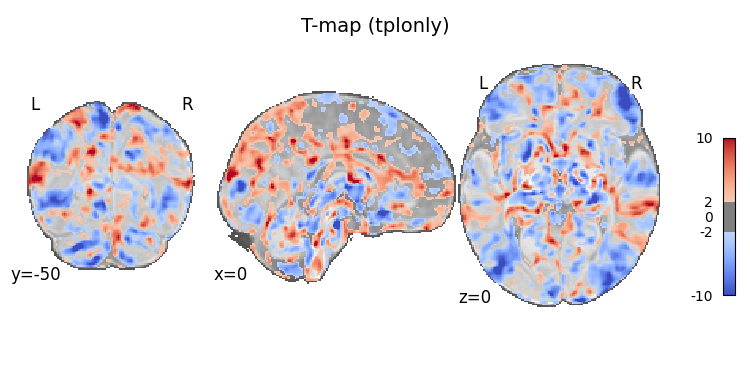

Saved /project/4290000.01/yapwan/Projects/NeonatalNormalization/Result/tmap_bias_log_JD_00_to_01_onlyBCP_l1o_tplonly.png
Plotting: avgsubj
FDR t-threshold: 5.5785


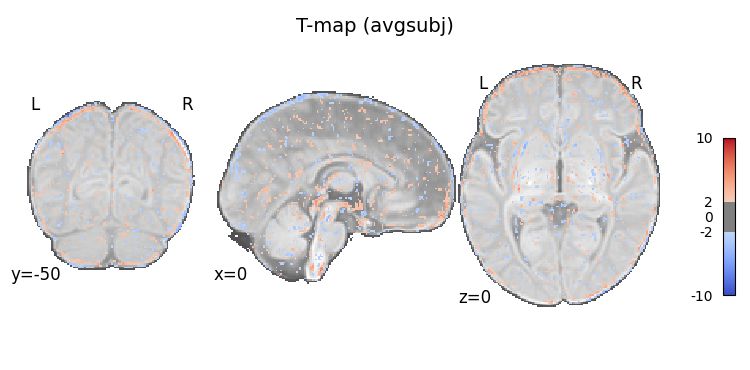

Saved /project/4290000.01/yapwan/Projects/NeonatalNormalization/Result/tmap_bias_log_JD_00_to_01_onlyBCP_l1o_avgsubj.png

===== Processing age window: 1-2M =====

🧠 tpl_fix=02M — Significance summary
  Total voxels: 1,353,268
  Raw p<0.05 = 744,785 (55.04%), FDR<0.05 = 660,645 (48.82%)
FDR t-threshold: 2.4250
Saved maps for tplonly

🧠 tpl_fix=02M — Significance summary
  Total voxels: 1,353,268
  Raw p<0.05 = 179,924 (13.30%), FDR<0.05 = 15,829 (1.17%)
FDR t-threshold: 4.0440
Saved maps for avgsubj
Plotting: tplonly
FDR t-threshold: 2.4250


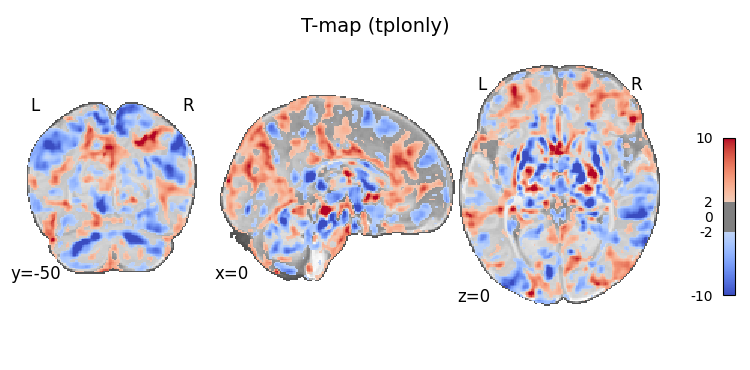

Saved /project/4290000.01/yapwan/Projects/NeonatalNormalization/Result/tmap_bias_log_JD_01_to_02_onlyBCP_l1o_tplonly.png
Plotting: avgsubj
FDR t-threshold: 4.0440


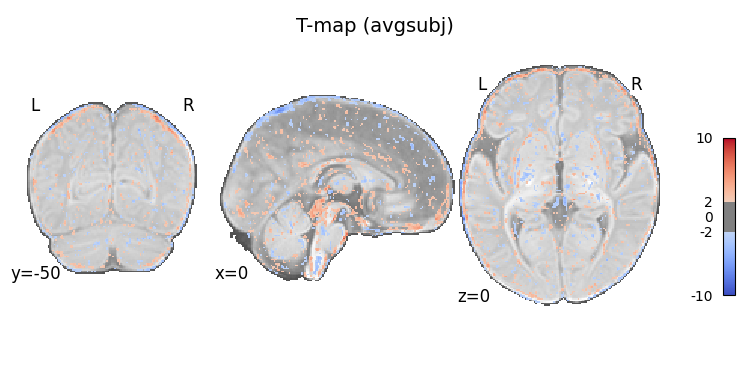

Saved /project/4290000.01/yapwan/Projects/NeonatalNormalization/Result/tmap_bias_log_JD_01_to_02_onlyBCP_l1o_avgsubj.png

===== Processing age window: 2-3M =====

🧠 tpl_fix=03M — Significance summary
  Total voxels: 1,480,101
  Raw p<0.05 = 740,846 (50.05%), FDR<0.05 = 622,200 (42.04%)
FDR t-threshold: 2.4947
Saved maps for tplonly

🧠 tpl_fix=03M — Significance summary
  Total voxels: 1,480,101
  Raw p<0.05 = 188,766 (12.75%), FDR<0.05 = 7,866 (0.53%)
FDR t-threshold: 4.3739
Saved maps for avgsubj
Plotting: tplonly
FDR t-threshold: 2.4947


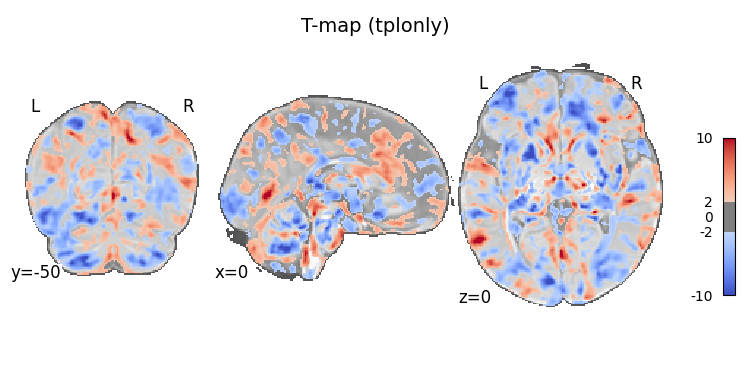

Saved /project/4290000.01/yapwan/Projects/NeonatalNormalization/Result/tmap_bias_log_JD_02_to_03_onlyBCP_l1o_tplonly.png
Plotting: avgsubj
FDR t-threshold: 4.3739


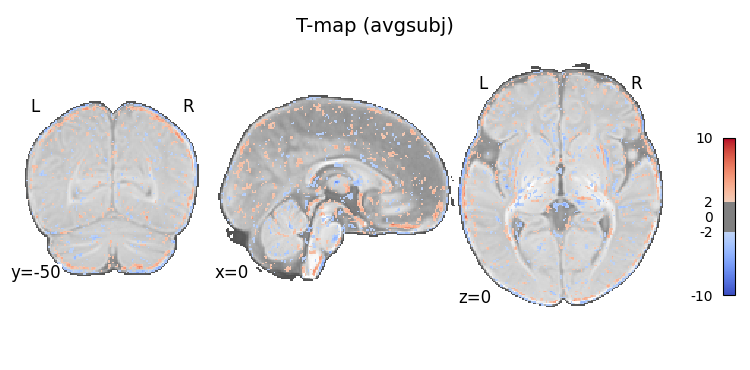

Saved /project/4290000.01/yapwan/Projects/NeonatalNormalization/Result/tmap_bias_log_JD_02_to_03_onlyBCP_l1o_avgsubj.png

===== Processing age window: 3-4M =====

🧠 tpl_fix=04M — Significance summary
  Total voxels: 1,603,164
  Raw p<0.05 = 929,193 (57.96%), FDR<0.05 = 842,950 (52.58%)
FDR t-threshold: 2.3746
Saved maps for tplonly

🧠 tpl_fix=04M — Significance summary
  Total voxels: 1,603,164
  Raw p<0.05 = 207,876 (12.97%), FDR<0.05 = 13,064 (0.81%)
FDR t-threshold: 4.1297
Saved maps for avgsubj
Plotting: tplonly
FDR t-threshold: 2.3746


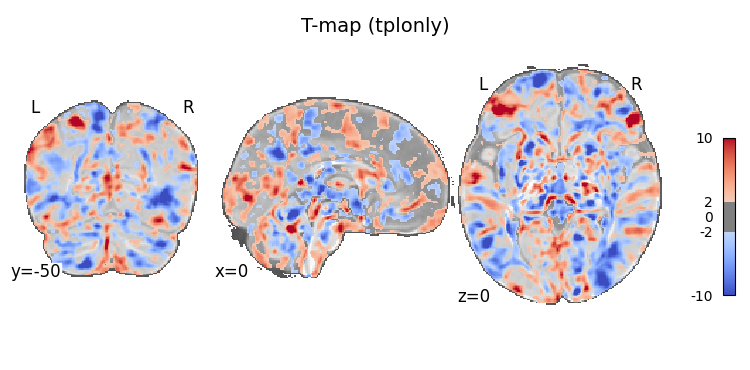

Saved /project/4290000.01/yapwan/Projects/NeonatalNormalization/Result/tmap_bias_log_JD_03_to_04_onlyBCP_l1o_tplonly.png
Plotting: avgsubj
FDR t-threshold: 4.1297


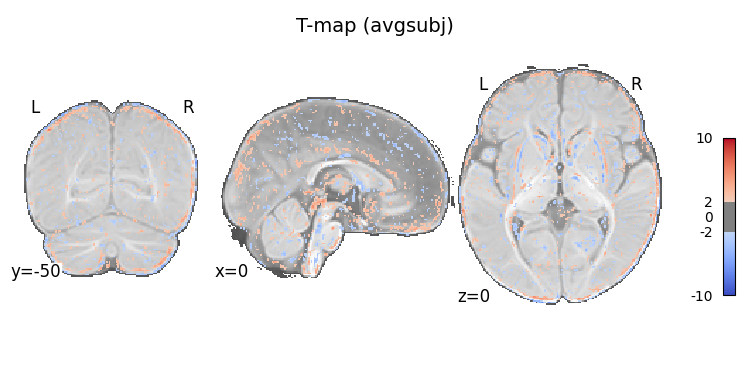

Saved /project/4290000.01/yapwan/Projects/NeonatalNormalization/Result/tmap_bias_log_JD_03_to_04_onlyBCP_l1o_avgsubj.png

===== Processing age window: 4-5M =====

🧠 tpl_fix=05M — Significance summary
  Total voxels: 1,685,588
  Raw p<0.05 = 1,073,666 (63.70%), FDR<0.05 = 1,007,990 (59.80%)
FDR t-threshold: 2.2973
Saved maps for tplonly

🧠 tpl_fix=05M — Significance summary
  Total voxels: 1,685,588
  Raw p<0.05 = 233,666 (13.86%), FDR<0.05 = 22,266 (1.32%)
FDR t-threshold: 3.8671
Saved maps for avgsubj
Plotting: tplonly
FDR t-threshold: 2.2973


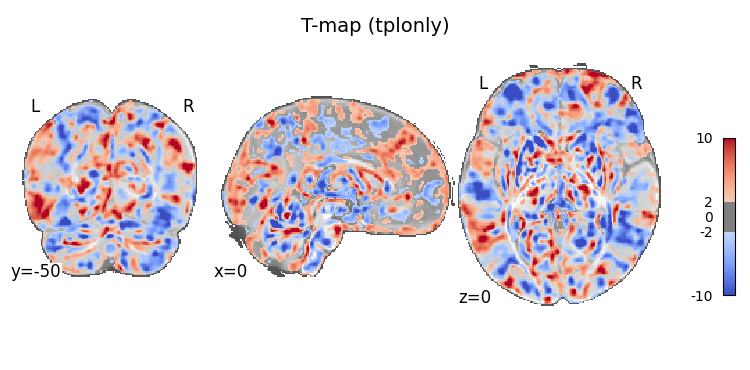

Saved /project/4290000.01/yapwan/Projects/NeonatalNormalization/Result/tmap_bias_log_JD_04_to_05_onlyBCP_l1o_tplonly.png
Plotting: avgsubj
FDR t-threshold: 3.8671


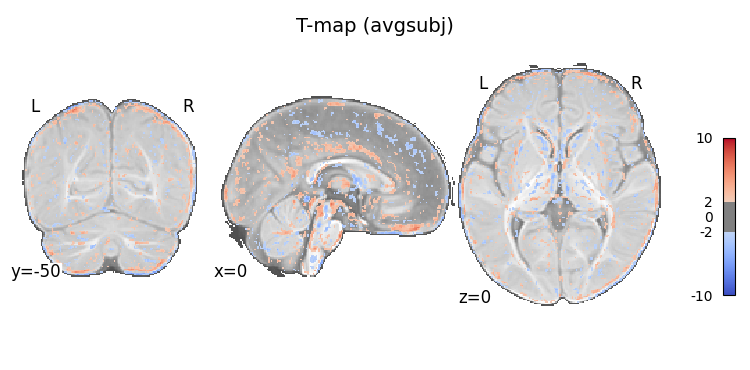

Saved /project/4290000.01/yapwan/Projects/NeonatalNormalization/Result/tmap_bias_log_JD_04_to_05_onlyBCP_l1o_avgsubj.png

===== Processing age window: 5-6M =====

🧠 tpl_fix=06M — Significance summary
  Total voxels: 1,745,138
  Raw p<0.05 = 1,053,864 (60.39%), FDR<0.05 = 972,498 (55.73%)
FDR t-threshold: 2.3296
Saved maps for tplonly

🧠 tpl_fix=06M — Significance summary
  Total voxels: 1,745,138
  Raw p<0.05 = 238,146 (13.65%), FDR<0.05 = 18,027 (1.03%)
FDR t-threshold: 3.9618
Saved maps for avgsubj
Plotting: tplonly
FDR t-threshold: 2.3296


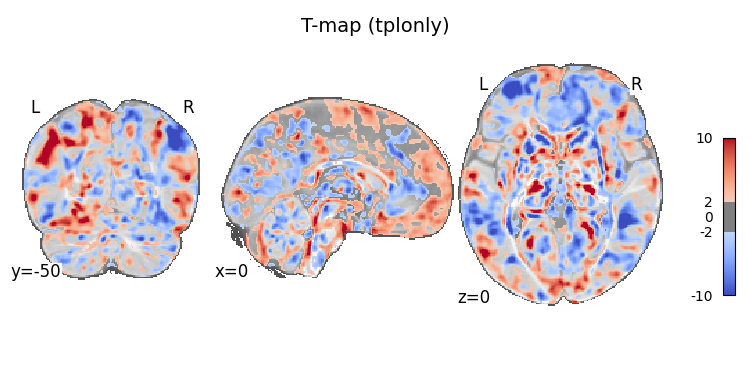

Saved /project/4290000.01/yapwan/Projects/NeonatalNormalization/Result/tmap_bias_log_JD_05_to_06_onlyBCP_l1o_tplonly.png
Plotting: avgsubj
FDR t-threshold: 3.9618


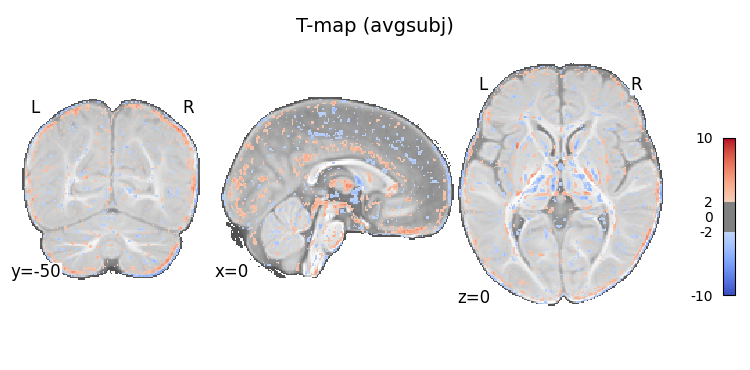

Saved /project/4290000.01/yapwan/Projects/NeonatalNormalization/Result/tmap_bias_log_JD_05_to_06_onlyBCP_l1o_avgsubj.png

===== Processing age window: 6-7M =====

🧠 tpl_fix=07M — Significance summary
  Total voxels: 1,822,726
  Raw p<0.05 = 1,214,941 (66.66%), FDR<0.05 = 1,155,478 (63.39%)
FDR t-threshold: 2.2813
Saved maps for tplonly

🧠 tpl_fix=07M — Significance summary
  Total voxels: 1,822,726
  Raw p<0.05 = 252,179 (13.84%), FDR<0.05 = 22,902 (1.26%)
FDR t-threshold: 3.9303
Saved maps for avgsubj
Plotting: tplonly
FDR t-threshold: 2.2813


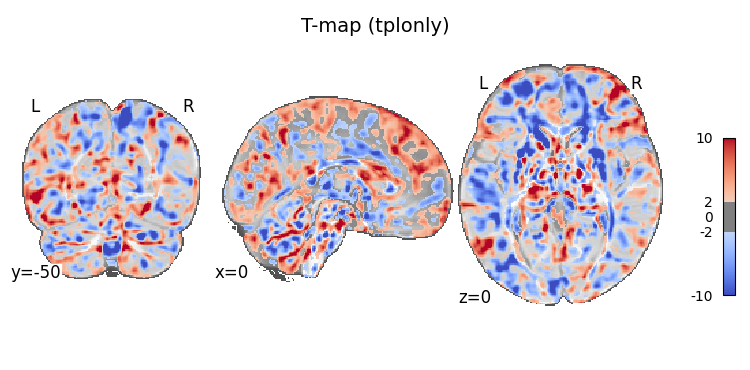

Saved /project/4290000.01/yapwan/Projects/NeonatalNormalization/Result/tmap_bias_log_JD_06_to_07_onlyBCP_l1o_tplonly.png
Plotting: avgsubj
FDR t-threshold: 3.9303


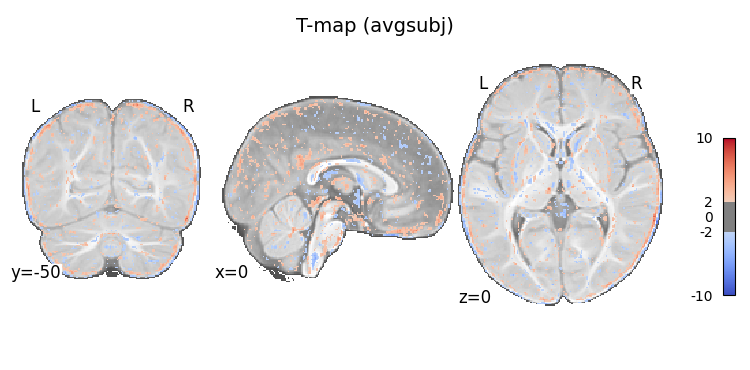

Saved /project/4290000.01/yapwan/Projects/NeonatalNormalization/Result/tmap_bias_log_JD_06_to_07_onlyBCP_l1o_avgsubj.png

===== Processing age window: 7-8M =====

🧠 tpl_fix=08M — Significance summary
  Total voxels: 1,904,603
  Raw p<0.05 = 1,067,901 (56.07%), FDR<0.05 = 959,895 (50.40%)
FDR t-threshold: 2.4018
Saved maps for tplonly

🧠 tpl_fix=08M — Significance summary
  Total voxels: 1,904,603
  Raw p<0.05 = 248,405 (13.04%), FDR<0.05 = 12,938 (0.68%)
FDR t-threshold: 4.2353
Saved maps for avgsubj
Plotting: tplonly
FDR t-threshold: 2.4018


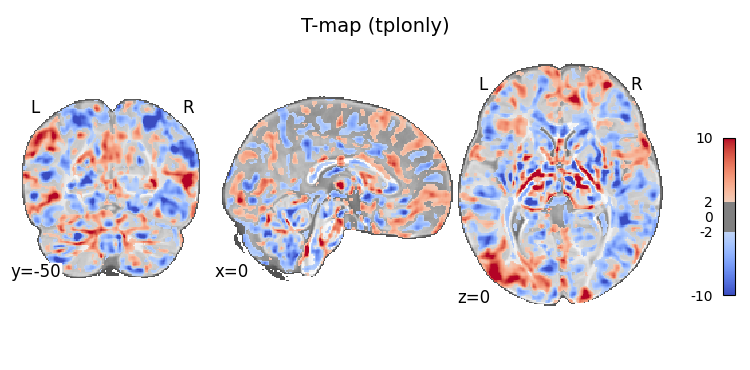

Saved /project/4290000.01/yapwan/Projects/NeonatalNormalization/Result/tmap_bias_log_JD_07_to_08_onlyBCP_l1o_tplonly.png
Plotting: avgsubj
FDR t-threshold: 4.2353


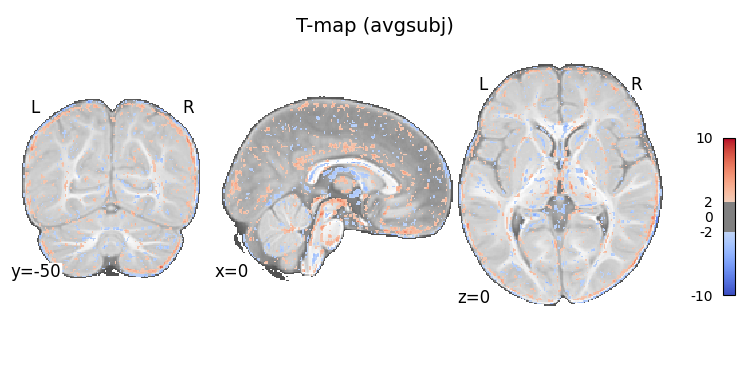

Saved /project/4290000.01/yapwan/Projects/NeonatalNormalization/Result/tmap_bias_log_JD_07_to_08_onlyBCP_l1o_avgsubj.png

===== Processing age window: 8-9M =====

🧠 tpl_fix=09M — Significance summary
  Total voxels: 1,953,306
  Raw p<0.05 = 1,189,744 (60.91%), FDR<0.05 = 1,100,202 (56.33%)
FDR t-threshold: 2.3427
Saved maps for tplonly

🧠 tpl_fix=09M — Significance summary
  Total voxels: 1,953,306
  Raw p<0.05 = 269,364 (13.79%), FDR<0.05 = 16,236 (0.83%)
FDR t-threshold: 4.1218
Saved maps for avgsubj
Plotting: tplonly
FDR t-threshold: 2.3427


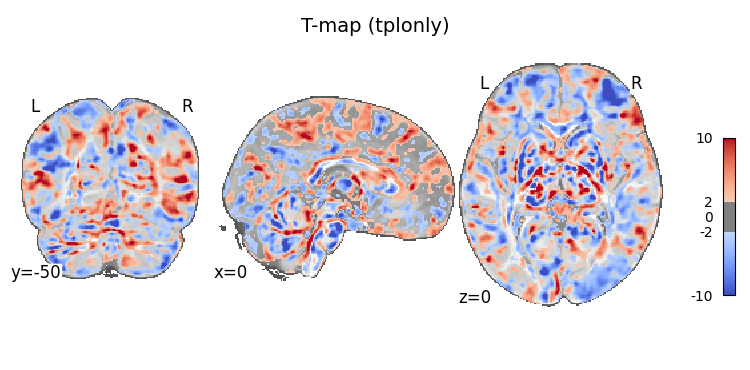

Saved /project/4290000.01/yapwan/Projects/NeonatalNormalization/Result/tmap_bias_log_JD_08_to_09_onlyBCP_l1o_tplonly.png
Plotting: avgsubj
FDR t-threshold: 4.1218


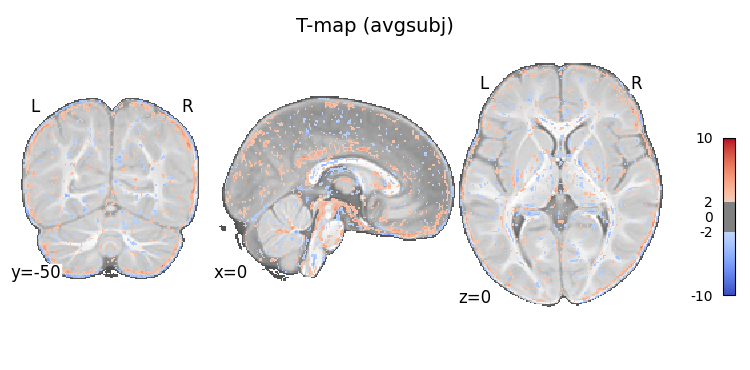

Saved /project/4290000.01/yapwan/Projects/NeonatalNormalization/Result/tmap_bias_log_JD_08_to_09_onlyBCP_l1o_avgsubj.png

===== Processing age window: 9-10M =====

🧠 tpl_fix=10M — Significance summary
  Total voxels: 1,991,761
  Raw p<0.05 = 1,200,094 (60.25%), FDR<0.05 = 1,105,683 (55.51%)
FDR t-threshold: 2.3429
Saved maps for tplonly

🧠 tpl_fix=10M — Significance summary
  Total voxels: 1,991,761
  Raw p<0.05 = 306,221 (15.37%), FDR<0.05 = 38,297 (1.92%)
FDR t-threshold: 3.7611
Saved maps for avgsubj
Plotting: tplonly
FDR t-threshold: 2.3429


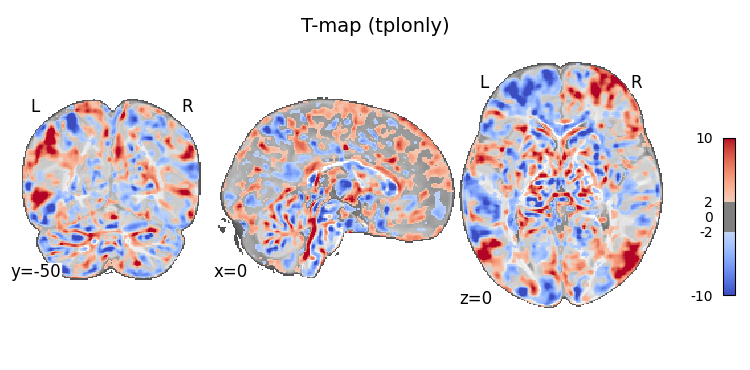

Saved /project/4290000.01/yapwan/Projects/NeonatalNormalization/Result/tmap_bias_log_JD_09_to_10_onlyBCP_l1o_tplonly.png
Plotting: avgsubj
FDR t-threshold: 3.7611


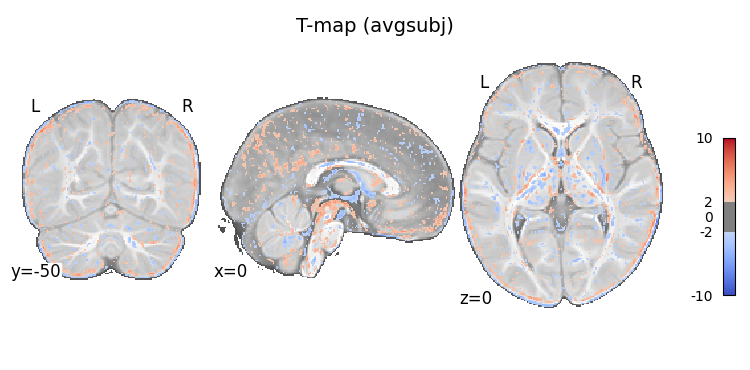

Saved /project/4290000.01/yapwan/Projects/NeonatalNormalization/Result/tmap_bias_log_JD_09_to_10_onlyBCP_l1o_avgsubj.png

===== Processing age window: 10-11M =====

🧠 tpl_fix=11M — Significance summary
  Total voxels: 2,000,973
  Raw p<0.05 = 1,239,875 (61.96%), FDR<0.05 = 1,153,467 (57.65%)
FDR t-threshold: 2.3255
Saved maps for tplonly

🧠 tpl_fix=11M — Significance summary
  Total voxels: 2,000,973
  Raw p<0.05 = 296,814 (14.83%), FDR<0.05 = 27,610 (1.38%)
FDR t-threshold: 3.8932
Saved maps for avgsubj
Plotting: tplonly
FDR t-threshold: 2.3255


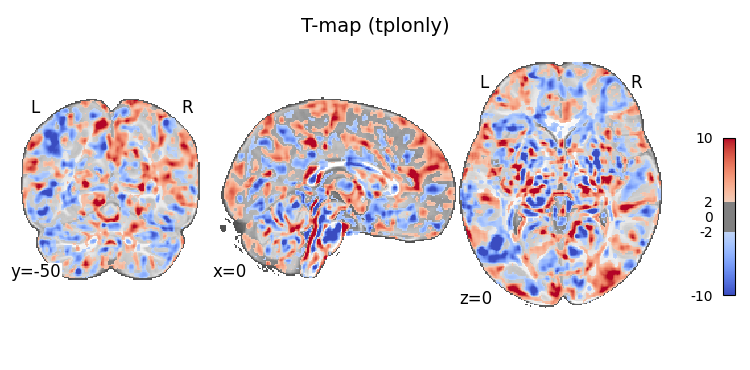

Saved /project/4290000.01/yapwan/Projects/NeonatalNormalization/Result/tmap_bias_log_JD_10_to_11_onlyBCP_l1o_tplonly.png
Plotting: avgsubj
FDR t-threshold: 3.8932


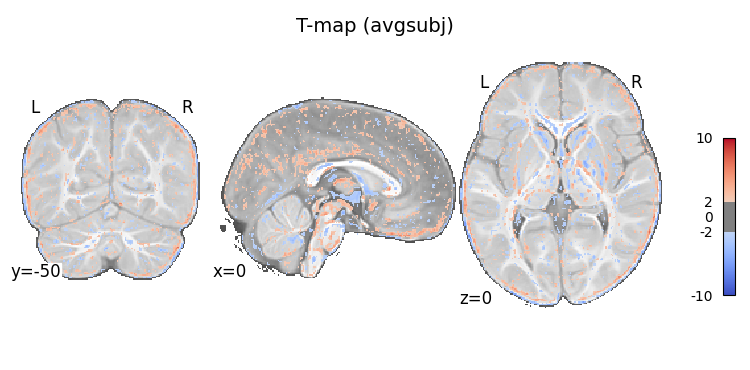

Saved /project/4290000.01/yapwan/Projects/NeonatalNormalization/Result/tmap_bias_log_JD_10_to_11_onlyBCP_l1o_avgsubj.png

===== Processing age window: 11-12M =====

🧠 tpl_fix=12M — Significance summary
  Total voxels: 2,053,592
  Raw p<0.05 = 1,207,263 (58.79%), FDR<0.05 = 1,104,950 (53.81%)
FDR t-threshold: 2.3512
Saved maps for tplonly

🧠 tpl_fix=12M — Significance summary
  Total voxels: 2,053,592
  Raw p<0.05 = 298,057 (14.51%), FDR<0.05 = 22,996 (1.12%)
FDR t-threshold: 3.9523
Saved maps for avgsubj
Plotting: tplonly
FDR t-threshold: 2.3512


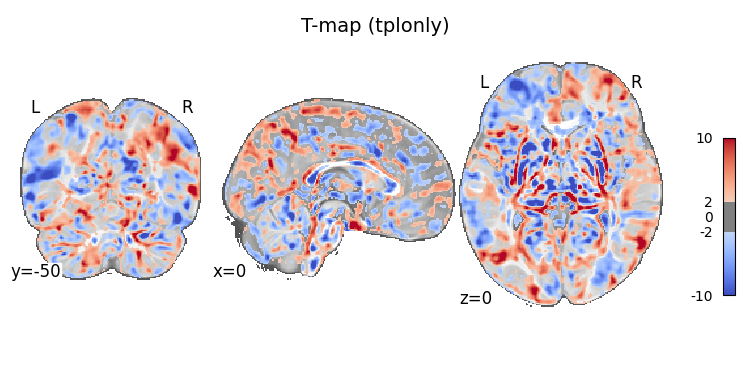

Saved /project/4290000.01/yapwan/Projects/NeonatalNormalization/Result/tmap_bias_log_JD_11_to_12_onlyBCP_l1o_tplonly.png
Plotting: avgsubj
FDR t-threshold: 3.9523


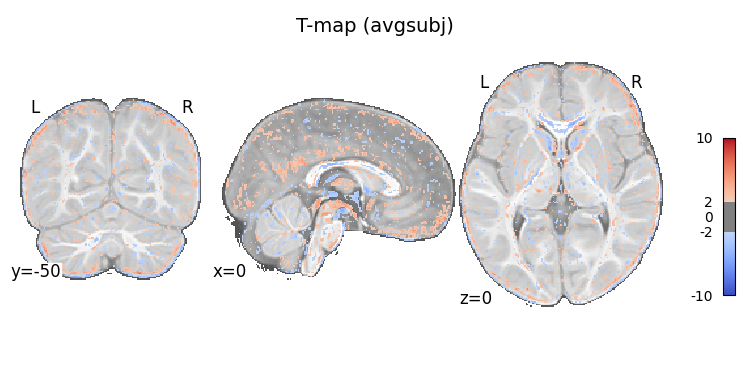

Saved /project/4290000.01/yapwan/Projects/NeonatalNormalization/Result/tmap_bias_log_JD_11_to_12_onlyBCP_l1o_avgsubj.png


In [5]:
# ======== Config ======== #
modalities = ["T1", "T2"]
pipel_dir = "/project/4290000.01/yapwan/Projects/CerebellarNormalization_1002/pipeline/ants_normalize"
pipel_dir = "/project/4290000.01/yapwan/Projects/NeonatalNormalization/Data"
tpl_root = "/project/4290000.01/yapwan/toolbox/BCP-atlas-for_release-Ver2.0.0"
tpl_trans_dir = f"{tpl_root}/tpl_xfm_build"


# ================= CONFIG ================= #
result_dir = "/project/4290000.01/yapwan/Projects/NeonatalNormalization/Result"
tpl_root    = "/project/4290000.01/yapwan/toolbox/BCP-atlas-for_release-Ver2.0.0"

methods = ["tplonly", "avgsubj"]
tomonth = 12
dataset_name = 'BCP'
print(f"Processing dataset: {dataset_name}")
info_age = pd.read_csv(os.path.join(Info_dir, f'{dataset_name}_participants_selected_30_eachbin_qc_filtered.tsv'), sep='\t')
window_cols = [c for c in info_age.columns if "-" in c and c.endswith("M")]
subs = {}
for m_bin in window_cols[:tomonth]:
    print(f"\n===== Processing age window: {m_bin} =====")
    tpl_mov_month = m_bin.replace("M","").split("-")[0].zfill(2)
    tpl_fix_month = m_bin.replace("M","").split("-")[1].zfill(2)
    

    ref_img  = nib.load(get_tpl_path(tpl_fix_month, "T1"))
    mask_img = nib.load(get_tpl_path(tpl_fix_month, "T1").replace("-T1.nii.gz", "-Mask.nii.gz"))
    mask = mask_img.get_fdata() > 0

    file_key = f"log_JD_{tpl_mov_month}_to_{tpl_fix_month}_onlyBCP_l1o"

    # Load bias arrays once
    bias_dt = np.load(os.path.join(result_dir, f"all_bias_{file_key}_tplonly.npy"))
    bias_as = np.load(os.path.join(result_dir, f"all_bias_{file_key}_avgsubj.npy"))


    df = bias_dt.shape[0] - 1  # df for t-test

    # Pre-store everything for visualization
    t_results = {}
    p_results = {}

    # ---------- Compute t-test and save maps ---------- #
    for method, bias in zip(methods, [bias_dt, bias_as]):

        # t-test
        tvals, pvals = one_sample_ttest(bias)
        t_results[method] = tvals
        p_results[method] = pvals

        # FDR
        reject, qvals = fdr_bh(pvals, alpha=0.05)

        # Mean bias
        mean_bias = bias.mean(axis=0)
        sig_mean_bias = np.where(reject, mean_bias, 0)

        # ======== Summary ======== #
        total_voxels = np.sum(mask)
        raw_sig = np.sum(pvals < 0.05)
        fdr_sig = np.sum(reject)
        print(f"\n🧠 tpl_fix={tpl_fix_month}M — Significance summary")
        print(f"  Total voxels: {total_voxels:,}")
        print(f"  Raw p<0.05 = {raw_sig:,} ({raw_sig/total_voxels*100:.2f}%), "
            f"FDR<0.05 = {fdr_sig:,} ({fdr_sig/total_voxels*100:.2f}%)")

        # FDR t-threshold
        t_thr = compute_fdr_t_threshold(tvals, pvals, alpha=0.05, df=df)
        if t_thr is None:
            t_thr = 1.96
        print(f"FDR t-threshold: {t_thr:.4f}")

        
        # Save
        save_nifti(tvals, mask, ref_img, os.path.join(result_dir, f"tmap_bias_{file_key}_{method}.nii.gz"))
        save_nifti(pvals, mask, ref_img, os.path.join(result_dir, f"pmap_bias_{file_key}_{method}.nii.gz"))
        save_nifti(qvals, mask, ref_img, os.path.join(result_dir, f"qmap_bias_{file_key}_{method}_fdr05.nii.gz"))
        save_nifti(reject.astype(np.uint8), mask, ref_img,
                   os.path.join(result_dir, f"sigmask_bias_{file_key}_{method}_fdr05.nii.gz"))

        save_nifti(mean_bias,      mask, ref_img, os.path.join(result_dir, f"bias_mean_{file_key}_{method}.nii.gz"))
        save_nifti(sig_mean_bias,  mask, ref_img,
                   os.path.join(result_dir, f"bias_mean_sig_{file_key}_{method}_fdr05.nii.gz"))

        print(f"Saved maps for {method}")

    # ---------- Visualization (FDR threshold) ---------- #
    bg_img = get_tpl_path(tpl_fix_month, "T1")

    for method in methods:

        print(f"Plotting: {method}")

        tvals = t_results[method]
        pvals = p_results[method]

        # FDR t-threshold
        t_thr = compute_fdr_t_threshold(tvals, pvals, alpha=0.05, df=df)
        if t_thr is None:
            t_thr = 1.96

        # Plot
        print(f"FDR t-threshold: {t_thr:.4f}")
        display = plotting.plot_stat_map(
            os.path.join(result_dir, f"tmap_bias_{file_key}_{method}.nii.gz"),
            bg_img=bg_img,
            # threshold=t_thr,
            threshold=1.96,
            vmin=-10, vmax=10,
            cmap='coolwarm',
            draw_cross=False,
            black_bg=False,
            display_mode='ortho',
            cut_coords=[0, -50, 0]
        )

        # Adjust colorbar
        cbar_ax = getattr(display, "_cbar_ax", getattr(display, "_colorbar_ax", None))
        pos = cbar_ax.get_position()
        cbar_ax.set_position([pos.x0, pos.y0 + 0.15 * pos.height, pos.width, pos.height * 0.5])

        # Title
        fig = getattr(display, "_fig", plt.gcf())
        plt.tight_layout(rect=[0, 0, 1, 0.94])
        fig.suptitle(f"T-map ({method})", y=0.98, fontsize=14)

        out_png = os.path.join(result_dir, f"tmap_bias_{file_key}_{method}_FDRthr.png")
        out_png = os.path.join(result_dir, f"tmap_bias_{file_key}_{method}.png")
        plt.savefig(out_png, dpi=300, bbox_inches="tight")
        plt.show()

        print(f"Saved {out_png}")

In [9]:
import os
import numpy as np
import pandas as pd
import nibabel as nib
import matplotlib.pyplot as plt
import seaborn as sns

# ======== CONFIG ======== #
result_dir = "/project/4290000.01/yapwan/Projects/NeonatalNormalization/Result"
tpl_root   = "/project/4290000.01/yapwan/toolbox/BCP-atlas-for_release-Ver2.0.0"
Info_dir   = "/project/4290000.01/yapwan/Projects/NeonatalNormalization/Info"

dataset_name = "BCP"
tomonth = 12


# ======== LOAD INFO ======== #
info_age = pd.read_csv(
    os.path.join(Info_dir, f"{dataset_name}_participants_selected_30_eachbin_qc_filtered.tsv"),
    sep="\t"
)

window_cols = [c for c in info_age.columns if "-" in c and c.endswith("M")]

# ======== STORAGE ======== #
mean_tplonly, mean_avgsubj = [], []
percent_tplonly, percent_avgsubj = [], []
sig_percent_tplonly, sig_percent_avgsubj = [], []
labels = []

print(f"Processing dataset: {dataset_name}")

# ======== MAIN LOOP ======== #
for m_bin in window_cols[:tomonth]:

    print(f"\n===== Processing age window: {m_bin} =====")

    tpl_mov_month = m_bin.replace("M","").split("-")[0].zfill(2)
    tpl_fix_month = m_bin.replace("M","").split("-")[1].zfill(2)

    file_key = f"log_JD_{tpl_mov_month}_to_{tpl_fix_month}_onlyBCP_l1o"

    bias_to = np.load(os.path.join(result_dir, f"all_bias_{file_key}_tplonly.npy"))
    bias_as = np.load(os.path.join(result_dir, f"all_bias_{file_key}_avgsubj.npy"))

    # t-test
    t_to, p_to = one_sample_ttest(bias_to)
    t_as, p_as = one_sample_ttest(bias_as)

    # FDR
    reject_to, _ = fdr_bh(p_to)
    reject_as, _ = fdr_bh(p_as)

    total_voxels = len(p_to)

    # ======== METRICS ======== #
    mean_tplonly.append(np.mean(np.abs(t_to)))
    mean_avgsubj.append(np.mean(np.abs(t_as)))

    percent_tplonly.append(np.sum(p_to < 0.05) / total_voxels * 100)
    sig_percent_tplonly.append(np.sum(reject_to) / total_voxels * 100)
    percent_avgsubj.append(np.sum(p_as < 0.05) / total_voxels * 100)
    sig_percent_avgsubj.append(np.sum(reject_as) / total_voxels * 100)
    labels.append(m_bin)

    # ======== Summary ======== #
    print(f"\n🧠 tpl_fix={tpl_fix_month}M — Significance summary")
    print(f"  Total voxels: {total_voxels:,}")
    print(f"  TplOnly: Raw p<0.05 = {np.sum(p_to < 0.05):,} ({np.sum(p_to < 0.05)/total_voxels*100:.2f}%), "
        f"FDR<0.05 = {np.sum(reject_to):,} ({np.sum(reject_to)/total_voxels*100:.2f}%)")
    print(f"  AvgSubj: Raw p<0.05 = {np.sum(p_as < 0.05):,} ({np.sum(p_as < 0.05)/total_voxels*100:.2f}%), "
        f"FDR<0.05 = {np.sum(reject_as):,} ({np.sum(reject_as)/total_voxels*100:.2f}%)")




Processing dataset: BCP

===== Processing age window: 0-1M =====

🧠 tpl_fix=01M — Significance summary
  Total voxels: 1,192,993
  TplOnly: Raw p<0.05 = 614,268 (51.49%), FDR<0.05 = 518,917 (43.50%)
  AvgSubj: Raw p<0.05 = 136,536 (11.44%), FDR<0.05 = 1,258 (0.11%)

===== Processing age window: 1-2M =====

🧠 tpl_fix=02M — Significance summary
  Total voxels: 1,353,268
  TplOnly: Raw p<0.05 = 744,785 (55.04%), FDR<0.05 = 660,645 (48.82%)
  AvgSubj: Raw p<0.05 = 179,924 (13.30%), FDR<0.05 = 15,829 (1.17%)

===== Processing age window: 2-3M =====

🧠 tpl_fix=03M — Significance summary
  Total voxels: 1,480,101
  TplOnly: Raw p<0.05 = 740,846 (50.05%), FDR<0.05 = 622,200 (42.04%)
  AvgSubj: Raw p<0.05 = 188,766 (12.75%), FDR<0.05 = 7,866 (0.53%)

===== Processing age window: 3-4M =====

🧠 tpl_fix=04M — Significance summary
  Total voxels: 1,603,164
  TplOnly: Raw p<0.05 = 929,193 (57.96%), FDR<0.05 = 842,950 (52.58%)
  AvgSubj: Raw p<0.05 = 207,876 (12.97%), FDR<0.05 = 13,064 (0.81%)

=====

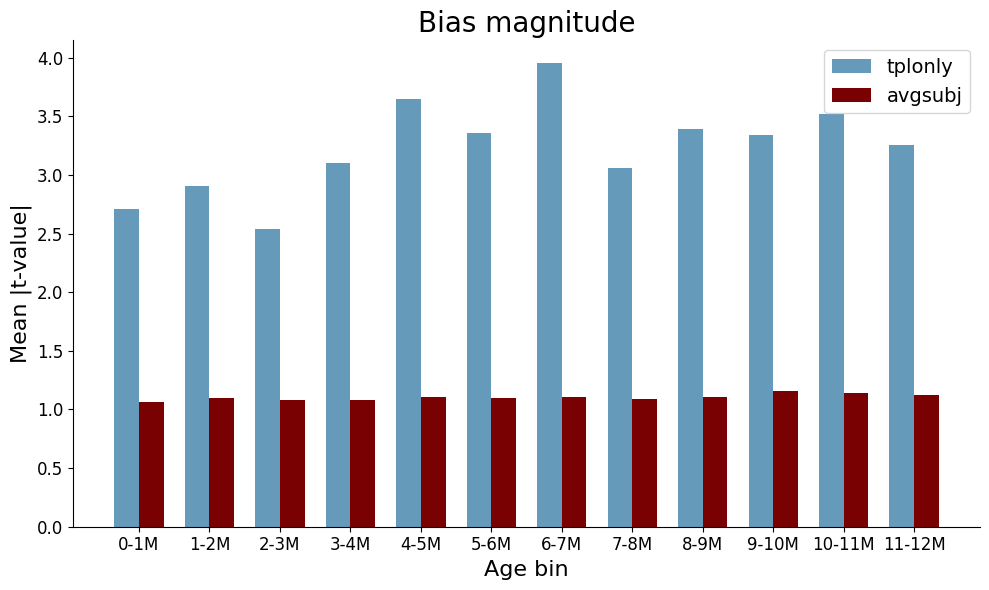

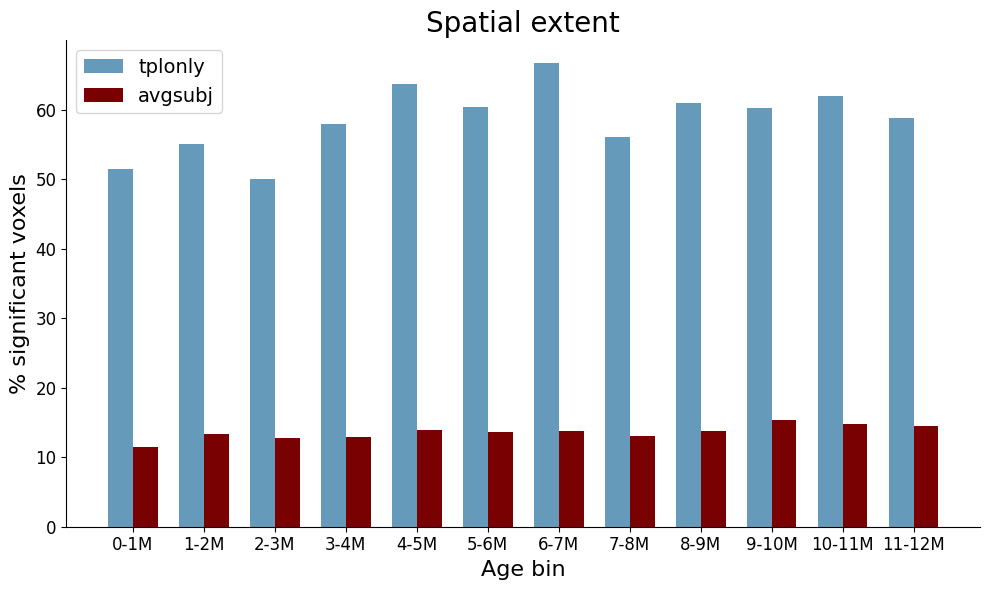

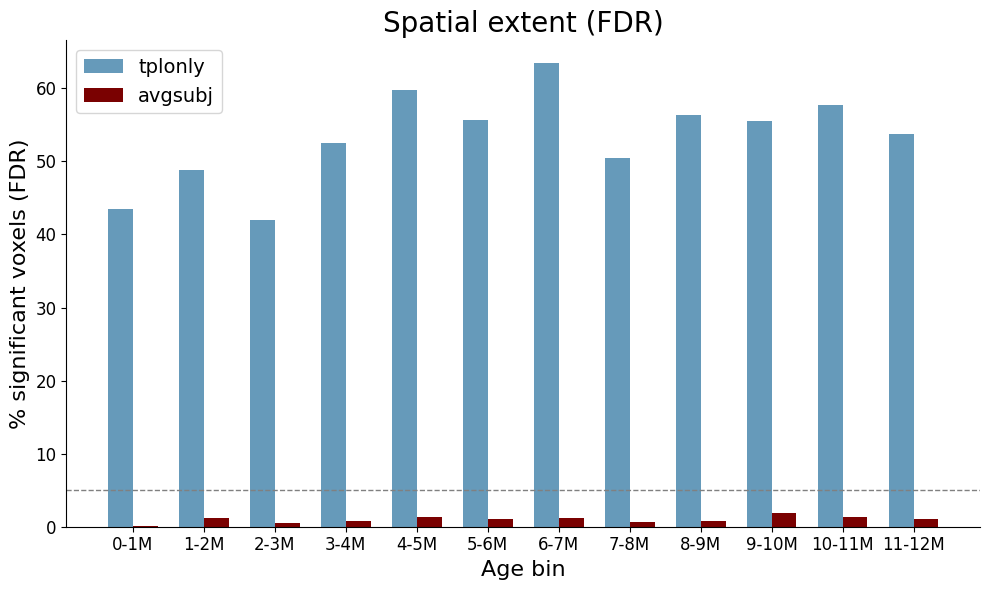

In [10]:
# ======== PLOT (LOOP VERSION) ======== #
x = np.arange(len(labels))
width = 0.35

plot_configs = [
    {
        "data1": mean_tplonly,
        "data2": mean_avgsubj,
        "ylabel": "Mean |t-value|",
        "title": "Bias magnitude",
        "filename": "mean_abs_t.png"
    },
    {
        "data1": percent_tplonly,
        "data2": percent_avgsubj,
        "ylabel": "% significant voxels",
        "title": "Spatial extent",
        "filename": "percent_significant.png"
    },
    {
        "data1": sig_percent_tplonly,
        "data2": sig_percent_avgsubj,
        "ylabel": "% significant voxels (FDR)",
        "title": "Spatial extent (FDR)",
        "filename": "percent_significant.png"
    }
]

for cfg in plot_configs:

    fig, ax = plt.subplots(figsize=(10,6))

    ax.bar(
        x - width/2,
        cfg["data1"],
        width,
        label="tplonly",
        color='#669aba'
    )

    ax.bar(
        x + width/2,
        cfg["data2"],
        width,
        label="avgsubj",
        color='#7a0101'
    )
    if "FDR" in cfg["title"]:
        ax.axhline(5, color='gray', linestyle='--', linewidth=1)
    ax.set_xticks(x)
    ax.set_xticklabels(labels, fontsize=12)
    ax.set_ylabel(cfg["ylabel"], fontsize=16)
    ax.set_xlabel("Age bin", fontsize=16)
    ax.set_title(cfg["title"], fontsize=20)
    ax.tick_params(axis='both', labelsize=12)
    sns.despine(ax=ax)
    ax.legend(fontsize=14)
    plt.tight_layout()

    out_path = os.path.join(result_dir, cfg["filename"])
    plt.savefig(out_path, dpi=200)

    plt.show()

### half split

In [5]:

for dataset_name in ['BCP']:
    print(f"Processing dataset: {dataset_name}")
    info_age = pd.read_csv(os.path.join(Info_dir, f'{dataset_name}_participants_selected_30_eachbin.tsv'), sep='\t')
    window_cols = [c for c in info_age.columns if "-" in c and c.endswith("M")]
    subs = {}
    for w in window_cols:
        subs[w] = (
            info_age.loc[info_age[w], ["participant_id"]]
            .drop_duplicates().values.flatten()
        )
    for m_bin in window_cols[:5]:

    # for m_bin in ['0-1M', '1-2M']:
        print(f"\n===== Processing age window: {m_bin} =====")
        tpl_mov_month = m_bin.replace("M","").split("-")[0].zfill(2)
        tpl_fix_month = m_bin.replace("M","").split("-")[1].zfill(2)

        file_keyword = f"log_JD_{tpl_mov_month}_to_{tpl_fix_month}_onlyBCP_test"

        ref_img = nib.load(get_tpl_path(tpl_fix_month, "T1"))
        eval_mask_img = nib.load(get_mask_path(tpl_fix_month))
        eval_mask_data = eval_mask_img.get_fdata()
        mask_shape = eval_mask_data.shape

        all_jd_d, all_jd_tl, all_jd_as = [], [], []

        split_dir = os.path.join(tpl_root, "tpl_xfm_build", "avgsubj", f"{tpl_mov_month}-{tpl_fix_month}M")
        test_subs = pd.read_csv(os.path.join(split_dir,f'{dataset_name}_test_subs.tsv'))["subject"].astype(str).tolist()
        print(f"Number of Test subjects: {len(test_subs)}")
        print("Test subjects:", test_subs)
        for subid in tqdm(test_subs):
            output_dir = os.path.join(pipel_dir, dataset_name, subid)

            paths = {
                "direct": os.path.join(output_dir, f"T1T2_Brain_pad_Norm_to_{tpl_fix_month}Mtpl_log_JD.nii.gz"),
                "tplonly": os.path.join(output_dir, f"Displacement_T1T2_Brain_pad_Norm_to_{tpl_mov_month}Mtpl_then_to_{tpl_fix_month}Mtpl_by_tplonly_log_JD.nii.gz"),
                "avgsubj": os.path.join(output_dir, f"Displacement_T1T2_Brain_pad_Norm_to_{tpl_mov_month}Mtpl_then_to_{tpl_fix_month}Mtpl_by_avgsubj_train_onlyBCP_log_JD.nii.gz"),
            }

            jd_d = safe_load(paths["direct"], mask_shape)
            jd_tl = safe_load(paths["tplonly"], mask_shape)
            jd_as = safe_load(paths["avgsubj"], mask_shape)

            if any(x is None for x in [jd_d, jd_tl, jd_as]):
                continue

            all_jd_d.append(jd_d[eval_mask_data > 0])
            all_jd_tl.append(jd_tl[eval_mask_data > 0])
            all_jd_as.append(jd_as[eval_mask_data > 0])

        if not all_jd_d:
            print(f"❗ No valid data for tpl_fix_month={tpl_fix_month}. Skipping.")
            continue


        # ======== Bias (Indirect − Direct) ======== #
        diff_tl_d = np.stack([i - d for i, d in zip(all_jd_tl, all_jd_d)])  # shape: (n_subjects, n_voxels)
        diff_as_d = np.stack([i - d for i, d in zip(all_jd_as, all_jd_d)])
        np.save(os.path.join(result_dir, f"all_bias_{file_keyword}_tplonly.npy"), diff_tl_d)
        np.save(os.path.join(result_dir, f"all_bias_{file_keyword}_avgsubj.npy"), diff_as_d)

    print("\n✅ All tpl_fix_months processed successfully.")

Processing dataset: BCP

===== Processing age window: 0-1M =====
Number of Test subjects: 11
Test subjects: ['sub-002', 'sub-017', 'sub-005', 'sub-006', 'sub-004', 'sub-010', 'sub-018', 'sub-009', 'sub-003', 'sub-015', 'sub-007']


  0%|          | 0/11 [00:00<?, ?it/s]

100%|██████████| 11/11 [00:32<00:00,  2.93s/it]



===== Processing age window: 1-2M =====
Number of Test subjects: 14
Test subjects: ['sub-013', 'sub-038', 'sub-016', 'sub-017', 'sub-015', 'sub-021', 'sub-029', 'sub-020', 'sub-014', 'sub-012', 'sub-018', 'sub-024', 'sub-023', 'sub-026']


100%|██████████| 14/14 [00:42<00:00,  3.04s/it]



===== Processing age window: 2-3M =====
Number of Test subjects: 15
Test subjects: ['sub-030', 'sub-023', 'sub-031', 'sub-027', 'sub-042', 'sub-026', 'sub-025', 'sub-034', 'sub-053', 'sub-041', 'sub-048', 'sub-024', 'sub-022', 'sub-038', 'sub-061']


100%|██████████| 15/15 [00:48<00:00,  3.23s/it]



===== Processing age window: 3-4M =====
Number of Test subjects: 15
Test subjects: ['sub-051', 'sub-040', 'sub-053', 'sub-044', 'sub-071', 'sub-043', 'sub-042', 'sub-061', 'sub-079', 'sub-070', 'sub-076', 'sub-041', 'sub-039', 'sub-066', 'sub-085']


100%|██████████| 15/15 [00:45<00:00,  3.04s/it]



===== Processing age window: 4-5M =====
Number of Test subjects: 15
Test subjects: ['sub-077', 'sub-069', 'sub-079', 'sub-073', 'sub-096', 'sub-072', 'sub-071', 'sub-085', 'sub-107', 'sub-095', 'sub-102', 'sub-070', 'sub-068', 'sub-092', 'sub-117']


100%|██████████| 15/15 [00:51<00:00,  3.43s/it]



✅ All tpl_fix_months processed successfully.


Processing dataset: BCP

===== Processing age window: 0-1M =====



🧠 tpl_fix=01M — Significance summary
  Total voxels: 1,192,993
  Raw p<0.05 = 647,657 (54.29%), FDR<0.05 = 560,656 (47.00%)
FDR t-threshold: 2.6699
Saved maps for tplonly

🧠 tpl_fix=01M — Significance summary
  Total voxels: 1,192,993
  Raw p<0.05 = 306,776 (25.71%), FDR<0.05 = 63,417 (5.32%)
FDR t-threshold: 3.9666
Saved maps for avgsubj
Plotting: tplonly
FDR t-threshold: 2.6699


/scratch/yapwan/slurm_job_51370287/ipykernel_3769033/1457556350.py:124: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 1, 0.94])


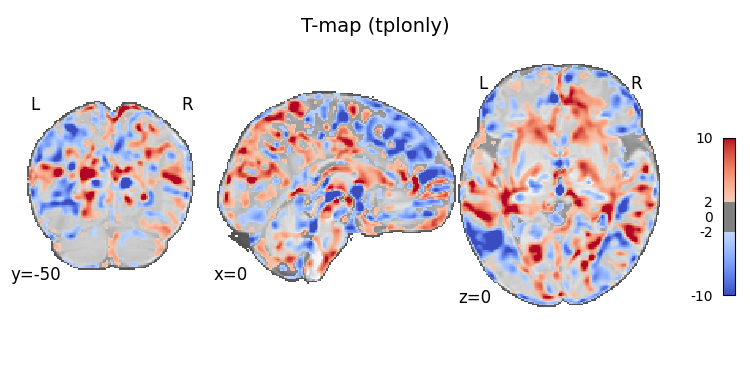

Saved /project/4290000.01/yapwan/Projects/NeonatalNormalization/Result/tmap_bias_log_JD_00_to_01_onlyBCP_test_tplonly.png
Plotting: avgsubj
FDR t-threshold: 3.9666


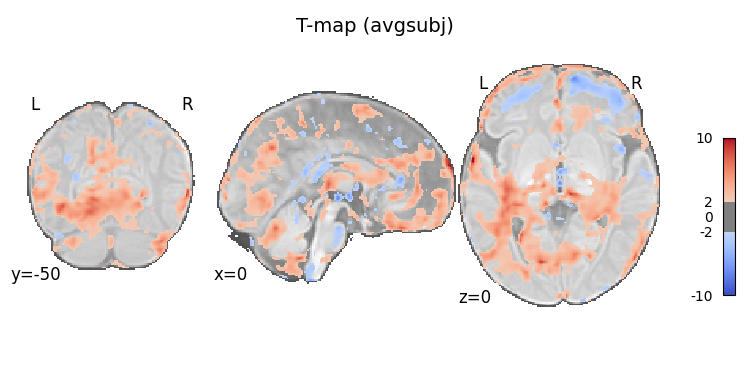

Saved /project/4290000.01/yapwan/Projects/NeonatalNormalization/Result/tmap_bias_log_JD_00_to_01_onlyBCP_test_avgsubj.png

===== Processing age window: 1-2M =====

🧠 tpl_fix=02M — Significance summary
  Total voxels: 1,353,268
  Raw p<0.05 = 478,055 (35.33%), FDR<0.05 = 294,531 (21.76%)
FDR t-threshold: 2.9683
Saved maps for tplonly

🧠 tpl_fix=02M — Significance summary
  Total voxels: 1,353,268
  Raw p<0.05 = 86,521 (6.39%), FDR<0.05 = 0 (0.00%)
FDR t-threshold: 1.9600
Saved maps for avgsubj
Plotting: tplonly
FDR t-threshold: 2.9683


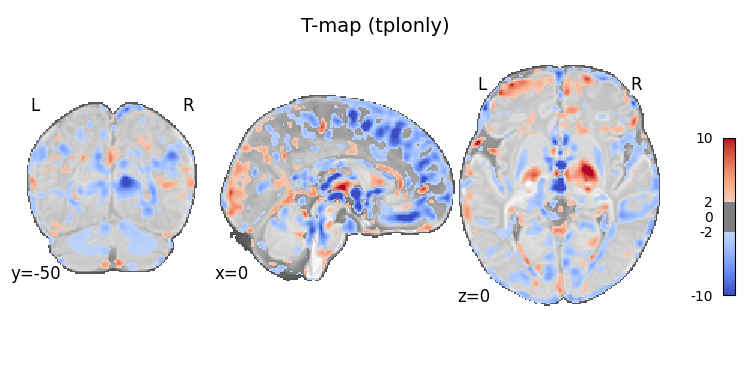

Saved /project/4290000.01/yapwan/Projects/NeonatalNormalization/Result/tmap_bias_log_JD_01_to_02_onlyBCP_test_tplonly.png
Plotting: avgsubj
FDR t-threshold: 1.9600


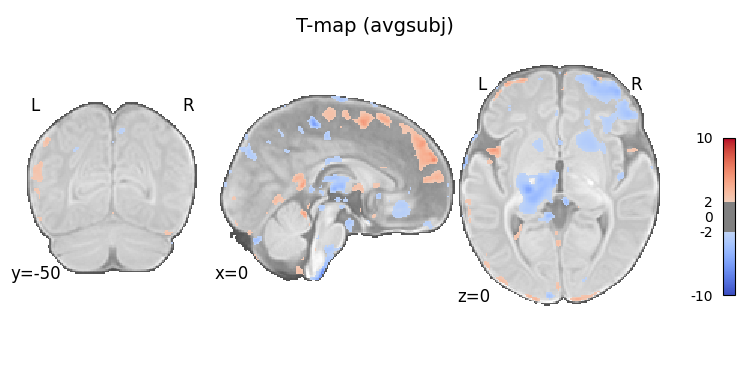

Saved /project/4290000.01/yapwan/Projects/NeonatalNormalization/Result/tmap_bias_log_JD_01_to_02_onlyBCP_test_avgsubj.png

===== Processing age window: 2-3M =====

🧠 tpl_fix=03M — Significance summary
  Total voxels: 1,480,101
  Raw p<0.05 = 655,928 (44.32%), FDR<0.05 = 505,937 (34.18%)
FDR t-threshold: 2.7049
Saved maps for tplonly

🧠 tpl_fix=03M — Significance summary
  Total voxels: 1,480,101
  Raw p<0.05 = 359,314 (24.28%), FDR<0.05 = 1,399 (0.09%)
FDR t-threshold: 5.7849
Saved maps for avgsubj
Plotting: tplonly
FDR t-threshold: 2.7049


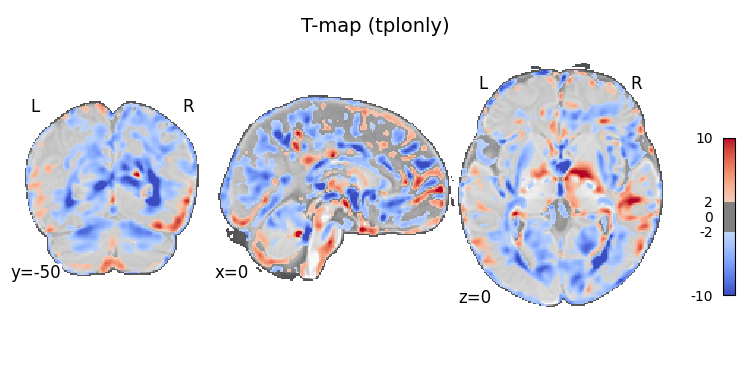

Saved /project/4290000.01/yapwan/Projects/NeonatalNormalization/Result/tmap_bias_log_JD_02_to_03_onlyBCP_test_tplonly.png
Plotting: avgsubj
FDR t-threshold: 5.7849


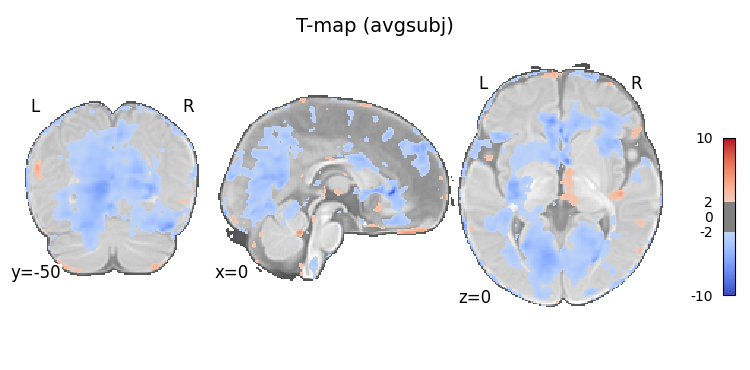

Saved /project/4290000.01/yapwan/Projects/NeonatalNormalization/Result/tmap_bias_log_JD_02_to_03_onlyBCP_test_avgsubj.png

===== Processing age window: 3-4M =====

🧠 tpl_fix=04M — Significance summary
  Total voxels: 1,603,164
  Raw p<0.05 = 624,232 (38.94%), FDR<0.05 = 432,753 (26.99%)
FDR t-threshold: 2.8251
Saved maps for tplonly

🧠 tpl_fix=04M — Significance summary
  Total voxels: 1,603,164
  Raw p<0.05 = 165,069 (10.30%), FDR<0.05 = 0 (0.00%)
FDR t-threshold: 1.9600
Saved maps for avgsubj
Plotting: tplonly
FDR t-threshold: 2.8251


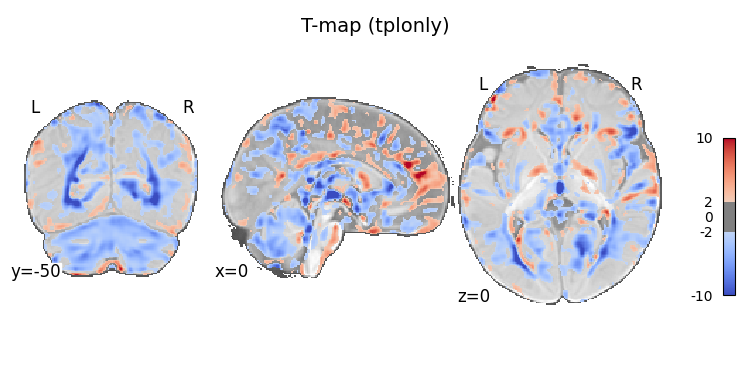

Saved /project/4290000.01/yapwan/Projects/NeonatalNormalization/Result/tmap_bias_log_JD_03_to_04_onlyBCP_test_tplonly.png
Plotting: avgsubj
FDR t-threshold: 1.9600


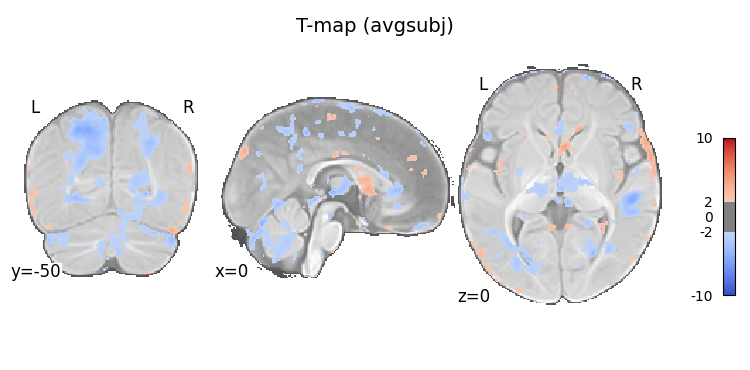

Saved /project/4290000.01/yapwan/Projects/NeonatalNormalization/Result/tmap_bias_log_JD_03_to_04_onlyBCP_test_avgsubj.png

===== Processing age window: 4-5M =====

🧠 tpl_fix=05M — Significance summary
  Total voxels: 1,685,588
  Raw p<0.05 = 763,681 (45.31%), FDR<0.05 = 598,702 (35.52%)
FDR t-threshold: 2.6853
Saved maps for tplonly

🧠 tpl_fix=05M — Significance summary
  Total voxels: 1,685,588
  Raw p<0.05 = 331,070 (19.64%), FDR<0.05 = 3,709 (0.22%)
FDR t-threshold: 5.3107
Saved maps for avgsubj
Plotting: tplonly
FDR t-threshold: 2.6853


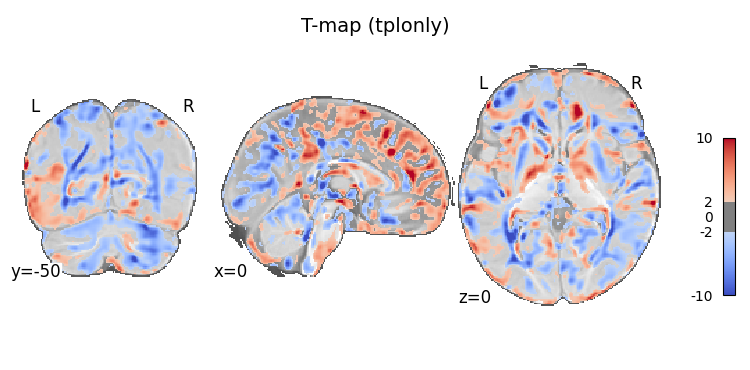

Saved /project/4290000.01/yapwan/Projects/NeonatalNormalization/Result/tmap_bias_log_JD_04_to_05_onlyBCP_test_tplonly.png
Plotting: avgsubj
FDR t-threshold: 5.3107


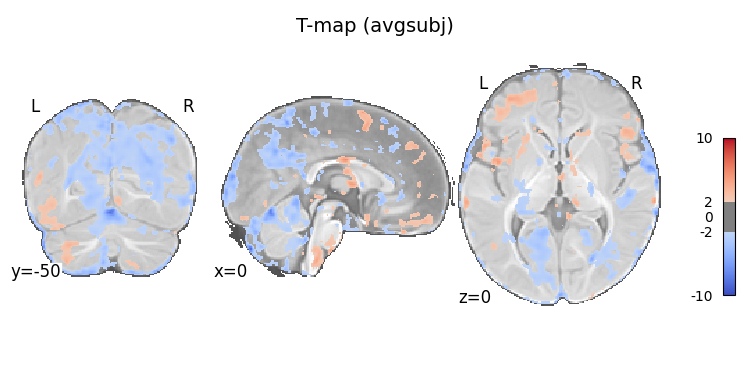

Saved /project/4290000.01/yapwan/Projects/NeonatalNormalization/Result/tmap_bias_log_JD_04_to_05_onlyBCP_test_avgsubj.png


In [10]:
# ======== Config ======== #
modalities = ["T1", "T2"]
pipel_dir = "/project/4290000.01/yapwan/Projects/CerebellarNormalization_1002/pipeline/ants_normalize"
pipel_dir = "/project/4290000.01/yapwan/Projects/NeonatalNormalization/Data"
tpl_root = "/project/4290000.01/yapwan/toolbox/BCP-atlas-for_release-Ver2.0.0"
tpl_trans_dir = f"{tpl_root}/tpl_xfm_build"


# ================= CONFIG ================= #
result_dir = "/project/4290000.01/yapwan/Projects/NeonatalNormalization/Result"
tpl_root    = "/project/4290000.01/yapwan/toolbox/BCP-atlas-for_release-Ver2.0.0"

methods = ["tplonly", "avgsubj"]

dataset_name = 'BCP'
print(f"Processing dataset: {dataset_name}")
info_age = pd.read_csv(os.path.join(Info_dir, f'{dataset_name}_participants_selected_30_eachbin.tsv'), sep='\t')
window_cols = [c for c in info_age.columns if "-" in c and c.endswith("M")]
subs = {}
for m_bin in window_cols[:5]:
    print(f"\n===== Processing age window: {m_bin} =====")
    tpl_mov_month = m_bin.replace("M","").split("-")[0].zfill(2)
    tpl_fix_month = m_bin.replace("M","").split("-")[1].zfill(2)
    

    ref_img  = nib.load(get_tpl_path(tpl_fix_month, "T1"))
    mask_img = nib.load(get_tpl_path(tpl_fix_month, "T1").replace("-T1.nii.gz", "-Mask.nii.gz"))
    mask = mask_img.get_fdata() > 0

    file_key = f"log_JD_{tpl_mov_month}_to_{tpl_fix_month}_onlyBCP_test"

    # Load bias arrays once
    bias_dt = np.load(os.path.join(result_dir, f"all_bias_{file_key}_tplonly.npy"))
    bias_as = np.load(os.path.join(result_dir, f"all_bias_{file_key}_avgsubj.npy"))


    df = bias_dt.shape[0] - 1  # df for t-test

    # Pre-store everything for visualization
    t_results = {}
    p_results = {}

    # ---------- Compute t-test and save maps ---------- #
    for method, bias in zip(methods, [bias_dt, bias_as]):

        # t-test
        tvals, pvals = one_sample_ttest(bias)
        t_results[method] = tvals
        p_results[method] = pvals

        # FDR
        reject, qvals = fdr_bh(pvals, alpha=0.05)

        # Mean bias
        mean_bias = bias.mean(axis=0)
        sig_mean_bias = np.where(reject, mean_bias, 0)

        # ======== Summary ======== #
        total_voxels = np.sum(mask)
        raw_sig = np.sum(pvals < 0.05)
        fdr_sig = np.sum(reject)
        print(f"\n🧠 tpl_fix={tpl_fix_month}M — Significance summary")
        print(f"  Total voxels: {total_voxels:,}")
        print(f"  Raw p<0.05 = {raw_sig:,} ({raw_sig/total_voxels*100:.2f}%), "
            f"FDR<0.05 = {fdr_sig:,} ({fdr_sig/total_voxels*100:.2f}%)")

        # FDR t-threshold
        t_thr = compute_fdr_t_threshold(tvals, pvals, alpha=0.05, df=df)
        if t_thr is None:
            t_thr = 1.96
        print(f"FDR t-threshold: {t_thr:.4f}")

        
        # Save
        save_nifti(tvals, mask, ref_img, os.path.join(result_dir, f"tmap_bias_{file_key}_{method}.nii.gz"))
        save_nifti(pvals, mask, ref_img, os.path.join(result_dir, f"pmap_bias_{file_key}_{method}.nii.gz"))
        save_nifti(qvals, mask, ref_img, os.path.join(result_dir, f"qmap_bias_{file_key}_{method}_fdr05.nii.gz"))
        save_nifti(reject.astype(np.uint8), mask, ref_img,
                   os.path.join(result_dir, f"sigmask_bias_{file_key}_{method}_fdr05.nii.gz"))

        save_nifti(mean_bias,      mask, ref_img, os.path.join(result_dir, f"bias_mean_{file_key}_{method}.nii.gz"))
        save_nifti(sig_mean_bias,  mask, ref_img,
                   os.path.join(result_dir, f"bias_mean_sig_{file_key}_{method}_fdr05.nii.gz"))

        print(f"Saved maps for {method}")

    # ---------- Visualization (FDR threshold) ---------- #
    bg_img = get_tpl_path(tpl_fix_month, "T1")

    for method in methods:

        print(f"Plotting: {method}")

        tvals = t_results[method]
        pvals = p_results[method]

        # FDR t-threshold
        t_thr = compute_fdr_t_threshold(tvals, pvals, alpha=0.05, df=df)
        if t_thr is None:
            t_thr = 1.96

        # Plot
        print(f"FDR t-threshold: {t_thr:.4f}")
        display = plotting.plot_stat_map(
            os.path.join(result_dir, f"tmap_bias_{file_key}_{method}.nii.gz"),
            bg_img=bg_img,
            # threshold=t_thr,
            threshold=1.96,
            vmin=-10, vmax=10,
            cmap='coolwarm',
            draw_cross=False,
            black_bg=False,
            display_mode='ortho',
            cut_coords=[0, -50, 0]
        )

        # Adjust colorbar
        cbar_ax = getattr(display, "_cbar_ax", getattr(display, "_colorbar_ax", None))
        pos = cbar_ax.get_position()
        cbar_ax.set_position([pos.x0, pos.y0 + 0.15 * pos.height, pos.width, pos.height * 0.5])

        # Title
        fig = getattr(display, "_fig", plt.gcf())
        plt.tight_layout(rect=[0, 0, 1, 0.94])
        fig.suptitle(f"T-map ({method})", y=0.98, fontsize=14)

        out_png = os.path.join(result_dir, f"tmap_bias_{file_key}_{method}_FDRthr.png")
        out_png = os.path.join(result_dir, f"tmap_bias_{file_key}_{method}.png")
        plt.savefig(out_png, dpi=300, bbox_inches="tight")
        plt.show()

        print(f"Saved {out_png}")

In [8]:

for dataset_name in ['BCP']:
    print(f"Processing dataset: {dataset_name}")
    info_age = pd.read_csv(os.path.join(Info_dir, f'{dataset_name}_participants_selected_30_eachbin.tsv'), sep='\t')
    window_cols = [c for c in info_age.columns if "-" in c and c.endswith("M")]
    subs = {}
    for w in window_cols:
        subs[w] = (
            info_age.loc[info_age[w], ["participant_id"]]
            .drop_duplicates().values.flatten()
        )
    for m_bin in window_cols[:12]:

    # for m_bin in ['0-1M', '1-2M']:
        print(f"\n===== Processing age window: {m_bin} =====")
        tpl_mov_month = m_bin.replace("M","").split("-")[0].zfill(2)
        tpl_fix_month = m_bin.replace("M","").split("-")[1].zfill(2)

        file_keyword = f"log_geometric_JD_{tpl_mov_month}_to_{tpl_fix_month}_onlyBCP_test"

        ref_img = nib.load(get_tpl_path(tpl_fix_month, "T1"))
        eval_mask_img = nib.load(get_mask_path(tpl_fix_month))
        eval_mask_data = eval_mask_img.get_fdata()
        mask_shape = eval_mask_data.shape

        all_jd_d, all_jd_tl, all_jd_as = [], [], []

        split_dir = os.path.join(tpl_root, "tpl_xfm_build", "avgsubj", f"{tpl_mov_month}-{tpl_fix_month}M")
        test_subs = pd.read_csv(os.path.join(split_dir,f'{dataset_name}_test_subs.tsv'))["subject"].astype(str).tolist()
        print(f"Number of Test subjects: {len(test_subs)}")
        print("Test subjects:", test_subs)
        for subid in tqdm(test_subs):
            output_dir = os.path.join(pipel_dir, dataset_name, subid)

            paths = {
                "direct": os.path.join(output_dir, f"T1T2_Brain_pad_Norm_to_{tpl_fix_month}Mtpl_log_geometric_JD.nii.gz"),
                "tplonly": os.path.join(output_dir, f"Displacement_T1T2_Brain_pad_Norm_to_{tpl_mov_month}Mtpl_then_to_{tpl_fix_month}Mtpl_by_tplonly_log_geometric_JD.nii.gz"),
                "avgsubj": os.path.join(output_dir, f"Displacement_T1T2_Brain_pad_Norm_to_{tpl_mov_month}Mtpl_then_to_{tpl_fix_month}Mtpl_by_avgsubj_train_onlyBCP_log_geometric_JD.nii.gz"),
            }

            jd_d = safe_load(paths["direct"], mask_shape)
            jd_tl = safe_load(paths["tplonly"], mask_shape)
            jd_as = safe_load(paths["avgsubj"], mask_shape)

            if any(x is None for x in [jd_d, jd_tl, jd_as]):
                continue

            all_jd_d.append(jd_d[eval_mask_data > 0])
            all_jd_tl.append(jd_tl[eval_mask_data > 0])
            all_jd_as.append(jd_as[eval_mask_data > 0])

        if not all_jd_d:
            print(f"❗ No valid data for tpl_fix_month={tpl_fix_month}. Skipping.")
            continue


        # ======== Bias (Indirect − Direct) ======== #
        diff_tl_d = np.stack([i - d for i, d in zip(all_jd_tl, all_jd_d)])  # shape: (n_subjects, n_voxels)
        diff_as_d = np.stack([i - d for i, d in zip(all_jd_as, all_jd_d)])
        np.save(os.path.join(result_dir, f"all_bias_{file_keyword}_tplonly.npy"), diff_tl_d)
        np.save(os.path.join(result_dir, f"all_bias_{file_keyword}_avgsubj.npy"), diff_as_d)

    print("\n✅ All tpl_fix_months processed successfully.")

Processing dataset: BCP

===== Processing age window: 0-1M =====


FileNotFoundError: [Errno 2] No such file or directory: '/project/4290000.01/yapwan/toolbox/BCP-atlas-for_release-Ver2.0.0/tpl_xfm_build/avgsubj/00-01M/BCP_test_subs.tsv'

Processing dataset: BCP

===== Processing age window: 0-1M =====



🧠 tpl_fix=01M — Significance summary
  Total voxels: 1,192,993
  Raw p<0.05 = 497,219 (41.68%), FDR<0.05 = 354,810 (29.74%)
FDR t-threshold: 2.9366
Saved maps for tplonly

🧠 tpl_fix=01M — Significance summary
  Total voxels: 1,192,993
  Raw p<0.05 = 621,893 (52.13%), FDR<0.05 = 485,955 (40.73%)
FDR t-threshold: 2.7532
Saved maps for avgsubj
Plotting: tplonly
FDR t-threshold: 2.9366


/scratch/yapwan/slurm_job_51370287/ipykernel_3434263/2827935536.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 1, 0.94])


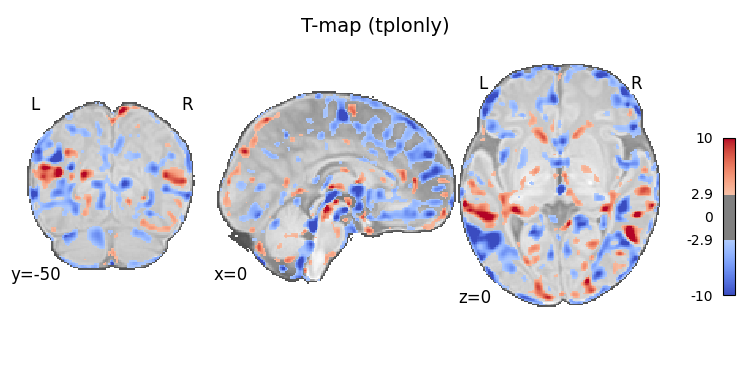

Saved /project/4290000.01/yapwan/Projects/NeonatalNormalization/Result/tmap_bias_log_geometric_JD_00_to_01_onlyBCP_test_tplonly.png
Plotting: avgsubj
FDR t-threshold: 2.7532


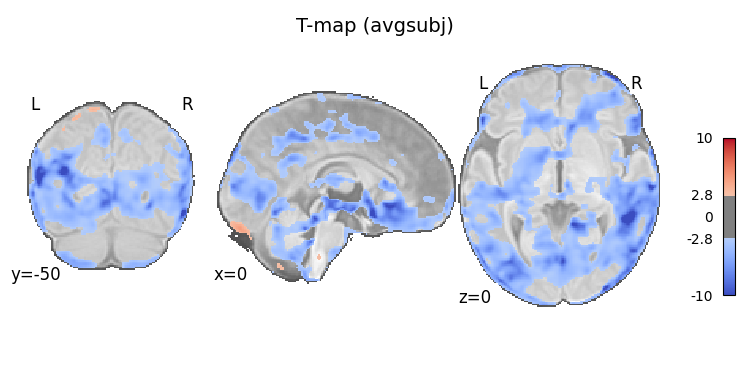

Saved /project/4290000.01/yapwan/Projects/NeonatalNormalization/Result/tmap_bias_log_geometric_JD_00_to_01_onlyBCP_test_avgsubj.png

===== Processing age window: 1-2M =====

🧠 tpl_fix=02M — Significance summary
  Total voxels: 1,353,268
  Raw p<0.05 = 449,469 (33.21%), FDR<0.05 = 151,767 (11.21%)
FDR t-threshold: 3.3128
Saved maps for tplonly

🧠 tpl_fix=02M — Significance summary
  Total voxels: 1,353,268
  Raw p<0.05 = 382,690 (28.28%), FDR<0.05 = 2,052 (0.15%)
FDR t-threshold: 5.6768
Saved maps for avgsubj
Plotting: tplonly
FDR t-threshold: 3.3128


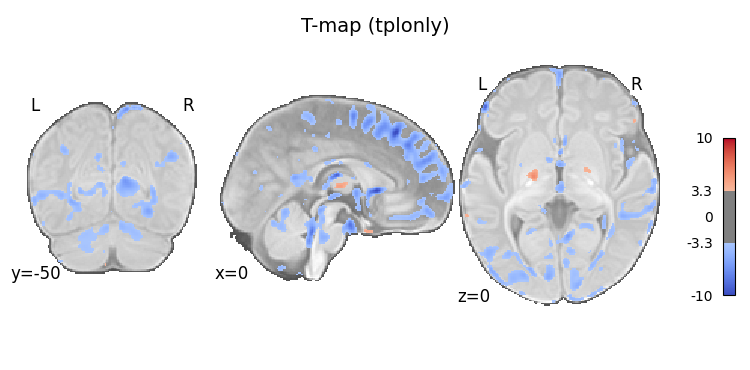

Saved /project/4290000.01/yapwan/Projects/NeonatalNormalization/Result/tmap_bias_log_geometric_JD_01_to_02_onlyBCP_test_tplonly.png
Plotting: avgsubj
FDR t-threshold: 5.6768


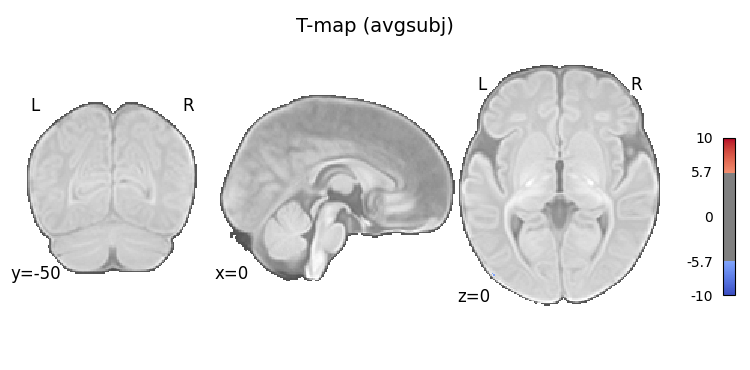

Saved /project/4290000.01/yapwan/Projects/NeonatalNormalization/Result/tmap_bias_log_geometric_JD_01_to_02_onlyBCP_test_avgsubj.png

===== Processing age window: 2-3M =====

🧠 tpl_fix=03M — Significance summary
  Total voxels: 1,480,101
  Raw p<0.05 = 668,684 (45.18%), FDR<0.05 = 524,908 (35.46%)
FDR t-threshold: 2.6861
Saved maps for tplonly

🧠 tpl_fix=03M — Significance summary
  Total voxels: 1,480,101
  Raw p<0.05 = 535,546 (36.18%), FDR<0.05 = 310,157 (20.96%)
FDR t-threshold: 2.9533
Saved maps for avgsubj
Plotting: tplonly
FDR t-threshold: 2.6861


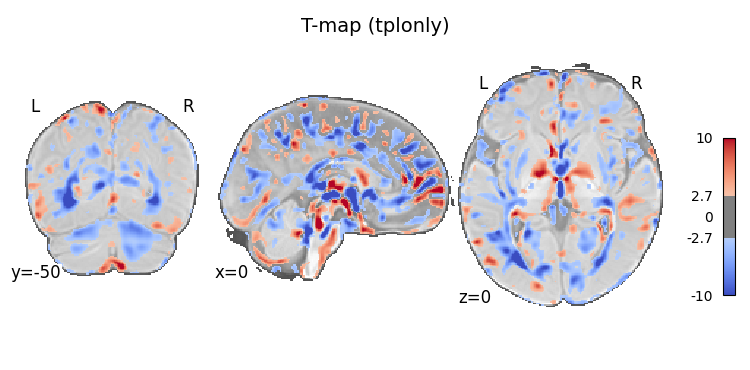

Saved /project/4290000.01/yapwan/Projects/NeonatalNormalization/Result/tmap_bias_log_geometric_JD_02_to_03_onlyBCP_test_tplonly.png
Plotting: avgsubj
FDR t-threshold: 2.9533


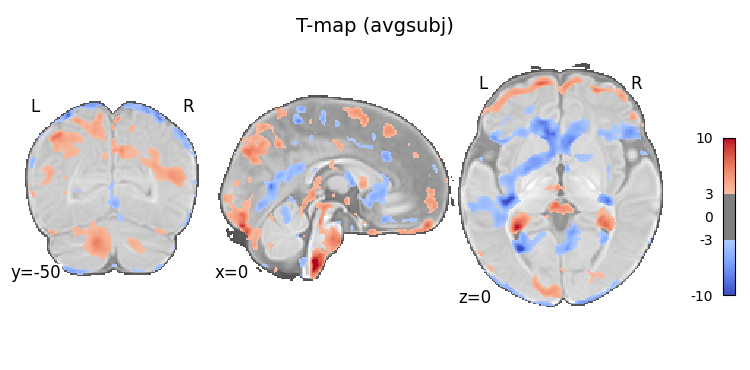

Saved /project/4290000.01/yapwan/Projects/NeonatalNormalization/Result/tmap_bias_log_geometric_JD_02_to_03_onlyBCP_test_avgsubj.png

===== Processing age window: 3-4M =====

🧠 tpl_fix=04M — Significance summary
  Total voxels: 1,603,164
  Raw p<0.05 = 351,184 (21.91%), FDR<0.05 = 25,947 (1.62%)
FDR t-threshold: 4.2493
Saved maps for tplonly

🧠 tpl_fix=04M — Significance summary
  Total voxels: 1,603,164
  Raw p<0.05 = 306,551 (19.12%), FDR<0.05 = 56,401 (3.52%)
FDR t-threshold: 3.8524
Saved maps for avgsubj
Plotting: tplonly
FDR t-threshold: 4.2493


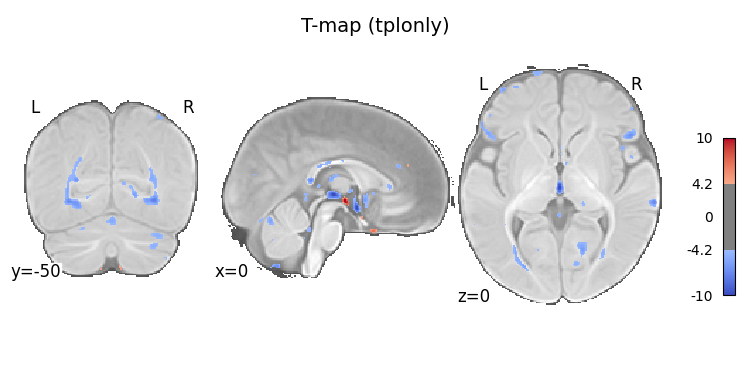

Saved /project/4290000.01/yapwan/Projects/NeonatalNormalization/Result/tmap_bias_log_geometric_JD_03_to_04_onlyBCP_test_tplonly.png
Plotting: avgsubj
FDR t-threshold: 3.8524


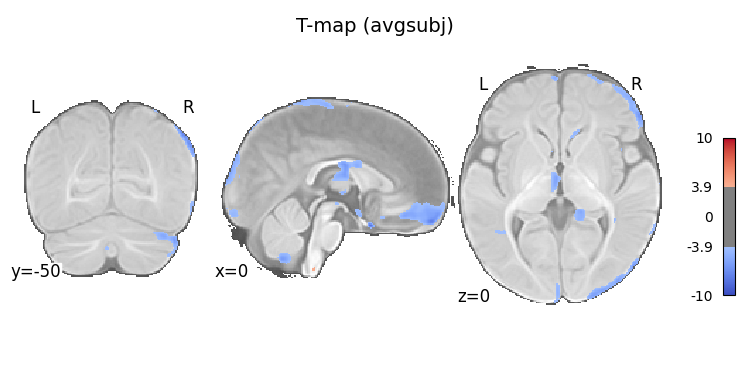

Saved /project/4290000.01/yapwan/Projects/NeonatalNormalization/Result/tmap_bias_log_geometric_JD_03_to_04_onlyBCP_test_avgsubj.png

===== Processing age window: 4-5M =====

🧠 tpl_fix=05M — Significance summary
  Total voxels: 1,685,588
  Raw p<0.05 = 330,332 (19.60%), FDR<0.05 = 96,502 (5.73%)
FDR t-threshold: 3.6063
Saved maps for tplonly

🧠 tpl_fix=05M — Significance summary
  Total voxels: 1,685,588
  Raw p<0.05 = 488,343 (28.97%), FDR<0.05 = 198,760 (11.79%)
FDR t-threshold: 3.2429
Saved maps for avgsubj
Plotting: tplonly
FDR t-threshold: 3.6063


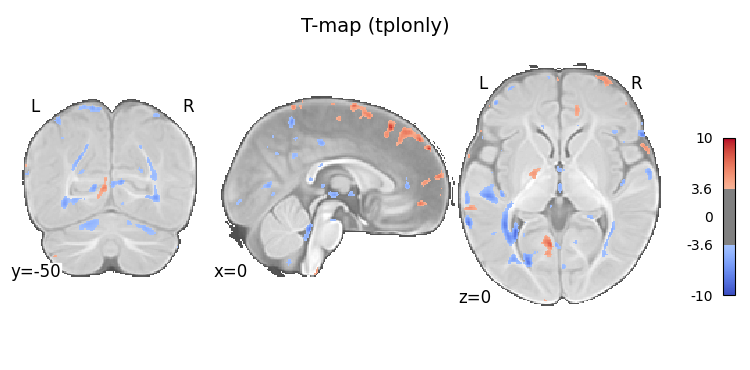

Saved /project/4290000.01/yapwan/Projects/NeonatalNormalization/Result/tmap_bias_log_geometric_JD_04_to_05_onlyBCP_test_tplonly.png
Plotting: avgsubj
FDR t-threshold: 3.2429


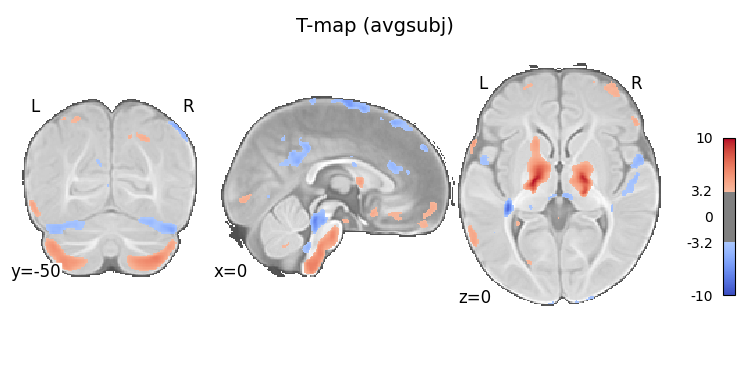

Saved /project/4290000.01/yapwan/Projects/NeonatalNormalization/Result/tmap_bias_log_geometric_JD_04_to_05_onlyBCP_test_avgsubj.png


In [12]:
# ======== Config ======== #
modalities = ["T1", "T2"]
pipel_dir = "/project/4290000.01/yapwan/Projects/CerebellarNormalization_1002/pipeline/ants_normalize"
pipel_dir = "/project/4290000.01/yapwan/Projects/NeonatalNormalization/Data"
tpl_root = "/project/4290000.01/yapwan/toolbox/BCP-atlas-for_release-Ver2.0.0"
tpl_trans_dir = f"{tpl_root}/tpl_xfm_build"

# ======== Load Template Info ======== #
tpl_dirs = [d for d in os.listdir(tpl_root) if os.path.isdir(os.path.join(tpl_root, d))]
tpl_months = sorted([d[:-5] for d in tpl_dirs if d.endswith("Month")], key=int)
tpl_mov_months = [m for m in tpl_months if int(m) < int(tpl_fix_month)]


# ================= CONFIG ================= #
result_dir = "/project/4290000.01/yapwan/Projects/NeonatalNormalization/Result"
tpl_root    = "/project/4290000.01/yapwan/toolbox/BCP-atlas-for_release-Ver2.0.0"

methods = ["tplonly", "avgsubj"]

dataset_name = 'BCP'
print(f"Processing dataset: {dataset_name}")
info_age = pd.read_csv(os.path.join(Info_dir, f'{dataset_name}_participants_selected_30_eachbin.tsv'), sep='\t')
window_cols = [c for c in info_age.columns if "-" in c and c.endswith("M")]
subs = {}
for m_bin in window_cols[:5]:
    print(f"\n===== Processing age window: {m_bin} =====")
    tpl_mov_month = m_bin.replace("M","").split("-")[0].zfill(2)
    tpl_fix_month = m_bin.replace("M","").split("-")[1].zfill(2)
    

    ref_img  = nib.load(get_tpl_path(tpl_fix_month, "T1"))
    mask_img = nib.load(get_tpl_path(tpl_fix_month, "T1").replace("-T1.nii.gz", "-Mask.nii.gz"))
    mask = mask_img.get_fdata() > 0

    file_key = f"log_geometric_JD_{tpl_mov_month}_to_{tpl_fix_month}_onlyBCP_test"

    # Load bias arrays once
    bias_dt = np.load(os.path.join(result_dir, f"all_bias_{file_key}_tplonly.npy"))
    bias_as = np.load(os.path.join(result_dir, f"all_bias_{file_key}_avgsubj.npy"))


    df = bias_dt.shape[0] - 1  # df for t-test

    # Pre-store everything for visualization
    t_results = {}
    p_results = {}

    # ---------- Compute t-test and save maps ---------- #
    for method, bias in zip(methods, [bias_dt, bias_as]):

        # t-test
        tvals, pvals = one_sample_ttest(bias)
        t_results[method] = tvals
        p_results[method] = pvals

        # FDR
        reject, qvals = fdr_bh(pvals, alpha=0.05)

        # Mean bias
        mean_bias = bias.mean(axis=0)
        sig_mean_bias = np.where(reject, mean_bias, 0)

        # ======== Summary ======== #
        total_voxels = np.sum(mask)
        raw_sig = np.sum(pvals < 0.05)
        fdr_sig = np.sum(reject)
        print(f"\n🧠 tpl_fix={tpl_fix_month}M — Significance summary")
        print(f"  Total voxels: {total_voxels:,}")
        print(f"  Raw p<0.05 = {raw_sig:,} ({raw_sig/total_voxels*100:.2f}%), "
            f"FDR<0.05 = {fdr_sig:,} ({fdr_sig/total_voxels*100:.2f}%)")

        # FDR t-threshold
        t_thr = compute_fdr_t_threshold(tvals, pvals, alpha=0.05, df=df)
        if t_thr is None:
            t_thr = 1.96
        print(f"FDR t-threshold: {t_thr:.4f}")

        
        # Save
        save_nifti(tvals, mask, ref_img, os.path.join(result_dir, f"tmap_bias_{file_key}_{method}.nii.gz"))
        save_nifti(pvals, mask, ref_img, os.path.join(result_dir, f"pmap_bias_{file_key}_{method}.nii.gz"))
        save_nifti(qvals, mask, ref_img, os.path.join(result_dir, f"qmap_bias_{file_key}_{method}_fdr05.nii.gz"))
        save_nifti(reject.astype(np.uint8), mask, ref_img,
                   os.path.join(result_dir, f"sigmask_bias_{file_key}_{method}_fdr05.nii.gz"))

        save_nifti(mean_bias,      mask, ref_img, os.path.join(result_dir, f"bias_mean_{file_key}_{method}.nii.gz"))
        save_nifti(sig_mean_bias,  mask, ref_img,
                   os.path.join(result_dir, f"bias_mean_sig_{file_key}_{method}_fdr05.nii.gz"))

        print(f"Saved maps for {method}")

    # ---------- Visualization (FDR threshold) ---------- #
    bg_img = get_tpl_path(tpl_fix_month, "T1")

    for method in methods:

        print(f"Plotting: {method}")

        tvals = t_results[method]
        pvals = p_results[method]

        # FDR t-threshold
        t_thr = compute_fdr_t_threshold(tvals, pvals, alpha=0.05, df=df)
        if t_thr is None:
            t_thr = 1.96

        # Plot
        print(f"FDR t-threshold: {t_thr:.4f}")
        display = plotting.plot_stat_map(
            os.path.join(result_dir, f"tmap_bias_{file_key}_{method}.nii.gz"),
            bg_img=bg_img,
            threshold=t_thr,
            # threshold=1.96,
            vmin=-10, vmax=10,
            cmap='coolwarm',
            draw_cross=False,
            black_bg=False,
            display_mode='ortho',
            cut_coords=[0, -50, 0]
        )

        # Adjust colorbar
        cbar_ax = getattr(display, "_cbar_ax", getattr(display, "_colorbar_ax", None))
        pos = cbar_ax.get_position()
        cbar_ax.set_position([pos.x0, pos.y0 + 0.15 * pos.height, pos.width, pos.height * 0.5])

        # Title
        fig = getattr(display, "_fig", plt.gcf())
        plt.tight_layout(rect=[0, 0, 1, 0.94])
        fig.suptitle(f"T-map ({method})", y=0.98, fontsize=14)

        out_png = os.path.join(result_dir, f"tmap_bias_{file_key}_{method}_FDRthr.png")
        out_png = os.path.join(result_dir, f"tmap_bias_{file_key}_{method}.png")
        plt.savefig(out_png, dpi=300, bbox_inches="tight")
        plt.show()

        print(f"Saved {out_png}")

## 7.2 dHCP+BCP mixed 0-1, 1-2

In [4]:
import os
import numpy as np
import nibabel as nib
import pandas as pd
from tqdm import tqdm

# ======== Config ======== #
modalities = ["T1", "T2"]
Info_dir = '/project/4290000.01/yapwan/Projects/NeonatalNormalization/Info'
pipel_dir = "/project/4290000.01/yapwan/Projects/NeonatalNormalization/Data"
result_dir = "/project/4290000.01/yapwan/Projects/NeonatalNormalization/Result"
tpl_root = "/project/4290000.01/yapwan/toolbox/BCP-atlas-for_release-Ver2.0.0"

# ======== Helper Functions ======== #
def safe_load(filepath, mask_shape=None):
    if not os.path.exists(filepath):
        print(f"⚠️ Missing file: {filepath}")
        return None
    try:
        data = nib.load(filepath).get_fdata()
        if mask_shape and data.shape != mask_shape:
            print(f"⚠️ Shape mismatch: {filepath}, got {data.shape}, expected {mask_shape}")
            return None
        return data
    except Exception as e:
        print(f"❌ Failed to load {filepath}: {e}")
        return None

def save_nifti_map(data_flat, mask, ref_img, save_path):
    os.makedirs(os.path.dirname(save_path), exist_ok=True)
    full_data = np.zeros(ref_img.shape)
    full_data[mask > 0] = data_flat
    nifti_img = nib.Nifti1Image(full_data, ref_img.affine)
    nib.save(nifti_img, save_path)

def get_tpl_path(month, modality):
    return os.path.join(tpl_root, f"{month}Month", f"BCP-{month}M-{modality}.nii.gz")

def get_mask_path(month):
    return get_tpl_path(month, "T1").replace("-T1.nii.gz", "-Mask.nii.gz")

datasets = ['dHCP','BCP']

subs = {}

for m_bin in ['0-1M', '1-2M']:

    print(f"\n===== Processing age window: {m_bin} =====")

    subs[m_bin] = {}

    # Collect subjects for each dataset
    for dataset_name in datasets:
        print(f"Processing dataset: {dataset_name}")
        info_age = pd.read_csv( os.path.join(Info_dir, f'{dataset_name}_participants.tsv'),sep='\t')
        subs_cur = ( info_age.loc[info_age[m_bin], ["participant_id"]].drop_duplicates().values.flatten() )
        subs_cur = [ s.replace("sub-", f"{dataset_name}_sub-") for s in subs_cur]
        subs[m_bin][dataset_name] = subs_cur
        print(f"{dataset_name} subjects:", len(subs_cur))


===== Processing age window: 0-1M =====
Processing dataset: dHCP
dHCP subjects: 9
Processing dataset: BCP
BCP subjects: 21

===== Processing age window: 1-2M =====
Processing dataset: dHCP
dHCP subjects: 3
Processing dataset: BCP
BCP subjects: 27


In [5]:


for m_bin in ['0-1M', '1-2M']:
    print(f"\n===== Processing age window: {m_bin} =====")
    tpl_mov_month = m_bin.replace("M","").split("-")[0].zfill(2)
    tpl_fix_month = m_bin.replace("M","").split("-")[1].zfill(2)

    file_keyword = f"{tpl_mov_month}_to_{tpl_fix_month}_test"

    ref_img = nib.load(get_tpl_path(tpl_fix_month, "T1"))
    eval_mask_img = nib.load(get_mask_path(tpl_fix_month))
    eval_mask_data = eval_mask_img.get_fdata()
    mask_shape = eval_mask_data.shape

    all_jd_d, all_jd_tl, all_jd_as = [], [], []

    split_dir = os.path.join(tpl_root, "tpl_xfm_build", "avgsubj", f"{tpl_mov_month}-{tpl_fix_month}M")
    test_subs = pd.read_csv(os.path.join(split_dir,'test_subs.tsv'))["subject"].astype(str).tolist()
    print(f"Number of Test subjects: {len(test_subs)}")
    print("Test subjects:", test_subs)
    for substr in tqdm(test_subs):
        dataset_name, subid = substr.split("_")
        output_dir = os.path.join(pipel_dir, dataset_name, subid)

        paths = {
            "direct": os.path.join(output_dir, f"T1T2_Brain_pad_Norm_to_{tpl_fix_month}Mtpl_log_geometric_JD.nii.gz"),
            "tplonly": os.path.join(output_dir, f"Displacement_T1T2_Brain_pad_Norm_to_{tpl_mov_month}Mtpl_then_to_{tpl_fix_month}Mtpl_by_tplonly_log_geometric_JD.nii.gz"),
            "avgsubj": os.path.join(output_dir, f"Displacement_T1T2_Brain_pad_Norm_to_{tpl_mov_month}Mtpl_then_to_{tpl_fix_month}Mtpl_by_avgsubj_train_log_geometric_JD.nii.gz"),
        }

        jd_d = safe_load(paths["direct"], mask_shape)
        jd_tl = safe_load(paths["tplonly"], mask_shape)
        jd_as = safe_load(paths["avgsubj"], mask_shape)

        if any(x is None for x in [jd_d, jd_tl, jd_as]):
            continue

        all_jd_d.append(jd_d[eval_mask_data > 0])
        all_jd_tl.append(jd_tl[eval_mask_data > 0])
        all_jd_as.append(jd_as[eval_mask_data > 0])

    if not all_jd_d:
        print(f"❗ No valid data for tpl_fix_month={tpl_fix_month}. Skipping.")
        continue


    # ======== Bias (Indirect − Direct) ======== #
    diff_tl_d = np.stack([i - d for i, d in zip(all_jd_tl, all_jd_d)])  # shape: (n_subjects, n_voxels)
    diff_as_d = np.stack([i - d for i, d in zip(all_jd_as, all_jd_d)])
    np.save(os.path.join(result_dir, f"all_bias_{file_keyword}_tplonly.npy"), diff_tl_d)
    np.save(os.path.join(result_dir, f"all_bias_{file_keyword}_avgsubj.npy"), diff_as_d)

print("\n✅ All tpl_fix_months processed successfully.")


===== Processing age window: 0-1M =====
Number of Test subjects: 16
Test subjects: ['dHCP_sub-001', 'dHCP_sub-007', 'dHCP_sub-008', 'dHCP_sub-002', 'dHCP_sub-006', 'BCP_sub-002', 'BCP_sub-017', 'BCP_sub-005', 'BCP_sub-006', 'BCP_sub-004', 'BCP_sub-010', 'BCP_sub-018', 'BCP_sub-009', 'BCP_sub-003', 'BCP_sub-015', 'BCP_sub-007']


  0%|          | 0/16 [00:00<?, ?it/s]

100%|██████████| 16/16 [00:34<00:00,  2.14s/it]



===== Processing age window: 1-2M =====
Number of Test subjects: 16
Test subjects: ['dHCP_sub-011', 'dHCP_sub-012', 'BCP_sub-013', 'BCP_sub-038', 'BCP_sub-016', 'BCP_sub-017', 'BCP_sub-015', 'BCP_sub-021', 'BCP_sub-029', 'BCP_sub-020', 'BCP_sub-014', 'BCP_sub-012', 'BCP_sub-018', 'BCP_sub-024', 'BCP_sub-023', 'BCP_sub-026']


100%|██████████| 16/16 [00:33<00:00,  2.10s/it]



✅ All tpl_fix_months processed successfully.


In [6]:
import nibabel as nib
import os
import numpy as np
import nibabel as nib
import pandas as pd
from tqdm import tqdm
from scipy.stats import t
from nilearn import plotting
import matplotlib.pyplot as plt

# ======== Helper ======== #
def get_tpl_path(month, modality):
    return os.path.join(tpl_root, f"{month}Month", f"BCP-{month}M-{modality}.nii.gz")

def get_mask_path(month):
    return get_tpl_path(month, "T1").replace("-T1.nii.gz", "-Mask.nii.gz")

def save_nifti(data_flat, mask, ref_img, outpath):
    full = np.zeros(ref_img.shape)
    full[mask > 0] = data_flat
    nib.save(nib.Nifti1Image(full, ref_img.affine), outpath)

def one_sample_ttest(arr):
    n = arr.shape[0]
    mean = arr.mean(axis=0)
    std  = arr.std(axis=0, ddof=1)
    se   = std / np.sqrt(n)
    tvals = np.zeros_like(mean)
    valid = se > 0
    tvals[valid] = mean[valid] / se[valid]
    pvals = 2 * (1 - t.cdf(np.abs(tvals), n - 1))
    return tvals, pvals

def compute_t_p(bias_array):
    """One-sample t-test against zero per voxel"""
    n = bias_array.shape[0]
    mean_bias = np.mean(bias_array, axis=0)
    std_bias = np.std(bias_array, axis=0, ddof=1)
    se = std_bias / np.sqrt(n)
    print("Number of voxels with SE<=0:", end=" ")
    print(np.sum(se <= 0))
    t_values = np.zeros_like(mean_bias)
    t_values[se > 0] = mean_bias[se > 0] / se[se > 0]
    df = n - 1
    p_values = 2 * (1 - t.cdf(np.abs(t_values), df))
    p_values[np.isnan(p_values)] = 1.0
    return t_values, p_values

def fdr_bh(pvals, alpha=0.05):
    """Benjamini–Hochberg FDR correction"""
    pvals = pvals.flatten()
    n = len(pvals)
    order = np.argsort(pvals)
    ranked = pvals[order]
    thresh = alpha * np.arange(1, n + 1) / n
    below = ranked <= thresh
    reject = np.zeros_like(pvals, dtype=bool)
    qvals = np.ones_like(pvals)
    if np.any(below):
        kmax = np.where(below)[0].max()
        p_crit = thresh[kmax]
        reject[pvals <= p_crit] = True
        adj_p = ranked * n / np.arange(1, n + 1)
        adj_p = np.minimum.accumulate(adj_p[::-1])[::-1]
        qvals[order] = np.clip(adj_p, 0, 1)
    return reject.reshape(-1), qvals.reshape(-1)

def compute_fdr_t_threshold(tmap, pmap, alpha, df):
    tvals = tmap.flatten()
    pvals = pmap.flatten()

    valid = ~np.isnan(tvals) & ~np.isnan(pvals)
    pvals = pvals[valid]

    n = len(pvals)
    order = np.argsort(pvals)
    ranked = pvals[order]
    thresh = alpha * np.arange(1, n + 1) / n
    below = ranked <= thresh

    if not np.any(below):
        return None

    p_crit = thresh[np.where(below)[0].max()]
    return t.ppf(1 - p_crit / 2, df)



===== Processing age window: 0-1M =====

=== Processing tpl_fix=01M ===

🧠 tpl_fix=01M — Significance summary
  Total voxels: 1,192,993
  Raw p<0.05 = 605,969 (50.79%), FDR<0.05 = 512,925 (42.99%)
FDR t-threshold: 2.5662
Saved maps for tplonly

🧠 tpl_fix=01M — Significance summary
  Total voxels: 1,192,993
  Raw p<0.05 = 601,902 (50.45%), FDR<0.05 = 469,976 (39.39%)
FDR t-threshold: 2.6101
Saved maps for avgsubj
Plotting: tplonly
FDR t-threshold: 2.5662


/scratch/yapwan/slurm_job_51351784/ipykernel_3024298/1138432863.py:117: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 1, 0.94])


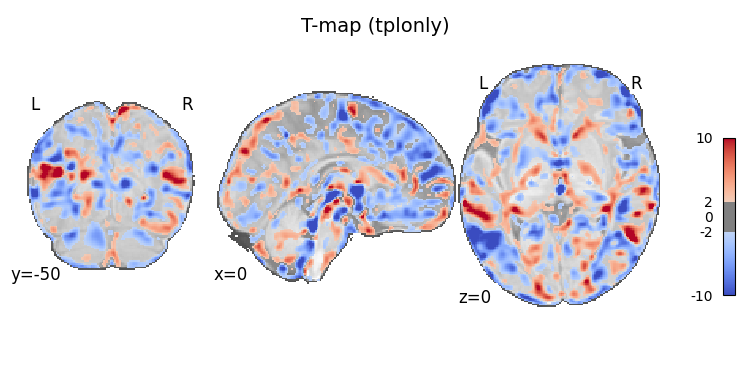

Saved /project/4290000.01/yapwan/Projects/NeonatalNormalization/Result/tmap_bias_00_to_01_test_tplonly.png
Plotting: avgsubj
FDR t-threshold: 2.6101


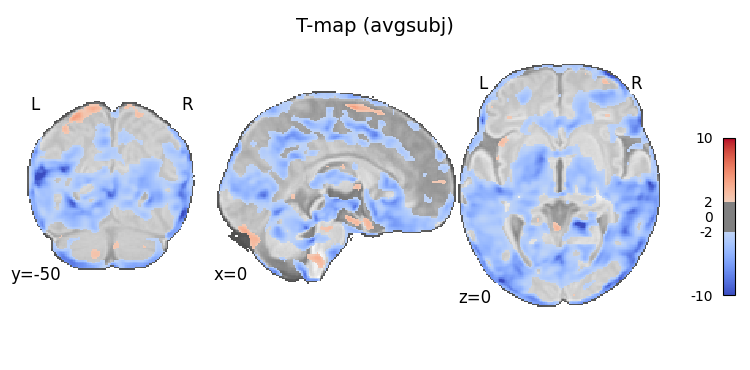

Saved /project/4290000.01/yapwan/Projects/NeonatalNormalization/Result/tmap_bias_00_to_01_test_avgsubj.png

===== Processing age window: 1-2M =====

=== Processing tpl_fix=02M ===

🧠 tpl_fix=02M — Significance summary
  Total voxels: 1,353,268
  Raw p<0.05 = 532,172 (39.32%), FDR<0.05 = 349,810 (25.85%)
FDR t-threshold: 2.8201
Saved maps for tplonly

🧠 tpl_fix=02M — Significance summary
  Total voxels: 1,353,268
  Raw p<0.05 = 450,582 (33.30%), FDR<0.05 = 86,669 (6.40%)
FDR t-threshold: 3.5032
Saved maps for avgsubj
Plotting: tplonly
FDR t-threshold: 2.8201


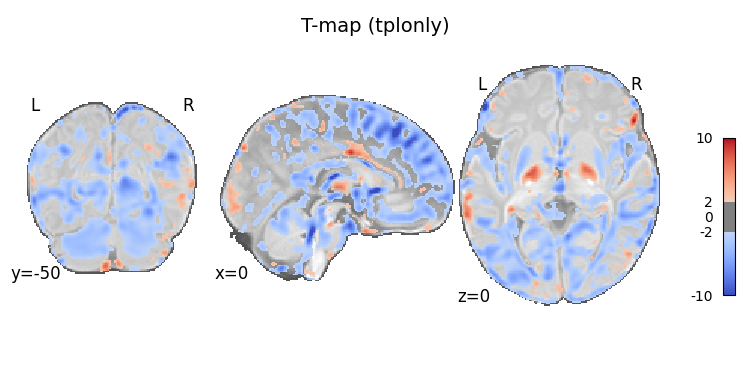

Saved /project/4290000.01/yapwan/Projects/NeonatalNormalization/Result/tmap_bias_01_to_02_test_tplonly.png
Plotting: avgsubj
FDR t-threshold: 3.5032


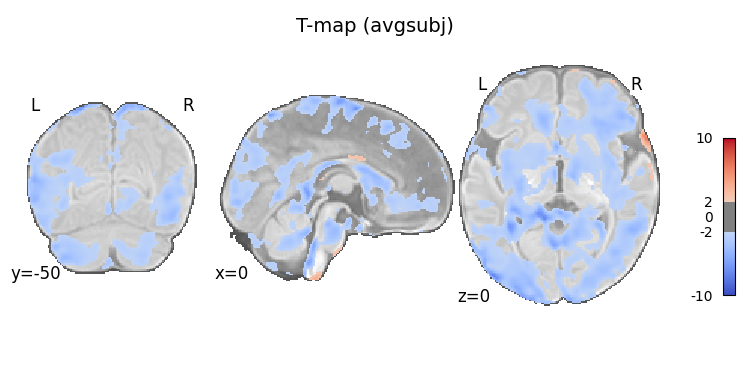

Saved /project/4290000.01/yapwan/Projects/NeonatalNormalization/Result/tmap_bias_01_to_02_test_avgsubj.png


In [7]:


# ================= CONFIG ================= #



result_dir = "/project/4290000.01/yapwan/Projects/NeonatalNormalization/Result"
tpl_root    = "/project/4290000.01/yapwan/toolbox/BCP-atlas-for_release-Ver2.0.0"

methods = ["tplonly", "avgsubj"]


# ================= MAIN ================= #
for m_bin in ['0-1M', '1-2M']:
    print(f"\n===== Processing age window: {m_bin} =====")
    tpl_mov_month = m_bin.replace("M","").split("-")[0].zfill(2)
    tpl_fix_month = m_bin.replace("M","").split("-")[1].zfill(2)

    print(f"\n=== Processing tpl_fix={tpl_fix_month}M ===")

    ref_img  = nib.load(get_tpl_path(tpl_fix_month, "T1"))
    mask_img = nib.load(get_tpl_path(tpl_fix_month, "T1").replace("-T1.nii.gz", "-Mask.nii.gz"))
    mask = mask_img.get_fdata() > 0

    file_key = f"{tpl_mov_month}_to_{tpl_fix_month}_test"

    # Load bias arrays once
    bias_dt = np.load(os.path.join(result_dir, f"all_bias_{file_key}_tplonly.npy"))
    bias_as = np.load(os.path.join(result_dir, f"all_bias_{file_key}_avgsubj.npy"))


    df = bias_dt.shape[0] - 1  # df for t-test

    # Pre-store everything for visualization
    t_results = {}
    p_results = {}

    # ---------- Compute t-test and save maps ---------- #
    for method, bias in zip(methods, [bias_dt, bias_as]):

        # t-test
        tvals, pvals = one_sample_ttest(bias)
        t_results[method] = tvals
        p_results[method] = pvals

        # FDR
        reject, qvals = fdr_bh(pvals, alpha=0.05)

        # Mean bias
        mean_bias = bias.mean(axis=0)
        sig_mean_bias = np.where(reject, mean_bias, 0)

        # ======== Summary ======== #
        total_voxels = np.sum(mask)
        raw_sig = np.sum(pvals < 0.05)
        fdr_sig = np.sum(reject)
        print(f"\n🧠 tpl_fix={tpl_fix_month}M — Significance summary")
        print(f"  Total voxels: {total_voxels:,}")
        print(f"  Raw p<0.05 = {raw_sig:,} ({raw_sig/total_voxels*100:.2f}%), "
            f"FDR<0.05 = {fdr_sig:,} ({fdr_sig/total_voxels*100:.2f}%)")

        # FDR t-threshold
        t_thr = compute_fdr_t_threshold(tvals, pvals, alpha=0.05, df=df)
        if t_thr is None:
            t_thr = 1.96
        print(f"FDR t-threshold: {t_thr:.4f}")

        
        # Save
        save_nifti(tvals, mask, ref_img, os.path.join(result_dir, f"tmap_bias_{file_key}_{method}.nii.gz"))
        save_nifti(pvals, mask, ref_img, os.path.join(result_dir, f"pmap_bias_{file_key}_{method}.nii.gz"))
        save_nifti(qvals, mask, ref_img, os.path.join(result_dir, f"qmap_bias_{file_key}_{method}_fdr05.nii.gz"))
        save_nifti(reject.astype(np.uint8), mask, ref_img,
                   os.path.join(result_dir, f"sigmask_bias_{file_key}_{method}_fdr05.nii.gz"))

        save_nifti(mean_bias,      mask, ref_img, os.path.join(result_dir, f"bias_mean_{file_key}_{method}.nii.gz"))
        save_nifti(sig_mean_bias,  mask, ref_img,
                   os.path.join(result_dir, f"bias_mean_sig_{file_key}_{method}_fdr05.nii.gz"))

        print(f"Saved maps for {method}")

    # ---------- Visualization (FDR threshold) ---------- #
    bg_img = get_tpl_path(tpl_fix_month, "T1")

    for method in methods:

        print(f"Plotting: {method}")

        tvals = t_results[method]
        pvals = p_results[method]

        # FDR t-threshold
        t_thr = compute_fdr_t_threshold(tvals, pvals, alpha=0.05, df=df)
        if t_thr is None:
            t_thr = 1.96

        # Plot
        print(f"FDR t-threshold: {t_thr:.4f}")
        display = plotting.plot_stat_map(
            os.path.join(result_dir, f"tmap_bias_{file_key}_{method}.nii.gz"),
            bg_img=bg_img,
            threshold=t_thr,
            # threshold=1.96,
            vmin=-10, vmax=10,
            cmap='coolwarm',
            draw_cross=False,
            black_bg=False,
            display_mode='ortho',
            cut_coords=[0, -50, 0]
        )

        # Adjust colorbar
        cbar_ax = getattr(display, "_cbar_ax", getattr(display, "_colorbar_ax", None))
        pos = cbar_ax.get_position()
        cbar_ax.set_position([pos.x0, pos.y0 + 0.15 * pos.height, pos.width, pos.height * 0.5])

        # Title
        fig = getattr(display, "_fig", plt.gcf())
        plt.tight_layout(rect=[0, 0, 1, 0.94])
        fig.suptitle(f"T-map ({method})", y=0.98, fontsize=14)

        out_png = os.path.join(result_dir, f"tmap_bias_{file_key}_{method}_FDRthr.png")
        out_png = os.path.join(result_dir, f"tmap_bias_{file_key}_{method}.png")
        plt.savefig(out_png, dpi=300, bbox_inches="tight")
        plt.show()

        print(f"Saved {out_png}")